# Rebuttal Metrics

I want to have a complete notebook that calculates all of the requested metrics, produces tables and plots for the paper.

Requested metrics from reviewers:
- Introduce additional diagnostics (on additional variables) such as SEDI, POD, FSS and etc for 95th and 99th percentiles and an analysis of the PDF tail for low likelihood / high impact events as suggested by reviewers for extreme events.

For each metrics, include a detailed description of the metric, how to interpret it and why it is valuable.

We want to show that CDSI/SI produce better predictions, especially for extreme events. Feel free to add additional metrics/diagnostics to explore if this is the case.

The data for the predictions is at /mimer/NOBACKUP/groups/mlhighres/users/mikhaili/neural-lam/output/270126. The experiments we are interested in are ["test_SI_small_r1", "test_CorrDiff_small_r1", "test_UNet_small_r1"].

To see how we loaded the data and calculated metrics in the past you can look in the analysis folder and at /mimer/NOBACKUP/groups/mlhighres/users/erifh/neural-lam/analysis/metrics.ipynb.

## Scope and structure of this notebook

**Variables.** The models predict exactly two variables (`downscaling_idx: [6, 8]` in the data config): precipitation (`pr`, mm/day) and 2m air temperature (`tas`, Kelvin). All diagnostics below are computed for both.

**Experiments.** `test_UNet_small_r1` (deterministic convolutional baseline, no ensemble), `test_CorrDiff_small_r1` (UNet mean + EDM residual diffusion, 20-member ensemble), `test_SI_small_r1` (stochastic-interpolant diffusion model — the paper's proposed CDSI/SI model, 20-member ensemble). Test period: 2010-01-01 to 2014-12-30 (1824 daily steps, noleap calendar), on the shared 400×550 0.1° EUR-11 CORDEX grid. Data in the merged `.nc` files under each experiment directory is **already in physical units** (destandardized when produced), so no further unnormalization is needed here.

**Thresholds.** For every extreme-event diagnostic we use two threshold bases:
- **Per-gridcell (primary)** — each grid cell's own 95th/99th percentile, computed from its own 1824-day time series. This is the standard approach in climate-model verification because precipitation/temperature climatology varies hugely across the domain (e.g. wet coastal Norway vs. a dry lowland); "extreme" is defined relative to each location's own norm.
- **Domain-wide (supplementary sanity check)** — a single percentile pooled over all grid cells and days. Included for comparison only; it conflates very different climates into one number and is not the headline method.

**UNet caveat.** UNet is deterministic (no ensemble members/std). It appears in every table where a diagnostic is conceptually meaningful for a single deterministic forecast (RMSE, FSS, ensemble-mean-based contingency table, percentile-conditional RMSE/bias, GPD tail fit, quantile bias). It is explicitly excluded — with a note, never silently dropped — from ensemble-only diagnostics (rank histograms, reliability diagrams, ensemble-probability contingency tables), and its CRPS degenerates to MAE (noted inline).

**Section-by-section template.** Every new diagnostic below follows the same pattern: (1) markdown defining the metric/formula, (2) markdown interpreting it and explaining why it matters for extreme-event evaluation, (3) code computing it for all experiments/variables, (4) a table and/or plot, (5) brief discussion of what the result shows.

**Table styling.** Every scored metric table marks, within each matched group (e.g. within a given variable/percentile, comparing the 3 models to each other): the **best** value in **bold**, and the **second-best** value <u>underlined</u>. Column headers are annotated with an arrow saying which direction is better: **↑** = higher is better (POD, CSI, SEDI, FSS...), **↓** = lower is better (RMSE, CRPS, FAR, Brier...), **→0** = closer to zero is better (bias-type metrics), **→1** = closer to 1 is better (SSR, frequency Bias). Descriptive/reference tables without a clear "better" direction (dry-day fraction, GPD shape/scale parameters) are left unstyled. The notebook's LaTeX exports carry the same `\textbf{}`/`\underline{}` markup so tables are rebuttal-ready as-is.

**Compute.** GPU-accelerated where it meaningfully helps: CRPS (`neural_lam.metrics.crps_ens`), the pooled contingency-table counts, and the Fractions Skill Score (via `torch.nn.functional.avg_pool2d`, an exact GPU equivalent of the CPU neighborhood-averaging filter) all run on GPU when available, falling back to CPU otherwise.

**Memory.** This account is capped by a **~50GB user-wide memory limit** (a cgroup limit, not the much larger machine-wide free memory `free -h` reports — an earlier run OOM'd by assuming the latter). A single (ensemble_mean, target) pair is ~3.2GB; this notebook deliberately does **not** keep a persistent cache of all experiments/variables at once — every section loads exactly the arrays it needs, uses them, and explicitly frees them (`del` + `gc.collect()`) before moving on, so peak memory stays bounded to a handful of arrays regardless of how many sections have already run.

**Outputs.** Figures are saved to `analysis/rebuttal_figures/`, tables (CSV + LaTeX) to `analysis/rebuttal_output/`, separate from the existing `analysis/metrics.ipynb` caches.


## 1. Setup

In [1]:
import os
import glob
import json
import gc
import warnings
from typing import List, Tuple, Dict, Optional, Iterator

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy import stats as sstats
from scipy import ndimage as sndimage
import torch
import torch.nn.functional as Fnn
from tqdm.auto import tqdm

from neural_lam import metrics as nlmetrics

warnings.filterwarnings("ignore", category=RuntimeWarning)  # nanmean/nanpercentile on all-NaN slices etc.

plt.rcParams.update({"figure.dpi": 110, "axes.grid": True, "grid.alpha": 0.3})


def _pick_best_cuda_device() -> torch.device:
    """
    This is a shared, multi-tenant GPU node — other users' jobs can hold most of a GPU's memory at any
    moment (we hit a CUDA OOM on GPU 0 once already because another process had grabbed ~11GB of its
    15GB). Rather than hardcoding cuda:0, query free memory on every visible GPU and pick the roomiest.
    GPU-accelerated functions below (fss_gpu, pooled_contingency_table_gpu, CRPS) also each fall back to
    CPU automatically on a CUDA OOM, so this is a "pick the best starting point" optimization, not the
    only line of defense.
    """
    if not torch.cuda.is_available():
        return torch.device("cpu")
    best_idx, best_free = 0, -1
    for i in range(torch.cuda.device_count()):
        free_bytes, _total = torch.cuda.mem_get_info(i)
        if free_bytes > best_free:
            best_free, best_idx = free_bytes, i
    print(f"  GPU free memory: " + ", ".join(
        f"cuda:{i}={torch.cuda.mem_get_info(i)[0] / 1024**3:.1f}GB" for i in range(torch.cuda.device_count())
    ))
    return torch.device(f"cuda:{best_idx}")


DEVICE = _pick_best_cuda_device()
print(f"Using device: {DEVICE}")
if DEVICE.type == "cuda":
    print(f"  GPU: {torch.cuda.get_device_name(DEVICE)}")


/mimer/NOBACKUP/groups/mlhighres/users/erifh/Miniforge3/envs/clim/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/mimer/NOBACKUP/groups/mlhighres/users/erifh/Miniforge3/envs/clim/lib/python3.10/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


  GPU free memory: cuda:0=14.1GB, cuda:1=14.5GB, cuda:2=14.5GB, cuda:3=14.5GB
Using device: cuda:1
  GPU: Tesla T4


In [2]:
# --- Configuration ---
ROOT = "/mimer/NOBACKUP/groups/mlhighres/users/mikhaili/neural-lam/output/270126"

# Fixed ordering used consistently in every table/plot: baselines first, SI (paper's model) last.
EXPERIMENTS = ["test_UNet_small_r1", "test_CorrDiff_small_r1", "test_SI_small_r1"]
MODEL_LABELS = {"test_UNet_small_r1": "UNet", "test_CorrDiff_small_r1": "CorrDiff", "test_SI_small_r1": "SI (CDSI)"}
ENSEMBLE_MODELS = ["test_CorrDiff_small_r1", "test_SI_small_r1"]  # models with member files
MODEL_COLORS = {"test_UNet_small_r1": "#7f7f7f", "test_CorrDiff_small_r1": "#1f77b4", "test_SI_small_r1": "#d62728"}

VARIABLES = ["pr", "tas"]
VAR_UNITS = {"pr": "mm/day", "tas": "K"}
VAR_LONGNAME = {"pr": "Precipitation", "tas": "2m Temperature"}

START_DATE = "2010-01-01"
END_DATE = "2014-12-31"
PERCENTILES = [95, 99]
N_MEMBERS = 20

FIG_DIR = "analysis/rebuttal_figures"
OUT_DIR = "analysis/rebuttal_output"
CACHE_DIR = os.path.join(OUT_DIR, "cache")
for d in (FIG_DIR, OUT_DIR, CACHE_DIR):
    os.makedirs(d, exist_ok=True)

print("Experiments:", EXPERIMENTS)
print("Variables:", VARIABLES)
print("Percentiles:", PERCENTILES)


Experiments: ['test_UNet_small_r1', 'test_CorrDiff_small_r1', 'test_SI_small_r1']
Variables: ['pr', 'tas']
Percentiles: [95, 99]


## 2. Data-loading library

This section defines every helper reused by the rest of the notebook: file discovery (ported from `analysis/metrics.ipynb`), full-array loaders, percentile-threshold maps, contingency-table/FSS/SEDI functions, a streaming per-day ensemble-member generator (shared by rank histograms, reliability diagrams, and conditional CRPS so the file-opening logic exists exactly once), a GPD tail-fit helper, and table-formatting helpers. Nothing in this section produces paper-facing output by itself — later sections call into it.

In [3]:
# --- 2a. File discovery (ported from analysis/metrics.ipynb) ---

def strip_prefix_up_to_underscore(name: str) -> str:
    """Return part after first underscore, or original if no underscore."""
    return name.split("_", 1)[1] if "_" in name else name


def _find_nc_file(root: str, var: str, tag: str, exp: str) -> Optional[str]:
    """Locate a single netCDF file for (var, tag, exp), most-specific pattern first."""
    exp_suffix = strip_prefix_up_to_underscore(exp)
    parts = exp.split("_")
    exp_dir = os.path.join(root, exp)
    pats = [
        os.path.join(exp_dir, f"{var}*{tag}*{exp_suffix}*.nc"),
        os.path.join(exp_dir, f"{var}*{tag}*{exp}*.nc"),
    ]
    if len(parts) > 1:
        pats.append(os.path.join(exp_dir, f"{var}*{tag}*{parts[1]}*.nc"))
    pats += [os.path.join(exp_dir, f"{var}*{tag}*.nc"), os.path.join(exp_dir, f"*{tag}*.nc")]
    for pat in pats:
        matches = sorted(glob.glob(pat))
        if matches:
            return matches[0]
    matches = sorted(glob.glob(os.path.join(root, exp, "**", f"*{tag}*.nc"), recursive=True))
    return matches[0] if matches else None


def _collect_member_files(root: str, exp: str, var: str) -> List[str]:
    """Locate all ensemble-member netCDF files for (var, exp), sorted by member index."""
    exp_suffix = strip_prefix_up_to_underscore(exp)
    exp_dir = os.path.join(root, exp)
    files = sorted(glob.glob(os.path.join(exp_dir, f"{var}*ensemble_member*{exp_suffix}*.nc")))
    if not files:
        files = sorted(glob.glob(os.path.join(exp_dir, f"{var}*ensemble_member*.nc")))

    import re

    def member_idx(path):
        m = re.search(r"ensemble_member[_]?(\d+)", os.path.basename(path))
        return int(m.group(1)) if m else -1

    return sorted(files, key=member_idx)


def has_ensemble(exp: str) -> bool:
    return exp in ENSEMBLE_MODELS


# --- 2b. Full-array loaders ---

def _pick_varname(ds: xr.Dataset, preferred: str) -> str:
    if preferred in ds.data_vars:
        return preferred
    return list(ds.data_vars)[0]


def load_full_array(root: str, exp: str, var: str, tag: str,
                     start_date: str = START_DATE, end_date: str = END_DATE) -> Optional[xr.DataArray]:
    """Eagerly load a full (time, lat, lon) array for (root, exp, var, tag). None if the file doesn't exist."""
    path = _find_nc_file(root, var, tag, exp)
    if path is None:
        return None
    ds = xr.open_dataset(path)
    varname = _pick_varname(ds, var)
    da = ds[varname]
    if start_date or end_date:
        da = da.sel(time=slice(start_date, end_date))
    da = da.load()
    ds.close()
    return da


def load_aligned_pair(root: str, exp: str, var: str,
                       start_date: str = START_DATE, end_date: str = END_DATE) -> Tuple[xr.DataArray, xr.DataArray]:
    """Load (ensemble_mean, target) aligned on the intersection of their time coordinates."""
    pred = load_full_array(root, exp, var, "ensemble_mean", start_date, end_date)
    target = load_full_array(root, exp, var, "target", start_date, end_date)
    if pred is None or target is None:
        raise FileNotFoundError(f"Missing ensemble_mean or target for exp={exp}, var={var}")
    common_times = np.intersect1d(pred["time"].values, target["time"].values)
    pred = pred.sel(time=common_times)
    target = target.sel(time=common_times)
    assert pred.shape == target.shape, f"Shape mismatch for {exp}/{var}: pred {pred.shape} vs target {target.shape}"
    assert np.allclose(pred["lat"].values, target["lat"].values)
    assert np.allclose(pred["lon"].values, target["lon"].values)
    return pred, target


print("Section 2a/2b defined: file discovery + full-array loaders.")


Section 2a/2b defined: file discovery + full-array loaders.


In [4]:
# --- 2c. Percentile thresholds, binarization, contingency table, SEDI, FSS ---

def percentile_threshold_maps(target: xr.DataArray, percentiles: List[float]) -> Dict[float, np.ndarray]:
    """Per-gridcell percentile maps: each grid cell's own p-th percentile over the full time series."""
    arr = target.values  # (T, lat, lon)
    return {p: np.nanpercentile(arr, p, axis=0) for p in percentiles}


def domain_wide_thresholds(target: xr.DataArray, percentiles: List[float]) -> Dict[float, float]:
    """Single pooled p-th percentile over all grid cells and days."""
    flat = target.values.ravel()
    return {p: float(np.nanpercentile(flat, p)) for p in percentiles}


def binarize(arr: np.ndarray, threshold) -> np.ndarray:
    """threshold: scalar (domain-wide) or (lat, lon) map (per-gridcell, broadcasts over leading dims)."""
    return np.asarray(arr) >= np.asarray(threshold)


def pooled_contingency_table(obs_bin: np.ndarray, fcst_bin: np.ndarray) -> Tuple[int, int, int, int]:
    """One global 2x2 table pooled over every grid cell and day (see notebook discussion for rationale). CPU."""
    obs = np.asarray(obs_bin, dtype=bool)
    fcst = np.asarray(fcst_bin, dtype=bool)
    H = int(np.sum(fcst & obs))
    M = int(np.sum(~fcst & obs))
    F = int(np.sum(fcst & ~obs))
    C = int(np.sum(~fcst & ~obs))
    return H, M, F, C


def pooled_contingency_table_gpu(target_vals: np.ndarray, pred_vals: np.ndarray, threshold,
                                  device: Optional[torch.device] = None) -> Tuple[int, int, int, int]:
    """
    GPU-accelerated pooled 2x2 contingency table, thresholding directly on the GPU instead of materializing
    obs_bin/fcst_bin as extra ~1.6GB host numpy arrays — both speeds this up and reduces host RAM pressure.
    target_vals/pred_vals: (T, lat, lon) numpy arrays. threshold: scalar or (lat, lon) array.
    Falls back to CPU automatically on a CUDA OOM (this is a shared, multi-tenant GPU node — another
    user's job can grab most of a GPU's memory between when we picked it and when we actually need it).
    """
    device = device or DEVICE
    if device.type == "cuda":
        try:
            tgt_t = torch.as_tensor(target_vals, dtype=torch.float32, device=device)
            prd_t = torch.as_tensor(pred_vals, dtype=torch.float32, device=device)
            thr_t = torch.as_tensor(np.asarray(threshold), dtype=torch.float32, device=device)
            obs = tgt_t >= thr_t
            fcst = prd_t >= thr_t
            H = int(torch.sum(fcst & obs).item())
            M = int(torch.sum((~fcst) & obs).item())
            Fp = int(torch.sum(fcst & (~obs)).item())
            C = int(torch.sum((~fcst) & (~obs)).item())
            del tgt_t, prd_t, thr_t, obs, fcst
            torch.cuda.empty_cache()
            return H, M, Fp, C
        except torch.cuda.OutOfMemoryError:
            torch.cuda.empty_cache()
            print(f"  [pooled_contingency_table_gpu] CUDA OOM on {device} (likely GPU contention from another "
                  f"user's job) — falling back to CPU for this call.")
    obs_bin = binarize(target_vals, threshold)
    fcst_bin = binarize(pred_vals, threshold)
    return pooled_contingency_table(obs_bin, fcst_bin)


def sedi(hit_rate: float, false_alarm_rate: float, eps: float = 1e-6) -> float:
    """Symmetric Extremal Dependence Index (Ferro & Stephenson, 2011). Clipped logs, NaN on degenerate denom."""
    if not (np.isfinite(hit_rate) and np.isfinite(false_alarm_rate)):
        return float("nan")
    h = np.clip(hit_rate, eps, 1 - eps)
    f = np.clip(false_alarm_rate, eps, 1 - eps)
    num = np.log(f) - np.log(h) - np.log(1 - f) + np.log(1 - h)
    den = np.log(f) + np.log(h) + np.log(1 - f) + np.log(1 - h)
    if den == 0:
        return float("nan")
    return float(num / den)


def contingency_scores(H: int, M: int, F: int, C: int) -> Dict[str, float]:
    """POD, FAR (false alarm ratio), CSI, frequency Bias, POFD (false alarm rate), SEDI, from a 2x2 table."""
    H, M, F, C = float(H), float(M), float(F), float(C)
    pod = H / (H + M) if (H + M) > 0 else float("nan")
    far = F / (H + F) if (H + F) > 0 else float("nan")
    csi = H / (H + M + F) if (H + M + F) > 0 else float("nan")
    bias = (H + F) / (H + M) if (H + M) > 0 else float("nan")
    pofd = F / (F + C) if (F + C) > 0 else float("nan")  # false alarm RATE, used internally for SEDI
    sedi_val = sedi(pod, pofd)
    return {"POD": pod, "FAR": far, "CSI": csi, "Bias": bias, "POFD": pofd, "SEDI": sedi_val,
            "H": H, "M": M, "F": F, "C": C}


def fss(obs_bin: np.ndarray, fcst_bin: np.ndarray, window_sizes: List[int]) -> Tuple[Dict[int, float], float]:
    """
    CPU Fractions Skill Score (Roberts & Lean, 2008), pooled over the whole (T, lat, lon) record rather than
    averaged per day (per-day FSS is degenerate on days with an all-zero field, which dominate at p99).
    obs_bin/fcst_bin: (T, lat, lon) boolean arrays. window_sizes: neighborhood side lengths in grid points.
    Returns (dict window_size -> FSS, f_obs). Kept for small/CPU-only use (e.g. spot checks); the main
    pipeline uses fss_gpu below for speed.
    """
    obs = obs_bin.astype(np.float32)
    fcst = fcst_bin.astype(np.float32)
    f_obs = float(np.mean(obs))
    results = {}
    for n in window_sizes:
        frac_obs = sndimage.uniform_filter(obs, size=(1, n, n), mode="constant", cval=0.0)
        frac_fcst = sndimage.uniform_filter(fcst, size=(1, n, n), mode="constant", cval=0.0)
        num = np.sum((frac_fcst - frac_obs) ** 2)
        den = np.sum(frac_fcst ** 2 + frac_obs ** 2)
        results[n] = float(1.0 - num / den) if den > 0 else float("nan")
    return results, f_obs


def _fss_on_device(target_vals: np.ndarray, pred_vals: np.ndarray, threshold, window_sizes: List[int],
                    device: torch.device) -> Tuple[Dict[int, float], float]:
    tgt_t = torch.as_tensor(target_vals, dtype=torch.float32, device=device)
    prd_t = torch.as_tensor(pred_vals, dtype=torch.float32, device=device)
    thr_t = torch.as_tensor(np.asarray(threshold), dtype=torch.float32, device=device)
    obs = (tgt_t >= thr_t).float().unsqueeze(1)   # (T, 1, lat, lon)
    fcst = (prd_t >= thr_t).float().unsqueeze(1)
    del tgt_t, prd_t, thr_t
    f_obs = float(obs.mean().item())
    results = {}
    for n in window_sizes:
        assert n % 2 == 1, "window sizes must be odd for this zero-padding scheme to match scipy exactly"
        pad = n // 2
        frac_obs = Fnn.avg_pool2d(obs, kernel_size=n, stride=1, padding=pad, count_include_pad=True)
        frac_fcst = Fnn.avg_pool2d(fcst, kernel_size=n, stride=1, padding=pad, count_include_pad=True)
        num = torch.sum((frac_fcst - frac_obs) ** 2)
        den = torch.sum(frac_fcst ** 2 + frac_obs ** 2)
        den_val = float(den.item())
        results[n] = float((1.0 - num / den).item()) if den_val > 0 else float("nan")
        del frac_obs, frac_fcst
    del obs, fcst
    return results, f_obs


def fss_gpu(target_vals: np.ndarray, pred_vals: np.ndarray, threshold, window_sizes: List[int],
            device: Optional[torch.device] = None) -> Tuple[Dict[int, float], float]:
    """
    GPU-accelerated Fractions Skill Score. Neighborhood-fraction smoothing via torch.nn.functional.avg_pool2d
    (kernel_size=n, stride=1, padding=n//2, count_include_pad=True) is the exact equivalent, for odd n, of
    scipy.ndimage.uniform_filter(..., mode="constant", cval=0.0) — box-averaging with zero-padding at the
    domain edges — but runs as a single batched GPU op per window size instead of a CPU sliding-window pass
    over ~400M elements x 6 window sizes. Thresholding also happens on the GPU, avoiding extra host-RAM
    copies of the binarized fields.
    target_vals/pred_vals: (T, lat, lon) numpy arrays. threshold: scalar or (lat, lon) array.
    Falls back to CPU (fss()) automatically on a CUDA OOM (shared, multi-tenant GPU node — another user's
    job can grab most of a GPU's memory between when we picked it and when we actually need it); if the
    chosen device is contended, also tries any other visible GPU with more free memory before giving up to CPU.
    """
    device = device or DEVICE
    if device.type == "cuda":
        try:
            return _fss_on_device(target_vals, pred_vals, threshold, window_sizes, device)
        except torch.cuda.OutOfMemoryError:
            torch.cuda.empty_cache()
            print(f"  [fss_gpu] CUDA OOM on {device} (likely GPU contention from another user's job) — "
                  f"trying other GPUs, then CPU.")
        for i in range(torch.cuda.device_count()):
            alt_device = torch.device(f"cuda:{i}")
            if alt_device == device:
                continue
            try:
                free_bytes, _ = torch.cuda.mem_get_info(i)
                if free_bytes < 4 * 1024**3:  # need a few GB headroom for obs/fcst + pooling buffers
                    continue
                result = _fss_on_device(target_vals, pred_vals, threshold, window_sizes, alt_device)
                print(f"  [fss_gpu] succeeded on {alt_device} instead.")
                return result
            except torch.cuda.OutOfMemoryError:
                torch.cuda.empty_cache()
                continue
        print("  [fss_gpu] all GPUs contended — falling back to CPU (scipy.ndimage.uniform_filter) for this call.")
    obs_bin = binarize(target_vals, threshold)
    fcst_bin = binarize(pred_vals, threshold)
    return fss(obs_bin, fcst_bin, window_sizes)


print("Section 2c defined: thresholds, binarization, contingency table (CPU+GPU w/ OOM fallback), SEDI, FSS (CPU+GPU w/ OOM fallback).")


Section 2c defined: thresholds, binarization, contingency table (CPU+GPU w/ OOM fallback), SEDI, FSS (CPU+GPU w/ OOM fallback).


In [5]:
# --- 2d. Streaming ensemble-member generator + rank histogram + reliability diagram ---
# Rationale: 20 members x 1.6GB each would be ~32GB if all loaded at once per experiment/variable.
# We instead stream one day at a time (mirrors analysis/metrics.ipynb's CRPS loop), and share that
# single generator across every ensemble-member-based diagnostic below so file I/O logic isn't duplicated.
# The generator itself drives a tqdm progress bar (desc customizable per call site) since it's always the
# long-running part (1824 days x 20-21 file reads).

def iter_ensemble_day(root: str, exp: str, var: str,
                       start_date: str = START_DATE, end_date: str = END_DATE,
                       desc: Optional[str] = None, leave: bool = False
                       ) -> Iterator[Tuple[np.datetime64, np.ndarray, np.ndarray]]:
    """Yield (date, target_day (N,), members_day (M,N)) one day at a time, lazily, for an ensemble experiment."""
    member_files = _collect_member_files(root, exp, var)
    if not member_files:
        return
    target_path = _find_nc_file(root, var, "target", exp)
    if target_path is None:
        return
    sel = slice(start_date, end_date)
    ds_tgt = xr.open_dataset(target_path).sel(time=sel)
    ds_members = [xr.open_dataset(p).sel(time=sel) for p in member_files]
    try:
        times = np.asarray(ds_tgt["time"].values)
        for ds_m in ds_members:
            times = np.intersect1d(times, np.asarray(ds_m["time"].values))
        ds_tgt = ds_tgt.sel(time=times)
        ds_members = [ds.sel(time=times) for ds in ds_members]
        varname_t = _pick_varname(ds_tgt, var)
        varname_m = _pick_varname(ds_members[0], var)
        bar_desc = desc or f"{exp}/{var}"
        for t in tqdm(times, desc=bar_desc, unit="day", leave=leave):
            target_day = np.asarray(ds_tgt[varname_t].sel(time=t).values).reshape(-1)
            members_day = np.stack(
                [np.asarray(ds.sel(time=t)[varname_m].values).reshape(-1) for ds in ds_members], axis=0
            )
            yield t, target_day, members_day
    finally:
        ds_tgt.close()
        for ds in ds_members:
            ds.close()


def rank_histogram_streaming(root: str, exp: str, var: str, threshold_flat: Optional[np.ndarray] = None,
                              n_members: int = N_MEMBERS,
                              start_date: str = START_DATE, end_date: str = END_DATE):
    """
    Overall + extreme-conditioned (target >= per-gridcell threshold) rank histograms, single streaming pass.
    Returns (overall_hist (n_members+1,), extreme_hist (n_members+1,), n_days, n_extreme_cells).
    """
    overall_hist = np.zeros(n_members + 1, dtype=np.int64)
    extreme_hist = np.zeros(n_members + 1, dtype=np.int64)
    n_days = 0
    n_extreme_cells = 0
    for _t, target_day, members_day in iter_ensemble_day(root, exp, var, start_date, end_date,
                                                           desc=f"rank-hist {exp}/{var}"):
        ranks = np.sum(members_day < target_day[None, :], axis=0)  # ties -> counted as "below", rare/negligible
        overall_hist += np.bincount(ranks, minlength=n_members + 1)
        if threshold_flat is not None:
            day_mask = target_day >= threshold_flat
            if day_mask.any():
                extreme_hist += np.bincount(ranks[day_mask], minlength=n_members + 1)
                n_extreme_cells += int(day_mask.sum())
        n_days += 1
    return overall_hist, extreme_hist, n_days, n_extreme_cells


def reliability_accumulate(root: str, exp: str, var: str, threshold_flat: np.ndarray, n_bins: int = 10,
                            start_date: str = START_DATE, end_date: str = END_DATE):
    """
    Streaming reliability-diagram accumulator for ensemble-probability-of-exceedance forecasts.
    p_hat(t,g) = fraction of members exceeding threshold; obs_bin(t,g) = target exceeds threshold.
    Returns (bin_edges, mean_pred_prob (n_bins,), obs_freq (n_bins,), count (n_bins,), brier_score).
    """
    edges = np.linspace(0.0, 1.0, n_bins + 1)
    sum_prob = np.zeros(n_bins)
    sum_obs = np.zeros(n_bins)
    count = np.zeros(n_bins, dtype=np.int64)
    brier_sum = 0.0
    brier_count = 0
    for _t, target_day, members_day in iter_ensemble_day(root, exp, var, start_date, end_date,
                                                           desc=f"reliability {exp}/{var}"):
        p_hat = np.mean(members_day >= threshold_flat[None, :], axis=0)
        obs_bin = (target_day >= threshold_flat).astype(np.float64)
        bin_idx = np.clip(np.digitize(p_hat, edges[1:-1]), 0, n_bins - 1)
        sum_prob += np.bincount(bin_idx, weights=p_hat, minlength=n_bins)
        sum_obs += np.bincount(bin_idx, weights=obs_bin, minlength=n_bins)
        count += np.bincount(bin_idx, minlength=n_bins).astype(np.int64)
        brier_sum += float(np.sum((p_hat - obs_bin) ** 2))
        brier_count += p_hat.size
    mean_pred_prob = np.where(count > 0, sum_prob / np.maximum(count, 1), np.nan)
    obs_freq = np.where(count > 0, sum_obs / np.maximum(count, 1), np.nan)
    brier = brier_sum / brier_count if brier_count > 0 else float("nan")
    return edges, mean_pred_prob, obs_freq, count, brier


def genpareto_tail_fit(pooled_values: np.ndarray, threshold: float, max_fit_points: int = 200_000, seed: int = 0):
    """
    Peaks-over-threshold GPD fit (loc fixed at 0, since 'pooled_values - threshold' are already exceedances).
    scipy's genpareto.fit does iterative MLE, which is far too slow on the tens of millions of exceedances a
    p95 threshold produces over 400M grid-cell-days (>2 min and climbing for 20M points in testing) — we
    subsample down to max_fit_points exceedances, which is still very large for a stable GPD fit (typical
    POT studies use hundreds to thousands) and reduces fit time to well under a second.
    """
    exceedances_full = pooled_values[pooled_values > threshold] - threshold
    exceedances_full = exceedances_full[np.isfinite(exceedances_full)]
    if exceedances_full.size < 30:
        return float("nan"), float("nan"), exceedances_full
    if exceedances_full.size > max_fit_points:
        rng = np.random.default_rng(seed)
        idx = rng.choice(exceedances_full.size, size=max_fit_points, replace=False)
        fit_sample = exceedances_full[idx]
    else:
        fit_sample = exceedances_full
    shape, _loc, scale = sstats.genpareto.fit(fit_sample.astype(np.float64), floc=0)
    return float(shape), float(scale), exceedances_full


print("Section 2d defined: streaming ensemble generator (tqdm-instrumented), rank histogram, reliability diagram, GPD fit.")


Section 2d defined: streaming ensemble generator (tqdm-instrumented), rank histogram, reliability diagram, GPD fit.


In [6]:
# --- 2e. RMSE/bias/spread (ensemble-mean based), streaming CRPS, and table-saving helpers ---

def rmse_bias(pred: xr.DataArray, target: xr.DataArray) -> Tuple[float, float]:
    diff = pred.values - target.values
    return float(np.sqrt(np.nanmean(diff ** 2))), float(np.nanmean(diff))


def conditional_rmse_bias(pred: xr.DataArray, target: xr.DataArray, threshold_map: np.ndarray) -> Tuple[float, float, int]:
    """RMSE/bias restricted to (day, gridcell) pairs where target >= its per-gridcell threshold."""
    tvals, pvals = target.values, pred.values
    mask = tvals >= threshold_map[None, :, :]
    if not mask.any():
        return float("nan"), float("nan"), 0
    diff = pvals[mask] - tvals[mask]
    return float(np.sqrt(np.mean(diff ** 2))), float(np.mean(diff)), int(mask.sum())


def spread_rms(root: str, exp: str, var: str, start_date: str = START_DATE, end_date: str = END_DATE) -> float:
    std_da = load_full_array(root, exp, var, "ensemble_std", start_date, end_date)
    if std_da is None:
        return float("nan")
    return float(np.sqrt(np.nanmean(std_da.values ** 2)))


def _crps_ens_day(members_day: np.ndarray, target_day: np.ndarray, average_grid: bool = True) -> torch.Tensor:
    device = DEVICE
    try:
        pred_t = torch.as_tensor(members_day, dtype=torch.float32, device=device).unsqueeze(-1).unsqueeze(0)  # (1,M,N,1)
        targ_t = torch.as_tensor(target_day, dtype=torch.float32, device=device).unsqueeze(-1).unsqueeze(0)  # (1,N,1)
        return nlmetrics.crps_ens(pred_t, targ_t, None, mask=None, average_grid=average_grid, sum_vars=True, ens_dim=1)
    except torch.cuda.OutOfMemoryError:
        # Per-day tensors here are tiny (~18MB); an OOM only happens under severe GPU contention from
        # another user's job. Fall back to CPU for this single day rather than aborting the whole run.
        torch.cuda.empty_cache()
        pred_t = torch.as_tensor(members_day, dtype=torch.float32, device="cpu").unsqueeze(-1).unsqueeze(0)
        targ_t = torch.as_tensor(target_day, dtype=torch.float32, device="cpu").unsqueeze(-1).unsqueeze(0)
        return nlmetrics.crps_ens(pred_t, targ_t, None, mask=None, average_grid=average_grid, sum_vars=True, ens_dim=1)


def daily_and_overall_crps_streaming(root: str, exp: str, var: str,
                                      start_date: str = START_DATE, end_date: str = END_DATE) -> Tuple[pd.Series, float]:
    daily = {}
    for t, target_day, members_day in iter_ensemble_day(root, exp, var, start_date, end_date):
        val = _crps_ens_day(members_day, target_day, average_grid=True)
        daily[np.datetime_as_string(t, unit="D")] = float(val.detach().cpu().numpy().reshape(-1)[0])
    s = pd.Series(daily).sort_index()
    overall = float(s.mean()) if not s.empty else float("nan")
    return s, overall


def conditional_crps_streaming(root: str, exp: str, var: str, threshold_flat: np.ndarray,
                                start_date: str = START_DATE, end_date: str = END_DATE) -> Tuple[float, int]:
    """CRPS restricted to (day, gridcell) pairs exceeding threshold; accumulates sum/count across days
    (not a mean-of-daily-means) since the number of extreme cells per day varies a lot."""
    total_sum, total_count = 0.0, 0
    for _t, target_day, members_day in iter_ensemble_day(root, exp, var, start_date, end_date):
        mask = target_day >= threshold_flat
        if not mask.any():
            continue
        val = _crps_ens_day(members_day, target_day, average_grid=False)  # (1, N)
        val_np = val.detach().cpu().numpy().reshape(-1)
        total_sum += float(np.sum(val_np[mask]))
        total_count += int(mask.sum())
    overall = total_sum / total_count if total_count > 0 else float("nan")
    return overall, total_count


# --- Table formatting / saving ---

def fmt_val(x, fmt: str = "{:.3f}") -> str:
    try:
        if x is None:
            return "--"
        if isinstance(x, (float, int, np.floating, np.integer)) and not np.isfinite(x):
            return "--"
    except Exception:
        pass
    if isinstance(x, str):
        return x
    try:
        return fmt.format(x)
    except Exception:
        return str(x)


def save_table(df: pd.DataFrame, name: str, caption: Optional[str] = None, label: Optional[str] = None,
               float_format: str = "%.3f") -> Tuple[str, str]:
    """Save df as CSV + a standalone LaTeX table fragment under OUT_DIR. Returns (csv_path, tex_path)."""
    csv_path = os.path.join(OUT_DIR, f"{name}.csv")
    df.to_csv(csv_path)
    body = df.to_latex(na_rep="--", float_format=float_format)
    label = label or f"tab:{name}"
    caption = caption or name.replace("_", " ").title()
    tex = (f"% --- {name} ---\n\\begin{{table}}[t]\n\\centering\n{body}"
           f"\\caption{{{caption}}}\n\\label{{{label}}}\n\\end{{table}}\n")
    tex_path = os.path.join(OUT_DIR, f"{name}.tex")
    with open(tex_path, "w") as f:
        f.write(tex)
    return csv_path, tex_path


def savefig(fig, name: str):
    for ext in ("pdf", "png"):
        fig.savefig(os.path.join(FIG_DIR, f"{name}.{ext}"), bbox_inches="tight", dpi=150)


print("Section 2e defined: RMSE/bias/spread, streaming CRPS, table/figure saving helpers.")
print("Data-loading library complete.")


Section 2e defined: RMSE/bias/spread, streaming CRPS, table/figure saving helpers.
Data-loading library complete.


In [7]:
# --- 2f. Metric-direction annotation + bold-best/underline-second-best table styling ---
# "Direction" for a metric column says which way is better:
#   "max"       higher is better (POD, CSI, SEDI, FSS, ...)
#   "min"       lower is better (RMSE, CRPS, FAR, Brier, ...)
#   "abs_min"   closer to zero is better (error bias, quantile bias, ...)
#   "target_one" closer to 1 is better (SSR, frequency Bias, ...)

DIRECTION_ARROW = {"max": "↑", "min": "↓", "abs_min": "→0", "target_one": "→1"}


def _rank_score(series: pd.Series, direction: str) -> pd.Series:
    """Transform a column so that a LOWER transformed value is always better, for uniform ranking."""
    if direction == "max":
        return -series
    if direction == "min":
        return series
    if direction == "abs_min":
        return series.abs()
    if direction == "target_one":
        return (series - 1.0).abs()
    raise ValueError(f"Unknown direction: {direction}")


def _default_group_levels(df: pd.DataFrame) -> Optional[List[str]]:
    """By default, rank across 'experiment' within every other index level (e.g. within each
    (variable, percentile) block) — i.e. compare models to each other under matched conditions."""
    if df.index.names and "experiment" in df.index.names:
        levels = [lvl for lvl in df.index.names if lvl != "experiment"]
        return levels if levels else None
    return None


def _best_second_mask(df: pd.DataFrame, directions: Dict[str, str],
                       group_levels: Optional[List[str]]) -> pd.DataFrame:
    """Boolean-free: returns a same-shape DataFrame of {'', 'best', 'second'} labels."""
    cols = [c for c in df.columns if c in directions]
    mask = pd.DataFrame("", index=df.index, columns=df.columns)

    def _mark(index_subset):
        sub = df.loc[index_subset]
        for c in cols:
            score = _rank_score(sub[c], directions[c])
            valid = score.dropna().sort_values()
            if len(valid) >= 1:
                mask.loc[valid.index[0], c] = "best"
            if len(valid) >= 2:
                mask.loc[valid.index[1], c] = "second"

    if group_levels:
        for _, idx in df.groupby(level=group_levels).groups.items():
            _mark(idx)
    else:
        _mark(df.index)
    return mask


def _column_formatters(df: pd.DataFrame) -> Dict[str, str]:
    fmt = {}
    for c in df.columns:
        if pd.api.types.is_bool_dtype(df[c]):
            continue
        elif pd.api.types.is_integer_dtype(df[c]):
            fmt[c] = "{:d}"
        elif pd.api.types.is_float_dtype(df[c]):
            fmt[c] = "{:.3f}"
    return fmt


def style_best_second(df: pd.DataFrame, directions: Dict[str, str],
                       group_levels: Optional[List[str]] = "auto", arrows: bool = True):
    """
    Notebook-display Styler: bolds the best value and underlines the second-best value in each metric
    column, ranked within each group_levels block (default: within each non-'experiment' index combo, i.e.
    models are compared to each other under matched variable/percentile/etc conditions). Column headers are
    annotated with a ↑/↓/→0/→1 arrow saying which direction is better. NaN values are never marked.
    """
    if group_levels == "auto":
        group_levels = _default_group_levels(df)
    mask = _best_second_mask(df, directions, group_levels)

    def _apply(_):
        styles = pd.DataFrame("", index=df.index, columns=df.columns)
        styles[mask == "best"] = "font-weight: bold"
        styles[mask == "second"] = "text-decoration: underline"
        return styles

    display_df = df.rename(columns={c: f"{c} {DIRECTION_ARROW[directions[c]]}" for c in directions if c in df.columns}) if arrows else df
    styler = display_df.style.apply(lambda _: _apply(None).set_axis(display_df.columns, axis=1), axis=None)
    fmt = _column_formatters(df)
    if arrows:
        fmt = {f"{c} {DIRECTION_ARROW[directions[c]]}" if c in directions else c: v for c, v in fmt.items()}
    return styler.format(fmt, na_rep="--")


def latex_best_second(df: pd.DataFrame, directions: Dict[str, str],
                       group_levels: Optional[List[str]] = "auto", arrows: bool = True) -> pd.DataFrame:
    """LaTeX-export version: returns a DataFrame of formatted strings with \\textbf{}/\\underline{} already
    applied to the best/second-best entries, and column headers annotated with the direction arrow."""
    if group_levels == "auto":
        group_levels = _default_group_levels(df)
    mask = _best_second_mask(df, directions, group_levels)
    fmt = _column_formatters(df)
    str_df = df.copy().astype(object)
    for c in df.columns:
        f = fmt.get(c, "{}")
        str_df[c] = df[c].apply(lambda x: f.format(x) if pd.notna(x) else "--")
    for c in df.columns:
        if c not in directions:
            continue
        best_idx = mask.index[mask[c] == "best"]
        second_idx = mask.index[mask[c] == "second"]
        str_df.loc[best_idx, c] = str_df.loc[best_idx, c].apply(lambda v: f"\\textbf{{{v}}}")
        str_df.loc[second_idx, c] = str_df.loc[second_idx, c].apply(lambda v: f"\\underline{{{v}}}")
    if arrows:
        str_df = str_df.rename(columns={c: f"{c} {DIRECTION_ARROW[directions[c]]}" for c in directions if c in str_df.columns})
    return str_df


def save_styled_table(df: pd.DataFrame, name: str, directions: Dict[str, str],
                       caption: Optional[str] = None, label: Optional[str] = None,
                       group_levels: Optional[List[str]] = "auto") -> Tuple[str, str]:
    """Save df as CSV (raw numeric values) + a LaTeX fragment with best=\\textbf{}/second=\\underline{} and
    arrow-annotated headers already applied. Returns (csv_path, tex_path)."""
    csv_path = os.path.join(OUT_DIR, f"{name}.csv")
    df.to_csv(csv_path)
    latex_df = latex_best_second(df, directions, group_levels=group_levels)
    body = latex_df.to_latex(na_rep="--", escape=False)
    label = label or f"tab:{name}"
    caption = caption or name.replace("_", " ").title()
    caption = caption + " Bold = best, underline = second-best (within matched rows); arrows show which direction is better."
    tex = (f"% --- {name} ---\n\\begin{{table}}[t]\n\\centering\n{body}"
           f"\\caption{{{caption}}}\n\\label{{{label}}}\n\\end{{table}}\n")
    tex_path = os.path.join(OUT_DIR, f"{name}.tex")
    with open(tex_path, "w") as f:
        f.write(tex)
    return csv_path, tex_path


print("Section 2f defined: metric-direction arrows + bold-best/underline-second-best table styling.")


Section 2f defined: metric-direction arrows + bold-best/underline-second-best table styling.


## 3. Baseline metrics refresh (RMSE, CRPS, spread/skill)

This reproduces, from the merged `.nc` files, the same headline metrics already validated in `analysis/metrics.ipynb` (RMSE, CRPS, ensemble spread and spread-skill ratio) for all three experiments and both variables. It is **not** one of the reviewer's new asks — it exists purely so a reader can sanity-check these new results against previously-reported numbers before trusting the extreme-event diagnostics that follow.

- **RMSE** (root mean squared error, on the ensemble mean vs. target): standard overall accuracy measure.
- **CRPS** (continuous ranked probability score, computed from the full ensemble via `neural_lam.metrics.crps_ens`): a proper scoring rule for probabilistic forecasts that rewards both accuracy and appropriately-sized uncertainty; reduces to MAE for UNet's single deterministic forecast.
- **Spread** (RMS of the ensemble standard deviation) and **SSR** (spread/RMSE ratio): SSR ≈ 1 indicates a well-calibrated ensemble (uncertainty matches actual error); SSR ≪ 1 signals overconfidence (under-dispersion), which is exactly the failure mode that would hurt performance on extremes.

In [8]:
# Memory note: this account is capped by a ~50GB user-wide memory cgroup (not the much larger system-wide
# free memory a naive `free -h` suggests). A single (ensemble_mean, target) pair is ~3.2GB, and this
# notebook deliberately does NOT keep a persistent cache of all experiments/variables at once — every
# section below loads exactly the arrays it needs, uses them, and explicitly deletes them (+ gc.collect())
# before moving on, so peak memory stays bounded to a few arrays regardless of how many sections run.

# Sanity check only (loads and immediately discards each pair): verify every experiment/variable has the
# same number of days before trusting any pooled/aggregate metric below.
n_days_set = set()
for var in tqdm(VARIABLES, desc="variables"):
    for exp in tqdm(EXPERIMENTS, desc=f"  {var}: experiments", leave=False):
        pred, target = load_aligned_pair(ROOT, exp, var)
        n_days_set.add(pred.sizes["time"])
        del pred, target
gc.collect()
print("Distinct day-counts across all (exp,var) pairs:", n_days_set)
assert len(n_days_set) == 1, "Experiments/variables have inconsistent time coverage — investigate before trusting pooled metrics!"


variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:08<00:17,  8.59s/it]

  pr: experiments:  67%|██████▋   | 2/3 [00:14<00:07,  7.08s/it]

  pr: experiments: 100%|██████████| 3/3 [00:20<00:00,  6.56s/it]

variables:  50%|█████     | 1/2 [00:20<00:20, 20.55s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:05<00:11,  5.61s/it]

  tas: experiments:  67%|██████▋   | 2/3 [00:10<00:05,  5.32s/it]

  tas: experiments: 100%|██████████| 3/3 [00:16<00:00,  5.38s/it]

variables: 100%|██████████| 2/2 [00:36<00:00, 17.98s/it]

variables: 100%|██████████| 2/2 [00:36<00:00, 18.37s/it]

Distinct day-counts across all (exp,var) pairs: {1824}


In [9]:
def baseline_metrics_table(experiments=EXPERIMENTS, variables=VARIABLES):
    rows = []
    for var in tqdm(variables, desc="baseline metrics: variables"):
        for exp in tqdm(experiments, desc=f"  {var}: experiments", leave=False):
            pred, target = load_aligned_pair(ROOT, exp, var)
            rmse, bias = rmse_bias(pred, target)
            if has_ensemble(exp):
                _, crps = daily_and_overall_crps_streaming(ROOT, exp, var)
                spread = spread_rms(ROOT, exp, var)
                ssr = spread / rmse if rmse > 0 else float("nan")
                crps_note = ""
            else:
                crps = float(np.nanmean(np.abs(pred.values - target.values)))  # crps_ens -> MAE for 1 member
                spread, ssr = float("nan"), float("nan")
                crps_note = "*MAE (deterministic)"
            rows.append({
                "variable": var, "experiment": MODEL_LABELS[exp],
                "RMSE": rmse, "Bias": bias, "CRPS": crps, "CRPS_note": crps_note,
                "Spread": spread, "SSR": ssr,
            })
            del pred, target
    gc.collect()
    return pd.DataFrame(rows).set_index(["variable", "experiment"])


baseline_df = baseline_metrics_table()
BASELINE_DIRECTIONS = {"RMSE": "min", "Bias": "abs_min", "CRPS": "min", "SSR": "target_one"}
save_styled_table(baseline_df.drop(columns=["CRPS_note"]), "baseline_metrics", BASELINE_DIRECTIONS,
                   caption="Baseline RMSE/Bias/CRPS/Spread/SSR refresh (sanity check vs. analysis/metrics.ipynb).",
                   label="tab:baseline")
style_best_second(baseline_df, BASELINE_DIRECTIONS)


baseline metrics: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:17<00:35, 17.57s/it]

test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/pr:   0%|          | 1/1824 [00:00<06:09,  4.93day/s]

test_CorrDiff_small_r1/pr:   0%|          | 3/1824 [00:00<03:02,  9.95day/s]

test_CorrDiff_small_r1/pr:   0%|          | 5/1824 [00:00<02:22, 12.78day/s]

test_CorrDiff_small_r1/pr:   0%|          | 7/1824 [00:00<02:03, 14.71day/s]

test_CorrDiff_small_r1/pr:   0%|          | 9/1824 [00:00<01:53, 15.94day/s]

test_CorrDiff_small_r1/pr:   1%|          | 11/1824 [00:00<02:13, 13.57day/s]

test_CorrDiff_small_r1/pr:   1%|          | 13/1824 [00:00<02:01, 14.89day/s]

test_CorrDiff_small_r1/pr:   1%|          | 15/1824 [00:01<01:53, 15.91day/s]

test_CorrDiff_small_r1/pr:   1%|          | 17/1824 [00:01<01:48, 16.66day/s]

test_CorrDiff_small_r1/pr:   1%|          | 19/1824 [00:01<01:45, 17.16day/s]

test_CorrDiff_small_r1/pr:   1%|          | 21/1824 [00:01<01:40, 17.93day/s]

test_CorrDiff_small_r1/pr:   1%|▏         | 24/1824 [00:01<01:33, 19.15day/s]

test_CorrDiff_small_r1/pr:   1%|▏         | 27/1824 [00:01<01:30, 19.91day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 29/1824 [00:01<01:47, 16.74day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 32/1824 [00:01<01:38, 18.11day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 35/1824 [00:02<01:33, 19.08day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 38/1824 [00:02<01:31, 19.61day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:30, 19.66day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:28, 20.19day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:26, 20.57day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:25, 20.83day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:24, 21.03day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 55/1824 [00:03<01:23, 21.21day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:22, 21.38day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:21, 21.54day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:21, 21.66day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:34, 18.55day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:30, 19.39day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 73/1824 [00:03<01:27, 20.10day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 76/1824 [00:04<01:24, 20.62day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:23, 20.79day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:22, 21.11day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:21, 21.29day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:20, 21.43day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:20, 21.62day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 94/1824 [00:04<01:19, 21.70day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 97/1824 [00:05<01:19, 21.80day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:18, 21.86day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:18, 21.90day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:30, 18.97day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:26, 19.81day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 112/1824 [00:05<01:23, 20.43day/s]

test_CorrDiff_small_r1/pr:   6%|▋         | 115/1824 [00:05<01:21, 20.87day/s]

test_CorrDiff_small_r1/pr:   6%|▋         | 118/1824 [00:06<01:20, 21.23day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 121/1824 [00:06<01:19, 21.48day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 124/1824 [00:06<01:18, 21.61day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 127/1824 [00:06<01:17, 21.76day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 130/1824 [00:06<01:17, 21.83day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 133/1824 [00:06<01:17, 21.90day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 136/1824 [00:06<01:17, 21.92day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 139/1824 [00:07<01:16, 21.93day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 142/1824 [00:07<01:16, 21.98day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 145/1824 [00:07<01:28, 19.04day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 148/1824 [00:07<01:24, 19.90day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 151/1824 [00:07<01:22, 20.31day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 154/1824 [00:07<01:20, 20.84day/s]

test_CorrDiff_small_r1/pr:   9%|▊         | 157/1824 [00:07<01:18, 21.20day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 160/1824 [00:08<01:17, 21.42day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 163/1824 [00:08<01:16, 21.64day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 166/1824 [00:08<01:16, 21.74day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 169/1824 [00:08<01:15, 21.85day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 172/1824 [00:08<01:15, 21.93day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 175/1824 [00:08<01:14, 22.01day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 178/1824 [00:08<01:14, 21.98day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 181/1824 [00:09<01:14, 22.04day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 184/1824 [00:09<01:43, 15.91day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 187/1824 [00:09<01:34, 17.38day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 190/1824 [00:09<01:27, 18.57day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 193/1824 [00:09<01:23, 19.50day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 196/1824 [00:09<01:20, 20.22day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 199/1824 [00:10<01:18, 20.71day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 202/1824 [00:10<01:16, 21.08day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 205/1824 [00:10<01:15, 21.36day/s]

test_CorrDiff_small_r1/pr:  11%|█▏        | 208/1824 [00:10<01:15, 21.54day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 211/1824 [00:10<01:14, 21.71day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 214/1824 [00:10<01:13, 21.78day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 217/1824 [00:10<01:13, 21.89day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 220/1824 [00:11<01:50, 14.57day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 223/1824 [00:11<01:38, 16.22day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 226/1824 [00:11<01:30, 17.64day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 229/1824 [00:11<01:24, 18.79day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 232/1824 [00:11<01:20, 19.67day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 235/1824 [00:11<01:18, 20.36day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 238/1824 [00:12<01:16, 20.84day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 241/1824 [00:12<01:14, 21.19day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 244/1824 [00:12<01:13, 21.48day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 247/1824 [00:12<01:12, 21.72day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 250/1824 [00:12<01:11, 21.87day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 253/1824 [00:12<01:11, 21.99day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 256/1824 [00:12<01:11, 22.08day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 259/1824 [00:13<01:46, 14.65day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 262/1824 [00:13<01:36, 16.26day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 265/1824 [00:13<01:28, 17.65day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 268/1824 [00:13<01:22, 18.76day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 271/1824 [00:13<01:19, 19.64day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 274/1824 [00:13<01:16, 20.28day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 277/1824 [00:14<01:14, 20.71day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 280/1824 [00:14<01:13, 21.12day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 283/1824 [00:14<01:11, 21.44day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 286/1824 [00:14<01:11, 21.44day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 289/1824 [00:14<01:11, 21.62day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 292/1824 [00:14<01:10, 21.72day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 295/1824 [00:14<01:10, 21.77day/s]

test_CorrDiff_small_r1/pr:  16%|█▋        | 298/1824 [00:15<01:47, 14.15day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 301/1824 [00:15<01:36, 15.83day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 304/1824 [00:15<01:27, 17.27day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 307/1824 [00:15<01:22, 18.35day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 310/1824 [00:15<01:18, 19.23day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 313/1824 [00:15<01:15, 19.93day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 316/1824 [00:16<01:13, 20.46day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 319/1824 [00:16<01:12, 20.86day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 322/1824 [00:16<01:11, 21.15day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 325/1824 [00:16<01:10, 21.37day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 328/1824 [00:16<01:09, 21.55day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 331/1824 [00:16<01:08, 21.67day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 334/1824 [00:17<01:41, 14.70day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 337/1824 [00:17<01:30, 16.34day/s]

test_CorrDiff_small_r1/pr:  19%|█▊        | 340/1824 [00:17<01:23, 17.74day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 343/1824 [00:17<01:18, 18.86day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 346/1824 [00:17<01:14, 19.75day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 349/1824 [00:17<01:12, 20.33day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 352/1824 [00:17<01:10, 20.90day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 355/1824 [00:18<01:08, 21.34day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 358/1824 [00:18<01:07, 21.65day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 361/1824 [00:18<01:06, 21.85day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 364/1824 [00:18<01:06, 22.02day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 367/1824 [00:18<01:05, 22.15day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 370/1824 [00:18<01:05, 22.22day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 373/1824 [00:19<01:37, 14.88day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 376/1824 [00:19<01:28, 16.45day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 379/1824 [00:19<01:21, 17.78day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 382/1824 [00:19<01:16, 18.80day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 385/1824 [00:19<01:13, 19.64day/s]

test_CorrDiff_small_r1/pr:  21%|██▏       | 388/1824 [00:19<01:10, 20.23day/s]

test_CorrDiff_small_r1/pr:  21%|██▏       | 391/1824 [00:19<01:09, 20.76day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 394/1824 [00:20<01:07, 21.15day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 397/1824 [00:20<01:06, 21.42day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 400/1824 [00:20<01:05, 21.66day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 403/1824 [00:20<01:04, 21.87day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 406/1824 [00:20<01:04, 22.00day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 409/1824 [00:20<01:04, 22.09day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 412/1824 [00:21<01:35, 14.77day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 415/1824 [00:21<01:26, 16.38day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 418/1824 [00:21<01:19, 17.67day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 421/1824 [00:21<01:14, 18.80day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 424/1824 [00:21<01:11, 19.68day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 427/1824 [00:21<01:08, 20.31day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 430/1824 [00:21<01:06, 20.85day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 433/1824 [00:21<01:05, 21.25day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 436/1824 [00:22<01:04, 21.51day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 439/1824 [00:22<01:03, 21.68day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 442/1824 [00:22<01:03, 21.85day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 445/1824 [00:22<01:02, 21.93day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 448/1824 [00:22<01:02, 22.01day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 451/1824 [00:23<01:33, 14.70day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 454/1824 [00:23<01:24, 16.24day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 457/1824 [00:23<01:17, 17.56day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 460/1824 [00:23<01:13, 18.59day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 463/1824 [00:23<01:10, 19.39day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 466/1824 [00:23<01:08, 19.94day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 469/1824 [00:23<01:06, 20.38day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 472/1824 [00:24<01:05, 20.71day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 475/1824 [00:24<01:04, 20.98day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 478/1824 [00:24<01:03, 21.24day/s]

test_CorrDiff_small_r1/pr:  26%|██▋       | 481/1824 [00:24<01:02, 21.36day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 484/1824 [00:24<01:02, 21.46day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 487/1824 [00:24<01:18, 17.09day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 490/1824 [00:24<01:12, 18.29day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 493/1824 [00:25<01:09, 19.22day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 496/1824 [00:25<01:06, 20.00day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 499/1824 [00:25<01:04, 20.62day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 502/1824 [00:25<01:02, 21.09day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 505/1824 [00:25<01:01, 21.39day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 508/1824 [00:25<01:00, 21.65day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 511/1824 [00:25<01:00, 21.83day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 514/1824 [00:26<00:59, 21.92day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 517/1824 [00:26<00:59, 21.89day/s]

test_CorrDiff_small_r1/pr:  29%|██▊       | 520/1824 [00:26<00:59, 21.87day/s]

test_CorrDiff_small_r1/pr:  29%|██▊       | 523/1824 [00:26<00:59, 21.86day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 526/1824 [00:26<01:13, 17.67day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 529/1824 [00:26<01:09, 18.76day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 532/1824 [00:26<01:05, 19.59day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 535/1824 [00:27<01:03, 20.17day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 538/1824 [00:27<01:02, 20.67day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 541/1824 [00:27<01:00, 21.04day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 544/1824 [00:27<01:00, 21.30day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 547/1824 [00:27<00:59, 21.53day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 550/1824 [00:27<00:58, 21.69day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 553/1824 [00:27<00:58, 21.76day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 556/1824 [00:28<00:58, 21.84day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 559/1824 [00:28<00:57, 21.83day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 562/1824 [00:28<00:57, 21.89day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 565/1824 [00:28<01:26, 14.58day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 568/1824 [00:28<01:17, 16.24day/s]

test_CorrDiff_small_r1/pr:  31%|███▏      | 571/1824 [00:28<01:11, 17.61day/s]

test_CorrDiff_small_r1/pr:  31%|███▏      | 574/1824 [00:29<01:06, 18.74day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 577/1824 [00:29<01:03, 19.64day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 580/1824 [00:29<01:02, 19.93day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 583/1824 [00:29<01:01, 20.29day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 586/1824 [00:29<00:59, 20.73day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 589/1824 [00:29<00:58, 21.18day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 592/1824 [00:29<00:57, 21.48day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 595/1824 [00:30<00:56, 21.65day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 598/1824 [00:30<00:56, 21.66day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 601/1824 [00:30<01:27, 13.94day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 604/1824 [00:30<01:18, 15.61day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 607/1824 [00:30<01:11, 17.04day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 610/1824 [00:31<01:06, 18.21day/s]

test_CorrDiff_small_r1/pr:  34%|███▎      | 613/1824 [00:31<01:03, 19.12day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 616/1824 [00:31<01:01, 19.67day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 619/1824 [00:31<00:59, 20.24day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 622/1824 [00:31<00:58, 20.65day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 625/1824 [00:31<00:57, 20.95day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 628/1824 [00:31<00:56, 21.16day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 631/1824 [00:32<00:55, 21.38day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 634/1824 [00:32<00:55, 21.54day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 637/1824 [00:32<00:54, 21.65day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 640/1824 [00:32<01:21, 14.50day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 643/1824 [00:32<01:13, 16.12day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 646/1824 [00:32<01:07, 17.51day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 649/1824 [00:33<01:03, 18.60day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 652/1824 [00:33<01:00, 19.47day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 655/1824 [00:33<00:57, 20.19day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 658/1824 [00:33<00:56, 20.71day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 661/1824 [00:33<00:55, 21.09day/s]

test_CorrDiff_small_r1/pr:  36%|███▋      | 664/1824 [00:33<00:54, 21.35day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 667/1824 [00:33<00:53, 21.53day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 670/1824 [00:34<00:53, 21.66day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 673/1824 [00:34<00:52, 21.77day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 676/1824 [00:34<00:52, 21.83day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 679/1824 [00:34<01:19, 14.39day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 682/1824 [00:34<01:11, 16.00day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 685/1824 [00:34<01:05, 17.39day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 688/1824 [00:35<01:01, 18.50day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 691/1824 [00:35<00:58, 19.35day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 694/1824 [00:35<00:56, 19.99day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 697/1824 [00:35<00:54, 20.53day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 700/1824 [00:35<00:53, 20.99day/s]

test_CorrDiff_small_r1/pr:  39%|███▊      | 703/1824 [00:35<00:52, 21.31day/s]

test_CorrDiff_small_r1/pr:  39%|███▊      | 706/1824 [00:35<00:51, 21.55day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 709/1824 [00:36<00:51, 21.72day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 712/1824 [00:36<00:50, 21.81day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 715/1824 [00:36<01:23, 13.27day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 718/1824 [00:36<01:13, 15.06day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 721/1824 [00:36<01:06, 16.62day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 724/1824 [00:37<01:01, 17.89day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 727/1824 [00:37<00:58, 18.88day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 730/1824 [00:37<00:55, 19.64day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 733/1824 [00:37<00:53, 20.23day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 736/1824 [00:37<00:52, 20.72day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 739/1824 [00:37<00:51, 21.04day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 742/1824 [00:37<00:50, 21.25day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 745/1824 [00:37<00:50, 21.40day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 748/1824 [00:38<00:50, 21.51day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 751/1824 [00:38<00:49, 21.54day/s]

test_CorrDiff_small_r1/pr:  41%|████▏     | 754/1824 [00:38<01:18, 13.57day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 757/1824 [00:38<01:09, 15.28day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 760/1824 [00:38<01:03, 16.78day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 763/1824 [00:39<00:58, 18.05day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 766/1824 [00:39<00:55, 19.07day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 769/1824 [00:39<00:53, 19.86day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 772/1824 [00:39<00:51, 20.44day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 775/1824 [00:39<00:50, 20.84day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 778/1824 [00:39<00:49, 21.19day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 781/1824 [00:39<00:49, 21.10day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 784/1824 [00:40<00:48, 21.25day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 787/1824 [00:40<00:48, 21.42day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 790/1824 [00:40<00:47, 21.58day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 793/1824 [00:40<01:09, 14.74day/s]

test_CorrDiff_small_r1/pr:  44%|████▎     | 796/1824 [00:40<01:02, 16.34day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 799/1824 [00:40<00:57, 17.70day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 802/1824 [00:41<00:55, 18.39day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 805/1824 [00:41<00:53, 19.02day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 808/1824 [00:41<00:51, 19.63day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 811/1824 [00:41<00:49, 20.27day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 814/1824 [00:41<00:48, 20.67day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 817/1824 [00:41<00:47, 20.98day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 820/1824 [00:41<00:47, 21.28day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 823/1824 [00:42<00:46, 21.59day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 826/1824 [00:42<00:45, 21.75day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 829/1824 [00:42<00:45, 21.91day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 832/1824 [00:42<01:07, 14.74day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 835/1824 [00:42<01:00, 16.35day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 838/1824 [00:42<00:55, 17.68day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 841/1824 [00:43<00:52, 18.74day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 844/1824 [00:43<00:50, 19.56day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 847/1824 [00:43<00:48, 20.19day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 850/1824 [00:43<00:47, 20.70day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 853/1824 [00:43<00:46, 21.10day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 856/1824 [00:43<00:45, 21.36day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 859/1824 [00:43<00:44, 21.56day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 862/1824 [00:44<00:44, 21.70day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 865/1824 [00:44<00:43, 21.81day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 868/1824 [00:44<01:07, 14.24day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 870/1824 [00:44<01:03, 15.13day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 873/1824 [00:44<00:57, 16.58day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 876/1824 [00:44<00:53, 17.69day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 879/1824 [00:45<00:51, 18.44day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 882/1824 [00:45<00:49, 19.20day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 885/1824 [00:45<00:47, 19.83day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 888/1824 [00:45<00:45, 20.36day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 891/1824 [00:45<00:44, 20.92day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 894/1824 [00:45<00:43, 21.32day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 897/1824 [00:45<00:42, 21.59day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 900/1824 [00:46<00:42, 21.75day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 903/1824 [00:46<00:42, 21.81day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 906/1824 [00:46<01:03, 14.57day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 909/1824 [00:46<00:56, 16.16day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 912/1824 [00:46<00:52, 17.51day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 915/1824 [00:46<00:48, 18.58day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 918/1824 [00:47<00:46, 19.42day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 921/1824 [00:47<00:45, 20.01day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 924/1824 [00:47<00:44, 20.43day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 927/1824 [00:47<00:43, 20.84day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 930/1824 [00:47<00:42, 21.15day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 933/1824 [00:47<00:42, 21.15day/s]

test_CorrDiff_small_r1/pr:  51%|█████▏    | 936/1824 [00:47<00:41, 21.36day/s]

test_CorrDiff_small_r1/pr:  51%|█████▏    | 939/1824 [00:48<00:41, 21.49day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 942/1824 [00:48<00:40, 21.61day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 945/1824 [00:48<00:59, 14.83day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 948/1824 [00:48<00:53, 16.44day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 951/1824 [00:48<00:49, 17.80day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 954/1824 [00:48<00:45, 18.94day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 957/1824 [00:49<00:43, 19.82day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 960/1824 [00:49<00:42, 20.47day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 963/1824 [00:49<00:41, 20.97day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 966/1824 [00:49<00:40, 21.38day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 969/1824 [00:49<00:39, 21.68day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 972/1824 [00:49<00:38, 21.87day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 975/1824 [00:49<00:38, 22.07day/s]

test_CorrDiff_small_r1/pr:  54%|█████▎    | 978/1824 [00:50<00:38, 22.16day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 981/1824 [00:50<00:38, 22.12day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 984/1824 [00:50<00:55, 15.24day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 987/1824 [00:50<00:49, 16.76day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 990/1824 [00:50<00:46, 18.04day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 993/1824 [00:50<00:43, 19.07day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 996/1824 [00:51<00:41, 19.84day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 999/1824 [00:51<00:40, 20.45day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 1002/1824 [00:51<00:39, 20.88day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1005/1824 [00:51<00:38, 21.18day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1008/1824 [00:51<00:38, 21.40day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1011/1824 [00:51<00:37, 21.52day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1014/1824 [00:51<00:37, 21.62day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1017/1824 [00:52<00:37, 21.70day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1020/1824 [00:52<00:55, 14.49day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1023/1824 [00:52<00:49, 16.05day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1026/1824 [00:52<00:45, 17.38day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1029/1824 [00:52<00:43, 18.43day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1032/1824 [00:52<00:41, 19.27day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1035/1824 [00:53<00:39, 19.89day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1038/1824 [00:53<00:38, 20.47day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1041/1824 [00:53<00:37, 20.91day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1044/1824 [00:53<00:36, 21.22day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1047/1824 [00:53<00:36, 21.36day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1050/1824 [00:53<00:36, 21.50day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1053/1824 [00:53<00:35, 21.59day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1056/1824 [00:54<00:35, 21.63day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1059/1824 [00:54<00:52, 14.61day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1062/1824 [00:54<00:47, 16.18day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1065/1824 [00:54<00:43, 17.53day/s]

test_CorrDiff_small_r1/pr:  59%|█████▊    | 1068/1824 [00:54<00:40, 18.60day/s]

test_CorrDiff_small_r1/pr:  59%|█████▊    | 1071/1824 [00:54<00:38, 19.43day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1074/1824 [00:55<00:37, 20.03day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1077/1824 [00:55<00:36, 20.51day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1080/1824 [00:55<00:35, 20.90day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1083/1824 [00:55<00:34, 21.20day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1086/1824 [00:55<00:34, 21.45day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1089/1824 [00:55<00:33, 21.64day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1092/1824 [00:55<00:33, 21.75day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1095/1824 [00:56<00:33, 21.83day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1098/1824 [00:56<00:50, 14.37day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1101/1824 [00:56<00:45, 15.97day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1104/1824 [00:56<00:41, 17.30day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1107/1824 [00:56<00:38, 18.40day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1110/1824 [00:57<00:37, 19.24day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1113/1824 [00:57<00:35, 19.89day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1116/1824 [00:57<00:34, 20.41day/s]

test_CorrDiff_small_r1/pr:  61%|██████▏   | 1119/1824 [00:57<00:33, 20.76day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1122/1824 [00:57<00:33, 20.88day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1125/1824 [00:57<00:33, 21.12day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1128/1824 [00:57<00:32, 21.32day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1131/1824 [00:57<00:32, 21.42day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1134/1824 [00:58<00:32, 21.52day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1137/1824 [00:58<00:47, 14.37day/s]

test_CorrDiff_small_r1/pr:  62%|██████▎   | 1140/1824 [00:58<00:43, 15.81day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1143/1824 [00:58<00:39, 17.18day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1146/1824 [00:58<00:37, 18.28day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1149/1824 [00:59<00:35, 19.14day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1152/1824 [00:59<00:34, 19.31day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1155/1824 [00:59<00:33, 19.95day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1158/1824 [00:59<00:32, 20.40day/s]

test_CorrDiff_small_r1/pr:  64%|██████▎   | 1161/1824 [00:59<00:31, 20.79day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1164/1824 [00:59<00:31, 21.08day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1167/1824 [00:59<00:30, 21.30day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1170/1824 [01:00<00:31, 20.83day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1173/1824 [01:00<00:45, 14.37day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1176/1824 [01:00<00:40, 15.95day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1179/1824 [01:00<00:37, 17.29day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1182/1824 [01:00<00:34, 18.35day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1185/1824 [01:00<00:33, 19.21day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1188/1824 [01:01<00:32, 19.86day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1191/1824 [01:01<00:31, 20.33day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1194/1824 [01:01<00:30, 20.72day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1197/1824 [01:01<00:29, 21.04day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1200/1824 [01:01<00:29, 21.24day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1203/1824 [01:01<00:29, 21.40day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1206/1824 [01:01<00:28, 21.50day/s]

test_CorrDiff_small_r1/pr:  66%|██████▋   | 1209/1824 [01:02<00:29, 20.96day/s]

test_CorrDiff_small_r1/pr:  66%|██████▋   | 1212/1824 [01:02<00:44, 13.89day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1215/1824 [01:02<00:39, 15.57day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1218/1824 [01:02<00:35, 17.03day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1221/1824 [01:02<00:33, 18.24day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1224/1824 [01:03<00:31, 19.26day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1227/1824 [01:03<00:29, 20.07day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1230/1824 [01:03<00:28, 20.65day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1233/1824 [01:03<00:28, 21.10day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1236/1824 [01:03<00:27, 21.42day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1239/1824 [01:03<00:26, 21.67day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1242/1824 [01:03<00:26, 21.85day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1245/1824 [01:03<00:26, 21.50day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1248/1824 [01:04<00:26, 21.70day/s]

test_CorrDiff_small_r1/pr:  69%|██████▊   | 1251/1824 [01:04<00:39, 14.52day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1254/1824 [01:04<00:35, 16.15day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1257/1824 [01:04<00:32, 17.51day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1260/1824 [01:04<00:30, 18.64day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1263/1824 [01:05<00:28, 19.52day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1266/1824 [01:05<00:27, 20.18day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1269/1824 [01:05<00:26, 20.72day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1272/1824 [01:05<00:26, 21.09day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1275/1824 [01:05<00:25, 21.37day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1278/1824 [01:05<00:25, 21.61day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1281/1824 [01:05<00:25, 21.69day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1284/1824 [01:05<00:25, 21.53day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1287/1824 [01:06<00:28, 18.54day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1290/1824 [01:06<00:27, 19.35day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1293/1824 [01:06<00:26, 19.94day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1296/1824 [01:06<00:25, 20.40day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1299/1824 [01:06<00:25, 20.76day/s]

test_CorrDiff_small_r1/pr:  71%|███████▏  | 1302/1824 [01:06<00:24, 21.06day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1305/1824 [01:07<00:24, 21.32day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1308/1824 [01:07<00:24, 21.04day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1311/1824 [01:07<00:24, 21.22day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1314/1824 [01:07<00:23, 21.31day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1317/1824 [01:07<00:23, 21.34day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1320/1824 [01:07<00:23, 21.43day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1323/1824 [01:07<00:24, 20.84day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1326/1824 [01:08<00:27, 17.99day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1329/1824 [01:08<00:26, 18.99day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1332/1824 [01:08<00:24, 19.73day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1335/1824 [01:08<00:24, 20.29day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1338/1824 [01:08<00:23, 20.74day/s]

test_CorrDiff_small_r1/pr:  74%|███████▎  | 1341/1824 [01:08<00:22, 21.10day/s]

test_CorrDiff_small_r1/pr:  74%|███████▎  | 1344/1824 [01:08<00:22, 21.31day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1347/1824 [01:09<00:22, 21.48day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1350/1824 [01:09<00:21, 21.60day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1353/1824 [01:09<00:21, 21.68day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1356/1824 [01:09<00:21, 21.71day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1359/1824 [01:09<00:21, 21.75day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1362/1824 [01:09<00:21, 21.60day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1365/1824 [01:09<00:24, 18.82day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1368/1824 [01:10<00:23, 19.67day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1371/1824 [01:10<00:22, 20.31day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1374/1824 [01:10<00:22, 20.21day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1377/1824 [01:10<00:22, 20.12day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1380/1824 [01:10<00:22, 20.17day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1383/1824 [01:10<00:21, 20.60day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1386/1824 [01:10<00:21, 20.76day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1389/1824 [01:11<00:21, 20.71day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1392/1824 [01:11<00:21, 20.56day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1395/1824 [01:11<00:20, 20.87day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1398/1824 [01:11<00:20, 20.97day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1401/1824 [01:11<00:19, 21.22day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1404/1824 [01:11<00:22, 18.58day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1407/1824 [01:12<00:21, 19.49day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1410/1824 [01:12<00:20, 20.18day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1413/1824 [01:12<00:19, 20.71day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1416/1824 [01:12<00:19, 21.09day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1419/1824 [01:12<00:18, 21.40day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1422/1824 [01:12<00:18, 21.59day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1425/1824 [01:12<00:18, 21.76day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1428/1824 [01:12<00:18, 21.82day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1431/1824 [01:13<00:17, 21.93day/s]

test_CorrDiff_small_r1/pr:  79%|███████▊  | 1434/1824 [01:13<00:17, 22.00day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1437/1824 [01:13<00:17, 21.82day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1440/1824 [01:13<00:20, 19.01day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1443/1824 [01:13<00:19, 19.88day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1446/1824 [01:13<00:18, 20.55day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1449/1824 [01:14<00:17, 21.06day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1452/1824 [01:14<00:17, 21.44day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1455/1824 [01:14<00:17, 21.70day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1458/1824 [01:14<00:16, 21.84day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1461/1824 [01:14<00:16, 21.97day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1464/1824 [01:14<00:16, 22.05day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1467/1824 [01:14<00:16, 22.15day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1470/1824 [01:14<00:15, 22.18day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1473/1824 [01:15<00:15, 22.20day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1476/1824 [01:15<00:15, 21.96day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1479/1824 [01:15<00:18, 18.99day/s]

test_CorrDiff_small_r1/pr:  81%|████████▏ | 1482/1824 [01:15<00:17, 19.86day/s]

test_CorrDiff_small_r1/pr:  81%|████████▏ | 1485/1824 [01:15<00:16, 20.50day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1488/1824 [01:15<00:15, 21.02day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1491/1824 [01:15<00:15, 21.38day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1494/1824 [01:16<00:15, 21.63day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1497/1824 [01:16<00:14, 21.82day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1500/1824 [01:16<00:14, 21.91day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1503/1824 [01:16<00:14, 21.99day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1506/1824 [01:16<00:14, 22.11day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1509/1824 [01:16<00:14, 22.16day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1512/1824 [01:16<00:14, 22.00day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1515/1824 [01:17<00:14, 21.92day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1518/1824 [01:17<00:16, 19.05day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1521/1824 [01:17<00:15, 19.93day/s]

test_CorrDiff_small_r1/pr:  84%|████████▎ | 1524/1824 [01:17<00:14, 20.61day/s]

test_CorrDiff_small_r1/pr:  84%|████████▎ | 1527/1824 [01:17<00:14, 21.06day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1530/1824 [01:17<00:13, 21.43day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1533/1824 [01:17<00:13, 21.72day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1536/1824 [01:18<00:13, 21.86day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1539/1824 [01:18<00:12, 22.00day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1542/1824 [01:18<00:12, 22.09day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1545/1824 [01:18<00:12, 22.12day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1548/1824 [01:18<00:12, 22.20day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1551/1824 [01:18<00:12, 22.01day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1554/1824 [01:18<00:14, 18.49day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1557/1824 [01:19<00:13, 19.47day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1560/1824 [01:19<00:13, 20.18day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1563/1824 [01:19<00:12, 20.67day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1566/1824 [01:19<00:12, 21.09day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1569/1824 [01:19<00:11, 21.41day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1572/1824 [01:19<00:11, 21.60day/s]

test_CorrDiff_small_r1/pr:  86%|████████▋ | 1575/1824 [01:19<00:11, 21.76day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1578/1824 [01:20<00:11, 21.89day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1581/1824 [01:20<00:11, 21.95day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1584/1824 [01:20<00:10, 22.00day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1587/1824 [01:20<00:10, 22.06day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1590/1824 [01:20<00:10, 21.43day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1593/1824 [01:20<00:15, 14.51day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1596/1824 [01:21<00:14, 16.20day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1599/1824 [01:21<00:12, 17.66day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1602/1824 [01:21<00:11, 18.86day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1605/1824 [01:21<00:11, 19.80day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1608/1824 [01:21<00:10, 20.52day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1611/1824 [01:21<00:10, 21.02day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1614/1824 [01:21<00:09, 21.42day/s]

test_CorrDiff_small_r1/pr:  89%|████████▊ | 1617/1824 [01:22<00:09, 21.72day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1620/1824 [01:22<00:09, 21.93day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1623/1824 [01:22<00:09, 22.06day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1626/1824 [01:22<00:09, 21.61day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1629/1824 [01:22<00:08, 21.79day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1632/1824 [01:22<00:13, 14.63day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1635/1824 [01:23<00:11, 16.27day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1638/1824 [01:23<00:10, 17.64day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1641/1824 [01:23<00:09, 18.75day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1644/1824 [01:23<00:09, 19.60day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1647/1824 [01:23<00:08, 20.25day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1650/1824 [01:23<00:08, 20.76day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1653/1824 [01:23<00:08, 21.12day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1656/1824 [01:24<00:07, 21.38day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1659/1824 [01:24<00:07, 21.58day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1662/1824 [01:24<00:07, 21.74day/s]

test_CorrDiff_small_r1/pr:  91%|█████████▏| 1665/1824 [01:24<00:07, 21.28day/s]

test_CorrDiff_small_r1/pr:  91%|█████████▏| 1668/1824 [01:24<00:07, 21.53day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1671/1824 [01:24<00:10, 14.42day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1674/1824 [01:25<00:09, 16.06day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1677/1824 [01:25<00:08, 17.45day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1680/1824 [01:25<00:07, 18.63day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1683/1824 [01:25<00:07, 19.52day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1686/1824 [01:25<00:06, 20.20day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1689/1824 [01:25<00:06, 20.73day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1692/1824 [01:25<00:06, 21.18day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1695/1824 [01:26<00:05, 21.58day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1698/1824 [01:26<00:05, 21.84day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1701/1824 [01:26<00:05, 22.07day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1704/1824 [01:26<00:05, 21.93day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▎| 1707/1824 [01:26<00:07, 15.22day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1710/1824 [01:26<00:06, 16.72day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1713/1824 [01:27<00:06, 18.01day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1716/1824 [01:27<00:05, 18.96day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1719/1824 [01:27<00:05, 19.79day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1722/1824 [01:27<00:05, 20.18day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1725/1824 [01:27<00:04, 20.37day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1728/1824 [01:27<00:04, 20.96day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1731/1824 [01:27<00:04, 21.40day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1734/1824 [01:28<00:04, 21.72day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1737/1824 [01:28<00:03, 21.92day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1740/1824 [01:28<00:03, 22.05day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1743/1824 [01:28<00:03, 21.53day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1746/1824 [01:28<00:05, 14.52day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1749/1824 [01:28<00:04, 16.24day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1752/1824 [01:29<00:04, 17.66day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1755/1824 [01:29<00:03, 18.82day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▋| 1758/1824 [01:29<00:03, 19.75day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1761/1824 [01:29<00:03, 20.43day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1764/1824 [01:29<00:02, 20.95day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1767/1824 [01:29<00:02, 20.47day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1770/1824 [01:29<00:02, 18.92day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1773/1824 [01:30<00:02, 19.33day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1776/1824 [01:30<00:02, 19.74day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1779/1824 [01:30<00:02, 19.92day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1782/1824 [01:30<00:02, 20.37day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1785/1824 [01:30<00:01, 19.88day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1788/1824 [01:30<00:01, 20.32day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1791/1824 [01:30<00:01, 20.80day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1794/1824 [01:31<00:01, 21.20day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▊| 1797/1824 [01:31<00:01, 21.47day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▊| 1800/1824 [01:31<00:01, 21.68day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1803/1824 [01:31<00:00, 21.82day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1806/1824 [01:31<00:00, 21.99day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1809/1824 [01:31<00:00, 22.13day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1812/1824 [01:31<00:00, 22.14day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1815/1824 [01:32<00:00, 22.19day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1818/1824 [01:32<00:00, 22.19day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1821/1824 [01:32<00:00, 22.20day/s]

test_CorrDiff_small_r1/pr: 100%|██████████| 1824/1824 [01:32<00:00, 22.19day/s]

  pr: experiments:  67%|██████▋   | 2/3 [02:09<01:12, 72.96s/it]

test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/pr:   0%|          | 2/1824 [00:00<01:48, 16.85day/s]

test_SI_small_r1/pr:   0%|          | 4/1824 [00:00<01:39, 18.30day/s]

test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:35, 18.95day/s]

test_SI_small_r1/pr:   0%|          | 8/1824 [00:00<01:34, 19.29day/s]

test_SI_small_r1/pr:   1%|          | 10/1824 [00:00<01:59, 15.20day/s]

test_SI_small_r1/pr:   1%|          | 12/1824 [00:00<01:50, 16.44day/s]

test_SI_small_r1/pr:   1%|          | 14/1824 [00:00<01:44, 17.39day/s]

test_SI_small_r1/pr:   1%|          | 16/1824 [00:00<01:40, 18.03day/s]

test_SI_small_r1/pr:   1%|          | 18/1824 [00:01<01:38, 18.39day/s]

test_SI_small_r1/pr:   1%|          | 20/1824 [00:01<01:38, 18.23day/s]

test_SI_small_r1/pr:   1%|▏         | 23/1824 [00:01<01:34, 19.11day/s]

test_SI_small_r1/pr:   1%|▏         | 26/1824 [00:01<01:30, 19.93day/s]

test_SI_small_r1/pr:   2%|▏         | 29/1824 [00:01<01:47, 16.74day/s]

test_SI_small_r1/pr:   2%|▏         | 32/1824 [00:01<01:40, 17.75day/s]

test_SI_small_r1/pr:   2%|▏         | 35/1824 [00:01<01:36, 18.47day/s]

test_SI_small_r1/pr:   2%|▏         | 38/1824 [00:02<01:35, 18.75day/s]

test_SI_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:34, 18.92day/s]

test_SI_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:30, 19.65day/s]

test_SI_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:28, 20.07day/s]

test_SI_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:26, 20.53day/s]

test_SI_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:24, 20.86day/s]

test_SI_small_r1/pr:   3%|▎         | 55/1824 [00:02<01:23, 21.14day/s]

test_SI_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:23, 21.27day/s]

test_SI_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:22, 21.42day/s]

test_SI_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:21, 21.55day/s]

test_SI_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:33, 18.73day/s]

test_SI_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:29, 19.58day/s]

test_SI_small_r1/pr:   4%|▍         | 73/1824 [00:03<01:26, 20.23day/s]

test_SI_small_r1/pr:   4%|▍         | 76/1824 [00:03<01:24, 20.67day/s]

test_SI_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:22, 21.04day/s]

test_SI_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:21, 21.32day/s]

test_SI_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:20, 21.47day/s]

test_SI_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:20, 21.60day/s]

test_SI_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:20, 21.59day/s]

test_SI_small_r1/pr:   5%|▌         | 94/1824 [00:04<01:21, 21.36day/s]

test_SI_small_r1/pr:   5%|▌         | 97/1824 [00:04<01:20, 21.46day/s]

test_SI_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:20, 21.38day/s]

test_SI_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:21, 21.17day/s]

test_SI_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:33, 18.38day/s]

test_SI_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:30, 18.94day/s]

test_SI_small_r1/pr:   6%|▌         | 111/1824 [00:05<01:30, 18.84day/s]

test_SI_small_r1/pr:   6%|▋         | 114/1824 [00:05<01:28, 19.33day/s]

test_SI_small_r1/pr:   6%|▋         | 117/1824 [00:05<01:26, 19.62day/s]

test_SI_small_r1/pr:   7%|▋         | 120/1824 [00:06<01:25, 20.02day/s]

test_SI_small_r1/pr:   7%|▋         | 123/1824 [00:06<01:23, 20.46day/s]

test_SI_small_r1/pr:   7%|▋         | 126/1824 [00:06<01:22, 20.70day/s]

test_SI_small_r1/pr:   7%|▋         | 129/1824 [00:06<01:20, 21.06day/s]

test_SI_small_r1/pr:   7%|▋         | 132/1824 [00:06<01:18, 21.44day/s]

test_SI_small_r1/pr:   7%|▋         | 135/1824 [00:06<01:18, 21.65day/s]

test_SI_small_r1/pr:   8%|▊         | 138/1824 [00:06<01:17, 21.88day/s]

test_SI_small_r1/pr:   8%|▊         | 141/1824 [00:07<01:16, 21.96day/s]

test_SI_small_r1/pr:   8%|▊         | 144/1824 [00:07<01:27, 19.11day/s]

test_SI_small_r1/pr:   8%|▊         | 147/1824 [00:07<01:24, 19.76day/s]

test_SI_small_r1/pr:   8%|▊         | 150/1824 [00:07<01:21, 20.48day/s]

test_SI_small_r1/pr:   8%|▊         | 153/1824 [00:07<01:19, 21.04day/s]

test_SI_small_r1/pr:   9%|▊         | 156/1824 [00:07<01:17, 21.43day/s]

test_SI_small_r1/pr:   9%|▊         | 159/1824 [00:07<01:16, 21.75day/s]

test_SI_small_r1/pr:   9%|▉         | 162/1824 [00:08<01:15, 21.93day/s]

test_SI_small_r1/pr:   9%|▉         | 165/1824 [00:08<01:15, 21.97day/s]

test_SI_small_r1/pr:   9%|▉         | 168/1824 [00:08<01:15, 21.96day/s]

test_SI_small_r1/pr:   9%|▉         | 171/1824 [00:08<01:15, 21.96day/s]

test_SI_small_r1/pr:  10%|▉         | 174/1824 [00:08<01:15, 21.97day/s]

test_SI_small_r1/pr:  10%|▉         | 177/1824 [00:08<01:14, 22.00day/s]

test_SI_small_r1/pr:  10%|▉         | 180/1824 [00:08<01:14, 22.01day/s]

test_SI_small_r1/pr:  10%|█         | 183/1824 [00:09<01:26, 19.07day/s]

test_SI_small_r1/pr:  10%|█         | 186/1824 [00:09<01:22, 19.89day/s]

test_SI_small_r1/pr:  10%|█         | 189/1824 [00:09<01:19, 20.45day/s]

test_SI_small_r1/pr:  11%|█         | 192/1824 [00:09<01:18, 20.92day/s]

test_SI_small_r1/pr:  11%|█         | 195/1824 [00:09<01:16, 21.28day/s]

test_SI_small_r1/pr:  11%|█         | 198/1824 [00:09<01:15, 21.50day/s]

test_SI_small_r1/pr:  11%|█         | 201/1824 [00:09<01:15, 21.57day/s]

test_SI_small_r1/pr:  11%|█         | 204/1824 [00:10<01:14, 21.72day/s]

test_SI_small_r1/pr:  11%|█▏        | 207/1824 [00:10<01:14, 21.85day/s]

test_SI_small_r1/pr:  12%|█▏        | 210/1824 [00:10<01:13, 21.89day/s]

test_SI_small_r1/pr:  12%|█▏        | 213/1824 [00:10<01:13, 21.95day/s]

test_SI_small_r1/pr:  12%|█▏        | 216/1824 [00:10<01:13, 21.98day/s]

test_SI_small_r1/pr:  12%|█▏        | 219/1824 [00:10<01:12, 21.99day/s]

test_SI_small_r1/pr:  12%|█▏        | 222/1824 [00:11<01:38, 16.34day/s]

test_SI_small_r1/pr:  12%|█▏        | 225/1824 [00:11<01:30, 17.71day/s]

test_SI_small_r1/pr:  12%|█▎        | 228/1824 [00:11<01:24, 18.84day/s]

test_SI_small_r1/pr:  13%|█▎        | 231/1824 [00:11<01:21, 19.49day/s]

test_SI_small_r1/pr:  13%|█▎        | 234/1824 [00:11<01:19, 20.00day/s]

test_SI_small_r1/pr:  13%|█▎        | 237/1824 [00:11<01:17, 20.53day/s]

test_SI_small_r1/pr:  13%|█▎        | 240/1824 [00:11<01:15, 20.85day/s]

test_SI_small_r1/pr:  13%|█▎        | 243/1824 [00:11<01:15, 20.90day/s]

test_SI_small_r1/pr:  13%|█▎        | 246/1824 [00:12<01:15, 20.99day/s]

test_SI_small_r1/pr:  14%|█▎        | 249/1824 [00:12<01:15, 20.85day/s]

test_SI_small_r1/pr:  14%|█▍        | 252/1824 [00:12<01:14, 21.07day/s]

test_SI_small_r1/pr:  14%|█▍        | 255/1824 [00:12<01:13, 21.36day/s]

test_SI_small_r1/pr:  14%|█▍        | 258/1824 [00:12<01:46, 14.67day/s]

test_SI_small_r1/pr:  14%|█▍        | 261/1824 [00:13<01:36, 16.26day/s]

test_SI_small_r1/pr:  14%|█▍        | 263/1824 [00:13<01:32, 16.86day/s]

test_SI_small_r1/pr:  15%|█▍        | 265/1824 [00:13<01:29, 17.43day/s]

test_SI_small_r1/pr:  15%|█▍        | 268/1824 [00:13<01:23, 18.67day/s]

test_SI_small_r1/pr:  15%|█▍        | 271/1824 [00:13<01:20, 19.41day/s]

test_SI_small_r1/pr:  15%|█▌        | 274/1824 [00:13<01:19, 19.59day/s]

test_SI_small_r1/pr:  15%|█▌        | 277/1824 [00:13<01:18, 19.82day/s]

test_SI_small_r1/pr:  15%|█▌        | 280/1824 [00:13<01:17, 20.03day/s]

test_SI_small_r1/pr:  16%|█▌        | 283/1824 [00:14<01:15, 20.44day/s]

test_SI_small_r1/pr:  16%|█▌        | 286/1824 [00:14<01:13, 20.83day/s]

test_SI_small_r1/pr:  16%|█▌        | 289/1824 [00:14<01:12, 21.11day/s]

test_SI_small_r1/pr:  16%|█▌        | 292/1824 [00:14<01:11, 21.30day/s]

test_SI_small_r1/pr:  16%|█▌        | 295/1824 [00:14<01:11, 21.43day/s]

test_SI_small_r1/pr:  16%|█▋        | 298/1824 [00:15<01:44, 14.62day/s]

test_SI_small_r1/pr:  17%|█▋        | 301/1824 [00:15<01:33, 16.23day/s]

test_SI_small_r1/pr:  17%|█▋        | 304/1824 [00:15<01:26, 17.61day/s]

test_SI_small_r1/pr:  17%|█▋        | 307/1824 [00:15<01:21, 18.72day/s]

test_SI_small_r1/pr:  17%|█▋        | 310/1824 [00:15<01:17, 19.60day/s]

test_SI_small_r1/pr:  17%|█▋        | 313/1824 [00:15<01:14, 20.30day/s]

test_SI_small_r1/pr:  17%|█▋        | 316/1824 [00:15<01:12, 20.79day/s]

test_SI_small_r1/pr:  17%|█▋        | 319/1824 [00:15<01:11, 21.19day/s]

test_SI_small_r1/pr:  18%|█▊        | 322/1824 [00:16<01:09, 21.49day/s]

test_SI_small_r1/pr:  18%|█▊        | 325/1824 [00:16<01:09, 21.66day/s]

test_SI_small_r1/pr:  18%|█▊        | 328/1824 [00:16<01:08, 21.78day/s]

test_SI_small_r1/pr:  18%|█▊        | 331/1824 [00:16<01:08, 21.88day/s]

test_SI_small_r1/pr:  18%|█▊        | 334/1824 [00:16<01:37, 15.36day/s]

test_SI_small_r1/pr:  18%|█▊        | 337/1824 [00:16<01:27, 16.93day/s]

test_SI_small_r1/pr:  19%|█▊        | 340/1824 [00:17<01:21, 18.21day/s]

test_SI_small_r1/pr:  19%|█▉        | 343/1824 [00:17<01:17, 19.23day/s]

test_SI_small_r1/pr:  19%|█▉        | 346/1824 [00:17<01:13, 19.98day/s]

test_SI_small_r1/pr:  19%|█▉        | 349/1824 [00:17<01:11, 20.60day/s]

test_SI_small_r1/pr:  19%|█▉        | 352/1824 [00:17<01:09, 21.06day/s]

test_SI_small_r1/pr:  19%|█▉        | 355/1824 [00:17<01:08, 21.41day/s]

test_SI_small_r1/pr:  20%|█▉        | 358/1824 [00:17<01:07, 21.65day/s]

test_SI_small_r1/pr:  20%|█▉        | 361/1824 [00:18<01:07, 21.80day/s]

test_SI_small_r1/pr:  20%|█▉        | 364/1824 [00:18<01:06, 21.92day/s]

test_SI_small_r1/pr:  20%|██        | 367/1824 [00:18<01:06, 21.97day/s]

test_SI_small_r1/pr:  20%|██        | 370/1824 [00:18<01:06, 22.00day/s]

test_SI_small_r1/pr:  20%|██        | 373/1824 [00:18<01:36, 15.07day/s]

test_SI_small_r1/pr:  21%|██        | 376/1824 [00:18<01:26, 16.66day/s]

test_SI_small_r1/pr:  21%|██        | 379/1824 [00:19<01:20, 17.96day/s]

test_SI_small_r1/pr:  21%|██        | 382/1824 [00:19<01:15, 19.04day/s]

test_SI_small_r1/pr:  21%|██        | 385/1824 [00:19<01:12, 19.85day/s]

test_SI_small_r1/pr:  21%|██▏       | 388/1824 [00:19<01:10, 20.48day/s]

test_SI_small_r1/pr:  21%|██▏       | 391/1824 [00:19<01:08, 20.97day/s]

test_SI_small_r1/pr:  22%|██▏       | 394/1824 [00:19<01:06, 21.35day/s]

test_SI_small_r1/pr:  22%|██▏       | 397/1824 [00:19<01:06, 21.52day/s]

test_SI_small_r1/pr:  22%|██▏       | 400/1824 [00:20<01:05, 21.75day/s]

test_SI_small_r1/pr:  22%|██▏       | 403/1824 [00:20<01:04, 21.96day/s]

test_SI_small_r1/pr:  22%|██▏       | 406/1824 [00:20<01:04, 22.12day/s]

test_SI_small_r1/pr:  22%|██▏       | 409/1824 [00:20<01:03, 22.17day/s]

test_SI_small_r1/pr:  23%|██▎       | 412/1824 [00:20<01:34, 14.98day/s]

test_SI_small_r1/pr:  23%|██▎       | 415/1824 [00:20<01:24, 16.58day/s]

test_SI_small_r1/pr:  23%|██▎       | 418/1824 [00:21<01:18, 17.88day/s]

test_SI_small_r1/pr:  23%|██▎       | 421/1824 [00:21<01:14, 18.96day/s]

test_SI_small_r1/pr:  23%|██▎       | 424/1824 [00:21<01:11, 19.71day/s]

test_SI_small_r1/pr:  23%|██▎       | 427/1824 [00:21<01:08, 20.35day/s]

test_SI_small_r1/pr:  24%|██▎       | 430/1824 [00:21<01:06, 20.84day/s]

test_SI_small_r1/pr:  24%|██▎       | 433/1824 [00:21<01:05, 21.22day/s]

test_SI_small_r1/pr:  24%|██▍       | 436/1824 [00:21<01:04, 21.50day/s]

test_SI_small_r1/pr:  24%|██▍       | 439/1824 [00:22<01:04, 21.52day/s]

test_SI_small_r1/pr:  24%|██▍       | 442/1824 [00:22<01:04, 21.59day/s]

test_SI_small_r1/pr:  24%|██▍       | 445/1824 [00:22<01:03, 21.65day/s]

test_SI_small_r1/pr:  25%|██▍       | 448/1824 [00:22<01:03, 21.69day/s]

test_SI_small_r1/pr:  25%|██▍       | 451/1824 [00:22<01:40, 13.67day/s]

test_SI_small_r1/pr:  25%|██▍       | 454/1824 [00:22<01:29, 15.36day/s]

test_SI_small_r1/pr:  25%|██▌       | 457/1824 [00:23<01:21, 16.85day/s]

test_SI_small_r1/pr:  25%|██▌       | 460/1824 [00:23<01:15, 18.07day/s]

test_SI_small_r1/pr:  25%|██▌       | 463/1824 [00:23<01:11, 18.98day/s]

test_SI_small_r1/pr:  26%|██▌       | 466/1824 [00:23<01:08, 19.69day/s]

test_SI_small_r1/pr:  26%|██▌       | 469/1824 [00:23<01:06, 20.27day/s]

test_SI_small_r1/pr:  26%|██▌       | 472/1824 [00:23<01:05, 20.70day/s]

test_SI_small_r1/pr:  26%|██▌       | 475/1824 [00:23<01:04, 21.07day/s]

test_SI_small_r1/pr:  26%|██▌       | 478/1824 [00:24<01:03, 21.36day/s]

test_SI_small_r1/pr:  26%|██▋       | 481/1824 [00:24<01:02, 21.55day/s]

test_SI_small_r1/pr:  27%|██▋       | 484/1824 [00:24<01:01, 21.68day/s]

test_SI_small_r1/pr:  27%|██▋       | 487/1824 [00:24<01:33, 14.32day/s]

test_SI_small_r1/pr:  27%|██▋       | 490/1824 [00:24<01:23, 15.98day/s]

test_SI_small_r1/pr:  27%|██▋       | 493/1824 [00:25<01:16, 17.40day/s]

test_SI_small_r1/pr:  27%|██▋       | 496/1824 [00:25<01:11, 18.53day/s]

test_SI_small_r1/pr:  27%|██▋       | 499/1824 [00:25<01:08, 19.44day/s]

test_SI_small_r1/pr:  28%|██▊       | 502/1824 [00:25<01:05, 20.11day/s]

test_SI_small_r1/pr:  28%|██▊       | 505/1824 [00:25<01:03, 20.61day/s]

test_SI_small_r1/pr:  28%|██▊       | 508/1824 [00:25<01:02, 20.97day/s]

test_SI_small_r1/pr:  28%|██▊       | 511/1824 [00:25<01:01, 21.26day/s]

test_SI_small_r1/pr:  28%|██▊       | 514/1824 [00:25<01:01, 21.46day/s]

test_SI_small_r1/pr:  28%|██▊       | 517/1824 [00:26<01:00, 21.62day/s]

test_SI_small_r1/pr:  29%|██▊       | 520/1824 [00:26<01:00, 21.70day/s]

test_SI_small_r1/pr:  29%|██▊       | 523/1824 [00:26<00:59, 21.77day/s]

test_SI_small_r1/pr:  29%|██▉       | 526/1824 [00:26<01:28, 14.71day/s]

test_SI_small_r1/pr:  29%|██▉       | 529/1824 [00:26<01:19, 16.34day/s]

test_SI_small_r1/pr:  29%|██▉       | 532/1824 [00:27<01:12, 17.72day/s]

test_SI_small_r1/pr:  29%|██▉       | 535/1824 [00:27<01:08, 18.81day/s]

test_SI_small_r1/pr:  29%|██▉       | 538/1824 [00:27<01:05, 19.64day/s]

test_SI_small_r1/pr:  30%|██▉       | 541/1824 [00:27<01:03, 20.21day/s]

test_SI_small_r1/pr:  30%|██▉       | 544/1824 [00:27<01:02, 20.61day/s]

test_SI_small_r1/pr:  30%|██▉       | 547/1824 [00:27<01:01, 20.89day/s]

test_SI_small_r1/pr:  30%|███       | 550/1824 [00:27<01:00, 21.13day/s]

test_SI_small_r1/pr:  30%|███       | 553/1824 [00:27<01:01, 20.76day/s]

test_SI_small_r1/pr:  30%|███       | 556/1824 [00:28<01:00, 20.99day/s]

test_SI_small_r1/pr:  31%|███       | 559/1824 [00:28<00:59, 21.10day/s]

test_SI_small_r1/pr:  31%|███       | 562/1824 [00:28<01:00, 20.99day/s]

test_SI_small_r1/pr:  31%|███       | 565/1824 [00:28<01:29, 14.03day/s]

test_SI_small_r1/pr:  31%|███       | 567/1824 [00:28<01:23, 15.02day/s]

test_SI_small_r1/pr:  31%|███▏      | 570/1824 [00:29<01:16, 16.47day/s]

test_SI_small_r1/pr:  31%|███▏      | 573/1824 [00:29<01:10, 17.75day/s]

test_SI_small_r1/pr:  32%|███▏      | 576/1824 [00:29<01:06, 18.78day/s]

test_SI_small_r1/pr:  32%|███▏      | 579/1824 [00:29<01:03, 19.57day/s]

test_SI_small_r1/pr:  32%|███▏      | 582/1824 [00:29<01:01, 20.13day/s]

test_SI_small_r1/pr:  32%|███▏      | 585/1824 [00:29<01:00, 20.58day/s]

test_SI_small_r1/pr:  32%|███▏      | 588/1824 [00:29<00:59, 20.89day/s]

test_SI_small_r1/pr:  32%|███▏      | 591/1824 [00:30<00:58, 21.16day/s]

test_SI_small_r1/pr:  33%|███▎      | 594/1824 [00:30<00:57, 21.32day/s]

test_SI_small_r1/pr:  33%|███▎      | 597/1824 [00:30<00:57, 21.47day/s]

test_SI_small_r1/pr:  33%|███▎      | 600/1824 [00:30<00:56, 21.55day/s]

test_SI_small_r1/pr:  33%|███▎      | 603/1824 [00:30<01:22, 14.85day/s]

test_SI_small_r1/pr:  33%|███▎      | 606/1824 [00:30<01:14, 16.45day/s]

test_SI_small_r1/pr:  33%|███▎      | 609/1824 [00:31<01:08, 17.78day/s]

test_SI_small_r1/pr:  34%|███▎      | 612/1824 [00:31<01:04, 18.84day/s]

test_SI_small_r1/pr:  34%|███▎      | 615/1824 [00:31<01:03, 18.99day/s]

test_SI_small_r1/pr:  34%|███▍      | 618/1824 [00:31<01:02, 19.37day/s]

test_SI_small_r1/pr:  34%|███▍      | 621/1824 [00:31<01:00, 19.77day/s]

test_SI_small_r1/pr:  34%|███▍      | 624/1824 [00:31<00:59, 20.18day/s]

test_SI_small_r1/pr:  34%|███▍      | 627/1824 [00:31<00:58, 20.52day/s]

test_SI_small_r1/pr:  35%|███▍      | 630/1824 [00:32<00:57, 20.76day/s]

test_SI_small_r1/pr:  35%|███▍      | 633/1824 [00:32<00:57, 20.82day/s]

test_SI_small_r1/pr:  35%|███▍      | 636/1824 [00:32<00:56, 21.19day/s]

test_SI_small_r1/pr:  35%|███▌      | 639/1824 [00:32<01:19, 14.83day/s]

test_SI_small_r1/pr:  35%|███▌      | 642/1824 [00:32<01:11, 16.42day/s]

test_SI_small_r1/pr:  35%|███▌      | 645/1824 [00:32<01:06, 17.76day/s]

test_SI_small_r1/pr:  36%|███▌      | 648/1824 [00:33<01:02, 18.83day/s]

test_SI_small_r1/pr:  36%|███▌      | 651/1824 [00:33<00:59, 19.68day/s]

test_SI_small_r1/pr:  36%|███▌      | 654/1824 [00:33<00:57, 20.29day/s]

test_SI_small_r1/pr:  36%|███▌      | 657/1824 [00:33<00:56, 20.70day/s]

test_SI_small_r1/pr:  36%|███▌      | 660/1824 [00:33<00:55, 21.04day/s]

test_SI_small_r1/pr:  36%|███▋      | 663/1824 [00:33<00:54, 21.31day/s]

test_SI_small_r1/pr:  37%|███▋      | 666/1824 [00:33<00:53, 21.53day/s]

test_SI_small_r1/pr:  37%|███▋      | 669/1824 [00:34<00:53, 21.63day/s]

test_SI_small_r1/pr:  37%|███▋      | 672/1824 [00:34<00:53, 21.70day/s]

test_SI_small_r1/pr:  37%|███▋      | 675/1824 [00:34<00:52, 21.69day/s]

test_SI_small_r1/pr:  37%|███▋      | 678/1824 [00:34<01:18, 14.68day/s]

test_SI_small_r1/pr:  37%|███▋      | 681/1824 [00:34<01:10, 16.25day/s]

test_SI_small_r1/pr:  38%|███▊      | 684/1824 [00:34<01:04, 17.56day/s]

test_SI_small_r1/pr:  38%|███▊      | 687/1824 [00:35<01:01, 18.62day/s]

test_SI_small_r1/pr:  38%|███▊      | 690/1824 [00:35<00:58, 19.42day/s]

test_SI_small_r1/pr:  38%|███▊      | 693/1824 [00:35<00:56, 20.03day/s]

test_SI_small_r1/pr:  38%|███▊      | 696/1824 [00:35<00:55, 20.48day/s]

test_SI_small_r1/pr:  38%|███▊      | 699/1824 [00:35<00:53, 20.85day/s]

test_SI_small_r1/pr:  38%|███▊      | 702/1824 [00:35<00:53, 21.12day/s]

test_SI_small_r1/pr:  39%|███▊      | 705/1824 [00:35<00:52, 21.34day/s]

test_SI_small_r1/pr:  39%|███▉      | 708/1824 [00:36<00:51, 21.47day/s]

test_SI_small_r1/pr:  39%|███▉      | 711/1824 [00:36<00:51, 21.56day/s]

test_SI_small_r1/pr:  39%|███▉      | 714/1824 [00:36<00:51, 21.60day/s]

test_SI_small_r1/pr:  39%|███▉      | 717/1824 [00:36<01:12, 15.37day/s]

test_SI_small_r1/pr:  39%|███▉      | 720/1824 [00:36<01:05, 16.87day/s]

test_SI_small_r1/pr:  40%|███▉      | 723/1824 [00:36<01:00, 18.14day/s]

test_SI_small_r1/pr:  40%|███▉      | 726/1824 [00:37<00:57, 19.15day/s]

test_SI_small_r1/pr:  40%|███▉      | 729/1824 [00:37<00:54, 19.91day/s]

test_SI_small_r1/pr:  40%|████      | 732/1824 [00:37<00:56, 19.36day/s]

test_SI_small_r1/pr:  40%|████      | 735/1824 [00:37<00:54, 20.01day/s]

test_SI_small_r1/pr:  40%|████      | 738/1824 [00:37<00:52, 20.50day/s]

test_SI_small_r1/pr:  41%|████      | 741/1824 [00:37<00:51, 20.96day/s]

test_SI_small_r1/pr:  41%|████      | 744/1824 [00:37<00:54, 19.68day/s]

test_SI_small_r1/pr:  41%|████      | 747/1824 [00:38<00:52, 20.37day/s]

test_SI_small_r1/pr:  41%|████      | 750/1824 [00:38<00:51, 20.86day/s]

test_SI_small_r1/pr:  41%|████▏     | 753/1824 [00:38<00:50, 21.20day/s]

test_SI_small_r1/pr:  41%|████▏     | 756/1824 [00:38<01:12, 14.71day/s]

test_SI_small_r1/pr:  42%|████▏     | 759/1824 [00:38<01:06, 16.12day/s]

test_SI_small_r1/pr:  42%|████▏     | 762/1824 [00:38<01:00, 17.55day/s]

test_SI_small_r1/pr:  42%|████▏     | 765/1824 [00:39<00:56, 18.74day/s]

test_SI_small_r1/pr:  42%|████▏     | 768/1824 [00:39<00:53, 19.65day/s]

test_SI_small_r1/pr:  42%|████▏     | 771/1824 [00:39<00:51, 20.37day/s]

test_SI_small_r1/pr:  42%|████▏     | 774/1824 [00:39<00:50, 20.88day/s]

test_SI_small_r1/pr:  43%|████▎     | 777/1824 [00:39<00:49, 21.25day/s]

test_SI_small_r1/pr:  43%|████▎     | 780/1824 [00:39<00:48, 21.48day/s]

test_SI_small_r1/pr:  43%|████▎     | 783/1824 [00:39<00:48, 21.66day/s]

test_SI_small_r1/pr:  43%|████▎     | 786/1824 [00:40<00:47, 21.78day/s]

test_SI_small_r1/pr:  43%|████▎     | 789/1824 [00:40<00:47, 21.90day/s]

test_SI_small_r1/pr:  43%|████▎     | 792/1824 [00:40<01:08, 15.09day/s]

test_SI_small_r1/pr:  44%|████▎     | 795/1824 [00:40<01:01, 16.66day/s]

test_SI_small_r1/pr:  44%|████▍     | 798/1824 [00:40<00:57, 17.99day/s]

test_SI_small_r1/pr:  44%|████▍     | 801/1824 [00:40<00:53, 18.98day/s]

test_SI_small_r1/pr:  44%|████▍     | 804/1824 [00:41<00:51, 19.77day/s]

test_SI_small_r1/pr:  44%|████▍     | 807/1824 [00:41<00:50, 20.32day/s]

test_SI_small_r1/pr:  44%|████▍     | 810/1824 [00:41<00:48, 20.77day/s]

test_SI_small_r1/pr:  45%|████▍     | 813/1824 [00:41<00:47, 21.15day/s]

test_SI_small_r1/pr:  45%|████▍     | 816/1824 [00:41<00:47, 21.43day/s]

test_SI_small_r1/pr:  45%|████▍     | 819/1824 [00:41<00:46, 21.65day/s]

test_SI_small_r1/pr:  45%|████▌     | 822/1824 [00:41<00:45, 21.81day/s]

test_SI_small_r1/pr:  45%|████▌     | 825/1824 [00:42<00:45, 21.89day/s]

test_SI_small_r1/pr:  45%|████▌     | 828/1824 [00:42<00:45, 21.93day/s]

test_SI_small_r1/pr:  46%|████▌     | 831/1824 [00:42<01:09, 14.32day/s]

test_SI_small_r1/pr:  46%|████▌     | 834/1824 [00:42<01:01, 16.01day/s]

test_SI_small_r1/pr:  46%|████▌     | 837/1824 [00:42<00:56, 17.42day/s]

test_SI_small_r1/pr:  46%|████▌     | 840/1824 [00:42<00:52, 18.65day/s]

test_SI_small_r1/pr:  46%|████▌     | 843/1824 [00:43<00:50, 19.58day/s]

test_SI_small_r1/pr:  46%|████▋     | 846/1824 [00:43<00:48, 20.26day/s]

test_SI_small_r1/pr:  47%|████▋     | 849/1824 [00:43<00:47, 20.71day/s]

test_SI_small_r1/pr:  47%|████▋     | 852/1824 [00:43<00:46, 21.10day/s]

test_SI_small_r1/pr:  47%|████▋     | 855/1824 [00:43<00:45, 21.36day/s]

test_SI_small_r1/pr:  47%|████▋     | 858/1824 [00:43<00:46, 20.99day/s]

test_SI_small_r1/pr:  47%|████▋     | 861/1824 [00:43<00:45, 21.01day/s]

test_SI_small_r1/pr:  47%|████▋     | 864/1824 [00:44<00:45, 21.31day/s]

test_SI_small_r1/pr:  48%|████▊     | 867/1824 [00:44<00:44, 21.58day/s]

test_SI_small_r1/pr:  48%|████▊     | 870/1824 [00:44<01:02, 15.34day/s]

test_SI_small_r1/pr:  48%|████▊     | 873/1824 [00:44<00:56, 16.84day/s]

test_SI_small_r1/pr:  48%|████▊     | 876/1824 [00:44<00:52, 18.07day/s]

test_SI_small_r1/pr:  48%|████▊     | 879/1824 [00:44<00:49, 19.06day/s]

test_SI_small_r1/pr:  48%|████▊     | 882/1824 [00:45<00:47, 19.84day/s]

test_SI_small_r1/pr:  49%|████▊     | 885/1824 [00:45<00:46, 20.40day/s]

test_SI_small_r1/pr:  49%|████▊     | 888/1824 [00:45<00:44, 20.80day/s]

test_SI_small_r1/pr:  49%|████▉     | 891/1824 [00:45<00:44, 21.13day/s]

test_SI_small_r1/pr:  49%|████▉     | 894/1824 [00:45<00:43, 21.33day/s]

test_SI_small_r1/pr:  49%|████▉     | 897/1824 [00:45<00:43, 21.43day/s]

test_SI_small_r1/pr:  49%|████▉     | 900/1824 [00:45<00:42, 21.58day/s]

test_SI_small_r1/pr:  50%|████▉     | 903/1824 [00:46<00:42, 21.76day/s]

test_SI_small_r1/pr:  50%|████▉     | 906/1824 [00:46<00:58, 15.61day/s]

test_SI_small_r1/pr:  50%|████▉     | 909/1824 [00:46<00:53, 17.15day/s]

test_SI_small_r1/pr:  50%|█████     | 912/1824 [00:46<00:49, 18.46day/s]

test_SI_small_r1/pr:  50%|█████     | 915/1824 [00:46<00:46, 19.46day/s]

test_SI_small_r1/pr:  50%|█████     | 918/1824 [00:46<00:44, 20.26day/s]

test_SI_small_r1/pr:  50%|█████     | 921/1824 [00:47<00:43, 20.86day/s]

test_SI_small_r1/pr:  51%|█████     | 924/1824 [00:47<00:42, 21.28day/s]

test_SI_small_r1/pr:  51%|█████     | 927/1824 [00:47<00:41, 21.61day/s]

test_SI_small_r1/pr:  51%|█████     | 930/1824 [00:47<00:40, 21.88day/s]

test_SI_small_r1/pr:  51%|█████     | 933/1824 [00:47<00:40, 22.04day/s]

test_SI_small_r1/pr:  51%|█████▏    | 936/1824 [00:47<00:40, 22.11day/s]

test_SI_small_r1/pr:  51%|█████▏    | 939/1824 [00:47<00:40, 21.97day/s]

test_SI_small_r1/pr:  52%|█████▏    | 942/1824 [00:48<00:40, 21.55day/s]

test_SI_small_r1/pr:  52%|█████▏    | 945/1824 [00:48<00:59, 14.83day/s]

test_SI_small_r1/pr:  52%|█████▏    | 948/1824 [00:48<00:54, 16.14day/s]

test_SI_small_r1/pr:  52%|█████▏    | 951/1824 [00:48<00:50, 17.30day/s]

test_SI_small_r1/pr:  52%|█████▏    | 954/1824 [00:48<00:47, 18.35day/s]

test_SI_small_r1/pr:  52%|█████▏    | 957/1824 [00:48<00:45, 19.24day/s]

test_SI_small_r1/pr:  53%|█████▎    | 960/1824 [00:49<00:43, 19.85day/s]

test_SI_small_r1/pr:  53%|█████▎    | 963/1824 [00:49<00:42, 20.44day/s]

test_SI_small_r1/pr:  53%|█████▎    | 966/1824 [00:49<00:41, 20.81day/s]

test_SI_small_r1/pr:  53%|█████▎    | 969/1824 [00:49<00:40, 21.08day/s]

test_SI_small_r1/pr:  53%|█████▎    | 972/1824 [00:49<00:40, 20.98day/s]

test_SI_small_r1/pr:  53%|█████▎    | 975/1824 [00:49<00:39, 21.32day/s]

test_SI_small_r1/pr:  54%|█████▎    | 978/1824 [00:49<00:39, 21.49day/s]

test_SI_small_r1/pr:  54%|█████▍    | 981/1824 [00:50<00:39, 21.45day/s]

test_SI_small_r1/pr:  54%|█████▍    | 984/1824 [00:50<00:56, 14.84day/s]

test_SI_small_r1/pr:  54%|█████▍    | 987/1824 [00:50<00:51, 16.38day/s]

test_SI_small_r1/pr:  54%|█████▍    | 990/1824 [00:50<00:47, 17.68day/s]

test_SI_small_r1/pr:  54%|█████▍    | 993/1824 [00:50<00:44, 18.70day/s]

test_SI_small_r1/pr:  55%|█████▍    | 996/1824 [00:50<00:42, 19.49day/s]

test_SI_small_r1/pr:  55%|█████▍    | 999/1824 [00:51<00:41, 20.12day/s]

test_SI_small_r1/pr:  55%|█████▍    | 1002/1824 [00:51<00:39, 20.58day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1005/1824 [00:51<00:39, 20.91day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1008/1824 [00:51<00:39, 20.43day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1011/1824 [00:51<00:39, 20.53day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1014/1824 [00:51<00:39, 20.47day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1017/1824 [00:51<00:39, 20.31day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1020/1824 [00:52<00:56, 14.31day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1023/1824 [00:52<00:50, 15.85day/s]

test_SI_small_r1/pr:  56%|█████▋    | 1026/1824 [00:52<00:46, 17.13day/s]

test_SI_small_r1/pr:  56%|█████▋    | 1029/1824 [00:52<00:43, 18.24day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1032/1824 [00:52<00:41, 19.13day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1035/1824 [00:52<00:39, 19.83day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1038/1824 [00:53<00:38, 20.35day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1041/1824 [00:53<00:37, 20.74day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1044/1824 [00:53<00:37, 21.05day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1047/1824 [00:53<00:36, 21.26day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1050/1824 [00:53<00:36, 21.40day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1053/1824 [00:53<00:35, 21.49day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1056/1824 [00:53<00:35, 21.58day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1059/1824 [00:54<00:51, 14.83day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1062/1824 [00:54<00:46, 16.36day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1065/1824 [00:54<00:42, 17.67day/s]

test_SI_small_r1/pr:  59%|█████▊    | 1068/1824 [00:54<00:40, 18.68day/s]

test_SI_small_r1/pr:  59%|█████▊    | 1071/1824 [00:54<00:38, 19.48day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1074/1824 [00:55<00:37, 20.06day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1077/1824 [00:55<00:36, 20.51day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1080/1824 [00:55<00:35, 20.84day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1083/1824 [00:55<00:35, 21.12day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1086/1824 [00:55<00:34, 21.29day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1089/1824 [00:55<00:34, 21.43day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1092/1824 [00:55<00:33, 21.53day/s]

test_SI_small_r1/pr:  60%|██████    | 1095/1824 [00:55<00:33, 21.57day/s]

test_SI_small_r1/pr:  60%|██████    | 1098/1824 [00:56<00:48, 15.06day/s]

test_SI_small_r1/pr:  60%|██████    | 1101/1824 [00:56<00:43, 16.60day/s]

test_SI_small_r1/pr:  61%|██████    | 1104/1824 [00:56<00:40, 17.89day/s]

test_SI_small_r1/pr:  61%|██████    | 1107/1824 [00:56<00:37, 18.91day/s]

test_SI_small_r1/pr:  61%|██████    | 1110/1824 [00:56<00:36, 19.68day/s]

test_SI_small_r1/pr:  61%|██████    | 1113/1824 [00:57<00:35, 20.27day/s]

test_SI_small_r1/pr:  61%|██████    | 1116/1824 [00:57<00:34, 20.71day/s]

test_SI_small_r1/pr:  61%|██████▏   | 1119/1824 [00:57<00:33, 21.03day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1122/1824 [00:57<00:33, 21.22day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1125/1824 [00:57<00:32, 21.44day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1128/1824 [00:57<00:32, 21.58day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1131/1824 [00:57<00:31, 21.76day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1134/1824 [00:57<00:31, 21.93day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1137/1824 [00:58<00:44, 15.34day/s]

test_SI_small_r1/pr:  62%|██████▎   | 1140/1824 [00:58<00:40, 16.90day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1143/1824 [00:58<00:37, 18.16day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1146/1824 [00:58<00:35, 19.22day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1149/1824 [00:58<00:33, 20.06day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1152/1824 [00:58<00:32, 20.55day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1155/1824 [00:59<00:31, 20.93day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1158/1824 [00:59<00:31, 21.19day/s]

test_SI_small_r1/pr:  64%|██████▎   | 1161/1824 [00:59<00:30, 21.44day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1164/1824 [00:59<00:30, 21.63day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1167/1824 [00:59<00:30, 21.75day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1170/1824 [00:59<00:29, 21.83day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1173/1824 [01:00<00:43, 15.14day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1176/1824 [01:00<00:39, 16.61day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1179/1824 [01:00<00:36, 17.84day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1182/1824 [01:00<00:33, 18.90day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1185/1824 [01:00<00:32, 19.77day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1188/1824 [01:00<00:31, 20.42day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1191/1824 [01:00<00:30, 20.93day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1194/1824 [01:01<00:29, 21.22day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1197/1824 [01:01<00:29, 21.49day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1200/1824 [01:01<00:28, 21.68day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1203/1824 [01:01<00:28, 21.84day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1206/1824 [01:01<00:28, 21.94day/s]

test_SI_small_r1/pr:  66%|██████▋   | 1209/1824 [01:01<00:27, 22.01day/s]

test_SI_small_r1/pr:  66%|██████▋   | 1212/1824 [01:02<00:39, 15.48day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1215/1824 [01:02<00:35, 17.02day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1218/1824 [01:02<00:33, 18.29day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1221/1824 [01:02<00:31, 19.32day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1224/1824 [01:02<00:29, 20.11day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1227/1824 [01:02<00:28, 20.70day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1230/1824 [01:02<00:28, 21.03day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1233/1824 [01:03<00:27, 21.35day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1236/1824 [01:03<00:27, 21.55day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1239/1824 [01:03<00:26, 21.74day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1242/1824 [01:03<00:26, 21.87day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1245/1824 [01:03<00:26, 21.92day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1248/1824 [01:03<00:26, 22.01day/s]

test_SI_small_r1/pr:  69%|██████▊   | 1251/1824 [01:03<00:30, 18.76day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1254/1824 [01:04<00:29, 19.60day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1257/1824 [01:04<00:27, 20.26day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1260/1824 [01:04<00:27, 20.74day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1263/1824 [01:04<00:26, 21.12day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1266/1824 [01:04<00:26, 21.45day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1269/1824 [01:04<00:25, 21.69day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1272/1824 [01:04<00:25, 21.88day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1275/1824 [01:05<00:24, 22.02day/s]

test_SI_small_r1/pr:  70%|███████   | 1278/1824 [01:05<00:24, 21.91day/s]

test_SI_small_r1/pr:  70%|███████   | 1281/1824 [01:05<00:24, 21.78day/s]

test_SI_small_r1/pr:  70%|███████   | 1284/1824 [01:05<00:24, 21.66day/s]

test_SI_small_r1/pr:  71%|███████   | 1287/1824 [01:05<00:28, 18.72day/s]

test_SI_small_r1/pr:  71%|███████   | 1290/1824 [01:05<00:27, 19.24day/s]

test_SI_small_r1/pr:  71%|███████   | 1293/1824 [01:05<00:26, 19.91day/s]

test_SI_small_r1/pr:  71%|███████   | 1296/1824 [01:06<00:25, 20.35day/s]

test_SI_small_r1/pr:  71%|███████   | 1299/1824 [01:06<00:25, 20.87day/s]

test_SI_small_r1/pr:  71%|███████▏  | 1302/1824 [01:06<00:24, 21.22day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1305/1824 [01:06<00:24, 21.51day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1308/1824 [01:06<00:23, 21.72day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1311/1824 [01:06<00:23, 21.83day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1314/1824 [01:06<00:23, 21.92day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1317/1824 [01:07<00:23, 21.96day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1320/1824 [01:07<00:22, 21.97day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1323/1824 [01:07<00:22, 21.98day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1326/1824 [01:07<00:26, 19.15day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1329/1824 [01:07<00:24, 19.98day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1332/1824 [01:07<00:23, 20.67day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1335/1824 [01:07<00:23, 21.15day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1338/1824 [01:08<00:22, 21.48day/s]

test_SI_small_r1/pr:  74%|███████▎  | 1341/1824 [01:08<00:22, 21.72day/s]

test_SI_small_r1/pr:  74%|███████▎  | 1344/1824 [01:08<00:21, 21.84day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1347/1824 [01:08<00:21, 21.94day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1350/1824 [01:08<00:21, 21.60day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1353/1824 [01:08<00:22, 21.10day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1356/1824 [01:08<00:22, 20.91day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1359/1824 [01:09<00:22, 20.71day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1362/1824 [01:09<00:22, 20.87day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1365/1824 [01:09<00:25, 18.22day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1368/1824 [01:09<00:23, 19.13day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1371/1824 [01:09<00:22, 19.90day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1374/1824 [01:09<00:21, 20.52day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1377/1824 [01:09<00:21, 20.98day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1380/1824 [01:10<00:20, 21.35day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1383/1824 [01:10<00:20, 21.65day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1386/1824 [01:10<00:20, 21.85day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1389/1824 [01:10<00:20, 21.72day/s]

test_SI_small_r1/pr:  76%|███████▋  | 1392/1824 [01:10<00:19, 21.91day/s]

test_SI_small_r1/pr:  76%|███████▋  | 1395/1824 [01:10<00:19, 22.03day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1398/1824 [01:10<00:19, 22.08day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1401/1824 [01:11<00:19, 22.10day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1404/1824 [01:11<00:21, 19.19day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1407/1824 [01:11<00:20, 20.00day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1410/1824 [01:11<00:20, 20.63day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1413/1824 [01:11<00:19, 20.93day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1416/1824 [01:11<00:19, 21.04day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1419/1824 [01:11<00:18, 21.36day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1422/1824 [01:12<00:18, 21.55day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1425/1824 [01:12<00:18, 21.43day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1428/1824 [01:12<00:18, 21.61day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1431/1824 [01:12<00:18, 21.74day/s]

test_SI_small_r1/pr:  79%|███████▊  | 1434/1824 [01:12<00:17, 21.79day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1437/1824 [01:12<00:17, 21.85day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1440/1824 [01:12<00:20, 19.04day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1443/1824 [01:13<00:19, 19.87day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1446/1824 [01:13<00:18, 20.17day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1449/1824 [01:13<00:18, 20.74day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1452/1824 [01:13<00:17, 21.14day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1455/1824 [01:13<00:17, 21.42day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1458/1824 [01:13<00:16, 21.61day/s]

test_SI_small_r1/pr:  80%|████████  | 1461/1824 [01:13<00:16, 21.76day/s]

test_SI_small_r1/pr:  80%|████████  | 1464/1824 [01:14<00:16, 21.88day/s]

test_SI_small_r1/pr:  80%|████████  | 1467/1824 [01:14<00:16, 21.99day/s]

test_SI_small_r1/pr:  81%|████████  | 1470/1824 [01:14<00:16, 22.07day/s]

test_SI_small_r1/pr:  81%|████████  | 1473/1824 [01:14<00:15, 22.10day/s]

test_SI_small_r1/pr:  81%|████████  | 1476/1824 [01:14<00:15, 22.13day/s]

test_SI_small_r1/pr:  81%|████████  | 1479/1824 [01:14<00:18, 19.14day/s]

test_SI_small_r1/pr:  81%|████████▏ | 1482/1824 [01:14<00:17, 19.98day/s]

test_SI_small_r1/pr:  81%|████████▏ | 1485/1824 [01:15<00:16, 20.54day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1488/1824 [01:15<00:15, 21.00day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1491/1824 [01:15<00:15, 21.35day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1494/1824 [01:15<00:15, 21.56day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1497/1824 [01:15<00:15, 21.68day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1500/1824 [01:15<00:14, 21.85day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1503/1824 [01:15<00:14, 21.94day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1506/1824 [01:15<00:14, 22.01day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1509/1824 [01:16<00:14, 22.06day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1512/1824 [01:16<00:14, 22.10day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1515/1824 [01:16<00:13, 22.13day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1518/1824 [01:16<00:15, 19.14day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1521/1824 [01:16<00:15, 19.94day/s]

test_SI_small_r1/pr:  84%|████████▎ | 1524/1824 [01:16<00:14, 20.57day/s]

test_SI_small_r1/pr:  84%|████████▎ | 1527/1824 [01:17<00:14, 21.04day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1530/1824 [01:17<00:13, 21.36day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1533/1824 [01:17<00:13, 21.67day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1536/1824 [01:17<00:13, 21.94day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1539/1824 [01:17<00:12, 22.10day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1542/1824 [01:17<00:12, 22.18day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1545/1824 [01:17<00:12, 22.26day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1548/1824 [01:17<00:12, 22.15day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1551/1824 [01:18<00:12, 22.23day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1554/1824 [01:18<00:17, 15.53day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1557/1824 [01:18<00:15, 17.08day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1560/1824 [01:18<00:14, 18.40day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1563/1824 [01:18<00:13, 19.45day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1566/1824 [01:18<00:12, 20.23day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1569/1824 [01:19<00:12, 20.78day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1572/1824 [01:19<00:11, 21.24day/s]

test_SI_small_r1/pr:  86%|████████▋ | 1575/1824 [01:19<00:11, 21.48day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1578/1824 [01:19<00:11, 21.68day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1581/1824 [01:19<00:11, 21.81day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1584/1824 [01:19<00:10, 21.92day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1587/1824 [01:19<00:10, 22.00day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1590/1824 [01:20<00:10, 22.07day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1593/1824 [01:20<00:16, 14.29day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1596/1824 [01:20<00:14, 15.99day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1599/1824 [01:20<00:12, 17.42day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1602/1824 [01:20<00:11, 18.63day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1605/1824 [01:20<00:11, 19.51day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1608/1824 [01:21<00:10, 20.24day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1611/1824 [01:21<00:10, 20.71day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1614/1824 [01:21<00:09, 21.08day/s]

test_SI_small_r1/pr:  89%|████████▊ | 1617/1824 [01:21<00:09, 21.39day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1620/1824 [01:21<00:09, 21.62day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1623/1824 [01:21<00:09, 21.78day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1626/1824 [01:21<00:09, 21.89day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1629/1824 [01:22<00:08, 21.97day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1632/1824 [01:22<00:13, 14.47day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1635/1824 [01:22<00:11, 15.91day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1638/1824 [01:22<00:10, 17.36day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1641/1824 [01:22<00:09, 18.52day/s]

test_SI_small_r1/pr:  90%|█████████ | 1644/1824 [01:22<00:09, 19.44day/s]

test_SI_small_r1/pr:  90%|█████████ | 1647/1824 [01:23<00:09, 19.65day/s]

test_SI_small_r1/pr:  90%|█████████ | 1650/1824 [01:23<00:08, 20.34day/s]

test_SI_small_r1/pr:  91%|█████████ | 1653/1824 [01:23<00:08, 20.80day/s]

test_SI_small_r1/pr:  91%|█████████ | 1656/1824 [01:23<00:07, 21.13day/s]

test_SI_small_r1/pr:  91%|█████████ | 1659/1824 [01:23<00:07, 21.40day/s]

test_SI_small_r1/pr:  91%|█████████ | 1662/1824 [01:23<00:07, 21.60day/s]

test_SI_small_r1/pr:  91%|█████████▏| 1665/1824 [01:23<00:07, 21.55day/s]

test_SI_small_r1/pr:  91%|█████████▏| 1668/1824 [01:24<00:07, 21.74day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1671/1824 [01:24<00:09, 15.31day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1674/1824 [01:24<00:08, 16.85day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1677/1824 [01:24<00:08, 18.07day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1680/1824 [01:24<00:07, 19.09day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1683/1824 [01:24<00:07, 19.89day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1686/1824 [01:25<00:06, 20.49day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1689/1824 [01:25<00:06, 20.90day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1692/1824 [01:25<00:06, 21.21day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1695/1824 [01:25<00:06, 21.43day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1698/1824 [01:25<00:05, 21.59day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1701/1824 [01:25<00:05, 21.44day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1704/1824 [01:25<00:05, 20.79day/s]

test_SI_small_r1/pr:  94%|█████████▎| 1707/1824 [01:26<00:08, 14.14day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1710/1824 [01:26<00:07, 15.64day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1713/1824 [01:26<00:06, 17.05day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1716/1824 [01:26<00:05, 18.12day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1719/1824 [01:26<00:05, 19.05day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1722/1824 [01:26<00:05, 19.80day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1725/1824 [01:27<00:04, 20.34day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1728/1824 [01:27<00:04, 20.75day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1731/1824 [01:27<00:04, 21.00day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1734/1824 [01:27<00:04, 21.23day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1737/1824 [01:27<00:04, 21.37day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1740/1824 [01:27<00:04, 20.82day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1743/1824 [01:27<00:03, 21.04day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1746/1824 [01:28<00:05, 14.47day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1749/1824 [01:28<00:04, 16.12day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1752/1824 [01:28<00:04, 17.49day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1755/1824 [01:28<00:03, 18.63day/s]

test_SI_small_r1/pr:  96%|█████████▋| 1758/1824 [01:28<00:03, 19.50day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1761/1824 [01:29<00:03, 20.16day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1764/1824 [01:29<00:02, 20.08day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1767/1824 [01:29<00:02, 20.40day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1770/1824 [01:29<00:02, 20.64day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1773/1824 [01:29<00:02, 20.60day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1776/1824 [01:29<00:02, 20.62day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1779/1824 [01:29<00:02, 20.53day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1782/1824 [01:30<00:02, 20.77day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1785/1824 [01:30<00:01, 20.45day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1788/1824 [01:30<00:01, 20.85day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1791/1824 [01:30<00:01, 21.22day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1794/1824 [01:30<00:01, 21.43day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1797/1824 [01:30<00:01, 21.54day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1800/1824 [01:30<00:01, 21.62day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1803/1824 [01:31<00:00, 21.72day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1806/1824 [01:31<00:00, 21.71day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1809/1824 [01:31<00:00, 21.72day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1812/1824 [01:31<00:00, 21.78day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1815/1824 [01:31<00:00, 21.84day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1818/1824 [01:31<00:00, 21.87day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1821/1824 [01:31<00:00, 21.91day/s]

test_SI_small_r1/pr: 100%|██████████| 1824/1824 [01:31<00:00, 21.98day/s]

  pr: experiments: 100%|██████████| 3/3 [04:00<00:00, 90.55s/it]

baseline metrics: variables:  50%|█████     | 1/2 [04:00<04:00, 240.79s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:16<00:33, 16.67s/it]

test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/tas:   0%|          | 2/1824 [00:00<01:56, 15.69day/s]

test_CorrDiff_small_r1/tas:   0%|          | 5/1824 [00:00<01:35, 19.05day/s]

test_CorrDiff_small_r1/tas:   0%|          | 8/1824 [00:00<01:29, 20.32day/s]

test_CorrDiff_small_r1/tas:   1%|          | 11/1824 [00:00<01:45, 17.15day/s]

test_CorrDiff_small_r1/tas:   1%|          | 14/1824 [00:00<01:36, 18.67day/s]

test_CorrDiff_small_r1/tas:   1%|          | 17/1824 [00:00<01:34, 19.18day/s]

test_CorrDiff_small_r1/tas:   1%|          | 19/1824 [00:01<01:33, 19.21day/s]

test_CorrDiff_small_r1/tas:   1%|          | 21/1824 [00:01<01:35, 18.91day/s]

test_CorrDiff_small_r1/tas:   1%|▏         | 23/1824 [00:01<01:35, 18.91day/s]

test_CorrDiff_small_r1/tas:   1%|▏         | 26/1824 [00:01<01:32, 19.37day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 29/1824 [00:01<01:44, 17.20day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 32/1824 [00:01<01:36, 18.48day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 35/1824 [00:01<01:31, 19.46day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 38/1824 [00:01<01:28, 20.20day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 41/1824 [00:02<01:26, 20.71day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 44/1824 [00:02<01:24, 21.09day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 47/1824 [00:02<01:23, 21.37day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 50/1824 [00:02<01:22, 21.52day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 53/1824 [00:02<01:21, 21.68day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 56/1824 [00:02<01:25, 20.75day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 59/1824 [00:02<01:25, 20.57day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 62/1824 [00:03<01:24, 20.91day/s]

test_CorrDiff_small_r1/tas:   4%|▎         | 65/1824 [00:03<01:22, 21.21day/s]

test_CorrDiff_small_r1/tas:   4%|▎         | 68/1824 [00:03<01:35, 18.35day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 71/1824 [00:03<01:32, 18.86day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 74/1824 [00:03<01:30, 19.35day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 77/1824 [00:03<01:27, 19.98day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 80/1824 [00:04<01:25, 20.44day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 83/1824 [00:04<01:23, 20.73day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 86/1824 [00:04<01:22, 21.00day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 89/1824 [00:04<01:21, 21.21day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 92/1824 [00:04<01:20, 21.39day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 95/1824 [00:04<01:20, 21.49day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 98/1824 [00:04<01:20, 21.53day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 101/1824 [00:05<01:19, 21.60day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 104/1824 [00:05<01:19, 21.62day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 107/1824 [00:05<01:31, 18.76day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 110/1824 [00:05<01:27, 19.59day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 113/1824 [00:05<01:24, 20.23day/s]

test_CorrDiff_small_r1/tas:   6%|▋         | 116/1824 [00:05<01:22, 20.70day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 119/1824 [00:05<01:21, 21.04day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 122/1824 [00:06<01:20, 21.22day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 125/1824 [00:06<01:20, 21.12day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 128/1824 [00:06<01:19, 21.30day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 131/1824 [00:06<01:19, 21.40day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 134/1824 [00:06<01:18, 21.48day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 137/1824 [00:06<01:18, 21.59day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 140/1824 [00:06<01:17, 21.65day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 143/1824 [00:07<01:17, 21.64day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 146/1824 [00:07<01:30, 18.54day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 149/1824 [00:07<01:26, 19.41day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 152/1824 [00:07<01:23, 20.06day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 155/1824 [00:07<01:21, 20.52day/s]

test_CorrDiff_small_r1/tas:   9%|▊         | 158/1824 [00:07<01:20, 20.77day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 161/1824 [00:07<01:19, 21.04day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 164/1824 [00:08<01:18, 21.22day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 167/1824 [00:08<01:17, 21.37day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 170/1824 [00:08<01:16, 21.50day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 173/1824 [00:08<01:16, 21.58day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 176/1824 [00:08<01:16, 21.63day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 179/1824 [00:08<01:15, 21.65day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 182/1824 [00:08<01:29, 18.44day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 185/1824 [00:09<01:24, 19.30day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 188/1824 [00:09<01:21, 19.97day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 191/1824 [00:09<01:20, 20.41day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 194/1824 [00:09<01:18, 20.75day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 197/1824 [00:09<01:17, 20.99day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 200/1824 [00:09<01:16, 21.16day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 203/1824 [00:09<01:16, 21.28day/s]

test_CorrDiff_small_r1/tas:  11%|█▏        | 206/1824 [00:10<01:15, 21.39day/s]

test_CorrDiff_small_r1/tas:  11%|█▏        | 209/1824 [00:10<01:15, 21.49day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 212/1824 [00:10<01:15, 21.42day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 215/1824 [00:10<01:15, 21.45day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 218/1824 [00:10<01:14, 21.44day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 221/1824 [00:10<01:40, 15.96day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 224/1824 [00:11<01:32, 17.33day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 227/1824 [00:11<01:26, 18.43day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 230/1824 [00:11<01:22, 19.27day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 233/1824 [00:11<01:19, 19.91day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 236/1824 [00:11<01:17, 20.38day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 239/1824 [00:11<01:16, 20.75day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 242/1824 [00:11<01:15, 21.01day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 245/1824 [00:12<01:14, 21.18day/s]

test_CorrDiff_small_r1/tas:  14%|█▎        | 248/1824 [00:12<01:14, 21.30day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 251/1824 [00:12<01:13, 21.39day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 254/1824 [00:12<01:13, 21.47day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 257/1824 [00:12<01:12, 21.56day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 260/1824 [00:12<01:46, 14.67day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 263/1824 [00:13<01:35, 16.31day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 266/1824 [00:13<01:28, 17.64day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 269/1824 [00:13<01:22, 18.78day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 272/1824 [00:13<01:19, 19.60day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 275/1824 [00:13<01:16, 20.22day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 278/1824 [00:13<01:14, 20.70day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 281/1824 [00:13<01:13, 21.10day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 284/1824 [00:14<01:12, 21.32day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 287/1824 [00:14<01:11, 21.46day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 290/1824 [00:14<01:10, 21.66day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 293/1824 [00:14<01:10, 21.76day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 296/1824 [00:14<01:43, 14.79day/s]

test_CorrDiff_small_r1/tas:  16%|█▋        | 299/1824 [00:14<01:33, 16.39day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 302/1824 [00:15<01:25, 17.74day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 305/1824 [00:15<01:20, 18.85day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 308/1824 [00:15<01:16, 19.69day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 311/1824 [00:15<01:14, 20.32day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 314/1824 [00:15<01:12, 20.69day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 317/1824 [00:15<01:11, 20.98day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 320/1824 [00:15<01:10, 21.19day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 323/1824 [00:16<01:10, 21.36day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 326/1824 [00:16<01:09, 21.43day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 329/1824 [00:16<01:10, 21.32day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 332/1824 [00:16<01:09, 21.47day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 335/1824 [00:16<01:44, 14.31day/s]

test_CorrDiff_small_r1/tas:  19%|█▊        | 338/1824 [00:16<01:33, 15.88day/s]

test_CorrDiff_small_r1/tas:  19%|█▊        | 341/1824 [00:17<01:25, 17.25day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 344/1824 [00:17<01:20, 18.33day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 347/1824 [00:17<01:17, 19.16day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 350/1824 [00:17<01:14, 19.79day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 353/1824 [00:17<01:12, 20.29day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 356/1824 [00:17<01:10, 20.69day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 359/1824 [00:17<01:10, 20.80day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 362/1824 [00:18<01:09, 21.07day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 365/1824 [00:18<01:08, 21.27day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 368/1824 [00:18<01:07, 21.49day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 371/1824 [00:18<01:07, 21.66day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 374/1824 [00:18<01:38, 14.68day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 377/1824 [00:19<01:28, 16.28day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 380/1824 [00:19<01:22, 17.60day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 383/1824 [00:19<01:17, 18.66day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 386/1824 [00:19<01:13, 19.51day/s]

test_CorrDiff_small_r1/tas:  21%|██▏       | 389/1824 [00:19<01:11, 20.14day/s]

test_CorrDiff_small_r1/tas:  21%|██▏       | 392/1824 [00:19<01:09, 20.55day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 395/1824 [00:19<01:08, 20.94day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 398/1824 [00:19<01:07, 21.10day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 401/1824 [00:20<01:06, 21.29day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 404/1824 [00:20<01:06, 21.35day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 407/1824 [00:20<01:06, 21.42day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 410/1824 [00:20<01:36, 14.68day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 413/1824 [00:20<01:27, 16.20day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 416/1824 [00:21<01:20, 17.50day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 418/1824 [00:21<01:19, 17.58day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 420/1824 [00:21<01:20, 17.44day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 422/1824 [00:21<01:19, 17.60day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 424/1824 [00:21<01:17, 18.00day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 427/1824 [00:21<01:12, 19.17day/s]

test_CorrDiff_small_r1/tas:  24%|██▎       | 430/1824 [00:21<01:09, 19.95day/s]

test_CorrDiff_small_r1/tas:  24%|██▎       | 433/1824 [00:21<01:08, 20.40day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 436/1824 [00:22<01:06, 20.75day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 439/1824 [00:22<01:06, 20.89day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 442/1824 [00:22<01:06, 20.71day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 445/1824 [00:22<01:08, 20.08day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 448/1824 [00:22<01:09, 19.83day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 450/1824 [00:22<01:42, 13.44day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 453/1824 [00:23<01:31, 15.04day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 455/1824 [00:23<01:25, 15.95day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 457/1824 [00:23<01:21, 16.79day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 460/1824 [00:23<01:15, 17.96day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 463/1824 [00:23<01:11, 18.91day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 466/1824 [00:23<01:08, 19.81day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 469/1824 [00:23<01:06, 20.51day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 472/1824 [00:24<01:05, 20.74day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 475/1824 [00:24<01:03, 21.10day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 478/1824 [00:24<01:03, 21.29day/s]

test_CorrDiff_small_r1/tas:  26%|██▋       | 481/1824 [00:24<01:05, 20.45day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 484/1824 [00:24<01:05, 20.41day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 487/1824 [00:24<01:36, 13.87day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 489/1824 [00:25<01:29, 14.86day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 492/1824 [00:25<01:21, 16.28day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 495/1824 [00:25<01:16, 17.32day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 497/1824 [00:25<01:14, 17.85day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 500/1824 [00:25<01:10, 18.88day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 503/1824 [00:25<01:06, 19.75day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 506/1824 [00:25<01:04, 20.38day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 509/1824 [00:26<01:03, 20.86day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 512/1824 [00:26<01:01, 21.19day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 515/1824 [00:26<01:01, 21.29day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 518/1824 [00:26<01:00, 21.44day/s]

test_CorrDiff_small_r1/tas:  29%|██▊       | 521/1824 [00:26<01:00, 21.62day/s]

test_CorrDiff_small_r1/tas:  29%|██▊       | 524/1824 [00:26<00:59, 21.72day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 527/1824 [00:27<01:29, 14.47day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 530/1824 [00:27<01:20, 15.99day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 533/1824 [00:27<01:14, 17.23day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 536/1824 [00:27<01:10, 18.32day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 539/1824 [00:27<01:07, 19.06day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 542/1824 [00:27<01:05, 19.48day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 545/1824 [00:27<01:06, 19.16day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 548/1824 [00:28<01:04, 19.64day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 551/1824 [00:28<01:04, 19.80day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 554/1824 [00:28<01:03, 19.91day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 557/1824 [00:28<01:03, 20.08day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 560/1824 [00:28<01:02, 20.30day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 563/1824 [00:29<01:24, 14.87day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 566/1824 [00:29<01:16, 16.35day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 569/1824 [00:29<01:11, 17.66day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 571/1824 [00:29<01:10, 17.68day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 574/1824 [00:29<01:06, 18.70day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 577/1824 [00:29<01:03, 19.66day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 580/1824 [00:29<01:01, 20.39day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 583/1824 [00:29<00:59, 20.85day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 586/1824 [00:30<00:58, 21.21day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 589/1824 [00:30<00:57, 21.47day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 592/1824 [00:30<00:56, 21.66day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 595/1824 [00:30<00:56, 21.81day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 598/1824 [00:30<00:56, 21.89day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 601/1824 [00:30<01:21, 15.05day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 604/1824 [00:31<01:13, 16.61day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 607/1824 [00:31<01:08, 17.89day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 610/1824 [00:31<01:04, 18.87day/s]

test_CorrDiff_small_r1/tas:  34%|███▎      | 613/1824 [00:31<01:01, 19.65day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 616/1824 [00:31<00:59, 20.24day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 619/1824 [00:31<00:58, 20.70day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 622/1824 [00:31<00:56, 21.10day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 625/1824 [00:32<00:56, 21.34day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 628/1824 [00:32<00:55, 21.45day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 631/1824 [00:32<00:55, 21.53day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 634/1824 [00:32<00:55, 21.62day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 637/1824 [00:32<00:54, 21.63day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 640/1824 [00:32<01:18, 15.01day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 643/1824 [00:33<01:12, 16.28day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 646/1824 [00:33<01:07, 17.36day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 649/1824 [00:33<01:04, 18.30day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 652/1824 [00:33<01:01, 19.10day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 655/1824 [00:33<00:59, 19.79day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 658/1824 [00:33<00:57, 20.32day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 661/1824 [00:33<00:55, 20.78day/s]

test_CorrDiff_small_r1/tas:  36%|███▋      | 664/1824 [00:34<00:54, 21.18day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 667/1824 [00:34<00:54, 21.42day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 670/1824 [00:34<00:53, 21.55day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 673/1824 [00:34<00:53, 21.59day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 676/1824 [00:34<00:54, 21.18day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 679/1824 [00:35<01:19, 14.31day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 682/1824 [00:35<01:11, 15.91day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 685/1824 [00:35<01:05, 17.28day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 688/1824 [00:35<01:02, 18.30day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 691/1824 [00:35<00:59, 18.92day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 694/1824 [00:35<00:58, 19.29day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 697/1824 [00:35<00:56, 19.84day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 700/1824 [00:36<00:54, 20.44day/s]

test_CorrDiff_small_r1/tas:  39%|███▊      | 703/1824 [00:36<00:53, 20.94day/s]

test_CorrDiff_small_r1/tas:  39%|███▊      | 706/1824 [00:36<00:52, 21.29day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 709/1824 [00:36<00:51, 21.51day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 712/1824 [00:36<00:51, 21.66day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 715/1824 [00:36<01:12, 15.26day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 718/1824 [00:37<01:05, 16.78day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 721/1824 [00:37<01:01, 18.04day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 724/1824 [00:37<00:57, 19.05day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 727/1824 [00:37<00:55, 19.82day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 730/1824 [00:37<00:53, 20.36day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 733/1824 [00:37<00:52, 20.77day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 736/1824 [00:37<00:51, 21.09day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 739/1824 [00:37<00:50, 21.35day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 742/1824 [00:38<00:50, 21.40day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 745/1824 [00:38<00:50, 21.52day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 748/1824 [00:38<00:49, 21.62day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 751/1824 [00:38<00:49, 21.69day/s]

test_CorrDiff_small_r1/tas:  41%|████▏     | 754/1824 [00:38<01:10, 15.19day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 757/1824 [00:39<01:03, 16.73day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 760/1824 [00:39<00:59, 17.99day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 763/1824 [00:39<00:55, 19.02day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 766/1824 [00:39<00:53, 19.77day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 769/1824 [00:39<00:51, 20.31day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 772/1824 [00:39<00:50, 20.76day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 775/1824 [00:39<00:50, 20.96day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 778/1824 [00:39<00:49, 21.16day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 781/1824 [00:40<00:48, 21.36day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 784/1824 [00:40<00:48, 21.51day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 787/1824 [00:40<00:47, 21.62day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 790/1824 [00:40<00:47, 21.69day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 793/1824 [00:40<01:10, 14.61day/s]

test_CorrDiff_small_r1/tas:  44%|████▎     | 796/1824 [00:41<01:03, 16.20day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 799/1824 [00:41<00:58, 17.54day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 802/1824 [00:41<00:54, 18.67day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 805/1824 [00:41<00:52, 19.57day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 808/1824 [00:41<00:50, 20.31day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 811/1824 [00:41<00:48, 20.87day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 814/1824 [00:41<00:47, 21.28day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 817/1824 [00:41<00:46, 21.60day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 820/1824 [00:42<00:46, 21.81day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 823/1824 [00:42<00:45, 21.99day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 826/1824 [00:42<00:45, 22.10day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 829/1824 [00:42<00:44, 22.17day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 832/1824 [00:42<01:05, 15.19day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 835/1824 [00:42<00:59, 16.76day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 838/1824 [00:43<00:54, 18.08day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 841/1824 [00:43<00:51, 19.09day/s]

test_CorrDiff_small_r1/tas:  46%|████▋     | 844/1824 [00:43<00:49, 19.90day/s]

test_CorrDiff_small_r1/tas:  46%|████▋     | 847/1824 [00:43<00:47, 20.50day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 850/1824 [00:43<00:46, 20.92day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 853/1824 [00:43<00:45, 21.20day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 856/1824 [00:43<00:45, 21.41day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 859/1824 [00:44<00:44, 21.62day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 862/1824 [00:44<00:44, 21.76day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 865/1824 [00:44<00:43, 21.80day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 868/1824 [00:44<00:51, 18.49day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 871/1824 [00:44<00:49, 19.17day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 874/1824 [00:44<00:48, 19.76day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 877/1824 [00:44<00:46, 20.24day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 880/1824 [00:45<00:46, 20.48day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 883/1824 [00:45<00:45, 20.47day/s]

test_CorrDiff_small_r1/tas:  49%|████▊     | 886/1824 [00:45<00:45, 20.53day/s]

test_CorrDiff_small_r1/tas:  49%|████▊     | 889/1824 [00:45<00:44, 20.83day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 892/1824 [00:45<00:44, 21.17day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 895/1824 [00:45<00:43, 21.43day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 898/1824 [00:45<00:42, 21.59day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 901/1824 [00:46<00:42, 21.73day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 904/1824 [00:46<00:42, 21.78day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 907/1824 [00:46<00:48, 18.98day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 910/1824 [00:46<00:46, 19.79day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 913/1824 [00:46<00:45, 20.17day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 916/1824 [00:46<00:44, 20.29day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 919/1824 [00:47<00:43, 20.65day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 922/1824 [00:47<00:43, 20.92day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 925/1824 [00:47<00:42, 21.09day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 928/1824 [00:47<00:42, 21.22day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 931/1824 [00:47<00:41, 21.34day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 934/1824 [00:47<00:41, 21.42day/s]

test_CorrDiff_small_r1/tas:  51%|█████▏    | 937/1824 [00:47<00:41, 21.52day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 940/1824 [00:48<00:43, 20.42day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 943/1824 [00:48<00:42, 20.68day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 946/1824 [00:48<00:48, 18.27day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 949/1824 [00:48<00:45, 19.04day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 952/1824 [00:48<00:44, 19.52day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 955/1824 [00:48<00:43, 19.85day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 958/1824 [00:48<00:42, 20.31day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 961/1824 [00:49<00:41, 20.85day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 964/1824 [00:49<00:40, 21.21day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 967/1824 [00:49<00:39, 21.46day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 970/1824 [00:49<00:39, 21.62day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 973/1824 [00:49<00:39, 21.69day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 976/1824 [00:49<00:38, 21.75day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 979/1824 [00:49<00:38, 21.84day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 982/1824 [00:50<00:44, 19.08day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 985/1824 [00:50<00:42, 19.89day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 988/1824 [00:50<00:40, 20.51day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 991/1824 [00:50<00:39, 20.97day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 994/1824 [00:50<00:38, 21.31day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 997/1824 [00:50<00:38, 21.55day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 1000/1824 [00:50<00:37, 21.77day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 1003/1824 [00:51<00:37, 21.92day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1006/1824 [00:51<00:37, 22.03day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1009/1824 [00:51<00:37, 22.00day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1012/1824 [00:51<00:36, 22.08day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1015/1824 [00:51<00:36, 22.05day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1018/1824 [00:51<00:36, 22.11day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1021/1824 [00:51<00:41, 19.31day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1024/1824 [00:52<00:39, 20.14day/s]

test_CorrDiff_small_r1/tas:  56%|█████▋    | 1027/1824 [00:52<00:38, 20.50day/s]

test_CorrDiff_small_r1/tas:  56%|█████▋    | 1030/1824 [00:52<00:37, 20.98day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1033/1824 [00:52<00:36, 21.40day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1036/1824 [00:52<00:37, 21.27day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1039/1824 [00:52<00:36, 21.59day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1042/1824 [00:52<00:35, 21.80day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1045/1824 [00:53<00:35, 21.96day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1048/1824 [00:53<00:35, 22.06day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1051/1824 [00:53<00:34, 22.12day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1054/1824 [00:53<00:34, 22.11day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1057/1824 [00:53<00:34, 22.11day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1060/1824 [00:53<00:39, 19.30day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1063/1824 [00:53<00:37, 20.15day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1066/1824 [00:54<00:36, 20.77day/s]

test_CorrDiff_small_r1/tas:  59%|█████▊    | 1069/1824 [00:54<00:35, 21.25day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1072/1824 [00:54<00:34, 21.61day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1075/1824 [00:54<00:34, 21.84day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1078/1824 [00:54<00:33, 21.99day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1081/1824 [00:54<00:33, 22.04day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1084/1824 [00:54<00:33, 22.10day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1087/1824 [00:54<00:33, 22.19day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1090/1824 [00:55<00:33, 22.21day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1093/1824 [00:55<00:32, 22.23day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1096/1824 [00:55<00:32, 22.28day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1099/1824 [00:55<00:37, 19.41day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1102/1824 [00:55<00:35, 20.20day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1105/1824 [00:55<00:34, 20.82day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1108/1824 [00:55<00:33, 21.28day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1111/1824 [00:56<00:32, 21.61day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1114/1824 [00:56<00:32, 21.83day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1117/1824 [00:56<00:32, 21.95day/s]

test_CorrDiff_small_r1/tas:  61%|██████▏   | 1120/1824 [00:56<00:31, 22.05day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1123/1824 [00:56<00:31, 22.07day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1126/1824 [00:56<00:31, 22.13day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1129/1824 [00:56<00:31, 22.13day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1132/1824 [00:57<00:31, 22.10day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1135/1824 [00:57<00:35, 19.27day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1138/1824 [00:57<00:34, 20.09day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1141/1824 [00:57<00:33, 20.45day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1144/1824 [00:57<00:32, 20.97day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1147/1824 [00:57<00:31, 21.34day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1150/1824 [00:57<00:31, 21.61day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1153/1824 [00:58<00:30, 21.78day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1156/1824 [00:58<00:31, 21.53day/s]

test_CorrDiff_small_r1/tas:  64%|██████▎   | 1159/1824 [00:58<00:30, 21.74day/s]

test_CorrDiff_small_r1/tas:  64%|██████▎   | 1162/1824 [00:58<00:30, 21.91day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1165/1824 [00:58<00:29, 22.03day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1168/1824 [00:58<00:29, 22.07day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1171/1824 [00:58<00:29, 22.15day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1174/1824 [00:59<00:42, 15.37day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1177/1824 [00:59<00:38, 16.95day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1180/1824 [00:59<00:35, 18.29day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1183/1824 [00:59<00:33, 19.38day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1186/1824 [00:59<00:31, 20.16day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1189/1824 [00:59<00:30, 20.76day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1192/1824 [01:00<00:29, 21.18day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1195/1824 [01:00<00:29, 21.51day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1198/1824 [01:00<00:28, 21.76day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1201/1824 [01:00<00:28, 21.92day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1204/1824 [01:00<00:28, 22.08day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1207/1824 [01:00<00:27, 22.15day/s]

test_CorrDiff_small_r1/tas:  66%|██████▋   | 1210/1824 [01:00<00:27, 22.21day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1213/1824 [01:01<00:40, 15.18day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1216/1824 [01:01<00:36, 16.71day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1219/1824 [01:01<00:33, 17.90day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1222/1824 [01:01<00:32, 18.61day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1225/1824 [01:01<00:31, 19.08day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1228/1824 [01:01<00:30, 19.56day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1231/1824 [01:02<00:29, 20.11day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1234/1824 [01:02<00:28, 20.52day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1237/1824 [01:02<00:28, 20.89day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1240/1824 [01:02<00:27, 21.18day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1243/1824 [01:02<00:27, 21.36day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1246/1824 [01:02<00:26, 21.50day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1249/1824 [01:03<00:39, 14.48day/s]

test_CorrDiff_small_r1/tas:  69%|██████▊   | 1252/1824 [01:03<00:35, 16.14day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1255/1824 [01:03<00:32, 17.55day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1258/1824 [01:03<00:30, 18.67day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1261/1824 [01:03<00:28, 19.56day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1264/1824 [01:03<00:27, 20.22day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1267/1824 [01:03<00:26, 20.75day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1270/1824 [01:04<00:26, 21.17day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1273/1824 [01:04<00:25, 21.44day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1276/1824 [01:04<00:25, 21.63day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1279/1824 [01:04<00:25, 21.77day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1282/1824 [01:04<00:24, 21.82day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1285/1824 [01:04<00:24, 21.88day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1288/1824 [01:05<00:34, 15.67day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1291/1824 [01:05<00:31, 16.81day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1294/1824 [01:05<00:29, 17.75day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1297/1824 [01:05<00:28, 18.45day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1300/1824 [01:05<00:27, 19.09day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1303/1824 [01:05<00:26, 19.76day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1306/1824 [01:05<00:25, 20.39day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1309/1824 [01:06<00:24, 20.88day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1312/1824 [01:06<00:24, 21.26day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1315/1824 [01:06<00:23, 21.52day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1318/1824 [01:06<00:23, 21.77day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1321/1824 [01:06<00:22, 21.92day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1324/1824 [01:06<00:22, 22.02day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1327/1824 [01:07<00:33, 15.02day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1330/1824 [01:07<00:29, 16.64day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1333/1824 [01:07<00:27, 17.99day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1336/1824 [01:07<00:25, 19.07day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1339/1824 [01:07<00:24, 19.92day/s]

test_CorrDiff_small_r1/tas:  74%|███████▎  | 1342/1824 [01:07<00:23, 20.54day/s]

test_CorrDiff_small_r1/tas:  74%|███████▎  | 1345/1824 [01:07<00:22, 21.00day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1348/1824 [01:07<00:22, 21.35day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1351/1824 [01:08<00:21, 21.61day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1354/1824 [01:08<00:21, 21.78day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1357/1824 [01:08<00:21, 21.89day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1360/1824 [01:08<00:21, 21.99day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1363/1824 [01:08<00:20, 22.06day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1366/1824 [01:09<00:31, 14.69day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1369/1824 [01:09<00:29, 15.45day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1372/1824 [01:09<00:26, 16.94day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1375/1824 [01:09<00:24, 18.09day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1378/1824 [01:09<00:23, 18.84day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1381/1824 [01:09<00:22, 19.69day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1384/1824 [01:09<00:21, 20.33day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1387/1824 [01:10<00:21, 20.76day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1390/1824 [01:10<00:20, 21.13day/s]

test_CorrDiff_small_r1/tas:  76%|███████▋  | 1393/1824 [01:10<00:20, 21.40day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1396/1824 [01:10<00:19, 21.64day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1399/1824 [01:10<00:19, 21.79day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1402/1824 [01:10<00:28, 14.86day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1405/1824 [01:11<00:25, 16.45day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1408/1824 [01:11<00:23, 17.78day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1411/1824 [01:11<00:21, 18.83day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1414/1824 [01:11<00:20, 19.64day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1417/1824 [01:11<00:20, 20.27day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1420/1824 [01:11<00:19, 20.64day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1423/1824 [01:11<00:19, 20.95day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1426/1824 [01:12<00:18, 21.20day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1429/1824 [01:12<00:18, 21.40day/s]

test_CorrDiff_small_r1/tas:  79%|███████▊  | 1432/1824 [01:12<00:18, 21.55day/s]

test_CorrDiff_small_r1/tas:  79%|███████▊  | 1435/1824 [01:12<00:17, 21.65day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1438/1824 [01:12<00:17, 21.73day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1441/1824 [01:12<00:26, 14.47day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1444/1824 [01:13<00:23, 16.14day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1447/1824 [01:13<00:21, 17.53day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1449/1824 [01:13<00:21, 17.29day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1452/1824 [01:13<00:20, 18.58day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1455/1824 [01:13<00:19, 19.42day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1458/1824 [01:13<00:18, 19.89day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1461/1824 [01:13<00:17, 20.50day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1464/1824 [01:14<00:17, 20.97day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1467/1824 [01:14<00:16, 21.28day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1470/1824 [01:14<00:16, 21.49day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1473/1824 [01:14<00:16, 21.68day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1476/1824 [01:14<00:15, 21.80day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1479/1824 [01:14<00:22, 15.18day/s]

test_CorrDiff_small_r1/tas:  81%|████████▏ | 1482/1824 [01:15<00:20, 16.65day/s]

test_CorrDiff_small_r1/tas:  81%|████████▏ | 1484/1824 [01:15<00:19, 17.03day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1487/1824 [01:15<00:18, 18.36day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1490/1824 [01:15<00:17, 19.38day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1493/1824 [01:15<00:16, 19.69day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1496/1824 [01:15<00:16, 20.36day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1499/1824 [01:15<00:15, 20.83day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1502/1824 [01:15<00:15, 21.06day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1505/1824 [01:16<00:15, 21.03day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1508/1824 [01:16<00:14, 21.29day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1511/1824 [01:16<00:14, 21.49day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1514/1824 [01:16<00:14, 21.09day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1517/1824 [01:16<00:20, 14.74day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1520/1824 [01:17<00:18, 16.38day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1523/1824 [01:17<00:16, 17.78day/s]

test_CorrDiff_small_r1/tas:  84%|████████▎ | 1526/1824 [01:17<00:15, 18.91day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1529/1824 [01:17<00:14, 19.80day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1532/1824 [01:17<00:14, 20.47day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1535/1824 [01:17<00:13, 20.89day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1538/1824 [01:17<00:13, 20.82day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1541/1824 [01:17<00:13, 21.22day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1544/1824 [01:18<00:13, 21.53day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1547/1824 [01:18<00:12, 21.74day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1550/1824 [01:18<00:12, 21.39day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1553/1824 [01:18<00:12, 21.62day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1556/1824 [01:18<00:17, 14.89day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1559/1824 [01:19<00:16, 16.53day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1562/1824 [01:19<00:14, 17.91day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1565/1824 [01:19<00:13, 19.02day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1568/1824 [01:19<00:12, 19.90day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1571/1824 [01:19<00:12, 20.52day/s]

test_CorrDiff_small_r1/tas:  86%|████████▋ | 1574/1824 [01:19<00:11, 20.95day/s]

test_CorrDiff_small_r1/tas:  86%|████████▋ | 1577/1824 [01:19<00:11, 21.30day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1580/1824 [01:19<00:11, 21.53day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1583/1824 [01:20<00:11, 21.72day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1586/1824 [01:20<00:10, 21.85day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1589/1824 [01:20<00:10, 21.42day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1592/1824 [01:20<00:15, 15.25day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1595/1824 [01:20<00:13, 16.83day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1598/1824 [01:20<00:12, 18.11day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1601/1824 [01:21<00:11, 19.18day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1604/1824 [01:21<00:10, 20.00day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1607/1824 [01:21<00:10, 20.56day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1610/1824 [01:21<00:10, 20.96day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1613/1824 [01:21<00:09, 21.28day/s]

test_CorrDiff_small_r1/tas:  89%|████████▊ | 1616/1824 [01:21<00:09, 21.55day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1619/1824 [01:21<00:09, 21.58day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1622/1824 [01:22<00:09, 21.33day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1625/1824 [01:22<00:09, 21.15day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1628/1824 [01:22<00:09, 20.57day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1631/1824 [01:22<00:13, 14.70day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1634/1824 [01:22<00:11, 16.35day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1637/1824 [01:22<00:10, 17.74day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1640/1824 [01:23<00:09, 18.93day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1643/1824 [01:23<00:09, 19.80day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1646/1824 [01:23<00:08, 20.45day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1649/1824 [01:23<00:08, 20.96day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1652/1824 [01:23<00:08, 21.27day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1655/1824 [01:23<00:07, 21.45day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1658/1824 [01:23<00:07, 21.63day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1661/1824 [01:24<00:07, 21.77day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1664/1824 [01:24<00:07, 21.40day/s]

test_CorrDiff_small_r1/tas:  91%|█████████▏| 1667/1824 [01:24<00:07, 21.61day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1670/1824 [01:24<00:10, 14.98day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1673/1824 [01:24<00:09, 16.58day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1676/1824 [01:24<00:08, 17.89day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1679/1824 [01:25<00:07, 18.94day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1682/1824 [01:25<00:07, 19.77day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1685/1824 [01:25<00:07, 19.74day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1688/1824 [01:25<00:06, 20.19day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1691/1824 [01:25<00:06, 20.44day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1694/1824 [01:25<00:06, 20.54day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1697/1824 [01:25<00:06, 20.57day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1700/1824 [01:26<00:06, 20.66day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1703/1824 [01:26<00:05, 20.49day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▎| 1706/1824 [01:26<00:05, 21.05day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▎| 1709/1824 [01:26<00:07, 14.47day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1712/1824 [01:26<00:06, 16.05day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1715/1824 [01:27<00:06, 17.43day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1718/1824 [01:27<00:05, 18.61day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1721/1824 [01:27<00:05, 19.53day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1724/1824 [01:27<00:04, 20.20day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1727/1824 [01:27<00:04, 20.68day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1730/1824 [01:27<00:04, 21.02day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1733/1824 [01:27<00:04, 21.25day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1736/1824 [01:27<00:04, 21.40day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1739/1824 [01:28<00:03, 21.61day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1742/1824 [01:28<00:03, 21.50day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1745/1824 [01:28<00:04, 15.83day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1748/1824 [01:28<00:04, 17.23day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1751/1824 [01:28<00:03, 18.30day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1754/1824 [01:28<00:03, 19.21day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▋| 1757/1824 [01:29<00:03, 19.87day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▋| 1760/1824 [01:29<00:03, 20.38day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1763/1824 [01:29<00:02, 20.80day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1766/1824 [01:29<00:02, 21.07day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1769/1824 [01:29<00:02, 20.38day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1772/1824 [01:29<00:02, 20.64day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1775/1824 [01:29<00:02, 20.92day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1778/1824 [01:30<00:02, 21.20day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1781/1824 [01:30<00:02, 21.29day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1784/1824 [01:30<00:01, 20.60day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1787/1824 [01:30<00:01, 20.99day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1790/1824 [01:30<00:01, 21.25day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1793/1824 [01:30<00:01, 21.45day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1796/1824 [01:30<00:01, 21.61day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▊| 1799/1824 [01:31<00:01, 21.70day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1802/1824 [01:31<00:01, 21.82day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1805/1824 [01:31<00:00, 21.90day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1808/1824 [01:31<00:00, 21.90day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1811/1824 [01:31<00:00, 21.95day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1814/1824 [01:31<00:00, 21.95day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1817/1824 [01:31<00:00, 21.97day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1820/1824 [01:32<00:00, 21.98day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1823/1824 [01:32<00:00, 21.94day/s]

  tas: experiments:  67%|██████▋   | 2/3 [02:07<01:12, 72.11s/it]

test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/tas:   0%|          | 2/1824 [00:00<01:46, 17.06day/s]

test_SI_small_r1/tas:   0%|          | 4/1824 [00:00<01:38, 18.48day/s]

test_SI_small_r1/tas:   0%|          | 6/1824 [00:00<01:35, 18.95day/s]

test_SI_small_r1/tas:   0%|          | 9/1824 [00:00<01:33, 19.52day/s]

test_SI_small_r1/tas:   1%|          | 11/1824 [00:00<01:56, 15.59day/s]

test_SI_small_r1/tas:   1%|          | 13/1824 [00:00<01:48, 16.69day/s]

test_SI_small_r1/tas:   1%|          | 15/1824 [00:00<01:43, 17.51day/s]

test_SI_small_r1/tas:   1%|          | 17/1824 [00:00<01:40, 17.89day/s]

test_SI_small_r1/tas:   1%|          | 19/1824 [00:01<01:39, 18.19day/s]

test_SI_small_r1/tas:   1%|          | 22/1824 [00:01<01:34, 19.08day/s]

test_SI_small_r1/tas:   1%|▏         | 25/1824 [00:01<01:31, 19.60day/s]

test_SI_small_r1/tas:   2%|▏         | 28/1824 [00:01<01:29, 20.17day/s]

test_SI_small_r1/tas:   2%|▏         | 31/1824 [00:01<01:42, 17.55day/s]

test_SI_small_r1/tas:   2%|▏         | 34/1824 [00:01<01:35, 18.68day/s]

test_SI_small_r1/tas:   2%|▏         | 37/1824 [00:01<01:31, 19.50day/s]

test_SI_small_r1/tas:   2%|▏         | 39/1824 [00:02<01:31, 19.52day/s]

test_SI_small_r1/tas:   2%|▏         | 42/1824 [00:02<01:28, 20.17day/s]

test_SI_small_r1/tas:   2%|▏         | 45/1824 [00:02<01:26, 20.64day/s]

test_SI_small_r1/tas:   3%|▎         | 48/1824 [00:02<01:24, 20.99day/s]

test_SI_small_r1/tas:   3%|▎         | 51/1824 [00:02<01:23, 21.24day/s]

test_SI_small_r1/tas:   3%|▎         | 54/1824 [00:02<01:22, 21.39day/s]

test_SI_small_r1/tas:   3%|▎         | 57/1824 [00:02<01:22, 21.51day/s]

test_SI_small_r1/tas:   3%|▎         | 60/1824 [00:03<01:21, 21.54day/s]

test_SI_small_r1/tas:   3%|▎         | 63/1824 [00:03<01:21, 21.61day/s]

test_SI_small_r1/tas:   4%|▎         | 66/1824 [00:03<01:20, 21.73day/s]

test_SI_small_r1/tas:   4%|▍         | 69/1824 [00:03<01:33, 18.72day/s]

test_SI_small_r1/tas:   4%|▍         | 72/1824 [00:03<01:29, 19.59day/s]

test_SI_small_r1/tas:   4%|▍         | 75/1824 [00:03<01:26, 20.30day/s]

test_SI_small_r1/tas:   4%|▍         | 78/1824 [00:03<01:23, 20.79day/s]

test_SI_small_r1/tas:   4%|▍         | 81/1824 [00:04<01:22, 21.18day/s]

test_SI_small_r1/tas:   5%|▍         | 84/1824 [00:04<01:21, 21.45day/s]

test_SI_small_r1/tas:   5%|▍         | 87/1824 [00:04<01:20, 21.68day/s]

test_SI_small_r1/tas:   5%|▍         | 90/1824 [00:04<01:19, 21.79day/s]

test_SI_small_r1/tas:   5%|▌         | 93/1824 [00:04<01:19, 21.85day/s]

test_SI_small_r1/tas:   5%|▌         | 96/1824 [00:04<01:18, 21.93day/s]

test_SI_small_r1/tas:   5%|▌         | 99/1824 [00:04<01:18, 21.97day/s]

test_SI_small_r1/tas:   6%|▌         | 102/1824 [00:05<01:18, 22.00day/s]

test_SI_small_r1/tas:   6%|▌         | 105/1824 [00:05<01:30, 19.06day/s]

test_SI_small_r1/tas:   6%|▌         | 108/1824 [00:05<01:26, 19.91day/s]

test_SI_small_r1/tas:   6%|▌         | 111/1824 [00:05<01:23, 20.52day/s]

test_SI_small_r1/tas:   6%|▋         | 114/1824 [00:05<01:22, 20.70day/s]

test_SI_small_r1/tas:   6%|▋         | 117/1824 [00:05<01:20, 21.11day/s]

test_SI_small_r1/tas:   7%|▋         | 120/1824 [00:05<01:19, 21.38day/s]

test_SI_small_r1/tas:   7%|▋         | 123/1824 [00:06<01:18, 21.54day/s]

test_SI_small_r1/tas:   7%|▋         | 126/1824 [00:06<01:18, 21.64day/s]

test_SI_small_r1/tas:   7%|▋         | 129/1824 [00:06<01:18, 21.68day/s]

test_SI_small_r1/tas:   7%|▋         | 132/1824 [00:06<01:18, 21.66day/s]

test_SI_small_r1/tas:   7%|▋         | 135/1824 [00:06<01:17, 21.67day/s]

test_SI_small_r1/tas:   8%|▊         | 138/1824 [00:06<01:17, 21.69day/s]

test_SI_small_r1/tas:   8%|▊         | 141/1824 [00:06<01:17, 21.72day/s]

test_SI_small_r1/tas:   8%|▊         | 144/1824 [00:07<01:42, 16.46day/s]

test_SI_small_r1/tas:   8%|▊         | 147/1824 [00:07<01:34, 17.82day/s]

test_SI_small_r1/tas:   8%|▊         | 150/1824 [00:07<01:28, 18.91day/s]

test_SI_small_r1/tas:   8%|▊         | 153/1824 [00:07<01:24, 19.73day/s]

test_SI_small_r1/tas:   9%|▊         | 156/1824 [00:07<01:22, 20.14day/s]

test_SI_small_r1/tas:   9%|▊         | 159/1824 [00:07<01:20, 20.70day/s]

test_SI_small_r1/tas:   9%|▉         | 162/1824 [00:08<01:18, 21.05day/s]

test_SI_small_r1/tas:   9%|▉         | 165/1824 [00:08<01:17, 21.35day/s]

test_SI_small_r1/tas:   9%|▉         | 168/1824 [00:08<01:16, 21.54day/s]

test_SI_small_r1/tas:   9%|▉         | 171/1824 [00:08<01:16, 21.66day/s]

test_SI_small_r1/tas:  10%|▉         | 174/1824 [00:08<01:16, 21.71day/s]

test_SI_small_r1/tas:  10%|▉         | 177/1824 [00:08<01:15, 21.74day/s]

test_SI_small_r1/tas:  10%|▉         | 180/1824 [00:08<01:15, 21.82day/s]

test_SI_small_r1/tas:  10%|█         | 183/1824 [00:09<01:52, 14.59day/s]

test_SI_small_r1/tas:  10%|█         | 186/1824 [00:09<01:41, 16.21day/s]

test_SI_small_r1/tas:  10%|█         | 189/1824 [00:09<01:32, 17.59day/s]

test_SI_small_r1/tas:  11%|█         | 192/1824 [00:09<01:27, 18.72day/s]

test_SI_small_r1/tas:  11%|█         | 195/1824 [00:09<01:24, 19.39day/s]

test_SI_small_r1/tas:  11%|█         | 198/1824 [00:09<01:20, 20.08day/s]

test_SI_small_r1/tas:  11%|█         | 201/1824 [00:10<01:18, 20.59day/s]

test_SI_small_r1/tas:  11%|█         | 204/1824 [00:10<01:17, 20.93day/s]

test_SI_small_r1/tas:  11%|█▏        | 207/1824 [00:10<01:16, 21.21day/s]

test_SI_small_r1/tas:  12%|█▏        | 210/1824 [00:10<01:15, 21.45day/s]

test_SI_small_r1/tas:  12%|█▏        | 213/1824 [00:10<01:14, 21.58day/s]

test_SI_small_r1/tas:  12%|█▏        | 216/1824 [00:10<01:14, 21.68day/s]

test_SI_small_r1/tas:  12%|█▏        | 219/1824 [00:10<01:13, 21.73day/s]

test_SI_small_r1/tas:  12%|█▏        | 222/1824 [00:11<01:46, 15.05day/s]

test_SI_small_r1/tas:  12%|█▏        | 225/1824 [00:11<01:35, 16.66day/s]

test_SI_small_r1/tas:  12%|█▎        | 228/1824 [00:11<01:28, 18.01day/s]

test_SI_small_r1/tas:  13%|█▎        | 231/1824 [00:11<01:23, 19.07day/s]

test_SI_small_r1/tas:  13%|█▎        | 234/1824 [00:11<01:20, 19.85day/s]

test_SI_small_r1/tas:  13%|█▎        | 237/1824 [00:11<01:18, 20.26day/s]

test_SI_small_r1/tas:  13%|█▎        | 240/1824 [00:12<01:16, 20.75day/s]

test_SI_small_r1/tas:  13%|█▎        | 243/1824 [00:12<01:14, 21.10day/s]

test_SI_small_r1/tas:  13%|█▎        | 246/1824 [00:12<01:13, 21.41day/s]

test_SI_small_r1/tas:  14%|█▎        | 249/1824 [00:12<01:12, 21.65day/s]

test_SI_small_r1/tas:  14%|█▍        | 252/1824 [00:12<01:11, 21.84day/s]

test_SI_small_r1/tas:  14%|█▍        | 255/1824 [00:12<01:11, 21.95day/s]

test_SI_small_r1/tas:  14%|█▍        | 258/1824 [00:13<01:42, 15.29day/s]

test_SI_small_r1/tas:  14%|█▍        | 261/1824 [00:13<01:32, 16.83day/s]

test_SI_small_r1/tas:  14%|█▍        | 264/1824 [00:13<01:25, 18.15day/s]

test_SI_small_r1/tas:  15%|█▍        | 267/1824 [00:13<01:20, 19.23day/s]

test_SI_small_r1/tas:  15%|█▍        | 270/1824 [00:13<01:17, 20.01day/s]

test_SI_small_r1/tas:  15%|█▍        | 273/1824 [00:13<01:15, 20.65day/s]

test_SI_small_r1/tas:  15%|█▌        | 276/1824 [00:13<01:13, 21.04day/s]

test_SI_small_r1/tas:  15%|█▌        | 279/1824 [00:13<01:13, 21.08day/s]

test_SI_small_r1/tas:  15%|█▌        | 282/1824 [00:14<01:12, 21.31day/s]

test_SI_small_r1/tas:  16%|█▌        | 285/1824 [00:14<01:11, 21.40day/s]

test_SI_small_r1/tas:  16%|█▌        | 288/1824 [00:14<01:11, 21.52day/s]

test_SI_small_r1/tas:  16%|█▌        | 291/1824 [00:14<01:10, 21.66day/s]

test_SI_small_r1/tas:  16%|█▌        | 294/1824 [00:14<01:10, 21.79day/s]

test_SI_small_r1/tas:  16%|█▋        | 297/1824 [00:14<01:40, 15.16day/s]

test_SI_small_r1/tas:  16%|█▋        | 300/1824 [00:15<01:31, 16.69day/s]

test_SI_small_r1/tas:  17%|█▋        | 303/1824 [00:15<01:24, 17.92day/s]

test_SI_small_r1/tas:  17%|█▋        | 306/1824 [00:15<01:20, 18.95day/s]

test_SI_small_r1/tas:  17%|█▋        | 309/1824 [00:15<01:16, 19.74day/s]

test_SI_small_r1/tas:  17%|█▋        | 312/1824 [00:15<01:14, 20.38day/s]

test_SI_small_r1/tas:  17%|█▋        | 315/1824 [00:15<01:12, 20.83day/s]

test_SI_small_r1/tas:  17%|█▋        | 318/1824 [00:15<01:11, 21.14day/s]

test_SI_small_r1/tas:  18%|█▊        | 321/1824 [00:16<01:10, 21.41day/s]

test_SI_small_r1/tas:  18%|█▊        | 324/1824 [00:16<01:09, 21.58day/s]

test_SI_small_r1/tas:  18%|█▊        | 327/1824 [00:16<01:09, 21.69day/s]

test_SI_small_r1/tas:  18%|█▊        | 330/1824 [00:16<01:08, 21.76day/s]

test_SI_small_r1/tas:  18%|█▊        | 333/1824 [00:16<01:08, 21.79day/s]

test_SI_small_r1/tas:  18%|█▊        | 336/1824 [00:17<01:42, 14.49day/s]

test_SI_small_r1/tas:  19%|█▊        | 339/1824 [00:17<01:32, 16.13day/s]

test_SI_small_r1/tas:  19%|█▉        | 342/1824 [00:17<01:24, 17.50day/s]

test_SI_small_r1/tas:  19%|█▉        | 345/1824 [00:17<01:19, 18.58day/s]

test_SI_small_r1/tas:  19%|█▉        | 348/1824 [00:17<01:15, 19.50day/s]

test_SI_small_r1/tas:  19%|█▉        | 351/1824 [00:17<01:12, 20.22day/s]

test_SI_small_r1/tas:  19%|█▉        | 354/1824 [00:17<01:10, 20.77day/s]

test_SI_small_r1/tas:  20%|█▉        | 357/1824 [00:17<01:09, 21.17day/s]

test_SI_small_r1/tas:  20%|█▉        | 360/1824 [00:18<01:08, 21.25day/s]

test_SI_small_r1/tas:  20%|█▉        | 363/1824 [00:18<01:07, 21.53day/s]

test_SI_small_r1/tas:  20%|██        | 366/1824 [00:18<01:07, 21.70day/s]

test_SI_small_r1/tas:  20%|██        | 369/1824 [00:18<01:06, 21.76day/s]

test_SI_small_r1/tas:  20%|██        | 372/1824 [00:18<01:35, 15.20day/s]

test_SI_small_r1/tas:  21%|██        | 375/1824 [00:18<01:26, 16.79day/s]

test_SI_small_r1/tas:  21%|██        | 378/1824 [00:19<01:19, 18.13day/s]

test_SI_small_r1/tas:  21%|██        | 381/1824 [00:19<01:15, 19.21day/s]

test_SI_small_r1/tas:  21%|██        | 384/1824 [00:19<01:11, 20.01day/s]

test_SI_small_r1/tas:  21%|██        | 387/1824 [00:19<01:09, 20.63day/s]

test_SI_small_r1/tas:  21%|██▏       | 390/1824 [00:19<01:08, 21.08day/s]

test_SI_small_r1/tas:  22%|██▏       | 393/1824 [00:19<01:06, 21.39day/s]

test_SI_small_r1/tas:  22%|██▏       | 396/1824 [00:19<01:06, 21.63day/s]

test_SI_small_r1/tas:  22%|██▏       | 399/1824 [00:20<01:05, 21.76day/s]

test_SI_small_r1/tas:  22%|██▏       | 402/1824 [00:20<01:05, 21.66day/s]

test_SI_small_r1/tas:  22%|██▏       | 405/1824 [00:20<01:05, 21.76day/s]

test_SI_small_r1/tas:  22%|██▏       | 408/1824 [00:20<01:04, 21.90day/s]

test_SI_small_r1/tas:  23%|██▎       | 411/1824 [00:20<01:33, 15.09day/s]

test_SI_small_r1/tas:  23%|██▎       | 414/1824 [00:20<01:24, 16.73day/s]

test_SI_small_r1/tas:  23%|██▎       | 417/1824 [00:21<01:18, 18.04day/s]

test_SI_small_r1/tas:  23%|██▎       | 420/1824 [00:21<01:13, 19.09day/s]

test_SI_small_r1/tas:  23%|██▎       | 423/1824 [00:21<01:10, 19.92day/s]

test_SI_small_r1/tas:  23%|██▎       | 426/1824 [00:21<01:07, 20.57day/s]

test_SI_small_r1/tas:  24%|██▎       | 429/1824 [00:21<01:06, 20.98day/s]

test_SI_small_r1/tas:  24%|██▎       | 432/1824 [00:21<01:05, 21.27day/s]

test_SI_small_r1/tas:  24%|██▍       | 435/1824 [00:21<01:04, 21.45day/s]

test_SI_small_r1/tas:  24%|██▍       | 438/1824 [00:22<01:04, 21.59day/s]

test_SI_small_r1/tas:  24%|██▍       | 441/1824 [00:22<01:03, 21.67day/s]

test_SI_small_r1/tas:  24%|██▍       | 444/1824 [00:22<01:03, 21.71day/s]

test_SI_small_r1/tas:  25%|██▍       | 447/1824 [00:22<01:03, 21.79day/s]

test_SI_small_r1/tas:  25%|██▍       | 450/1824 [00:22<01:35, 14.34day/s]

test_SI_small_r1/tas:  25%|██▍       | 453/1824 [00:22<01:25, 15.97day/s]

test_SI_small_r1/tas:  25%|██▌       | 456/1824 [00:23<01:18, 17.36day/s]

test_SI_small_r1/tas:  25%|██▌       | 459/1824 [00:23<01:14, 18.44day/s]

test_SI_small_r1/tas:  25%|██▌       | 462/1824 [00:23<01:10, 19.32day/s]

test_SI_small_r1/tas:  25%|██▌       | 465/1824 [00:23<01:07, 19.99day/s]

test_SI_small_r1/tas:  26%|██▌       | 468/1824 [00:23<01:05, 20.57day/s]

test_SI_small_r1/tas:  26%|██▌       | 471/1824 [00:23<01:04, 21.00day/s]

test_SI_small_r1/tas:  26%|██▌       | 474/1824 [00:23<01:03, 21.29day/s]

test_SI_small_r1/tas:  26%|██▌       | 477/1824 [00:24<01:02, 21.55day/s]

test_SI_small_r1/tas:  26%|██▋       | 480/1824 [00:24<01:01, 21.69day/s]

test_SI_small_r1/tas:  26%|██▋       | 483/1824 [00:24<01:01, 21.80day/s]

test_SI_small_r1/tas:  27%|██▋       | 486/1824 [00:24<01:01, 21.82day/s]

test_SI_small_r1/tas:  27%|██▋       | 489/1824 [00:24<01:29, 14.98day/s]

test_SI_small_r1/tas:  27%|██▋       | 492/1824 [00:24<01:20, 16.50day/s]

test_SI_small_r1/tas:  27%|██▋       | 495/1824 [00:25<01:14, 17.77day/s]

test_SI_small_r1/tas:  27%|██▋       | 498/1824 [00:25<01:10, 18.77day/s]

test_SI_small_r1/tas:  27%|██▋       | 501/1824 [00:25<01:07, 19.55day/s]

test_SI_small_r1/tas:  28%|██▊       | 504/1824 [00:25<01:05, 20.14day/s]

test_SI_small_r1/tas:  28%|██▊       | 507/1824 [00:25<01:04, 20.57day/s]

test_SI_small_r1/tas:  28%|██▊       | 510/1824 [00:25<01:02, 20.92day/s]

test_SI_small_r1/tas:  28%|██▊       | 513/1824 [00:25<01:02, 21.08day/s]

test_SI_small_r1/tas:  28%|██▊       | 516/1824 [00:26<01:01, 21.27day/s]

test_SI_small_r1/tas:  28%|██▊       | 519/1824 [00:26<01:00, 21.45day/s]

test_SI_small_r1/tas:  29%|██▊       | 522/1824 [00:26<01:00, 21.52day/s]

test_SI_small_r1/tas:  29%|██▉       | 525/1824 [00:26<01:25, 15.19day/s]

test_SI_small_r1/tas:  29%|██▉       | 528/1824 [00:26<01:17, 16.67day/s]

test_SI_small_r1/tas:  29%|██▉       | 531/1824 [00:26<01:12, 17.88day/s]

test_SI_small_r1/tas:  29%|██▉       | 534/1824 [00:27<01:08, 18.86day/s]

test_SI_small_r1/tas:  29%|██▉       | 537/1824 [00:27<01:05, 19.61day/s]

test_SI_small_r1/tas:  30%|██▉       | 540/1824 [00:27<01:03, 20.15day/s]

test_SI_small_r1/tas:  30%|██▉       | 543/1824 [00:27<01:02, 20.56day/s]

test_SI_small_r1/tas:  30%|██▉       | 546/1824 [00:27<01:01, 20.84day/s]

test_SI_small_r1/tas:  30%|███       | 549/1824 [00:27<01:00, 21.00day/s]

test_SI_small_r1/tas:  30%|███       | 552/1824 [00:27<01:00, 21.12day/s]

test_SI_small_r1/tas:  30%|███       | 555/1824 [00:28<00:59, 21.22day/s]

test_SI_small_r1/tas:  31%|███       | 558/1824 [00:28<00:59, 21.41day/s]

test_SI_small_r1/tas:  31%|███       | 561/1824 [00:28<00:58, 21.60day/s]

test_SI_small_r1/tas:  31%|███       | 564/1824 [00:28<01:22, 15.20day/s]

test_SI_small_r1/tas:  31%|███       | 567/1824 [00:28<01:14, 16.81day/s]

test_SI_small_r1/tas:  31%|███▏      | 570/1824 [00:28<01:09, 18.13day/s]

test_SI_small_r1/tas:  31%|███▏      | 573/1824 [00:29<01:05, 19.20day/s]

test_SI_small_r1/tas:  32%|███▏      | 576/1824 [00:29<01:02, 20.06day/s]

test_SI_small_r1/tas:  32%|███▏      | 579/1824 [00:29<01:00, 20.69day/s]

test_SI_small_r1/tas:  32%|███▏      | 582/1824 [00:29<00:58, 21.07day/s]

test_SI_small_r1/tas:  32%|███▏      | 585/1824 [00:29<00:57, 21.44day/s]

test_SI_small_r1/tas:  32%|███▏      | 588/1824 [00:29<00:57, 21.64day/s]

test_SI_small_r1/tas:  32%|███▏      | 591/1824 [00:29<00:56, 21.84day/s]

test_SI_small_r1/tas:  33%|███▎      | 594/1824 [00:30<00:56, 21.91day/s]

test_SI_small_r1/tas:  33%|███▎      | 597/1824 [00:30<00:56, 21.90day/s]

test_SI_small_r1/tas:  33%|███▎      | 600/1824 [00:30<00:59, 20.72day/s]

test_SI_small_r1/tas:  33%|███▎      | 603/1824 [00:30<01:28, 13.80day/s]

test_SI_small_r1/tas:  33%|███▎      | 606/1824 [00:30<01:18, 15.46day/s]

test_SI_small_r1/tas:  33%|███▎      | 609/1824 [00:30<01:12, 16.87day/s]

test_SI_small_r1/tas:  34%|███▎      | 612/1824 [00:31<01:07, 18.04day/s]

test_SI_small_r1/tas:  34%|███▎      | 615/1824 [00:31<01:03, 18.98day/s]

test_SI_small_r1/tas:  34%|███▍      | 618/1824 [00:31<01:01, 19.72day/s]

test_SI_small_r1/tas:  34%|███▍      | 621/1824 [00:31<00:59, 20.28day/s]

test_SI_small_r1/tas:  34%|███▍      | 624/1824 [00:31<00:58, 20.68day/s]

test_SI_small_r1/tas:  34%|███▍      | 627/1824 [00:31<00:57, 20.99day/s]

test_SI_small_r1/tas:  35%|███▍      | 630/1824 [00:31<00:56, 21.20day/s]

test_SI_small_r1/tas:  35%|███▍      | 633/1824 [00:32<00:55, 21.46day/s]

test_SI_small_r1/tas:  35%|███▍      | 636/1824 [00:32<00:54, 21.66day/s]

test_SI_small_r1/tas:  35%|███▌      | 639/1824 [00:32<01:40, 11.77day/s]

test_SI_small_r1/tas:  35%|███▌      | 642/1824 [00:32<01:27, 13.58day/s]

test_SI_small_r1/tas:  35%|███▌      | 645/1824 [00:33<01:16, 15.32day/s]

test_SI_small_r1/tas:  35%|███▌      | 647/1824 [00:33<01:13, 16.10day/s]

test_SI_small_r1/tas:  36%|███▌      | 650/1824 [00:33<01:09, 16.99day/s]

test_SI_small_r1/tas:  36%|███▌      | 652/1824 [00:33<01:07, 17.44day/s]

test_SI_small_r1/tas:  36%|███▌      | 654/1824 [00:33<01:05, 17.74day/s]

test_SI_small_r1/tas:  36%|███▌      | 656/1824 [00:33<01:04, 18.18day/s]

test_SI_small_r1/tas:  36%|███▌      | 658/1824 [00:33<01:02, 18.55day/s]

test_SI_small_r1/tas:  36%|███▌      | 660/1824 [00:33<01:01, 18.88day/s]

test_SI_small_r1/tas:  36%|███▋      | 662/1824 [00:33<01:01, 19.05day/s]

test_SI_small_r1/tas:  36%|███▋      | 664/1824 [00:34<01:00, 19.31day/s]

test_SI_small_r1/tas:  37%|███▋      | 667/1824 [00:34<00:58, 19.94day/s]

test_SI_small_r1/tas:  37%|███▋      | 670/1824 [00:34<00:56, 20.55day/s]

test_SI_small_r1/tas:  37%|███▋      | 673/1824 [00:34<00:54, 20.94day/s]

test_SI_small_r1/tas:  37%|███▋      | 676/1824 [00:34<00:54, 21.20day/s]

test_SI_small_r1/tas:  37%|███▋      | 679/1824 [00:34<01:04, 17.67day/s]

test_SI_small_r1/tas:  37%|███▋      | 682/1824 [00:34<01:01, 18.72day/s]

test_SI_small_r1/tas:  38%|███▊      | 685/1824 [00:35<00:58, 19.49day/s]

test_SI_small_r1/tas:  38%|███▊      | 688/1824 [00:35<00:57, 19.74day/s]

test_SI_small_r1/tas:  38%|███▊      | 691/1824 [00:35<00:56, 20.07day/s]

test_SI_small_r1/tas:  38%|███▊      | 694/1824 [00:35<00:57, 19.48day/s]

test_SI_small_r1/tas:  38%|███▊      | 696/1824 [00:35<00:57, 19.55day/s]

test_SI_small_r1/tas:  38%|███▊      | 698/1824 [00:35<00:57, 19.62day/s]

test_SI_small_r1/tas:  38%|███▊      | 700/1824 [00:35<00:57, 19.68day/s]

test_SI_small_r1/tas:  38%|███▊      | 702/1824 [00:35<00:57, 19.67day/s]

test_SI_small_r1/tas:  39%|███▊      | 704/1824 [00:36<00:57, 19.55day/s]

test_SI_small_r1/tas:  39%|███▊      | 706/1824 [00:36<00:56, 19.65day/s]

test_SI_small_r1/tas:  39%|███▉      | 709/1824 [00:36<00:55, 20.19day/s]

test_SI_small_r1/tas:  39%|███▉      | 712/1824 [00:36<00:54, 20.37day/s]

test_SI_small_r1/tas:  39%|███▉      | 715/1824 [00:36<01:22, 13.48day/s]

test_SI_small_r1/tas:  39%|███▉      | 718/1824 [00:36<01:11, 15.37day/s]

test_SI_small_r1/tas:  40%|███▉      | 721/1824 [00:37<01:06, 16.68day/s]

test_SI_small_r1/tas:  40%|███▉      | 724/1824 [00:37<01:01, 17.75day/s]

test_SI_small_r1/tas:  40%|███▉      | 727/1824 [00:37<00:58, 18.62day/s]

test_SI_small_r1/tas:  40%|████      | 730/1824 [00:37<00:58, 18.79day/s]

test_SI_small_r1/tas:  40%|████      | 732/1824 [00:37<00:57, 18.85day/s]

test_SI_small_r1/tas:  40%|████      | 734/1824 [00:37<01:16, 14.16day/s]

test_SI_small_r1/tas:  40%|████      | 736/1824 [00:37<01:11, 15.29day/s]

test_SI_small_r1/tas:  40%|████      | 738/1824 [00:38<01:06, 16.22day/s]

test_SI_small_r1/tas:  41%|████      | 741/1824 [00:38<01:01, 17.59day/s]

test_SI_small_r1/tas:  41%|████      | 744/1824 [00:38<00:58, 18.61day/s]

test_SI_small_r1/tas:  41%|████      | 747/1824 [00:38<00:56, 19.21day/s]

test_SI_small_r1/tas:  41%|████      | 750/1824 [00:38<00:54, 19.88day/s]

test_SI_small_r1/tas:  41%|████▏     | 753/1824 [00:38<00:52, 20.53day/s]

test_SI_small_r1/tas:  41%|████▏     | 756/1824 [00:39<01:16, 13.92day/s]

test_SI_small_r1/tas:  42%|████▏     | 759/1824 [00:39<01:08, 15.61day/s]

test_SI_small_r1/tas:  42%|████▏     | 762/1824 [00:39<01:02, 16.99day/s]

test_SI_small_r1/tas:  42%|████▏     | 764/1824 [00:39<01:00, 17.57day/s]

test_SI_small_r1/tas:  42%|████▏     | 767/1824 [00:39<00:56, 18.63day/s]

test_SI_small_r1/tas:  42%|████▏     | 770/1824 [00:39<00:54, 19.47day/s]

test_SI_small_r1/tas:  42%|████▏     | 773/1824 [00:39<00:52, 20.14day/s]

test_SI_small_r1/tas:  43%|████▎     | 776/1824 [00:40<00:50, 20.60day/s]

test_SI_small_r1/tas:  43%|████▎     | 779/1824 [00:40<00:49, 20.91day/s]

test_SI_small_r1/tas:  43%|████▎     | 782/1824 [00:40<00:49, 21.11day/s]

test_SI_small_r1/tas:  43%|████▎     | 785/1824 [00:40<00:48, 21.30day/s]

test_SI_small_r1/tas:  43%|████▎     | 788/1824 [00:40<00:49, 20.82day/s]

test_SI_small_r1/tas:  43%|████▎     | 791/1824 [00:40<00:49, 20.86day/s]

test_SI_small_r1/tas:  44%|████▎     | 794/1824 [00:41<01:10, 14.51day/s]

test_SI_small_r1/tas:  44%|████▎     | 797/1824 [00:41<01:04, 16.04day/s]

test_SI_small_r1/tas:  44%|████▍     | 800/1824 [00:41<01:00, 16.83day/s]

test_SI_small_r1/tas:  44%|████▍     | 802/1824 [00:41<00:59, 17.20day/s]

test_SI_small_r1/tas:  44%|████▍     | 804/1824 [00:41<00:57, 17.73day/s]

test_SI_small_r1/tas:  44%|████▍     | 806/1824 [00:41<00:55, 18.23day/s]

test_SI_small_r1/tas:  44%|████▍     | 809/1824 [00:41<00:52, 19.22day/s]

test_SI_small_r1/tas:  45%|████▍     | 812/1824 [00:42<00:51, 19.59day/s]

test_SI_small_r1/tas:  45%|████▍     | 815/1824 [00:42<00:50, 19.83day/s]

test_SI_small_r1/tas:  45%|████▍     | 818/1824 [00:42<00:50, 20.03day/s]

test_SI_small_r1/tas:  45%|████▌     | 821/1824 [00:42<00:48, 20.61day/s]

test_SI_small_r1/tas:  45%|████▌     | 824/1824 [00:42<00:47, 21.01day/s]

test_SI_small_r1/tas:  45%|████▌     | 827/1824 [00:42<00:46, 21.33day/s]

test_SI_small_r1/tas:  46%|████▌     | 830/1824 [00:43<01:05, 15.29day/s]

test_SI_small_r1/tas:  46%|████▌     | 833/1824 [00:43<00:58, 16.84day/s]

test_SI_small_r1/tas:  46%|████▌     | 836/1824 [00:43<00:54, 18.13day/s]

test_SI_small_r1/tas:  46%|████▌     | 839/1824 [00:43<00:51, 19.16day/s]

test_SI_small_r1/tas:  46%|████▌     | 842/1824 [00:43<00:49, 19.95day/s]

test_SI_small_r1/tas:  46%|████▋     | 845/1824 [00:43<00:47, 20.53day/s]

test_SI_small_r1/tas:  46%|████▋     | 848/1824 [00:43<00:46, 20.92day/s]

test_SI_small_r1/tas:  47%|████▋     | 851/1824 [00:44<00:45, 21.21day/s]

test_SI_small_r1/tas:  47%|████▋     | 854/1824 [00:44<00:45, 21.38day/s]

test_SI_small_r1/tas:  47%|████▋     | 857/1824 [00:44<00:45, 21.46day/s]

test_SI_small_r1/tas:  47%|████▋     | 860/1824 [00:44<00:44, 21.51day/s]

test_SI_small_r1/tas:  47%|████▋     | 863/1824 [00:44<00:44, 21.62day/s]

test_SI_small_r1/tas:  47%|████▋     | 866/1824 [00:44<00:44, 21.70day/s]

test_SI_small_r1/tas:  48%|████▊     | 869/1824 [00:44<00:51, 18.44day/s]

test_SI_small_r1/tas:  48%|████▊     | 872/1824 [00:45<00:49, 19.27day/s]

test_SI_small_r1/tas:  48%|████▊     | 875/1824 [00:45<00:47, 19.99day/s]

test_SI_small_r1/tas:  48%|████▊     | 878/1824 [00:45<00:46, 20.45day/s]

test_SI_small_r1/tas:  48%|████▊     | 881/1824 [00:45<00:45, 20.76day/s]

test_SI_small_r1/tas:  48%|████▊     | 884/1824 [00:45<00:44, 20.96day/s]

test_SI_small_r1/tas:  49%|████▊     | 887/1824 [00:45<00:44, 21.23day/s]

test_SI_small_r1/tas:  49%|████▉     | 890/1824 [00:45<00:43, 21.49day/s]

test_SI_small_r1/tas:  49%|████▉     | 893/1824 [00:46<00:42, 21.67day/s]

test_SI_small_r1/tas:  49%|████▉     | 896/1824 [00:46<00:42, 21.77day/s]

test_SI_small_r1/tas:  49%|████▉     | 899/1824 [00:46<00:42, 21.86day/s]

test_SI_small_r1/tas:  49%|████▉     | 902/1824 [00:46<00:42, 21.85day/s]

test_SI_small_r1/tas:  50%|████▉     | 905/1824 [00:46<00:42, 21.85day/s]

test_SI_small_r1/tas:  50%|████▉     | 908/1824 [00:46<00:48, 18.85day/s]

test_SI_small_r1/tas:  50%|████▉     | 911/1824 [00:46<00:46, 19.68day/s]

test_SI_small_r1/tas:  50%|█████     | 914/1824 [00:47<00:44, 20.24day/s]

test_SI_small_r1/tas:  50%|█████     | 917/1824 [00:47<00:43, 20.71day/s]

test_SI_small_r1/tas:  50%|█████     | 920/1824 [00:47<00:43, 20.97day/s]

test_SI_small_r1/tas:  51%|█████     | 923/1824 [00:47<00:42, 21.21day/s]

test_SI_small_r1/tas:  51%|█████     | 926/1824 [00:47<00:41, 21.39day/s]

test_SI_small_r1/tas:  51%|█████     | 929/1824 [00:47<00:41, 21.54day/s]

test_SI_small_r1/tas:  51%|█████     | 932/1824 [00:47<00:41, 21.66day/s]

test_SI_small_r1/tas:  51%|█████▏    | 935/1824 [00:48<00:40, 21.75day/s]

test_SI_small_r1/tas:  51%|█████▏    | 938/1824 [00:48<00:40, 21.73day/s]

test_SI_small_r1/tas:  52%|█████▏    | 941/1824 [00:48<00:40, 21.77day/s]

test_SI_small_r1/tas:  52%|█████▏    | 944/1824 [00:48<00:46, 18.93day/s]

test_SI_small_r1/tas:  52%|█████▏    | 947/1824 [00:48<00:44, 19.75day/s]

test_SI_small_r1/tas:  52%|█████▏    | 950/1824 [00:48<00:42, 20.37day/s]

test_SI_small_r1/tas:  52%|█████▏    | 953/1824 [00:48<00:41, 20.84day/s]

test_SI_small_r1/tas:  52%|█████▏    | 956/1824 [00:49<00:40, 21.20day/s]

test_SI_small_r1/tas:  53%|█████▎    | 959/1824 [00:49<00:40, 21.42day/s]

test_SI_small_r1/tas:  53%|█████▎    | 962/1824 [00:49<00:39, 21.61day/s]

test_SI_small_r1/tas:  53%|█████▎    | 965/1824 [00:49<00:39, 21.72day/s]

test_SI_small_r1/tas:  53%|█████▎    | 968/1824 [00:49<00:39, 21.80day/s]

test_SI_small_r1/tas:  53%|█████▎    | 971/1824 [00:49<00:39, 21.52day/s]

test_SI_small_r1/tas:  53%|█████▎    | 974/1824 [00:49<00:39, 21.40day/s]

test_SI_small_r1/tas:  54%|█████▎    | 977/1824 [00:50<00:39, 21.44day/s]

test_SI_small_r1/tas:  54%|█████▎    | 980/1824 [00:50<00:39, 21.37day/s]

test_SI_small_r1/tas:  54%|█████▍    | 983/1824 [00:50<00:45, 18.50day/s]

test_SI_small_r1/tas:  54%|█████▍    | 986/1824 [00:50<00:43, 19.21day/s]

test_SI_small_r1/tas:  54%|█████▍    | 989/1824 [00:50<00:42, 19.54day/s]

test_SI_small_r1/tas:  54%|█████▍    | 992/1824 [00:50<00:41, 20.16day/s]

test_SI_small_r1/tas:  55%|█████▍    | 995/1824 [00:50<00:40, 20.67day/s]

test_SI_small_r1/tas:  55%|█████▍    | 998/1824 [00:51<00:39, 21.02day/s]

test_SI_small_r1/tas:  55%|█████▍    | 1001/1824 [00:51<00:38, 21.32day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1004/1824 [00:51<00:38, 21.53day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1007/1824 [00:51<00:39, 20.74day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1010/1824 [00:51<00:38, 20.92day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1013/1824 [00:51<00:38, 20.80day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1016/1824 [00:51<00:38, 20.73day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1019/1824 [00:52<00:38, 20.67day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1022/1824 [00:52<00:43, 18.28day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1025/1824 [00:52<00:41, 19.19day/s]

test_SI_small_r1/tas:  56%|█████▋    | 1028/1824 [00:52<00:39, 19.98day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1031/1824 [00:52<00:38, 20.55day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1034/1824 [00:52<00:37, 21.02day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1037/1824 [00:53<00:36, 21.35day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1040/1824 [00:53<00:36, 21.56day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1043/1824 [00:53<00:35, 21.72day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1046/1824 [00:53<00:35, 21.85day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1049/1824 [00:53<00:35, 21.94day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1052/1824 [00:53<00:35, 21.99day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1055/1824 [00:53<00:34, 22.04day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1058/1824 [00:53<00:34, 22.07day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1061/1824 [00:54<00:39, 19.26day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1064/1824 [00:54<00:37, 20.03day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1067/1824 [00:54<00:36, 20.64day/s]

test_SI_small_r1/tas:  59%|█████▊    | 1070/1824 [00:54<00:35, 21.09day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1073/1824 [00:54<00:35, 21.40day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1076/1824 [00:54<00:34, 21.53day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1079/1824 [00:54<00:34, 21.71day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1082/1824 [00:55<00:33, 21.86day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1085/1824 [00:55<00:33, 21.89day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1088/1824 [00:55<00:33, 21.96day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1091/1824 [00:55<00:33, 22.03day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1094/1824 [00:55<00:33, 22.07day/s]

test_SI_small_r1/tas:  60%|██████    | 1097/1824 [00:55<00:37, 19.27day/s]

test_SI_small_r1/tas:  60%|██████    | 1100/1824 [00:55<00:36, 20.05day/s]

test_SI_small_r1/tas:  60%|██████    | 1103/1824 [00:56<00:34, 20.64day/s]

test_SI_small_r1/tas:  61%|██████    | 1106/1824 [00:56<00:34, 21.05day/s]

test_SI_small_r1/tas:  61%|██████    | 1109/1824 [00:56<00:33, 21.39day/s]

test_SI_small_r1/tas:  61%|██████    | 1112/1824 [00:56<00:33, 21.56day/s]

test_SI_small_r1/tas:  61%|██████    | 1115/1824 [00:56<00:32, 21.75day/s]

test_SI_small_r1/tas:  61%|██████▏   | 1118/1824 [00:56<00:32, 21.89day/s]

test_SI_small_r1/tas:  61%|██████▏   | 1121/1824 [00:56<00:31, 21.99day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1124/1824 [00:57<00:31, 22.05day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1127/1824 [00:57<00:31, 22.09day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1130/1824 [00:57<00:31, 22.13day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1133/1824 [00:57<00:31, 22.15day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1136/1824 [00:57<00:35, 19.30day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1139/1824 [00:57<00:34, 20.09day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1142/1824 [00:57<00:33, 20.66day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1145/1824 [00:58<00:32, 21.09day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1148/1824 [00:58<00:31, 21.40day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1151/1824 [00:58<00:31, 21.64day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1154/1824 [00:58<00:30, 21.81day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1157/1824 [00:58<00:30, 21.92day/s]

test_SI_small_r1/tas:  64%|██████▎   | 1160/1824 [00:58<00:30, 21.97day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1163/1824 [00:58<00:30, 22.02day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1166/1824 [00:59<00:29, 21.99day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1169/1824 [00:59<00:29, 22.02day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1172/1824 [00:59<00:29, 22.04day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1175/1824 [00:59<00:42, 15.21day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1178/1824 [00:59<00:38, 16.79day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1181/1824 [00:59<00:35, 18.10day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1184/1824 [01:00<00:33, 19.16day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1187/1824 [01:00<00:31, 19.99day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1190/1824 [01:00<00:30, 20.59day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1193/1824 [01:00<00:29, 21.05day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1196/1824 [01:00<00:29, 21.40day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1199/1824 [01:00<00:28, 21.59day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1202/1824 [01:00<00:28, 21.78day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1205/1824 [01:00<00:28, 21.83day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1208/1824 [01:01<00:28, 21.96day/s]

test_SI_small_r1/tas:  66%|██████▋   | 1211/1824 [01:01<00:40, 15.25day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1214/1824 [01:01<00:36, 16.79day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1217/1824 [01:01<00:33, 18.07day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1220/1824 [01:01<00:31, 19.13day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1223/1824 [01:02<00:30, 19.94day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1226/1824 [01:02<00:29, 20.54day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1229/1824 [01:02<00:28, 20.97day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1232/1824 [01:02<00:27, 21.28day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1235/1824 [01:02<00:27, 21.46day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1238/1824 [01:02<00:27, 21.58day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1241/1824 [01:02<00:26, 21.69day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1244/1824 [01:02<00:27, 21.47day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1247/1824 [01:03<00:27, 21.26day/s]

test_SI_small_r1/tas:  69%|██████▊   | 1250/1824 [01:03<00:38, 14.78day/s]

test_SI_small_r1/tas:  69%|██████▊   | 1253/1824 [01:03<00:34, 16.32day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1256/1824 [01:03<00:32, 17.63day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1259/1824 [01:03<00:30, 18.70day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1262/1824 [01:04<00:29, 19.31day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1265/1824 [01:04<00:27, 19.98day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1268/1824 [01:04<00:27, 20.53day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1271/1824 [01:04<00:26, 20.96day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1274/1824 [01:04<00:25, 21.32day/s]

test_SI_small_r1/tas:  70%|███████   | 1277/1824 [01:04<00:25, 21.58day/s]

test_SI_small_r1/tas:  70%|███████   | 1280/1824 [01:04<00:24, 21.79day/s]

test_SI_small_r1/tas:  70%|███████   | 1283/1824 [01:04<00:24, 21.91day/s]

test_SI_small_r1/tas:  71%|███████   | 1286/1824 [01:05<00:24, 21.99day/s]

test_SI_small_r1/tas:  71%|███████   | 1289/1824 [01:05<00:33, 15.95day/s]

test_SI_small_r1/tas:  71%|███████   | 1292/1824 [01:05<00:30, 17.34day/s]

test_SI_small_r1/tas:  71%|███████   | 1295/1824 [01:05<00:28, 18.47day/s]

test_SI_small_r1/tas:  71%|███████   | 1298/1824 [01:05<00:27, 19.38day/s]

test_SI_small_r1/tas:  71%|███████▏  | 1301/1824 [01:05<00:26, 20.03day/s]

test_SI_small_r1/tas:  71%|███████▏  | 1304/1824 [01:06<00:25, 20.53day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1307/1824 [01:06<00:24, 20.88day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1310/1824 [01:06<00:25, 20.36day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1313/1824 [01:06<00:25, 20.28day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1316/1824 [01:06<00:25, 20.27day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1319/1824 [01:06<00:24, 20.31day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1322/1824 [01:06<00:24, 20.55day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1325/1824 [01:07<00:35, 14.22day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1328/1824 [01:07<00:31, 15.86day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1331/1824 [01:07<00:28, 17.29day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1334/1824 [01:07<00:26, 18.46day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1337/1824 [01:07<00:25, 19.38day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1340/1824 [01:08<00:24, 20.05day/s]

test_SI_small_r1/tas:  74%|███████▎  | 1343/1824 [01:08<00:23, 20.55day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1346/1824 [01:08<00:22, 20.91day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1349/1824 [01:08<00:22, 21.18day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1352/1824 [01:08<00:22, 21.38day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1355/1824 [01:08<00:21, 21.47day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1358/1824 [01:08<00:21, 21.62day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1361/1824 [01:08<00:21, 21.71day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1364/1824 [01:09<00:31, 14.72day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1367/1824 [01:09<00:28, 16.30day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1370/1824 [01:09<00:25, 17.60day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1373/1824 [01:09<00:24, 18.66day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1376/1824 [01:09<00:22, 19.51day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1379/1824 [01:10<00:22, 20.14day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1382/1824 [01:10<00:21, 20.65day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1385/1824 [01:10<00:20, 21.01day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1388/1824 [01:10<00:20, 21.26day/s]

test_SI_small_r1/tas:  76%|███████▋  | 1391/1824 [01:10<00:20, 21.46day/s]

test_SI_small_r1/tas:  76%|███████▋  | 1394/1824 [01:10<00:19, 21.60day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1397/1824 [01:10<00:19, 21.70day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1400/1824 [01:10<00:19, 21.79day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1403/1824 [01:11<00:28, 14.79day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1406/1824 [01:11<00:25, 16.39day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1409/1824 [01:11<00:23, 17.75day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1412/1824 [01:11<00:21, 18.84day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1415/1824 [01:11<00:20, 19.69day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1418/1824 [01:12<00:19, 20.33day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1421/1824 [01:12<00:19, 20.81day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1424/1824 [01:12<00:18, 21.16day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1427/1824 [01:12<00:18, 21.37day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1430/1824 [01:12<00:18, 21.57day/s]

test_SI_small_r1/tas:  79%|███████▊  | 1433/1824 [01:12<00:18, 21.69day/s]

test_SI_small_r1/tas:  79%|███████▊  | 1436/1824 [01:12<00:17, 21.78day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1439/1824 [01:12<00:17, 21.77day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1442/1824 [01:13<00:26, 14.38day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1445/1824 [01:13<00:23, 15.85day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1448/1824 [01:13<00:21, 17.26day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1451/1824 [01:13<00:20, 18.42day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1454/1824 [01:13<00:19, 19.28day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1457/1824 [01:14<00:18, 19.33day/s]

test_SI_small_r1/tas:  80%|████████  | 1460/1824 [01:14<00:18, 20.05day/s]

test_SI_small_r1/tas:  80%|████████  | 1463/1824 [01:14<00:17, 20.54day/s]

test_SI_small_r1/tas:  80%|████████  | 1466/1824 [01:14<00:17, 20.92day/s]

test_SI_small_r1/tas:  81%|████████  | 1469/1824 [01:14<00:16, 21.20day/s]

test_SI_small_r1/tas:  81%|████████  | 1472/1824 [01:14<00:16, 21.42day/s]

test_SI_small_r1/tas:  81%|████████  | 1475/1824 [01:14<00:16, 21.02day/s]

test_SI_small_r1/tas:  81%|████████  | 1478/1824 [01:15<00:23, 14.45day/s]

test_SI_small_r1/tas:  81%|████████  | 1481/1824 [01:15<00:21, 16.11day/s]

test_SI_small_r1/tas:  81%|████████▏ | 1484/1824 [01:15<00:19, 17.47day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1487/1824 [01:15<00:18, 18.62day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1490/1824 [01:15<00:17, 19.54day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1493/1824 [01:15<00:16, 20.22day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1496/1824 [01:16<00:15, 20.73day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1499/1824 [01:16<00:15, 21.04day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1502/1824 [01:16<00:15, 21.27day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1505/1824 [01:16<00:14, 21.42day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1508/1824 [01:16<00:14, 21.55day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1511/1824 [01:16<00:14, 21.67day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1514/1824 [01:16<00:14, 21.21day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1517/1824 [01:17<00:20, 14.69day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1520/1824 [01:17<00:18, 16.34day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1523/1824 [01:17<00:17, 17.70day/s]

test_SI_small_r1/tas:  84%|████████▎ | 1526/1824 [01:17<00:15, 18.81day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1529/1824 [01:17<00:14, 19.67day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1532/1824 [01:17<00:14, 20.34day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1535/1824 [01:18<00:13, 20.81day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1538/1824 [01:18<00:13, 21.12day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1541/1824 [01:18<00:13, 21.33day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1544/1824 [01:18<00:13, 21.49day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1547/1824 [01:18<00:12, 21.64day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1550/1824 [01:18<00:12, 21.27day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1553/1824 [01:18<00:12, 21.50day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1556/1824 [01:19<00:17, 14.95day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1559/1824 [01:19<00:16, 16.51day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1562/1824 [01:19<00:14, 17.85day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1565/1824 [01:19<00:13, 18.93day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1568/1824 [01:19<00:12, 19.80day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1571/1824 [01:19<00:12, 20.45day/s]

test_SI_small_r1/tas:  86%|████████▋ | 1574/1824 [01:20<00:11, 20.88day/s]

test_SI_small_r1/tas:  86%|████████▋ | 1577/1824 [01:20<00:11, 21.19day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1580/1824 [01:20<00:11, 21.45day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1583/1824 [01:20<00:11, 21.61day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1586/1824 [01:20<00:10, 21.71day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1589/1824 [01:20<00:11, 21.34day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1592/1824 [01:21<00:15, 14.84day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1595/1824 [01:21<00:13, 16.46day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1598/1824 [01:21<00:12, 17.82day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1601/1824 [01:21<00:11, 18.95day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1604/1824 [01:21<00:11, 19.83day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1607/1824 [01:21<00:10, 20.48day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1610/1824 [01:21<00:10, 20.94day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1613/1824 [01:22<00:09, 21.26day/s]

test_SI_small_r1/tas:  89%|████████▊ | 1616/1824 [01:22<00:09, 21.50day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1619/1824 [01:22<00:09, 21.72day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1622/1824 [01:22<00:09, 21.88day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1625/1824 [01:22<00:09, 21.98day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1628/1824 [01:22<00:09, 21.47day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1631/1824 [01:23<00:12, 15.14day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1634/1824 [01:23<00:11, 16.75day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1637/1824 [01:23<00:10, 18.10day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1640/1824 [01:23<00:09, 19.16day/s]

test_SI_small_r1/tas:  90%|█████████ | 1643/1824 [01:23<00:09, 20.00day/s]

test_SI_small_r1/tas:  90%|█████████ | 1646/1824 [01:23<00:08, 20.63day/s]

test_SI_small_r1/tas:  90%|█████████ | 1649/1824 [01:23<00:08, 21.11day/s]

test_SI_small_r1/tas:  91%|█████████ | 1652/1824 [01:24<00:08, 21.42day/s]

test_SI_small_r1/tas:  91%|█████████ | 1655/1824 [01:24<00:08, 19.68day/s]

test_SI_small_r1/tas:  91%|█████████ | 1658/1824 [01:24<00:08, 20.34day/s]

test_SI_small_r1/tas:  91%|█████████ | 1661/1824 [01:24<00:07, 20.85day/s]

test_SI_small_r1/tas:  91%|█████████ | 1664/1824 [01:24<00:07, 20.85day/s]

test_SI_small_r1/tas:  91%|█████████▏| 1667/1824 [01:24<00:07, 21.25day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1670/1824 [01:25<00:10, 15.11day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1673/1824 [01:25<00:09, 16.74day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1676/1824 [01:25<00:08, 18.10day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1679/1824 [01:25<00:07, 19.19day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1682/1824 [01:25<00:07, 20.01day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1685/1824 [01:25<00:06, 20.65day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1688/1824 [01:25<00:06, 21.10day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1691/1824 [01:26<00:06, 21.44day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1694/1824 [01:26<00:05, 21.69day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1697/1824 [01:26<00:05, 21.87day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1700/1824 [01:26<00:05, 21.72day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1703/1824 [01:26<00:05, 20.99day/s]

test_SI_small_r1/tas:  94%|█████████▎| 1706/1824 [01:26<00:05, 21.08day/s]

test_SI_small_r1/tas:  94%|█████████▎| 1709/1824 [01:27<00:07, 14.79day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1712/1824 [01:27<00:06, 16.36day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1715/1824 [01:27<00:06, 17.67day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1718/1824 [01:27<00:05, 18.78day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1721/1824 [01:27<00:05, 19.64day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1724/1824 [01:27<00:04, 20.32day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1727/1824 [01:27<00:04, 20.74day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1730/1824 [01:28<00:04, 21.08day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1733/1824 [01:28<00:04, 21.35day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1736/1824 [01:28<00:04, 21.59day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1739/1824 [01:28<00:03, 21.76day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1742/1824 [01:28<00:03, 21.57day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1745/1824 [01:28<00:05, 15.68day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1748/1824 [01:29<00:04, 17.15day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1751/1824 [01:29<00:03, 18.38day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1754/1824 [01:29<00:03, 19.34day/s]

test_SI_small_r1/tas:  96%|█████████▋| 1757/1824 [01:29<00:03, 20.05day/s]

test_SI_small_r1/tas:  96%|█████████▋| 1760/1824 [01:29<00:03, 20.63day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1763/1824 [01:29<00:02, 21.05day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1766/1824 [01:29<00:02, 20.66day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1769/1824 [01:30<00:02, 20.83day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1772/1824 [01:30<00:02, 20.75day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1775/1824 [01:30<00:02, 20.72day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1778/1824 [01:30<00:02, 20.66day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1781/1824 [01:30<00:02, 20.72day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1784/1824 [01:30<00:01, 20.34day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1787/1824 [01:30<00:01, 20.84day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1790/1824 [01:31<00:01, 21.19day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1793/1824 [01:31<00:01, 21.45day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1796/1824 [01:31<00:01, 21.69day/s]

test_SI_small_r1/tas:  99%|█████████▊| 1799/1824 [01:31<00:01, 21.82day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1802/1824 [01:31<00:01, 21.94day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1805/1824 [01:31<00:00, 21.96day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1808/1824 [01:31<00:00, 22.01day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1811/1824 [01:31<00:00, 22.12day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1814/1824 [01:32<00:00, 22.22day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1817/1824 [01:32<00:00, 22.26day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1820/1824 [01:32<00:00, 22.28day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1823/1824 [01:32<00:00, 22.29day/s]

  tas: experiments: 100%|██████████| 3/3 [03:59<00:00, 90.08s/it]

baseline metrics: variables: 100%|██████████| 2/2 [07:59<00:00, 239.77s/it]

baseline metrics: variables: 100%|██████████| 2/2 [07:59<00:00, 239.93s/it]

## 4. Percentile threshold maps

**Definition.** For variable $v$ and percentile $p \in \{95, 99\}$:
- **Per-gridcell (primary)**: $q_g(v,p)$ = the $p$-th percentile of the *target*'s own 1824-day time series at grid cell $g$. By construction, exactly $(100-p)\%$ of days at *every single grid cell* exceed $q_g(v,p)$ — the "extreme" event frequency is equalized across the whole domain.
- **Domain-wide (supplementary)**: $Q(v,p)$ = the $p$-th percentile pooled over all grid cells and days at once — a single scalar.

**Why per-gridcell is primary.** Precipitation and temperature climatology vary enormously across this domain (coastal Norway vs. a dry lowland, for instance). A single domain-wide precipitation threshold would label "extreme" almost every day in wet regions and almost never in dry ones — conflating "is this model good at extremes" with "is this model good in wet regions." Per-gridcell thresholds instead ask "how well does the model do on each location's own rare, high-impact days," which is what the reviewers' request is really about. The domain-wide threshold is retained purely as a supplementary cross-check so any large discrepancy between the two threshold bases is visible rather than hidden.

thresholds: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: consistency check:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: consistency check:  50%|█████     | 1/2 [00:06<00:06,  6.10s/it]

  pr: consistency check: 100%|██████████| 2/2 [00:11<00:00,  5.81s/it]

thresholds: variables:  50%|█████     | 1/2 [01:09<01:09, 69.99s/it]

pr: domain-wide thresholds = {95: 10.452117919921875, 99: 20.312217712402344}


  tas: consistency check:   0%|          | 0/2 [00:00<?, ?it/s]

  tas: consistency check:  50%|█████     | 1/2 [00:05<00:05,  5.02s/it]

  tas: consistency check: 100%|██████████| 2/2 [00:10<00:00,  5.00s/it]

thresholds: variables: 100%|██████████| 2/2 [02:14<00:00, 66.82s/it]

thresholds: variables: 100%|██████████| 2/2 [02:14<00:00, 67.30s/it]

tas: domain-wide thresholds = {95: 298.56039581298865, 99: 302.5003356933594}


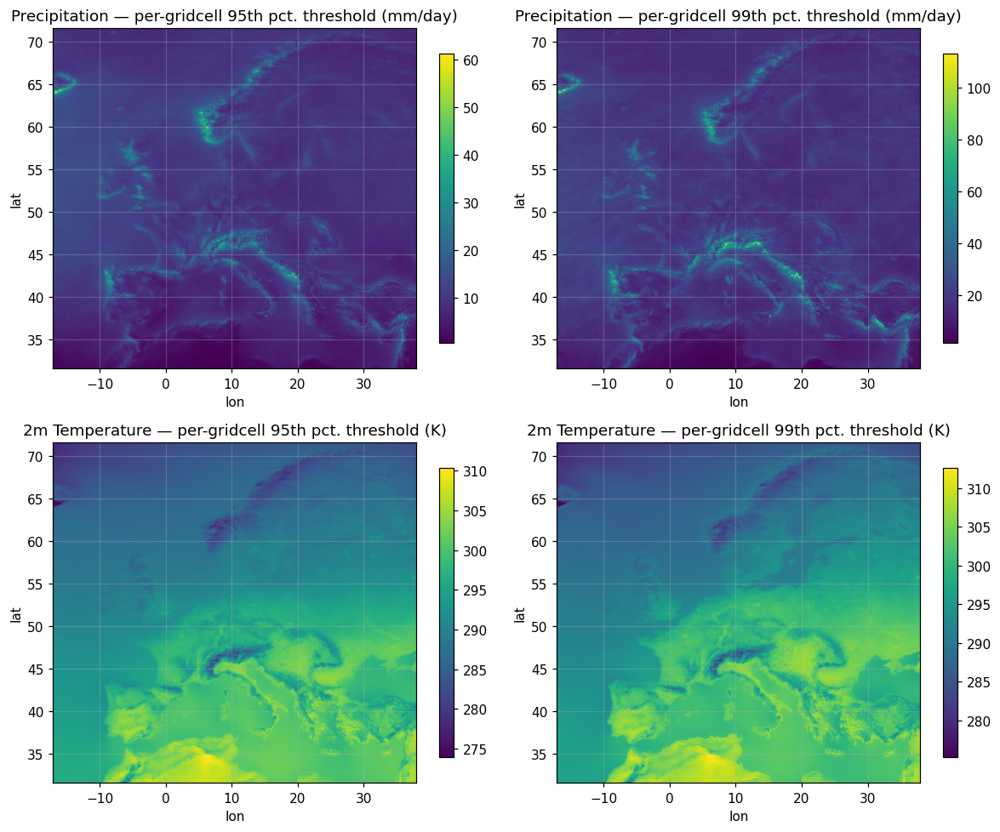

In [10]:
# Reference target for threshold computation: ground truth should be identical across experiments
# (same observation dataset for the same test period) — verify that explicitly rather than assuming it.
# Loads one target array at a time and discards it immediately (see memory note in Section 3).
THRESH_PERGRID: Dict[str, Dict[float, np.ndarray]] = {}
THRESH_DOMAIN: Dict[str, Dict[float, float]] = {}
LATLON: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}  # var -> (lat, lon), tiny 1-D coordinate arrays

for var in tqdm(VARIABLES, desc="thresholds: variables"):
    ref_exp = EXPERIMENTS[0]
    ref_target = load_full_array(ROOT, ref_exp, var, "target")
    LATLON[var] = (ref_target["lat"].values, ref_target["lon"].values)
    for exp in tqdm(EXPERIMENTS[1:], desc=f"  {var}: consistency check", leave=False):
        other_target = load_full_array(ROOT, exp, var, "target")
        if other_target.shape == ref_target.shape and not np.allclose(other_target.values, ref_target.values, equal_nan=True):
            print(f"WARNING: target values differ between {ref_exp} and {exp} for {var} — thresholds use {ref_exp}'s target only.")
        del other_target
    THRESH_PERGRID[var] = percentile_threshold_maps(ref_target, PERCENTILES)
    THRESH_DOMAIN[var] = domain_wide_thresholds(ref_target, PERCENTILES)
    print(f"{var}: domain-wide thresholds = {THRESH_DOMAIN[var]}")
    del ref_target
    gc.collect()

# Spatial sanity plot of the per-gridcell threshold maps
fig, axes = plt.subplots(len(VARIABLES), len(PERCENTILES), figsize=(11, 4.5 * len(VARIABLES)))
for i, var in enumerate(VARIABLES):
    lat, lon = LATLON[var]
    for j, p in enumerate(PERCENTILES):
        ax = axes[i, j]
        im = ax.pcolormesh(lon, lat, THRESH_PERGRID[var][p], shading="auto", cmap="viridis")
        ax.set_title(f"{VAR_LONGNAME[var]} — per-gridcell {p}th pct. threshold ({VAR_UNITS[var]})")
        ax.set_xlabel("lon"); ax.set_ylabel("lat")
        fig.colorbar(im, ax=ax, shrink=0.85)
plt.tight_layout()
savefig(fig, "threshold_maps")
plt.show()


## 5. POD, FAR, CSI, Frequency Bias, and SEDI — contingency-table metrics for extreme events

**Setup.** At a chosen threshold (per-gridcell or domain-wide, 95th/99th percentile), both the forecast and the observation are binarized into "yes/no this is an extreme event" at every (day, gridcell). This gives a single 2×2 contingency table:

| | Observed extreme | Observed non-extreme |
|---|---|---|
| **Forecast extreme** | Hits (H) | False alarms (F) |
| **Forecast non-extreme** | Misses (M) | Correct negatives (C) |

**Formulas** (H = hits, M = misses, F = false alarms, C = correct negatives):

$$\text{POD} = \frac{H}{H+M} \qquad \text{FAR} = \frac{F}{H+F} \qquad \text{CSI} = \frac{H}{H+M+F} \qquad \text{Bias} = \frac{H+F}{H+M} \qquad \text{POFD} = \frac{F}{F+C}$$

$$\text{SEDI} = \frac{\ln(\text{POFD}) - \ln(\text{POD}) - \ln(1-\text{POFD}) + \ln(1-\text{POD})}{\ln(\text{POFD}) + \ln(\text{POD}) + \ln(1-\text{POFD}) + \ln(1-\text{POD})}$$

(Ferro & Stephenson, 2011; SEDI ranges from $-1$ to $1$, with $1$ = perfect, $0$ = no skill, symmetric under swapping the event and non-event.)

**Interpretation and why these matter for extremes.**
- **POD** (hit rate / sensitivity): the fraction of true extreme events the model actually catches — directly answers "does the model detect the reviewers' high-impact events at all."
- **FAR** (false alarm ratio): of the times the model cried "extreme," how often was it wrong — the cost side of the same coin.
- **CSI** (critical success index / threat score): a single number balancing both, but it is *base-rate sensitive* — for a rare event (like the 99th percentile), CSI is mechanically pulled down even for a skillful forecast simply because misses and false alarms both compete against a small number of hits.
- **Bias**: ratio of forecast-yes frequency to observed-yes frequency; >1 means over-forecasting extremes, <1 under-forecasting — a model could have a deceptively good CSI while being systematically biased in frequency.
- **SEDI** was specifically designed to remain informative for rare events, unlike POD/CSI/FAR alone, which degenerate towards trivial values as the event becomes rarer (e.g. always-say-no gives POD=0 but CSI can still look deceptively moderate). SEDI is therefore the headline rare-event skill score here, with POD/FAR/CSI/Bias providing the decomposition into "why."

**Aggregation choice.** We pool one **global** 2×2 table over every grid cell and day (not per-cell tables averaged). Because per-gridcell thresholds already equalize the observed base rate to exactly $(100-p)\%$ everywhere, pooling does not reintroduce the imbalance problem pooling would otherwise cause — it is the numerically stable, standard choice (a per-cell table at p99 would have only ~18 "yes" events over 5 years, far too few to compute a meaningful ratio per cell). We additionally show a per-gridcell POD/SEDI **map** as a spatial diagnostic (not as the summary-table method) to visualize *where* SI's advantage is concentrated.

**Ensemble-mean vs. ensemble-probability forecasts.** The main table below binarizes each model's **ensemble mean** (comparable across all three models, including UNet). As a labeled bonus, we also binarize SI/CorrDiff using a majority-vote rule (forecast "yes" if ≥50% of the 20 members exceed the threshold) — a design choice explored more fully by the reliability diagram in Section 10.

In [11]:
def ensemble_mean_contingency_tables() -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Pooled contingency-table scores from ensemble-mean forecasts, both threshold bases, all percentiles.
    Loads each (exp, var) pair exactly once and reuses it across both percentiles and both threshold bases.
    Thresholding + counting runs on GPU (pooled_contingency_table_gpu) to avoid materializing extra
    ~1.6GB obs_bin/fcst_bin host arrays and to speed up the O(400M-element) comparisons."""
    rows_pergrid, rows_domain = [], []
    for var in tqdm(VARIABLES, desc="contingency tables: variables"):
        for exp in tqdm(EXPERIMENTS, desc=f"  {var}: experiments", leave=False):
            pred, target = load_aligned_pair(ROOT, exp, var)
            for p in PERCENTILES:
                for basis, thr, rows in (("pergrid", THRESH_PERGRID[var][p], rows_pergrid),
                                          ("domain", THRESH_DOMAIN[var][p], rows_domain)):
                    H, M, F, C = pooled_contingency_table_gpu(target.values, pred.values, thr)
                    scores = contingency_scores(H, M, F, C)
                    rows.append({"variable": var, "percentile": p, "experiment": MODEL_LABELS[exp],
                                 **{k: scores[k] for k in ["POD", "FAR", "CSI", "Bias", "SEDI"]}})
            del pred, target
        gc.collect()
    df_pergrid = pd.DataFrame(rows_pergrid).set_index(["variable", "percentile", "experiment"])
    df_domain = pd.DataFrame(rows_domain).set_index(["variable", "percentile", "experiment"])
    return df_pergrid, df_domain


CONTINGENCY_DIRECTIONS = {"POD": "max", "FAR": "min", "CSI": "max", "Bias": "target_one", "SEDI": "max"}

contingency_pergrid_df, contingency_domain_df = ensemble_mean_contingency_tables()

save_styled_table(contingency_pergrid_df, "contingency_pergrid_ensemble_mean", CONTINGENCY_DIRECTIONS,
                   caption="POD/FAR/CSI/Bias/SEDI (ensemble-mean forecast, per-gridcell thresholds).",
                   label="tab:contingency_pergrid")
save_styled_table(contingency_domain_df, "contingency_domain_ensemble_mean", CONTINGENCY_DIRECTIONS,
                   caption="POD/FAR/CSI/Bias/SEDI (ensemble-mean forecast, domain-wide thresholds, supplementary).",
                   label="tab:contingency_domain")

print("=== Primary: per-gridcell thresholds, ensemble-mean forecast (best per variable/percentile bold, 2nd underlined) ===")
display(style_best_second(contingency_pergrid_df, CONTINGENCY_DIRECTIONS))
print("\n=== Supplementary: domain-wide thresholds, ensemble-mean forecast ===")
display(style_best_second(contingency_domain_df, CONTINGENCY_DIRECTIONS))


contingency tables: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:09<00:18,  9.40s/it]

  pr: experiments:  67%|██████▋   | 2/3 [00:19<00:09,  9.68s/it]

  pr: experiments: 100%|██████████| 3/3 [00:28<00:00,  9.66s/it]

contingency tables: variables:  50%|█████     | 1/2 [00:29<00:29, 29.21s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:10<00:21, 10.86s/it]

  tas: experiments:  67%|██████▋   | 2/3 [00:20<00:10, 10.03s/it]

  tas: experiments: 100%|██████████| 3/3 [00:29<00:00,  9.79s/it]

contingency tables: variables: 100%|██████████| 2/2 [00:59<00:00, 29.71s/it]

contingency tables: variables: 100%|██████████| 2/2 [00:59<00:00, 29.64s/it]

=== Primary: per-gridcell thresholds, ensemble-mean forecast (best per variable/percentile bold, 2nd underlined) ===



=== Supplementary: domain-wide thresholds, ensemble-mean forecast ===


**Bonus: ensemble-probability contingency table (SI/CorrDiff only).** Instead of thresholding the ensemble mean, a grid-cell-day is forecast "extreme" if **≥50% of the 20 members** exceed the threshold — a majority-vote way to turn the full ensemble into a yes/no call. This uses information the ensemble-mean table throws away (the shape of the ensemble distribution, not just its center) and is a different, complementary way of asking "does this model know when extremes are coming." UNet has no ensemble and cannot appear in this table. The 50% cutoff is a design choice; Section 10's reliability diagram evaluates the full range of cutoffs.

In [12]:
def ensemble_probability_contingency_table(vote_frac: float = 0.5) -> pd.DataFrame:
    """Majority-vote (>=vote_frac of members exceed threshold) contingency scores, per-gridcell thresholds,
    SI/CorrDiff only. Both percentiles are evaluated within a single streaming pass per (var, exp)."""
    rows = []
    combos = [(var, exp) for var in VARIABLES for exp in ENSEMBLE_MODELS]
    for var, exp in tqdm(combos, desc="ensemble-probability contingency"):
        thrs_flat = {p: THRESH_PERGRID[var][p].reshape(-1) for p in PERCENTILES}
        tables = {p: [0, 0, 0, 0] for p in PERCENTILES}  # H, M, F, C
        for _t, target_day, members_day in iter_ensemble_day(ROOT, exp, var, desc=f"prob-contingency {exp}/{var}"):
            for p in PERCENTILES:
                th = thrs_flat[p]
                obs = target_day >= th
                fcst = np.mean(members_day >= th, axis=0) >= vote_frac
                t = tables[p]
                t[0] += int(np.sum(fcst & obs)); t[1] += int(np.sum(~fcst & obs))
                t[2] += int(np.sum(fcst & ~obs)); t[3] += int(np.sum(~fcst & ~obs))
        for p in PERCENTILES:
            scores = contingency_scores(*tables[p])
            rows.append({"variable": var, "percentile": p, "experiment": MODEL_LABELS[exp],
                         **{k: scores[k] for k in ["POD", "FAR", "CSI", "Bias", "SEDI"]}})
    return pd.DataFrame(rows).set_index(["variable", "percentile", "experiment"])


contingency_prob_df = ensemble_probability_contingency_table()
save_styled_table(contingency_prob_df, "contingency_pergrid_ensemble_probability", CONTINGENCY_DIRECTIONS,
                   caption="POD/FAR/CSI/Bias/SEDI, ensemble-probability (>=50\\% members) forecast, per-gridcell thresholds. UNet n/a (no ensemble).",
                   label="tab:contingency_prob")
style_best_second(contingency_prob_df, CONTINGENCY_DIRECTIONS)


ensemble-probability contingency:   0%|          | 0/4 [00:00<?, ?it/s]

prob-contingency test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

prob-contingency test_CorrDiff_small_r1/pr:   0%|          | 2/1824 [00:00<01:39, 18.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:   0%|          | 4/1824 [00:00<01:35, 19.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:   0%|          | 6/1824 [00:00<01:48, 16.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:   0%|          | 9/1824 [00:00<01:39, 18.24day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 11/1824 [00:00<01:37, 18.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 13/1824 [00:00<01:36, 18.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 15/1824 [00:00<02:13, 13.56day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 17/1824 [00:01<02:01, 14.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 19/1824 [00:01<01:52, 15.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|          | 22/1824 [00:01<01:41, 17.75day/s]

prob-contingency test_CorrDiff_small_r1/pr:   1%|▏         | 25/1824 [00:01<01:34, 19.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 28/1824 [00:01<01:29, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 31/1824 [00:01<01:26, 20.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 34/1824 [00:01<01:24, 21.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 37/1824 [00:02<01:41, 17.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:36, 18.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:31, 19.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:27, 20.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:25, 20.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:23, 21.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 55/1824 [00:02<01:22, 21.41day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:26, 20.40day/s]

prob-contingency test_CorrDiff_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:24, 20.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:23, 21.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:22, 21.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:21, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▍         | 73/1824 [00:03<01:36, 18.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▍         | 76/1824 [00:03<01:31, 19.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:27, 19.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:24, 20.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:23, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:21, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:20, 21.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▌         | 94/1824 [00:04<01:19, 21.64day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▌         | 97/1824 [00:04<01:19, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:19, 21.76day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:18, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:18, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:18, 21.93day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▌         | 112/1824 [00:05<01:31, 18.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▋         | 115/1824 [00:05<01:26, 19.66day/s]

prob-contingency test_CorrDiff_small_r1/pr:   6%|▋         | 118/1824 [00:05<01:23, 20.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 121/1824 [00:06<01:21, 20.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 124/1824 [00:06<01:19, 21.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 127/1824 [00:06<01:18, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 130/1824 [00:06<01:18, 21.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 133/1824 [00:06<01:17, 21.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:   7%|▋         | 136/1824 [00:06<01:16, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 139/1824 [00:06<01:16, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 142/1824 [00:07<01:15, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 145/1824 [00:07<01:15, 22.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 148/1824 [00:07<01:15, 22.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 151/1824 [00:07<01:29, 18.79day/s]

prob-contingency test_CorrDiff_small_r1/pr:   8%|▊         | 154/1824 [00:07<01:24, 19.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▊         | 157/1824 [00:07<01:21, 20.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▉         | 160/1824 [00:07<01:19, 20.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▉         | 163/1824 [00:08<01:18, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▉         | 166/1824 [00:08<01:17, 21.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▉         | 169/1824 [00:08<01:16, 21.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:   9%|▉         | 172/1824 [00:08<01:15, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|▉         | 175/1824 [00:08<01:15, 21.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|▉         | 178/1824 [00:08<01:14, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|▉         | 181/1824 [00:08<01:14, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|█         | 184/1824 [00:09<01:13, 22.16day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|█         | 187/1824 [00:09<01:27, 18.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  10%|█         | 190/1824 [00:09<01:22, 19.71day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█         | 193/1824 [00:09<01:19, 20.57day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█         | 196/1824 [00:09<01:16, 21.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█         | 199/1824 [00:09<01:15, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█         | 202/1824 [00:09<01:13, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█         | 205/1824 [00:10<01:13, 22.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  11%|█▏        | 208/1824 [00:10<01:12, 22.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 211/1824 [00:10<01:11, 22.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 214/1824 [00:10<01:11, 22.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 217/1824 [00:10<01:11, 22.61day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 220/1824 [00:10<01:11, 22.52day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 223/1824 [00:10<01:11, 22.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  12%|█▏        | 226/1824 [00:11<01:24, 18.93day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 229/1824 [00:11<01:20, 19.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 232/1824 [00:11<01:17, 20.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 235/1824 [00:11<01:15, 21.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 238/1824 [00:11<01:14, 21.39day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 241/1824 [00:11<01:12, 21.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:  13%|█▎        | 244/1824 [00:11<01:12, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▎        | 247/1824 [00:11<01:11, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▎        | 250/1824 [00:12<01:11, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▍        | 253/1824 [00:12<01:11, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▍        | 256/1824 [00:12<01:11, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▍        | 259/1824 [00:12<01:11, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  14%|█▍        | 262/1824 [00:12<01:10, 22.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▍        | 265/1824 [00:12<01:23, 18.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▍        | 268/1824 [00:12<01:19, 19.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▍        | 271/1824 [00:13<01:16, 20.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▌        | 274/1824 [00:13<01:14, 20.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▌        | 277/1824 [00:13<01:12, 21.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  15%|█▌        | 280/1824 [00:13<01:11, 21.48day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▌        | 283/1824 [00:13<01:11, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▌        | 286/1824 [00:13<01:10, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▌        | 289/1824 [00:13<01:10, 21.88day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▌        | 292/1824 [00:14<01:09, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▌        | 295/1824 [00:14<01:09, 22.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  16%|█▋        | 298/1824 [00:14<01:09, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 301/1824 [00:14<01:09, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 304/1824 [00:14<01:20, 18.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 307/1824 [00:14<01:16, 19.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 310/1824 [00:14<01:14, 20.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 313/1824 [00:15<01:11, 21.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 316/1824 [00:15<01:10, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/pr:  17%|█▋        | 319/1824 [00:15<01:09, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 322/1824 [00:15<01:08, 21.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 325/1824 [00:15<01:08, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 328/1824 [00:15<01:07, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 331/1824 [00:15<01:07, 22.23day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 334/1824 [00:16<01:06, 22.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:  18%|█▊        | 337/1824 [00:16<01:06, 22.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▊        | 340/1824 [00:16<01:18, 19.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▉        | 343/1824 [00:16<01:14, 19.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▉        | 346/1824 [00:16<01:11, 20.64day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▉        | 349/1824 [00:16<01:09, 21.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▉        | 352/1824 [00:16<01:08, 21.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  19%|█▉        | 355/1824 [00:17<01:07, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|█▉        | 358/1824 [00:17<01:06, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|█▉        | 361/1824 [00:17<01:06, 22.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|█▉        | 364/1824 [00:17<01:05, 22.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|██        | 367/1824 [00:17<01:05, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|██        | 370/1824 [00:17<01:05, 22.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:  20%|██        | 373/1824 [00:17<01:04, 22.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██        | 376/1824 [00:17<01:04, 22.38day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██        | 379/1824 [00:18<01:16, 18.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██        | 382/1824 [00:18<01:12, 19.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██        | 385/1824 [00:18<01:09, 20.59day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██▏       | 388/1824 [00:18<01:07, 21.16day/s]

prob-contingency test_CorrDiff_small_r1/pr:  21%|██▏       | 391/1824 [00:18<01:06, 21.55day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 394/1824 [00:18<01:05, 21.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 397/1824 [00:19<01:04, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 400/1824 [00:19<01:04, 22.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 403/1824 [00:19<01:04, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 406/1824 [00:19<01:03, 22.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  22%|██▏       | 409/1824 [00:19<01:03, 22.30day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 412/1824 [00:19<01:03, 22.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 415/1824 [00:19<01:02, 22.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 418/1824 [00:20<01:13, 19.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 421/1824 [00:20<01:09, 20.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 424/1824 [00:20<01:07, 20.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  23%|██▎       | 427/1824 [00:20<01:05, 21.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▎       | 430/1824 [00:20<01:04, 21.67day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▎       | 433/1824 [00:20<01:03, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▍       | 436/1824 [00:20<01:02, 22.11day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▍       | 439/1824 [00:20<01:02, 22.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▍       | 442/1824 [00:21<01:02, 22.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  24%|██▍       | 445/1824 [00:21<01:01, 22.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▍       | 448/1824 [00:21<01:01, 22.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▍       | 451/1824 [00:21<01:01, 22.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▍       | 454/1824 [00:21<01:11, 19.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▌       | 457/1824 [00:21<01:08, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▌       | 460/1824 [00:21<01:05, 20.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  25%|██▌       | 463/1824 [00:22<01:04, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▌       | 466/1824 [00:22<01:03, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▌       | 469/1824 [00:22<01:01, 21.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▌       | 472/1824 [00:22<01:01, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▌       | 475/1824 [00:22<01:00, 22.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▌       | 478/1824 [00:22<01:00, 22.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  26%|██▋       | 481/1824 [00:22<01:00, 22.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 484/1824 [00:23<01:00, 22.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 487/1824 [00:23<00:59, 22.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 490/1824 [00:23<00:59, 22.51day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 493/1824 [00:23<01:09, 19.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 496/1824 [00:23<01:06, 20.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  27%|██▋       | 499/1824 [00:23<01:03, 20.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 502/1824 [00:23<01:01, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 505/1824 [00:24<01:00, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 508/1824 [00:24<00:59, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 511/1824 [00:24<00:59, 22.16day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 514/1824 [00:24<00:58, 22.23day/s]

prob-contingency test_CorrDiff_small_r1/pr:  28%|██▊       | 517/1824 [00:24<00:59, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▊       | 520/1824 [00:24<00:59, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▊       | 523/1824 [00:24<00:59, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▉       | 526/1824 [00:24<00:59, 21.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▉       | 529/1824 [00:25<00:59, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▉       | 532/1824 [00:25<01:26, 14.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▉       | 535/1824 [00:25<01:18, 16.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  29%|██▉       | 538/1824 [00:25<01:11, 17.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|██▉       | 541/1824 [00:25<01:07, 19.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|██▉       | 544/1824 [00:26<01:03, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|██▉       | 547/1824 [00:26<01:01, 20.76day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|███       | 550/1824 [00:26<00:59, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|███       | 553/1824 [00:26<00:58, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  30%|███       | 556/1824 [00:26<00:57, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███       | 559/1824 [00:26<00:57, 22.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███       | 562/1824 [00:26<00:56, 22.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███       | 565/1824 [00:26<00:56, 22.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███       | 568/1824 [00:27<01:27, 14.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███▏      | 571/1824 [00:27<01:17, 16.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  31%|███▏      | 574/1824 [00:27<01:11, 17.55day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 577/1824 [00:27<01:06, 18.76day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 580/1824 [00:27<01:03, 19.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 583/1824 [00:27<01:00, 20.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 586/1824 [00:28<00:59, 20.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 589/1824 [00:28<00:57, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  32%|███▏      | 592/1824 [00:28<00:56, 21.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 595/1824 [00:28<00:55, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 598/1824 [00:28<00:55, 22.19day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 601/1824 [00:28<00:54, 22.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 604/1824 [00:28<00:54, 22.35day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 607/1824 [00:29<01:16, 15.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  33%|███▎      | 610/1824 [00:29<01:09, 17.38day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▎      | 613/1824 [00:29<01:05, 18.61day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▍      | 616/1824 [00:29<01:01, 19.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▍      | 619/1824 [00:29<00:59, 20.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▍      | 622/1824 [00:29<00:57, 20.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▍      | 625/1824 [00:30<00:56, 21.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  34%|███▍      | 628/1824 [00:30<00:55, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▍      | 631/1824 [00:30<00:55, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▍      | 634/1824 [00:30<00:54, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▍      | 637/1824 [00:30<00:54, 21.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▌      | 640/1824 [00:30<00:53, 21.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▌      | 643/1824 [00:30<00:53, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/pr:  35%|███▌      | 646/1824 [00:31<01:18, 15.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▌      | 649/1824 [00:31<01:10, 16.72day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▌      | 652/1824 [00:31<01:04, 18.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▌      | 655/1824 [00:31<01:00, 19.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▌      | 658/1824 [00:31<00:58, 19.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▌      | 661/1824 [00:31<00:57, 20.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  36%|███▋      | 664/1824 [00:32<00:56, 20.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 667/1824 [00:32<00:55, 20.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 670/1824 [00:32<00:55, 20.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 673/1824 [00:32<00:55, 20.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 676/1824 [00:32<00:54, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 679/1824 [00:32<00:53, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/pr:  37%|███▋      | 682/1824 [00:32<00:52, 21.76day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 685/1824 [00:33<01:16, 14.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 688/1824 [00:33<01:08, 16.52day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 691/1824 [00:33<01:03, 17.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 694/1824 [00:33<00:58, 19.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 697/1824 [00:33<00:56, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  38%|███▊      | 700/1824 [00:33<00:53, 20.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▊      | 703/1824 [00:34<00:52, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▊      | 706/1824 [00:34<00:51, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▉      | 709/1824 [00:34<00:50, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▉      | 712/1824 [00:34<00:50, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▉      | 715/1824 [00:34<00:49, 22.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  39%|███▉      | 718/1824 [00:34<00:49, 22.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|███▉      | 721/1824 [00:35<01:12, 15.31day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|███▉      | 724/1824 [00:35<01:04, 16.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|███▉      | 727/1824 [00:35<01:00, 18.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|████      | 730/1824 [00:35<00:56, 19.41day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|████      | 733/1824 [00:35<00:53, 20.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:  40%|████      | 736/1824 [00:35<00:52, 20.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████      | 739/1824 [00:35<00:50, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████      | 742/1824 [00:35<00:49, 21.71day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████      | 745/1824 [00:36<00:49, 21.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████      | 748/1824 [00:36<00:48, 22.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████      | 751/1824 [00:36<00:48, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  41%|████▏     | 754/1824 [00:36<00:48, 22.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 757/1824 [00:36<00:47, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 760/1824 [00:36<01:10, 15.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 763/1824 [00:37<01:03, 16.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 766/1824 [00:37<00:58, 17.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 769/1824 [00:37<00:55, 19.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 772/1824 [00:37<00:52, 19.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  42%|████▏     | 775/1824 [00:37<00:51, 20.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 778/1824 [00:37<00:49, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 781/1824 [00:37<00:48, 21.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 784/1824 [00:38<00:48, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 787/1824 [00:38<00:47, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 790/1824 [00:38<00:47, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  43%|████▎     | 793/1824 [00:38<00:46, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▎     | 796/1824 [00:38<00:46, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▍     | 799/1824 [00:38<01:10, 14.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▍     | 802/1824 [00:39<01:03, 16.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▍     | 805/1824 [00:39<00:58, 17.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▍     | 808/1824 [00:39<00:54, 18.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  44%|████▍     | 811/1824 [00:39<00:51, 19.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▍     | 814/1824 [00:39<00:50, 20.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▍     | 817/1824 [00:39<00:49, 20.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▍     | 820/1824 [00:39<00:47, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▌     | 823/1824 [00:40<00:47, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▌     | 826/1824 [00:40<00:46, 21.59day/s]

prob-contingency test_CorrDiff_small_r1/pr:  45%|████▌     | 829/1824 [00:40<00:45, 21.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▌     | 832/1824 [00:40<00:45, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▌     | 835/1824 [00:40<01:06, 14.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▌     | 838/1824 [00:40<00:59, 16.47day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▌     | 841/1824 [00:41<00:55, 17.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▋     | 844/1824 [00:41<00:51, 19.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  46%|████▋     | 847/1824 [00:41<00:49, 19.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 850/1824 [00:41<00:47, 20.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 853/1824 [00:41<00:45, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 856/1824 [00:41<00:45, 21.48day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 859/1824 [00:41<00:44, 21.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 862/1824 [00:42<00:43, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  47%|████▋     | 865/1824 [00:42<00:43, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 868/1824 [00:42<00:43, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 871/1824 [00:42<00:43, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 874/1824 [00:42<01:05, 14.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 877/1824 [00:42<00:58, 16.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 880/1824 [00:43<00:53, 17.71day/s]

prob-contingency test_CorrDiff_small_r1/pr:  48%|████▊     | 883/1824 [00:43<00:49, 18.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▊     | 886/1824 [00:43<00:47, 19.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▊     | 889/1824 [00:43<00:45, 20.51day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▉     | 892/1824 [00:43<00:44, 21.07day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▉     | 895/1824 [00:43<00:43, 21.51day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▉     | 898/1824 [00:43<00:42, 21.79day/s]

prob-contingency test_CorrDiff_small_r1/pr:  49%|████▉     | 901/1824 [00:44<00:41, 22.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|████▉     | 904/1824 [00:44<00:41, 22.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|████▉     | 907/1824 [00:44<00:41, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|████▉     | 910/1824 [00:44<00:40, 22.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|█████     | 913/1824 [00:44<01:01, 14.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|█████     | 916/1824 [00:44<00:54, 16.56day/s]

prob-contingency test_CorrDiff_small_r1/pr:  50%|█████     | 919/1824 [00:45<00:50, 18.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████     | 922/1824 [00:45<00:46, 19.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████     | 925/1824 [00:45<00:44, 20.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████     | 928/1824 [00:45<00:43, 20.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████     | 931/1824 [00:45<00:41, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████     | 934/1824 [00:45<00:40, 21.72day/s]

prob-contingency test_CorrDiff_small_r1/pr:  51%|█████▏    | 937/1824 [00:45<00:40, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 940/1824 [00:45<00:39, 22.19day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 943/1824 [00:46<00:39, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 946/1824 [00:46<00:39, 22.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 949/1824 [00:46<00:39, 22.31day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 952/1824 [00:46<01:00, 14.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  52%|█████▏    | 955/1824 [00:46<00:53, 16.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 958/1824 [00:47<00:48, 17.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 961/1824 [00:47<00:45, 18.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 964/1824 [00:47<00:43, 19.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 967/1824 [00:47<00:41, 20.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 970/1824 [00:47<00:40, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  53%|█████▎    | 973/1824 [00:47<00:39, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▎    | 976/1824 [00:47<00:38, 21.83day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▎    | 979/1824 [00:47<00:38, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▍    | 982/1824 [00:48<00:37, 22.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▍    | 985/1824 [00:48<00:37, 22.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▍    | 988/1824 [00:48<00:55, 14.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▍    | 991/1824 [00:48<00:50, 16.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  54%|█████▍    | 994/1824 [00:48<00:46, 17.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▍    | 997/1824 [00:48<00:43, 18.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▍    | 1000/1824 [00:49<00:41, 19.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▍    | 1003/1824 [00:49<00:40, 20.40day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▌    | 1006/1824 [00:49<00:39, 20.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▌    | 1009/1824 [00:49<00:38, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  55%|█████▌    | 1012/1824 [00:49<00:37, 21.57day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▌    | 1015/1824 [00:49<00:37, 21.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▌    | 1018/1824 [00:49<00:36, 21.93day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▌    | 1021/1824 [00:50<00:36, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▌    | 1024/1824 [00:50<00:36, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▋    | 1027/1824 [00:50<00:54, 14.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  56%|█████▋    | 1030/1824 [00:50<00:49, 16.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1033/1824 [00:50<00:44, 17.64day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1036/1824 [00:50<00:41, 18.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1039/1824 [00:51<00:39, 19.85day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1042/1824 [00:51<00:38, 20.53day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1045/1824 [00:51<00:37, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  57%|█████▋    | 1048/1824 [00:51<00:36, 21.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1051/1824 [00:51<00:36, 21.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1054/1824 [00:51<00:35, 21.75day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1057/1824 [00:51<00:34, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1060/1824 [00:52<00:34, 22.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1063/1824 [00:52<00:34, 22.23day/s]

prob-contingency test_CorrDiff_small_r1/pr:  58%|█████▊    | 1066/1824 [00:52<00:43, 17.30day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▊    | 1069/1824 [00:52<00:40, 18.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▉    | 1072/1824 [00:52<00:38, 19.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▉    | 1075/1824 [00:52<00:39, 18.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▉    | 1078/1824 [00:53<00:37, 19.72day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▉    | 1081/1824 [00:53<00:36, 20.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  59%|█████▉    | 1084/1824 [00:53<00:35, 20.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|█████▉    | 1087/1824 [00:53<00:34, 21.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|█████▉    | 1090/1824 [00:53<00:34, 21.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|█████▉    | 1093/1824 [00:53<00:33, 21.65day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|██████    | 1096/1824 [00:53<00:33, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|██████    | 1099/1824 [00:53<00:33, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  60%|██████    | 1102/1824 [00:54<00:38, 18.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████    | 1105/1824 [00:54<00:37, 19.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████    | 1108/1824 [00:54<00:35, 19.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████    | 1111/1824 [00:54<00:34, 20.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████    | 1114/1824 [00:54<00:33, 21.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████    | 1117/1824 [00:54<00:32, 21.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:  61%|██████▏   | 1120/1824 [00:54<00:31, 22.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1123/1824 [00:55<00:31, 22.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1126/1824 [00:55<00:31, 22.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1129/1824 [00:55<00:30, 22.52day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1132/1824 [00:55<00:31, 22.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1135/1824 [00:55<00:30, 22.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  62%|██████▏   | 1138/1824 [00:55<00:30, 22.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1141/1824 [00:56<00:42, 15.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1144/1824 [00:56<00:38, 17.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1147/1824 [00:56<00:35, 18.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1150/1824 [00:56<00:34, 19.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1153/1824 [00:56<00:33, 20.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:  63%|██████▎   | 1156/1824 [00:56<00:31, 20.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▎   | 1159/1824 [00:56<00:30, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▎   | 1162/1824 [00:57<00:30, 21.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▍   | 1165/1824 [00:57<00:29, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▍   | 1168/1824 [00:57<00:29, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▍   | 1171/1824 [00:57<00:29, 22.19day/s]

prob-contingency test_CorrDiff_small_r1/pr:  64%|██████▍   | 1174/1824 [00:57<00:29, 22.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▍   | 1177/1824 [00:57<00:31, 20.66day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▍   | 1180/1824 [00:58<00:44, 14.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▍   | 1183/1824 [00:58<00:39, 16.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▌   | 1186/1824 [00:58<00:36, 17.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▌   | 1189/1824 [00:58<00:34, 18.41day/s]

prob-contingency test_CorrDiff_small_r1/pr:  65%|██████▌   | 1192/1824 [00:58<00:32, 19.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▌   | 1195/1824 [00:58<00:31, 20.21day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▌   | 1198/1824 [00:58<00:30, 20.76day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▌   | 1201/1824 [00:59<00:30, 20.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▌   | 1204/1824 [00:59<00:29, 20.72day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▌   | 1207/1824 [00:59<00:29, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  66%|██████▋   | 1210/1824 [00:59<00:28, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1213/1824 [00:59<00:28, 21.71day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1216/1824 [00:59<00:28, 21.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1219/1824 [01:00<00:41, 14.67day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1222/1824 [01:00<00:36, 16.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1225/1824 [01:00<00:33, 17.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1228/1824 [01:00<00:31, 18.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  67%|██████▋   | 1231/1824 [01:00<00:29, 19.85day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1234/1824 [01:00<00:28, 20.56day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1237/1824 [01:00<00:27, 21.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1240/1824 [01:01<00:27, 21.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1243/1824 [01:01<00:26, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1246/1824 [01:01<00:26, 21.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:  68%|██████▊   | 1249/1824 [01:01<00:26, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▊   | 1252/1824 [01:01<00:25, 22.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▉   | 1255/1824 [01:01<00:37, 15.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▉   | 1258/1824 [01:02<00:33, 16.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▉   | 1260/1824 [01:02<00:34, 16.57day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▉   | 1263/1824 [01:02<00:30, 18.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  69%|██████▉   | 1266/1824 [01:02<00:28, 19.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|██████▉   | 1269/1824 [01:02<00:27, 20.18day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|██████▉   | 1272/1824 [01:02<00:26, 20.88day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|██████▉   | 1275/1824 [01:02<00:25, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|███████   | 1278/1824 [01:02<00:25, 21.65day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|███████   | 1281/1824 [01:03<00:25, 21.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  70%|███████   | 1284/1824 [01:03<00:25, 21.52day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████   | 1287/1824 [01:03<00:24, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████   | 1290/1824 [01:03<00:24, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████   | 1293/1824 [01:03<00:35, 15.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████   | 1296/1824 [01:04<00:31, 16.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████   | 1299/1824 [01:04<00:29, 18.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  71%|███████▏  | 1302/1824 [01:04<00:27, 19.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1305/1824 [01:04<00:25, 20.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1308/1824 [01:04<00:24, 20.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1311/1824 [01:04<00:24, 21.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1314/1824 [01:04<00:23, 21.61day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1317/1824 [01:04<00:23, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  72%|███████▏  | 1320/1824 [01:05<00:22, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1323/1824 [01:05<00:22, 22.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1326/1824 [01:05<00:22, 22.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1329/1824 [01:05<00:22, 22.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1332/1824 [01:05<00:32, 15.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1335/1824 [01:05<00:30, 15.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1338/1824 [01:06<00:27, 17.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  73%|███████▎  | 1340/1824 [01:06<00:27, 17.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▎  | 1343/1824 [01:06<00:25, 19.05day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▍  | 1346/1824 [01:06<00:23, 19.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▍  | 1349/1824 [01:06<00:23, 20.55day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▍  | 1352/1824 [01:06<00:22, 21.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▍  | 1355/1824 [01:06<00:21, 21.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  74%|███████▍  | 1358/1824 [01:07<00:21, 21.59day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▍  | 1361/1824 [01:07<00:21, 21.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▍  | 1364/1824 [01:07<00:21, 21.85day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▍  | 1367/1824 [01:07<00:20, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▌  | 1370/1824 [01:07<00:30, 15.11day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▌  | 1373/1824 [01:07<00:26, 16.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  75%|███████▌  | 1376/1824 [01:08<00:25, 17.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▌  | 1379/1824 [01:08<00:23, 19.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▌  | 1382/1824 [01:08<00:22, 19.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▌  | 1385/1824 [01:08<00:21, 20.64day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▌  | 1388/1824 [01:08<00:20, 21.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▋  | 1391/1824 [01:08<00:20, 21.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  76%|███████▋  | 1394/1824 [01:08<00:19, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1397/1824 [01:09<00:20, 21.13day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1400/1824 [01:09<00:19, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1403/1824 [01:09<00:19, 21.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1406/1824 [01:09<00:18, 22.11day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1409/1824 [01:09<00:27, 14.87day/s]

prob-contingency test_CorrDiff_small_r1/pr:  77%|███████▋  | 1412/1824 [01:09<00:24, 16.56day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1415/1824 [01:10<00:22, 17.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1418/1824 [01:10<00:21, 18.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1421/1824 [01:10<00:20, 19.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1424/1824 [01:10<00:19, 20.53day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1427/1824 [01:10<00:18, 21.11day/s]

prob-contingency test_CorrDiff_small_r1/pr:  78%|███████▊  | 1430/1824 [01:10<00:18, 21.36day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▊  | 1433/1824 [01:10<00:17, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▊  | 1436/1824 [01:10<00:17, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▉  | 1439/1824 [01:11<00:17, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▉  | 1442/1824 [01:11<00:17, 22.30day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▉  | 1445/1824 [01:11<00:24, 15.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  79%|███████▉  | 1448/1824 [01:11<00:22, 16.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|███████▉  | 1451/1824 [01:11<00:20, 18.26day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|███████▉  | 1454/1824 [01:11<00:19, 19.34day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|███████▉  | 1457/1824 [01:12<00:18, 20.19day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|████████  | 1460/1824 [01:12<00:17, 20.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|████████  | 1463/1824 [01:12<00:17, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  80%|████████  | 1466/1824 [01:12<00:16, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████  | 1469/1824 [01:12<00:16, 21.56day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████  | 1472/1824 [01:12<00:16, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████  | 1475/1824 [01:12<00:15, 21.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████  | 1478/1824 [01:13<00:15, 22.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████  | 1481/1824 [01:13<00:15, 22.31day/s]

prob-contingency test_CorrDiff_small_r1/pr:  81%|████████▏ | 1484/1824 [01:13<00:22, 15.40day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1487/1824 [01:13<00:19, 16.91day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1490/1824 [01:13<00:18, 18.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1493/1824 [01:13<00:17, 19.19day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1496/1824 [01:14<00:16, 19.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1499/1824 [01:14<00:15, 20.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  82%|████████▏ | 1502/1824 [01:14<00:15, 21.04day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1505/1824 [01:14<00:15, 21.25day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1508/1824 [01:14<00:14, 21.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1511/1824 [01:14<00:14, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1514/1824 [01:14<00:14, 21.85day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1517/1824 [01:15<00:13, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1520/1824 [01:15<00:13, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  83%|████████▎ | 1523/1824 [01:15<00:20, 14.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▎ | 1526/1824 [01:15<00:18, 16.14day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▍ | 1529/1824 [01:15<00:17, 17.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▍ | 1532/1824 [01:15<00:15, 18.55day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▍ | 1535/1824 [01:16<00:14, 19.52day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▍ | 1538/1824 [01:16<00:14, 19.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  84%|████████▍ | 1541/1824 [01:16<00:13, 20.48day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▍ | 1544/1824 [01:16<00:13, 20.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▍ | 1547/1824 [01:16<00:13, 21.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▍ | 1550/1824 [01:16<00:12, 21.57day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▌ | 1553/1824 [01:16<00:12, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▌ | 1556/1824 [01:17<00:12, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  85%|████████▌ | 1559/1824 [01:17<00:12, 22.02day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▌ | 1562/1824 [01:17<00:18, 14.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▌ | 1565/1824 [01:17<00:16, 15.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▌ | 1567/1824 [01:17<00:15, 16.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▌ | 1570/1824 [01:17<00:14, 18.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▌ | 1573/1824 [01:18<00:13, 19.10day/s]

prob-contingency test_CorrDiff_small_r1/pr:  86%|████████▋ | 1576/1824 [01:18<00:12, 19.98day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1579/1824 [01:18<00:12, 20.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1582/1824 [01:18<00:11, 20.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1585/1824 [01:18<00:11, 21.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1588/1824 [01:18<00:11, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1591/1824 [01:18<00:10, 21.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  87%|████████▋ | 1594/1824 [01:19<00:10, 21.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1597/1824 [01:19<00:10, 21.65day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1600/1824 [01:19<00:16, 13.93day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1603/1824 [01:19<00:14, 15.60day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1605/1824 [01:19<00:13, 16.29day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1608/1824 [01:19<00:12, 17.74day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1611/1824 [01:20<00:11, 18.78day/s]

prob-contingency test_CorrDiff_small_r1/pr:  88%|████████▊ | 1614/1824 [01:20<00:10, 19.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▊ | 1617/1824 [01:20<00:10, 20.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▉ | 1620/1824 [01:20<00:09, 20.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▉ | 1623/1824 [01:20<00:09, 21.16day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▉ | 1626/1824 [01:20<00:09, 21.16day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▉ | 1629/1824 [01:20<00:09, 21.45day/s]

prob-contingency test_CorrDiff_small_r1/pr:  89%|████████▉ | 1632/1824 [01:21<00:08, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|████████▉ | 1635/1824 [01:21<00:08, 21.84day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|████████▉ | 1638/1824 [01:21<00:12, 14.32day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|████████▉ | 1641/1824 [01:21<00:11, 16.07day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|█████████ | 1644/1824 [01:21<00:10, 17.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|█████████ | 1647/1824 [01:21<00:09, 18.51day/s]

prob-contingency test_CorrDiff_small_r1/pr:  90%|█████████ | 1650/1824 [01:22<00:08, 19.39day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████ | 1653/1824 [01:22<00:08, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████ | 1656/1824 [01:22<00:08, 20.63day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████ | 1659/1824 [01:22<00:07, 21.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████ | 1662/1824 [01:22<00:07, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████▏| 1665/1824 [01:22<00:07, 21.48day/s]

prob-contingency test_CorrDiff_small_r1/pr:  91%|█████████▏| 1668/1824 [01:22<00:07, 21.61day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1671/1824 [01:23<00:07, 21.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1674/1824 [01:23<00:10, 14.30day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1677/1824 [01:23<00:09, 16.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1680/1824 [01:23<00:08, 17.51day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1683/1824 [01:23<00:07, 18.64day/s]

prob-contingency test_CorrDiff_small_r1/pr:  92%|█████████▏| 1686/1824 [01:23<00:07, 19.59day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1689/1824 [01:24<00:06, 20.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1692/1824 [01:24<00:06, 20.80day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1695/1824 [01:24<00:06, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1698/1824 [01:24<00:05, 21.44day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1701/1824 [01:24<00:05, 21.70day/s]

prob-contingency test_CorrDiff_small_r1/pr:  93%|█████████▎| 1704/1824 [01:24<00:05, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▎| 1707/1824 [01:24<00:05, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▍| 1710/1824 [01:25<00:05, 22.03day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▍| 1713/1824 [01:25<00:07, 14.69day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▍| 1716/1824 [01:25<00:06, 16.37day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▍| 1719/1824 [01:25<00:05, 17.77day/s]

prob-contingency test_CorrDiff_small_r1/pr:  94%|█████████▍| 1722/1824 [01:25<00:05, 18.89day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▍| 1725/1824 [01:25<00:05, 19.75day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▍| 1728/1824 [01:26<00:04, 20.42day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▍| 1731/1824 [01:26<00:04, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▌| 1734/1824 [01:26<00:04, 21.22day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▌| 1737/1824 [01:26<00:04, 21.49day/s]

prob-contingency test_CorrDiff_small_r1/pr:  95%|█████████▌| 1740/1824 [01:26<00:03, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▌| 1743/1824 [01:26<00:03, 21.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▌| 1746/1824 [01:26<00:03, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▌| 1749/1824 [01:27<00:03, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▌| 1752/1824 [01:27<00:04, 14.86day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▌| 1755/1824 [01:27<00:04, 16.46day/s]

prob-contingency test_CorrDiff_small_r1/pr:  96%|█████████▋| 1758/1824 [01:27<00:03, 17.90day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1761/1824 [01:27<00:03, 19.00day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1764/1824 [01:27<00:03, 19.92day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1767/1824 [01:28<00:02, 20.62day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1770/1824 [01:28<00:02, 20.48day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1773/1824 [01:28<00:02, 20.68day/s]

prob-contingency test_CorrDiff_small_r1/pr:  97%|█████████▋| 1776/1824 [01:28<00:02, 20.94day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1779/1824 [01:28<00:02, 21.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1782/1824 [01:28<00:01, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1785/1824 [01:28<00:01, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1788/1824 [01:29<00:01, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1791/1824 [01:29<00:01, 21.58day/s]

prob-contingency test_CorrDiff_small_r1/pr:  98%|█████████▊| 1794/1824 [01:29<00:01, 21.79day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▊| 1797/1824 [01:29<00:01, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▊| 1800/1824 [01:29<00:01, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▉| 1803/1824 [01:29<00:00, 22.20day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▉| 1806/1824 [01:29<00:00, 22.24day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▉| 1809/1824 [01:30<00:00, 22.28day/s]

prob-contingency test_CorrDiff_small_r1/pr:  99%|█████████▉| 1812/1824 [01:30<00:00, 22.26day/s]

prob-contingency test_CorrDiff_small_r1/pr: 100%|█████████▉| 1815/1824 [01:30<00:00, 22.28day/s]

prob-contingency test_CorrDiff_small_r1/pr: 100%|█████████▉| 1818/1824 [01:30<00:00, 22.25day/s]

prob-contingency test_CorrDiff_small_r1/pr: 100%|█████████▉| 1821/1824 [01:30<00:00, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/pr: 100%|██████████| 1824/1824 [01:30<00:00, 21.55day/s]

ensemble-probability contingency:  25%|██▌       | 1/4 [01:30<04:32, 90.90s/it]

prob-contingency test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

prob-contingency test_SI_small_r1/pr:   0%|          | 3/1824 [00:00<01:27, 20.91day/s]

prob-contingency test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:40, 18.14day/s]

prob-contingency test_SI_small_r1/pr:   0%|          | 9/1824 [00:00<01:31, 19.77day/s]

prob-contingency test_SI_small_r1/pr:   1%|          | 12/1824 [00:00<01:27, 20.61day/s]

prob-contingency test_SI_small_r1/pr:   1%|          | 15/1824 [00:01<02:34, 11.71day/s]

prob-contingency test_SI_small_r1/pr:   1%|          | 17/1824 [00:01<02:20, 12.88day/s]

prob-contingency test_SI_small_r1/pr:   1%|          | 19/1824 [00:01<02:11, 13.73day/s]

prob-contingency test_SI_small_r1/pr:   1%|          | 22/1824 [00:01<01:52, 15.99day/s]

prob-contingency test_SI_small_r1/pr:   1%|▏         | 25/1824 [00:01<01:41, 17.71day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 28/1824 [00:01<01:34, 19.01day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 31/1824 [00:01<01:29, 19.96day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 34/1824 [00:01<01:26, 20.61day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 37/1824 [00:02<02:03, 14.47day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:49, 16.29day/s]

prob-contingency test_SI_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:39, 17.82day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:33, 19.07day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:28, 20.09day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:25, 20.79day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 55/1824 [00:03<01:22, 21.37day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:20, 21.81day/s]

prob-contingency test_SI_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:19, 22.08day/s]

prob-contingency test_SI_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:18, 22.34day/s]

prob-contingency test_SI_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:18, 22.52day/s]

prob-contingency test_SI_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:17, 22.66day/s]

prob-contingency test_SI_small_r1/pr:   4%|▍         | 73/1824 [00:04<01:53, 15.49day/s]

prob-contingency test_SI_small_r1/pr:   4%|▍         | 76/1824 [00:04<01:42, 17.10day/s]

prob-contingency test_SI_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:34, 18.39day/s]

prob-contingency test_SI_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:29, 19.45day/s]

prob-contingency test_SI_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:25, 20.25day/s]

prob-contingency test_SI_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:23, 20.84day/s]

prob-contingency test_SI_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:21, 21.28day/s]

prob-contingency test_SI_small_r1/pr:   5%|▌         | 94/1824 [00:05<01:20, 21.54day/s]

prob-contingency test_SI_small_r1/pr:   5%|▌         | 97/1824 [00:05<01:19, 21.80day/s]

prob-contingency test_SI_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:18, 21.93day/s]

prob-contingency test_SI_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:17, 22.08day/s]

prob-contingency test_SI_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:17, 22.15day/s]

prob-contingency test_SI_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:17, 22.19day/s]

prob-contingency test_SI_small_r1/pr:   6%|▌         | 112/1824 [00:06<01:49, 15.60day/s]

prob-contingency test_SI_small_r1/pr:   6%|▋         | 114/1824 [00:06<01:44, 16.32day/s]

prob-contingency test_SI_small_r1/pr:   6%|▋         | 117/1824 [00:06<01:36, 17.66day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 120/1824 [00:06<01:31, 18.72day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 123/1824 [00:06<01:26, 19.76day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 126/1824 [00:06<01:22, 20.61day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 129/1824 [00:06<01:19, 21.23day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 132/1824 [00:06<01:18, 21.67day/s]

prob-contingency test_SI_small_r1/pr:   7%|▋         | 135/1824 [00:07<01:16, 21.96day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 138/1824 [00:07<01:16, 22.14day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 141/1824 [00:07<01:15, 22.27day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 144/1824 [00:07<01:15, 22.34day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 147/1824 [00:07<01:14, 22.39day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 150/1824 [00:07<01:53, 14.75day/s]

prob-contingency test_SI_small_r1/pr:   8%|▊         | 153/1824 [00:08<01:42, 16.32day/s]

prob-contingency test_SI_small_r1/pr:   9%|▊         | 156/1824 [00:08<01:34, 17.67day/s]

prob-contingency test_SI_small_r1/pr:   9%|▊         | 159/1824 [00:08<01:28, 18.78day/s]

prob-contingency test_SI_small_r1/pr:   9%|▉         | 162/1824 [00:08<01:24, 19.63day/s]

prob-contingency test_SI_small_r1/pr:   9%|▉         | 165/1824 [00:08<01:21, 20.28day/s]

prob-contingency test_SI_small_r1/pr:   9%|▉         | 168/1824 [00:08<01:19, 20.75day/s]

prob-contingency test_SI_small_r1/pr:   9%|▉         | 171/1824 [00:08<01:18, 21.06day/s]

prob-contingency test_SI_small_r1/pr:  10%|▉         | 174/1824 [00:09<01:17, 21.28day/s]

prob-contingency test_SI_small_r1/pr:  10%|▉         | 177/1824 [00:09<01:16, 21.41day/s]

prob-contingency test_SI_small_r1/pr:  10%|▉         | 180/1824 [00:09<01:16, 21.54day/s]

prob-contingency test_SI_small_r1/pr:  10%|█         | 183/1824 [00:09<01:15, 21.61day/s]

prob-contingency test_SI_small_r1/pr:  10%|█         | 186/1824 [00:09<01:15, 21.71day/s]

prob-contingency test_SI_small_r1/pr:  10%|█         | 189/1824 [00:09<01:49, 14.98day/s]

prob-contingency test_SI_small_r1/pr:  11%|█         | 192/1824 [00:10<01:38, 16.58day/s]

prob-contingency test_SI_small_r1/pr:  11%|█         | 195/1824 [00:10<01:31, 17.86day/s]

prob-contingency test_SI_small_r1/pr:  11%|█         | 198/1824 [00:10<01:25, 18.94day/s]

prob-contingency test_SI_small_r1/pr:  11%|█         | 201/1824 [00:10<01:22, 19.73day/s]

prob-contingency test_SI_small_r1/pr:  11%|█         | 204/1824 [00:10<01:19, 20.30day/s]

prob-contingency test_SI_small_r1/pr:  11%|█▏        | 207/1824 [00:10<01:17, 20.74day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 210/1824 [00:10<01:16, 21.08day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 213/1824 [00:11<01:15, 21.34day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 216/1824 [00:11<01:14, 21.52day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 219/1824 [00:11<01:13, 21.74day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 222/1824 [00:11<01:13, 21.85day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▏        | 225/1824 [00:11<01:48, 14.79day/s]

prob-contingency test_SI_small_r1/pr:  12%|█▎        | 228/1824 [00:11<01:37, 16.41day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 231/1824 [00:12<01:29, 17.74day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 234/1824 [00:12<01:24, 18.80day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 237/1824 [00:12<01:20, 19.76day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 240/1824 [00:12<01:17, 20.49day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 243/1824 [00:12<01:15, 21.08day/s]

prob-contingency test_SI_small_r1/pr:  13%|█▎        | 246/1824 [00:12<01:13, 21.52day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▎        | 249/1824 [00:12<01:12, 21.81day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▍        | 252/1824 [00:13<01:11, 22.00day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▍        | 255/1824 [00:13<01:11, 22.03day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▍        | 258/1824 [00:13<01:10, 22.12day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▍        | 261/1824 [00:13<01:10, 22.16day/s]

prob-contingency test_SI_small_r1/pr:  14%|█▍        | 264/1824 [00:13<01:46, 14.68day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▍        | 267/1824 [00:13<01:35, 16.31day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▍        | 270/1824 [00:14<01:27, 17.69day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▍        | 273/1824 [00:14<01:22, 18.76day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▌        | 276/1824 [00:14<01:18, 19.61day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▌        | 279/1824 [00:14<01:15, 20.35day/s]

prob-contingency test_SI_small_r1/pr:  15%|█▌        | 282/1824 [00:14<01:13, 20.87day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▌        | 285/1824 [00:14<01:12, 21.29day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▌        | 288/1824 [00:14<01:11, 21.44day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▌        | 291/1824 [00:15<01:10, 21.65day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▌        | 294/1824 [00:15<01:10, 21.84day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▋        | 297/1824 [00:15<01:09, 22.00day/s]

prob-contingency test_SI_small_r1/pr:  16%|█▋        | 300/1824 [00:15<01:09, 22.06day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 303/1824 [00:15<01:41, 14.99day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 306/1824 [00:15<01:31, 16.58day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 309/1824 [00:16<01:24, 17.90day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 312/1824 [00:16<01:19, 18.93day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 315/1824 [00:16<01:16, 19.79day/s]

prob-contingency test_SI_small_r1/pr:  17%|█▋        | 318/1824 [00:16<01:13, 20.46day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 321/1824 [00:16<01:11, 20.94day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 324/1824 [00:16<01:10, 21.29day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 327/1824 [00:16<01:09, 21.49day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 330/1824 [00:16<01:09, 21.64day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 333/1824 [00:17<01:08, 21.79day/s]

prob-contingency test_SI_small_r1/pr:  18%|█▊        | 336/1824 [00:17<01:08, 21.85day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▊        | 339/1824 [00:17<01:07, 22.02day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▉        | 342/1824 [00:17<01:37, 15.19day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▉        | 345/1824 [00:17<01:27, 16.85day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▉        | 348/1824 [00:17<01:20, 18.24day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▉        | 351/1824 [00:18<01:16, 19.31day/s]

prob-contingency test_SI_small_r1/pr:  19%|█▉        | 354/1824 [00:18<01:12, 20.20day/s]

prob-contingency test_SI_small_r1/pr:  20%|█▉        | 357/1824 [00:18<01:10, 20.83day/s]

prob-contingency test_SI_small_r1/pr:  20%|█▉        | 360/1824 [00:18<01:08, 21.34day/s]

prob-contingency test_SI_small_r1/pr:  20%|█▉        | 363/1824 [00:18<01:07, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  20%|██        | 366/1824 [00:18<01:06, 22.00day/s]

prob-contingency test_SI_small_r1/pr:  20%|██        | 369/1824 [00:18<01:05, 22.20day/s]

prob-contingency test_SI_small_r1/pr:  20%|██        | 372/1824 [00:19<01:04, 22.38day/s]

prob-contingency test_SI_small_r1/pr:  21%|██        | 375/1824 [00:19<01:04, 22.31day/s]

prob-contingency test_SI_small_r1/pr:  21%|██        | 378/1824 [00:19<01:36, 14.92day/s]

prob-contingency test_SI_small_r1/pr:  21%|██        | 381/1824 [00:19<01:26, 16.61day/s]

prob-contingency test_SI_small_r1/pr:  21%|██        | 384/1824 [00:19<01:19, 18.04day/s]

prob-contingency test_SI_small_r1/pr:  21%|██        | 387/1824 [00:19<01:14, 19.21day/s]

prob-contingency test_SI_small_r1/pr:  21%|██▏       | 390/1824 [00:20<01:11, 20.10day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 393/1824 [00:20<01:08, 20.76day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 396/1824 [00:20<01:07, 21.24day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 399/1824 [00:20<01:05, 21.62day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 402/1824 [00:20<01:05, 21.84day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 405/1824 [00:20<01:04, 22.10day/s]

prob-contingency test_SI_small_r1/pr:  22%|██▏       | 408/1824 [00:20<01:03, 22.25day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 411/1824 [00:21<01:03, 22.31day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 414/1824 [00:21<01:03, 22.27day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 417/1824 [00:21<01:50, 12.79day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 420/1824 [00:21<01:35, 14.63day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 423/1824 [00:21<01:26, 16.28day/s]

prob-contingency test_SI_small_r1/pr:  23%|██▎       | 426/1824 [00:22<01:19, 17.65day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▎       | 429/1824 [00:22<01:14, 18.75day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▎       | 432/1824 [00:22<01:11, 19.60day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▍       | 435/1824 [00:22<01:08, 20.28day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▍       | 438/1824 [00:22<01:06, 20.79day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▍       | 441/1824 [00:22<01:05, 21.22day/s]

prob-contingency test_SI_small_r1/pr:  24%|██▍       | 444/1824 [00:22<01:04, 21.43day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▍       | 447/1824 [00:22<01:03, 21.61day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▍       | 450/1824 [00:23<01:03, 21.74day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▍       | 453/1824 [00:23<01:02, 21.81day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▌       | 456/1824 [00:23<01:31, 15.01day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▌       | 459/1824 [00:23<01:21, 16.66day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▌       | 462/1824 [00:23<01:15, 18.04day/s]

prob-contingency test_SI_small_r1/pr:  25%|██▌       | 465/1824 [00:23<01:10, 19.15day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▌       | 468/1824 [00:24<01:07, 20.01day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▌       | 471/1824 [00:24<01:05, 20.65day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▌       | 474/1824 [00:24<01:03, 21.10day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▌       | 477/1824 [00:24<01:02, 21.46day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▋       | 480/1824 [00:24<01:01, 21.75day/s]

prob-contingency test_SI_small_r1/pr:  26%|██▋       | 483/1824 [00:24<01:00, 22.00day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 486/1824 [00:24<01:00, 22.20day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 489/1824 [00:25<00:59, 22.34day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 492/1824 [00:25<01:28, 14.99day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 495/1824 [00:25<01:19, 16.63day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 498/1824 [00:25<01:13, 18.05day/s]

prob-contingency test_SI_small_r1/pr:  27%|██▋       | 501/1824 [00:25<01:08, 19.19day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 504/1824 [00:25<01:05, 20.01day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 507/1824 [00:26<01:03, 20.60day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 510/1824 [00:26<01:02, 20.96day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 513/1824 [00:26<01:02, 21.14day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 516/1824 [00:26<01:01, 21.33day/s]

prob-contingency test_SI_small_r1/pr:  28%|██▊       | 519/1824 [00:26<01:00, 21.46day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▊       | 522/1824 [00:26<01:00, 21.60day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▉       | 525/1824 [00:26<00:59, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▉       | 528/1824 [00:27<01:00, 21.51day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▉       | 531/1824 [00:27<01:32, 13.98day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▉       | 534/1824 [00:27<01:21, 15.78day/s]

prob-contingency test_SI_small_r1/pr:  29%|██▉       | 537/1824 [00:27<01:14, 17.38day/s]

prob-contingency test_SI_small_r1/pr:  30%|██▉       | 540/1824 [00:27<01:08, 18.70day/s]

prob-contingency test_SI_small_r1/pr:  30%|██▉       | 543/1824 [00:27<01:04, 19.80day/s]

prob-contingency test_SI_small_r1/pr:  30%|██▉       | 546/1824 [00:28<01:02, 20.55day/s]

prob-contingency test_SI_small_r1/pr:  30%|███       | 549/1824 [00:28<01:00, 21.09day/s]

prob-contingency test_SI_small_r1/pr:  30%|███       | 552/1824 [00:28<00:59, 21.53day/s]

prob-contingency test_SI_small_r1/pr:  30%|███       | 555/1824 [00:28<00:58, 21.86day/s]

prob-contingency test_SI_small_r1/pr:  31%|███       | 558/1824 [00:28<00:57, 22.14day/s]

prob-contingency test_SI_small_r1/pr:  31%|███       | 561/1824 [00:28<00:56, 22.30day/s]

prob-contingency test_SI_small_r1/pr:  31%|███       | 564/1824 [00:28<00:56, 22.42day/s]

prob-contingency test_SI_small_r1/pr:  31%|███       | 567/1824 [00:29<00:55, 22.51day/s]

prob-contingency test_SI_small_r1/pr:  31%|███▏      | 570/1824 [00:29<01:25, 14.74day/s]

prob-contingency test_SI_small_r1/pr:  31%|███▏      | 573/1824 [00:29<01:16, 16.29day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 576/1824 [00:29<01:10, 17.63day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 579/1824 [00:29<01:06, 18.71day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 582/1824 [00:29<01:03, 19.50day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 585/1824 [00:30<01:01, 20.13day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 588/1824 [00:30<00:59, 20.73day/s]

prob-contingency test_SI_small_r1/pr:  32%|███▏      | 591/1824 [00:30<00:58, 21.11day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 594/1824 [00:30<00:57, 21.30day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 597/1824 [00:30<00:57, 21.51day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 600/1824 [00:30<00:56, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 603/1824 [00:30<00:55, 21.89day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 606/1824 [00:31<00:55, 22.12day/s]

prob-contingency test_SI_small_r1/pr:  33%|███▎      | 609/1824 [00:31<01:05, 18.42day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▎      | 612/1824 [00:31<01:02, 19.34day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▎      | 615/1824 [00:31<01:00, 20.05day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▍      | 618/1824 [00:31<00:58, 20.61day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▍      | 621/1824 [00:31<00:58, 20.63day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▍      | 624/1824 [00:31<00:57, 21.01day/s]

prob-contingency test_SI_small_r1/pr:  34%|███▍      | 627/1824 [00:32<00:55, 21.39day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▍      | 630/1824 [00:32<00:55, 21.55day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▍      | 633/1824 [00:32<00:55, 21.51day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▍      | 636/1824 [00:32<00:54, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▌      | 639/1824 [00:32<00:54, 21.87day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▌      | 642/1824 [00:32<00:53, 21.97day/s]

prob-contingency test_SI_small_r1/pr:  35%|███▌      | 645/1824 [00:32<01:02, 18.79day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▌      | 648/1824 [00:33<00:59, 19.65day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▌      | 651/1824 [00:33<00:58, 19.95day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▌      | 654/1824 [00:33<00:57, 20.19day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▌      | 657/1824 [00:33<00:56, 20.73day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▌      | 660/1824 [00:33<00:55, 21.11day/s]

prob-contingency test_SI_small_r1/pr:  36%|███▋      | 663/1824 [00:33<00:54, 21.36day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 666/1824 [00:33<00:53, 21.58day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 669/1824 [00:34<00:53, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 672/1824 [00:34<00:52, 21.86day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 675/1824 [00:34<00:53, 21.58day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 678/1824 [00:34<00:52, 21.80day/s]

prob-contingency test_SI_small_r1/pr:  37%|███▋      | 681/1824 [00:34<00:52, 21.93day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 684/1824 [00:34<01:00, 18.83day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 687/1824 [00:34<00:58, 19.60day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 690/1824 [00:35<00:55, 20.42day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 693/1824 [00:35<00:53, 20.96day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 696/1824 [00:35<00:52, 21.30day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 699/1824 [00:35<00:52, 21.63day/s]

prob-contingency test_SI_small_r1/pr:  38%|███▊      | 702/1824 [00:35<00:51, 21.88day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▊      | 705/1824 [00:35<00:50, 22.07day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▉      | 708/1824 [00:35<00:50, 22.14day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▉      | 711/1824 [00:36<00:50, 22.22day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▉      | 714/1824 [00:36<00:50, 21.85day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▉      | 717/1824 [00:36<00:50, 22.01day/s]

prob-contingency test_SI_small_r1/pr:  39%|███▉      | 720/1824 [00:36<00:49, 22.11day/s]

prob-contingency test_SI_small_r1/pr:  40%|███▉      | 723/1824 [00:36<00:58, 18.87day/s]

prob-contingency test_SI_small_r1/pr:  40%|███▉      | 726/1824 [00:36<00:55, 19.77day/s]

prob-contingency test_SI_small_r1/pr:  40%|███▉      | 729/1824 [00:36<00:53, 20.50day/s]

prob-contingency test_SI_small_r1/pr:  40%|████      | 732/1824 [00:37<00:51, 21.03day/s]

prob-contingency test_SI_small_r1/pr:  40%|████      | 735/1824 [00:37<00:50, 21.40day/s]

prob-contingency test_SI_small_r1/pr:  40%|████      | 738/1824 [00:37<00:49, 21.74day/s]

prob-contingency test_SI_small_r1/pr:  41%|████      | 741/1824 [00:37<00:49, 21.99day/s]

prob-contingency test_SI_small_r1/pr:  41%|████      | 744/1824 [00:37<00:49, 21.80day/s]

prob-contingency test_SI_small_r1/pr:  41%|████      | 747/1824 [00:37<00:49, 21.97day/s]

prob-contingency test_SI_small_r1/pr:  41%|████      | 750/1824 [00:37<00:48, 22.07day/s]

prob-contingency test_SI_small_r1/pr:  41%|████▏     | 753/1824 [00:38<00:48, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  41%|████▏     | 756/1824 [00:38<00:48, 22.19day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 759/1824 [00:38<00:56, 18.98day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 762/1824 [00:38<00:53, 19.93day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 765/1824 [00:38<00:51, 20.59day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 768/1824 [00:38<00:50, 21.11day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 771/1824 [00:38<00:48, 21.53day/s]

prob-contingency test_SI_small_r1/pr:  42%|████▏     | 774/1824 [00:39<00:49, 21.40day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 777/1824 [00:39<00:48, 21.66day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 780/1824 [00:39<00:47, 21.91day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 783/1824 [00:39<00:47, 22.03day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 786/1824 [00:39<00:46, 22.11day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 789/1824 [00:39<00:46, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  43%|████▎     | 792/1824 [00:39<00:46, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▎     | 795/1824 [00:39<00:46, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▍     | 798/1824 [00:40<00:54, 18.99day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▍     | 801/1824 [00:40<00:51, 19.77day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▍     | 804/1824 [00:40<00:49, 20.42day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▍     | 807/1824 [00:40<00:48, 20.99day/s]

prob-contingency test_SI_small_r1/pr:  44%|████▍     | 810/1824 [00:40<00:47, 21.41day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▍     | 813/1824 [00:40<00:46, 21.68day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▍     | 816/1824 [00:41<00:46, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▍     | 819/1824 [00:41<00:45, 21.90day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▌     | 822/1824 [00:41<00:46, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▌     | 825/1824 [00:41<00:46, 21.64day/s]

prob-contingency test_SI_small_r1/pr:  45%|████▌     | 828/1824 [00:41<00:45, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▌     | 831/1824 [00:41<00:45, 21.81day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▌     | 834/1824 [00:41<00:45, 21.97day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▌     | 837/1824 [00:42<00:52, 18.85day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▌     | 840/1824 [00:42<00:49, 19.79day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▌     | 843/1824 [00:42<00:47, 20.51day/s]

prob-contingency test_SI_small_r1/pr:  46%|████▋     | 846/1824 [00:42<00:46, 21.03day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 849/1824 [00:42<00:45, 21.46day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 852/1824 [00:42<00:44, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 855/1824 [00:42<00:44, 21.97day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 858/1824 [00:42<00:44, 21.86day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 861/1824 [00:43<00:43, 22.04day/s]

prob-contingency test_SI_small_r1/pr:  47%|████▋     | 864/1824 [00:43<00:43, 22.17day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 867/1824 [00:43<00:42, 22.27day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 870/1824 [00:43<00:42, 22.38day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 873/1824 [00:43<00:49, 19.15day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 876/1824 [00:43<00:47, 20.15day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 879/1824 [00:44<00:45, 20.89day/s]

prob-contingency test_SI_small_r1/pr:  48%|████▊     | 882/1824 [00:44<00:44, 21.40day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▊     | 885/1824 [00:44<00:43, 21.80day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▊     | 888/1824 [00:44<00:42, 22.01day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▉     | 891/1824 [00:44<00:41, 22.26day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▉     | 894/1824 [00:44<00:41, 22.43day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▉     | 897/1824 [00:44<00:41, 22.59day/s]

prob-contingency test_SI_small_r1/pr:  49%|████▉     | 900/1824 [00:44<00:40, 22.64day/s]

prob-contingency test_SI_small_r1/pr:  50%|████▉     | 903/1824 [00:45<00:40, 22.72day/s]

prob-contingency test_SI_small_r1/pr:  50%|████▉     | 906/1824 [00:45<00:40, 22.84day/s]

prob-contingency test_SI_small_r1/pr:  50%|████▉     | 909/1824 [00:45<00:40, 22.84day/s]

prob-contingency test_SI_small_r1/pr:  50%|█████     | 912/1824 [00:45<00:58, 15.64day/s]

prob-contingency test_SI_small_r1/pr:  50%|█████     | 915/1824 [00:45<00:52, 17.23day/s]

prob-contingency test_SI_small_r1/pr:  50%|█████     | 918/1824 [00:45<00:48, 18.62day/s]

prob-contingency test_SI_small_r1/pr:  50%|█████     | 921/1824 [00:46<00:46, 19.61day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████     | 924/1824 [00:46<00:43, 20.48day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████     | 927/1824 [00:46<00:42, 21.19day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████     | 930/1824 [00:46<00:41, 21.66day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████     | 933/1824 [00:46<00:40, 22.04day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████▏    | 936/1824 [00:46<00:39, 22.32day/s]

prob-contingency test_SI_small_r1/pr:  51%|█████▏    | 939/1824 [00:46<00:39, 22.35day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 942/1824 [00:46<00:39, 22.25day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 945/1824 [00:47<00:39, 22.48day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 948/1824 [00:47<00:38, 22.51day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 951/1824 [00:47<00:58, 15.03day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 954/1824 [00:47<00:51, 16.75day/s]

prob-contingency test_SI_small_r1/pr:  52%|█████▏    | 957/1824 [00:47<00:47, 18.18day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 960/1824 [00:47<00:44, 19.36day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 963/1824 [00:48<00:43, 19.93day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 966/1824 [00:48<00:41, 20.73day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 969/1824 [00:48<00:40, 21.30day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 972/1824 [00:48<00:39, 21.65day/s]

prob-contingency test_SI_small_r1/pr:  53%|█████▎    | 975/1824 [00:48<00:38, 21.98day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▎    | 978/1824 [00:48<00:38, 22.23day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▍    | 981/1824 [00:48<00:38, 21.75day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▍    | 984/1824 [00:49<00:38, 22.04day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▍    | 987/1824 [00:49<00:37, 22.11day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▍    | 990/1824 [00:49<01:02, 13.34day/s]

prob-contingency test_SI_small_r1/pr:  54%|█████▍    | 993/1824 [00:49<00:55, 14.93day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▍    | 996/1824 [00:49<00:50, 16.44day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▍    | 999/1824 [00:50<00:46, 17.72day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▍    | 1002/1824 [00:50<00:43, 18.73day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▌    | 1005/1824 [00:50<00:42, 19.44day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▌    | 1008/1824 [00:50<00:41, 19.83day/s]

prob-contingency test_SI_small_r1/pr:  55%|█████▌    | 1011/1824 [00:50<00:39, 20.35day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▌    | 1014/1824 [00:50<00:38, 20.93day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▌    | 1017/1824 [00:50<00:37, 21.38day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▌    | 1020/1824 [00:51<00:37, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▌    | 1023/1824 [00:51<00:36, 21.90day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▋    | 1026/1824 [00:51<00:53, 15.02day/s]

prob-contingency test_SI_small_r1/pr:  56%|█████▋    | 1028/1824 [00:51<00:52, 15.18day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1031/1824 [00:51<00:46, 16.94day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1034/1824 [00:51<00:42, 18.38day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1037/1824 [00:52<00:40, 19.50day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1040/1824 [00:52<00:38, 20.35day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1043/1824 [00:52<00:37, 20.99day/s]

prob-contingency test_SI_small_r1/pr:  57%|█████▋    | 1046/1824 [00:52<00:36, 21.42day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1049/1824 [00:52<00:35, 21.73day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1052/1824 [00:52<00:35, 21.99day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1055/1824 [00:52<00:34, 22.16day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1058/1824 [00:52<00:34, 22.28day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1061/1824 [00:53<00:34, 22.38day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1064/1824 [00:53<00:50, 15.01day/s]

prob-contingency test_SI_small_r1/pr:  58%|█████▊    | 1067/1824 [00:53<00:45, 16.67day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▊    | 1070/1824 [00:53<00:41, 18.10day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▉    | 1073/1824 [00:53<00:39, 19.24day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▉    | 1076/1824 [00:53<00:37, 20.14day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▉    | 1079/1824 [00:54<00:35, 20.84day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▉    | 1082/1824 [00:54<00:34, 21.33day/s]

prob-contingency test_SI_small_r1/pr:  59%|█████▉    | 1085/1824 [00:54<00:34, 21.70day/s]

prob-contingency test_SI_small_r1/pr:  60%|█████▉    | 1088/1824 [00:54<00:34, 21.48day/s]

prob-contingency test_SI_small_r1/pr:  60%|█████▉    | 1091/1824 [00:54<00:33, 21.82day/s]

prob-contingency test_SI_small_r1/pr:  60%|█████▉    | 1094/1824 [00:54<00:33, 22.06day/s]

prob-contingency test_SI_small_r1/pr:  60%|██████    | 1097/1824 [00:54<00:32, 22.17day/s]

prob-contingency test_SI_small_r1/pr:  60%|██████    | 1100/1824 [00:55<00:32, 22.30day/s]

prob-contingency test_SI_small_r1/pr:  60%|██████    | 1103/1824 [00:55<00:49, 14.45day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████    | 1106/1824 [00:55<00:44, 16.12day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████    | 1109/1824 [00:55<00:40, 17.56day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████    | 1112/1824 [00:55<00:38, 18.71day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████    | 1115/1824 [00:55<00:36, 19.61day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████▏   | 1118/1824 [00:56<00:34, 20.26day/s]

prob-contingency test_SI_small_r1/pr:  61%|██████▏   | 1121/1824 [00:56<00:33, 20.77day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1124/1824 [00:56<00:33, 21.07day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1127/1824 [00:56<00:32, 21.33day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1130/1824 [00:56<00:32, 21.49day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1133/1824 [00:56<00:31, 21.65day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1136/1824 [00:56<00:31, 21.78day/s]

prob-contingency test_SI_small_r1/pr:  62%|██████▏   | 1139/1824 [00:57<00:31, 21.88day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1142/1824 [00:57<00:44, 15.17day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1145/1824 [00:57<00:40, 16.85day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1148/1824 [00:57<00:37, 18.22day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1151/1824 [00:57<00:34, 19.36day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1154/1824 [00:57<00:33, 20.25day/s]

prob-contingency test_SI_small_r1/pr:  63%|██████▎   | 1157/1824 [00:58<00:31, 20.92day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▎   | 1160/1824 [00:58<00:31, 21.37day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▍   | 1163/1824 [00:58<00:30, 21.77day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▍   | 1166/1824 [00:58<00:30, 21.66day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▍   | 1169/1824 [00:58<00:30, 21.71day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▍   | 1172/1824 [00:58<00:29, 21.94day/s]

prob-contingency test_SI_small_r1/pr:  64%|██████▍   | 1175/1824 [00:58<00:29, 21.74day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▍   | 1178/1824 [00:59<00:44, 14.52day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▍   | 1181/1824 [00:59<00:39, 16.08day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▍   | 1184/1824 [00:59<00:36, 17.45day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▌   | 1187/1824 [00:59<00:34, 18.65day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▌   | 1190/1824 [00:59<00:32, 19.61day/s]

prob-contingency test_SI_small_r1/pr:  65%|██████▌   | 1193/1824 [00:59<00:31, 20.35day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▌   | 1196/1824 [01:00<00:30, 20.83day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▌   | 1199/1824 [01:00<00:29, 21.20day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▌   | 1202/1824 [01:00<00:28, 21.51day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▌   | 1205/1824 [01:00<00:28, 21.69day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▌   | 1208/1824 [01:00<00:28, 21.81day/s]

prob-contingency test_SI_small_r1/pr:  66%|██████▋   | 1211/1824 [01:00<00:28, 21.87day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1214/1824 [01:00<00:27, 21.90day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1217/1824 [01:01<00:41, 14.46day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1220/1824 [01:01<00:37, 16.16day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1223/1824 [01:01<00:34, 17.52day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1226/1824 [01:01<00:32, 18.49day/s]

prob-contingency test_SI_small_r1/pr:  67%|██████▋   | 1229/1824 [01:01<00:31, 19.15day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1232/1824 [01:01<00:29, 20.03day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1235/1824 [01:02<00:29, 20.28day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1238/1824 [01:02<00:28, 20.85day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1241/1824 [01:02<00:27, 21.28day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1244/1824 [01:02<00:26, 21.59day/s]

prob-contingency test_SI_small_r1/pr:  68%|██████▊   | 1247/1824 [01:02<00:26, 21.81day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▊   | 1250/1824 [01:02<00:26, 21.96day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▊   | 1253/1824 [01:02<00:25, 22.09day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▉   | 1256/1824 [01:03<00:37, 15.02day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▉   | 1259/1824 [01:03<00:33, 16.72day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▉   | 1262/1824 [01:03<00:30, 18.18day/s]

prob-contingency test_SI_small_r1/pr:  69%|██████▉   | 1265/1824 [01:03<00:28, 19.31day/s]

prob-contingency test_SI_small_r1/pr:  70%|██████▉   | 1268/1824 [01:03<00:27, 20.21day/s]

prob-contingency test_SI_small_r1/pr:  70%|██████▉   | 1271/1824 [01:03<00:26, 20.93day/s]

prob-contingency test_SI_small_r1/pr:  70%|██████▉   | 1274/1824 [01:04<00:25, 21.45day/s]

prob-contingency test_SI_small_r1/pr:  70%|███████   | 1277/1824 [01:04<00:25, 21.79day/s]

prob-contingency test_SI_small_r1/pr:  70%|███████   | 1280/1824 [01:04<00:24, 22.08day/s]

prob-contingency test_SI_small_r1/pr:  70%|███████   | 1283/1824 [01:04<00:24, 22.29day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████   | 1286/1824 [01:04<00:24, 22.26day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████   | 1289/1824 [01:04<00:24, 22.21day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████   | 1292/1824 [01:04<00:23, 22.27day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████   | 1295/1824 [01:05<00:35, 15.03day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████   | 1298/1824 [01:05<00:31, 16.65day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████▏  | 1300/1824 [01:05<00:30, 17.03day/s]

prob-contingency test_SI_small_r1/pr:  71%|███████▏  | 1303/1824 [01:05<00:28, 18.48day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1306/1824 [01:05<00:26, 19.56day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1309/1824 [01:05<00:25, 20.39day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1312/1824 [01:05<00:24, 20.99day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1315/1824 [01:06<00:23, 21.45day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1318/1824 [01:06<00:23, 21.38day/s]

prob-contingency test_SI_small_r1/pr:  72%|███████▏  | 1321/1824 [01:06<00:23, 21.77day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1324/1824 [01:06<00:22, 22.00day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1327/1824 [01:06<00:22, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1330/1824 [01:06<00:23, 21.06day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1333/1824 [01:07<00:34, 14.26day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1336/1824 [01:07<00:30, 15.92day/s]

prob-contingency test_SI_small_r1/pr:  73%|███████▎  | 1339/1824 [01:07<00:27, 17.39day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▎  | 1342/1824 [01:07<00:25, 18.59day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▎  | 1345/1824 [01:07<00:24, 19.53day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▍  | 1348/1824 [01:07<00:23, 19.89day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▍  | 1351/1824 [01:07<00:23, 20.56day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▍  | 1354/1824 [01:08<00:22, 21.04day/s]

prob-contingency test_SI_small_r1/pr:  74%|███████▍  | 1357/1824 [01:08<00:21, 21.36day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▍  | 1360/1824 [01:08<00:21, 21.64day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▍  | 1363/1824 [01:08<00:21, 21.85day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▍  | 1366/1824 [01:08<00:20, 21.98day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▌  | 1369/1824 [01:08<00:30, 15.08day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▌  | 1372/1824 [01:09<00:27, 16.73day/s]

prob-contingency test_SI_small_r1/pr:  75%|███████▌  | 1375/1824 [01:09<00:24, 18.07day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▌  | 1378/1824 [01:09<00:23, 19.20day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▌  | 1381/1824 [01:09<00:22, 20.02day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▌  | 1384/1824 [01:09<00:21, 20.68day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▌  | 1387/1824 [01:09<00:20, 21.13day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▌  | 1390/1824 [01:09<00:20, 21.47day/s]

prob-contingency test_SI_small_r1/pr:  76%|███████▋  | 1393/1824 [01:10<00:19, 21.75day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1396/1824 [01:10<00:19, 21.97day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1399/1824 [01:10<00:19, 22.13day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1402/1824 [01:10<00:18, 22.23day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1405/1824 [01:10<00:18, 22.27day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1408/1824 [01:10<00:27, 14.88day/s]

prob-contingency test_SI_small_r1/pr:  77%|███████▋  | 1411/1824 [01:11<00:25, 16.51day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1414/1824 [01:11<00:22, 17.89day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1417/1824 [01:11<00:21, 18.96day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1420/1824 [01:11<00:20, 19.80day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1423/1824 [01:11<00:19, 20.47day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1426/1824 [01:11<00:18, 20.97day/s]

prob-contingency test_SI_small_r1/pr:  78%|███████▊  | 1429/1824 [01:11<00:18, 21.39day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▊  | 1432/1824 [01:12<00:18, 21.33day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▊  | 1435/1824 [01:12<00:18, 21.55day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▉  | 1438/1824 [01:12<00:17, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▉  | 1441/1824 [01:12<00:17, 21.88day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▉  | 1444/1824 [01:12<00:17, 21.99day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▉  | 1447/1824 [01:12<00:25, 14.81day/s]

prob-contingency test_SI_small_r1/pr:  79%|███████▉  | 1450/1824 [01:13<00:22, 16.53day/s]

prob-contingency test_SI_small_r1/pr:  80%|███████▉  | 1453/1824 [01:13<00:20, 17.99day/s]

prob-contingency test_SI_small_r1/pr:  80%|███████▉  | 1456/1824 [01:13<00:19, 19.17day/s]

prob-contingency test_SI_small_r1/pr:  80%|███████▉  | 1459/1824 [01:13<00:18, 20.10day/s]

prob-contingency test_SI_small_r1/pr:  80%|████████  | 1462/1824 [01:13<00:17, 20.80day/s]

prob-contingency test_SI_small_r1/pr:  80%|████████  | 1465/1824 [01:13<00:16, 21.22day/s]

prob-contingency test_SI_small_r1/pr:  80%|████████  | 1468/1824 [01:13<00:16, 21.61day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████  | 1471/1824 [01:14<00:16, 21.55day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████  | 1474/1824 [01:14<00:16, 21.85day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████  | 1477/1824 [01:14<00:15, 22.07day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████  | 1480/1824 [01:14<00:15, 22.13day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████▏ | 1483/1824 [01:14<00:16, 21.05day/s]

prob-contingency test_SI_small_r1/pr:  81%|████████▏ | 1486/1824 [01:14<00:22, 14.96day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1489/1824 [01:15<00:20, 16.50day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1492/1824 [01:15<00:18, 17.60day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1495/1824 [01:15<00:17, 18.72day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1498/1824 [01:15<00:16, 19.58day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1501/1824 [01:15<00:15, 20.21day/s]

prob-contingency test_SI_small_r1/pr:  82%|████████▏ | 1504/1824 [01:15<00:15, 20.68day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1507/1824 [01:15<00:15, 20.97day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1510/1824 [01:16<00:14, 21.29day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1513/1824 [01:16<00:14, 21.56day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1516/1824 [01:16<00:14, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1519/1824 [01:16<00:13, 21.87day/s]

prob-contingency test_SI_small_r1/pr:  83%|████████▎ | 1522/1824 [01:16<00:19, 15.80day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▎ | 1525/1824 [01:16<00:17, 17.34day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▍ | 1528/1824 [01:16<00:15, 18.60day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▍ | 1531/1824 [01:17<00:14, 19.63day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▍ | 1534/1824 [01:17<00:14, 20.38day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▍ | 1537/1824 [01:17<00:13, 21.01day/s]

prob-contingency test_SI_small_r1/pr:  84%|████████▍ | 1540/1824 [01:17<00:13, 21.42day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▍ | 1543/1824 [01:17<00:12, 21.71day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▍ | 1546/1824 [01:17<00:12, 21.90day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▍ | 1549/1824 [01:17<00:12, 22.10day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▌ | 1552/1824 [01:18<00:12, 22.17day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▌ | 1555/1824 [01:18<00:12, 22.28day/s]

prob-contingency test_SI_small_r1/pr:  85%|████████▌ | 1558/1824 [01:18<00:11, 22.37day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▌ | 1561/1824 [01:18<00:17, 15.29day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▌ | 1564/1824 [01:18<00:15, 16.92day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▌ | 1567/1824 [01:18<00:14, 18.33day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▌ | 1570/1824 [01:19<00:13, 19.45day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▌ | 1573/1824 [01:19<00:12, 20.30day/s]

prob-contingency test_SI_small_r1/pr:  86%|████████▋ | 1576/1824 [01:19<00:11, 20.91day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1579/1824 [01:19<00:11, 21.40day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1582/1824 [01:19<00:11, 21.75day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1585/1824 [01:19<00:10, 22.02day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1588/1824 [01:19<00:10, 22.15day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1591/1824 [01:19<00:10, 22.32day/s]

prob-contingency test_SI_small_r1/pr:  87%|████████▋ | 1594/1824 [01:20<00:10, 22.41day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1597/1824 [01:20<00:10, 21.34day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1600/1824 [01:20<00:14, 15.19day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1603/1824 [01:20<00:13, 16.86day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1606/1824 [01:20<00:11, 18.25day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1609/1824 [01:21<00:11, 19.41day/s]

prob-contingency test_SI_small_r1/pr:  88%|████████▊ | 1612/1824 [01:21<00:10, 20.29day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▊ | 1615/1824 [01:21<00:09, 20.95day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▊ | 1618/1824 [01:21<00:09, 21.37day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▉ | 1621/1824 [01:21<00:09, 21.45day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▉ | 1624/1824 [01:21<00:09, 21.84day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▉ | 1627/1824 [01:21<00:08, 22.07day/s]

prob-contingency test_SI_small_r1/pr:  89%|████████▉ | 1630/1824 [01:21<00:09, 20.91day/s]

prob-contingency test_SI_small_r1/pr:  90%|████████▉ | 1633/1824 [01:22<00:09, 21.05day/s]

prob-contingency test_SI_small_r1/pr:  90%|████████▉ | 1636/1824 [01:22<00:12, 14.68day/s]

prob-contingency test_SI_small_r1/pr:  90%|████████▉ | 1639/1824 [01:22<00:11, 16.35day/s]

prob-contingency test_SI_small_r1/pr:  90%|█████████ | 1642/1824 [01:22<00:10, 17.78day/s]

prob-contingency test_SI_small_r1/pr:  90%|█████████ | 1645/1824 [01:22<00:09, 18.88day/s]

prob-contingency test_SI_small_r1/pr:  90%|█████████ | 1648/1824 [01:23<00:08, 19.79day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████ | 1651/1824 [01:23<00:08, 20.49day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████ | 1654/1824 [01:23<00:08, 21.02day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████ | 1657/1824 [01:23<00:07, 21.38day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████ | 1660/1824 [01:23<00:07, 21.62day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████ | 1663/1824 [01:23<00:07, 21.82day/s]

prob-contingency test_SI_small_r1/pr:  91%|█████████▏| 1666/1824 [01:23<00:07, 21.98day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1669/1824 [01:23<00:07, 20.71day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1672/1824 [01:24<00:07, 21.27day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1675/1824 [01:24<00:10, 14.66day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1678/1824 [01:24<00:08, 16.34day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1680/1824 [01:24<00:08, 16.44day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1683/1824 [01:24<00:07, 17.88day/s]

prob-contingency test_SI_small_r1/pr:  92%|█████████▏| 1686/1824 [01:24<00:07, 19.07day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1689/1824 [01:25<00:06, 19.99day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1692/1824 [01:25<00:06, 20.78day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1695/1824 [01:25<00:06, 21.27day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1698/1824 [01:25<00:05, 21.67day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1701/1824 [01:25<00:05, 21.93day/s]

prob-contingency test_SI_small_r1/pr:  93%|█████████▎| 1704/1824 [01:25<00:05, 22.13day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▎| 1707/1824 [01:25<00:05, 22.30day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▍| 1710/1824 [01:26<00:05, 22.39day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▍| 1713/1824 [01:26<00:07, 14.62day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▍| 1716/1824 [01:26<00:06, 16.26day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▍| 1719/1824 [01:26<00:05, 17.59day/s]

prob-contingency test_SI_small_r1/pr:  94%|█████████▍| 1722/1824 [01:26<00:05, 18.70day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▍| 1725/1824 [01:26<00:05, 19.59day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▍| 1728/1824 [01:27<00:04, 20.30day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▍| 1731/1824 [01:27<00:04, 20.41day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▌| 1734/1824 [01:27<00:04, 20.89day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▌| 1737/1824 [01:27<00:04, 21.28day/s]

prob-contingency test_SI_small_r1/pr:  95%|█████████▌| 1740/1824 [01:27<00:03, 21.55day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▌| 1743/1824 [01:27<00:03, 21.76day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▌| 1746/1824 [01:27<00:03, 21.86day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▌| 1749/1824 [01:28<00:03, 21.94day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▌| 1752/1824 [01:28<00:04, 14.87day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▌| 1755/1824 [01:28<00:04, 16.52day/s]

prob-contingency test_SI_small_r1/pr:  96%|█████████▋| 1758/1824 [01:28<00:03, 17.92day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1761/1824 [01:28<00:03, 19.03day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1764/1824 [01:28<00:03, 19.91day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1767/1824 [01:29<00:02, 20.59day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1770/1824 [01:29<00:02, 21.02day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1773/1824 [01:29<00:02, 21.36day/s]

prob-contingency test_SI_small_r1/pr:  97%|█████████▋| 1776/1824 [01:29<00:02, 21.59day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1779/1824 [01:29<00:02, 21.79day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1782/1824 [01:29<00:01, 21.94day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1785/1824 [01:29<00:01, 22.10day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1788/1824 [01:30<00:01, 22.12day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1791/1824 [01:30<00:01, 22.20day/s]

prob-contingency test_SI_small_r1/pr:  98%|█████████▊| 1794/1824 [01:30<00:01, 22.28day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▊| 1797/1824 [01:30<00:01, 22.29day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▊| 1800/1824 [01:30<00:01, 22.36day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▉| 1803/1824 [01:30<00:00, 22.38day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▉| 1806/1824 [01:30<00:00, 22.37day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▉| 1809/1824 [01:30<00:00, 22.36day/s]

prob-contingency test_SI_small_r1/pr:  99%|█████████▉| 1812/1824 [01:31<00:00, 22.40day/s]

prob-contingency test_SI_small_r1/pr: 100%|█████████▉| 1815/1824 [01:31<00:00, 21.48day/s]

prob-contingency test_SI_small_r1/pr: 100%|█████████▉| 1818/1824 [01:31<00:00, 21.69day/s]

prob-contingency test_SI_small_r1/pr: 100%|█████████▉| 1821/1824 [01:31<00:00, 21.84day/s]

prob-contingency test_SI_small_r1/pr: 100%|██████████| 1824/1824 [01:31<00:00, 21.91day/s]

ensemble-probability contingency:  50%|█████     | 2/4 [03:02<03:02, 91.46s/it]

prob-contingency test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

prob-contingency test_CorrDiff_small_r1/tas:   0%|          | 3/1824 [00:00<01:27, 20.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:   0%|          | 6/1824 [00:00<01:42, 17.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:   0%|          | 9/1824 [00:00<01:35, 18.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|          | 12/1824 [00:00<01:30, 19.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|          | 15/1824 [00:01<02:35, 11.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|          | 17/1824 [00:01<02:25, 12.43day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|          | 19/1824 [00:01<02:13, 13.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|          | 21/1824 [00:01<02:02, 14.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|▏         | 24/1824 [00:01<01:51, 16.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:   1%|▏         | 27/1824 [00:01<01:42, 17.57day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 30/1824 [00:01<01:37, 18.46day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 33/1824 [00:01<01:34, 19.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 35/1824 [00:02<02:19, 12.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 38/1824 [00:02<02:00, 14.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 41/1824 [00:02<01:49, 16.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:   2%|▏         | 44/1824 [00:02<01:40, 17.65day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 47/1824 [00:02<01:34, 18.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 50/1824 [00:03<01:29, 19.75day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 53/1824 [00:03<01:26, 20.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 56/1824 [00:03<01:24, 20.93day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 59/1824 [00:03<01:23, 21.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:   3%|▎         | 62/1824 [00:03<01:22, 21.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▎         | 65/1824 [00:03<01:21, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▎         | 68/1824 [00:03<01:20, 21.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▍         | 71/1824 [00:03<01:19, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▍         | 74/1824 [00:04<01:52, 15.51day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▍         | 77/1824 [00:04<01:42, 17.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:   4%|▍         | 80/1824 [00:04<01:34, 18.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▍         | 83/1824 [00:04<01:29, 19.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▍         | 86/1824 [00:04<01:25, 20.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▍         | 89/1824 [00:04<01:23, 20.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▌         | 92/1824 [00:05<01:21, 21.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▌         | 95/1824 [00:05<01:20, 21.60day/s]

prob-contingency test_CorrDiff_small_r1/tas:   5%|▌         | 98/1824 [00:05<01:19, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▌         | 101/1824 [00:05<01:20, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▌         | 104/1824 [00:05<01:19, 21.75day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▌         | 107/1824 [00:05<01:18, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▌         | 110/1824 [00:05<01:17, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▌         | 113/1824 [00:06<01:49, 15.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:   6%|▋         | 116/1824 [00:06<01:39, 17.12day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 119/1824 [00:06<01:32, 18.48day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 122/1824 [00:06<01:27, 19.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 125/1824 [00:06<01:23, 20.31day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 128/1824 [00:06<01:21, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 131/1824 [00:07<01:19, 21.37day/s]

prob-contingency test_CorrDiff_small_r1/tas:   7%|▋         | 134/1824 [00:07<01:17, 21.68day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 137/1824 [00:07<01:17, 21.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 140/1824 [00:07<01:18, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 143/1824 [00:07<01:17, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 146/1824 [00:07<01:16, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 149/1824 [00:08<01:51, 15.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 152/1824 [00:08<01:39, 16.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:   8%|▊         | 155/1824 [00:08<01:32, 18.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▊         | 158/1824 [00:08<01:26, 19.31day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▉         | 161/1824 [00:08<01:22, 20.21day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▉         | 164/1824 [00:08<01:19, 20.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▉         | 167/1824 [00:08<01:17, 21.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▉         | 170/1824 [00:08<01:15, 21.78day/s]

prob-contingency test_CorrDiff_small_r1/tas:   9%|▉         | 173/1824 [00:09<01:14, 22.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|▉         | 176/1824 [00:09<01:14, 22.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|▉         | 179/1824 [00:09<01:15, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|▉         | 182/1824 [00:09<01:15, 21.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|█         | 185/1824 [00:09<01:14, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|█         | 188/1824 [00:10<01:47, 15.23day/s]

prob-contingency test_CorrDiff_small_r1/tas:  10%|█         | 191/1824 [00:10<01:36, 16.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█         | 194/1824 [00:10<01:29, 18.20day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█         | 197/1824 [00:10<01:27, 18.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█         | 200/1824 [00:10<01:24, 19.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█         | 203/1824 [00:10<01:21, 20.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█▏        | 206/1824 [00:10<01:18, 20.62day/s]

prob-contingency test_CorrDiff_small_r1/tas:  11%|█▏        | 209/1824 [00:10<01:16, 21.12day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 212/1824 [00:11<01:15, 21.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 215/1824 [00:11<01:16, 21.09day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 218/1824 [00:11<01:14, 21.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 221/1824 [00:11<01:14, 21.62day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 224/1824 [00:11<01:13, 21.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  12%|█▏        | 227/1824 [00:12<01:53, 14.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 230/1824 [00:12<01:41, 15.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 233/1824 [00:12<01:33, 17.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 236/1824 [00:12<01:27, 18.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 239/1824 [00:12<01:23, 19.09day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 242/1824 [00:12<01:19, 19.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  13%|█▎        | 245/1824 [00:12<01:17, 20.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▎        | 248/1824 [00:13<01:15, 20.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▍        | 251/1824 [00:13<01:14, 21.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▍        | 254/1824 [00:13<01:16, 20.60day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▍        | 257/1824 [00:13<01:14, 20.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▍        | 260/1824 [00:13<01:14, 21.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  14%|█▍        | 263/1824 [00:13<01:53, 13.78day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▍        | 266/1824 [00:14<01:40, 15.53day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▍        | 269/1824 [00:14<01:31, 16.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▍        | 272/1824 [00:14<01:25, 18.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▌        | 275/1824 [00:14<01:20, 19.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▌        | 278/1824 [00:14<01:17, 19.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  15%|█▌        | 281/1824 [00:14<01:15, 20.57day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▌        | 284/1824 [00:14<01:13, 20.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▌        | 287/1824 [00:15<01:12, 21.30day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▌        | 290/1824 [00:15<01:11, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▌        | 293/1824 [00:15<01:12, 21.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▌        | 296/1824 [00:15<01:11, 21.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  16%|█▋        | 299/1824 [00:15<01:11, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 302/1824 [00:15<01:42, 14.84day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 305/1824 [00:16<01:32, 16.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 308/1824 [00:16<01:25, 17.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 311/1824 [00:16<01:20, 18.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 314/1824 [00:16<01:16, 19.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  17%|█▋        | 317/1824 [00:16<01:13, 20.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 320/1824 [00:16<01:11, 20.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 323/1824 [00:16<01:10, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 326/1824 [00:17<01:09, 21.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 329/1824 [00:17<01:11, 20.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 332/1824 [00:17<01:10, 21.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  18%|█▊        | 335/1824 [00:17<01:09, 21.38day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▊        | 338/1824 [00:17<01:08, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▊        | 341/1824 [00:18<01:45, 14.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▉        | 344/1824 [00:18<01:34, 15.67day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▉        | 347/1824 [00:18<01:26, 17.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▉        | 350/1824 [00:18<01:20, 18.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:  19%|█▉        | 353/1824 [00:18<01:16, 19.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|█▉        | 356/1824 [00:18<01:13, 19.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|█▉        | 359/1824 [00:18<01:11, 20.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|█▉        | 362/1824 [00:18<01:10, 20.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|██        | 365/1824 [00:19<01:09, 20.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|██        | 368/1824 [00:19<01:11, 20.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  20%|██        | 371/1824 [00:19<01:10, 20.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██        | 374/1824 [00:19<01:08, 21.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██        | 377/1824 [00:19<01:08, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██        | 380/1824 [00:20<01:37, 14.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██        | 383/1824 [00:20<01:27, 16.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██        | 386/1824 [00:20<01:20, 17.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██▏       | 389/1824 [00:20<01:16, 18.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  21%|██▏       | 392/1824 [00:20<01:12, 19.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 395/1824 [00:20<01:10, 20.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 398/1824 [00:20<01:08, 20.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 401/1824 [00:21<01:07, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 404/1824 [00:21<01:06, 21.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 407/1824 [00:21<01:07, 21.10day/s]

prob-contingency test_CorrDiff_small_r1/tas:  22%|██▏       | 410/1824 [00:21<01:06, 21.37day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 413/1824 [00:21<01:05, 21.60day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 416/1824 [00:21<01:32, 15.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 419/1824 [00:22<01:23, 16.84day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 422/1824 [00:22<01:17, 18.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 425/1824 [00:22<01:12, 19.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  23%|██▎       | 428/1824 [00:22<01:09, 20.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▎       | 431/1824 [00:22<01:07, 20.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▍       | 434/1824 [00:22<01:05, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▍       | 437/1824 [00:22<01:04, 21.51day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▍       | 440/1824 [00:22<01:03, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▍       | 443/1824 [00:23<01:03, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  24%|██▍       | 446/1824 [00:23<01:03, 21.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▍       | 449/1824 [00:23<01:03, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▍       | 452/1824 [00:23<01:02, 21.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▍       | 455/1824 [00:23<01:28, 15.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▌       | 458/1824 [00:23<01:20, 16.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▌       | 461/1824 [00:24<01:14, 18.25day/s]

prob-contingency test_CorrDiff_small_r1/tas:  25%|██▌       | 464/1824 [00:24<01:10, 19.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▌       | 467/1824 [00:24<01:07, 20.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▌       | 470/1824 [00:24<01:05, 20.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▌       | 473/1824 [00:24<01:04, 20.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▌       | 476/1824 [00:24<01:03, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▋       | 479/1824 [00:24<01:03, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/tas:  26%|██▋       | 482/1824 [00:25<01:04, 20.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 485/1824 [00:25<01:03, 21.14day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 488/1824 [00:25<01:02, 21.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 491/1824 [00:25<01:01, 21.59day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 494/1824 [00:25<01:30, 14.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 497/1824 [00:25<01:21, 16.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  27%|██▋       | 500/1824 [00:26<01:14, 17.76day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 503/1824 [00:26<01:09, 18.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 506/1824 [00:26<01:06, 19.68day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 509/1824 [00:26<01:04, 20.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 512/1824 [00:26<01:02, 20.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 515/1824 [00:26<01:01, 21.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  28%|██▊       | 518/1824 [00:26<01:00, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▊       | 521/1824 [00:27<00:59, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▊       | 524/1824 [00:27<00:59, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▉       | 527/1824 [00:27<00:58, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▉       | 530/1824 [00:27<01:24, 15.32day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▉       | 533/1824 [00:27<01:16, 16.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  29%|██▉       | 536/1824 [00:27<01:10, 18.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|██▉       | 539/1824 [00:28<01:06, 19.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|██▉       | 542/1824 [00:28<01:04, 20.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|██▉       | 545/1824 [00:28<01:02, 20.59day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|███       | 548/1824 [00:28<01:00, 20.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|███       | 551/1824 [00:28<00:59, 21.32day/s]

prob-contingency test_CorrDiff_small_r1/tas:  30%|███       | 554/1824 [00:28<00:58, 21.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███       | 557/1824 [00:28<00:58, 21.75day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███       | 560/1824 [00:29<00:59, 21.34day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███       | 563/1824 [00:29<00:58, 21.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███       | 566/1824 [00:29<00:57, 21.71day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███       | 569/1824 [00:29<01:21, 15.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  31%|███▏      | 572/1824 [00:29<01:13, 17.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 575/1824 [00:29<01:07, 18.49day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 578/1824 [00:30<01:03, 19.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 581/1824 [00:30<01:00, 20.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 584/1824 [00:30<00:59, 21.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 587/1824 [00:30<00:57, 21.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  32%|███▏      | 590/1824 [00:30<00:56, 21.71day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 593/1824 [00:30<00:56, 21.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 596/1824 [00:30<00:57, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 599/1824 [00:30<00:56, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 602/1824 [00:31<00:55, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 605/1824 [00:31<00:55, 22.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 608/1824 [00:31<01:26, 14.10day/s]

prob-contingency test_CorrDiff_small_r1/tas:  33%|███▎      | 611/1824 [00:31<01:16, 15.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▎      | 614/1824 [00:31<01:09, 17.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▍      | 617/1824 [00:32<01:04, 18.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▍      | 620/1824 [00:32<01:01, 19.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▍      | 623/1824 [00:32<00:58, 20.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▍      | 626/1824 [00:32<00:56, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  34%|███▍      | 629/1824 [00:32<00:55, 21.58day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▍      | 632/1824 [00:32<00:54, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▍      | 635/1824 [00:32<00:54, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▍      | 638/1824 [00:32<00:53, 22.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▌      | 641/1824 [00:33<00:52, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▌      | 644/1824 [00:33<00:52, 22.38day/s]

prob-contingency test_CorrDiff_small_r1/tas:  35%|███▌      | 647/1824 [00:33<01:17, 15.27day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▌      | 650/1824 [00:33<01:09, 16.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▌      | 653/1824 [00:33<01:04, 18.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▌      | 656/1824 [00:33<01:01, 19.10day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▌      | 659/1824 [00:34<00:58, 19.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▋      | 662/1824 [00:34<00:56, 20.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  36%|███▋      | 665/1824 [00:34<00:55, 20.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 668/1824 [00:34<00:54, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 671/1824 [00:34<00:53, 21.38day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 674/1824 [00:34<00:53, 21.36day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 677/1824 [00:34<00:53, 21.57day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 680/1824 [00:35<00:52, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  37%|███▋      | 683/1824 [00:35<01:14, 15.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 686/1824 [00:35<01:07, 16.78day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 689/1824 [00:35<01:02, 18.09day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 692/1824 [00:35<00:59, 19.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 695/1824 [00:35<00:56, 20.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 698/1824 [00:36<00:54, 20.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  38%|███▊      | 701/1824 [00:36<00:53, 21.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▊      | 704/1824 [00:36<00:52, 21.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▉      | 707/1824 [00:36<00:51, 21.67day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▉      | 710/1824 [00:36<00:50, 21.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▉      | 713/1824 [00:36<00:50, 21.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▉      | 716/1824 [00:36<00:50, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  39%|███▉      | 719/1824 [00:37<00:49, 22.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|███▉      | 722/1824 [00:37<01:12, 15.23day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|███▉      | 725/1824 [00:37<01:05, 16.83day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|███▉      | 728/1824 [00:37<01:00, 18.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|████      | 731/1824 [00:37<00:56, 19.25day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|████      | 734/1824 [00:37<00:54, 20.10day/s]

prob-contingency test_CorrDiff_small_r1/tas:  40%|████      | 737/1824 [00:38<00:52, 20.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████      | 740/1824 [00:38<00:51, 21.21day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████      | 743/1824 [00:38<00:50, 21.51day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████      | 746/1824 [00:38<00:49, 21.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████      | 749/1824 [00:38<00:50, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████      | 752/1824 [00:38<00:50, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/tas:  41%|████▏     | 755/1824 [00:38<00:49, 21.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 758/1824 [00:39<00:49, 21.70day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 761/1824 [00:39<01:11, 14.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 764/1824 [00:39<01:05, 16.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 767/1824 [00:39<01:00, 17.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 770/1824 [00:39<00:56, 18.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  42%|████▏     | 773/1824 [00:39<00:53, 19.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 776/1824 [00:40<00:51, 20.19day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 779/1824 [00:40<00:50, 20.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 782/1824 [00:40<00:49, 21.21day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 785/1824 [00:40<00:49, 21.14day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 788/1824 [00:40<00:48, 21.20day/s]

prob-contingency test_CorrDiff_small_r1/tas:  43%|████▎     | 791/1824 [00:40<00:48, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▎     | 794/1824 [00:40<00:48, 21.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▎     | 797/1824 [00:41<01:08, 15.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▍     | 800/1824 [00:41<01:01, 16.57day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▍     | 803/1824 [00:41<00:56, 17.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▍     | 806/1824 [00:41<00:53, 18.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:  44%|████▍     | 809/1824 [00:41<00:51, 19.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▍     | 812/1824 [00:41<00:49, 20.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▍     | 815/1824 [00:42<00:49, 20.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▍     | 818/1824 [00:42<00:48, 20.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▌     | 821/1824 [00:42<00:47, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▌     | 824/1824 [00:42<00:47, 21.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:  45%|████▌     | 827/1824 [00:42<00:47, 21.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▌     | 830/1824 [00:42<00:46, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▌     | 833/1824 [00:42<00:45, 21.73day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▌     | 836/1824 [00:43<01:06, 14.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▌     | 839/1824 [00:43<00:59, 16.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▌     | 842/1824 [00:43<00:55, 17.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▋     | 845/1824 [00:43<00:51, 18.83day/s]

prob-contingency test_CorrDiff_small_r1/tas:  46%|████▋     | 848/1824 [00:43<00:49, 19.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 851/1824 [00:43<00:48, 20.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 854/1824 [00:44<00:46, 20.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 857/1824 [00:44<00:46, 20.60day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 860/1824 [00:44<00:46, 20.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 863/1824 [00:44<00:45, 21.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  47%|████▋     | 866/1824 [00:44<00:45, 21.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 869/1824 [00:44<00:44, 21.51day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 872/1824 [00:44<00:43, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 875/1824 [00:45<01:05, 14.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 877/1824 [00:45<01:01, 15.48day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 880/1824 [00:45<00:55, 17.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  48%|████▊     | 883/1824 [00:45<00:51, 18.30day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▊     | 886/1824 [00:45<00:48, 19.23day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▊     | 889/1824 [00:45<00:46, 19.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▉     | 892/1824 [00:46<00:45, 20.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▉     | 895/1824 [00:46<00:44, 21.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▉     | 898/1824 [00:46<00:43, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/tas:  49%|████▉     | 901/1824 [00:46<00:43, 21.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|████▉     | 904/1824 [00:46<00:42, 21.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|████▉     | 907/1824 [00:46<00:42, 21.75day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|████▉     | 910/1824 [00:46<00:41, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|█████     | 913/1824 [00:47<01:00, 15.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|█████     | 915/1824 [00:47<00:56, 16.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|█████     | 917/1824 [00:47<00:54, 16.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  50%|█████     | 920/1824 [00:47<00:49, 18.20day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████     | 923/1824 [00:47<00:46, 19.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████     | 926/1824 [00:47<00:44, 20.09day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████     | 929/1824 [00:47<00:43, 20.64day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████     | 932/1824 [00:48<00:42, 20.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████▏    | 935/1824 [00:48<00:42, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  51%|█████▏    | 938/1824 [00:48<00:41, 21.32day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 941/1824 [00:48<00:42, 21.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 944/1824 [00:48<00:41, 21.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 947/1824 [00:48<00:40, 21.52day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 950/1824 [00:49<00:59, 14.65day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 953/1824 [00:49<00:53, 16.27day/s]

prob-contingency test_CorrDiff_small_r1/tas:  52%|█████▏    | 956/1824 [00:49<00:49, 17.48day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 959/1824 [00:49<00:47, 18.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 962/1824 [00:49<00:45, 18.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 965/1824 [00:49<00:43, 19.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 968/1824 [00:49<00:41, 20.49day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 971/1824 [00:50<00:40, 20.98day/s]

prob-contingency test_CorrDiff_small_r1/tas:  53%|█████▎    | 974/1824 [00:50<00:39, 21.34day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▎    | 977/1824 [00:50<00:39, 21.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▎    | 980/1824 [00:50<00:39, 21.58day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▍    | 983/1824 [00:50<00:38, 21.76day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▍    | 986/1824 [00:50<00:38, 21.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▍    | 989/1824 [00:51<00:54, 15.36day/s]

prob-contingency test_CorrDiff_small_r1/tas:  54%|█████▍    | 992/1824 [00:51<00:48, 17.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▍    | 995/1824 [00:51<00:45, 18.37day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▍    | 998/1824 [00:51<00:42, 19.46day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▍    | 1001/1824 [00:51<00:40, 20.31day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▌    | 1004/1824 [00:51<00:39, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▌    | 1007/1824 [00:51<00:38, 21.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  55%|█████▌    | 1010/1824 [00:52<00:37, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▌    | 1013/1824 [00:52<00:36, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▌    | 1016/1824 [00:52<00:37, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▌    | 1019/1824 [00:52<00:36, 22.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▌    | 1022/1824 [00:52<00:36, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▌    | 1025/1824 [00:52<00:35, 22.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  56%|█████▋    | 1028/1824 [00:52<00:42, 18.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1031/1824 [00:53<00:40, 19.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1034/1824 [00:53<00:38, 20.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1037/1824 [00:53<00:37, 20.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1040/1824 [00:53<00:36, 21.21day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1043/1824 [00:53<00:36, 21.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  57%|█████▋    | 1046/1824 [00:53<00:35, 21.75day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1049/1824 [00:53<00:35, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1052/1824 [00:54<00:35, 21.49day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1055/1824 [00:54<00:36, 21.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1058/1824 [00:54<00:35, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1061/1824 [00:54<00:35, 21.28day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1064/1824 [00:54<00:42, 18.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  58%|█████▊    | 1066/1824 [00:54<00:41, 18.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▊    | 1069/1824 [00:54<00:39, 19.23day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▉    | 1072/1824 [00:55<00:37, 20.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▉    | 1075/1824 [00:55<00:36, 20.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▉    | 1078/1824 [00:55<00:35, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▉    | 1081/1824 [00:55<00:34, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  59%|█████▉    | 1084/1824 [00:55<00:34, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|█████▉    | 1087/1824 [00:55<00:33, 21.70day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|█████▉    | 1090/1824 [00:55<00:33, 21.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|█████▉    | 1093/1824 [00:56<00:33, 21.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|██████    | 1096/1824 [00:56<00:33, 21.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|██████    | 1099/1824 [00:56<00:32, 22.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  60%|██████    | 1102/1824 [00:56<00:38, 18.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████    | 1105/1824 [00:56<00:36, 19.78day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████    | 1108/1824 [00:56<00:35, 20.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████    | 1111/1824 [00:56<00:34, 20.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████    | 1114/1824 [00:57<00:33, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████    | 1117/1824 [00:57<00:32, 21.62day/s]

prob-contingency test_CorrDiff_small_r1/tas:  61%|██████▏   | 1120/1824 [00:57<00:32, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1123/1824 [00:57<00:32, 21.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1126/1824 [00:57<00:31, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1129/1824 [00:57<00:31, 22.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1132/1824 [00:57<00:31, 21.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1135/1824 [00:57<00:31, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  62%|██████▏   | 1138/1824 [00:58<00:31, 22.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1141/1824 [00:58<00:36, 18.93day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1144/1824 [00:58<00:34, 19.87day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1147/1824 [00:58<00:32, 20.57day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1150/1824 [00:58<00:32, 21.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1153/1824 [00:58<00:31, 21.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  63%|██████▎   | 1156/1824 [00:59<00:30, 21.71day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▎   | 1159/1824 [00:59<00:30, 21.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▎   | 1162/1824 [00:59<00:29, 22.09day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▍   | 1165/1824 [00:59<00:29, 22.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▍   | 1168/1824 [00:59<00:29, 21.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▍   | 1171/1824 [00:59<00:29, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/tas:  64%|██████▍   | 1174/1824 [00:59<00:29, 22.20day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▍   | 1177/1824 [00:59<00:29, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▍   | 1180/1824 [01:00<00:34, 18.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▍   | 1183/1824 [01:00<00:32, 19.76day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▌   | 1186/1824 [01:00<00:31, 20.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▌   | 1189/1824 [01:00<00:30, 20.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  65%|██████▌   | 1192/1824 [01:00<00:29, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▌   | 1195/1824 [01:00<00:29, 21.64day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▌   | 1198/1824 [01:00<00:28, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▌   | 1201/1824 [01:01<00:28, 21.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▌   | 1204/1824 [01:01<00:28, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▌   | 1207/1824 [01:01<00:28, 21.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:  66%|██████▋   | 1210/1824 [01:01<00:28, 21.64day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1213/1824 [01:01<00:27, 21.83day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1216/1824 [01:01<00:27, 22.02day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1219/1824 [01:02<00:31, 18.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1222/1824 [01:02<00:30, 19.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1225/1824 [01:02<00:29, 20.61day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1228/1824 [01:02<00:28, 21.12day/s]

prob-contingency test_CorrDiff_small_r1/tas:  67%|██████▋   | 1231/1824 [01:02<00:27, 21.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1234/1824 [01:02<00:27, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1237/1824 [01:02<00:28, 20.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1240/1824 [01:02<00:27, 21.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1243/1824 [01:03<00:27, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1246/1824 [01:03<00:27, 21.27day/s]

prob-contingency test_CorrDiff_small_r1/tas:  68%|██████▊   | 1249/1824 [01:03<00:26, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▊   | 1252/1824 [01:03<00:26, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▉   | 1255/1824 [01:03<00:30, 18.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▉   | 1258/1824 [01:03<00:28, 19.60day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▉   | 1261/1824 [01:04<00:27, 20.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▉   | 1264/1824 [01:04<00:26, 20.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  69%|██████▉   | 1267/1824 [01:04<00:26, 21.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|██████▉   | 1270/1824 [01:04<00:25, 21.48day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|██████▉   | 1273/1824 [01:04<00:25, 21.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|██████▉   | 1276/1824 [01:04<00:24, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|███████   | 1279/1824 [01:04<00:24, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|███████   | 1282/1824 [01:04<00:24, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  70%|███████   | 1285/1824 [01:05<00:24, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████   | 1288/1824 [01:05<00:24, 22.23day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████   | 1291/1824 [01:05<00:23, 22.34day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████   | 1294/1824 [01:05<00:27, 19.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████   | 1297/1824 [01:05<00:26, 19.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████▏  | 1300/1824 [01:05<00:25, 20.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  71%|███████▏  | 1303/1824 [01:05<00:24, 21.14day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1306/1824 [01:06<00:24, 21.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1309/1824 [01:06<00:23, 21.83day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1312/1824 [01:06<00:23, 22.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1315/1824 [01:06<00:23, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1318/1824 [01:06<00:22, 22.16day/s]

prob-contingency test_CorrDiff_small_r1/tas:  72%|███████▏  | 1321/1824 [01:06<00:22, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1324/1824 [01:06<00:22, 22.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1327/1824 [01:07<00:22, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1330/1824 [01:07<00:22, 22.22day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1333/1824 [01:07<00:31, 15.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1336/1824 [01:07<00:28, 17.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  73%|███████▎  | 1339/1824 [01:07<00:26, 18.46day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▎  | 1342/1824 [01:07<00:24, 19.55day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▎  | 1345/1824 [01:08<00:23, 20.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▍  | 1348/1824 [01:08<00:22, 21.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▍  | 1351/1824 [01:08<00:22, 21.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▍  | 1354/1824 [01:08<00:21, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  74%|███████▍  | 1357/1824 [01:08<00:21, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▍  | 1360/1824 [01:08<00:21, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▍  | 1363/1824 [01:08<00:20, 22.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▍  | 1366/1824 [01:08<00:20, 22.24day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▌  | 1369/1824 [01:09<00:29, 15.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▌  | 1372/1824 [01:09<00:26, 17.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  75%|███████▌  | 1375/1824 [01:09<00:24, 18.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▌  | 1378/1824 [01:09<00:22, 19.42day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▌  | 1381/1824 [01:09<00:21, 20.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▌  | 1384/1824 [01:09<00:21, 20.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▌  | 1387/1824 [01:10<00:20, 21.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▌  | 1390/1824 [01:10<00:19, 21.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  76%|███████▋  | 1393/1824 [01:10<00:19, 21.95day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1396/1824 [01:10<00:19, 22.12day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1399/1824 [01:10<00:19, 21.66day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1402/1824 [01:10<00:19, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1405/1824 [01:10<00:18, 22.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1408/1824 [01:11<00:27, 14.90day/s]

prob-contingency test_CorrDiff_small_r1/tas:  77%|███████▋  | 1411/1824 [01:11<00:25, 16.51day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1414/1824 [01:11<00:22, 17.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1417/1824 [01:11<00:21, 18.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1420/1824 [01:11<00:20, 19.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1423/1824 [01:11<00:19, 20.49day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1426/1824 [01:12<00:18, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  78%|███████▊  | 1429/1824 [01:12<00:18, 21.38day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▊  | 1432/1824 [01:12<00:18, 21.67day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▊  | 1435/1824 [01:12<00:18, 21.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▉  | 1438/1824 [01:12<00:17, 21.59day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▉  | 1441/1824 [01:12<00:17, 21.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▉  | 1444/1824 [01:12<00:17, 22.17day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▉  | 1447/1824 [01:13<00:23, 16.16day/s]

prob-contingency test_CorrDiff_small_r1/tas:  79%|███████▉  | 1450/1824 [01:13<00:21, 17.59day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|███████▉  | 1453/1824 [01:13<00:19, 18.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|███████▉  | 1456/1824 [01:13<00:18, 19.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|███████▉  | 1459/1824 [01:13<00:17, 20.31day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|████████  | 1462/1824 [01:13<00:17, 20.84day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|████████  | 1465/1824 [01:14<00:16, 21.21day/s]

prob-contingency test_CorrDiff_small_r1/tas:  80%|████████  | 1468/1824 [01:14<00:16, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████  | 1471/1824 [01:14<00:16, 21.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████  | 1474/1824 [01:14<00:16, 21.43day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████  | 1477/1824 [01:14<00:16, 21.65day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████  | 1480/1824 [01:14<00:15, 21.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████▏ | 1483/1824 [01:14<00:15, 21.93day/s]

prob-contingency test_CorrDiff_small_r1/tas:  81%|████████▏ | 1486/1824 [01:15<00:21, 15.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1489/1824 [01:15<00:19, 17.03day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1492/1824 [01:15<00:18, 18.33day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1495/1824 [01:15<00:16, 19.36day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1498/1824 [01:15<00:16, 19.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1501/1824 [01:15<00:15, 20.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  82%|████████▏ | 1504/1824 [01:15<00:15, 20.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1507/1824 [01:16<00:14, 21.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1510/1824 [01:16<00:14, 21.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1513/1824 [01:16<00:15, 20.58day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1516/1824 [01:16<00:14, 20.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1519/1824 [01:16<00:14, 21.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  83%|████████▎ | 1522/1824 [01:17<00:20, 14.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▎ | 1525/1824 [01:17<00:18, 16.58day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▍ | 1528/1824 [01:17<00:16, 17.99day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▍ | 1531/1824 [01:17<00:15, 19.16day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▍ | 1534/1824 [01:17<00:14, 20.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▍ | 1537/1824 [01:17<00:14, 20.32day/s]

prob-contingency test_CorrDiff_small_r1/tas:  84%|████████▍ | 1540/1824 [01:17<00:13, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▍ | 1543/1824 [01:17<00:13, 21.50day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▍ | 1546/1824 [01:18<00:12, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▍ | 1549/1824 [01:18<00:12, 21.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▌ | 1552/1824 [01:18<00:12, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▌ | 1555/1824 [01:18<00:12, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:  85%|████████▌ | 1558/1824 [01:18<00:12, 21.97day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▌ | 1561/1824 [01:18<00:17, 15.06day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▌ | 1564/1824 [01:19<00:15, 16.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▌ | 1567/1824 [01:19<00:14, 18.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▌ | 1570/1824 [01:19<00:13, 18.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▌ | 1573/1824 [01:19<00:12, 19.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  86%|████████▋ | 1576/1824 [01:19<00:12, 20.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1579/1824 [01:19<00:11, 20.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1582/1824 [01:19<00:11, 21.35day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1585/1824 [01:20<00:11, 21.58day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1588/1824 [01:20<00:11, 20.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1591/1824 [01:20<00:10, 21.31day/s]

prob-contingency test_CorrDiff_small_r1/tas:  87%|████████▋ | 1594/1824 [01:20<00:10, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1597/1824 [01:20<00:10, 21.80day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1600/1824 [01:20<00:15, 14.78day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1603/1824 [01:21<00:13, 16.41day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1606/1824 [01:21<00:12, 17.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1609/1824 [01:21<00:11, 18.92day/s]

prob-contingency test_CorrDiff_small_r1/tas:  88%|████████▊ | 1612/1824 [01:21<00:10, 19.79day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▊ | 1615/1824 [01:21<00:10, 20.44day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▊ | 1618/1824 [01:21<00:09, 20.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▉ | 1621/1824 [01:21<00:09, 21.30day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▉ | 1624/1824 [01:22<00:09, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▉ | 1627/1824 [01:22<00:09, 21.34day/s]

prob-contingency test_CorrDiff_small_r1/tas:  89%|████████▉ | 1630/1824 [01:22<00:08, 21.61day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|████████▉ | 1633/1824 [01:22<00:08, 21.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|████████▉ | 1636/1824 [01:22<00:12, 15.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|████████▉ | 1639/1824 [01:22<00:10, 16.85day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|█████████ | 1642/1824 [01:23<00:09, 18.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|█████████ | 1645/1824 [01:23<00:09, 19.39day/s]

prob-contingency test_CorrDiff_small_r1/tas:  90%|█████████ | 1648/1824 [01:23<00:08, 20.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████ | 1651/1824 [01:23<00:08, 21.01day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████ | 1654/1824 [01:23<00:07, 21.53day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████ | 1657/1824 [01:23<00:07, 21.89day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████ | 1660/1824 [01:23<00:07, 22.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████ | 1663/1824 [01:24<00:07, 22.40day/s]

prob-contingency test_CorrDiff_small_r1/tas:  91%|█████████▏| 1666/1824 [01:24<00:07, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1669/1824 [01:24<00:06, 22.19day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1672/1824 [01:24<00:06, 22.25day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1675/1824 [01:24<00:10, 14.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1678/1824 [01:24<00:08, 16.47day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1681/1824 [01:25<00:07, 17.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1684/1824 [01:25<00:07, 19.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  92%|█████████▏| 1687/1824 [01:25<00:06, 20.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1690/1824 [01:25<00:06, 20.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1693/1824 [01:25<00:06, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1696/1824 [01:25<00:05, 21.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1699/1824 [01:25<00:05, 21.77day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1702/1824 [01:25<00:05, 21.56day/s]

prob-contingency test_CorrDiff_small_r1/tas:  93%|█████████▎| 1705/1824 [01:26<00:05, 21.69day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▎| 1708/1824 [01:26<00:05, 21.81day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▍| 1711/1824 [01:26<00:05, 21.72day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▍| 1714/1824 [01:26<00:07, 15.32day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▍| 1717/1824 [01:26<00:06, 16.94day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▍| 1720/1824 [01:27<00:05, 18.26day/s]

prob-contingency test_CorrDiff_small_r1/tas:  94%|█████████▍| 1723/1824 [01:27<00:05, 19.25day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▍| 1726/1824 [01:27<00:04, 20.04day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▍| 1729/1824 [01:27<00:04, 20.52day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▍| 1732/1824 [01:27<00:04, 20.83day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▌| 1735/1824 [01:27<00:04, 21.13day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▌| 1738/1824 [01:27<00:04, 21.38day/s]

prob-contingency test_CorrDiff_small_r1/tas:  95%|█████████▌| 1741/1824 [01:27<00:03, 21.18day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▌| 1744/1824 [01:28<00:03, 21.45day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▌| 1747/1824 [01:28<00:03, 21.70day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▌| 1750/1824 [01:28<00:04, 14.88day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▌| 1753/1824 [01:28<00:04, 16.54day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▋| 1756/1824 [01:28<00:03, 17.86day/s]

prob-contingency test_CorrDiff_small_r1/tas:  96%|█████████▋| 1759/1824 [01:28<00:03, 19.00day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1762/1824 [01:29<00:03, 19.91day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1765/1824 [01:29<00:02, 20.52day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1768/1824 [01:29<00:02, 20.93day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1771/1824 [01:29<00:02, 21.29day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1774/1824 [01:29<00:02, 20.11day/s]

prob-contingency test_CorrDiff_small_r1/tas:  97%|█████████▋| 1777/1824 [01:29<00:02, 20.59day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1780/1824 [01:29<00:02, 20.74day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1783/1824 [01:30<00:01, 21.08day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1786/1824 [01:30<00:01, 21.15day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1789/1824 [01:30<00:01, 21.36day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1792/1824 [01:30<00:01, 21.49day/s]

prob-contingency test_CorrDiff_small_r1/tas:  98%|█████████▊| 1795/1824 [01:30<00:01, 21.63day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▊| 1798/1824 [01:30<00:01, 21.82day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▊| 1801/1824 [01:30<00:01, 21.96day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▉| 1804/1824 [01:31<00:00, 22.07day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▉| 1807/1824 [01:31<00:00, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▉| 1810/1824 [01:31<00:00, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas:  99%|█████████▉| 1813/1824 [01:31<00:00, 22.02day/s]

prob-contingency test_CorrDiff_small_r1/tas: 100%|█████████▉| 1816/1824 [01:31<00:00, 22.03day/s]

prob-contingency test_CorrDiff_small_r1/tas: 100%|█████████▉| 1819/1824 [01:31<00:00, 22.05day/s]

prob-contingency test_CorrDiff_small_r1/tas: 100%|█████████▉| 1822/1824 [01:31<00:00, 22.08day/s]

ensemble-probability contingency:  75%|███████▌  | 3/4 [04:34<01:31, 91.80s/it]

prob-contingency test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

prob-contingency test_SI_small_r1/tas:   0%|          | 3/1824 [00:00<01:25, 21.20day/s]

prob-contingency test_SI_small_r1/tas:   0%|          | 6/1824 [00:00<01:41, 17.85day/s]

prob-contingency test_SI_small_r1/tas:   0%|          | 9/1824 [00:00<01:33, 19.44day/s]

prob-contingency test_SI_small_r1/tas:   1%|          | 12/1824 [00:00<01:29, 20.29day/s]

prob-contingency test_SI_small_r1/tas:   1%|          | 15/1824 [00:01<02:43, 11.07day/s]

prob-contingency test_SI_small_r1/tas:   1%|          | 17/1824 [00:01<02:30, 11.99day/s]

prob-contingency test_SI_small_r1/tas:   1%|          | 19/1824 [00:01<02:17, 13.16day/s]

prob-contingency test_SI_small_r1/tas:   1%|          | 22/1824 [00:01<01:57, 15.33day/s]

prob-contingency test_SI_small_r1/tas:   1%|▏         | 24/1824 [00:01<01:51, 16.17day/s]

prob-contingency test_SI_small_r1/tas:   1%|▏         | 27/1824 [00:01<01:41, 17.79day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 30/1824 [00:01<01:34, 18.92day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 33/1824 [00:01<01:31, 19.66day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 36/1824 [00:02<02:12, 13.52day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 39/1824 [00:02<01:56, 15.36day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 42/1824 [00:02<01:45, 16.95day/s]

prob-contingency test_SI_small_r1/tas:   2%|▏         | 45/1824 [00:02<01:37, 18.21day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 48/1824 [00:02<01:32, 19.23day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 51/1824 [00:03<01:28, 19.96day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 54/1824 [00:03<01:26, 20.54day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 57/1824 [00:03<01:24, 20.95day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 60/1824 [00:03<01:23, 21.25day/s]

prob-contingency test_SI_small_r1/tas:   3%|▎         | 63/1824 [00:03<01:23, 20.98day/s]

prob-contingency test_SI_small_r1/tas:   4%|▎         | 66/1824 [00:03<01:22, 21.34day/s]

prob-contingency test_SI_small_r1/tas:   4%|▍         | 69/1824 [00:03<01:21, 21.53day/s]

prob-contingency test_SI_small_r1/tas:   4%|▍         | 72/1824 [00:04<01:21, 21.60day/s]

prob-contingency test_SI_small_r1/tas:   4%|▍         | 75/1824 [00:04<01:59, 14.63day/s]

prob-contingency test_SI_small_r1/tas:   4%|▍         | 78/1824 [00:04<01:47, 16.30day/s]

prob-contingency test_SI_small_r1/tas:   4%|▍         | 81/1824 [00:04<01:38, 17.71day/s]

prob-contingency test_SI_small_r1/tas:   5%|▍         | 84/1824 [00:04<01:32, 18.87day/s]

prob-contingency test_SI_small_r1/tas:   5%|▍         | 87/1824 [00:04<01:27, 19.75day/s]

prob-contingency test_SI_small_r1/tas:   5%|▍         | 90/1824 [00:05<01:24, 20.44day/s]

prob-contingency test_SI_small_r1/tas:   5%|▌         | 93/1824 [00:05<01:22, 20.97day/s]

prob-contingency test_SI_small_r1/tas:   5%|▌         | 96/1824 [00:05<01:20, 21.34day/s]

prob-contingency test_SI_small_r1/tas:   5%|▌         | 99/1824 [00:05<01:20, 21.49day/s]

prob-contingency test_SI_small_r1/tas:   6%|▌         | 102/1824 [00:05<01:20, 21.45day/s]

prob-contingency test_SI_small_r1/tas:   6%|▌         | 105/1824 [00:05<01:20, 21.35day/s]

prob-contingency test_SI_small_r1/tas:   6%|▌         | 108/1824 [00:05<01:19, 21.58day/s]

prob-contingency test_SI_small_r1/tas:   6%|▌         | 111/1824 [00:06<01:49, 15.66day/s]

prob-contingency test_SI_small_r1/tas:   6%|▋         | 114/1824 [00:06<01:39, 17.15day/s]

prob-contingency test_SI_small_r1/tas:   6%|▋         | 117/1824 [00:06<01:32, 18.40day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 120/1824 [00:06<01:27, 19.42day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 123/1824 [00:06<01:24, 20.20day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 126/1824 [00:06<01:21, 20.75day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 129/1824 [00:06<01:20, 21.18day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 132/1824 [00:07<01:18, 21.45day/s]

prob-contingency test_SI_small_r1/tas:   7%|▋         | 135/1824 [00:07<01:18, 21.63day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 138/1824 [00:07<01:17, 21.80day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 141/1824 [00:07<01:18, 21.37day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 144/1824 [00:07<01:17, 21.60day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 147/1824 [00:07<01:16, 21.79day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 150/1824 [00:08<01:50, 15.09day/s]

prob-contingency test_SI_small_r1/tas:   8%|▊         | 153/1824 [00:08<01:40, 16.67day/s]

prob-contingency test_SI_small_r1/tas:   9%|▊         | 156/1824 [00:08<01:32, 18.00day/s]

prob-contingency test_SI_small_r1/tas:   9%|▊         | 159/1824 [00:08<01:27, 19.07day/s]

prob-contingency test_SI_small_r1/tas:   9%|▉         | 162/1824 [00:08<01:23, 19.91day/s]

prob-contingency test_SI_small_r1/tas:   9%|▉         | 165/1824 [00:08<01:20, 20.54day/s]

prob-contingency test_SI_small_r1/tas:   9%|▉         | 168/1824 [00:08<01:18, 21.00day/s]

prob-contingency test_SI_small_r1/tas:   9%|▉         | 171/1824 [00:09<01:17, 21.27day/s]

prob-contingency test_SI_small_r1/tas:  10%|▉         | 174/1824 [00:09<01:16, 21.49day/s]

prob-contingency test_SI_small_r1/tas:  10%|▉         | 177/1824 [00:09<01:17, 21.16day/s]

prob-contingency test_SI_small_r1/tas:  10%|▉         | 180/1824 [00:09<01:16, 21.42day/s]

prob-contingency test_SI_small_r1/tas:  10%|█         | 183/1824 [00:09<01:16, 21.59day/s]

prob-contingency test_SI_small_r1/tas:  10%|█         | 186/1824 [00:09<01:15, 21.64day/s]

prob-contingency test_SI_small_r1/tas:  10%|█         | 189/1824 [00:10<01:48, 15.01day/s]

prob-contingency test_SI_small_r1/tas:  11%|█         | 192/1824 [00:10<01:38, 16.53day/s]

prob-contingency test_SI_small_r1/tas:  11%|█         | 195/1824 [00:10<01:31, 17.84day/s]

prob-contingency test_SI_small_r1/tas:  11%|█         | 198/1824 [00:10<01:25, 18.92day/s]

prob-contingency test_SI_small_r1/tas:  11%|█         | 201/1824 [00:10<01:22, 19.78day/s]

prob-contingency test_SI_small_r1/tas:  11%|█         | 204/1824 [00:10<01:19, 20.41day/s]

prob-contingency test_SI_small_r1/tas:  11%|█▏        | 207/1824 [00:10<01:17, 20.86day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 210/1824 [00:11<01:16, 21.13day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 213/1824 [00:11<01:15, 21.34day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 216/1824 [00:11<01:17, 20.82day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 219/1824 [00:11<01:16, 20.99day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 222/1824 [00:11<01:15, 21.20day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▏        | 225/1824 [00:12<01:49, 14.66day/s]

prob-contingency test_SI_small_r1/tas:  12%|█▎        | 228/1824 [00:12<01:38, 16.23day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 231/1824 [00:12<01:30, 17.56day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 234/1824 [00:12<01:25, 18.67day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 237/1824 [00:12<01:21, 19.51day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 240/1824 [00:12<01:18, 20.11day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 243/1824 [00:12<01:16, 20.55day/s]

prob-contingency test_SI_small_r1/tas:  13%|█▎        | 246/1824 [00:12<01:15, 20.88day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▎        | 249/1824 [00:13<01:14, 21.12day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▍        | 252/1824 [00:13<01:13, 21.32day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▍        | 255/1824 [00:13<01:14, 21.00day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▍        | 258/1824 [00:13<01:13, 21.29day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▍        | 261/1824 [00:13<01:12, 21.45day/s]

prob-contingency test_SI_small_r1/tas:  14%|█▍        | 264/1824 [00:14<01:45, 14.72day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▍        | 267/1824 [00:14<01:37, 16.02day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▍        | 270/1824 [00:14<01:30, 17.16day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▍        | 273/1824 [00:14<01:26, 17.98day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▌        | 276/1824 [00:14<01:22, 18.70day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▌        | 279/1824 [00:14<01:19, 19.33day/s]

prob-contingency test_SI_small_r1/tas:  15%|█▌        | 282/1824 [00:14<01:18, 19.76day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▌        | 285/1824 [00:15<01:16, 20.12day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▌        | 288/1824 [00:15<01:14, 20.54day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▌        | 291/1824 [00:15<01:15, 20.40day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▌        | 294/1824 [00:15<01:13, 20.79day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▋        | 297/1824 [00:15<01:12, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  16%|█▋        | 300/1824 [00:15<01:11, 21.23day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 303/1824 [00:16<01:43, 14.68day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 306/1824 [00:16<01:33, 16.26day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 309/1824 [00:16<01:26, 17.61day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 312/1824 [00:16<01:20, 18.72day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 315/1824 [00:16<01:17, 19.57day/s]

prob-contingency test_SI_small_r1/tas:  17%|█▋        | 318/1824 [00:16<01:14, 20.22day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 321/1824 [00:16<01:12, 20.64day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 324/1824 [00:17<01:11, 21.03day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 327/1824 [00:17<01:10, 21.19day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 330/1824 [00:17<01:11, 20.89day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 333/1824 [00:17<01:10, 21.18day/s]

prob-contingency test_SI_small_r1/tas:  18%|█▊        | 336/1824 [00:17<01:09, 21.37day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▊        | 339/1824 [00:17<01:13, 20.26day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▉        | 342/1824 [00:18<01:47, 13.79day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▉        | 345/1824 [00:18<01:35, 15.51day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▉        | 348/1824 [00:18<01:26, 16.99day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▉        | 351/1824 [00:18<01:20, 18.20day/s]

prob-contingency test_SI_small_r1/tas:  19%|█▉        | 354/1824 [00:18<01:16, 19.27day/s]

prob-contingency test_SI_small_r1/tas:  20%|█▉        | 357/1824 [00:18<01:13, 20.04day/s]

prob-contingency test_SI_small_r1/tas:  20%|█▉        | 360/1824 [00:18<01:10, 20.68day/s]

prob-contingency test_SI_small_r1/tas:  20%|█▉        | 363/1824 [00:19<01:09, 21.15day/s]

prob-contingency test_SI_small_r1/tas:  20%|██        | 366/1824 [00:19<01:08, 21.43day/s]

prob-contingency test_SI_small_r1/tas:  20%|██        | 369/1824 [00:19<01:08, 21.18day/s]

prob-contingency test_SI_small_r1/tas:  20%|██        | 372/1824 [00:19<01:07, 21.51day/s]

prob-contingency test_SI_small_r1/tas:  21%|██        | 375/1824 [00:19<01:06, 21.78day/s]

prob-contingency test_SI_small_r1/tas:  21%|██        | 378/1824 [00:20<01:39, 14.54day/s]

prob-contingency test_SI_small_r1/tas:  21%|██        | 381/1824 [00:20<01:29, 16.17day/s]

prob-contingency test_SI_small_r1/tas:  21%|██        | 384/1824 [00:20<01:22, 17.52day/s]

prob-contingency test_SI_small_r1/tas:  21%|██        | 387/1824 [00:20<01:16, 18.66day/s]

prob-contingency test_SI_small_r1/tas:  21%|██▏       | 390/1824 [00:20<01:13, 19.55day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 393/1824 [00:20<01:10, 20.25day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 396/1824 [00:20<01:08, 20.81day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 399/1824 [00:21<01:07, 21.20day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 402/1824 [00:21<01:06, 21.44day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 405/1824 [00:21<01:05, 21.54day/s]

prob-contingency test_SI_small_r1/tas:  22%|██▏       | 408/1824 [00:21<01:07, 21.11day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 411/1824 [00:21<01:06, 21.33day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 414/1824 [00:21<01:05, 21.48day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 417/1824 [00:22<01:37, 14.36day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 420/1824 [00:22<01:27, 16.05day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 423/1824 [00:22<01:20, 17.41day/s]

prob-contingency test_SI_small_r1/tas:  23%|██▎       | 426/1824 [00:22<01:15, 18.60day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▎       | 429/1824 [00:22<01:11, 19.51day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▎       | 432/1824 [00:22<01:08, 20.18day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▍       | 435/1824 [00:22<01:07, 20.73day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▍       | 438/1824 [00:23<01:08, 20.30day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▍       | 441/1824 [00:23<01:07, 20.41day/s]

prob-contingency test_SI_small_r1/tas:  24%|██▍       | 444/1824 [00:23<01:07, 20.33day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▍       | 447/1824 [00:23<01:06, 20.76day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▍       | 450/1824 [00:23<01:05, 20.98day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▍       | 453/1824 [00:23<01:04, 21.25day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▌       | 456/1824 [00:24<01:29, 15.23day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▌       | 459/1824 [00:24<01:21, 16.84day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▌       | 462/1824 [00:24<01:14, 18.20day/s]

prob-contingency test_SI_small_r1/tas:  25%|██▌       | 465/1824 [00:24<01:10, 19.28day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▌       | 468/1824 [00:24<01:07, 20.17day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▌       | 471/1824 [00:24<01:05, 20.80day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▌       | 474/1824 [00:24<01:03, 21.29day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▌       | 477/1824 [00:25<01:02, 21.62day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▋       | 480/1824 [00:25<01:01, 21.86day/s]

prob-contingency test_SI_small_r1/tas:  26%|██▋       | 483/1824 [00:25<01:02, 21.42day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 486/1824 [00:25<01:01, 21.70day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 489/1824 [00:25<01:00, 21.93day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 492/1824 [00:25<01:27, 15.15day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 495/1824 [00:26<01:19, 16.72day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 498/1824 [00:26<01:13, 18.02day/s]

prob-contingency test_SI_small_r1/tas:  27%|██▋       | 501/1824 [00:26<01:09, 19.02day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 504/1824 [00:26<01:06, 19.82day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 507/1824 [00:26<01:04, 20.45day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 510/1824 [00:26<01:02, 20.93day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 513/1824 [00:26<01:01, 21.31day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 516/1824 [00:26<01:00, 21.52day/s]

prob-contingency test_SI_small_r1/tas:  28%|██▊       | 519/1824 [00:27<01:00, 21.61day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▊       | 522/1824 [00:27<01:01, 21.00day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▉       | 525/1824 [00:27<01:01, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▉       | 528/1824 [00:27<01:01, 21.07day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▉       | 531/1824 [00:27<01:30, 14.33day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▉       | 534/1824 [00:28<01:20, 15.97day/s]

prob-contingency test_SI_small_r1/tas:  29%|██▉       | 537/1824 [00:28<01:15, 17.04day/s]

prob-contingency test_SI_small_r1/tas:  30%|██▉       | 540/1824 [00:28<01:10, 18.13day/s]

prob-contingency test_SI_small_r1/tas:  30%|██▉       | 543/1824 [00:28<01:07, 19.09day/s]

prob-contingency test_SI_small_r1/tas:  30%|██▉       | 546/1824 [00:28<01:04, 19.83day/s]

prob-contingency test_SI_small_r1/tas:  30%|███       | 549/1824 [00:28<01:02, 20.45day/s]

prob-contingency test_SI_small_r1/tas:  30%|███       | 552/1824 [00:28<01:00, 20.85day/s]

prob-contingency test_SI_small_r1/tas:  30%|███       | 555/1824 [00:29<01:00, 21.13day/s]

prob-contingency test_SI_small_r1/tas:  31%|███       | 558/1824 [00:29<01:01, 20.71day/s]

prob-contingency test_SI_small_r1/tas:  31%|███       | 561/1824 [00:29<01:00, 20.89day/s]

prob-contingency test_SI_small_r1/tas:  31%|███       | 564/1824 [00:29<00:59, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  31%|███       | 567/1824 [00:29<00:59, 21.15day/s]

prob-contingency test_SI_small_r1/tas:  31%|███▏      | 570/1824 [00:30<01:32, 13.59day/s]

prob-contingency test_SI_small_r1/tas:  31%|███▏      | 573/1824 [00:30<01:21, 15.30day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 576/1824 [00:30<01:14, 16.83day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 579/1824 [00:30<01:08, 18.07day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 582/1824 [00:30<01:05, 19.10day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 585/1824 [00:30<01:02, 19.92day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 588/1824 [00:30<01:00, 20.52day/s]

prob-contingency test_SI_small_r1/tas:  32%|███▏      | 591/1824 [00:30<00:58, 20.98day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 594/1824 [00:31<00:57, 21.23day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 597/1824 [00:31<00:58, 20.91day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 600/1824 [00:31<00:57, 21.11day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 603/1824 [00:31<00:57, 21.35day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 606/1824 [00:31<00:56, 21.61day/s]

prob-contingency test_SI_small_r1/tas:  33%|███▎      | 609/1824 [00:32<01:25, 14.19day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▎      | 612/1824 [00:32<01:16, 15.79day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▎      | 615/1824 [00:32<01:10, 17.17day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▍      | 618/1824 [00:32<01:05, 18.28day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▍      | 621/1824 [00:32<01:02, 19.15day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▍      | 624/1824 [00:32<01:00, 19.84day/s]

prob-contingency test_SI_small_r1/tas:  34%|███▍      | 627/1824 [00:32<00:58, 20.41day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▍      | 630/1824 [00:33<00:57, 20.77day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▍      | 633/1824 [00:33<00:56, 21.07day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▍      | 636/1824 [00:33<00:57, 20.73day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▌      | 639/1824 [00:33<00:56, 21.01day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▌      | 642/1824 [00:33<00:55, 21.26day/s]

prob-contingency test_SI_small_r1/tas:  35%|███▌      | 645/1824 [00:33<01:21, 14.55day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▌      | 648/1824 [00:34<01:12, 16.17day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▌      | 651/1824 [00:34<01:06, 17.57day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▌      | 654/1824 [00:34<01:02, 18.75day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▌      | 657/1824 [00:34<00:59, 19.67day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▌      | 660/1824 [00:34<00:58, 20.05day/s]

prob-contingency test_SI_small_r1/tas:  36%|███▋      | 663/1824 [00:34<00:56, 20.65day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 666/1824 [00:34<00:54, 21.09day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 669/1824 [00:35<00:53, 21.46day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 672/1824 [00:35<00:54, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 675/1824 [00:35<00:53, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 678/1824 [00:35<00:53, 21.60day/s]

prob-contingency test_SI_small_r1/tas:  37%|███▋      | 681/1824 [00:35<00:53, 21.35day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 684/1824 [00:35<01:21, 14.05day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 687/1824 [00:36<01:12, 15.67day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 690/1824 [00:36<01:06, 17.11day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 693/1824 [00:36<01:02, 18.23day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 696/1824 [00:36<00:58, 19.16day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 699/1824 [00:36<00:56, 19.86day/s]

prob-contingency test_SI_small_r1/tas:  38%|███▊      | 702/1824 [00:36<00:56, 19.77day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▊      | 705/1824 [00:36<00:55, 20.34day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▉      | 708/1824 [00:37<00:53, 20.77day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▉      | 711/1824 [00:37<00:54, 20.47day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▉      | 714/1824 [00:37<00:53, 20.91day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▉      | 717/1824 [00:37<00:52, 21.25day/s]

prob-contingency test_SI_small_r1/tas:  39%|███▉      | 720/1824 [00:37<00:51, 21.49day/s]

prob-contingency test_SI_small_r1/tas:  40%|███▉      | 723/1824 [00:38<01:14, 14.72day/s]

prob-contingency test_SI_small_r1/tas:  40%|███▉      | 726/1824 [00:38<01:07, 16.32day/s]

prob-contingency test_SI_small_r1/tas:  40%|███▉      | 729/1824 [00:38<01:02, 17.63day/s]

prob-contingency test_SI_small_r1/tas:  40%|████      | 732/1824 [00:38<00:58, 18.64day/s]

prob-contingency test_SI_small_r1/tas:  40%|████      | 735/1824 [00:38<00:55, 19.49day/s]

prob-contingency test_SI_small_r1/tas:  40%|████      | 738/1824 [00:38<00:53, 20.11day/s]

prob-contingency test_SI_small_r1/tas:  41%|████      | 741/1824 [00:38<00:52, 20.57day/s]

prob-contingency test_SI_small_r1/tas:  41%|████      | 744/1824 [00:39<00:54, 19.85day/s]

prob-contingency test_SI_small_r1/tas:  41%|████      | 747/1824 [00:39<00:53, 20.32day/s]

prob-contingency test_SI_small_r1/tas:  41%|████      | 750/1824 [00:39<00:52, 20.27day/s]

prob-contingency test_SI_small_r1/tas:  41%|████▏     | 753/1824 [00:39<00:51, 20.66day/s]

prob-contingency test_SI_small_r1/tas:  41%|████▏     | 756/1824 [00:39<00:50, 21.00day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 759/1824 [00:39<01:10, 15.03day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 762/1824 [00:40<01:04, 16.57day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 764/1824 [00:40<01:01, 17.14day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 767/1824 [00:40<00:57, 18.50day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 770/1824 [00:40<00:54, 19.46day/s]

prob-contingency test_SI_small_r1/tas:  42%|████▏     | 773/1824 [00:40<00:52, 20.17day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 776/1824 [00:40<00:50, 20.76day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 779/1824 [00:40<00:49, 21.17day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 782/1824 [00:40<00:48, 21.41day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 785/1824 [00:41<00:48, 21.24day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 788/1824 [00:41<00:49, 21.14day/s]

prob-contingency test_SI_small_r1/tas:  43%|████▎     | 791/1824 [00:41<00:48, 21.46day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▎     | 794/1824 [00:41<00:47, 21.58day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▎     | 797/1824 [00:41<01:07, 15.15day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▍     | 800/1824 [00:41<01:01, 16.71day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▍     | 803/1824 [00:42<00:56, 18.01day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▍     | 806/1824 [00:42<00:53, 19.04day/s]

prob-contingency test_SI_small_r1/tas:  44%|████▍     | 809/1824 [00:42<00:51, 19.84day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▍     | 812/1824 [00:42<00:49, 20.43day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▍     | 815/1824 [00:42<00:48, 20.82day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▍     | 818/1824 [00:42<00:47, 21.11day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▌     | 821/1824 [00:42<00:46, 21.35day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▌     | 824/1824 [00:43<00:46, 21.52day/s]

prob-contingency test_SI_small_r1/tas:  45%|████▌     | 827/1824 [00:43<00:46, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▌     | 830/1824 [00:43<00:46, 21.48day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▌     | 833/1824 [00:43<00:46, 21.54day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▌     | 836/1824 [00:43<01:07, 14.55day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▌     | 839/1824 [00:44<01:00, 16.23day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▌     | 842/1824 [00:44<00:55, 17.66day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▋     | 845/1824 [00:44<00:52, 18.80day/s]

prob-contingency test_SI_small_r1/tas:  46%|████▋     | 848/1824 [00:44<00:49, 19.69day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 851/1824 [00:44<00:47, 20.34day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 854/1824 [00:44<00:46, 20.84day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 857/1824 [00:44<00:46, 20.96day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 860/1824 [00:44<00:45, 21.34day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 863/1824 [00:45<00:45, 21.31day/s]

prob-contingency test_SI_small_r1/tas:  47%|████▋     | 866/1824 [00:45<00:44, 21.37day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 869/1824 [00:45<00:44, 21.50day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 872/1824 [00:45<00:43, 21.65day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 875/1824 [00:45<01:03, 14.96day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 878/1824 [00:45<00:57, 16.56day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 881/1824 [00:46<00:54, 17.17day/s]

prob-contingency test_SI_small_r1/tas:  48%|████▊     | 884/1824 [00:46<00:51, 18.09day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▊     | 887/1824 [00:46<00:49, 19.05day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▉     | 890/1824 [00:46<00:47, 19.77day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▉     | 893/1824 [00:46<00:45, 20.38day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▉     | 896/1824 [00:46<00:44, 20.82day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▉     | 899/1824 [00:46<00:44, 21.01day/s]

prob-contingency test_SI_small_r1/tas:  49%|████▉     | 902/1824 [00:47<00:44, 20.61day/s]

prob-contingency test_SI_small_r1/tas:  50%|████▉     | 905/1824 [00:47<00:43, 20.93day/s]

prob-contingency test_SI_small_r1/tas:  50%|████▉     | 908/1824 [00:47<00:43, 21.19day/s]

prob-contingency test_SI_small_r1/tas:  50%|████▉     | 911/1824 [00:47<00:42, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  50%|█████     | 914/1824 [00:47<01:00, 14.94day/s]

prob-contingency test_SI_small_r1/tas:  50%|█████     | 917/1824 [00:48<00:54, 16.51day/s]

prob-contingency test_SI_small_r1/tas:  50%|█████     | 920/1824 [00:48<00:50, 17.80day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████     | 923/1824 [00:48<00:47, 18.89day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████     | 926/1824 [00:48<00:45, 19.75day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████     | 929/1824 [00:48<00:43, 20.37day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████     | 932/1824 [00:48<00:42, 20.83day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████▏    | 935/1824 [00:48<00:41, 21.18day/s]

prob-contingency test_SI_small_r1/tas:  51%|█████▏    | 938/1824 [00:48<00:41, 21.41day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 941/1824 [00:49<00:41, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 944/1824 [00:49<00:41, 21.35day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 947/1824 [00:49<00:40, 21.54day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 950/1824 [00:49<01:01, 14.24day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 953/1824 [00:49<00:54, 15.90day/s]

prob-contingency test_SI_small_r1/tas:  52%|█████▏    | 956/1824 [00:50<00:50, 17.30day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 959/1824 [00:50<00:46, 18.43day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 962/1824 [00:50<00:44, 19.34day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 965/1824 [00:50<00:42, 20.07day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 968/1824 [00:50<00:41, 20.57day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 971/1824 [00:50<00:41, 20.74day/s]

prob-contingency test_SI_small_r1/tas:  53%|█████▎    | 974/1824 [00:50<00:40, 21.08day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▎    | 977/1824 [00:51<00:40, 21.15day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▎    | 980/1824 [00:51<00:39, 21.32day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▍    | 983/1824 [00:51<00:39, 21.52day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▍    | 986/1824 [00:51<00:38, 21.58day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▍    | 989/1824 [00:51<00:56, 14.66day/s]

prob-contingency test_SI_small_r1/tas:  54%|█████▍    | 992/1824 [00:51<00:50, 16.35day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▍    | 995/1824 [00:52<00:46, 17.79day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▍    | 998/1824 [00:52<00:43, 18.89day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▍    | 1001/1824 [00:52<00:41, 19.73day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▌    | 1004/1824 [00:52<00:40, 20.35day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▌    | 1007/1824 [00:52<00:40, 20.40day/s]

prob-contingency test_SI_small_r1/tas:  55%|█████▌    | 1010/1824 [00:52<00:39, 20.84day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▌    | 1013/1824 [00:52<00:38, 21.15day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▌    | 1016/1824 [00:53<00:38, 21.08day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▌    | 1019/1824 [00:53<00:37, 21.33day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▌    | 1022/1824 [00:53<00:37, 21.53day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▌    | 1025/1824 [00:53<00:36, 21.69day/s]

prob-contingency test_SI_small_r1/tas:  56%|█████▋    | 1028/1824 [00:53<00:54, 14.48day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1031/1824 [00:53<00:49, 16.13day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1034/1824 [00:54<00:44, 17.57day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1037/1824 [00:54<00:42, 18.72day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1040/1824 [00:54<00:40, 19.57day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1043/1824 [00:54<00:38, 20.08day/s]

prob-contingency test_SI_small_r1/tas:  57%|█████▋    | 1046/1824 [00:54<00:37, 20.55day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1049/1824 [00:54<00:37, 20.94day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1052/1824 [00:54<00:36, 21.23day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1055/1824 [00:55<00:36, 20.80day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1058/1824 [00:55<00:37, 20.44day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1061/1824 [00:55<00:36, 20.74day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1064/1824 [00:55<00:52, 14.37day/s]

prob-contingency test_SI_small_r1/tas:  58%|█████▊    | 1067/1824 [00:55<00:47, 16.01day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▊    | 1070/1824 [00:55<00:43, 17.50day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▉    | 1073/1824 [00:56<00:40, 18.70day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▉    | 1076/1824 [00:56<00:38, 19.55day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▉    | 1079/1824 [00:56<00:36, 20.14day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▉    | 1082/1824 [00:56<00:35, 20.63day/s]

prob-contingency test_SI_small_r1/tas:  59%|█████▉    | 1085/1824 [00:56<00:35, 20.78day/s]

prob-contingency test_SI_small_r1/tas:  60%|█████▉    | 1088/1824 [00:56<00:34, 21.23day/s]

prob-contingency test_SI_small_r1/tas:  60%|█████▉    | 1091/1824 [00:56<00:33, 21.57day/s]

prob-contingency test_SI_small_r1/tas:  60%|█████▉    | 1094/1824 [00:57<00:34, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  60%|██████    | 1097/1824 [00:57<00:33, 21.65day/s]

prob-contingency test_SI_small_r1/tas:  60%|██████    | 1100/1824 [00:57<00:33, 21.73day/s]

prob-contingency test_SI_small_r1/tas:  60%|██████    | 1103/1824 [00:57<00:53, 13.49day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1105/1824 [00:57<00:52, 13.80day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1107/1824 [00:58<00:50, 14.21day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1109/1824 [00:58<00:48, 14.84day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1111/1824 [00:58<00:47, 15.06day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1113/1824 [00:58<00:44, 16.12day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1115/1824 [00:58<00:41, 16.93day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████    | 1117/1824 [00:58<00:39, 17.71day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████▏   | 1119/1824 [00:58<00:38, 18.28day/s]

prob-contingency test_SI_small_r1/tas:  61%|██████▏   | 1121/1824 [00:58<00:37, 18.69day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1124/1824 [00:58<00:36, 19.29day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1126/1824 [00:59<00:36, 19.15day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1129/1824 [00:59<00:34, 19.86day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1132/1824 [00:59<00:34, 20.22day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1135/1824 [00:59<00:34, 20.12day/s]

prob-contingency test_SI_small_r1/tas:  62%|██████▏   | 1138/1824 [00:59<00:33, 20.47day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1141/1824 [01:00<01:01, 11.08day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1143/1824 [01:00<00:55, 12.31day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1145/1824 [01:00<00:50, 13.41day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1148/1824 [01:00<00:44, 15.17day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1151/1824 [01:00<00:40, 16.50day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1154/1824 [01:00<00:37, 17.71day/s]

prob-contingency test_SI_small_r1/tas:  63%|██████▎   | 1157/1824 [01:00<00:35, 18.64day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▎   | 1160/1824 [01:01<00:34, 19.43day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▍   | 1163/1824 [01:01<00:32, 20.06day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▍   | 1166/1824 [01:01<00:32, 20.26day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▍   | 1169/1824 [01:01<00:32, 20.21day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▍   | 1172/1824 [01:01<00:31, 20.61day/s]

prob-contingency test_SI_small_r1/tas:  64%|██████▍   | 1175/1824 [01:01<00:31, 20.62day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▍   | 1178/1824 [01:02<00:37, 17.13day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▍   | 1181/1824 [01:02<00:35, 18.15day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▍   | 1184/1824 [01:02<00:34, 18.77day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▌   | 1186/1824 [01:02<00:34, 18.69day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▌   | 1189/1824 [01:02<00:33, 19.10day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▌   | 1191/1824 [01:02<00:33, 18.74day/s]

prob-contingency test_SI_small_r1/tas:  65%|██████▌   | 1193/1824 [01:02<00:33, 18.85day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▌   | 1195/1824 [01:02<00:32, 19.08day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▌   | 1198/1824 [01:03<00:32, 19.55day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▌   | 1201/1824 [01:03<00:31, 19.97day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▌   | 1204/1824 [01:03<00:30, 20.48day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▌   | 1207/1824 [01:03<00:30, 20.50day/s]

prob-contingency test_SI_small_r1/tas:  66%|██████▋   | 1210/1824 [01:03<00:29, 20.77day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1213/1824 [01:03<00:29, 20.64day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1216/1824 [01:03<00:30, 20.18day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1219/1824 [01:04<00:43, 13.79day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1222/1824 [01:04<00:39, 15.29day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1224/1824 [01:04<00:37, 16.05day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1227/1824 [01:04<00:34, 17.16day/s]

prob-contingency test_SI_small_r1/tas:  67%|██████▋   | 1229/1824 [01:04<00:33, 17.75day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1232/1824 [01:04<00:31, 18.61day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1235/1824 [01:05<00:30, 19.56day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1238/1824 [01:05<00:36, 16.00day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1241/1824 [01:05<00:33, 17.47day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1244/1824 [01:05<00:31, 18.29day/s]

prob-contingency test_SI_small_r1/tas:  68%|██████▊   | 1247/1824 [01:05<00:30, 19.10day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▊   | 1250/1824 [01:05<00:28, 19.95day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▊   | 1253/1824 [01:06<00:27, 20.57day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▉   | 1256/1824 [01:06<00:39, 14.31day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▉   | 1259/1824 [01:06<00:35, 15.82day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▉   | 1262/1824 [01:06<00:32, 17.10day/s]

prob-contingency test_SI_small_r1/tas:  69%|██████▉   | 1265/1824 [01:06<00:31, 18.03day/s]

prob-contingency test_SI_small_r1/tas:  70%|██████▉   | 1268/1824 [01:06<00:29, 18.71day/s]

prob-contingency test_SI_small_r1/tas:  70%|██████▉   | 1270/1824 [01:07<00:29, 18.61day/s]

prob-contingency test_SI_small_r1/tas:  70%|██████▉   | 1272/1824 [01:07<00:29, 18.87day/s]

prob-contingency test_SI_small_r1/tas:  70%|██████▉   | 1274/1824 [01:07<00:28, 19.02day/s]

prob-contingency test_SI_small_r1/tas:  70%|███████   | 1277/1824 [01:07<00:27, 19.73day/s]

prob-contingency test_SI_small_r1/tas:  70%|███████   | 1280/1824 [01:07<00:27, 20.07day/s]

prob-contingency test_SI_small_r1/tas:  70%|███████   | 1283/1824 [01:07<00:27, 19.76day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████   | 1286/1824 [01:07<00:26, 20.37day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████   | 1289/1824 [01:08<00:25, 20.76day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████   | 1292/1824 [01:08<00:25, 21.11day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████   | 1295/1824 [01:08<00:35, 14.70day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████   | 1298/1824 [01:08<00:32, 16.35day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████▏  | 1301/1824 [01:08<00:29, 17.72day/s]

prob-contingency test_SI_small_r1/tas:  71%|███████▏  | 1304/1824 [01:08<00:27, 18.88day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1307/1824 [01:09<00:26, 19.87day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1310/1824 [01:09<00:24, 20.62day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1313/1824 [01:09<00:24, 21.22day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1316/1824 [01:09<00:23, 21.70day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1319/1824 [01:09<00:22, 21.99day/s]

prob-contingency test_SI_small_r1/tas:  72%|███████▏  | 1322/1824 [01:09<00:23, 21.64day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1325/1824 [01:09<00:22, 21.88day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1328/1824 [01:09<00:22, 22.11day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1331/1824 [01:10<00:32, 15.23day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1334/1824 [01:10<00:29, 16.84day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1337/1824 [01:10<00:26, 18.25day/s]

prob-contingency test_SI_small_r1/tas:  73%|███████▎  | 1340/1824 [01:10<00:25, 19.33day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▎  | 1343/1824 [01:10<00:24, 20.04day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▍  | 1346/1824 [01:11<00:23, 20.49day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▍  | 1349/1824 [01:11<00:22, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▍  | 1352/1824 [01:11<00:22, 20.93day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▍  | 1355/1824 [01:11<00:22, 20.82day/s]

prob-contingency test_SI_small_r1/tas:  74%|███████▍  | 1358/1824 [01:11<00:22, 20.93day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▍  | 1361/1824 [01:11<00:22, 20.73day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▍  | 1364/1824 [01:11<00:21, 20.95day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▍  | 1367/1824 [01:11<00:21, 21.05day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▌  | 1370/1824 [01:12<00:25, 18.06day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▌  | 1373/1824 [01:12<00:23, 19.14day/s]

prob-contingency test_SI_small_r1/tas:  75%|███████▌  | 1376/1824 [01:12<00:22, 19.58day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▌  | 1379/1824 [01:12<00:22, 19.83day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▌  | 1382/1824 [01:12<00:21, 20.19day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▌  | 1385/1824 [01:12<00:21, 20.69day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▌  | 1388/1824 [01:13<00:20, 21.09day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▋  | 1391/1824 [01:13<00:20, 21.31day/s]

prob-contingency test_SI_small_r1/tas:  76%|███████▋  | 1394/1824 [01:13<00:19, 21.53day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1397/1824 [01:13<00:19, 21.57day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1400/1824 [01:13<00:19, 21.80day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1403/1824 [01:13<00:19, 21.90day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1406/1824 [01:13<00:18, 22.03day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1409/1824 [01:14<00:22, 18.55day/s]

prob-contingency test_SI_small_r1/tas:  77%|███████▋  | 1412/1824 [01:14<00:21, 19.57day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1415/1824 [01:14<00:20, 20.36day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1418/1824 [01:14<00:19, 20.88day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1421/1824 [01:14<00:18, 21.33day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1424/1824 [01:14<00:18, 21.67day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1427/1824 [01:14<00:18, 21.84day/s]

prob-contingency test_SI_small_r1/tas:  78%|███████▊  | 1430/1824 [01:15<00:17, 22.00day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▊  | 1433/1824 [01:15<00:17, 22.14day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▊  | 1436/1824 [01:15<00:17, 21.97day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▉  | 1439/1824 [01:15<00:17, 22.07day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▉  | 1442/1824 [01:15<00:17, 22.19day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▉  | 1445/1824 [01:15<00:19, 19.11day/s]

prob-contingency test_SI_small_r1/tas:  79%|███████▉  | 1448/1824 [01:15<00:18, 20.00day/s]

prob-contingency test_SI_small_r1/tas:  80%|███████▉  | 1451/1824 [01:16<00:18, 20.44day/s]

prob-contingency test_SI_small_r1/tas:  80%|███████▉  | 1454/1824 [01:16<00:17, 20.86day/s]

prob-contingency test_SI_small_r1/tas:  80%|███████▉  | 1457/1824 [01:16<00:17, 21.20day/s]

prob-contingency test_SI_small_r1/tas:  80%|████████  | 1460/1824 [01:16<00:16, 21.44day/s]

prob-contingency test_SI_small_r1/tas:  80%|████████  | 1463/1824 [01:16<00:16, 21.42day/s]

prob-contingency test_SI_small_r1/tas:  80%|████████  | 1466/1824 [01:16<00:16, 21.74day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████  | 1469/1824 [01:16<00:16, 21.93day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████  | 1472/1824 [01:17<00:16, 21.87day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████  | 1475/1824 [01:17<00:16, 21.14day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████  | 1478/1824 [01:17<00:16, 21.40day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████  | 1481/1824 [01:17<00:15, 21.59day/s]

prob-contingency test_SI_small_r1/tas:  81%|████████▏ | 1484/1824 [01:17<00:18, 18.77day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1487/1824 [01:17<00:17, 19.78day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1490/1824 [01:17<00:16, 20.29day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1493/1824 [01:18<00:15, 20.91day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1496/1824 [01:18<00:15, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1499/1824 [01:18<00:15, 21.59day/s]

prob-contingency test_SI_small_r1/tas:  82%|████████▏ | 1502/1824 [01:18<00:15, 21.37day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1505/1824 [01:18<00:14, 21.48day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1508/1824 [01:18<00:14, 21.77day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1511/1824 [01:18<00:14, 21.70day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1514/1824 [01:19<00:14, 21.88day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1517/1824 [01:19<00:13, 22.08day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1520/1824 [01:19<00:13, 22.23day/s]

prob-contingency test_SI_small_r1/tas:  83%|████████▎ | 1523/1824 [01:19<00:15, 19.11day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▎ | 1526/1824 [01:19<00:14, 20.08day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▍ | 1529/1824 [01:19<00:14, 20.80day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▍ | 1532/1824 [01:19<00:13, 21.31day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▍ | 1535/1824 [01:20<00:13, 21.72day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▍ | 1538/1824 [01:20<00:12, 22.01day/s]

prob-contingency test_SI_small_r1/tas:  84%|████████▍ | 1541/1824 [01:20<00:12, 22.23day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▍ | 1544/1824 [01:20<00:12, 22.40day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▍ | 1547/1824 [01:20<00:12, 22.53day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▍ | 1550/1824 [01:20<00:12, 22.08day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▌ | 1553/1824 [01:20<00:12, 21.83day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▌ | 1556/1824 [01:20<00:12, 21.57day/s]

prob-contingency test_SI_small_r1/tas:  85%|████████▌ | 1559/1824 [01:21<00:12, 21.70day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▌ | 1562/1824 [01:21<00:13, 18.80day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▌ | 1565/1824 [01:21<00:13, 19.77day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▌ | 1568/1824 [01:21<00:12, 20.25day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▌ | 1571/1824 [01:21<00:12, 20.84day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▋ | 1574/1824 [01:21<00:11, 21.45day/s]

prob-contingency test_SI_small_r1/tas:  86%|████████▋ | 1577/1824 [01:21<00:11, 21.82day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1580/1824 [01:22<00:11, 22.10day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1583/1824 [01:22<00:10, 22.21day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1586/1824 [01:22<00:10, 22.34day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1589/1824 [01:22<00:10, 22.29day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1592/1824 [01:22<00:10, 22.45day/s]

prob-contingency test_SI_small_r1/tas:  87%|████████▋ | 1595/1824 [01:22<00:10, 22.47day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1598/1824 [01:22<00:11, 19.06day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1600/1824 [01:23<00:11, 19.20day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1603/1824 [01:23<00:11, 19.65day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1606/1824 [01:23<00:10, 20.45day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1609/1824 [01:23<00:10, 21.01day/s]

prob-contingency test_SI_small_r1/tas:  88%|████████▊ | 1612/1824 [01:23<00:09, 21.39day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▊ | 1615/1824 [01:23<00:09, 21.75day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▊ | 1618/1824 [01:23<00:09, 21.50day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▉ | 1621/1824 [01:24<00:09, 21.80day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▉ | 1624/1824 [01:24<00:09, 22.05day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▉ | 1627/1824 [01:24<00:08, 22.03day/s]

prob-contingency test_SI_small_r1/tas:  89%|████████▉ | 1630/1824 [01:24<00:08, 22.26day/s]

prob-contingency test_SI_small_r1/tas:  90%|████████▉ | 1633/1824 [01:24<00:08, 22.44day/s]

prob-contingency test_SI_small_r1/tas:  90%|████████▉ | 1636/1824 [01:24<00:09, 19.18day/s]

prob-contingency test_SI_small_r1/tas:  90%|████████▉ | 1639/1824 [01:24<00:09, 19.77day/s]

prob-contingency test_SI_small_r1/tas:  90%|█████████ | 1642/1824 [01:25<00:08, 20.60day/s]

prob-contingency test_SI_small_r1/tas:  90%|█████████ | 1645/1824 [01:25<00:08, 21.24day/s]

prob-contingency test_SI_small_r1/tas:  90%|█████████ | 1648/1824 [01:25<00:08, 21.71day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████ | 1651/1824 [01:25<00:07, 21.91day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████ | 1654/1824 [01:25<00:07, 22.11day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████ | 1657/1824 [01:25<00:07, 22.31day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████ | 1660/1824 [01:25<00:07, 22.48day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████ | 1663/1824 [01:25<00:07, 22.55day/s]

prob-contingency test_SI_small_r1/tas:  91%|█████████▏| 1666/1824 [01:26<00:07, 22.42day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1669/1824 [01:26<00:06, 22.56day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1672/1824 [01:26<00:06, 22.67day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1675/1824 [01:26<00:09, 15.77day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1678/1824 [01:26<00:08, 17.35day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1681/1824 [01:26<00:07, 18.64day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1684/1824 [01:27<00:07, 19.70day/s]

prob-contingency test_SI_small_r1/tas:  92%|█████████▏| 1687/1824 [01:27<00:06, 20.52day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1690/1824 [01:27<00:06, 21.14day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1693/1824 [01:27<00:06, 21.36day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1696/1824 [01:27<00:05, 21.66day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1699/1824 [01:27<00:05, 21.95day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1702/1824 [01:27<00:05, 21.63day/s]

prob-contingency test_SI_small_r1/tas:  93%|█████████▎| 1705/1824 [01:28<00:05, 21.88day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▎| 1708/1824 [01:28<00:05, 22.11day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▍| 1711/1824 [01:28<00:05, 22.28day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▍| 1714/1824 [01:28<00:07, 15.33day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▍| 1717/1824 [01:28<00:06, 16.96day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▍| 1720/1824 [01:28<00:05, 18.30day/s]

prob-contingency test_SI_small_r1/tas:  94%|█████████▍| 1723/1824 [01:29<00:05, 19.36day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▍| 1726/1824 [01:29<00:04, 20.22day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▍| 1729/1824 [01:29<00:04, 20.84day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▍| 1732/1824 [01:29<00:04, 21.32day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▌| 1735/1824 [01:29<00:04, 21.66day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▌| 1738/1824 [01:29<00:03, 21.87day/s]

prob-contingency test_SI_small_r1/tas:  95%|█████████▌| 1741/1824 [01:29<00:03, 21.47day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▌| 1744/1824 [01:29<00:03, 21.71day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▌| 1747/1824 [01:30<00:03, 21.88day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▌| 1750/1824 [01:30<00:05, 14.65day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▌| 1753/1824 [01:30<00:04, 16.35day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▋| 1756/1824 [01:30<00:03, 17.80day/s]

prob-contingency test_SI_small_r1/tas:  96%|█████████▋| 1759/1824 [01:30<00:03, 18.98day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1762/1824 [01:31<00:03, 19.89day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1765/1824 [01:31<00:02, 20.60day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1768/1824 [01:31<00:02, 21.11day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1771/1824 [01:31<00:02, 21.45day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1774/1824 [01:31<00:02, 21.71day/s]

prob-contingency test_SI_small_r1/tas:  97%|█████████▋| 1777/1824 [01:31<00:02, 21.96day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1780/1824 [01:31<00:02, 21.99day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1783/1824 [01:31<00:01, 21.20day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1786/1824 [01:32<00:01, 21.51day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1789/1824 [01:32<00:01, 21.79day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1792/1824 [01:32<00:01, 22.07day/s]

prob-contingency test_SI_small_r1/tas:  98%|█████████▊| 1795/1824 [01:32<00:01, 21.79day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▊| 1798/1824 [01:32<00:01, 21.94day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▊| 1801/1824 [01:32<00:01, 22.12day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▉| 1804/1824 [01:32<00:00, 22.21day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▉| 1807/1824 [01:33<00:00, 22.18day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▉| 1810/1824 [01:33<00:00, 22.29day/s]

prob-contingency test_SI_small_r1/tas:  99%|█████████▉| 1813/1824 [01:33<00:00, 22.37day/s]

prob-contingency test_SI_small_r1/tas: 100%|█████████▉| 1816/1824 [01:33<00:00, 22.44day/s]

prob-contingency test_SI_small_r1/tas: 100%|█████████▉| 1819/1824 [01:33<00:00, 22.49day/s]

prob-contingency test_SI_small_r1/tas: 100%|█████████▉| 1822/1824 [01:33<00:00, 22.46day/s]

ensemble-probability contingency: 100%|██████████| 4/4 [06:08<00:00, 92.68s/it]

ensemble-probability contingency: 100%|██████████| 4/4 [06:08<00:00, 92.25s/it]

spatial POD/SEDI maps:   0%|          | 0/3 [00:00<?, ?it/s]

spatial POD/SEDI maps:  33%|███▎      | 1/3 [00:11<00:23, 11.68s/it]

spatial POD/SEDI maps:  67%|██████▋   | 2/3 [00:21<00:10, 10.32s/it]

spatial POD/SEDI maps: 100%|██████████| 3/3 [00:30<00:00,  9.71s/it]

spatial POD/SEDI maps: 100%|██████████| 3/3 [00:30<00:00, 10.01s/it]

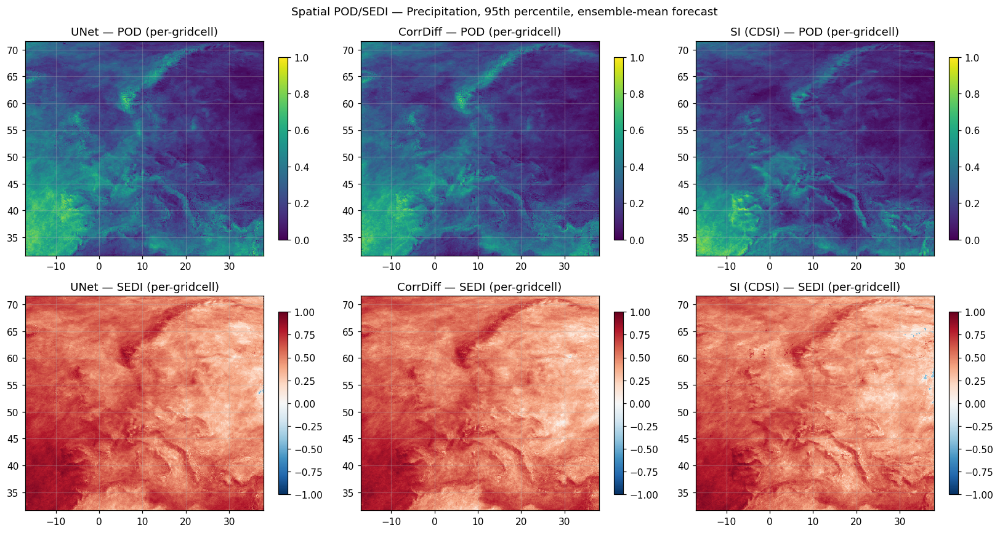

Note: per-gridcell maps are noisy (few 'yes' events per cell) — shown for spatial context only;
the pooled tables above are the summary numbers used for the paper.


In [13]:
def per_gridcell_pod_sedi(pred: xr.DataArray, target: xr.DataArray, threshold_map: np.ndarray, eps: float = 1e-6):
    """Per-gridcell POD and SEDI maps (spatial diagnostic only — noisy at small sample sizes, not the summary table)."""
    obs_bin = binarize(target.values, threshold_map)
    fcst_bin = binarize(pred.values, threshold_map)
    H = np.sum(fcst_bin & obs_bin, axis=0).astype(float)
    M = np.sum(~fcst_bin & obs_bin, axis=0).astype(float)
    F = np.sum(fcst_bin & ~obs_bin, axis=0).astype(float)
    C = np.sum(~fcst_bin & ~obs_bin, axis=0).astype(float)
    pod_map = np.where((H + M) > 0, H / np.maximum(H + M, 1), np.nan)
    pofd_map = np.where((F + C) > 0, F / np.maximum(F + C, 1), np.nan)
    h = np.clip(pod_map, eps, 1 - eps)
    f = np.clip(pofd_map, eps, 1 - eps)
    num = np.log(f) - np.log(h) - np.log(1 - f) + np.log(1 - h)
    den = np.log(f) + np.log(h) + np.log(1 - f) + np.log(1 - h)
    sedi_map = np.where(den != 0, num / den, np.nan)
    return pod_map, sedi_map


# Spatial POD/SEDI maps for precipitation at the 95th percentile (most physically meaningful "extreme" variable)
map_var, map_p = "pr", 95
lat, lon = LATLON[map_var]
thr_map = THRESH_PERGRID[map_var][map_p]

fig, axes = plt.subplots(2, len(EXPERIMENTS), figsize=(5 * len(EXPERIMENTS), 8))
for j, exp in enumerate(tqdm(EXPERIMENTS, desc="spatial POD/SEDI maps")):
    pred, target = load_aligned_pair(ROOT, exp, map_var)
    pod_map, sedi_map = per_gridcell_pod_sedi(pred, target, thr_map)
    del pred, target
    im0 = axes[0, j].pcolormesh(lon, lat, pod_map, shading="auto", cmap="viridis", vmin=0, vmax=1)
    axes[0, j].set_title(f"{MODEL_LABELS[exp]} — POD (per-gridcell)")
    fig.colorbar(im0, ax=axes[0, j], shrink=0.85)
    im1 = axes[1, j].pcolormesh(lon, lat, sedi_map, shading="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[1, j].set_title(f"{MODEL_LABELS[exp]} — SEDI (per-gridcell)")
    fig.colorbar(im1, ax=axes[1, j], shrink=0.85)
gc.collect()
fig.suptitle(f"Spatial POD/SEDI — {VAR_LONGNAME[map_var]}, {map_p}th percentile, ensemble-mean forecast")
plt.tight_layout()
savefig(fig, f"pod_sedi_map_{map_var}_p{map_p}")
plt.show()

print("Note: per-gridcell maps are noisy (few 'yes' events per cell) — shown for spatial context only;")
print("the pooled tables above are the summary numbers used for the paper.")


**What to look for.** If SI/CDSI is genuinely better at extremes, its SEDI (and POD, at comparable FAR/Bias) should exceed CorrDiff and UNet's, with the gap **widening from p95 to p99** — a model that is only marginally better overall but substantially better in the tail is exactly the claim this section is designed to test.

## 6. Fractions Skill Score (FSS)

**Definition.** Binarize the forecast and observation fields at a threshold (as in Section 5). For a neighborhood of side length $n$ grid points, compute the local fraction of exceeding cells around every point, for both fields:

$$P_{\text{fcst}}(n) = \text{uniform\_filter}(\text{fcst\_bin}, n) \qquad P_{\text{obs}}(n) = \text{uniform\_filter}(\text{obs\_bin}, n)$$

$$\text{FSS}(n) = 1 - \frac{\sum (P_{\text{fcst}}(n) - P_{\text{obs}}(n))^2}{\sum P_{\text{fcst}}(n)^2 + \sum P_{\text{obs}}(n)^2}$$

Sums are taken over the **entire** pooled (time, lat, lon) record rather than per day then averaged — at the 99th percentile most individual days have an all-zero field, making per-day FSS either undefined or a meaningless zero; pooling avoids these degenerate days dominating the average. FSS ranges from 0 (no skill) to 1 (perfect); the widely-used "useful skill" threshold is $\text{FSS}_{\text{useful}} = 0.5 + f_{\text{obs}}/2$, where $f_{\text{obs}}$ is the observed base rate.

**Neighborhood sizes.** At this domain's ≈11 km grid spacing (0.1° meridionally), we use $n \in \{1, 3, 5, 9, 17, 33\}$ grid points, i.e. neighborhoods spanning roughly $\{11, 33, 55, 99, 187, 363\}$ km — from single-pixel to synoptic scale. (Zonal spacing is somewhat smaller than meridional at these latitudes due to grid convergence; the km figures are a meridional approximation.)

**Why FSS matters for extremes.** Exact-pixel verification (like the contingency table in Section 5) double-penalizes a forecast that gets an extreme event right but places it a few grid cells off — a very common situation for spatially-chaotic phenomena like convective precipitation. FSS instead asks "was the forecast right in the *neighborhood* of the correct location," which is the standard remedy for this double-penalty problem and a much fairer way to judge whether a generative model's plausible-looking extreme events are usefully located, not just plausible-looking.

FSS: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:12<00:25, 12.64s/it]

  pr: experiments:  67%|██████▋   | 2/3 [00:26<00:13, 13.44s/it]

  pr: experiments: 100%|██████████| 3/3 [00:38<00:00, 12.90s/it]

FSS: variables:  50%|█████     | 1/2 [00:39<00:39, 39.22s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:13<00:26, 13.45s/it]

  tas: experiments:  67%|██████▋   | 2/3 [00:26<00:13, 13.35s/it]

  tas: experiments: 100%|██████████| 3/3 [00:39<00:00, 12.93s/it]

FSS: variables: 100%|██████████| 2/2 [01:18<00:00, 39.37s/it]

FSS: variables: 100%|██████████| 2/2 [01:18<00:00, 39.35s/it]

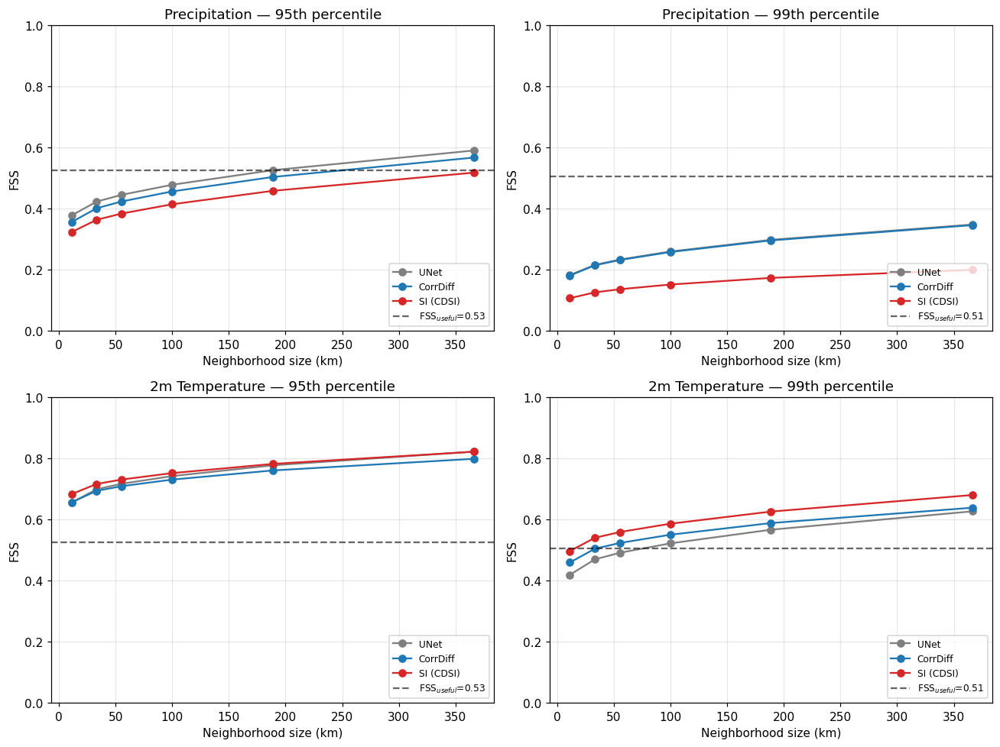

FSS by neighborhood scale (best model at each variable/percentile/window-size bold, 2nd underlined):


In [14]:
WINDOW_SIZES = [1, 3, 5, 9, 17, 33]
KM_PER_GRIDPOINT = 11.1  # approx meridional spacing at 0.1 deg


def compute_fss_all(threshold_basis: str = "pergrid", window_sizes: List[int] = WINDOW_SIZES):
    """Loads each (exp, var) pair once and reuses it across both percentiles. Runs on GPU via fss_gpu
    (avg_pool2d-based neighborhood smoothing) — orders of magnitude faster than a CPU sliding-window pass
    over ~400M elements x 6 window sizes, and avoids materializing extra host-RAM binarized copies."""
    rows = []
    curves = {}  # (var, p, exp) -> (fss_dict, f_obs)
    for var in tqdm(VARIABLES, desc="FSS: variables"):
        for exp in tqdm(EXPERIMENTS, desc=f"  {var}: experiments", leave=False):
            pred, target = load_aligned_pair(ROOT, exp, var)
            for p in PERCENTILES:
                thr = THRESH_PERGRID[var][p] if threshold_basis == "pergrid" else THRESH_DOMAIN[var][p]
                fss_res, f_obs = fss_gpu(target.values, pred.values, thr, window_sizes)
                curves[(var, p, exp)] = (fss_res, f_obs)
                for n, val in fss_res.items():
                    rows.append({"variable": var, "percentile": p, "experiment": MODEL_LABELS[exp],
                                 "window_gridpts": n, "window_km": round(n * KM_PER_GRIDPOINT, 1),
                                 "FSS": val, "f_obs": f_obs})
            del pred, target
        gc.collect()
    return pd.DataFrame(rows), curves


fss_df, fss_curves = compute_fss_all("pergrid")

fig, axes = plt.subplots(len(VARIABLES), len(PERCENTILES), figsize=(6 * len(PERCENTILES), 4.5 * len(VARIABLES)), squeeze=False)
for i, var in enumerate(VARIABLES):
    for j, p in enumerate(PERCENTILES):
        ax = axes[i][j]
        for exp in EXPERIMENTS:
            fss_res, f_obs = fss_curves[(var, p, exp)]
            xs = [n * KM_PER_GRIDPOINT for n in WINDOW_SIZES]
            ys = [fss_res[n] for n in WINDOW_SIZES]
            ax.plot(xs, ys, marker="o", label=MODEL_LABELS[exp], color=MODEL_COLORS[exp])
        _, f_obs_ref = fss_curves[(var, p, EXPERIMENTS[0])]
        fss_useful = 0.5 + f_obs_ref / 2
        ax.axhline(fss_useful, ls="--", color="k", alpha=0.6, label=f"FSS$_{{useful}}$={fss_useful:.2f}")
        ax.set_xlabel("Neighborhood size (km)")
        ax.set_ylabel("FSS")
        ax.set_ylim(0, 1)
        ax.set_title(f"{VAR_LONGNAME[var]} — {p}th percentile")
        ax.legend(fontsize=8, loc="lower right")
plt.tight_layout()
savefig(fig, "fss_curves")
plt.show()

fss_indexed = fss_df.set_index(["variable", "percentile", "window_gridpts", "experiment"])[["window_km", "FSS"]]
FSS_DIRECTIONS = {"FSS": "max"}
save_styled_table(fss_indexed, "fss_pergrid", FSS_DIRECTIONS,
                   caption="Fractions Skill Score across neighborhood scales (per-gridcell thresholds); best model at each scale.",
                   label="tab:fss")
print("FSS by neighborhood scale (best model at each variable/percentile/window-size bold, 2nd underlined):")
style_best_second(fss_indexed, FSS_DIRECTIONS)


## 7. Rank histograms (Talagrand diagrams) — SI / CorrDiff only

**Definition.** For each (day, gridcell), rank the observed value among its 20 sorted ensemble members (rank $\in \{0, \dots, 20\}$). Pooling these ranks over the whole domain/period into a histogram: if the ensemble is statistically well-calibrated, the observation is equally likely to fall in any rank slot, so the histogram should be **flat**.

**Interpretation.**
- **U-shaped** (excess mass at rank 0 and rank 20): under-dispersion — the ensemble is too narrow, so the truth frequently falls outside the ensemble's envelope entirely. This is the classic failure mode for a model that "looks confident" but is miscalibrated.
- **Dome-shaped**: over-dispersion — the ensemble is too wide/uncertain relative to actual outcomes.
- **Asymmetric/sloped**: systematic bias (the ensemble tends to over- or under-predict).

**Why valuable for extremes.** We compute the rank histogram twice: once over *all* days, and once restricted to grid-cell-days where the target exceeds its per-gridcell 95th/99th percentile. This directly tests the reviewers' concern: if extremes disproportionately land at rank 0 (below every member) or rank 20 (above every member) even when the overall histogram looks reasonably flat, it means the ensemble specifically fails to bracket high-impact events — a much sharper diagnostic than an aggregate calibration score. UNet is deterministic (a single "member"), for which a rank histogram is degenerate and not shown.

rank histograms:   0%|          | 0/4 [00:00<?, ?it/s]

rank-hist test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

rank-hist test_CorrDiff_small_r1/pr:   0%|          | 3/1824 [00:00<01:17, 23.57day/s]

rank-hist test_CorrDiff_small_r1/pr:   0%|          | 6/1824 [00:00<01:26, 20.92day/s]

rank-hist test_CorrDiff_small_r1/pr:   0%|          | 9/1824 [00:00<01:21, 22.38day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|          | 12/1824 [00:00<01:18, 22.94day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|          | 15/1824 [00:00<01:45, 17.19day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|          | 18/1824 [00:00<01:34, 19.04day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|          | 21/1824 [00:01<01:26, 20.89day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|▏         | 24/1824 [00:01<01:18, 23.04day/s]

rank-hist test_CorrDiff_small_r1/pr:   1%|▏         | 27/1824 [00:01<01:12, 24.73day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 30/1824 [00:01<01:09, 25.98day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 33/1824 [00:01<01:06, 26.95day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 36/1824 [00:01<01:20, 22.08day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 39/1824 [00:01<01:14, 23.88day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 42/1824 [00:01<01:10, 25.34day/s]

rank-hist test_CorrDiff_small_r1/pr:   2%|▏         | 45/1824 [00:01<01:07, 26.48day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 48/1824 [00:02<01:05, 27.32day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 51/1824 [00:02<01:03, 27.90day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 54/1824 [00:02<01:03, 28.03day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 57/1824 [00:02<01:02, 28.36day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 60/1824 [00:02<01:01, 28.64day/s]

rank-hist test_CorrDiff_small_r1/pr:   3%|▎         | 63/1824 [00:02<01:00, 28.97day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▎         | 66/1824 [00:02<01:00, 29.15day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▍         | 69/1824 [00:02<00:59, 29.32day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▍         | 72/1824 [00:02<00:59, 29.43day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▍         | 75/1824 [00:03<01:14, 23.60day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▍         | 78/1824 [00:03<01:11, 24.57day/s]

rank-hist test_CorrDiff_small_r1/pr:   4%|▍         | 81/1824 [00:03<01:07, 25.75day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▍         | 84/1824 [00:03<01:06, 26.28day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▍         | 87/1824 [00:03<01:04, 27.12day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▍         | 90/1824 [00:03<01:02, 27.67day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▌         | 93/1824 [00:03<01:01, 28.12day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▌         | 96/1824 [00:03<01:00, 28.48day/s]

rank-hist test_CorrDiff_small_r1/pr:   5%|▌         | 99/1824 [00:03<01:00, 28.58day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▌         | 102/1824 [00:03<00:59, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▌         | 105/1824 [00:04<00:59, 28.91day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▌         | 108/1824 [00:04<00:59, 29.01day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▌         | 111/1824 [00:04<01:12, 23.71day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▋         | 114/1824 [00:04<01:07, 25.17day/s]

rank-hist test_CorrDiff_small_r1/pr:   6%|▋         | 117/1824 [00:04<01:04, 26.31day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 120/1824 [00:04<01:02, 27.18day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 123/1824 [00:04<01:02, 27.13day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 126/1824 [00:04<01:01, 27.77day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 129/1824 [00:04<01:00, 28.23day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 132/1824 [00:05<00:59, 28.57day/s]

rank-hist test_CorrDiff_small_r1/pr:   7%|▋         | 135/1824 [00:05<00:58, 28.80day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 138/1824 [00:05<00:59, 28.45day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 141/1824 [00:05<00:58, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 144/1824 [00:05<00:59, 28.34day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 147/1824 [00:05<00:59, 28.36day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 150/1824 [00:05<01:12, 23.12day/s]

rank-hist test_CorrDiff_small_r1/pr:   8%|▊         | 153/1824 [00:05<01:07, 24.68day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▊         | 156/1824 [00:05<01:04, 25.97day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▊         | 159/1824 [00:06<01:01, 26.94day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▉         | 162/1824 [00:06<01:01, 27.20day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▉         | 165/1824 [00:06<00:59, 27.84day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▉         | 168/1824 [00:06<00:59, 28.00day/s]

rank-hist test_CorrDiff_small_r1/pr:   9%|▉         | 171/1824 [00:06<00:58, 28.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|▉         | 174/1824 [00:06<00:57, 28.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|▉         | 177/1824 [00:06<00:57, 28.86day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|▉         | 180/1824 [00:06<00:56, 29.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|█         | 183/1824 [00:06<00:56, 29.23day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|█         | 186/1824 [00:07<00:55, 29.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  10%|█         | 189/1824 [00:07<01:10, 23.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█         | 192/1824 [00:07<01:07, 24.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█         | 195/1824 [00:07<01:05, 24.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█         | 198/1824 [00:07<01:03, 25.60day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█         | 201/1824 [00:07<01:01, 26.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█         | 204/1824 [00:07<01:00, 26.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  11%|█▏        | 207/1824 [00:07<00:59, 27.11day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 210/1824 [00:07<00:58, 27.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 213/1824 [00:08<00:56, 28.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 216/1824 [00:08<00:56, 28.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 219/1824 [00:08<00:55, 28.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 222/1824 [00:08<00:55, 29.07day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▏        | 225/1824 [00:08<01:07, 23.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  12%|█▎        | 228/1824 [00:08<01:03, 25.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 231/1824 [00:08<01:00, 26.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 234/1824 [00:08<00:58, 27.31day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 237/1824 [00:08<00:58, 27.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 240/1824 [00:09<00:58, 27.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 243/1824 [00:09<00:57, 27.69day/s]

rank-hist test_CorrDiff_small_r1/pr:  13%|█▎        | 246/1824 [00:09<00:56, 28.12day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▎        | 249/1824 [00:09<00:55, 28.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▍        | 252/1824 [00:09<00:54, 28.68day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▍        | 255/1824 [00:09<00:54, 28.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▍        | 258/1824 [00:09<00:53, 29.10day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▍        | 261/1824 [00:09<00:53, 29.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  14%|█▍        | 264/1824 [00:09<01:05, 23.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▍        | 267/1824 [00:10<01:01, 25.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▍        | 270/1824 [00:10<00:58, 26.38day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▍        | 273/1824 [00:10<00:56, 27.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▌        | 276/1824 [00:10<00:55, 27.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▌        | 279/1824 [00:10<00:54, 28.44day/s]

rank-hist test_CorrDiff_small_r1/pr:  15%|█▌        | 282/1824 [00:10<00:54, 28.33day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▌        | 285/1824 [00:10<00:53, 28.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▌        | 288/1824 [00:10<00:53, 28.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▌        | 291/1824 [00:10<00:52, 29.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▌        | 294/1824 [00:11<00:52, 29.11day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▋        | 297/1824 [00:11<00:52, 29.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  16%|█▋        | 300/1824 [00:11<00:52, 29.31day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 303/1824 [00:11<01:06, 23.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 306/1824 [00:11<01:01, 24.66day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 309/1824 [00:11<00:58, 25.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 312/1824 [00:11<00:56, 26.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 315/1824 [00:11<00:54, 27.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  17%|█▋        | 318/1824 [00:11<00:53, 28.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 321/1824 [00:12<00:52, 28.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 324/1824 [00:12<00:52, 28.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 327/1824 [00:12<00:51, 29.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 330/1824 [00:12<00:51, 29.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 333/1824 [00:12<00:51, 29.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  18%|█▊        | 336/1824 [00:12<00:50, 29.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▊        | 339/1824 [00:12<00:52, 28.55day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▉        | 342/1824 [00:12<01:04, 23.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▉        | 345/1824 [00:12<01:00, 24.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▉        | 348/1824 [00:13<00:57, 25.82day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▉        | 351/1824 [00:13<00:54, 26.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  19%|█▉        | 354/1824 [00:13<00:53, 27.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|█▉        | 357/1824 [00:13<00:52, 28.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|█▉        | 360/1824 [00:13<00:51, 28.53day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|█▉        | 363/1824 [00:13<00:50, 28.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|██        | 366/1824 [00:13<00:50, 29.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|██        | 369/1824 [00:13<00:49, 29.20day/s]

rank-hist test_CorrDiff_small_r1/pr:  20%|██        | 372/1824 [00:13<00:49, 29.32day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██        | 375/1824 [00:13<00:49, 29.41day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██        | 378/1824 [00:14<01:01, 23.67day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██        | 381/1824 [00:14<00:57, 25.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██        | 384/1824 [00:14<00:54, 26.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██        | 387/1824 [00:14<00:53, 27.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  21%|██▏       | 390/1824 [00:14<00:51, 27.74day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 393/1824 [00:14<00:50, 28.21day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 396/1824 [00:14<00:49, 28.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 399/1824 [00:14<00:49, 28.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 402/1824 [00:14<00:49, 28.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 405/1824 [00:15<00:49, 28.39day/s]

rank-hist test_CorrDiff_small_r1/pr:  22%|██▏       | 408/1824 [00:15<00:49, 28.74day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 411/1824 [00:15<00:48, 28.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 414/1824 [00:15<00:48, 29.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 417/1824 [00:15<00:58, 23.87day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 420/1824 [00:15<00:55, 25.33day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 423/1824 [00:15<00:52, 26.47day/s]

rank-hist test_CorrDiff_small_r1/pr:  23%|██▎       | 426/1824 [00:15<00:51, 27.35day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▎       | 429/1824 [00:15<00:50, 27.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▎       | 432/1824 [00:16<00:49, 28.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▍       | 435/1824 [00:16<00:48, 28.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▍       | 438/1824 [00:16<00:47, 28.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▍       | 441/1824 [00:16<00:47, 29.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  24%|██▍       | 444/1824 [00:16<00:47, 29.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▍       | 447/1824 [00:16<00:47, 29.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▍       | 450/1824 [00:16<00:47, 29.12day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▍       | 453/1824 [00:16<00:47, 29.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▌       | 456/1824 [00:16<00:57, 23.80day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▌       | 459/1824 [00:17<00:54, 25.13day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▌       | 462/1824 [00:17<00:52, 26.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  25%|██▌       | 465/1824 [00:17<00:50, 26.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▌       | 468/1824 [00:17<00:49, 27.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▌       | 471/1824 [00:17<00:48, 27.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▌       | 474/1824 [00:17<00:47, 28.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▌       | 477/1824 [00:17<00:47, 28.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▋       | 480/1824 [00:17<00:47, 28.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  26%|██▋       | 483/1824 [00:17<00:46, 28.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 486/1824 [00:17<00:46, 28.88day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 489/1824 [00:18<00:45, 29.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 492/1824 [00:18<01:13, 18.07day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 495/1824 [00:18<01:05, 20.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 498/1824 [00:18<00:58, 22.47day/s]

rank-hist test_CorrDiff_small_r1/pr:  27%|██▋       | 501/1824 [00:18<00:54, 24.17day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 504/1824 [00:18<00:53, 24.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 507/1824 [00:18<00:50, 25.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 510/1824 [00:19<00:48, 27.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 513/1824 [00:19<00:47, 27.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 516/1824 [00:19<00:46, 28.35day/s]

rank-hist test_CorrDiff_small_r1/pr:  28%|██▊       | 519/1824 [00:19<00:45, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▊       | 522/1824 [00:19<00:44, 29.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▉       | 525/1824 [00:19<00:44, 28.98day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▉       | 528/1824 [00:19<00:45, 28.73day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▉       | 531/1824 [00:19<01:11, 18.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▉       | 534/1824 [00:20<01:03, 20.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  29%|██▉       | 537/1824 [00:20<00:57, 22.36day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|██▉       | 540/1824 [00:20<00:53, 24.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|██▉       | 543/1824 [00:20<00:50, 25.30day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|██▉       | 546/1824 [00:20<00:48, 26.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|███       | 549/1824 [00:20<00:47, 27.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|███       | 552/1824 [00:20<00:45, 27.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  30%|███       | 555/1824 [00:20<00:45, 28.12day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███       | 558/1824 [00:20<00:44, 28.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███       | 561/1824 [00:20<00:44, 28.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███       | 564/1824 [00:21<00:43, 28.73day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███       | 567/1824 [00:21<00:43, 28.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███▏      | 570/1824 [00:21<01:11, 17.65day/s]

rank-hist test_CorrDiff_small_r1/pr:  31%|███▏      | 573/1824 [00:21<01:02, 19.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 576/1824 [00:21<00:56, 22.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 579/1824 [00:21<00:52, 23.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 582/1824 [00:21<00:49, 25.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 585/1824 [00:22<00:50, 24.67day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 588/1824 [00:22<00:47, 25.75day/s]

rank-hist test_CorrDiff_small_r1/pr:  32%|███▏      | 591/1824 [00:22<00:46, 26.68day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 594/1824 [00:22<00:45, 27.31day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 597/1824 [00:22<00:44, 27.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 600/1824 [00:22<00:43, 28.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 603/1824 [00:22<00:42, 28.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 606/1824 [00:22<00:42, 28.67day/s]

rank-hist test_CorrDiff_small_r1/pr:  33%|███▎      | 609/1824 [00:23<01:08, 17.86day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▎      | 612/1824 [00:23<00:59, 20.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▎      | 615/1824 [00:23<00:54, 22.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▍      | 618/1824 [00:23<00:50, 23.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▍      | 621/1824 [00:23<00:47, 25.32day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▍      | 624/1824 [00:23<00:45, 26.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  34%|███▍      | 627/1824 [00:23<00:46, 26.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▍      | 630/1824 [00:23<00:44, 26.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▍      | 633/1824 [00:23<00:44, 26.91day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▍      | 636/1824 [00:24<00:43, 27.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▌      | 639/1824 [00:24<00:42, 27.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▌      | 642/1824 [00:24<00:41, 28.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  35%|███▌      | 645/1824 [00:24<01:04, 18.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▌      | 648/1824 [00:24<00:57, 20.58day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▌      | 651/1824 [00:24<00:54, 21.44day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▌      | 654/1824 [00:24<00:54, 21.41day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▌      | 657/1824 [00:25<00:50, 23.30day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▌      | 661/1824 [00:25<00:45, 25.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  36%|███▋      | 664/1824 [00:25<00:43, 26.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  37%|███▋      | 667/1824 [00:25<00:45, 25.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  37%|███▋      | 670/1824 [00:25<00:43, 26.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  37%|███▋      | 674/1824 [00:25<00:41, 27.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  37%|███▋      | 678/1824 [00:25<00:40, 28.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  37%|███▋      | 681/1824 [00:25<00:39, 28.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 684/1824 [00:26<01:00, 18.86day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 687/1824 [00:26<00:54, 20.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 690/1824 [00:26<00:49, 22.87day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 693/1824 [00:26<00:46, 24.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 696/1824 [00:26<00:43, 25.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 699/1824 [00:26<00:42, 26.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  38%|███▊      | 702/1824 [00:26<00:40, 27.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▊      | 705/1824 [00:26<00:39, 28.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▉      | 708/1824 [00:26<00:40, 27.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▉      | 711/1824 [00:27<00:40, 27.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▉      | 714/1824 [00:27<00:41, 27.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▉      | 717/1824 [00:27<00:42, 26.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  39%|███▉      | 720/1824 [00:27<00:42, 26.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|███▉      | 723/1824 [00:27<01:05, 16.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|███▉      | 726/1824 [00:27<00:57, 18.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|███▉      | 729/1824 [00:27<00:51, 21.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|████      | 732/1824 [00:28<00:47, 23.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|████      | 735/1824 [00:28<00:44, 24.38day/s]

rank-hist test_CorrDiff_small_r1/pr:  40%|████      | 738/1824 [00:28<00:43, 25.07day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████      | 741/1824 [00:28<00:41, 26.10day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████      | 744/1824 [00:28<00:41, 25.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████      | 747/1824 [00:28<00:41, 26.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████      | 750/1824 [00:28<00:40, 26.31day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████▏     | 753/1824 [00:28<00:42, 25.13day/s]

rank-hist test_CorrDiff_small_r1/pr:  41%|████▏     | 756/1824 [00:29<00:42, 25.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 759/1824 [00:29<01:06, 16.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 762/1824 [00:29<00:58, 18.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 765/1824 [00:29<00:51, 20.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 768/1824 [00:29<00:47, 22.44day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 771/1824 [00:29<00:44, 23.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  42%|████▏     | 774/1824 [00:29<00:41, 25.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 777/1824 [00:29<00:39, 26.29day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 780/1824 [00:30<00:38, 27.24day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 783/1824 [00:30<00:41, 25.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 786/1824 [00:30<00:39, 26.20day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 789/1824 [00:30<00:38, 27.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  43%|████▎     | 792/1824 [00:30<00:37, 27.82day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▎     | 795/1824 [00:30<00:36, 28.33day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▍     | 798/1824 [00:30<00:57, 17.75day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▍     | 801/1824 [00:31<00:51, 19.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▍     | 804/1824 [00:31<00:46, 21.73day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▍     | 807/1824 [00:31<00:48, 20.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  44%|████▍     | 810/1824 [00:31<00:46, 22.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▍     | 813/1824 [00:31<00:43, 23.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▍     | 816/1824 [00:31<00:41, 24.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▍     | 819/1824 [00:31<00:40, 24.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▌     | 822/1824 [00:31<00:39, 25.38day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▌     | 825/1824 [00:32<00:39, 25.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  45%|████▌     | 828/1824 [00:32<00:38, 25.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▌     | 831/1824 [00:32<00:37, 26.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▌     | 834/1824 [00:32<00:36, 27.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▌     | 837/1824 [00:32<00:58, 16.95day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▌     | 840/1824 [00:32<00:50, 19.41day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▌     | 843/1824 [00:32<00:45, 21.52day/s]

rank-hist test_CorrDiff_small_r1/pr:  46%|████▋     | 846/1824 [00:32<00:41, 23.43day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 849/1824 [00:33<00:39, 24.98day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 852/1824 [00:33<00:37, 26.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 855/1824 [00:33<00:35, 27.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 858/1824 [00:33<00:34, 27.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 861/1824 [00:33<00:34, 28.29day/s]

rank-hist test_CorrDiff_small_r1/pr:  47%|████▋     | 864/1824 [00:33<00:33, 28.50day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 867/1824 [00:33<00:33, 28.75day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 870/1824 [00:33<00:32, 28.95day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 873/1824 [00:34<00:53, 17.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 876/1824 [00:34<00:46, 20.24day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 879/1824 [00:34<00:42, 22.37day/s]

rank-hist test_CorrDiff_small_r1/pr:  48%|████▊     | 882/1824 [00:34<00:39, 24.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▊     | 885/1824 [00:34<00:36, 25.54day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▊     | 888/1824 [00:34<00:35, 26.54day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▉     | 891/1824 [00:34<00:34, 27.39day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▉     | 894/1824 [00:34<00:33, 28.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▉     | 897/1824 [00:34<00:32, 28.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  49%|████▉     | 900/1824 [00:35<00:32, 28.67day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|████▉     | 903/1824 [00:35<00:34, 26.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|████▉     | 906/1824 [00:35<00:33, 27.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|████▉     | 909/1824 [00:35<00:32, 27.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|█████     | 912/1824 [00:35<00:52, 17.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|█████     | 915/1824 [00:35<00:46, 19.72day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|█████     | 918/1824 [00:35<00:41, 21.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  50%|█████     | 921/1824 [00:36<00:38, 23.58day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████     | 924/1824 [00:36<00:36, 24.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████     | 927/1824 [00:36<00:34, 25.80day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████     | 930/1824 [00:36<00:33, 26.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████     | 933/1824 [00:36<00:32, 27.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████▏    | 936/1824 [00:36<00:31, 28.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  51%|█████▏    | 939/1824 [00:36<00:31, 28.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 942/1824 [00:36<00:31, 28.24day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 945/1824 [00:36<00:31, 27.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 948/1824 [00:36<00:32, 27.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 951/1824 [00:37<00:50, 17.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 954/1824 [00:37<00:44, 19.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  52%|█████▏    | 957/1824 [00:37<00:40, 21.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 960/1824 [00:37<00:38, 22.63day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 963/1824 [00:37<00:35, 24.13day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 966/1824 [00:37<00:33, 25.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 969/1824 [00:37<00:33, 25.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 972/1824 [00:38<00:32, 26.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  53%|█████▎    | 975/1824 [00:38<00:31, 27.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▎    | 978/1824 [00:38<00:30, 27.69day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▍    | 981/1824 [00:38<00:29, 28.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▍    | 984/1824 [00:38<00:29, 28.36day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▍    | 987/1824 [00:38<00:29, 28.59day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▍    | 990/1824 [00:38<00:44, 18.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  54%|█████▍    | 993/1824 [00:38<00:39, 21.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▍    | 996/1824 [00:39<00:36, 22.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▍    | 999/1824 [00:39<00:33, 24.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▍    | 1002/1824 [00:39<00:31, 26.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▌    | 1005/1824 [00:39<00:30, 27.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▌    | 1008/1824 [00:39<00:29, 27.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  55%|█████▌    | 1011/1824 [00:39<00:28, 28.36day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▌    | 1014/1824 [00:39<00:28, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▌    | 1017/1824 [00:39<00:27, 29.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▌    | 1020/1824 [00:39<00:27, 29.23day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▌    | 1023/1824 [00:39<00:27, 28.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▋    | 1026/1824 [00:40<00:33, 23.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  56%|█████▋    | 1029/1824 [00:40<00:31, 25.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1032/1824 [00:40<00:30, 26.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1035/1824 [00:40<00:29, 27.19day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1038/1824 [00:40<00:28, 27.91day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1041/1824 [00:40<00:27, 28.38day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1044/1824 [00:40<00:27, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  57%|█████▋    | 1047/1824 [00:40<00:26, 29.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1050/1824 [00:40<00:26, 29.20day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1053/1824 [00:41<00:26, 29.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1056/1824 [00:41<00:26, 29.39day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1059/1824 [00:41<00:25, 29.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1062/1824 [00:41<00:25, 29.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  58%|█████▊    | 1065/1824 [00:41<00:42, 17.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▊    | 1068/1824 [00:41<00:37, 20.30day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▊    | 1071/1824 [00:41<00:33, 22.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▉    | 1074/1824 [00:41<00:31, 24.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▉    | 1077/1824 [00:42<00:29, 25.47day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▉    | 1080/1824 [00:42<00:28, 26.55day/s]

rank-hist test_CorrDiff_small_r1/pr:  59%|█████▉    | 1083/1824 [00:42<00:27, 27.40day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|█████▉    | 1086/1824 [00:42<00:26, 27.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|█████▉    | 1089/1824 [00:42<00:26, 28.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|█████▉    | 1092/1824 [00:42<00:26, 28.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|██████    | 1095/1824 [00:42<00:25, 28.37day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|██████    | 1098/1824 [00:42<00:25, 28.68day/s]

rank-hist test_CorrDiff_small_r1/pr:  60%|██████    | 1101/1824 [00:42<00:25, 28.88day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████    | 1104/1824 [00:43<00:40, 17.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████    | 1107/1824 [00:43<00:35, 20.26day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████    | 1110/1824 [00:43<00:32, 22.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████    | 1113/1824 [00:43<00:32, 22.10day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████    | 1116/1824 [00:43<00:29, 23.80day/s]

rank-hist test_CorrDiff_small_r1/pr:  61%|██████▏   | 1119/1824 [00:43<00:28, 25.17day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1122/1824 [00:43<00:26, 26.24day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1125/1824 [00:43<00:25, 27.03day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1128/1824 [00:44<00:25, 27.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1131/1824 [00:44<00:24, 27.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1134/1824 [00:44<00:24, 28.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▏   | 1137/1824 [00:44<00:24, 27.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  62%|██████▎   | 1140/1824 [00:44<00:37, 18.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1143/1824 [00:44<00:34, 19.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1146/1824 [00:44<00:30, 22.10day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1149/1824 [00:45<00:28, 23.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1152/1824 [00:45<00:28, 23.44day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1155/1824 [00:45<00:27, 24.74day/s]

rank-hist test_CorrDiff_small_r1/pr:  63%|██████▎   | 1158/1824 [00:45<00:25, 25.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▎   | 1161/1824 [00:45<00:24, 26.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▍   | 1164/1824 [00:45<00:24, 27.41day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▍   | 1167/1824 [00:45<00:23, 27.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▍   | 1170/1824 [00:45<00:23, 27.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▍   | 1173/1824 [00:45<00:22, 28.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  64%|██████▍   | 1176/1824 [00:45<00:22, 28.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▍   | 1179/1824 [00:46<00:37, 17.36day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▍   | 1182/1824 [00:46<00:32, 19.75day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▍   | 1185/1824 [00:46<00:29, 21.86day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▌   | 1188/1824 [00:46<00:26, 23.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▌   | 1191/1824 [00:46<00:25, 25.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  65%|██████▌   | 1194/1824 [00:46<00:24, 26.12day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▌   | 1197/1824 [00:46<00:23, 26.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▌   | 1200/1824 [00:47<00:23, 26.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▌   | 1203/1824 [00:47<00:22, 27.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▌   | 1206/1824 [00:47<00:22, 27.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▋   | 1209/1824 [00:47<00:22, 27.10day/s]

rank-hist test_CorrDiff_small_r1/pr:  66%|██████▋   | 1212/1824 [00:47<00:22, 26.88day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1215/1824 [00:47<00:22, 26.84day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1218/1824 [00:47<00:34, 17.36day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1221/1824 [00:48<00:31, 19.37day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1224/1824 [00:48<00:28, 21.38day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1227/1824 [00:48<00:25, 23.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  67%|██████▋   | 1230/1824 [00:48<00:23, 24.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1233/1824 [00:48<00:22, 25.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1236/1824 [00:48<00:21, 26.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1239/1824 [00:48<00:21, 27.49day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1242/1824 [00:48<00:20, 27.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1245/1824 [00:48<00:20, 28.20day/s]

rank-hist test_CorrDiff_small_r1/pr:  68%|██████▊   | 1248/1824 [00:48<00:20, 28.43day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▊   | 1251/1824 [00:49<00:19, 28.66day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▉   | 1254/1824 [00:49<00:19, 28.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▉   | 1257/1824 [00:49<00:32, 17.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▉   | 1260/1824 [00:49<00:28, 19.80day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▉   | 1263/1824 [00:49<00:25, 21.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  69%|██████▉   | 1266/1824 [00:49<00:23, 23.27day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|██████▉   | 1269/1824 [00:49<00:22, 24.19day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|██████▉   | 1272/1824 [00:50<00:22, 25.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|██████▉   | 1275/1824 [00:50<00:20, 26.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|███████   | 1278/1824 [00:50<00:20, 27.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|███████   | 1281/1824 [00:50<00:19, 27.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  70%|███████   | 1284/1824 [00:50<00:19, 28.12day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████   | 1287/1824 [00:50<00:18, 28.46day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████   | 1290/1824 [00:50<00:18, 28.64day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████   | 1293/1824 [00:50<00:30, 17.34day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████   | 1296/1824 [00:51<00:26, 19.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████   | 1299/1824 [00:51<00:23, 21.98day/s]

rank-hist test_CorrDiff_small_r1/pr:  71%|███████▏  | 1302/1824 [00:51<00:21, 23.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1305/1824 [00:51<00:20, 25.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1308/1824 [00:51<00:19, 26.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1311/1824 [00:51<00:18, 27.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1314/1824 [00:51<00:18, 27.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1317/1824 [00:51<00:17, 28.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  72%|███████▏  | 1320/1824 [00:51<00:17, 28.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1323/1824 [00:52<00:17, 28.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1326/1824 [00:52<00:17, 29.08day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1329/1824 [00:52<00:16, 29.19day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1332/1824 [00:52<00:27, 17.71day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1335/1824 [00:52<00:25, 19.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  73%|███████▎  | 1338/1824 [00:52<00:23, 21.13day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▎  | 1341/1824 [00:52<00:21, 22.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▎  | 1344/1824 [00:52<00:19, 24.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▍  | 1347/1824 [00:53<00:18, 25.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▍  | 1350/1824 [00:53<00:17, 26.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▍  | 1353/1824 [00:53<00:17, 27.16day/s]

rank-hist test_CorrDiff_small_r1/pr:  74%|███████▍  | 1356/1824 [00:53<00:16, 27.59day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▍  | 1359/1824 [00:53<00:16, 27.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▍  | 1362/1824 [00:53<00:16, 28.15day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▍  | 1365/1824 [00:53<00:16, 28.29day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▌  | 1368/1824 [00:53<00:16, 28.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▌  | 1371/1824 [00:54<00:26, 17.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▌  | 1374/1824 [00:54<00:22, 19.58day/s]

rank-hist test_CorrDiff_small_r1/pr:  75%|███████▌  | 1377/1824 [00:54<00:20, 21.59day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▌  | 1380/1824 [00:54<00:20, 21.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▌  | 1383/1824 [00:54<00:20, 22.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▌  | 1386/1824 [00:54<00:19, 22.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▌  | 1389/1824 [00:54<00:19, 22.33day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▋  | 1392/1824 [00:55<00:19, 22.46day/s]

rank-hist test_CorrDiff_small_r1/pr:  76%|███████▋  | 1395/1824 [00:55<00:18, 22.72day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1398/1824 [00:55<00:18, 22.69day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1401/1824 [00:55<00:18, 22.84day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1404/1824 [00:55<00:18, 22.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1407/1824 [00:55<00:28, 14.84day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1409/1824 [00:56<00:27, 15.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1411/1824 [00:56<00:25, 15.97day/s]

rank-hist test_CorrDiff_small_r1/pr:  77%|███████▋  | 1413/1824 [00:56<00:24, 16.67day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1415/1824 [00:56<00:25, 16.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1417/1824 [00:56<00:23, 17.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1420/1824 [00:56<00:21, 18.58day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1423/1824 [00:56<00:20, 19.57day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1426/1824 [00:56<00:19, 20.11day/s]

rank-hist test_CorrDiff_small_r1/pr:  78%|███████▊  | 1429/1824 [00:57<00:18, 21.52day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▊  | 1432/1824 [00:57<00:17, 22.14day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▊  | 1435/1824 [00:57<00:16, 22.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▉  | 1438/1824 [00:57<00:16, 23.84day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▉  | 1441/1824 [00:57<00:16, 23.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▉  | 1444/1824 [00:57<00:17, 21.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▉  | 1447/1824 [00:58<00:36, 10.37day/s]

rank-hist test_CorrDiff_small_r1/pr:  79%|███████▉  | 1450/1824 [00:58<00:30, 12.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|███████▉  | 1453/1824 [00:58<00:26, 13.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|███████▉  | 1456/1824 [00:58<00:23, 15.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|███████▉  | 1459/1824 [00:58<00:21, 17.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|████████  | 1462/1824 [00:59<00:20, 17.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|████████  | 1464/1824 [00:59<00:20, 17.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  80%|████████  | 1467/1824 [00:59<00:19, 18.47day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1469/1824 [00:59<00:18, 18.79day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1471/1824 [00:59<00:18, 18.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1473/1824 [00:59<00:19, 18.05day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1475/1824 [00:59<00:19, 17.92day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1478/1824 [00:59<00:18, 18.92day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████  | 1480/1824 [01:00<00:18, 18.30day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████▏ | 1483/1824 [01:00<00:17, 19.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  81%|████████▏ | 1486/1824 [01:00<00:16, 21.00day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1489/1824 [01:00<00:14, 22.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1492/1824 [01:00<00:13, 24.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1495/1824 [01:00<00:14, 23.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1498/1824 [01:00<00:13, 24.19day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1501/1824 [01:00<00:13, 23.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  82%|████████▏ | 1504/1824 [01:00<00:13, 23.82day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1507/1824 [01:01<00:12, 24.44day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1510/1824 [01:01<00:12, 25.28day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1513/1824 [01:01<00:12, 24.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1516/1824 [01:01<00:12, 24.52day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1519/1824 [01:01<00:13, 22.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  83%|████████▎ | 1522/1824 [01:01<00:16, 18.69day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▎ | 1525/1824 [01:01<00:15, 19.69day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▍ | 1528/1824 [01:02<00:14, 20.25day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▍ | 1531/1824 [01:02<00:14, 19.74day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▍ | 1534/1824 [01:02<00:14, 19.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▍ | 1537/1824 [01:02<00:13, 21.61day/s]

rank-hist test_CorrDiff_small_r1/pr:  84%|████████▍ | 1540/1824 [01:02<00:12, 22.17day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▍ | 1543/1824 [01:02<00:15, 17.58day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▍ | 1546/1824 [01:03<00:14, 18.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▍ | 1549/1824 [01:03<00:13, 20.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▌ | 1552/1824 [01:03<00:12, 22.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▌ | 1555/1824 [01:03<00:12, 22.07day/s]

rank-hist test_CorrDiff_small_r1/pr:  85%|████████▌ | 1558/1824 [01:03<00:11, 23.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▌ | 1561/1824 [01:03<00:13, 19.56day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▌ | 1564/1824 [01:03<00:12, 21.24day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▌ | 1567/1824 [01:03<00:11, 22.37day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▌ | 1570/1824 [01:04<00:11, 22.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▌ | 1573/1824 [01:04<00:10, 23.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  86%|████████▋ | 1576/1824 [01:04<00:10, 24.42day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1579/1824 [01:04<00:09, 24.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1582/1824 [01:04<00:09, 25.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1585/1824 [01:04<00:09, 25.95day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1588/1824 [01:04<00:08, 26.74day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1591/1824 [01:04<00:08, 27.26day/s]

rank-hist test_CorrDiff_small_r1/pr:  87%|████████▋ | 1594/1824 [01:05<00:09, 25.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1597/1824 [01:05<00:08, 25.54day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1600/1824 [01:05<00:11, 20.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1603/1824 [01:05<00:10, 21.32day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1606/1824 [01:05<00:09, 22.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1609/1824 [01:05<00:09, 22.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  88%|████████▊ | 1612/1824 [01:05<00:09, 23.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▊ | 1615/1824 [01:05<00:08, 24.94day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▊ | 1618/1824 [01:06<00:07, 26.17day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▉ | 1621/1824 [01:06<00:07, 27.11day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▉ | 1624/1824 [01:06<00:07, 25.99day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▉ | 1627/1824 [01:06<00:07, 26.39day/s]

rank-hist test_CorrDiff_small_r1/pr:  89%|████████▉ | 1630/1824 [01:06<00:07, 26.33day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|████████▉ | 1633/1824 [01:06<00:07, 24.82day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|████████▉ | 1636/1824 [01:06<00:09, 20.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|████████▉ | 1639/1824 [01:06<00:08, 21.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|█████████ | 1642/1824 [01:07<00:07, 23.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|█████████ | 1645/1824 [01:07<00:07, 22.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  90%|█████████ | 1648/1824 [01:07<00:07, 23.31day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████ | 1651/1824 [01:07<00:07, 23.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████ | 1654/1824 [01:07<00:06, 24.85day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████ | 1657/1824 [01:07<00:06, 25.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████ | 1660/1824 [01:07<00:06, 25.45day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████ | 1663/1824 [01:07<00:06, 25.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  91%|█████████▏| 1666/1824 [01:07<00:06, 26.26day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1669/1824 [01:08<00:06, 24.81day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1672/1824 [01:08<00:05, 26.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1675/1824 [01:08<00:07, 19.46day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1678/1824 [01:08<00:06, 21.06day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1681/1824 [01:08<00:06, 22.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1684/1824 [01:08<00:06, 21.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  92%|█████████▏| 1687/1824 [01:08<00:06, 21.98day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1690/1824 [01:09<00:05, 23.78day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1693/1824 [01:09<00:05, 24.26day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1696/1824 [01:09<00:04, 25.62day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1699/1824 [01:09<00:04, 25.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1702/1824 [01:09<00:04, 26.72day/s]

rank-hist test_CorrDiff_small_r1/pr:  93%|█████████▎| 1705/1824 [01:09<00:04, 26.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▎| 1708/1824 [01:09<00:04, 24.68day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▍| 1711/1824 [01:09<00:04, 25.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▍| 1714/1824 [01:10<00:05, 19.70day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▍| 1717/1824 [01:10<00:04, 21.65day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▍| 1720/1824 [01:10<00:04, 23.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  94%|█████████▍| 1723/1824 [01:10<00:04, 24.01day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▍| 1726/1824 [01:10<00:03, 25.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▍| 1729/1824 [01:10<00:03, 26.17day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▍| 1732/1824 [01:10<00:03, 27.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▌| 1735/1824 [01:10<00:03, 27.66day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▌| 1738/1824 [01:10<00:03, 27.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  95%|█████████▌| 1741/1824 [01:11<00:02, 27.76day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▌| 1744/1824 [01:11<00:02, 28.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▌| 1747/1824 [01:11<00:02, 26.02day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▌| 1750/1824 [01:11<00:03, 21.18day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▌| 1753/1824 [01:11<00:03, 22.92day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▋| 1756/1824 [01:11<00:02, 23.83day/s]

rank-hist test_CorrDiff_small_r1/pr:  96%|█████████▋| 1759/1824 [01:11<00:02, 24.59day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1762/1824 [01:11<00:02, 24.22day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1765/1824 [01:12<00:02, 24.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1768/1824 [01:12<00:02, 25.90day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1771/1824 [01:12<00:02, 25.63day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1774/1824 [01:12<00:01, 26.55day/s]

rank-hist test_CorrDiff_small_r1/pr:  97%|█████████▋| 1777/1824 [01:12<00:01, 26.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1780/1824 [01:12<00:01, 27.51day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1783/1824 [01:12<00:01, 27.91day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1786/1824 [01:12<00:01, 27.93day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1789/1824 [01:12<00:01, 28.23day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1792/1824 [01:13<00:01, 28.48day/s]

rank-hist test_CorrDiff_small_r1/pr:  98%|█████████▊| 1795/1824 [01:13<00:01, 28.60day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▊| 1798/1824 [01:13<00:00, 28.77day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▊| 1801/1824 [01:13<00:00, 28.88day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▉| 1804/1824 [01:13<00:00, 28.96day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▉| 1807/1824 [01:13<00:00, 29.09day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▉| 1810/1824 [01:13<00:00, 29.04day/s]

rank-hist test_CorrDiff_small_r1/pr:  99%|█████████▉| 1813/1824 [01:13<00:00, 29.09day/s]

rank-hist test_CorrDiff_small_r1/pr: 100%|█████████▉| 1816/1824 [01:13<00:00, 29.16day/s]

rank-hist test_CorrDiff_small_r1/pr: 100%|█████████▉| 1819/1824 [01:13<00:00, 29.21day/s]

rank-hist test_CorrDiff_small_r1/pr: 100%|█████████▉| 1822/1824 [01:14<00:00, 29.09day/s]

rank histograms:  25%|██▌       | 1/4 [01:14<03:43, 74.35s/it]

  test_CorrDiff_small_r1 / pr: streamed 1824 days


rank-hist test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

rank-hist test_SI_small_r1/pr:   0%|          | 3/1824 [00:00<01:03, 28.61day/s]

rank-hist test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:21, 22.40day/s]

rank-hist test_SI_small_r1/pr:   0%|          | 9/1824 [00:00<01:13, 24.74day/s]

rank-hist test_SI_small_r1/pr:   1%|          | 12/1824 [00:00<01:09, 26.19day/s]

rank-hist test_SI_small_r1/pr:   1%|          | 15/1824 [00:00<02:20, 12.91day/s]

rank-hist test_SI_small_r1/pr:   1%|          | 18/1824 [00:01<01:59, 15.06day/s]

rank-hist test_SI_small_r1/pr:   1%|          | 21/1824 [00:01<01:45, 17.08day/s]

rank-hist test_SI_small_r1/pr:   1%|▏         | 24/1824 [00:01<01:31, 19.69day/s]

rank-hist test_SI_small_r1/pr:   1%|▏         | 27/1824 [00:01<01:23, 21.45day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 30/1824 [00:01<01:17, 23.30day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 33/1824 [00:01<01:12, 24.81day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 36/1824 [00:01<01:48, 16.49day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 39/1824 [00:02<01:33, 19.01day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 42/1824 [00:02<01:24, 21.13day/s]

rank-hist test_SI_small_r1/pr:   2%|▏         | 45/1824 [00:02<01:17, 22.97day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 48/1824 [00:02<01:12, 24.60day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 51/1824 [00:02<01:08, 25.93day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 54/1824 [00:02<01:05, 26.87day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 57/1824 [00:02<01:04, 27.55day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 60/1824 [00:02<01:02, 28.12day/s]

rank-hist test_SI_small_r1/pr:   3%|▎         | 63/1824 [00:02<01:03, 27.88day/s]

rank-hist test_SI_small_r1/pr:   4%|▎         | 66/1824 [00:02<01:01, 28.37day/s]

rank-hist test_SI_small_r1/pr:   4%|▍         | 69/1824 [00:03<01:01, 28.70day/s]

rank-hist test_SI_small_r1/pr:   4%|▍         | 72/1824 [00:03<01:00, 28.98day/s]

rank-hist test_SI_small_r1/pr:   4%|▍         | 75/1824 [00:03<01:35, 18.39day/s]

rank-hist test_SI_small_r1/pr:   4%|▍         | 78/1824 [00:03<01:25, 20.53day/s]

rank-hist test_SI_small_r1/pr:   4%|▍         | 81/1824 [00:03<01:18, 22.21day/s]

rank-hist test_SI_small_r1/pr:   5%|▍         | 84/1824 [00:03<01:13, 23.64day/s]

rank-hist test_SI_small_r1/pr:   5%|▍         | 87/1824 [00:03<01:10, 24.77day/s]

rank-hist test_SI_small_r1/pr:   5%|▍         | 90/1824 [00:03<01:07, 25.53day/s]

rank-hist test_SI_small_r1/pr:   5%|▌         | 93/1824 [00:04<01:06, 26.19day/s]

rank-hist test_SI_small_r1/pr:   5%|▌         | 96/1824 [00:04<01:03, 27.03day/s]

rank-hist test_SI_small_r1/pr:   5%|▌         | 99/1824 [00:04<01:01, 27.84day/s]

rank-hist test_SI_small_r1/pr:   6%|▌         | 102/1824 [00:04<01:00, 28.35day/s]

rank-hist test_SI_small_r1/pr:   6%|▌         | 105/1824 [00:04<00:59, 28.77day/s]

rank-hist test_SI_small_r1/pr:   6%|▌         | 108/1824 [00:04<00:59, 29.02day/s]

rank-hist test_SI_small_r1/pr:   6%|▌         | 111/1824 [00:04<01:39, 17.16day/s]

rank-hist test_SI_small_r1/pr:   6%|▋         | 114/1824 [00:05<01:27, 19.62day/s]

rank-hist test_SI_small_r1/pr:   6%|▋         | 117/1824 [00:05<01:18, 21.88day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 120/1824 [00:05<01:11, 23.79day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 123/1824 [00:05<01:07, 25.33day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 126/1824 [00:05<01:03, 26.54day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 129/1824 [00:05<01:02, 26.96day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 132/1824 [00:05<01:01, 27.54day/s]

rank-hist test_SI_small_r1/pr:   7%|▋         | 135/1824 [00:05<01:00, 28.14day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 138/1824 [00:05<00:59, 28.30day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 141/1824 [00:05<00:59, 28.39day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 144/1824 [00:06<00:58, 28.74day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 148/1824 [00:06<00:57, 29.25day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 151/1824 [00:06<01:33, 17.88day/s]

rank-hist test_SI_small_r1/pr:   8%|▊         | 154/1824 [00:06<01:23, 20.09day/s]

rank-hist test_SI_small_r1/pr:   9%|▊         | 157/1824 [00:06<01:15, 22.02day/s]

rank-hist test_SI_small_r1/pr:   9%|▉         | 160/1824 [00:06<01:10, 23.67day/s]

rank-hist test_SI_small_r1/pr:   9%|▉         | 163/1824 [00:06<01:06, 24.99day/s]

rank-hist test_SI_small_r1/pr:   9%|▉         | 166/1824 [00:07<01:03, 26.05day/s]

rank-hist test_SI_small_r1/pr:   9%|▉         | 169/1824 [00:07<01:01, 26.86day/s]

rank-hist test_SI_small_r1/pr:   9%|▉         | 172/1824 [00:07<01:00, 27.45day/s]

rank-hist test_SI_small_r1/pr:  10%|▉         | 175/1824 [00:07<00:59, 27.86day/s]

rank-hist test_SI_small_r1/pr:  10%|▉         | 178/1824 [00:07<00:58, 28.21day/s]

rank-hist test_SI_small_r1/pr:  10%|▉         | 181/1824 [00:07<00:57, 28.42day/s]

rank-hist test_SI_small_r1/pr:  10%|█         | 184/1824 [00:07<00:57, 28.36day/s]

rank-hist test_SI_small_r1/pr:  10%|█         | 187/1824 [00:08<01:34, 17.26day/s]

rank-hist test_SI_small_r1/pr:  10%|█         | 190/1824 [00:08<01:23, 19.54day/s]

rank-hist test_SI_small_r1/pr:  11%|█         | 193/1824 [00:08<01:15, 21.59day/s]

rank-hist test_SI_small_r1/pr:  11%|█         | 196/1824 [00:08<01:09, 23.33day/s]

rank-hist test_SI_small_r1/pr:  11%|█         | 199/1824 [00:08<01:05, 24.80day/s]

rank-hist test_SI_small_r1/pr:  11%|█         | 202/1824 [00:08<01:02, 25.95day/s]

rank-hist test_SI_small_r1/pr:  11%|█         | 205/1824 [00:08<01:00, 26.80day/s]

rank-hist test_SI_small_r1/pr:  11%|█▏        | 208/1824 [00:08<00:59, 27.38day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 211/1824 [00:08<00:57, 27.92day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 214/1824 [00:08<00:56, 28.27day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 217/1824 [00:09<00:56, 28.52day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 220/1824 [00:09<00:57, 28.12day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 223/1824 [00:09<00:58, 27.32day/s]

rank-hist test_SI_small_r1/pr:  12%|█▏        | 226/1824 [00:09<01:32, 17.30day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 229/1824 [00:09<01:21, 19.64day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 232/1824 [00:09<01:18, 20.25day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 235/1824 [00:09<01:11, 22.19day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 238/1824 [00:10<01:06, 23.81day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 241/1824 [00:10<01:02, 25.17day/s]

rank-hist test_SI_small_r1/pr:  13%|█▎        | 244/1824 [00:10<01:00, 25.97day/s]

rank-hist test_SI_small_r1/pr:  14%|█▎        | 247/1824 [00:10<00:59, 26.72day/s]

rank-hist test_SI_small_r1/pr:  14%|█▎        | 250/1824 [00:10<00:57, 27.32day/s]

rank-hist test_SI_small_r1/pr:  14%|█▍        | 253/1824 [00:10<00:56, 27.77day/s]

rank-hist test_SI_small_r1/pr:  14%|█▍        | 256/1824 [00:10<00:55, 28.03day/s]

rank-hist test_SI_small_r1/pr:  14%|█▍        | 259/1824 [00:10<00:55, 28.17day/s]

rank-hist test_SI_small_r1/pr:  14%|█▍        | 262/1824 [00:10<00:55, 28.32day/s]

rank-hist test_SI_small_r1/pr:  15%|█▍        | 265/1824 [00:11<01:31, 16.95day/s]

rank-hist test_SI_small_r1/pr:  15%|█▍        | 268/1824 [00:11<01:20, 19.33day/s]

rank-hist test_SI_small_r1/pr:  15%|█▍        | 271/1824 [00:11<01:12, 21.46day/s]

rank-hist test_SI_small_r1/pr:  15%|█▌        | 274/1824 [00:11<01:06, 23.22day/s]

rank-hist test_SI_small_r1/pr:  15%|█▌        | 277/1824 [00:11<01:02, 24.66day/s]

rank-hist test_SI_small_r1/pr:  15%|█▌        | 280/1824 [00:11<01:00, 25.43day/s]

rank-hist test_SI_small_r1/pr:  16%|█▌        | 283/1824 [00:11<00:58, 26.36day/s]

rank-hist test_SI_small_r1/pr:  16%|█▌        | 286/1824 [00:11<00:56, 27.12day/s]

rank-hist test_SI_small_r1/pr:  16%|█▌        | 289/1824 [00:12<00:55, 27.67day/s]

rank-hist test_SI_small_r1/pr:  16%|█▌        | 292/1824 [00:12<00:54, 28.09day/s]

rank-hist test_SI_small_r1/pr:  16%|█▌        | 295/1824 [00:12<00:53, 28.39day/s]

rank-hist test_SI_small_r1/pr:  16%|█▋        | 298/1824 [00:12<00:53, 28.60day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 301/1824 [00:12<00:52, 28.76day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 304/1824 [00:12<01:29, 16.94day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 307/1824 [00:12<01:18, 19.40day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 310/1824 [00:13<01:10, 21.59day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 313/1824 [00:13<01:04, 23.47day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 316/1824 [00:13<01:00, 24.99day/s]

rank-hist test_SI_small_r1/pr:  17%|█▋        | 319/1824 [00:13<00:57, 26.16day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 322/1824 [00:13<00:55, 27.03day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 325/1824 [00:13<00:54, 27.72day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 328/1824 [00:13<00:53, 28.17day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 331/1824 [00:13<00:52, 28.52day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 334/1824 [00:13<00:51, 28.79day/s]

rank-hist test_SI_small_r1/pr:  18%|█▊        | 337/1824 [00:13<00:51, 28.98day/s]

rank-hist test_SI_small_r1/pr:  19%|█▊        | 340/1824 [00:14<01:24, 17.66day/s]

rank-hist test_SI_small_r1/pr:  19%|█▉        | 343/1824 [00:14<01:14, 19.94day/s]

rank-hist test_SI_small_r1/pr:  19%|█▉        | 346/1824 [00:14<01:07, 21.93day/s]

rank-hist test_SI_small_r1/pr:  19%|█▉        | 349/1824 [00:14<01:02, 23.60day/s]

rank-hist test_SI_small_r1/pr:  19%|█▉        | 352/1824 [00:14<00:58, 24.99day/s]

rank-hist test_SI_small_r1/pr:  19%|█▉        | 355/1824 [00:14<00:57, 25.55day/s]

rank-hist test_SI_small_r1/pr:  20%|█▉        | 358/1824 [00:14<00:55, 26.51day/s]

rank-hist test_SI_small_r1/pr:  20%|█▉        | 361/1824 [00:15<00:53, 27.25day/s]

rank-hist test_SI_small_r1/pr:  20%|█▉        | 364/1824 [00:15<00:52, 27.72day/s]

rank-hist test_SI_small_r1/pr:  20%|██        | 367/1824 [00:15<00:52, 27.76day/s]

rank-hist test_SI_small_r1/pr:  20%|██        | 370/1824 [00:15<00:51, 28.10day/s]

rank-hist test_SI_small_r1/pr:  20%|██        | 373/1824 [00:15<00:51, 28.27day/s]

rank-hist test_SI_small_r1/pr:  21%|██        | 376/1824 [00:15<00:50, 28.45day/s]

rank-hist test_SI_small_r1/pr:  21%|██        | 379/1824 [00:15<01:21, 17.66day/s]

rank-hist test_SI_small_r1/pr:  21%|██        | 382/1824 [00:15<01:11, 20.05day/s]

rank-hist test_SI_small_r1/pr:  21%|██        | 385/1824 [00:16<01:05, 22.00day/s]

rank-hist test_SI_small_r1/pr:  21%|██▏       | 388/1824 [00:16<01:00, 23.62day/s]

rank-hist test_SI_small_r1/pr:  21%|██▏       | 391/1824 [00:16<01:00, 23.73day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 394/1824 [00:16<00:58, 24.54day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 397/1824 [00:16<00:58, 24.46day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 400/1824 [00:16<00:57, 24.88day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 403/1824 [00:16<00:56, 25.23day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 406/1824 [00:16<00:55, 25.61day/s]

rank-hist test_SI_small_r1/pr:  22%|██▏       | 409/1824 [00:16<00:54, 26.13day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 412/1824 [00:17<00:52, 26.87day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 415/1824 [00:17<00:51, 27.45day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 418/1824 [00:17<01:20, 17.53day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 421/1824 [00:17<01:10, 19.79day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 424/1824 [00:17<01:05, 21.30day/s]

rank-hist test_SI_small_r1/pr:  23%|██▎       | 427/1824 [00:17<01:02, 22.42day/s]

rank-hist test_SI_small_r1/pr:  24%|██▎       | 430/1824 [00:17<00:59, 23.30day/s]

rank-hist test_SI_small_r1/pr:  24%|██▎       | 433/1824 [00:18<00:58, 23.94day/s]

rank-hist test_SI_small_r1/pr:  24%|██▍       | 436/1824 [00:18<01:00, 22.78day/s]

rank-hist test_SI_small_r1/pr:  24%|██▍       | 439/1824 [00:18<00:58, 23.78day/s]

rank-hist test_SI_small_r1/pr:  24%|██▍       | 442/1824 [00:18<00:56, 24.33day/s]

rank-hist test_SI_small_r1/pr:  24%|██▍       | 445/1824 [00:18<00:54, 25.36day/s]

rank-hist test_SI_small_r1/pr:  25%|██▍       | 448/1824 [00:18<00:52, 26.32day/s]

rank-hist test_SI_small_r1/pr:  25%|██▍       | 451/1824 [00:18<00:50, 27.00day/s]

rank-hist test_SI_small_r1/pr:  25%|██▍       | 454/1824 [00:19<01:19, 17.29day/s]

rank-hist test_SI_small_r1/pr:  25%|██▌       | 457/1824 [00:19<01:09, 19.59day/s]

rank-hist test_SI_small_r1/pr:  25%|██▌       | 460/1824 [00:19<01:02, 21.76day/s]

rank-hist test_SI_small_r1/pr:  25%|██▌       | 463/1824 [00:19<00:57, 23.56day/s]

rank-hist test_SI_small_r1/pr:  26%|██▌       | 466/1824 [00:19<00:54, 25.01day/s]

rank-hist test_SI_small_r1/pr:  26%|██▌       | 469/1824 [00:19<00:51, 26.17day/s]

rank-hist test_SI_small_r1/pr:  26%|██▌       | 472/1824 [00:19<00:50, 27.03day/s]

rank-hist test_SI_small_r1/pr:  26%|██▌       | 475/1824 [00:19<00:50, 26.84day/s]

rank-hist test_SI_small_r1/pr:  26%|██▌       | 478/1824 [00:19<00:49, 27.32day/s]

rank-hist test_SI_small_r1/pr:  26%|██▋       | 481/1824 [00:20<00:48, 27.78day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 484/1824 [00:20<00:47, 28.11day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 487/1824 [00:20<00:48, 27.83day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 490/1824 [00:20<00:47, 28.05day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 493/1824 [00:20<01:18, 17.03day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 496/1824 [00:20<01:08, 19.36day/s]

rank-hist test_SI_small_r1/pr:  27%|██▋       | 499/1824 [00:20<01:01, 21.38day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 502/1824 [00:21<00:58, 22.51day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 505/1824 [00:21<00:56, 23.42day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 508/1824 [00:21<00:54, 23.99day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 511/1824 [00:21<00:53, 24.77day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 514/1824 [00:21<00:51, 25.42day/s]

rank-hist test_SI_small_r1/pr:  28%|██▊       | 517/1824 [00:21<00:50, 25.77day/s]

rank-hist test_SI_small_r1/pr:  29%|██▊       | 520/1824 [00:21<00:51, 25.38day/s]

rank-hist test_SI_small_r1/pr:  29%|██▊       | 523/1824 [00:21<00:49, 26.25day/s]

rank-hist test_SI_small_r1/pr:  29%|██▉       | 526/1824 [00:21<00:48, 26.94day/s]

rank-hist test_SI_small_r1/pr:  29%|██▉       | 529/1824 [00:22<00:47, 27.53day/s]

rank-hist test_SI_small_r1/pr:  29%|██▉       | 532/1824 [00:22<01:13, 17.61day/s]

rank-hist test_SI_small_r1/pr:  29%|██▉       | 535/1824 [00:22<01:04, 19.85day/s]

rank-hist test_SI_small_r1/pr:  29%|██▉       | 538/1824 [00:22<00:58, 21.88day/s]

rank-hist test_SI_small_r1/pr:  30%|██▉       | 541/1824 [00:22<00:54, 23.54day/s]

rank-hist test_SI_small_r1/pr:  30%|██▉       | 544/1824 [00:22<00:51, 24.88day/s]

rank-hist test_SI_small_r1/pr:  30%|██▉       | 547/1824 [00:22<00:49, 25.88day/s]

rank-hist test_SI_small_r1/pr:  30%|███       | 550/1824 [00:22<00:48, 26.48day/s]

rank-hist test_SI_small_r1/pr:  30%|███       | 553/1824 [00:23<00:46, 27.08day/s]

rank-hist test_SI_small_r1/pr:  30%|███       | 556/1824 [00:23<00:46, 27.54day/s]

rank-hist test_SI_small_r1/pr:  31%|███       | 559/1824 [00:23<00:45, 27.84day/s]

rank-hist test_SI_small_r1/pr:  31%|███       | 562/1824 [00:23<00:45, 28.02day/s]

rank-hist test_SI_small_r1/pr:  31%|███       | 565/1824 [00:23<00:44, 28.24day/s]

rank-hist test_SI_small_r1/pr:  31%|███       | 568/1824 [00:23<01:11, 17.68day/s]

rank-hist test_SI_small_r1/pr:  31%|███▏      | 571/1824 [00:23<01:02, 19.94day/s]

rank-hist test_SI_small_r1/pr:  31%|███▏      | 574/1824 [00:24<00:56, 21.98day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 577/1824 [00:24<00:52, 23.65day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 580/1824 [00:24<00:49, 24.92day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 583/1824 [00:24<00:47, 25.97day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 586/1824 [00:24<00:46, 26.78day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 589/1824 [00:24<00:45, 27.38day/s]

rank-hist test_SI_small_r1/pr:  32%|███▏      | 592/1824 [00:24<00:44, 27.84day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 595/1824 [00:24<00:43, 28.15day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 598/1824 [00:24<00:43, 28.31day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 601/1824 [00:24<00:43, 28.35day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 604/1824 [00:25<00:42, 28.50day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 607/1824 [00:25<01:10, 17.33day/s]

rank-hist test_SI_small_r1/pr:  33%|███▎      | 610/1824 [00:25<01:02, 19.46day/s]

rank-hist test_SI_small_r1/pr:  34%|███▎      | 613/1824 [00:25<00:56, 21.36day/s]

rank-hist test_SI_small_r1/pr:  34%|███▍      | 616/1824 [00:25<00:52, 23.02day/s]

rank-hist test_SI_small_r1/pr:  34%|███▍      | 619/1824 [00:25<00:49, 24.34day/s]

rank-hist test_SI_small_r1/pr:  34%|███▍      | 622/1824 [00:25<00:47, 25.35day/s]

rank-hist test_SI_small_r1/pr:  34%|███▍      | 625/1824 [00:26<00:47, 25.45day/s]

rank-hist test_SI_small_r1/pr:  34%|███▍      | 628/1824 [00:26<00:45, 26.36day/s]

rank-hist test_SI_small_r1/pr:  35%|███▍      | 631/1824 [00:26<00:44, 27.01day/s]

rank-hist test_SI_small_r1/pr:  35%|███▍      | 634/1824 [00:26<00:44, 26.68day/s]

rank-hist test_SI_small_r1/pr:  35%|███▍      | 637/1824 [00:26<00:44, 26.47day/s]

rank-hist test_SI_small_r1/pr:  35%|███▌      | 640/1824 [00:26<00:44, 26.42day/s]

rank-hist test_SI_small_r1/pr:  35%|███▌      | 643/1824 [00:26<00:44, 26.53day/s]

rank-hist test_SI_small_r1/pr:  35%|███▌      | 646/1824 [00:27<01:09, 16.96day/s]

rank-hist test_SI_small_r1/pr:  36%|███▌      | 649/1824 [00:27<01:01, 19.11day/s]

rank-hist test_SI_small_r1/pr:  36%|███▌      | 652/1824 [00:27<00:55, 21.05day/s]

rank-hist test_SI_small_r1/pr:  36%|███▌      | 655/1824 [00:27<00:51, 22.92day/s]

rank-hist test_SI_small_r1/pr:  36%|███▌      | 658/1824 [00:27<00:48, 24.07day/s]

rank-hist test_SI_small_r1/pr:  36%|███▌      | 661/1824 [00:27<00:46, 24.91day/s]

rank-hist test_SI_small_r1/pr:  36%|███▋      | 664/1824 [00:27<00:44, 25.97day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 667/1824 [00:27<00:43, 26.66day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 670/1824 [00:27<00:42, 27.24day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 673/1824 [00:28<00:41, 27.64day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 676/1824 [00:28<00:41, 27.91day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 679/1824 [00:28<00:41, 27.86day/s]

rank-hist test_SI_small_r1/pr:  37%|███▋      | 682/1824 [00:28<00:40, 27.87day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 685/1824 [00:28<01:03, 18.01day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 688/1824 [00:28<00:56, 20.28day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 691/1824 [00:28<00:50, 22.32day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 694/1824 [00:28<00:47, 23.97day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 697/1824 [00:29<00:44, 25.27day/s]

rank-hist test_SI_small_r1/pr:  38%|███▊      | 700/1824 [00:29<00:42, 26.23day/s]

rank-hist test_SI_small_r1/pr:  39%|███▊      | 703/1824 [00:29<00:41, 26.93day/s]

rank-hist test_SI_small_r1/pr:  39%|███▊      | 706/1824 [00:29<00:40, 27.48day/s]

rank-hist test_SI_small_r1/pr:  39%|███▉      | 709/1824 [00:29<00:39, 27.93day/s]

rank-hist test_SI_small_r1/pr:  39%|███▉      | 712/1824 [00:29<00:40, 27.76day/s]

rank-hist test_SI_small_r1/pr:  39%|███▉      | 715/1824 [00:29<00:39, 28.14day/s]

rank-hist test_SI_small_r1/pr:  39%|███▉      | 718/1824 [00:29<00:39, 28.17day/s]

rank-hist test_SI_small_r1/pr:  40%|███▉      | 721/1824 [00:29<00:48, 22.52day/s]

rank-hist test_SI_small_r1/pr:  40%|███▉      | 724/1824 [00:30<00:45, 24.06day/s]

rank-hist test_SI_small_r1/pr:  40%|███▉      | 727/1824 [00:30<00:43, 25.30day/s]

rank-hist test_SI_small_r1/pr:  40%|████      | 730/1824 [00:30<00:42, 25.98day/s]

rank-hist test_SI_small_r1/pr:  40%|████      | 733/1824 [00:30<00:41, 26.51day/s]

rank-hist test_SI_small_r1/pr:  40%|████      | 736/1824 [00:30<00:39, 27.30day/s]

rank-hist test_SI_small_r1/pr:  41%|████      | 739/1824 [00:30<00:39, 27.81day/s]

rank-hist test_SI_small_r1/pr:  41%|████      | 742/1824 [00:30<00:38, 28.19day/s]

rank-hist test_SI_small_r1/pr:  41%|████      | 745/1824 [00:30<00:37, 28.48day/s]

rank-hist test_SI_small_r1/pr:  41%|████      | 748/1824 [00:30<00:37, 28.70day/s]

rank-hist test_SI_small_r1/pr:  41%|████      | 751/1824 [00:31<00:37, 28.82day/s]

rank-hist test_SI_small_r1/pr:  41%|████▏     | 754/1824 [00:31<00:36, 28.97day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 757/1824 [00:31<00:37, 28.57day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 760/1824 [00:31<00:46, 23.11day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 763/1824 [00:31<00:43, 24.59day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 766/1824 [00:31<00:41, 25.74day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 769/1824 [00:31<00:39, 26.61day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 772/1824 [00:31<00:38, 27.28day/s]

rank-hist test_SI_small_r1/pr:  42%|████▏     | 775/1824 [00:31<00:37, 27.80day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 778/1824 [00:32<00:37, 28.11day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 781/1824 [00:32<00:36, 28.42day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 784/1824 [00:32<00:36, 28.53day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 787/1824 [00:32<00:36, 28.59day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 790/1824 [00:32<00:35, 28.75day/s]

rank-hist test_SI_small_r1/pr:  43%|████▎     | 793/1824 [00:32<00:35, 28.76day/s]

rank-hist test_SI_small_r1/pr:  44%|████▎     | 796/1824 [00:32<00:36, 27.96day/s]

rank-hist test_SI_small_r1/pr:  44%|████▍     | 799/1824 [00:32<00:44, 23.19day/s]

rank-hist test_SI_small_r1/pr:  44%|████▍     | 802/1824 [00:32<00:41, 24.75day/s]

rank-hist test_SI_small_r1/pr:  44%|████▍     | 805/1824 [00:33<00:39, 25.90day/s]

rank-hist test_SI_small_r1/pr:  44%|████▍     | 808/1824 [00:33<00:37, 26.80day/s]

rank-hist test_SI_small_r1/pr:  44%|████▍     | 811/1824 [00:33<00:36, 27.47day/s]

rank-hist test_SI_small_r1/pr:  45%|████▍     | 814/1824 [00:33<00:36, 27.97day/s]

rank-hist test_SI_small_r1/pr:  45%|████▍     | 817/1824 [00:33<00:35, 28.33day/s]

rank-hist test_SI_small_r1/pr:  45%|████▍     | 820/1824 [00:33<00:35, 28.57day/s]

rank-hist test_SI_small_r1/pr:  45%|████▌     | 823/1824 [00:33<00:35, 28.24day/s]

rank-hist test_SI_small_r1/pr:  45%|████▌     | 826/1824 [00:33<00:35, 28.49day/s]

rank-hist test_SI_small_r1/pr:  45%|████▌     | 829/1824 [00:33<00:34, 28.71day/s]

rank-hist test_SI_small_r1/pr:  46%|████▌     | 832/1824 [00:33<00:34, 28.80day/s]

rank-hist test_SI_small_r1/pr:  46%|████▌     | 835/1824 [00:34<00:42, 23.53day/s]

rank-hist test_SI_small_r1/pr:  46%|████▌     | 838/1824 [00:34<00:40, 24.39day/s]

rank-hist test_SI_small_r1/pr:  46%|████▌     | 841/1824 [00:34<00:38, 25.71day/s]

rank-hist test_SI_small_r1/pr:  46%|████▋     | 844/1824 [00:34<00:36, 26.64day/s]

rank-hist test_SI_small_r1/pr:  46%|████▋     | 847/1824 [00:34<00:35, 27.38day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 850/1824 [00:34<00:35, 27.43day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 853/1824 [00:34<00:35, 27.66day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 856/1824 [00:34<00:34, 27.79day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 859/1824 [00:35<00:34, 27.97day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 862/1824 [00:35<00:34, 28.17day/s]

rank-hist test_SI_small_r1/pr:  47%|████▋     | 865/1824 [00:35<00:33, 28.34day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 868/1824 [00:35<00:33, 28.52day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 871/1824 [00:35<00:33, 28.70day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 874/1824 [00:35<00:40, 23.64day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 877/1824 [00:35<00:37, 25.07day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 880/1824 [00:35<00:36, 26.21day/s]

rank-hist test_SI_small_r1/pr:  48%|████▊     | 883/1824 [00:35<00:34, 27.08day/s]

rank-hist test_SI_small_r1/pr:  49%|████▊     | 886/1824 [00:36<00:34, 27.59day/s]

rank-hist test_SI_small_r1/pr:  49%|████▊     | 889/1824 [00:36<00:33, 28.05day/s]

rank-hist test_SI_small_r1/pr:  49%|████▉     | 892/1824 [00:36<00:32, 28.44day/s]

rank-hist test_SI_small_r1/pr:  49%|████▉     | 895/1824 [00:36<00:32, 28.75day/s]

rank-hist test_SI_small_r1/pr:  49%|████▉     | 898/1824 [00:36<00:32, 28.51day/s]

rank-hist test_SI_small_r1/pr:  49%|████▉     | 901/1824 [00:36<00:32, 28.76day/s]

rank-hist test_SI_small_r1/pr:  50%|████▉     | 904/1824 [00:36<00:31, 28.97day/s]

rank-hist test_SI_small_r1/pr:  50%|████▉     | 907/1824 [00:36<00:32, 28.24day/s]

rank-hist test_SI_small_r1/pr:  50%|████▉     | 910/1824 [00:36<00:32, 27.96day/s]

rank-hist test_SI_small_r1/pr:  50%|█████     | 913/1824 [00:37<00:39, 22.92day/s]

rank-hist test_SI_small_r1/pr:  50%|█████     | 916/1824 [00:37<00:38, 23.77day/s]

rank-hist test_SI_small_r1/pr:  50%|█████     | 919/1824 [00:37<00:36, 24.77day/s]

rank-hist test_SI_small_r1/pr:  51%|█████     | 922/1824 [00:37<00:35, 25.49day/s]

rank-hist test_SI_small_r1/pr:  51%|█████     | 925/1824 [00:37<00:34, 25.97day/s]

rank-hist test_SI_small_r1/pr:  51%|█████     | 928/1824 [00:37<00:33, 26.98day/s]

rank-hist test_SI_small_r1/pr:  51%|█████     | 931/1824 [00:37<00:32, 27.78day/s]

rank-hist test_SI_small_r1/pr:  51%|█████     | 934/1824 [00:37<00:31, 28.32day/s]

rank-hist test_SI_small_r1/pr:  51%|█████▏    | 937/1824 [00:37<00:30, 28.72day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 940/1824 [00:38<00:30, 28.98day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 943/1824 [00:38<00:30, 29.08day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 946/1824 [00:38<00:30, 29.20day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 949/1824 [00:38<00:29, 29.34day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 952/1824 [00:38<00:36, 23.60day/s]

rank-hist test_SI_small_r1/pr:  52%|█████▏    | 955/1824 [00:38<00:34, 25.16day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 958/1824 [00:38<00:32, 26.38day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 961/1824 [00:38<00:31, 27.29day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 964/1824 [00:38<00:31, 27.43day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 967/1824 [00:39<00:31, 27.62day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 970/1824 [00:39<00:30, 27.83day/s]

rank-hist test_SI_small_r1/pr:  53%|█████▎    | 973/1824 [00:39<00:30, 28.29day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▎    | 976/1824 [00:39<00:29, 28.49day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▎    | 979/1824 [00:39<00:30, 27.99day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▍    | 982/1824 [00:39<00:29, 28.20day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▍    | 985/1824 [00:39<00:29, 28.62day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▍    | 988/1824 [00:39<00:35, 23.34day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▍    | 991/1824 [00:39<00:33, 24.87day/s]

rank-hist test_SI_small_r1/pr:  54%|█████▍    | 994/1824 [00:40<00:31, 26.12day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▍    | 997/1824 [00:40<00:30, 27.05day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▍    | 1000/1824 [00:40<00:29, 27.78day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▍    | 1003/1824 [00:40<00:28, 28.33day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▌    | 1006/1824 [00:40<00:28, 28.65day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▌    | 1009/1824 [00:40<00:28, 28.94day/s]

rank-hist test_SI_small_r1/pr:  55%|█████▌    | 1012/1824 [00:40<00:27, 29.13day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▌    | 1015/1824 [00:40<00:27, 29.30day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▌    | 1018/1824 [00:40<00:27, 29.34day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▌    | 1021/1824 [00:40<00:27, 29.30day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▌    | 1024/1824 [00:41<00:28, 28.56day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▋    | 1027/1824 [00:41<00:38, 20.65day/s]

rank-hist test_SI_small_r1/pr:  56%|█████▋    | 1030/1824 [00:41<00:35, 22.67day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1033/1824 [00:41<00:32, 24.39day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1036/1824 [00:41<00:30, 25.70day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1039/1824 [00:41<00:29, 26.74day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1042/1824 [00:41<00:28, 27.48day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1045/1824 [00:41<00:27, 28.08day/s]

rank-hist test_SI_small_r1/pr:  57%|█████▋    | 1048/1824 [00:42<00:27, 28.46day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1051/1824 [00:42<00:26, 28.75day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1054/1824 [00:42<00:26, 28.99day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1057/1824 [00:42<00:26, 29.14day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1060/1824 [00:42<00:26, 29.25day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1063/1824 [00:42<00:25, 29.33day/s]

rank-hist test_SI_small_r1/pr:  58%|█████▊    | 1066/1824 [00:42<00:41, 18.29day/s]

rank-hist test_SI_small_r1/pr:  59%|█████▊    | 1070/1824 [00:42<00:35, 21.34day/s]

rank-hist test_SI_small_r1/pr:  59%|█████▉    | 1073/1824 [00:43<00:32, 22.81day/s]

rank-hist test_SI_small_r1/pr:  59%|█████▉    | 1076/1824 [00:43<00:30, 24.44day/s]

rank-hist test_SI_small_r1/pr:  59%|█████▉    | 1079/1824 [00:43<00:28, 25.81day/s]

rank-hist test_SI_small_r1/pr:  59%|█████▉    | 1083/1824 [00:43<00:27, 27.20day/s]

rank-hist test_SI_small_r1/pr:  60%|█████▉    | 1086/1824 [00:43<00:26, 27.87day/s]

rank-hist test_SI_small_r1/pr:  60%|█████▉    | 1089/1824 [00:43<00:25, 28.42day/s]

rank-hist test_SI_small_r1/pr:  60%|█████▉    | 1092/1824 [00:43<00:25, 28.18day/s]

rank-hist test_SI_small_r1/pr:  60%|██████    | 1096/1824 [00:43<00:25, 28.85day/s]

rank-hist test_SI_small_r1/pr:  60%|██████    | 1099/1824 [00:43<00:24, 29.15day/s]

rank-hist test_SI_small_r1/pr:  60%|██████    | 1102/1824 [00:44<00:38, 18.91day/s]

rank-hist test_SI_small_r1/pr:  61%|██████    | 1105/1824 [00:44<00:34, 21.09day/s]

rank-hist test_SI_small_r1/pr:  61%|██████    | 1108/1824 [00:44<00:31, 23.00day/s]

rank-hist test_SI_small_r1/pr:  61%|██████    | 1111/1824 [00:44<00:28, 24.59day/s]

rank-hist test_SI_small_r1/pr:  61%|██████    | 1114/1824 [00:44<00:27, 25.82day/s]

rank-hist test_SI_small_r1/pr:  61%|██████    | 1117/1824 [00:44<00:26, 26.70day/s]

rank-hist test_SI_small_r1/pr:  61%|██████▏   | 1120/1824 [00:44<00:25, 27.51day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1123/1824 [00:44<00:24, 28.16day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1126/1824 [00:45<00:24, 28.56day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1129/1824 [00:45<00:24, 28.84day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1132/1824 [00:45<00:23, 29.10day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1136/1824 [00:45<00:23, 29.49day/s]

rank-hist test_SI_small_r1/pr:  62%|██████▏   | 1139/1824 [00:45<00:23, 29.47day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1142/1824 [00:45<00:36, 18.62day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1145/1824 [00:45<00:32, 20.89day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1149/1824 [00:46<00:28, 23.47day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1152/1824 [00:46<00:26, 24.92day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1155/1824 [00:46<00:25, 26.17day/s]

rank-hist test_SI_small_r1/pr:  63%|██████▎   | 1158/1824 [00:46<00:24, 27.15day/s]

rank-hist test_SI_small_r1/pr:  64%|██████▎   | 1161/1824 [00:46<00:23, 27.89day/s]

rank-hist test_SI_small_r1/pr:  64%|██████▍   | 1164/1824 [00:46<00:23, 28.42day/s]

rank-hist test_SI_small_r1/pr:  64%|██████▍   | 1168/1824 [00:46<00:22, 29.02day/s]

rank-hist test_SI_small_r1/pr:  64%|██████▍   | 1172/1824 [00:46<00:22, 29.39day/s]

rank-hist test_SI_small_r1/pr:  64%|██████▍   | 1176/1824 [00:46<00:21, 29.64day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▍   | 1179/1824 [00:47<00:34, 18.84day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▍   | 1182/1824 [00:47<00:30, 20.90day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▍   | 1185/1824 [00:47<00:28, 22.74day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▌   | 1188/1824 [00:47<00:26, 24.34day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▌   | 1191/1824 [00:47<00:24, 25.63day/s]

rank-hist test_SI_small_r1/pr:  65%|██████▌   | 1194/1824 [00:47<00:23, 26.71day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▌   | 1197/1824 [00:47<00:22, 27.46day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▌   | 1200/1824 [00:47<00:23, 27.02day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▌   | 1203/1824 [00:48<00:22, 27.67day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▌   | 1206/1824 [00:48<00:21, 28.09day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▋   | 1209/1824 [00:48<00:21, 28.47day/s]

rank-hist test_SI_small_r1/pr:  66%|██████▋   | 1212/1824 [00:48<00:21, 28.74day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1215/1824 [00:48<00:21, 28.32day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1218/1824 [00:48<00:36, 16.83day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1221/1824 [00:48<00:31, 19.16day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1224/1824 [00:49<00:28, 21.33day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1227/1824 [00:49<00:25, 23.11day/s]

rank-hist test_SI_small_r1/pr:  67%|██████▋   | 1230/1824 [00:49<00:24, 24.61day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1233/1824 [00:49<00:22, 25.84day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1236/1824 [00:49<00:21, 26.75day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1239/1824 [00:49<00:21, 27.12day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1242/1824 [00:49<00:21, 27.34day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1245/1824 [00:49<00:20, 27.90day/s]

rank-hist test_SI_small_r1/pr:  68%|██████▊   | 1248/1824 [00:49<00:20, 28.30day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▊   | 1251/1824 [00:49<00:20, 28.49day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▉   | 1254/1824 [00:50<00:19, 28.73day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▉   | 1257/1824 [00:50<00:35, 15.81day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▉   | 1260/1824 [00:50<00:30, 18.34day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▉   | 1263/1824 [00:50<00:27, 20.66day/s]

rank-hist test_SI_small_r1/pr:  69%|██████▉   | 1266/1824 [00:50<00:24, 22.63day/s]

rank-hist test_SI_small_r1/pr:  70%|██████▉   | 1269/1824 [00:50<00:22, 24.27day/s]

rank-hist test_SI_small_r1/pr:  70%|██████▉   | 1272/1824 [00:50<00:21, 25.57day/s]

rank-hist test_SI_small_r1/pr:  70%|██████▉   | 1275/1824 [00:51<00:20, 26.59day/s]

rank-hist test_SI_small_r1/pr:  70%|███████   | 1278/1824 [00:51<00:19, 27.31day/s]

rank-hist test_SI_small_r1/pr:  70%|███████   | 1281/1824 [00:51<00:19, 27.92day/s]

rank-hist test_SI_small_r1/pr:  70%|███████   | 1284/1824 [00:51<00:19, 28.35day/s]

rank-hist test_SI_small_r1/pr:  71%|███████   | 1287/1824 [00:51<00:18, 28.64day/s]

rank-hist test_SI_small_r1/pr:  71%|███████   | 1290/1824 [00:51<00:18, 28.88day/s]

rank-hist test_SI_small_r1/pr:  71%|███████   | 1293/1824 [00:51<00:28, 18.40day/s]

rank-hist test_SI_small_r1/pr:  71%|███████   | 1296/1824 [00:52<00:25, 20.64day/s]

rank-hist test_SI_small_r1/pr:  71%|███████   | 1299/1824 [00:52<00:23, 22.62day/s]

rank-hist test_SI_small_r1/pr:  71%|███████▏  | 1302/1824 [00:52<00:21, 24.19day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1305/1824 [00:52<00:20, 25.47day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1308/1824 [00:52<00:19, 26.44day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1311/1824 [00:52<00:18, 27.20day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1314/1824 [00:52<00:18, 27.71day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1317/1824 [00:52<00:18, 28.12day/s]

rank-hist test_SI_small_r1/pr:  72%|███████▏  | 1320/1824 [00:52<00:17, 28.40day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1323/1824 [00:52<00:17, 28.60day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1326/1824 [00:53<00:17, 28.72day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1329/1824 [00:53<00:17, 28.83day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1332/1824 [00:53<00:28, 17.19day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1335/1824 [00:53<00:25, 19.50day/s]

rank-hist test_SI_small_r1/pr:  73%|███████▎  | 1338/1824 [00:53<00:22, 21.50day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▎  | 1341/1824 [00:53<00:20, 23.18day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▎  | 1344/1824 [00:53<00:19, 24.65day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▍  | 1347/1824 [00:54<00:20, 23.12day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▍  | 1350/1824 [00:54<00:19, 24.56day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▍  | 1353/1824 [00:54<00:18, 25.74day/s]

rank-hist test_SI_small_r1/pr:  74%|███████▍  | 1356/1824 [00:54<00:17, 26.62day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▍  | 1359/1824 [00:54<00:17, 27.32day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▍  | 1362/1824 [00:54<00:17, 27.16day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▍  | 1365/1824 [00:54<00:16, 27.67day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▌  | 1368/1824 [00:54<00:16, 28.05day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▌  | 1371/1824 [00:55<00:25, 17.99day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▌  | 1374/1824 [00:55<00:22, 20.36day/s]

rank-hist test_SI_small_r1/pr:  75%|███████▌  | 1377/1824 [00:55<00:21, 20.89day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▌  | 1380/1824 [00:55<00:19, 22.85day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▌  | 1383/1824 [00:55<00:18, 24.50day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▌  | 1386/1824 [00:55<00:16, 25.80day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▌  | 1389/1824 [00:55<00:16, 26.74day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▋  | 1392/1824 [00:55<00:15, 27.45day/s]

rank-hist test_SI_small_r1/pr:  76%|███████▋  | 1395/1824 [00:55<00:15, 27.36day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1398/1824 [00:56<00:15, 27.51day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1401/1824 [00:56<00:15, 28.01day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1404/1824 [00:56<00:14, 28.44day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1407/1824 [00:56<00:22, 18.17day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1410/1824 [00:56<00:20, 20.48day/s]

rank-hist test_SI_small_r1/pr:  77%|███████▋  | 1413/1824 [00:56<00:18, 22.52day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1416/1824 [00:56<00:16, 24.19day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1419/1824 [00:56<00:16, 25.30day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1422/1824 [00:57<00:15, 25.99day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1425/1824 [00:57<00:14, 26.92day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1428/1824 [00:57<00:14, 26.68day/s]

rank-hist test_SI_small_r1/pr:  78%|███████▊  | 1431/1824 [00:57<00:14, 26.80day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▊  | 1434/1824 [00:57<00:14, 26.85day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▉  | 1437/1824 [00:57<00:14, 27.06day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▉  | 1440/1824 [00:57<00:14, 27.10day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▉  | 1443/1824 [00:57<00:14, 26.57day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▉  | 1446/1824 [00:58<00:22, 17.09day/s]

rank-hist test_SI_small_r1/pr:  79%|███████▉  | 1449/1824 [00:58<00:19, 19.53day/s]

rank-hist test_SI_small_r1/pr:  80%|███████▉  | 1452/1824 [00:58<00:17, 21.73day/s]

rank-hist test_SI_small_r1/pr:  80%|███████▉  | 1455/1824 [00:58<00:15, 23.63day/s]

rank-hist test_SI_small_r1/pr:  80%|███████▉  | 1458/1824 [00:58<00:14, 25.18day/s]

rank-hist test_SI_small_r1/pr:  80%|████████  | 1461/1824 [00:58<00:13, 26.37day/s]

rank-hist test_SI_small_r1/pr:  80%|████████  | 1464/1824 [00:58<00:13, 27.15day/s]

rank-hist test_SI_small_r1/pr:  80%|████████  | 1467/1824 [00:58<00:12, 27.84day/s]

rank-hist test_SI_small_r1/pr:  81%|████████  | 1470/1824 [00:59<00:12, 28.32day/s]

rank-hist test_SI_small_r1/pr:  81%|████████  | 1473/1824 [00:59<00:12, 28.65day/s]

rank-hist test_SI_small_r1/pr:  81%|████████  | 1476/1824 [00:59<00:12, 28.92day/s]

rank-hist test_SI_small_r1/pr:  81%|████████  | 1479/1824 [00:59<00:11, 29.00day/s]

rank-hist test_SI_small_r1/pr:  81%|████████▏ | 1482/1824 [00:59<00:11, 29.12day/s]

rank-hist test_SI_small_r1/pr:  81%|████████▏ | 1485/1824 [00:59<00:20, 16.86day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1488/1824 [00:59<00:17, 19.28day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1491/1824 [00:59<00:15, 21.44day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1494/1824 [01:00<00:14, 23.31day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1497/1824 [01:00<00:13, 24.79day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1500/1824 [01:00<00:12, 25.92day/s]

rank-hist test_SI_small_r1/pr:  82%|████████▏ | 1503/1824 [01:00<00:11, 26.82day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1506/1824 [01:00<00:11, 27.45day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1509/1824 [01:00<00:11, 27.98day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1512/1824 [01:00<00:10, 28.38day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1515/1824 [01:00<00:10, 28.69day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1518/1824 [01:00<00:10, 28.89day/s]

rank-hist test_SI_small_r1/pr:  83%|████████▎ | 1521/1824 [01:01<00:10, 29.05day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▎ | 1524/1824 [01:01<00:17, 17.64day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▎ | 1527/1824 [01:01<00:14, 20.02day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▍ | 1530/1824 [01:01<00:13, 21.61day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▍ | 1533/1824 [01:01<00:12, 23.34day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▍ | 1536/1824 [01:01<00:11, 24.76day/s]

rank-hist test_SI_small_r1/pr:  84%|████████▍ | 1539/1824 [01:01<00:11, 25.84day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▍ | 1542/1824 [01:01<00:10, 26.58day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▍ | 1545/1824 [01:02<00:10, 27.17day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▍ | 1548/1824 [01:02<00:09, 27.63day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▌ | 1551/1824 [01:02<00:09, 28.09day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▌ | 1554/1824 [01:02<00:09, 28.37day/s]

rank-hist test_SI_small_r1/pr:  85%|████████▌ | 1557/1824 [01:02<00:09, 28.63day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▌ | 1560/1824 [01:02<00:15, 17.56day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▌ | 1563/1824 [01:02<00:13, 19.89day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▌ | 1566/1824 [01:03<00:11, 21.91day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▌ | 1569/1824 [01:03<00:10, 23.63day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▌ | 1572/1824 [01:03<00:10, 25.00day/s]

rank-hist test_SI_small_r1/pr:  86%|████████▋ | 1575/1824 [01:03<00:09, 26.05day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1578/1824 [01:03<00:09, 26.26day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1581/1824 [01:03<00:08, 27.01day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1584/1824 [01:03<00:08, 27.55day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1587/1824 [01:03<00:08, 27.97day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1590/1824 [01:03<00:08, 28.27day/s]

rank-hist test_SI_small_r1/pr:  87%|████████▋ | 1593/1824 [01:03<00:08, 28.43day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1596/1824 [01:04<00:07, 28.58day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1599/1824 [01:04<00:12, 17.60day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1602/1824 [01:04<00:11, 19.92day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1605/1824 [01:04<00:09, 21.98day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1608/1824 [01:04<00:09, 23.70day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1611/1824 [01:04<00:08, 25.09day/s]

rank-hist test_SI_small_r1/pr:  88%|████████▊ | 1614/1824 [01:04<00:08, 26.21day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▊ | 1617/1824 [01:05<00:07, 27.06day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▉ | 1620/1824 [01:05<00:07, 27.73day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▉ | 1623/1824 [01:05<00:07, 28.17day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▉ | 1626/1824 [01:05<00:06, 28.44day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▉ | 1629/1824 [01:05<00:06, 28.62day/s]

rank-hist test_SI_small_r1/pr:  89%|████████▉ | 1632/1824 [01:05<00:06, 28.74day/s]

rank-hist test_SI_small_r1/pr:  90%|████████▉ | 1635/1824 [01:05<00:06, 28.67day/s]

rank-hist test_SI_small_r1/pr:  90%|████████▉ | 1638/1824 [01:05<00:10, 17.56day/s]

rank-hist test_SI_small_r1/pr:  90%|████████▉ | 1641/1824 [01:06<00:09, 19.92day/s]

rank-hist test_SI_small_r1/pr:  90%|█████████ | 1644/1824 [01:06<00:08, 22.03day/s]

rank-hist test_SI_small_r1/pr:  90%|█████████ | 1647/1824 [01:06<00:07, 23.34day/s]

rank-hist test_SI_small_r1/pr:  90%|█████████ | 1650/1824 [01:06<00:07, 24.86day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████ | 1653/1824 [01:06<00:06, 26.07day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████ | 1656/1824 [01:06<00:06, 26.92day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████ | 1659/1824 [01:06<00:05, 27.63day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████ | 1662/1824 [01:06<00:05, 27.70day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████▏| 1665/1824 [01:06<00:05, 28.14day/s]

rank-hist test_SI_small_r1/pr:  91%|█████████▏| 1668/1824 [01:07<00:05, 27.21day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1671/1824 [01:07<00:05, 27.81day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1674/1824 [01:07<00:08, 17.57day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1677/1824 [01:07<00:07, 19.95day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1680/1824 [01:07<00:06, 21.63day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1683/1824 [01:07<00:06, 23.47day/s]

rank-hist test_SI_small_r1/pr:  92%|█████████▏| 1686/1824 [01:07<00:05, 24.97day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1689/1824 [01:07<00:05, 26.06day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1692/1824 [01:08<00:04, 26.91day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1695/1824 [01:08<00:04, 27.45day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1698/1824 [01:08<00:04, 27.90day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1701/1824 [01:08<00:04, 27.37day/s]

rank-hist test_SI_small_r1/pr:  93%|█████████▎| 1704/1824 [01:08<00:04, 27.84day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▎| 1707/1824 [01:08<00:04, 28.27day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▍| 1710/1824 [01:08<00:03, 28.58day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▍| 1713/1824 [01:09<00:06, 17.63day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▍| 1716/1824 [01:09<00:05, 20.07day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▍| 1719/1824 [01:09<00:04, 22.16day/s]

rank-hist test_SI_small_r1/pr:  94%|█████████▍| 1722/1824 [01:09<00:04, 23.87day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▍| 1725/1824 [01:09<00:03, 25.25day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▍| 1728/1824 [01:09<00:03, 26.34day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▍| 1731/1824 [01:09<00:03, 27.16day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▌| 1734/1824 [01:09<00:03, 27.77day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▌| 1737/1824 [01:09<00:03, 28.21day/s]

rank-hist test_SI_small_r1/pr:  95%|█████████▌| 1740/1824 [01:09<00:02, 28.55day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▌| 1743/1824 [01:10<00:02, 28.72day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▌| 1746/1824 [01:10<00:02, 26.09day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▌| 1749/1824 [01:10<00:03, 24.25day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▌| 1752/1824 [01:10<00:04, 16.10day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▌| 1755/1824 [01:10<00:03, 18.63day/s]

rank-hist test_SI_small_r1/pr:  96%|█████████▋| 1758/1824 [01:10<00:03, 20.93day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1761/1824 [01:10<00:02, 22.94day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1764/1824 [01:11<00:02, 24.59day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1767/1824 [01:11<00:02, 25.92day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1770/1824 [01:11<00:02, 26.93day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1773/1824 [01:11<00:01, 27.66day/s]

rank-hist test_SI_small_r1/pr:  97%|█████████▋| 1776/1824 [01:11<00:01, 28.22day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1779/1824 [01:11<00:01, 28.62day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1782/1824 [01:11<00:01, 28.91day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1785/1824 [01:11<00:01, 29.14day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1788/1824 [01:11<00:01, 29.30day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1791/1824 [01:11<00:01, 29.43day/s]

rank-hist test_SI_small_r1/pr:  98%|█████████▊| 1794/1824 [01:12<00:01, 29.43day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▊| 1797/1824 [01:12<00:00, 29.41day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▊| 1800/1824 [01:12<00:00, 29.47day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▉| 1803/1824 [01:12<00:00, 27.26day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▉| 1806/1824 [01:12<00:00, 27.87day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▉| 1809/1824 [01:12<00:00, 28.40day/s]

rank-hist test_SI_small_r1/pr:  99%|█████████▉| 1812/1824 [01:12<00:00, 28.01day/s]

rank-hist test_SI_small_r1/pr: 100%|█████████▉| 1815/1824 [01:12<00:00, 28.46day/s]

rank-hist test_SI_small_r1/pr: 100%|█████████▉| 1818/1824 [01:12<00:00, 28.83day/s]

rank-hist test_SI_small_r1/pr: 100%|█████████▉| 1821/1824 [01:13<00:00, 29.04day/s]

rank-hist test_SI_small_r1/pr: 100%|██████████| 1824/1824 [01:13<00:00, 29.22day/s]

rank histograms:  50%|█████     | 2/4 [02:27<02:27, 73.74s/it]

  test_SI_small_r1 / pr: streamed 1824 days


rank-hist test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

rank-hist test_CorrDiff_small_r1/tas:   0%|          | 3/1824 [00:00<01:01, 29.70day/s]

rank-hist test_CorrDiff_small_r1/tas:   0%|          | 6/1824 [00:00<01:18, 23.12day/s]

rank-hist test_CorrDiff_small_r1/tas:   0%|          | 9/1824 [00:00<01:10, 25.63day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|          | 12/1824 [00:00<01:07, 27.04day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|          | 15/1824 [00:01<02:41, 11.21day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|          | 18/1824 [00:01<02:13, 13.52day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|          | 21/1824 [00:01<01:52, 16.04day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|▏         | 24/1824 [00:01<01:35, 18.78day/s]

rank-hist test_CorrDiff_small_r1/tas:   1%|▏         | 27/1824 [00:01<01:24, 21.16day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 30/1824 [00:01<01:17, 23.17day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 33/1824 [00:01<01:12, 24.81day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 36/1824 [00:01<01:45, 16.93day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 39/1824 [00:02<01:32, 19.38day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 42/1824 [00:02<01:22, 21.54day/s]

rank-hist test_CorrDiff_small_r1/tas:   2%|▏         | 45/1824 [00:02<01:16, 23.38day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 48/1824 [00:02<01:11, 24.86day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 51/1824 [00:02<01:08, 25.97day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 54/1824 [00:02<01:06, 26.74day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 57/1824 [00:02<01:04, 27.36day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 60/1824 [00:02<01:03, 27.87day/s]

rank-hist test_CorrDiff_small_r1/tas:   3%|▎         | 63/1824 [00:02<01:02, 28.28day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▎         | 66/1824 [00:02<01:01, 28.59day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▍         | 69/1824 [00:03<01:01, 28.68day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▍         | 72/1824 [00:03<01:00, 28.83day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▍         | 75/1824 [00:03<01:37, 18.03day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▍         | 78/1824 [00:03<01:25, 20.39day/s]

rank-hist test_CorrDiff_small_r1/tas:   4%|▍         | 81/1824 [00:03<01:17, 22.44day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▍         | 84/1824 [00:03<01:12, 24.12day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▍         | 87/1824 [00:03<01:09, 24.96day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▍         | 90/1824 [00:04<01:13, 23.74day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▌         | 93/1824 [00:04<01:08, 25.21day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▌         | 96/1824 [00:04<01:05, 26.28day/s]

rank-hist test_CorrDiff_small_r1/tas:   5%|▌         | 99/1824 [00:04<01:03, 27.18day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▌         | 102/1824 [00:04<01:01, 27.79day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▌         | 105/1824 [00:04<01:00, 28.22day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▌         | 108/1824 [00:04<01:01, 27.78day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▌         | 111/1824 [00:05<01:36, 17.70day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▋         | 114/1824 [00:05<01:24, 20.14day/s]

rank-hist test_CorrDiff_small_r1/tas:   6%|▋         | 117/1824 [00:05<01:16, 22.24day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 120/1824 [00:05<01:10, 24.03day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 123/1824 [00:05<01:06, 25.50day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 126/1824 [00:05<01:03, 26.63day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 129/1824 [00:05<01:01, 27.47day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 132/1824 [00:05<01:00, 28.03day/s]

rank-hist test_CorrDiff_small_r1/tas:   7%|▋         | 135/1824 [00:05<00:59, 28.38day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 138/1824 [00:05<00:58, 28.68day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 141/1824 [00:06<00:58, 28.74day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 144/1824 [00:06<00:58, 28.71day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 147/1824 [00:06<00:58, 28.85day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 150/1824 [00:06<01:37, 17.12day/s]

rank-hist test_CorrDiff_small_r1/tas:   8%|▊         | 153/1824 [00:06<01:25, 19.44day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▊         | 156/1824 [00:06<01:17, 21.55day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▊         | 159/1824 [00:06<01:11, 23.33day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▉         | 162/1824 [00:06<01:07, 24.70day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▉         | 165/1824 [00:07<01:04, 25.77day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▉         | 168/1824 [00:07<01:02, 26.40day/s]

rank-hist test_CorrDiff_small_r1/tas:   9%|▉         | 171/1824 [00:07<01:01, 26.99day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|▉         | 174/1824 [00:07<01:00, 27.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|▉         | 177/1824 [00:07<00:59, 27.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|▉         | 180/1824 [00:07<00:59, 27.85day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|█         | 183/1824 [00:07<00:58, 28.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|█         | 186/1824 [00:07<00:57, 28.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  10%|█         | 189/1824 [00:08<01:32, 17.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█         | 192/1824 [00:08<01:21, 19.99day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█         | 195/1824 [00:08<01:13, 22.16day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█         | 198/1824 [00:08<01:07, 23.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█         | 201/1824 [00:08<01:03, 25.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█         | 204/1824 [00:08<01:01, 26.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  11%|█▏        | 207/1824 [00:08<00:59, 27.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 210/1824 [00:08<00:57, 27.91day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 213/1824 [00:08<00:56, 28.31day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 216/1824 [00:09<00:56, 28.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 219/1824 [00:09<00:55, 28.89day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 222/1824 [00:09<00:55, 29.07day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▏        | 225/1824 [00:09<01:28, 18.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  12%|█▎        | 228/1824 [00:09<01:18, 20.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 231/1824 [00:09<01:11, 22.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 234/1824 [00:09<01:06, 23.98day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 237/1824 [00:10<01:02, 25.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 240/1824 [00:10<01:00, 26.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 243/1824 [00:10<00:58, 27.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  13%|█▎        | 246/1824 [00:10<00:57, 27.48day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▎        | 249/1824 [00:10<00:56, 27.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▍        | 252/1824 [00:10<00:55, 28.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▍        | 255/1824 [00:10<00:55, 28.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▍        | 258/1824 [00:10<00:54, 28.48day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▍        | 261/1824 [00:10<00:54, 28.64day/s]

rank-hist test_CorrDiff_small_r1/tas:  14%|█▍        | 264/1824 [00:11<01:28, 17.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▍        | 267/1824 [00:11<01:17, 20.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▍        | 270/1824 [00:11<01:10, 22.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▍        | 273/1824 [00:11<01:05, 23.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▌        | 276/1824 [00:11<01:01, 25.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▌        | 279/1824 [00:11<00:59, 26.10day/s]

rank-hist test_CorrDiff_small_r1/tas:  15%|█▌        | 282/1824 [00:11<00:57, 26.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▌        | 285/1824 [00:11<00:56, 27.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▌        | 288/1824 [00:11<00:55, 27.85day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▌        | 291/1824 [00:12<00:54, 28.14day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▌        | 294/1824 [00:12<00:53, 28.44day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▋        | 297/1824 [00:12<00:53, 28.58day/s]

rank-hist test_CorrDiff_small_r1/tas:  16%|█▋        | 300/1824 [00:12<00:53, 28.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  17%|█▋        | 303/1824 [00:12<01:24, 18.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  17%|█▋        | 307/1824 [00:12<01:11, 21.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  17%|█▋        | 311/1824 [00:12<01:04, 23.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  17%|█▋        | 315/1824 [00:13<00:59, 25.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  17%|█▋        | 319/1824 [00:13<00:56, 26.76day/s]

rank-hist test_CorrDiff_small_r1/tas:  18%|█▊        | 322/1824 [00:13<00:54, 27.44day/s]

rank-hist test_CorrDiff_small_r1/tas:  18%|█▊        | 326/1824 [00:13<00:52, 28.32day/s]

rank-hist test_CorrDiff_small_r1/tas:  18%|█▊        | 329/1824 [00:13<00:52, 28.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  18%|█▊        | 333/1824 [00:13<00:50, 29.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  18%|█▊        | 337/1824 [00:13<00:50, 29.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  19%|█▊        | 340/1824 [00:14<01:15, 19.68day/s]

rank-hist test_CorrDiff_small_r1/tas:  19%|█▉        | 344/1824 [00:14<01:06, 22.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  19%|█▉        | 348/1824 [00:14<01:00, 24.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  19%|█▉        | 352/1824 [00:14<00:56, 25.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|█▉        | 356/1824 [00:14<00:54, 27.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|█▉        | 359/1824 [00:14<00:52, 27.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|█▉        | 363/1824 [00:14<00:51, 28.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|██        | 366/1824 [00:15<00:50, 28.80day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|██        | 370/1824 [00:15<00:49, 29.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  20%|██        | 373/1824 [00:15<00:49, 29.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  21%|██        | 377/1824 [00:15<00:48, 29.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  21%|██        | 380/1824 [00:15<01:14, 19.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  21%|██        | 384/1824 [00:15<01:05, 21.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  21%|██▏       | 388/1824 [00:15<00:59, 24.14day/s]

rank-hist test_CorrDiff_small_r1/tas:  21%|██▏       | 391/1824 [00:16<00:56, 25.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  22%|██▏       | 395/1824 [00:16<00:53, 26.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  22%|██▏       | 399/1824 [00:16<00:51, 27.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  22%|██▏       | 402/1824 [00:16<00:50, 28.28day/s]

rank-hist test_CorrDiff_small_r1/tas:  22%|██▏       | 405/1824 [00:16<00:49, 28.64day/s]

rank-hist test_CorrDiff_small_r1/tas:  22%|██▏       | 408/1824 [00:16<00:48, 28.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 411/1824 [00:16<00:48, 29.17day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 414/1824 [00:16<00:48, 29.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 417/1824 [00:17<01:24, 16.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 420/1824 [00:17<01:13, 19.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 423/1824 [00:17<01:05, 21.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  23%|██▎       | 426/1824 [00:17<01:00, 22.98day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▎       | 429/1824 [00:17<00:58, 24.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▎       | 432/1824 [00:17<00:55, 25.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▍       | 435/1824 [00:17<00:52, 26.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▍       | 438/1824 [00:17<00:51, 27.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▍       | 441/1824 [00:18<00:49, 27.72day/s]

rank-hist test_CorrDiff_small_r1/tas:  24%|██▍       | 444/1824 [00:18<00:48, 28.18day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▍       | 447/1824 [00:18<00:48, 28.66day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▍       | 450/1824 [00:18<00:48, 28.60day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▍       | 453/1824 [00:18<00:48, 28.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▌       | 456/1824 [00:18<01:13, 18.61day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▌       | 459/1824 [00:18<01:05, 20.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▌       | 462/1824 [00:18<00:59, 22.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  25%|██▌       | 465/1824 [00:19<00:55, 24.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  26%|██▌       | 468/1824 [00:19<00:52, 25.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  26%|██▌       | 471/1824 [00:19<00:50, 26.99day/s]

rank-hist test_CorrDiff_small_r1/tas:  26%|██▌       | 474/1824 [00:19<00:48, 27.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  26%|██▌       | 477/1824 [00:19<00:47, 28.34day/s]

rank-hist test_CorrDiff_small_r1/tas:  26%|██▋       | 481/1824 [00:19<00:46, 28.98day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 484/1824 [00:19<00:45, 29.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 487/1824 [00:19<00:45, 29.37day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 490/1824 [00:19<00:45, 29.51day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 493/1824 [00:20<01:12, 18.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 496/1824 [00:20<01:04, 20.56day/s]

rank-hist test_CorrDiff_small_r1/tas:  27%|██▋       | 499/1824 [00:20<01:00, 21.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 502/1824 [00:20<00:55, 23.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 505/1824 [00:20<00:52, 25.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 508/1824 [00:20<00:50, 26.28day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 511/1824 [00:20<00:48, 26.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 514/1824 [00:20<00:47, 27.64day/s]

rank-hist test_CorrDiff_small_r1/tas:  28%|██▊       | 517/1824 [00:21<00:46, 28.08day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▊       | 520/1824 [00:21<00:45, 28.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▊       | 523/1824 [00:21<00:46, 27.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▉       | 526/1824 [00:21<00:46, 28.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▉       | 529/1824 [00:21<00:45, 28.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▉       | 532/1824 [00:21<01:12, 17.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▉       | 535/1824 [00:21<01:03, 20.17day/s]

rank-hist test_CorrDiff_small_r1/tas:  29%|██▉       | 538/1824 [00:21<00:57, 22.29day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|██▉       | 541/1824 [00:22<00:53, 24.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|██▉       | 544/1824 [00:22<00:50, 25.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|██▉       | 547/1824 [00:22<00:48, 26.51day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|███       | 550/1824 [00:22<00:46, 27.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|███       | 553/1824 [00:22<00:45, 27.73day/s]

rank-hist test_CorrDiff_small_r1/tas:  30%|███       | 556/1824 [00:22<00:45, 28.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███       | 559/1824 [00:22<00:44, 28.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███       | 562/1824 [00:22<00:44, 28.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███       | 565/1824 [00:22<00:44, 28.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███       | 568/1824 [00:23<01:09, 18.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███▏      | 571/1824 [00:23<01:01, 20.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  31%|███▏      | 574/1824 [00:23<00:56, 22.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 577/1824 [00:23<00:52, 23.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 580/1824 [00:23<00:49, 25.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 583/1824 [00:23<00:47, 26.12day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 586/1824 [00:23<00:45, 27.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 589/1824 [00:23<00:44, 27.66day/s]

rank-hist test_CorrDiff_small_r1/tas:  32%|███▏      | 592/1824 [00:24<00:43, 28.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 595/1824 [00:24<00:43, 28.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 598/1824 [00:24<00:42, 28.72day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 601/1824 [00:24<00:42, 28.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 604/1824 [00:24<00:42, 29.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 607/1824 [00:24<01:08, 17.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  33%|███▎      | 610/1824 [00:24<01:00, 20.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▎      | 613/1824 [00:24<00:54, 22.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▍      | 616/1824 [00:25<00:50, 23.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▍      | 619/1824 [00:25<00:47, 25.31day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▍      | 622/1824 [00:25<00:45, 26.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▍      | 625/1824 [00:25<00:43, 27.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  34%|███▍      | 628/1824 [00:25<00:42, 27.82day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▍      | 631/1824 [00:25<00:42, 28.19day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▍      | 634/1824 [00:25<00:41, 28.51day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▍      | 637/1824 [00:25<00:42, 27.98day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▌      | 640/1824 [00:25<00:41, 28.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▌      | 643/1824 [00:25<00:41, 28.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  35%|███▌      | 646/1824 [00:26<01:11, 16.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▌      | 649/1824 [00:26<01:02, 18.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▌      | 652/1824 [00:26<00:56, 20.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▌      | 655/1824 [00:26<00:51, 22.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▌      | 658/1824 [00:26<00:48, 24.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▌      | 661/1824 [00:26<00:45, 25.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  36%|███▋      | 664/1824 [00:26<00:43, 26.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 667/1824 [00:27<00:42, 27.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 670/1824 [00:27<00:41, 27.73day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 673/1824 [00:27<00:40, 28.10day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 676/1824 [00:27<00:40, 28.34day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 679/1824 [00:27<00:40, 28.49day/s]

rank-hist test_CorrDiff_small_r1/tas:  37%|███▋      | 682/1824 [00:27<00:39, 28.62day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 685/1824 [00:27<01:07, 16.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 688/1824 [00:28<00:58, 19.31day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 691/1824 [00:28<00:52, 21.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 694/1824 [00:28<00:48, 23.12day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 697/1824 [00:28<00:45, 24.53day/s]

rank-hist test_CorrDiff_small_r1/tas:  38%|███▊      | 700/1824 [00:28<00:43, 25.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▊      | 703/1824 [00:28<00:42, 26.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▊      | 706/1824 [00:28<00:41, 27.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▉      | 709/1824 [00:28<00:40, 27.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▉      | 712/1824 [00:28<00:39, 28.09day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▉      | 715/1824 [00:28<00:40, 27.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  39%|███▉      | 718/1824 [00:29<00:39, 27.82day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|███▉      | 721/1824 [00:29<01:06, 16.54day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|███▉      | 724/1824 [00:29<00:58, 18.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|███▉      | 727/1824 [00:29<00:51, 21.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|████      | 730/1824 [00:29<00:47, 23.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|████      | 733/1824 [00:29<00:44, 24.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  40%|████      | 736/1824 [00:29<00:41, 26.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████      | 739/1824 [00:30<00:40, 26.99day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████      | 742/1824 [00:30<00:39, 27.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████      | 745/1824 [00:30<00:38, 28.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████      | 748/1824 [00:30<00:37, 28.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████      | 751/1824 [00:30<00:38, 28.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  41%|████▏     | 754/1824 [00:30<00:38, 27.66day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 757/1824 [00:30<00:38, 27.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 760/1824 [00:31<01:02, 16.93day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 763/1824 [00:31<00:55, 19.08day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 766/1824 [00:31<00:50, 20.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 769/1824 [00:31<00:46, 22.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 772/1824 [00:31<00:43, 23.93day/s]

rank-hist test_CorrDiff_small_r1/tas:  42%|████▏     | 775/1824 [00:31<00:41, 25.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 778/1824 [00:31<00:40, 26.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 781/1824 [00:31<00:41, 25.29day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 784/1824 [00:31<00:39, 26.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 787/1824 [00:32<00:38, 26.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 790/1824 [00:32<00:37, 27.29day/s]

rank-hist test_CorrDiff_small_r1/tas:  43%|████▎     | 793/1824 [00:32<00:37, 27.70day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▎     | 796/1824 [00:32<00:36, 27.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▍     | 799/1824 [00:32<01:08, 14.86day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▍     | 802/1824 [00:32<00:58, 17.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▍     | 805/1824 [00:32<00:51, 19.61day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▍     | 808/1824 [00:33<00:47, 21.28day/s]

rank-hist test_CorrDiff_small_r1/tas:  44%|████▍     | 811/1824 [00:33<00:43, 23.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▍     | 814/1824 [00:33<00:41, 24.62day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▍     | 817/1824 [00:33<00:39, 25.78day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▍     | 820/1824 [00:33<00:37, 26.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▌     | 823/1824 [00:33<00:36, 27.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▌     | 826/1824 [00:33<00:35, 28.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  45%|████▌     | 829/1824 [00:33<00:35, 28.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▌     | 832/1824 [00:33<00:35, 27.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▌     | 835/1824 [00:34<00:56, 17.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▌     | 838/1824 [00:34<00:49, 19.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▌     | 841/1824 [00:34<00:45, 21.80day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▋     | 844/1824 [00:34<00:42, 23.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  46%|████▋     | 847/1824 [00:34<00:39, 24.58day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 850/1824 [00:34<00:37, 25.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 853/1824 [00:34<00:36, 26.84day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 856/1824 [00:34<00:35, 27.52day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 859/1824 [00:35<00:35, 27.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 862/1824 [00:35<00:34, 27.86day/s]

rank-hist test_CorrDiff_small_r1/tas:  47%|████▋     | 865/1824 [00:35<00:33, 28.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 868/1824 [00:35<00:33, 28.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 871/1824 [00:35<00:33, 28.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 874/1824 [00:35<00:55, 17.12day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 877/1824 [00:35<00:48, 19.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 880/1824 [00:36<00:43, 21.61day/s]

rank-hist test_CorrDiff_small_r1/tas:  48%|████▊     | 883/1824 [00:36<00:40, 23.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▊     | 886/1824 [00:36<00:37, 24.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▊     | 889/1824 [00:36<00:36, 25.89day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▉     | 892/1824 [00:36<00:35, 26.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▉     | 895/1824 [00:36<00:34, 26.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▉     | 898/1824 [00:36<00:33, 27.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  49%|████▉     | 901/1824 [00:36<00:33, 27.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|████▉     | 904/1824 [00:36<00:32, 28.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|████▉     | 907/1824 [00:36<00:32, 28.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|████▉     | 910/1824 [00:37<00:33, 27.47day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|█████     | 913/1824 [00:37<00:52, 17.31day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|█████     | 916/1824 [00:37<00:46, 19.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  50%|█████     | 919/1824 [00:37<00:41, 21.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████     | 922/1824 [00:37<00:38, 23.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████     | 925/1824 [00:37<00:36, 24.83day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████     | 928/1824 [00:37<00:34, 25.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████     | 931/1824 [00:38<00:33, 26.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████     | 934/1824 [00:38<00:33, 26.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  51%|█████▏    | 937/1824 [00:38<00:33, 26.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 940/1824 [00:38<00:34, 25.89day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 943/1824 [00:38<00:33, 26.54day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 946/1824 [00:38<00:32, 27.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 949/1824 [00:38<00:31, 27.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 952/1824 [00:39<00:51, 16.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  52%|█████▏    | 955/1824 [00:39<00:45, 19.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 958/1824 [00:39<00:40, 21.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 961/1824 [00:39<00:37, 22.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 964/1824 [00:39<00:35, 24.34day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 967/1824 [00:39<00:33, 25.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 970/1824 [00:39<00:32, 26.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  53%|█████▎    | 973/1824 [00:39<00:31, 26.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▎    | 976/1824 [00:39<00:31, 27.19day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▎    | 979/1824 [00:40<00:30, 27.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▍    | 982/1824 [00:40<00:30, 27.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▍    | 985/1824 [00:40<00:29, 28.16day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▍    | 988/1824 [00:40<00:48, 17.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▍    | 991/1824 [00:40<00:42, 19.83day/s]

rank-hist test_CorrDiff_small_r1/tas:  54%|█████▍    | 994/1824 [00:40<00:37, 22.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▍    | 997/1824 [00:40<00:34, 23.89day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▍    | 1000/1824 [00:40<00:32, 25.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▍    | 1003/1824 [00:41<00:31, 26.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▌    | 1006/1824 [00:41<00:29, 27.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▌    | 1009/1824 [00:41<00:29, 28.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  55%|█████▌    | 1012/1824 [00:41<00:28, 28.52day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▌    | 1015/1824 [00:41<00:28, 28.86day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▌    | 1018/1824 [00:41<00:27, 29.09day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▌    | 1021/1824 [00:41<00:27, 29.09day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▌    | 1024/1824 [00:41<00:27, 29.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▋    | 1027/1824 [00:42<00:43, 18.22day/s]

rank-hist test_CorrDiff_small_r1/tas:  56%|█████▋    | 1030/1824 [00:42<00:38, 20.60day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1033/1824 [00:42<00:34, 22.70day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1036/1824 [00:42<00:32, 24.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1039/1824 [00:42<00:30, 25.85day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1042/1824 [00:42<00:29, 26.91day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1045/1824 [00:42<00:28, 27.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  57%|█████▋    | 1048/1824 [00:42<00:27, 28.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1051/1824 [00:42<00:26, 28.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1054/1824 [00:42<00:26, 28.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1057/1824 [00:43<00:26, 28.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1060/1824 [00:43<00:26, 29.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1064/1824 [00:43<00:41, 18.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  58%|█████▊    | 1067/1824 [00:43<00:37, 20.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▊    | 1070/1824 [00:43<00:33, 22.37day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▉    | 1073/1824 [00:43<00:31, 24.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▉    | 1076/1824 [00:43<00:29, 25.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▉    | 1079/1824 [00:44<00:28, 26.56day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▉    | 1082/1824 [00:44<00:27, 27.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  59%|█████▉    | 1085/1824 [00:44<00:26, 28.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|█████▉    | 1088/1824 [00:44<00:26, 27.61day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|█████▉    | 1091/1824 [00:44<00:26, 27.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|█████▉    | 1094/1824 [00:44<00:25, 28.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|██████    | 1097/1824 [00:44<00:25, 28.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|██████    | 1100/1824 [00:44<00:25, 28.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  60%|██████    | 1103/1824 [00:45<00:39, 18.13day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████    | 1106/1824 [00:45<00:35, 20.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████    | 1109/1824 [00:45<00:31, 22.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████    | 1112/1824 [00:45<00:29, 24.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████    | 1115/1824 [00:45<00:27, 25.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████▏   | 1118/1824 [00:45<00:26, 26.47day/s]

rank-hist test_CorrDiff_small_r1/tas:  61%|██████▏   | 1121/1824 [00:45<00:26, 26.98day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1124/1824 [00:45<00:25, 27.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1127/1824 [00:45<00:25, 27.85day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1130/1824 [00:46<00:24, 27.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1133/1824 [00:46<00:24, 27.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1136/1824 [00:46<00:24, 28.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  62%|██████▏   | 1139/1824 [00:46<00:24, 28.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1142/1824 [00:46<00:40, 16.97day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1145/1824 [00:46<00:35, 19.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1148/1824 [00:46<00:31, 21.49day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1151/1824 [00:47<00:28, 23.34day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1154/1824 [00:47<00:26, 24.83day/s]

rank-hist test_CorrDiff_small_r1/tas:  63%|██████▎   | 1157/1824 [00:47<00:25, 26.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▎   | 1160/1824 [00:47<00:24, 26.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▍   | 1163/1824 [00:47<00:24, 27.52day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▍   | 1166/1824 [00:47<00:23, 28.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▍   | 1169/1824 [00:47<00:23, 28.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▍   | 1172/1824 [00:47<00:22, 28.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  64%|██████▍   | 1175/1824 [00:47<00:22, 28.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▍   | 1178/1824 [00:48<00:36, 17.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▍   | 1181/1824 [00:48<00:31, 20.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▍   | 1184/1824 [00:48<00:28, 22.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▌   | 1187/1824 [00:48<00:26, 24.15day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▌   | 1190/1824 [00:48<00:24, 25.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  65%|██████▌   | 1193/1824 [00:48<00:23, 26.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▌   | 1196/1824 [00:48<00:23, 26.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▌   | 1199/1824 [00:48<00:22, 27.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▌   | 1202/1824 [00:48<00:22, 27.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▌   | 1205/1824 [00:49<00:21, 28.32day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▌   | 1208/1824 [00:49<00:21, 28.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  66%|██████▋   | 1211/1824 [00:49<00:21, 28.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1214/1824 [00:49<00:20, 29.18day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1217/1824 [00:49<00:33, 18.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1220/1824 [00:49<00:29, 20.62day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1223/1824 [00:49<00:26, 22.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1226/1824 [00:49<00:24, 24.10day/s]

rank-hist test_CorrDiff_small_r1/tas:  67%|██████▋   | 1229/1824 [00:50<00:23, 25.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1232/1824 [00:50<00:22, 26.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1235/1824 [00:50<00:21, 27.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1238/1824 [00:50<00:21, 27.64day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1241/1824 [00:50<00:20, 28.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1244/1824 [00:50<00:20, 28.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  68%|██████▊   | 1247/1824 [00:50<00:20, 27.76day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▊   | 1250/1824 [00:50<00:20, 28.17day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▊   | 1253/1824 [00:50<00:20, 28.35day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▉   | 1256/1824 [00:51<00:32, 17.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▉   | 1259/1824 [00:51<00:28, 19.78day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▉   | 1262/1824 [00:51<00:25, 21.86day/s]

rank-hist test_CorrDiff_small_r1/tas:  69%|██████▉   | 1265/1824 [00:51<00:23, 23.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|██████▉   | 1268/1824 [00:51<00:22, 24.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|██████▉   | 1271/1824 [00:51<00:21, 26.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|██████▉   | 1274/1824 [00:51<00:20, 26.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|███████   | 1277/1824 [00:52<00:20, 26.84day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|███████   | 1280/1824 [00:52<00:19, 27.58day/s]

rank-hist test_CorrDiff_small_r1/tas:  70%|███████   | 1283/1824 [00:52<00:19, 28.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████   | 1286/1824 [00:52<00:18, 28.42day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████   | 1289/1824 [00:52<00:18, 28.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████   | 1292/1824 [00:52<00:18, 28.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████   | 1295/1824 [00:52<00:32, 16.48day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████   | 1298/1824 [00:52<00:27, 18.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████▏  | 1301/1824 [00:53<00:24, 21.09day/s]

rank-hist test_CorrDiff_small_r1/tas:  71%|███████▏  | 1304/1824 [00:53<00:22, 22.91day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1307/1824 [00:53<00:21, 24.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1310/1824 [00:53<00:20, 25.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1313/1824 [00:53<00:19, 26.24day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1316/1824 [00:53<00:18, 26.90day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1319/1824 [00:53<00:18, 27.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  72%|███████▏  | 1322/1824 [00:53<00:18, 27.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1325/1824 [00:53<00:18, 27.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1328/1824 [00:54<00:17, 27.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1331/1824 [00:54<00:28, 17.17day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1334/1824 [00:54<00:25, 19.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1337/1824 [00:54<00:22, 21.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  73%|███████▎  | 1340/1824 [00:54<00:20, 23.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▎  | 1343/1824 [00:54<00:19, 24.77day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▍  | 1346/1824 [00:54<00:18, 25.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▍  | 1349/1824 [00:54<00:17, 26.78day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▍  | 1352/1824 [00:55<00:17, 27.46day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▍  | 1355/1824 [00:55<00:16, 27.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  74%|███████▍  | 1358/1824 [00:55<00:16, 28.41day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▍  | 1361/1824 [00:55<00:16, 28.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▍  | 1364/1824 [00:55<00:15, 29.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▍  | 1367/1824 [00:55<00:15, 28.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▌  | 1370/1824 [00:55<00:24, 18.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▌  | 1373/1824 [00:56<00:21, 20.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  75%|███████▌  | 1376/1824 [00:56<00:19, 22.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▌  | 1379/1824 [00:56<00:18, 24.32day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▌  | 1382/1824 [00:56<00:17, 25.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▌  | 1385/1824 [00:56<00:16, 26.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▌  | 1388/1824 [00:56<00:15, 27.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▋  | 1391/1824 [00:56<00:15, 28.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  76%|███████▋  | 1394/1824 [00:56<00:16, 26.07day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1397/1824 [00:56<00:16, 26.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1400/1824 [00:56<00:15, 26.97day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1403/1824 [00:57<00:15, 27.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1406/1824 [00:57<00:14, 28.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1409/1824 [00:57<00:25, 16.54day/s]

rank-hist test_CorrDiff_small_r1/tas:  77%|███████▋  | 1412/1824 [00:57<00:21, 19.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1415/1824 [00:57<00:19, 20.89day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1418/1824 [00:57<00:17, 22.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1421/1824 [00:57<00:16, 24.51day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1424/1824 [00:58<00:15, 25.82day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1427/1824 [00:58<00:14, 26.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  78%|███████▊  | 1430/1824 [00:58<00:14, 27.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▊  | 1433/1824 [00:58<00:13, 27.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▊  | 1436/1824 [00:58<00:13, 28.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▉  | 1439/1824 [00:58<00:13, 28.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▉  | 1442/1824 [00:58<00:13, 28.84day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▉  | 1445/1824 [00:59<00:21, 17.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  79%|███████▉  | 1448/1824 [00:59<00:18, 19.91day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|███████▉  | 1451/1824 [00:59<00:16, 22.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|███████▉  | 1454/1824 [00:59<00:15, 23.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|███████▉  | 1457/1824 [00:59<00:14, 25.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|████████  | 1460/1824 [00:59<00:13, 26.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|████████  | 1463/1824 [00:59<00:13, 27.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  80%|████████  | 1466/1824 [00:59<00:12, 27.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████  | 1469/1824 [00:59<00:12, 28.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████  | 1472/1824 [00:59<00:12, 28.40day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████  | 1475/1824 [01:00<00:12, 28.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████  | 1478/1824 [01:00<00:12, 28.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████  | 1481/1824 [01:00<00:11, 28.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  81%|████████▏ | 1484/1824 [01:00<00:18, 18.27day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1487/1824 [01:00<00:16, 20.61day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1490/1824 [01:00<00:14, 22.66day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1493/1824 [01:00<00:13, 24.37day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1496/1824 [01:00<00:12, 25.67day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1499/1824 [01:01<00:12, 26.68day/s]

rank-hist test_CorrDiff_small_r1/tas:  82%|████████▏ | 1502/1824 [01:01<00:11, 27.44day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1505/1824 [01:01<00:11, 27.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1508/1824 [01:01<00:11, 28.36day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1511/1824 [01:01<00:10, 28.70day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1514/1824 [01:01<00:10, 28.94day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1517/1824 [01:01<00:10, 29.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1520/1824 [01:01<00:10, 29.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  83%|████████▎ | 1523/1824 [01:02<00:16, 17.76day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▎ | 1526/1824 [01:02<00:15, 19.77day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▍ | 1529/1824 [01:02<00:13, 21.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▍ | 1532/1824 [01:02<00:12, 23.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▍ | 1535/1824 [01:02<00:11, 25.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▍ | 1538/1824 [01:02<00:10, 26.19day/s]

rank-hist test_CorrDiff_small_r1/tas:  84%|████████▍ | 1541/1824 [01:02<00:10, 26.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▍ | 1544/1824 [01:02<00:10, 27.07day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▍ | 1547/1824 [01:02<00:09, 27.79day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▍ | 1550/1824 [01:03<00:09, 28.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▌ | 1553/1824 [01:03<00:09, 28.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▌ | 1556/1824 [01:03<00:09, 29.07day/s]

rank-hist test_CorrDiff_small_r1/tas:  85%|████████▌ | 1559/1824 [01:03<00:09, 29.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▌ | 1562/1824 [01:03<00:13, 18.74day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▌ | 1565/1824 [01:03<00:12, 21.10day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▌ | 1568/1824 [01:03<00:11, 23.12day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▌ | 1571/1824 [01:03<00:10, 24.82day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▋ | 1574/1824 [01:04<00:09, 26.09day/s]

rank-hist test_CorrDiff_small_r1/tas:  86%|████████▋ | 1577/1824 [01:04<00:09, 26.25day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1580/1824 [01:04<00:09, 26.86day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1583/1824 [01:04<00:08, 27.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1586/1824 [01:04<00:08, 28.29day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1589/1824 [01:04<00:08, 28.75day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1592/1824 [01:04<00:07, 29.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  87%|████████▋ | 1595/1824 [01:04<00:07, 29.20day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1598/1824 [01:05<00:12, 18.56day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1601/1824 [01:05<00:10, 20.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1604/1824 [01:05<00:09, 22.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1607/1824 [01:05<00:08, 24.60day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1610/1824 [01:05<00:08, 25.93day/s]

rank-hist test_CorrDiff_small_r1/tas:  88%|████████▊ | 1613/1824 [01:05<00:07, 26.92day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▊ | 1616/1824 [01:05<00:07, 27.70day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▉ | 1619/1824 [01:05<00:07, 28.26day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▉ | 1622/1824 [01:05<00:07, 28.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▉ | 1625/1824 [01:05<00:06, 28.93day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▉ | 1628/1824 [01:06<00:06, 29.21day/s]

rank-hist test_CorrDiff_small_r1/tas:  89%|████████▉ | 1631/1824 [01:06<00:06, 29.32day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|████████▉ | 1634/1824 [01:06<00:06, 29.30day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|████████▉ | 1637/1824 [01:06<00:08, 23.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|████████▉ | 1640/1824 [01:06<00:07, 24.59day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|█████████ | 1643/1824 [01:06<00:06, 25.87day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|█████████ | 1646/1824 [01:06<00:06, 26.88day/s]

rank-hist test_CorrDiff_small_r1/tas:  90%|█████████ | 1649/1824 [01:06<00:06, 27.04day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████ | 1652/1824 [01:06<00:06, 27.58day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████ | 1655/1824 [01:07<00:06, 27.95day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████ | 1658/1824 [01:07<00:05, 28.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████ | 1661/1824 [01:07<00:05, 28.18day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████ | 1664/1824 [01:07<00:05, 28.39day/s]

rank-hist test_CorrDiff_small_r1/tas:  91%|█████████▏| 1667/1824 [01:07<00:05, 28.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1670/1824 [01:07<00:05, 28.65day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1673/1824 [01:07<00:05, 28.81day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1676/1824 [01:07<00:06, 23.18day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1679/1824 [01:08<00:05, 24.55day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1682/1824 [01:08<00:05, 25.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  92%|█████████▏| 1685/1824 [01:08<00:05, 26.57day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1688/1824 [01:08<00:05, 26.43day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1691/1824 [01:08<00:04, 27.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1694/1824 [01:08<00:04, 27.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1697/1824 [01:08<00:04, 27.85day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1700/1824 [01:08<00:04, 28.14day/s]

rank-hist test_CorrDiff_small_r1/tas:  93%|█████████▎| 1703/1824 [01:08<00:04, 27.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▎| 1706/1824 [01:08<00:04, 28.01day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▎| 1709/1824 [01:09<00:04, 28.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▍| 1712/1824 [01:09<00:04, 23.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▍| 1715/1824 [01:09<00:04, 24.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▍| 1718/1824 [01:09<00:04, 25.68day/s]

rank-hist test_CorrDiff_small_r1/tas:  94%|█████████▍| 1721/1824 [01:09<00:03, 26.69day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▍| 1724/1824 [01:09<00:03, 27.52day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▍| 1727/1824 [01:09<00:03, 28.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▍| 1730/1824 [01:09<00:03, 28.50day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▌| 1733/1824 [01:09<00:03, 28.71day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▌| 1736/1824 [01:10<00:03, 28.96day/s]

rank-hist test_CorrDiff_small_r1/tas:  95%|█████████▌| 1739/1824 [01:10<00:02, 29.11day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▌| 1742/1824 [01:10<00:02, 28.78day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▌| 1745/1824 [01:10<00:02, 29.00day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▌| 1748/1824 [01:10<00:02, 29.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▌| 1751/1824 [01:10<00:03, 24.05day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▌| 1754/1824 [01:10<00:02, 25.48day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▋| 1757/1824 [01:10<00:02, 26.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  96%|█████████▋| 1760/1824 [01:10<00:02, 27.06day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1763/1824 [01:11<00:02, 27.03day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1766/1824 [01:11<00:02, 27.78day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1769/1824 [01:11<00:01, 28.31day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1772/1824 [01:11<00:01, 28.70day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1775/1824 [01:11<00:01, 29.02day/s]

rank-hist test_CorrDiff_small_r1/tas:  97%|█████████▋| 1778/1824 [01:11<00:01, 29.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1781/1824 [01:11<00:01, 29.37day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1784/1824 [01:11<00:01, 29.45day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1787/1824 [01:11<00:01, 29.54day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1790/1824 [01:11<00:01, 29.38day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1793/1824 [01:12<00:01, 28.99day/s]

rank-hist test_CorrDiff_small_r1/tas:  98%|█████████▊| 1796/1824 [01:12<00:00, 29.23day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▊| 1799/1824 [01:12<00:00, 29.37day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▉| 1802/1824 [01:12<00:00, 29.48day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▉| 1805/1824 [01:12<00:00, 29.60day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▉| 1808/1824 [01:12<00:00, 29.63day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▉| 1811/1824 [01:12<00:00, 29.68day/s]

rank-hist test_CorrDiff_small_r1/tas:  99%|█████████▉| 1814/1824 [01:12<00:00, 29.61day/s]

rank-hist test_CorrDiff_small_r1/tas: 100%|█████████▉| 1817/1824 [01:12<00:00, 29.70day/s]

rank-hist test_CorrDiff_small_r1/tas: 100%|█████████▉| 1820/1824 [01:13<00:00, 29.77day/s]

rank-hist test_CorrDiff_small_r1/tas: 100%|██████████| 1824/1824 [01:13<00:00, 29.97day/s]

rank histograms:  75%|███████▌  | 3/4 [03:41<01:13, 73.56s/it]

  test_CorrDiff_small_r1 / tas: streamed 1824 days


rank-hist test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

rank-hist test_SI_small_r1/tas:   0%|          | 3/1824 [00:00<01:01, 29.75day/s]

rank-hist test_SI_small_r1/tas:   0%|          | 6/1824 [00:00<01:12, 25.04day/s]

rank-hist test_SI_small_r1/tas:   0%|          | 9/1824 [00:00<01:07, 27.02day/s]

rank-hist test_SI_small_r1/tas:   1%|          | 12/1824 [00:00<01:04, 28.09day/s]

rank-hist test_SI_small_r1/tas:   1%|          | 15/1824 [00:00<01:30, 20.10day/s]

rank-hist test_SI_small_r1/tas:   1%|          | 18/1824 [00:00<01:23, 21.60day/s]

rank-hist test_SI_small_r1/tas:   1%|          | 21/1824 [00:00<01:18, 23.03day/s]

rank-hist test_SI_small_r1/tas:   1%|▏         | 24/1824 [00:00<01:13, 24.42day/s]

rank-hist test_SI_small_r1/tas:   1%|▏         | 27/1824 [00:01<01:09, 25.92day/s]

rank-hist test_SI_small_r1/tas:   2%|▏         | 31/1824 [00:01<01:05, 27.37day/s]

rank-hist test_SI_small_r1/tas:   2%|▏         | 35/1824 [00:01<01:15, 23.62day/s]

rank-hist test_SI_small_r1/tas:   2%|▏         | 39/1824 [00:01<01:10, 25.18day/s]

rank-hist test_SI_small_r1/tas:   2%|▏         | 42/1824 [00:01<01:09, 25.78day/s]

rank-hist test_SI_small_r1/tas:   3%|▎         | 46/1824 [00:01<01:05, 27.11day/s]

rank-hist test_SI_small_r1/tas:   3%|▎         | 50/1824 [00:01<01:03, 28.08day/s]

rank-hist test_SI_small_r1/tas:   3%|▎         | 54/1824 [00:02<01:02, 28.38day/s]

rank-hist test_SI_small_r1/tas:   3%|▎         | 58/1824 [00:02<01:01, 28.91day/s]

rank-hist test_SI_small_r1/tas:   3%|▎         | 62/1824 [00:02<01:00, 29.26day/s]

rank-hist test_SI_small_r1/tas:   4%|▎         | 66/1824 [00:02<00:59, 29.54day/s]

rank-hist test_SI_small_r1/tas:   4%|▍         | 70/1824 [00:02<00:58, 29.74day/s]

rank-hist test_SI_small_r1/tas:   4%|▍         | 73/1824 [00:02<01:10, 24.99day/s]

rank-hist test_SI_small_r1/tas:   4%|▍         | 77/1824 [00:02<01:06, 26.44day/s]

rank-hist test_SI_small_r1/tas:   4%|▍         | 80/1824 [00:03<01:04, 27.24day/s]

rank-hist test_SI_small_r1/tas:   5%|▍         | 83/1824 [00:03<01:03, 27.21day/s]

rank-hist test_SI_small_r1/tas:   5%|▍         | 86/1824 [00:03<01:03, 27.34day/s]

rank-hist test_SI_small_r1/tas:   5%|▍         | 89/1824 [00:03<01:03, 27.30day/s]

rank-hist test_SI_small_r1/tas:   5%|▌         | 92/1824 [00:03<01:03, 27.17day/s]

rank-hist test_SI_small_r1/tas:   5%|▌         | 95/1824 [00:03<01:05, 26.59day/s]

rank-hist test_SI_small_r1/tas:   5%|▌         | 98/1824 [00:03<01:03, 27.08day/s]

rank-hist test_SI_small_r1/tas:   6%|▌         | 101/1824 [00:03<01:02, 27.75day/s]

rank-hist test_SI_small_r1/tas:   6%|▌         | 104/1824 [00:03<01:00, 28.35day/s]

rank-hist test_SI_small_r1/tas:   6%|▌         | 107/1824 [00:04<00:59, 28.77day/s]

rank-hist test_SI_small_r1/tas:   6%|▌         | 110/1824 [00:04<00:58, 29.08day/s]

rank-hist test_SI_small_r1/tas:   6%|▌         | 113/1824 [00:04<01:15, 22.75day/s]

rank-hist test_SI_small_r1/tas:   6%|▋         | 116/1824 [00:04<01:09, 24.45day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 119/1824 [00:04<01:05, 25.89day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 122/1824 [00:04<01:03, 26.99day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 125/1824 [00:04<01:01, 27.81day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 128/1824 [00:04<00:59, 28.42day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 131/1824 [00:04<00:58, 28.81day/s]

rank-hist test_SI_small_r1/tas:   7%|▋         | 134/1824 [00:05<00:58, 29.13day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 138/1824 [00:05<00:57, 29.46day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 141/1824 [00:05<00:56, 29.56day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 144/1824 [00:05<00:56, 29.65day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 148/1824 [00:05<00:56, 29.79day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 151/1824 [00:05<01:28, 18.85day/s]

rank-hist test_SI_small_r1/tas:   8%|▊         | 155/1824 [00:05<01:17, 21.63day/s]

rank-hist test_SI_small_r1/tas:   9%|▊         | 158/1824 [00:06<01:11, 23.32day/s]

rank-hist test_SI_small_r1/tas:   9%|▉         | 161/1824 [00:06<01:07, 24.81day/s]

rank-hist test_SI_small_r1/tas:   9%|▉         | 164/1824 [00:06<01:03, 26.05day/s]

rank-hist test_SI_small_r1/tas:   9%|▉         | 167/1824 [00:06<01:01, 27.03day/s]

rank-hist test_SI_small_r1/tas:   9%|▉         | 170/1824 [00:06<00:59, 27.75day/s]

rank-hist test_SI_small_r1/tas:   9%|▉         | 173/1824 [00:06<00:58, 28.33day/s]

rank-hist test_SI_small_r1/tas:  10%|▉         | 176/1824 [00:06<00:57, 28.72day/s]

rank-hist test_SI_small_r1/tas:  10%|▉         | 179/1824 [00:06<00:56, 28.89day/s]

rank-hist test_SI_small_r1/tas:  10%|▉         | 182/1824 [00:06<00:56, 29.10day/s]

rank-hist test_SI_small_r1/tas:  10%|█         | 185/1824 [00:06<00:55, 29.31day/s]

rank-hist test_SI_small_r1/tas:  10%|█         | 188/1824 [00:07<01:28, 18.40day/s]

rank-hist test_SI_small_r1/tas:  10%|█         | 191/1824 [00:07<01:18, 20.76day/s]

rank-hist test_SI_small_r1/tas:  11%|█         | 194/1824 [00:07<01:11, 22.85day/s]

rank-hist test_SI_small_r1/tas:  11%|█         | 197/1824 [00:07<01:06, 24.57day/s]

rank-hist test_SI_small_r1/tas:  11%|█         | 200/1824 [00:07<01:02, 25.87day/s]

rank-hist test_SI_small_r1/tas:  11%|█         | 203/1824 [00:07<01:00, 26.87day/s]

rank-hist test_SI_small_r1/tas:  11%|█▏        | 206/1824 [00:07<00:58, 27.58day/s]

rank-hist test_SI_small_r1/tas:  11%|█▏        | 209/1824 [00:07<00:57, 28.12day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 212/1824 [00:08<00:56, 28.46day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 215/1824 [00:08<00:55, 28.77day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 218/1824 [00:08<00:55, 29.06day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 221/1824 [00:08<00:54, 29.28day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 224/1824 [00:08<00:54, 29.42day/s]

rank-hist test_SI_small_r1/tas:  12%|█▏        | 227/1824 [00:08<01:27, 18.16day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 230/1824 [00:08<01:18, 20.43day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 233/1824 [00:08<01:10, 22.44day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 236/1824 [00:09<01:05, 24.11day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 239/1824 [00:09<01:02, 25.42day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 242/1824 [00:09<01:00, 26.31day/s]

rank-hist test_SI_small_r1/tas:  13%|█▎        | 245/1824 [00:09<00:58, 27.10day/s]

rank-hist test_SI_small_r1/tas:  14%|█▎        | 248/1824 [00:09<00:57, 27.56day/s]

rank-hist test_SI_small_r1/tas:  14%|█▍        | 251/1824 [00:09<00:56, 28.01day/s]

rank-hist test_SI_small_r1/tas:  14%|█▍        | 254/1824 [00:09<00:55, 28.29day/s]

rank-hist test_SI_small_r1/tas:  14%|█▍        | 257/1824 [00:09<00:55, 28.48day/s]

rank-hist test_SI_small_r1/tas:  14%|█▍        | 260/1824 [00:09<00:54, 28.67day/s]

rank-hist test_SI_small_r1/tas:  14%|█▍        | 263/1824 [00:10<01:30, 17.20day/s]

rank-hist test_SI_small_r1/tas:  15%|█▍        | 266/1824 [00:10<01:19, 19.58day/s]

rank-hist test_SI_small_r1/tas:  15%|█▍        | 269/1824 [00:10<01:11, 21.69day/s]

rank-hist test_SI_small_r1/tas:  15%|█▍        | 272/1824 [00:10<01:06, 23.45day/s]

rank-hist test_SI_small_r1/tas:  15%|█▌        | 275/1824 [00:10<01:02, 24.84day/s]

rank-hist test_SI_small_r1/tas:  15%|█▌        | 278/1824 [00:10<00:59, 25.98day/s]

rank-hist test_SI_small_r1/tas:  15%|█▌        | 281/1824 [00:10<00:58, 26.56day/s]

rank-hist test_SI_small_r1/tas:  16%|█▌        | 284/1824 [00:10<00:58, 26.43day/s]

rank-hist test_SI_small_r1/tas:  16%|█▌        | 287/1824 [00:11<00:56, 27.04day/s]

rank-hist test_SI_small_r1/tas:  16%|█▌        | 290/1824 [00:11<00:55, 27.46day/s]

rank-hist test_SI_small_r1/tas:  16%|█▌        | 293/1824 [00:11<00:55, 27.81day/s]

rank-hist test_SI_small_r1/tas:  16%|█▌        | 296/1824 [00:11<00:54, 28.00day/s]

rank-hist test_SI_small_r1/tas:  16%|█▋        | 299/1824 [00:11<00:54, 27.94day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 302/1824 [00:11<01:25, 17.71day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 305/1824 [00:11<01:15, 20.00day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 308/1824 [00:12<01:08, 21.99day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 311/1824 [00:12<01:03, 23.71day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 314/1824 [00:12<01:00, 25.10day/s]

rank-hist test_SI_small_r1/tas:  17%|█▋        | 317/1824 [00:12<00:57, 26.15day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 320/1824 [00:12<00:55, 27.00day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 323/1824 [00:12<00:54, 27.64day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 326/1824 [00:12<00:53, 28.11day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 329/1824 [00:12<00:52, 28.43day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 332/1824 [00:12<00:52, 28.56day/s]

rank-hist test_SI_small_r1/tas:  18%|█▊        | 335/1824 [00:12<00:51, 28.76day/s]

rank-hist test_SI_small_r1/tas:  19%|█▊        | 338/1824 [00:13<00:51, 28.89day/s]

rank-hist test_SI_small_r1/tas:  19%|█▊        | 341/1824 [00:13<01:31, 16.28day/s]

rank-hist test_SI_small_r1/tas:  19%|█▉        | 344/1824 [00:13<01:18, 18.79day/s]

rank-hist test_SI_small_r1/tas:  19%|█▉        | 347/1824 [00:13<01:10, 21.07day/s]

rank-hist test_SI_small_r1/tas:  19%|█▉        | 350/1824 [00:13<01:03, 23.08day/s]

rank-hist test_SI_small_r1/tas:  19%|█▉        | 353/1824 [00:13<00:59, 24.72day/s]

rank-hist test_SI_small_r1/tas:  20%|█▉        | 356/1824 [00:13<00:56, 26.06day/s]

rank-hist test_SI_small_r1/tas:  20%|█▉        | 359/1824 [00:14<00:54, 27.04day/s]

rank-hist test_SI_small_r1/tas:  20%|█▉        | 362/1824 [00:14<00:52, 27.83day/s]

rank-hist test_SI_small_r1/tas:  20%|██        | 365/1824 [00:14<00:51, 28.37day/s]

rank-hist test_SI_small_r1/tas:  20%|██        | 368/1824 [00:14<00:50, 28.78day/s]

rank-hist test_SI_small_r1/tas:  20%|██        | 371/1824 [00:14<00:49, 29.06day/s]

rank-hist test_SI_small_r1/tas:  21%|██        | 374/1824 [00:14<00:49, 29.30day/s]

rank-hist test_SI_small_r1/tas:  21%|██        | 377/1824 [00:14<00:49, 29.46day/s]

rank-hist test_SI_small_r1/tas:  21%|██        | 380/1824 [00:14<01:17, 18.64day/s]

rank-hist test_SI_small_r1/tas:  21%|██        | 383/1824 [00:15<01:08, 20.99day/s]

rank-hist test_SI_small_r1/tas:  21%|██        | 386/1824 [00:15<01:02, 23.02day/s]

rank-hist test_SI_small_r1/tas:  21%|██▏       | 389/1824 [00:15<00:58, 24.68day/s]

rank-hist test_SI_small_r1/tas:  21%|██▏       | 392/1824 [00:15<00:54, 26.05day/s]

rank-hist test_SI_small_r1/tas:  22%|██▏       | 396/1824 [00:15<00:52, 27.42day/s]

rank-hist test_SI_small_r1/tas:  22%|██▏       | 400/1824 [00:15<00:50, 28.26day/s]

rank-hist test_SI_small_r1/tas:  22%|██▏       | 403/1824 [00:15<00:49, 28.63day/s]

rank-hist test_SI_small_r1/tas:  22%|██▏       | 406/1824 [00:15<00:48, 28.96day/s]

rank-hist test_SI_small_r1/tas:  22%|██▏       | 409/1824 [00:15<00:48, 29.17day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 412/1824 [00:16<00:48, 29.32day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 415/1824 [00:16<00:47, 29.47day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 418/1824 [00:16<01:18, 17.86day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 421/1824 [00:16<01:09, 20.28day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 424/1824 [00:16<01:02, 22.24day/s]

rank-hist test_SI_small_r1/tas:  23%|██▎       | 427/1824 [00:16<00:58, 24.06day/s]

rank-hist test_SI_small_r1/tas:  24%|██▎       | 430/1824 [00:16<00:54, 25.48day/s]

rank-hist test_SI_small_r1/tas:  24%|██▎       | 433/1824 [00:16<00:52, 26.61day/s]

rank-hist test_SI_small_r1/tas:  24%|██▍       | 436/1824 [00:17<00:50, 27.45day/s]

rank-hist test_SI_small_r1/tas:  24%|██▍       | 439/1824 [00:17<00:49, 28.14day/s]

rank-hist test_SI_small_r1/tas:  24%|██▍       | 442/1824 [00:17<00:48, 28.61day/s]

rank-hist test_SI_small_r1/tas:  24%|██▍       | 445/1824 [00:17<00:47, 28.91day/s]

rank-hist test_SI_small_r1/tas:  25%|██▍       | 448/1824 [00:17<00:47, 29.14day/s]

rank-hist test_SI_small_r1/tas:  25%|██▍       | 451/1824 [00:17<00:46, 29.33day/s]

rank-hist test_SI_small_r1/tas:  25%|██▍       | 454/1824 [00:17<01:17, 17.58day/s]

rank-hist test_SI_small_r1/tas:  25%|██▌       | 457/1824 [00:17<01:08, 19.95day/s]

rank-hist test_SI_small_r1/tas:  25%|██▌       | 460/1824 [00:18<01:02, 21.93day/s]

rank-hist test_SI_small_r1/tas:  25%|██▌       | 463/1824 [00:18<00:58, 23.17day/s]

rank-hist test_SI_small_r1/tas:  26%|██▌       | 466/1824 [00:18<00:55, 24.60day/s]

rank-hist test_SI_small_r1/tas:  26%|██▌       | 469/1824 [00:18<00:52, 25.67day/s]

rank-hist test_SI_small_r1/tas:  26%|██▌       | 472/1824 [00:18<00:54, 24.60day/s]

rank-hist test_SI_small_r1/tas:  26%|██▌       | 475/1824 [00:18<00:52, 25.62day/s]

rank-hist test_SI_small_r1/tas:  26%|██▌       | 478/1824 [00:18<00:51, 26.18day/s]

rank-hist test_SI_small_r1/tas:  26%|██▋       | 481/1824 [00:18<00:49, 27.10day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 484/1824 [00:18<00:48, 27.50day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 487/1824 [00:19<00:47, 27.93day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 490/1824 [00:19<00:47, 28.26day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 493/1824 [00:19<01:22, 16.10day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 496/1824 [00:19<01:11, 18.61day/s]

rank-hist test_SI_small_r1/tas:  27%|██▋       | 499/1824 [00:19<01:03, 20.87day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 502/1824 [00:19<00:57, 22.80day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 505/1824 [00:19<00:54, 24.35day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 508/1824 [00:20<00:51, 25.62day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 511/1824 [00:20<00:49, 26.62day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 514/1824 [00:20<00:49, 26.69day/s]

rank-hist test_SI_small_r1/tas:  28%|██▊       | 517/1824 [00:20<00:47, 27.37day/s]

rank-hist test_SI_small_r1/tas:  29%|██▊       | 520/1824 [00:20<00:46, 27.83day/s]

rank-hist test_SI_small_r1/tas:  29%|██▊       | 523/1824 [00:20<00:46, 28.11day/s]

rank-hist test_SI_small_r1/tas:  29%|██▉       | 526/1824 [00:20<00:45, 28.33day/s]

rank-hist test_SI_small_r1/tas:  29%|██▉       | 529/1824 [00:20<00:45, 28.51day/s]

rank-hist test_SI_small_r1/tas:  29%|██▉       | 532/1824 [00:21<01:12, 17.76day/s]

rank-hist test_SI_small_r1/tas:  29%|██▉       | 535/1824 [00:21<01:04, 20.06day/s]

rank-hist test_SI_small_r1/tas:  29%|██▉       | 538/1824 [00:21<00:58, 22.10day/s]

rank-hist test_SI_small_r1/tas:  30%|██▉       | 541/1824 [00:21<00:53, 23.81day/s]

rank-hist test_SI_small_r1/tas:  30%|██▉       | 544/1824 [00:21<00:50, 25.17day/s]

rank-hist test_SI_small_r1/tas:  30%|██▉       | 547/1824 [00:21<00:48, 26.13day/s]

rank-hist test_SI_small_r1/tas:  30%|███       | 550/1824 [00:21<00:47, 26.91day/s]

rank-hist test_SI_small_r1/tas:  30%|███       | 553/1824 [00:21<00:46, 27.40day/s]

rank-hist test_SI_small_r1/tas:  30%|███       | 556/1824 [00:21<00:45, 27.75day/s]

rank-hist test_SI_small_r1/tas:  31%|███       | 559/1824 [00:22<00:45, 27.97day/s]

rank-hist test_SI_small_r1/tas:  31%|███       | 562/1824 [00:22<00:44, 28.14day/s]

rank-hist test_SI_small_r1/tas:  31%|███       | 565/1824 [00:22<00:44, 28.24day/s]

rank-hist test_SI_small_r1/tas:  31%|███       | 568/1824 [00:22<01:15, 16.70day/s]

rank-hist test_SI_small_r1/tas:  31%|███▏      | 571/1824 [00:22<01:05, 19.16day/s]

rank-hist test_SI_small_r1/tas:  31%|███▏      | 574/1824 [00:22<00:58, 21.42day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 577/1824 [00:22<00:53, 23.23day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 580/1824 [00:23<00:50, 24.76day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 583/1824 [00:23<00:47, 25.95day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 586/1824 [00:23<00:47, 26.26day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 589/1824 [00:23<00:45, 27.11day/s]

rank-hist test_SI_small_r1/tas:  32%|███▏      | 592/1824 [00:23<00:44, 27.71day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 595/1824 [00:23<00:43, 28.20day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 598/1824 [00:23<00:42, 28.58day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 601/1824 [00:23<00:42, 28.82day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 604/1824 [00:23<00:42, 28.98day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 607/1824 [00:24<01:08, 17.73day/s]

rank-hist test_SI_small_r1/tas:  33%|███▎      | 610/1824 [00:24<01:00, 20.05day/s]

rank-hist test_SI_small_r1/tas:  34%|███▎      | 613/1824 [00:24<00:54, 22.10day/s]

rank-hist test_SI_small_r1/tas:  34%|███▍      | 616/1824 [00:24<00:50, 23.82day/s]

rank-hist test_SI_small_r1/tas:  34%|███▍      | 619/1824 [00:24<00:47, 25.22day/s]

rank-hist test_SI_small_r1/tas:  34%|███▍      | 622/1824 [00:24<00:45, 26.26day/s]

rank-hist test_SI_small_r1/tas:  34%|███▍      | 625/1824 [00:24<00:44, 27.04day/s]

rank-hist test_SI_small_r1/tas:  34%|███▍      | 628/1824 [00:24<00:43, 27.60day/s]

rank-hist test_SI_small_r1/tas:  35%|███▍      | 631/1824 [00:25<00:42, 28.00day/s]

rank-hist test_SI_small_r1/tas:  35%|███▍      | 634/1824 [00:25<00:42, 28.29day/s]

rank-hist test_SI_small_r1/tas:  35%|███▍      | 637/1824 [00:25<00:41, 28.53day/s]

rank-hist test_SI_small_r1/tas:  35%|███▌      | 640/1824 [00:25<00:41, 28.73day/s]

rank-hist test_SI_small_r1/tas:  35%|███▌      | 643/1824 [00:25<00:40, 28.86day/s]

rank-hist test_SI_small_r1/tas:  35%|███▌      | 646/1824 [00:25<01:05, 17.98day/s]

rank-hist test_SI_small_r1/tas:  36%|███▌      | 649/1824 [00:25<00:57, 20.32day/s]

rank-hist test_SI_small_r1/tas:  36%|███▌      | 652/1824 [00:25<00:52, 22.36day/s]

rank-hist test_SI_small_r1/tas:  36%|███▌      | 655/1824 [00:26<00:48, 24.03day/s]

rank-hist test_SI_small_r1/tas:  36%|███▌      | 658/1824 [00:26<00:45, 25.39day/s]

rank-hist test_SI_small_r1/tas:  36%|███▌      | 661/1824 [00:26<00:44, 26.38day/s]

rank-hist test_SI_small_r1/tas:  36%|███▋      | 664/1824 [00:26<00:42, 27.19day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 667/1824 [00:26<00:41, 27.81day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 670/1824 [00:26<00:40, 28.27day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 673/1824 [00:26<00:40, 28.62day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 676/1824 [00:26<00:39, 28.86day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 679/1824 [00:26<00:39, 29.02day/s]

rank-hist test_SI_small_r1/tas:  37%|███▋      | 682/1824 [00:26<00:39, 29.04day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 685/1824 [00:27<01:04, 17.77day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 688/1824 [00:27<00:56, 20.20day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 691/1824 [00:27<00:50, 22.31day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 694/1824 [00:27<00:46, 24.07day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 697/1824 [00:27<00:44, 25.44day/s]

rank-hist test_SI_small_r1/tas:  38%|███▊      | 700/1824 [00:27<00:42, 26.58day/s]

rank-hist test_SI_small_r1/tas:  39%|███▊      | 703/1824 [00:27<00:41, 26.82day/s]

rank-hist test_SI_small_r1/tas:  39%|███▊      | 706/1824 [00:27<00:40, 27.59day/s]

rank-hist test_SI_small_r1/tas:  39%|███▉      | 709/1824 [00:28<00:39, 28.19day/s]

rank-hist test_SI_small_r1/tas:  39%|███▉      | 712/1824 [00:28<00:38, 28.62day/s]

rank-hist test_SI_small_r1/tas:  39%|███▉      | 715/1824 [00:28<00:38, 28.91day/s]

rank-hist test_SI_small_r1/tas:  39%|███▉      | 718/1824 [00:28<00:37, 29.11day/s]

rank-hist test_SI_small_r1/tas:  40%|███▉      | 721/1824 [00:28<01:02, 17.72day/s]

rank-hist test_SI_small_r1/tas:  40%|███▉      | 724/1824 [00:28<00:54, 20.07day/s]

rank-hist test_SI_small_r1/tas:  40%|███▉      | 727/1824 [00:28<00:49, 22.12day/s]

rank-hist test_SI_small_r1/tas:  40%|████      | 730/1824 [00:29<00:46, 23.34day/s]

rank-hist test_SI_small_r1/tas:  40%|████      | 733/1824 [00:29<00:43, 24.80day/s]

rank-hist test_SI_small_r1/tas:  40%|████      | 736/1824 [00:29<00:41, 25.95day/s]

rank-hist test_SI_small_r1/tas:  41%|████      | 739/1824 [00:29<00:40, 26.79day/s]

rank-hist test_SI_small_r1/tas:  41%|████      | 742/1824 [00:29<00:39, 27.42day/s]

rank-hist test_SI_small_r1/tas:  41%|████      | 745/1824 [00:29<00:38, 27.89day/s]

rank-hist test_SI_small_r1/tas:  41%|████      | 748/1824 [00:29<00:38, 28.05day/s]

rank-hist test_SI_small_r1/tas:  41%|████      | 751/1824 [00:29<00:39, 27.46day/s]

rank-hist test_SI_small_r1/tas:  41%|████▏     | 754/1824 [00:29<00:38, 27.89day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 757/1824 [00:29<00:37, 28.24day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 760/1824 [00:30<01:00, 17.61day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 763/1824 [00:30<00:53, 20.01day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 766/1824 [00:30<00:47, 22.13day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 769/1824 [00:30<00:44, 23.91day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 772/1824 [00:30<00:41, 25.37day/s]

rank-hist test_SI_small_r1/tas:  42%|████▏     | 775/1824 [00:30<00:40, 25.86day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 778/1824 [00:30<00:38, 26.89day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 781/1824 [00:31<00:37, 27.63day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 784/1824 [00:31<00:36, 28.16day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 787/1824 [00:31<00:36, 28.50day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 790/1824 [00:31<00:36, 28.02day/s]

rank-hist test_SI_small_r1/tas:  43%|████▎     | 793/1824 [00:31<00:36, 28.42day/s]

rank-hist test_SI_small_r1/tas:  44%|████▎     | 796/1824 [00:31<00:35, 28.71day/s]

rank-hist test_SI_small_r1/tas:  44%|████▍     | 799/1824 [00:31<00:57, 17.86day/s]

rank-hist test_SI_small_r1/tas:  44%|████▍     | 802/1824 [00:31<00:50, 20.28day/s]

rank-hist test_SI_small_r1/tas:  44%|████▍     | 805/1824 [00:32<00:45, 22.36day/s]

rank-hist test_SI_small_r1/tas:  44%|████▍     | 808/1824 [00:32<00:42, 24.15day/s]

rank-hist test_SI_small_r1/tas:  44%|████▍     | 811/1824 [00:32<00:39, 25.61day/s]

rank-hist test_SI_small_r1/tas:  45%|████▍     | 814/1824 [00:32<00:37, 26.75day/s]

rank-hist test_SI_small_r1/tas:  45%|████▍     | 817/1824 [00:32<00:36, 27.59day/s]

rank-hist test_SI_small_r1/tas:  45%|████▍     | 820/1824 [00:32<00:35, 28.23day/s]

rank-hist test_SI_small_r1/tas:  45%|████▌     | 823/1824 [00:32<00:34, 28.70day/s]

rank-hist test_SI_small_r1/tas:  45%|████▌     | 826/1824 [00:32<00:34, 29.05day/s]

rank-hist test_SI_small_r1/tas:  45%|████▌     | 829/1824 [00:32<00:34, 29.20day/s]

rank-hist test_SI_small_r1/tas:  46%|████▌     | 832/1824 [00:32<00:33, 29.35day/s]

rank-hist test_SI_small_r1/tas:  46%|████▌     | 835/1824 [00:33<00:58, 17.02day/s]

rank-hist test_SI_small_r1/tas:  46%|████▌     | 838/1824 [00:33<00:50, 19.35day/s]

rank-hist test_SI_small_r1/tas:  46%|████▌     | 841/1824 [00:33<00:45, 21.45day/s]

rank-hist test_SI_small_r1/tas:  46%|████▋     | 844/1824 [00:33<00:42, 23.20day/s]

rank-hist test_SI_small_r1/tas:  46%|████▋     | 847/1824 [00:33<00:39, 24.64day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 850/1824 [00:33<00:37, 25.77day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 853/1824 [00:33<00:36, 26.68day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 856/1824 [00:34<00:35, 27.31day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 859/1824 [00:34<00:34, 27.81day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 862/1824 [00:34<00:34, 28.12day/s]

rank-hist test_SI_small_r1/tas:  47%|████▋     | 865/1824 [00:34<00:33, 28.37day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 868/1824 [00:34<00:33, 28.53day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 871/1824 [00:34<00:33, 28.67day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 874/1824 [00:34<00:53, 17.69day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 877/1824 [00:34<00:47, 20.03day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 880/1824 [00:35<00:42, 22.11day/s]

rank-hist test_SI_small_r1/tas:  48%|████▊     | 883/1824 [00:35<00:39, 23.81day/s]

rank-hist test_SI_small_r1/tas:  49%|████▊     | 886/1824 [00:35<00:37, 25.14day/s]

rank-hist test_SI_small_r1/tas:  49%|████▊     | 889/1824 [00:35<00:36, 25.30day/s]

rank-hist test_SI_small_r1/tas:  49%|████▉     | 892/1824 [00:35<00:35, 26.41day/s]

rank-hist test_SI_small_r1/tas:  49%|████▉     | 895/1824 [00:35<00:33, 27.33day/s]

rank-hist test_SI_small_r1/tas:  49%|████▉     | 898/1824 [00:35<00:33, 28.04day/s]

rank-hist test_SI_small_r1/tas:  49%|████▉     | 901/1824 [00:35<00:32, 28.52day/s]

rank-hist test_SI_small_r1/tas:  50%|████▉     | 904/1824 [00:35<00:32, 28.53day/s]

rank-hist test_SI_small_r1/tas:  50%|████▉     | 907/1824 [00:36<00:31, 28.70day/s]

rank-hist test_SI_small_r1/tas:  50%|████▉     | 910/1824 [00:36<00:31, 28.94day/s]

rank-hist test_SI_small_r1/tas:  50%|█████     | 913/1824 [00:36<00:50, 18.05day/s]

rank-hist test_SI_small_r1/tas:  50%|█████     | 916/1824 [00:36<00:44, 20.35day/s]

rank-hist test_SI_small_r1/tas:  50%|█████     | 919/1824 [00:36<00:40, 22.37day/s]

rank-hist test_SI_small_r1/tas:  51%|█████     | 922/1824 [00:36<00:37, 24.01day/s]

rank-hist test_SI_small_r1/tas:  51%|█████     | 925/1824 [00:36<00:36, 24.76day/s]

rank-hist test_SI_small_r1/tas:  51%|█████     | 928/1824 [00:36<00:34, 25.94day/s]

rank-hist test_SI_small_r1/tas:  51%|█████     | 931/1824 [00:37<00:33, 26.79day/s]

rank-hist test_SI_small_r1/tas:  51%|█████     | 934/1824 [00:37<00:32, 27.37day/s]

rank-hist test_SI_small_r1/tas:  51%|█████▏    | 937/1824 [00:37<00:31, 27.81day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 940/1824 [00:37<00:31, 28.23day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 943/1824 [00:37<00:30, 28.49day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 946/1824 [00:37<00:30, 28.68day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 949/1824 [00:37<00:30, 28.67day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 952/1824 [00:37<00:45, 19.07day/s]

rank-hist test_SI_small_r1/tas:  52%|█████▏    | 955/1824 [00:38<00:40, 21.20day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 958/1824 [00:38<00:37, 22.96day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 961/1824 [00:38<00:35, 24.45day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 964/1824 [00:38<00:33, 25.67day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 967/1824 [00:38<00:32, 26.59day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 970/1824 [00:38<00:31, 27.22day/s]

rank-hist test_SI_small_r1/tas:  53%|█████▎    | 973/1824 [00:38<00:30, 27.72day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▎    | 976/1824 [00:38<00:30, 28.02day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▎    | 979/1824 [00:38<00:29, 28.31day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▍    | 982/1824 [00:39<00:29, 28.58day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▍    | 985/1824 [00:39<00:29, 28.74day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▍    | 988/1824 [00:39<00:46, 18.04day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▍    | 991/1824 [00:39<00:40, 20.36day/s]

rank-hist test_SI_small_r1/tas:  54%|█████▍    | 994/1824 [00:39<00:37, 22.39day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▍    | 997/1824 [00:39<00:34, 24.05day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▍    | 1000/1824 [00:39<00:32, 25.37day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▍    | 1003/1824 [00:39<00:31, 26.44day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▌    | 1006/1824 [00:40<00:30, 27.21day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▌    | 1009/1824 [00:40<00:29, 27.76day/s]

rank-hist test_SI_small_r1/tas:  55%|█████▌    | 1012/1824 [00:40<00:28, 28.20day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▌    | 1015/1824 [00:40<00:28, 28.48day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▌    | 1018/1824 [00:40<00:28, 28.73day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▌    | 1021/1824 [00:40<00:29, 27.56day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▌    | 1024/1824 [00:40<00:29, 27.36day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▋    | 1027/1824 [00:41<00:47, 16.84day/s]

rank-hist test_SI_small_r1/tas:  56%|█████▋    | 1030/1824 [00:41<00:41, 19.29day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1033/1824 [00:41<00:36, 21.55day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1036/1824 [00:41<00:33, 23.48day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1039/1824 [00:41<00:31, 24.80day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1042/1824 [00:41<00:30, 25.94day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1045/1824 [00:41<00:29, 26.11day/s]

rank-hist test_SI_small_r1/tas:  57%|█████▋    | 1048/1824 [00:41<00:29, 26.61day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1051/1824 [00:41<00:28, 27.35day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1054/1824 [00:41<00:27, 27.73day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1057/1824 [00:42<00:27, 28.14day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1060/1824 [00:42<00:26, 28.52day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1063/1824 [00:42<00:26, 28.82day/s]

rank-hist test_SI_small_r1/tas:  58%|█████▊    | 1066/1824 [00:42<00:41, 18.05day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▊    | 1069/1824 [00:42<00:37, 20.10day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▉    | 1072/1824 [00:42<00:33, 22.25day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▉    | 1075/1824 [00:42<00:31, 24.04day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▉    | 1078/1824 [00:43<00:29, 25.49day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▉    | 1081/1824 [00:43<00:27, 26.64day/s]

rank-hist test_SI_small_r1/tas:  59%|█████▉    | 1084/1824 [00:43<00:26, 27.46day/s]

rank-hist test_SI_small_r1/tas:  60%|█████▉    | 1087/1824 [00:43<00:26, 28.05day/s]

rank-hist test_SI_small_r1/tas:  60%|█████▉    | 1090/1824 [00:43<00:25, 28.29day/s]

rank-hist test_SI_small_r1/tas:  60%|█████▉    | 1093/1824 [00:43<00:25, 28.67day/s]

rank-hist test_SI_small_r1/tas:  60%|██████    | 1096/1824 [00:43<00:25, 28.94day/s]

rank-hist test_SI_small_r1/tas:  60%|██████    | 1099/1824 [00:43<00:24, 29.13day/s]

rank-hist test_SI_small_r1/tas:  60%|██████    | 1102/1824 [00:44<00:45, 15.97day/s]

rank-hist test_SI_small_r1/tas:  61%|██████    | 1105/1824 [00:44<00:38, 18.54day/s]

rank-hist test_SI_small_r1/tas:  61%|██████    | 1109/1824 [00:44<00:33, 21.57day/s]

rank-hist test_SI_small_r1/tas:  61%|██████    | 1113/1824 [00:44<00:29, 23.87day/s]

rank-hist test_SI_small_r1/tas:  61%|██████    | 1116/1824 [00:44<00:28, 25.17day/s]

rank-hist test_SI_small_r1/tas:  61%|██████▏   | 1120/1824 [00:44<00:26, 26.69day/s]

rank-hist test_SI_small_r1/tas:  62%|██████▏   | 1124/1824 [00:44<00:25, 27.73day/s]

rank-hist test_SI_small_r1/tas:  62%|██████▏   | 1128/1824 [00:44<00:24, 28.30day/s]

rank-hist test_SI_small_r1/tas:  62%|██████▏   | 1131/1824 [00:45<00:24, 28.35day/s]

rank-hist test_SI_small_r1/tas:  62%|██████▏   | 1135/1824 [00:45<00:23, 28.90day/s]

rank-hist test_SI_small_r1/tas:  62%|██████▏   | 1139/1824 [00:45<00:23, 29.25day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1142/1824 [00:45<00:35, 19.36day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1145/1824 [00:45<00:31, 21.32day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1148/1824 [00:45<00:29, 23.09day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1151/1824 [00:45<00:27, 24.60day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1154/1824 [00:46<00:25, 25.84day/s]

rank-hist test_SI_small_r1/tas:  63%|██████▎   | 1157/1824 [00:46<00:25, 26.19day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▎   | 1160/1824 [00:46<00:25, 26.42day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▍   | 1163/1824 [00:46<00:24, 27.24day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▍   | 1166/1824 [00:46<00:23, 27.89day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▍   | 1169/1824 [00:46<00:23, 28.40day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▍   | 1172/1824 [00:46<00:22, 28.75day/s]

rank-hist test_SI_small_r1/tas:  64%|██████▍   | 1175/1824 [00:46<00:22, 28.96day/s]

rank-hist test_SI_small_r1/tas:  65%|██████▍   | 1178/1824 [00:47<00:35, 17.99day/s]

rank-hist test_SI_small_r1/tas:  65%|██████▍   | 1181/1824 [00:47<00:31, 20.40day/s]

rank-hist test_SI_small_r1/tas:  65%|██████▍   | 1184/1824 [00:47<00:28, 22.54day/s]

rank-hist test_SI_small_r1/tas:  65%|██████▌   | 1187/1824 [00:47<00:26, 24.28day/s]

rank-hist test_SI_small_r1/tas:  65%|██████▌   | 1191/1824 [00:47<00:24, 26.13day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▌   | 1195/1824 [00:47<00:22, 27.38day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▌   | 1198/1824 [00:47<00:22, 27.43day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▌   | 1201/1824 [00:47<00:22, 28.05day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▌   | 1204/1824 [00:47<00:21, 28.58day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▌   | 1207/1824 [00:48<00:21, 28.80day/s]

rank-hist test_SI_small_r1/tas:  66%|██████▋   | 1210/1824 [00:48<00:21, 28.98day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1213/1824 [00:48<00:20, 29.13day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1216/1824 [00:48<00:20, 29.29day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1219/1824 [00:48<00:33, 18.09day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1222/1824 [00:48<00:29, 20.45day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1225/1824 [00:48<00:26, 22.51day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1228/1824 [00:49<00:24, 24.19day/s]

rank-hist test_SI_small_r1/tas:  67%|██████▋   | 1231/1824 [00:49<00:23, 24.82day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1234/1824 [00:49<00:23, 25.48day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1237/1824 [00:49<00:22, 25.88day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1240/1824 [00:49<00:22, 26.30day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1243/1824 [00:49<00:21, 26.78day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1246/1824 [00:49<00:21, 27.00day/s]

rank-hist test_SI_small_r1/tas:  68%|██████▊   | 1249/1824 [00:49<00:21, 27.21day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▊   | 1252/1824 [00:49<00:21, 27.18day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▉   | 1255/1824 [00:50<00:31, 18.05day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▉   | 1258/1824 [00:50<00:27, 20.37day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▉   | 1261/1824 [00:50<00:25, 22.42day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▉   | 1264/1824 [00:50<00:23, 24.16day/s]

rank-hist test_SI_small_r1/tas:  69%|██████▉   | 1267/1824 [00:50<00:21, 25.44day/s]

rank-hist test_SI_small_r1/tas:  70%|██████▉   | 1270/1824 [00:50<00:21, 26.30day/s]

rank-hist test_SI_small_r1/tas:  70%|██████▉   | 1273/1824 [00:50<00:20, 27.13day/s]

rank-hist test_SI_small_r1/tas:  70%|██████▉   | 1276/1824 [00:50<00:19, 27.70day/s]

rank-hist test_SI_small_r1/tas:  70%|███████   | 1279/1824 [00:51<00:19, 28.19day/s]

rank-hist test_SI_small_r1/tas:  70%|███████   | 1282/1824 [00:51<00:18, 28.56day/s]

rank-hist test_SI_small_r1/tas:  70%|███████   | 1285/1824 [00:51<00:18, 28.83day/s]

rank-hist test_SI_small_r1/tas:  71%|███████   | 1288/1824 [00:51<00:18, 28.88day/s]

rank-hist test_SI_small_r1/tas:  71%|███████   | 1291/1824 [00:51<00:18, 29.01day/s]

rank-hist test_SI_small_r1/tas:  71%|███████   | 1294/1824 [00:51<00:30, 17.65day/s]

rank-hist test_SI_small_r1/tas:  71%|███████   | 1297/1824 [00:51<00:26, 20.02day/s]

rank-hist test_SI_small_r1/tas:  71%|███████▏  | 1300/1824 [00:51<00:24, 21.71day/s]

rank-hist test_SI_small_r1/tas:  71%|███████▏  | 1303/1824 [00:52<00:22, 23.46day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1306/1824 [00:52<00:20, 24.89day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1309/1824 [00:52<00:19, 25.99day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1312/1824 [00:52<00:19, 26.79day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1315/1824 [00:52<00:18, 27.39day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1318/1824 [00:52<00:18, 27.86day/s]

rank-hist test_SI_small_r1/tas:  72%|███████▏  | 1321/1824 [00:52<00:17, 28.29day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1324/1824 [00:52<00:17, 28.61day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1327/1824 [00:52<00:17, 28.87day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1330/1824 [00:52<00:16, 29.06day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1333/1824 [00:53<00:26, 18.24day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1336/1824 [00:53<00:23, 20.51day/s]

rank-hist test_SI_small_r1/tas:  73%|███████▎  | 1339/1824 [00:53<00:21, 22.52day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▎  | 1342/1824 [00:53<00:19, 24.17day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▎  | 1345/1824 [00:53<00:18, 25.49day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▍  | 1348/1824 [00:53<00:17, 26.47day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▍  | 1351/1824 [00:53<00:17, 27.24day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▍  | 1354/1824 [00:54<00:16, 27.79day/s]

rank-hist test_SI_small_r1/tas:  74%|███████▍  | 1357/1824 [00:54<00:16, 28.22day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▍  | 1360/1824 [00:54<00:17, 27.26day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▍  | 1363/1824 [00:54<00:16, 27.52day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▍  | 1366/1824 [00:54<00:16, 27.81day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▌  | 1369/1824 [00:54<00:24, 18.44day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▌  | 1372/1824 [00:54<00:21, 20.74day/s]

rank-hist test_SI_small_r1/tas:  75%|███████▌  | 1375/1824 [00:54<00:20, 22.28day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▌  | 1378/1824 [00:55<00:18, 24.07day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▌  | 1381/1824 [00:55<00:17, 25.49day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▌  | 1384/1824 [00:55<00:16, 26.67day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▌  | 1387/1824 [00:55<00:15, 27.50day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▌  | 1390/1824 [00:55<00:15, 28.11day/s]

rank-hist test_SI_small_r1/tas:  76%|███████▋  | 1393/1824 [00:55<00:15, 28.61day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1396/1824 [00:55<00:14, 28.97day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1399/1824 [00:55<00:14, 29.23day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1402/1824 [00:55<00:14, 29.45day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1405/1824 [00:55<00:14, 29.56day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1408/1824 [00:56<00:22, 18.24day/s]

rank-hist test_SI_small_r1/tas:  77%|███████▋  | 1411/1824 [00:56<00:20, 20.00day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1414/1824 [00:56<00:18, 22.20day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1418/1824 [00:56<00:16, 24.57day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1422/1824 [00:56<00:15, 26.23day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1425/1824 [00:56<00:14, 26.68day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1428/1824 [00:56<00:14, 26.83day/s]

rank-hist test_SI_small_r1/tas:  78%|███████▊  | 1431/1824 [00:57<00:14, 27.01day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▊  | 1434/1824 [00:57<00:14, 27.80day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▉  | 1437/1824 [00:57<00:13, 28.37day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▉  | 1440/1824 [00:57<00:13, 28.75day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▉  | 1443/1824 [00:57<00:13, 28.96day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▉  | 1446/1824 [00:57<00:21, 17.79day/s]

rank-hist test_SI_small_r1/tas:  79%|███████▉  | 1449/1824 [00:57<00:18, 20.21day/s]

rank-hist test_SI_small_r1/tas:  80%|███████▉  | 1452/1824 [00:58<00:16, 22.36day/s]

rank-hist test_SI_small_r1/tas:  80%|███████▉  | 1455/1824 [00:58<00:15, 24.17day/s]

rank-hist test_SI_small_r1/tas:  80%|███████▉  | 1458/1824 [00:58<00:14, 25.60day/s]

rank-hist test_SI_small_r1/tas:  80%|████████  | 1461/1824 [00:58<00:13, 26.77day/s]

rank-hist test_SI_small_r1/tas:  80%|████████  | 1464/1824 [00:58<00:13, 27.58day/s]

rank-hist test_SI_small_r1/tas:  80%|████████  | 1467/1824 [00:58<00:12, 28.24day/s]

rank-hist test_SI_small_r1/tas:  81%|████████  | 1471/1824 [00:58<00:12, 28.90day/s]

rank-hist test_SI_small_r1/tas:  81%|████████  | 1474/1824 [00:58<00:12, 29.14day/s]

rank-hist test_SI_small_r1/tas:  81%|████████  | 1477/1824 [00:58<00:11, 29.31day/s]

rank-hist test_SI_small_r1/tas:  81%|████████  | 1480/1824 [00:58<00:11, 29.50day/s]

rank-hist test_SI_small_r1/tas:  81%|████████▏ | 1483/1824 [00:59<00:11, 29.59day/s]

rank-hist test_SI_small_r1/tas:  81%|████████▏ | 1486/1824 [00:59<00:18, 18.22day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1489/1824 [00:59<00:16, 20.55day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1492/1824 [00:59<00:14, 22.62day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1495/1824 [00:59<00:13, 24.31day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1498/1824 [00:59<00:12, 25.14day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1501/1824 [00:59<00:12, 26.33day/s]

rank-hist test_SI_small_r1/tas:  82%|████████▏ | 1504/1824 [00:59<00:11, 27.25day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1507/1824 [01:00<00:11, 27.91day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1510/1824 [01:00<00:11, 28.41day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1513/1824 [01:00<00:10, 28.72day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1516/1824 [01:00<00:10, 28.95day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1519/1824 [01:00<00:10, 28.43day/s]

rank-hist test_SI_small_r1/tas:  83%|████████▎ | 1522/1824 [01:00<00:18, 16.28day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▎ | 1525/1824 [01:00<00:15, 18.83day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▍ | 1528/1824 [01:01<00:14, 21.14day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▍ | 1531/1824 [01:01<00:12, 23.13day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▍ | 1534/1824 [01:01<00:12, 24.02day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▍ | 1537/1824 [01:01<00:11, 25.31day/s]

rank-hist test_SI_small_r1/tas:  84%|████████▍ | 1540/1824 [01:01<00:10, 26.31day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▍ | 1543/1824 [01:01<00:10, 27.14day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▍ | 1546/1824 [01:01<00:10, 27.64day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▍ | 1549/1824 [01:01<00:09, 28.03day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▌ | 1552/1824 [01:01<00:09, 28.29day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▌ | 1555/1824 [01:02<00:09, 27.77day/s]

rank-hist test_SI_small_r1/tas:  85%|████████▌ | 1558/1824 [01:02<00:09, 28.11day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▌ | 1561/1824 [01:02<00:15, 17.14day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▌ | 1564/1824 [01:02<00:13, 19.46day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▌ | 1567/1824 [01:02<00:11, 21.58day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▌ | 1570/1824 [01:02<00:10, 23.34day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▌ | 1573/1824 [01:02<00:10, 24.64day/s]

rank-hist test_SI_small_r1/tas:  86%|████████▋ | 1576/1824 [01:02<00:09, 25.03day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1579/1824 [01:03<00:09, 25.97day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1582/1824 [01:03<00:09, 26.88day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1585/1824 [01:03<00:08, 26.80day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1588/1824 [01:03<00:08, 27.52day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1591/1824 [01:03<00:08, 27.93day/s]

rank-hist test_SI_small_r1/tas:  87%|████████▋ | 1594/1824 [01:03<00:08, 28.25day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1597/1824 [01:03<00:08, 27.82day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1600/1824 [01:04<00:13, 16.89day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1603/1824 [01:04<00:11, 19.31day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1606/1824 [01:04<00:10, 21.50day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1609/1824 [01:04<00:09, 23.31day/s]

rank-hist test_SI_small_r1/tas:  88%|████████▊ | 1612/1824 [01:04<00:08, 24.77day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▊ | 1615/1824 [01:04<00:08, 25.77day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▊ | 1618/1824 [01:04<00:07, 26.64day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▉ | 1621/1824 [01:04<00:07, 27.36day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▉ | 1624/1824 [01:04<00:07, 27.83day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▉ | 1627/1824 [01:04<00:06, 28.22day/s]

rank-hist test_SI_small_r1/tas:  89%|████████▉ | 1630/1824 [01:05<00:06, 28.49day/s]

rank-hist test_SI_small_r1/tas:  90%|████████▉ | 1633/1824 [01:05<00:06, 28.57day/s]

rank-hist test_SI_small_r1/tas:  90%|████████▉ | 1636/1824 [01:05<00:11, 16.86day/s]

rank-hist test_SI_small_r1/tas:  90%|████████▉ | 1639/1824 [01:05<00:09, 19.23day/s]

rank-hist test_SI_small_r1/tas:  90%|█████████ | 1642/1824 [01:05<00:08, 21.36day/s]

rank-hist test_SI_small_r1/tas:  90%|█████████ | 1645/1824 [01:05<00:07, 23.15day/s]

rank-hist test_SI_small_r1/tas:  90%|█████████ | 1648/1824 [01:05<00:07, 24.59day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████ | 1651/1824 [01:06<00:06, 25.58day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████ | 1654/1824 [01:06<00:06, 26.44day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████ | 1657/1824 [01:06<00:06, 27.03day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████ | 1660/1824 [01:06<00:06, 27.19day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████ | 1663/1824 [01:06<00:05, 27.44day/s]

rank-hist test_SI_small_r1/tas:  91%|█████████▏| 1666/1824 [01:06<00:05, 27.77day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1669/1824 [01:06<00:05, 27.94day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1672/1824 [01:06<00:05, 28.04day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1675/1824 [01:07<00:08, 16.72day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1678/1824 [01:07<00:07, 19.05day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1681/1824 [01:07<00:06, 21.13day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1684/1824 [01:07<00:06, 22.85day/s]

rank-hist test_SI_small_r1/tas:  92%|█████████▏| 1687/1824 [01:07<00:05, 24.24day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1690/1824 [01:07<00:05, 25.27day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1693/1824 [01:07<00:05, 26.15day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1696/1824 [01:07<00:04, 26.73day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1699/1824 [01:08<00:04, 27.12day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1702/1824 [01:08<00:04, 27.45day/s]

rank-hist test_SI_small_r1/tas:  93%|█████████▎| 1705/1824 [01:08<00:04, 27.76day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▎| 1708/1824 [01:08<00:04, 28.08day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▍| 1711/1824 [01:08<00:03, 28.30day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▍| 1714/1824 [01:08<00:06, 16.43day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▍| 1717/1824 [01:08<00:05, 18.91day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▍| 1720/1824 [01:09<00:05, 20.77day/s]

rank-hist test_SI_small_r1/tas:  94%|█████████▍| 1723/1824 [01:09<00:04, 22.80day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▍| 1726/1824 [01:09<00:04, 24.42day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▍| 1729/1824 [01:09<00:03, 25.73day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▍| 1732/1824 [01:09<00:03, 26.70day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▌| 1735/1824 [01:09<00:03, 27.34day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▌| 1738/1824 [01:09<00:03, 27.92day/s]

rank-hist test_SI_small_r1/tas:  95%|█████████▌| 1741/1824 [01:09<00:02, 28.36day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▌| 1744/1824 [01:09<00:02, 28.64day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▌| 1747/1824 [01:09<00:02, 28.85day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▌| 1750/1824 [01:10<00:04, 16.15day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▌| 1753/1824 [01:10<00:03, 18.65day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▋| 1756/1824 [01:10<00:03, 20.93day/s]

rank-hist test_SI_small_r1/tas:  96%|█████████▋| 1759/1824 [01:10<00:02, 22.89day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1762/1824 [01:10<00:02, 24.53day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1765/1824 [01:10<00:02, 25.80day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1768/1824 [01:10<00:02, 26.77day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1771/1824 [01:11<00:01, 27.48day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1774/1824 [01:11<00:01, 27.96day/s]

rank-hist test_SI_small_r1/tas:  97%|█████████▋| 1777/1824 [01:11<00:01, 28.36day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1780/1824 [01:11<00:01, 28.53day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1783/1824 [01:11<00:01, 28.81day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1786/1824 [01:11<00:01, 29.06day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1789/1824 [01:11<00:01, 29.17day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1792/1824 [01:11<00:01, 29.16day/s]

rank-hist test_SI_small_r1/tas:  98%|█████████▊| 1795/1824 [01:11<00:01, 28.54day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▊| 1798/1824 [01:11<00:00, 26.56day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▊| 1801/1824 [01:12<00:00, 26.53day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▉| 1804/1824 [01:12<00:00, 27.20day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▉| 1807/1824 [01:12<00:00, 27.66day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▉| 1810/1824 [01:12<00:00, 27.98day/s]

rank-hist test_SI_small_r1/tas:  99%|█████████▉| 1813/1824 [01:12<00:00, 27.20day/s]

rank-hist test_SI_small_r1/tas: 100%|█████████▉| 1816/1824 [01:12<00:00, 27.66day/s]

rank-hist test_SI_small_r1/tas: 100%|█████████▉| 1819/1824 [01:12<00:00, 27.94day/s]

rank-hist test_SI_small_r1/tas: 100%|█████████▉| 1822/1824 [01:12<00:00, 28.12day/s]

rank histograms: 100%|██████████| 4/4 [04:54<00:00, 73.38s/it]

rank histograms: 100%|██████████| 4/4 [04:54<00:00, 73.53s/it]

  test_SI_small_r1 / tas: streamed 1824 days


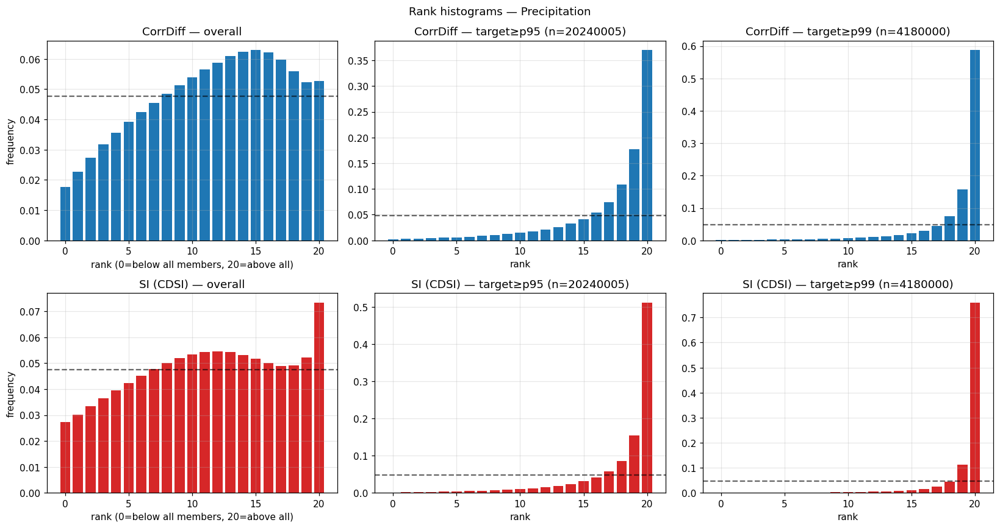

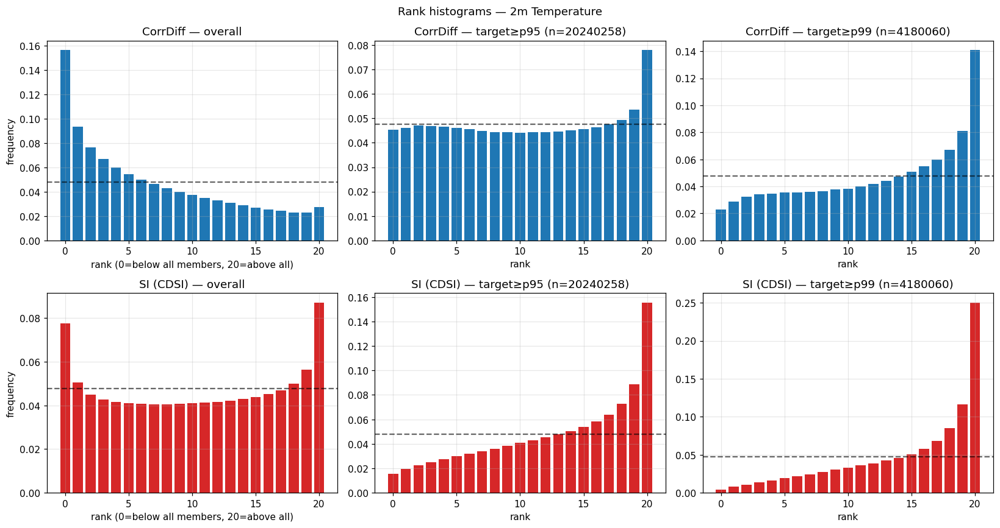

UNet: rank histogram not applicable (deterministic, single-member forecast) — omitted, not NaN-filled.


In [15]:
def rank_histograms_for(var: str, exp: str, percentiles: List[float] = PERCENTILES, n_members: int = N_MEMBERS):
    """Overall + per-percentile extreme-conditioned rank histograms, computed in a single streaming pass."""
    thr_flats = {p: THRESH_PERGRID[var][p].reshape(-1) for p in percentiles}
    overall_hist = np.zeros(n_members + 1, dtype=np.int64)
    extreme_hists = {p: np.zeros(n_members + 1, dtype=np.int64) for p in percentiles}
    n_extreme_cells = {p: 0 for p in percentiles}
    n_days = 0
    for _t, target_day, members_day in iter_ensemble_day(ROOT, exp, var, desc=f"rank-hist {exp}/{var}"):
        ranks = np.sum(members_day < target_day[None, :], axis=0)
        overall_hist += np.bincount(ranks, minlength=n_members + 1)
        for p in percentiles:
            mask = target_day >= thr_flats[p]
            if mask.any():
                extreme_hists[p] += np.bincount(ranks[mask], minlength=n_members + 1)
                n_extreme_cells[p] += int(mask.sum())
        n_days += 1
    return overall_hist, extreme_hists, n_days, n_extreme_cells


RANK_HISTS = {}
combos = [(var, exp) for var in VARIABLES for exp in ENSEMBLE_MODELS]
for var, exp in tqdm(combos, desc="rank histograms"):
    RANK_HISTS[(exp, var)] = rank_histograms_for(var, exp)
    print(f"  {exp} / {var}: streamed {RANK_HISTS[(exp, var)][2]} days")

for var in VARIABLES:
    fig, axes = plt.subplots(len(ENSEMBLE_MODELS), 1 + len(PERCENTILES),
                              figsize=(5 * (1 + len(PERCENTILES)), 4 * len(ENSEMBLE_MODELS)), squeeze=False)
    ranks_x = np.arange(N_MEMBERS + 1)
    uniform_ref = 1.0 / (N_MEMBERS + 1)
    for i, exp in enumerate(ENSEMBLE_MODELS):
        overall_hist, extreme_hists, n_days, n_extreme_cells = RANK_HISTS[(exp, var)]
        ax = axes[i][0]
        ax.bar(ranks_x, overall_hist / overall_hist.sum(), color=MODEL_COLORS[exp])
        ax.axhline(uniform_ref, ls="--", color="k", alpha=0.6)
        ax.set_title(f"{MODEL_LABELS[exp]} — overall")
        ax.set_xlabel("rank (0=below all members, 20=above all)"); ax.set_ylabel("frequency")
        for j, p in enumerate(PERCENTILES):
            ax2 = axes[i][1 + j]
            h = extreme_hists[p]
            total = h.sum()
            if total > 0:
                ax2.bar(ranks_x, h / total, color=MODEL_COLORS[exp])
            ax2.axhline(uniform_ref, ls="--", color="k", alpha=0.6)
            ax2.set_title(f"{MODEL_LABELS[exp]} — target≥p{p} (n={n_extreme_cells[p]})")
            ax2.set_xlabel("rank")
    fig.suptitle(f"Rank histograms — {VAR_LONGNAME[var]}")
    plt.tight_layout()
    savefig(fig, f"rank_histogram_{var}")
    plt.show()

print("UNet: rank histogram not applicable (deterministic, single-member forecast) — omitted, not NaN-filled.")


## 8. PDF / tail analysis for low-likelihood, high-impact events

This section directly addresses the reviewers' request for "an analysis of the PDF tail." We pool each model's ensemble-mean field (and target) over the full domain and test period into 1-D arrays and examine four complementary views of the upper tail:

1. **Log-scale empirical PDF/histogram** — linear-scale histograms visually compress the tail into a sliver near zero; a log-scale y-axis reveals whether a model's tail decays faster or slower than reality even when the bulk of the distribution looks identical.
2. **Empirical exceedance probability (1 − CDF), log-log** — for each value $x$, the probability of exceeding $x$; this is the classical "how rare is this" plot for extremes, and directly visualizes the "low-likelihood/high-impact" framing reviewers used.
3. **Q-Q plot** (model quantile vs. target quantile) — the standard distributional-comparison diagnostic; points on the 1:1 line mean the model reproduces the target distribution at that quantile, and systematic curvature immediately reveals whether a model's tail is too light or too heavy, and at which quantile the divergence starts.
4. **Peaks-Over-Threshold Generalized Pareto Distribution (GPD) fit** — the Pickands–Balkema–de Haan theorem guarantees that, for a sufficiently high threshold, exceedances over that threshold are asymptotically GPD-distributed *regardless of the parent distribution*. This is the statistically principled way (rather than eyeballing a couple of quantiles) to characterize a model's tail behavior: the fitted **shape parameter** $\xi$ controls how heavy the tail is ($\xi>0$ = heavy/unbounded tail, $\xi<0$ = bounded tail, $\xi=0$ = exponential decay), and the **scale parameter** $\sigma$ controls the spread of exceedances. Comparing target vs. model $(\xi, \sigma)$ answers "does this model's extreme-event distribution match reality's" far more rigorously than comparing a single Q99 number.

**Precipitation's zero point-mass.** Daily precipitation has a large point mass at exactly 0 (dry days), which breaks a log-x axis. We report the dry-day fraction as a separate number for each model/target rather than forcing zero onto a log scale, and restrict the log-PDF/exceedance/GPD analysis to positive-precipitation values.

In [16]:
def positive_if_pr(var: str, arr: np.ndarray) -> np.ndarray:
    """Precip has a large zero point-mass that breaks log-scale tail analysis; exclude it there."""
    return arr[arr > 0] if var == "pr" else arr


# Accumulators filled by the per-variable loop below (kept small — scalars/parameters, not full arrays)
dry_rows_by_var: Dict[str, Dict[str, float]] = {}
GPD_RESULTS: Dict[Tuple[str, str], Tuple[float, float, int]] = {}  # (name, var) -> (shape, scale, n_exceedances)
print("Section 8 helpers ready — data for each variable is loaded, used, and freed inside the loop below "
      "(see memory note in Section 3), one variable at a time.")


Section 8 helpers ready — data for each variable is loaded, used, and freed inside the loop below (see memory note in Section 3), one variable at a time.


PDF/tail analysis: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: GPD fits:   0%|          | 0/4 [00:00<?, ?it/s]

  pr: GPD fits:  25%|██▌       | 1/4 [00:01<00:03,  1.19s/it]

  pr: GPD fits:  50%|█████     | 2/4 [00:02<00:02,  1.08s/it]

  pr: GPD fits:  75%|███████▌  | 3/4 [00:03<00:01,  1.09s/it]

  pr: GPD fits: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]

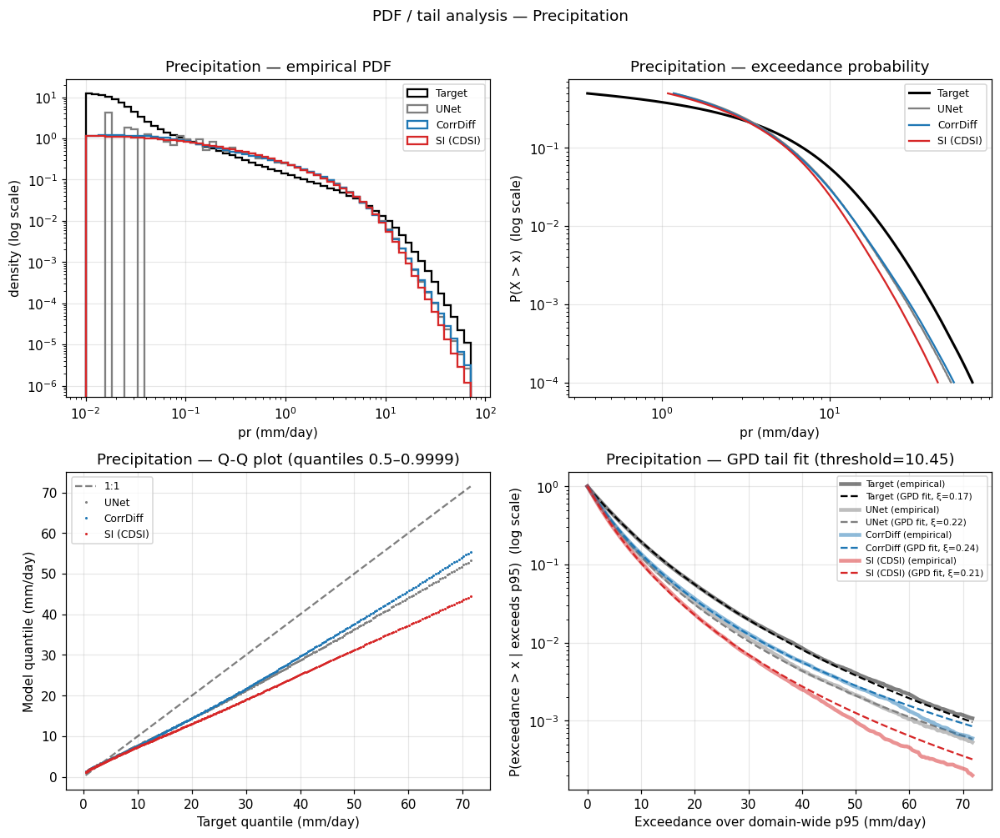

PDF/tail analysis: variables:  50%|█████     | 1/2 [01:37<01:37, 97.76s/it]

  tas: GPD fits:   0%|          | 0/4 [00:00<?, ?it/s]

  tas: GPD fits:  25%|██▌       | 1/4 [00:01<00:03,  1.07s/it]

  tas: GPD fits:  50%|█████     | 2/4 [00:02<00:02,  1.07s/it]

  tas: GPD fits:  75%|███████▌  | 3/4 [00:03<00:01,  1.22s/it]

  tas: GPD fits: 100%|██████████| 4/4 [00:04<00:00,  1.16s/it]

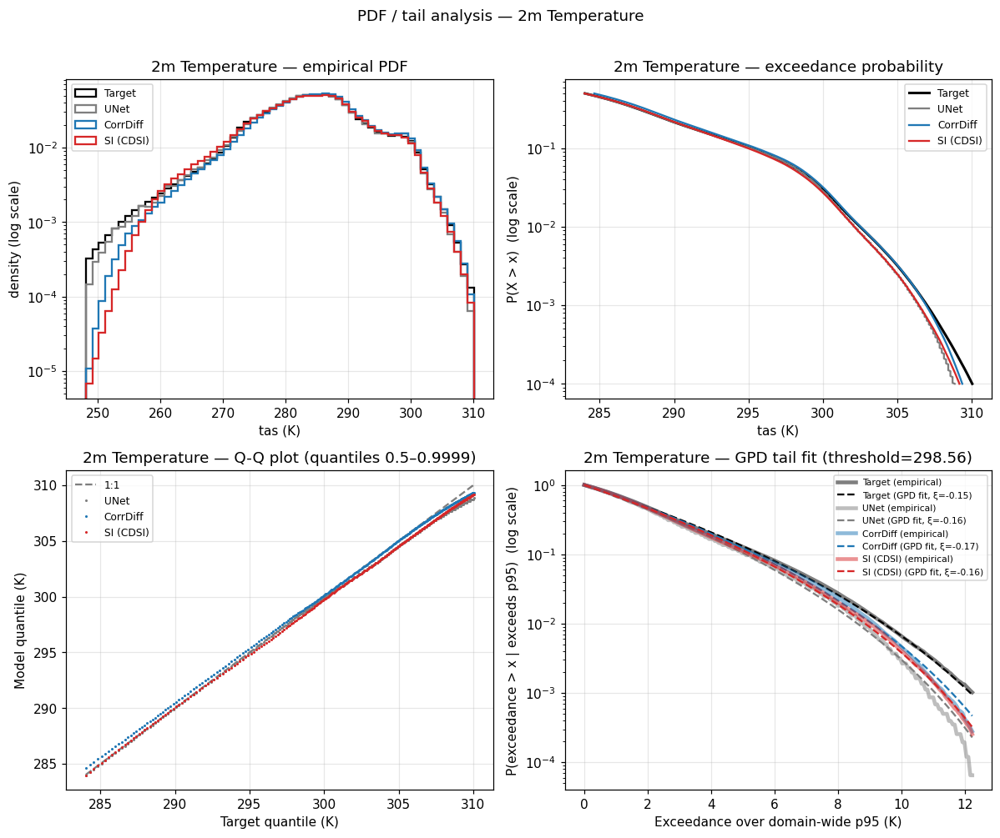

PDF/tail analysis: variables: 100%|██████████| 2/2 [03:10<00:00, 94.88s/it]

PDF/tail analysis: variables: 100%|██████████| 2/2 [03:10<00:00, 95.31s/it]

Precipitation dry-day / non-positive fraction:


,dry_or_nonpositive_fraction
Target,0.034145
UNet,0.052642
CorrDiff,0.064733
SI (CDSI),0.074140


shape_xi  scale_sigma  n_exceedances
variable series                                         
pr       Target     0.173528     5.322649       20063998
         UNet       0.219447     3.822712       10475774
         CorrDiff   0.235292     3.943420       10147098
         SI (CDSI)  0.206471     3.475160        8170268
tas      Target    -0.153882     2.862910       20064000
         UNet      -0.158105     2.634484       19931210
         CorrDiff  -0.165364     2.815824       21490420
         SI (CDSI) -0.164248     2.741729       18484728

In [17]:
# Dense-near-1 quantile grid (0.5 -> 0.9999) shared by the exceedance and Q-Q plots
Q_LEVELS = np.sort(1 - np.logspace(-4, np.log10(0.5), 300))
GPD_RNG_SEED = 0


def empirical_survival(sample: np.ndarray, x_grid: np.ndarray) -> np.ndarray:
    s = np.sort(sample)
    idx = np.searchsorted(s, x_grid, side="right")
    return 1.0 - idx / s.size


for var in tqdm(VARIABLES, desc="PDF/tail analysis: variables"):
    # Load target once + each model's ensemble mean once for this variable; pooled_* are numpy views into
    # these arrays' buffers (via .ravel()), so the buffers stay alive exactly as long as pooled_* is held,
    # regardless of whether the xr.DataArray wrapper itself is deleted right after.
    target_da = load_full_array(ROOT, EXPERIMENTS[0], var, "target")
    pooled_target = target_da.values.ravel()
    del target_da

    pooled_pred = {}
    for exp in EXPERIMENTS:
        pred_da = load_full_array(ROOT, exp, var, "ensemble_mean")
        pooled_pred[exp] = pred_da.values.ravel()
        del pred_da

    if var == "pr":
        dry_rows_by_var["pr"] = {"Target": float(np.mean(pooled_target <= 0))}
        for exp in EXPERIMENTS:
            dry_rows_by_var["pr"][MODEL_LABELS[exp]] = float(np.mean(pooled_pred[exp] <= 0))

    pos_target = positive_if_pr(var, pooled_target)
    pos_pred = {exp: positive_if_pr(var, pooled_pred[exp]) for exp in EXPERIMENTS}
    series = [("Target", pos_target, "black")] + [(MODEL_LABELS[exp], pos_pred[exp], MODEL_COLORS[exp]) for exp in EXPERIMENTS]

    target_q = np.quantile(pos_target, Q_LEVELS)
    pred_q = {exp: np.quantile(pos_pred[exp], Q_LEVELS) for exp in EXPERIMENTS}
    exceed_prob = 1 - Q_LEVELS

    gpd_threshold = THRESH_DOMAIN[var][95]

    fig, axes = plt.subplots(2, 2, figsize=(11, 9))

    # (1) log-scale empirical PDF (bin range from target+pred quantiles already computed above — avoids an
    # extra big concatenate of all series just to find a shared range)
    ax = axes[0, 0]
    lo = min(np.quantile(pos_target, 0.001), *(np.quantile(pos_pred[exp], 0.001) for exp in EXPERIMENTS))
    hi = max(np.quantile(pos_target, 0.9999), *(np.quantile(pos_pred[exp], 0.9999) for exp in EXPERIMENTS))
    if var == "pr":
        bins = np.logspace(np.log10(max(lo, 1e-2)), np.log10(hi), 60)
    else:
        bins = np.linspace(lo, hi, 60)
    for name, arr, color in series:
        ax.hist(arr, bins=bins, density=True, histtype="step", label=name, color=color, linewidth=1.5)
    ax.set_yscale("log")
    if var == "pr":
        ax.set_xscale("log")
    ax.set_xlabel(f"{var} ({VAR_UNITS[var]})"); ax.set_ylabel("density (log scale)")
    ax.set_title(f"{VAR_LONGNAME[var]} — empirical PDF")
    ax.legend(fontsize=8)

    # (2) exceedance probability (1 - CDF), log-log (or log-y for tas)
    ax = axes[0, 1]
    ax.plot(target_q, exceed_prob, color="black", label="Target", linewidth=2)
    for exp in EXPERIMENTS:
        ax.plot(pred_q[exp], exceed_prob, color=MODEL_COLORS[exp], label=MODEL_LABELS[exp])
    ax.set_yscale("log")
    if var == "pr":
        ax.set_xscale("log")
    ax.set_xlabel(f"{var} ({VAR_UNITS[var]})"); ax.set_ylabel("P(X > x)  (log scale)")
    ax.set_title(f"{VAR_LONGNAME[var]} — exceedance probability")
    ax.legend(fontsize=8)

    # (3) Q-Q plot: model quantile vs target quantile
    ax = axes[1, 0]
    lims = [target_q.min(), target_q.max()]
    ax.plot(lims, lims, "k--", alpha=0.5, label="1:1")
    for exp in EXPERIMENTS:
        ax.plot(target_q, pred_q[exp], color=MODEL_COLORS[exp], label=MODEL_LABELS[exp], marker=".", markersize=2, linestyle="none")
    ax.set_xlabel(f"Target quantile ({VAR_UNITS[var]})"); ax.set_ylabel(f"Model quantile ({VAR_UNITS[var]})")
    ax.set_title(f"{VAR_LONGNAME[var]} — Q-Q plot (quantiles 0.5–0.9999)")
    ax.legend(fontsize=8)

    # (4) GPD/POT fit: fitted vs. empirical conditional survival function of exceedances over domain-wide p95
    ax = axes[1, 1]
    x_grid = np.linspace(0, np.quantile(pos_target[pos_target > gpd_threshold] - gpd_threshold, 0.999), 200) \
        if np.any(pos_target > gpd_threshold) else np.linspace(0, 1, 200)
    rng = np.random.default_rng(GPD_RNG_SEED)
    for name, arr, color in tqdm(series, desc=f"  {var}: GPD fits", leave=False):
        shape, scale, exceedances = genpareto_tail_fit(arr, gpd_threshold, seed=GPD_RNG_SEED)
        GPD_RESULTS[(name, var)] = (shape, scale, exceedances.size)
        if exceedances.size < 30:
            continue
        plot_sample = exceedances if exceedances.size <= 200_000 else rng.choice(exceedances, 200_000, replace=False)
        emp_surv = empirical_survival(plot_sample, x_grid)
        ax.plot(x_grid, emp_surv, color=color, alpha=0.5, linewidth=3, label=f"{name} (empirical)")
        fitted_surv = sstats.genpareto.sf(x_grid, shape, loc=0, scale=scale)
        ax.plot(x_grid, fitted_surv, color=color, linestyle="--", linewidth=1.5, label=f"{name} (GPD fit, ξ={shape:.2f})")
    ax.set_yscale("log")
    ax.set_xlabel(f"Exceedance over domain-wide p95 ({VAR_UNITS[var]})")
    ax.set_ylabel("P(exceedance > x | exceeds p95)  (log scale)")
    ax.set_title(f"{VAR_LONGNAME[var]} — GPD tail fit (threshold={gpd_threshold:.2f})")
    ax.legend(fontsize=7)

    fig.suptitle(f"PDF / tail analysis — {VAR_LONGNAME[var]}", y=1.01)
    plt.tight_layout()
    savefig(fig, f"pdf_tail_analysis_{var}")
    plt.show()

    del pooled_target, pooled_pred, pos_target, pos_pred, target_q, pred_q
    gc.collect()

dry_day_df = pd.DataFrame.from_dict(dry_rows_by_var["pr"], orient="index", columns=["dry_or_nonpositive_fraction"])
save_table(dry_day_df, "pr_dry_day_fraction",
           caption="Fraction of (day, gridcell) pairs with pr <= 0 (dry days / non-positive predictions).",
           label="tab:dry_day")
print("Precipitation dry-day / non-positive fraction:")
display(dry_day_df)

gpd_df = pd.DataFrame(
    [{"variable": var, "series": name, "shape_xi": s, "scale_sigma": sc, "n_exceedances": n}
     for (name, var), (s, sc, n) in GPD_RESULTS.items()]
).set_index(["variable", "series"])
save_table(gpd_df, "gpd_tail_fit", caption="GPD (Peaks-Over-Threshold) fit parameters, domain-wide 95th-percentile threshold.",
           label="tab:gpd")
gpd_df


## 9. Extended percentile-conditional error metrics

**How this differs from the old `rmse_for_percentiles`.** `analysis/metrics.ipynb`'s existing conditional-RMSE analysis bucketed entire *days* by whether that day's domain-mean/median truth exceeded a percentile of the daily-mean series. That still includes plenty of grid cells having an ordinary day even on a "wet day" overall. Here we instead mask individual **(day, gridcell) pairs** directly against the per-gridcell threshold map from Section 4 — i.e. exactly the grid-cell-days that are locally extreme, regardless of what the rest of the domain is doing that day. This isolates model skill precisely on the events the reviewers care about.

**Metrics.** Conditional RMSE and bias (all three models, from the ensemble mean) and conditional CRPS (SI/CorrDiff, computed via a masked streaming pass; UNet's conditional CRPS degenerates to conditional MAE, reported with a footnote). CRPS is accumulated as a single sum-of-contributions divided by total masked-cell count across all days (not a mean of daily conditional means), since the number of extreme cells varies a lot day to day and a small handful of extreme cells on one day shouldn't be weighted the same as a widespread extreme event on another.

**Why this is the number reviewers will scrutinize most.** It is the most direct test of the claim "SI/CDSI produces better predictions especially for extreme events": comparing conditional RMSE/CRPS at p95/p99 against the unconditional values from Section 3 shows exactly how much each model's error inflates in the tail, and whether SI's inflation is smaller than the baselines'.

In [18]:
def conditional_mae(pred: xr.DataArray, target: xr.DataArray, threshold_map: np.ndarray) -> Tuple[float, int]:
    """Deterministic analogue of conditional_crps_streaming (CRPS -> MAE for a single member), for UNet."""
    tvals, pvals = target.values, pred.values
    mask = tvals >= threshold_map[None, :, :]
    if not mask.any():
        return float("nan"), 0
    return float(np.mean(np.abs(pvals[mask] - tvals[mask]))), int(mask.sum())


cond_rows = []
for var in tqdm(VARIABLES, desc="conditional metrics: variables"):
    for exp in tqdm(EXPERIMENTS, desc=f"  {var}: experiments", leave=False):
        pred, target = load_aligned_pair(ROOT, exp, var)
        for p in PERCENTILES:
            thr_map = THRESH_PERGRID[var][p]
            thr_flat = thr_map.reshape(-1)
            rmse_c, bias_c, n_c = conditional_rmse_bias(pred, target, thr_map)
            if has_ensemble(exp):
                crps_c, _ = conditional_crps_streaming(ROOT, exp, var, thr_flat)
                crps_note = ""
            else:
                crps_c, _ = conditional_mae(pred, target, thr_map)
                crps_note = "*MAE (deterministic)"
            unconditional_rmse = baseline_df.loc[(var, MODEL_LABELS[exp]), "RMSE"]
            cond_rows.append({
                "variable": var, "percentile": p, "experiment": MODEL_LABELS[exp],
                "cond_RMSE": rmse_c, "cond_Bias": bias_c, "cond_CRPS": crps_c, "CRPS_note": crps_note,
                "n_extreme_cells": n_c, "RMSE_inflation": rmse_c / unconditional_rmse if unconditional_rmse > 0 else float("nan"),
            })
        del pred, target
    gc.collect()

cond_df = pd.DataFrame(cond_rows).set_index(["variable", "percentile", "experiment"])
COND_DIRECTIONS = {"cond_RMSE": "min", "cond_Bias": "abs_min", "cond_CRPS": "min", "RMSE_inflation": "min"}
save_styled_table(cond_df.drop(columns=["CRPS_note"]), "percentile_conditional_metrics", COND_DIRECTIONS,
                   caption="Percentile-conditional (per-gridcell) RMSE/Bias/CRPS and RMSE inflation factor vs. unconditional RMSE.",
                   label="tab:conditional")
style_best_second(cond_df, COND_DIRECTIONS)


conditional metrics: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:09<00:19,  9.81s/it]

test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/pr:   0%|          | 3/1824 [00:00<01:30, 20.09day/s]

test_CorrDiff_small_r1/pr:   0%|          | 6/1824 [00:00<01:42, 17.70day/s]

test_CorrDiff_small_r1/pr:   0%|          | 8/1824 [00:00<01:39, 18.17day/s]

test_CorrDiff_small_r1/pr:   1%|          | 11/1824 [00:00<01:33, 19.40day/s]

test_CorrDiff_small_r1/pr:   1%|          | 14/1824 [00:00<01:29, 20.28day/s]

test_CorrDiff_small_r1/pr:   1%|          | 17/1824 [00:00<01:55, 15.69day/s]

test_CorrDiff_small_r1/pr:   1%|          | 19/1824 [00:01<01:54, 15.79day/s]

test_CorrDiff_small_r1/pr:   1%|          | 22/1824 [00:01<01:43, 17.37day/s]

test_CorrDiff_small_r1/pr:   1%|▏         | 25/1824 [00:01<01:36, 18.57day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 28/1824 [00:01<01:32, 19.43day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 31/1824 [00:01<01:29, 19.98day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 34/1824 [00:01<01:27, 20.40day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 37/1824 [00:02<01:42, 17.49day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:36, 18.54day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:32, 19.28day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:30, 19.73day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:27, 20.22day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:26, 20.53day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 55/1824 [00:02<01:25, 20.78day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:24, 20.93day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:23, 21.07day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:23, 21.14day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:23, 21.10day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:23, 21.02day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 73/1824 [00:03<01:37, 18.03day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 76/1824 [00:03<01:32, 18.91day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:29, 19.59day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:26, 20.15day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:24, 20.56day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:23, 20.85day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:22, 21.07day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 94/1824 [00:04<01:21, 21.22day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 97/1824 [00:04<01:20, 21.37day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:20, 21.43day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:20, 21.46day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:19, 21.50day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:19, 21.51day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 112/1824 [00:05<01:34, 18.09day/s]

test_CorrDiff_small_r1/pr:   6%|▋         | 115/1824 [00:05<01:31, 18.76day/s]

test_CorrDiff_small_r1/pr:   6%|▋         | 118/1824 [00:05<01:27, 19.52day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 121/1824 [00:06<01:24, 20.12day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 124/1824 [00:06<01:22, 20.54day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 127/1824 [00:06<01:21, 20.83day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 130/1824 [00:06<01:21, 20.88day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 133/1824 [00:06<01:21, 20.76day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 136/1824 [00:06<01:21, 20.76day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 139/1824 [00:06<01:20, 21.02day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 142/1824 [00:07<01:19, 21.18day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 145/1824 [00:07<01:18, 21.33day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 148/1824 [00:07<01:18, 21.38day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 151/1824 [00:07<01:34, 17.79day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 154/1824 [00:07<01:28, 18.80day/s]

test_CorrDiff_small_r1/pr:   9%|▊         | 157/1824 [00:07<01:25, 19.51day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 160/1824 [00:08<01:23, 20.02day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 163/1824 [00:08<01:21, 20.30day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 166/1824 [00:08<01:20, 20.60day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 169/1824 [00:08<01:19, 20.81day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 172/1824 [00:08<01:18, 20.96day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 175/1824 [00:08<01:18, 21.08day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 178/1824 [00:08<01:17, 21.15day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 181/1824 [00:09<01:17, 21.20day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 184/1824 [00:09<01:17, 21.21day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 187/1824 [00:09<01:57, 13.91day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 190/1824 [00:09<01:45, 15.56day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 193/1824 [00:09<01:36, 16.95day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 196/1824 [00:09<01:29, 18.11day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 199/1824 [00:10<01:25, 19.02day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 202/1824 [00:10<01:23, 19.54day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 205/1824 [00:10<01:20, 20.10day/s]

test_CorrDiff_small_r1/pr:  11%|█▏        | 208/1824 [00:10<01:18, 20.57day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 211/1824 [00:10<01:17, 20.87day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 214/1824 [00:10<01:16, 21.06day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 217/1824 [00:10<01:15, 21.20day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 220/1824 [00:11<01:15, 21.19day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 223/1824 [00:11<01:15, 21.14day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 226/1824 [00:11<02:03, 12.94day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 229/1824 [00:11<01:48, 14.67day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 232/1824 [00:11<01:38, 16.17day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 235/1824 [00:12<01:31, 17.39day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 238/1824 [00:12<01:26, 18.36day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 241/1824 [00:12<01:22, 19.10day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 244/1824 [00:12<01:20, 19.65day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 247/1824 [00:12<01:18, 20.01day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 250/1824 [00:12<01:17, 20.21day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 253/1824 [00:12<01:16, 20.64day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 256/1824 [00:13<01:14, 20.94day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 259/1824 [00:13<01:14, 20.91day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 262/1824 [00:13<01:13, 21.13day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 265/1824 [00:13<01:45, 14.80day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 268/1824 [00:13<01:37, 15.92day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 271/1824 [00:14<01:30, 17.17day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 274/1824 [00:14<01:25, 18.20day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 277/1824 [00:14<01:21, 19.04day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 280/1824 [00:14<01:18, 19.59day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 283/1824 [00:14<01:17, 19.81day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 286/1824 [00:14<01:16, 20.06day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 289/1824 [00:14<01:15, 20.36day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 292/1824 [00:15<01:17, 19.82day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 295/1824 [00:15<01:15, 20.16day/s]

test_CorrDiff_small_r1/pr:  16%|█▋        | 298/1824 [00:15<01:16, 19.99day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 301/1824 [00:15<01:16, 20.03day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 304/1824 [00:15<01:51, 13.59day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 307/1824 [00:16<01:40, 15.11day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 309/1824 [00:16<01:34, 15.95day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 312/1824 [00:16<01:28, 17.13day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 314/1824 [00:16<01:26, 17.39day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 317/1824 [00:16<01:28, 17.04day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 320/1824 [00:16<01:22, 18.26day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 322/1824 [00:16<01:22, 18.29day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 325/1824 [00:16<01:18, 19.08day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 328/1824 [00:17<01:15, 19.76day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 331/1824 [00:17<01:13, 20.29day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 334/1824 [00:17<01:12, 20.69day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 337/1824 [00:17<01:11, 20.85day/s]

test_CorrDiff_small_r1/pr:  19%|█▊        | 340/1824 [00:17<01:46, 13.97day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 343/1824 [00:18<01:34, 15.62day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 346/1824 [00:18<01:26, 17.02day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 349/1824 [00:18<01:21, 18.02day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 352/1824 [00:18<01:17, 18.94day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 355/1824 [00:18<01:15, 19.36day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 358/1824 [00:18<01:13, 19.95day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 361/1824 [00:18<01:11, 20.41day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 364/1824 [00:19<01:10, 20.82day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 367/1824 [00:19<01:08, 21.13day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 370/1824 [00:19<01:08, 21.34day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 373/1824 [00:19<01:07, 21.45day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 376/1824 [00:19<01:07, 21.51day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 379/1824 [00:19<01:42, 14.09day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 382/1824 [00:20<01:31, 15.72day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 385/1824 [00:20<01:23, 17.13day/s]

test_CorrDiff_small_r1/pr:  21%|██▏       | 388/1824 [00:20<01:18, 18.29day/s]

test_CorrDiff_small_r1/pr:  21%|██▏       | 391/1824 [00:20<01:14, 19.16day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 394/1824 [00:20<01:13, 19.42day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 397/1824 [00:20<01:11, 20.05day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 400/1824 [00:20<01:09, 20.43day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 403/1824 [00:21<01:09, 20.30day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 406/1824 [00:21<01:08, 20.61day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 409/1824 [00:21<01:08, 20.64day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 412/1824 [00:21<01:07, 20.86day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 415/1824 [00:21<01:09, 20.15day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 418/1824 [00:22<01:48, 12.95day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 421/1824 [00:22<01:35, 14.67day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 424/1824 [00:22<01:26, 16.17day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 427/1824 [00:22<01:20, 17.41day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 430/1824 [00:22<01:15, 18.40day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 433/1824 [00:22<01:12, 19.18day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 436/1824 [00:22<01:10, 19.65day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 439/1824 [00:23<01:09, 20.07day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 442/1824 [00:23<01:14, 18.53day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 445/1824 [00:23<01:11, 19.34day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 448/1824 [00:23<01:09, 19.91day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 451/1824 [00:23<01:07, 20.32day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 454/1824 [00:24<01:35, 14.35day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 457/1824 [00:24<01:26, 15.89day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 460/1824 [00:24<01:19, 17.19day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 463/1824 [00:24<01:15, 18.09day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 466/1824 [00:24<01:11, 18.91day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 469/1824 [00:24<01:10, 19.21day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 472/1824 [00:24<01:08, 19.77day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 475/1824 [00:25<01:06, 20.19day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 478/1824 [00:25<01:05, 20.48day/s]

test_CorrDiff_small_r1/pr:  26%|██▋       | 481/1824 [00:25<01:04, 20.70day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 484/1824 [00:25<01:04, 20.81day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 487/1824 [00:25<01:03, 20.93day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 490/1824 [00:25<01:03, 21.04day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 493/1824 [00:26<01:34, 14.16day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 496/1824 [00:26<01:24, 15.78day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 499/1824 [00:26<01:17, 17.15day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 502/1824 [00:26<01:12, 18.28day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 505/1824 [00:26<01:08, 19.16day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 508/1824 [00:26<01:06, 19.81day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 511/1824 [00:26<01:04, 20.33day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 514/1824 [00:27<01:03, 20.69day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 517/1824 [00:27<01:02, 20.94day/s]

test_CorrDiff_small_r1/pr:  29%|██▊       | 520/1824 [00:27<01:01, 21.13day/s]

test_CorrDiff_small_r1/pr:  29%|██▊       | 523/1824 [00:27<01:01, 21.05day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 526/1824 [00:27<01:01, 21.19day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 529/1824 [00:27<01:00, 21.30day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 532/1824 [00:28<01:34, 13.64day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 535/1824 [00:28<01:24, 15.28day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 537/1824 [00:28<01:20, 16.03day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 540/1824 [00:28<01:13, 17.43day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 543/1824 [00:28<01:09, 18.49day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 546/1824 [00:28<01:06, 19.31day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 549/1824 [00:29<01:04, 19.70day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 552/1824 [00:29<01:03, 19.93day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 555/1824 [00:29<01:02, 20.29day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 558/1824 [00:29<01:01, 20.56day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 561/1824 [00:29<01:01, 20.40day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 564/1824 [00:29<01:00, 20.79day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 567/1824 [00:29<00:59, 21.08day/s]

test_CorrDiff_small_r1/pr:  31%|███▏      | 570/1824 [00:30<01:23, 15.06day/s]

test_CorrDiff_small_r1/pr:  31%|███▏      | 573/1824 [00:30<01:15, 16.60day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 576/1824 [00:30<01:10, 17.68day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 579/1824 [00:30<01:06, 18.71day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 582/1824 [00:30<01:03, 19.58day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 585/1824 [00:30<01:01, 20.25day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 588/1824 [00:31<00:59, 20.74day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 591/1824 [00:31<00:58, 21.12day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 594/1824 [00:31<00:57, 21.37day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 597/1824 [00:31<00:56, 21.56day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 600/1824 [00:31<00:56, 21.69day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 603/1824 [00:31<00:56, 21.76day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 606/1824 [00:31<00:56, 21.57day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 609/1824 [00:32<01:10, 17.29day/s]

test_CorrDiff_small_r1/pr:  34%|███▎      | 612/1824 [00:32<01:05, 18.48day/s]

test_CorrDiff_small_r1/pr:  34%|███▎      | 615/1824 [00:32<01:02, 19.39day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 618/1824 [00:32<00:59, 20.12day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 621/1824 [00:32<00:58, 20.63day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 624/1824 [00:32<00:57, 20.76day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 627/1824 [00:32<00:56, 21.07day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 630/1824 [00:33<00:56, 21.30day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 633/1824 [00:33<00:55, 21.44day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 636/1824 [00:33<00:55, 21.52day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 639/1824 [00:33<00:54, 21.63day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 642/1824 [00:33<00:56, 20.79day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 645/1824 [00:33<01:06, 17.76day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 648/1824 [00:34<01:02, 18.79day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 651/1824 [00:34<00:59, 19.57day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 654/1824 [00:34<00:58, 20.17day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 657/1824 [00:34<00:56, 20.58day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 660/1824 [00:34<00:55, 20.90day/s]

test_CorrDiff_small_r1/pr:  36%|███▋      | 663/1824 [00:34<00:55, 21.10day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 666/1824 [00:34<00:54, 21.29day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 669/1824 [00:35<00:53, 21.43day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 672/1824 [00:35<00:53, 21.55day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 675/1824 [00:35<00:53, 21.62day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 678/1824 [00:35<00:52, 21.66day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 681/1824 [00:35<00:52, 21.68day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 684/1824 [00:35<01:02, 18.33day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 687/1824 [00:35<00:59, 19.20day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 689/1824 [00:36<00:58, 19.27day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 692/1824 [00:36<00:56, 20.01day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 695/1824 [00:36<00:54, 20.54day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 698/1824 [00:36<00:53, 20.91day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 701/1824 [00:36<00:53, 21.13day/s]

test_CorrDiff_small_r1/pr:  39%|███▊      | 704/1824 [00:36<00:53, 21.00day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 707/1824 [00:36<00:52, 21.23day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 710/1824 [00:36<00:52, 21.39day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 713/1824 [00:37<00:51, 21.48day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 716/1824 [00:37<00:51, 21.48day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 719/1824 [00:37<00:51, 21.47day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 722/1824 [00:37<01:00, 18.35day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 724/1824 [00:37<00:59, 18.64day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 727/1824 [00:37<00:56, 19.54day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 730/1824 [00:38<00:54, 19.97day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 733/1824 [00:38<00:53, 20.47day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 736/1824 [00:38<00:52, 20.84day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 739/1824 [00:38<00:51, 21.05day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 742/1824 [00:38<00:51, 21.19day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 745/1824 [00:38<00:50, 21.34day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 748/1824 [00:38<00:50, 21.47day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 751/1824 [00:38<00:49, 21.49day/s]

test_CorrDiff_small_r1/pr:  41%|████▏     | 754/1824 [00:39<00:49, 21.49day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 757/1824 [00:39<00:49, 21.60day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 760/1824 [00:39<00:57, 18.49day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 763/1824 [00:39<00:55, 19.21day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 766/1824 [00:39<00:53, 19.68day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 769/1824 [00:39<00:51, 20.33day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 772/1824 [00:40<00:50, 20.81day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 775/1824 [00:40<00:49, 21.12day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 778/1824 [00:40<00:48, 21.39day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 781/1824 [00:40<00:48, 21.58day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 784/1824 [00:40<00:47, 21.69day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 787/1824 [00:40<00:47, 21.78day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 790/1824 [00:40<00:47, 21.85day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 793/1824 [00:40<00:47, 21.90day/s]

test_CorrDiff_small_r1/pr:  44%|████▎     | 796/1824 [00:41<00:46, 21.93day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 799/1824 [00:41<00:54, 18.74day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 802/1824 [00:41<00:52, 19.63day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 805/1824 [00:41<00:50, 20.19day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 808/1824 [00:41<00:49, 20.38day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 811/1824 [00:41<00:48, 20.84day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 814/1824 [00:42<00:47, 21.16day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 817/1824 [00:42<00:47, 21.42day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 820/1824 [00:42<00:46, 21.63day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 823/1824 [00:42<00:46, 21.72day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 826/1824 [00:42<00:45, 21.76day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 829/1824 [00:42<00:45, 21.86day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 832/1824 [00:42<00:45, 21.90day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 835/1824 [00:43<01:03, 15.49day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 838/1824 [00:43<00:58, 17.00day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 841/1824 [00:43<00:53, 18.26day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 844/1824 [00:43<00:50, 19.27day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 847/1824 [00:43<00:52, 18.71day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 850/1824 [00:43<00:50, 19.27day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 853/1824 [00:44<00:48, 20.01day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 856/1824 [00:44<00:47, 20.50day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 859/1824 [00:44<00:48, 19.72day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 862/1824 [00:44<00:47, 20.38day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 865/1824 [00:44<00:45, 20.87day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 868/1824 [00:44<00:45, 21.21day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 871/1824 [00:44<00:44, 21.38day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 874/1824 [00:45<01:03, 14.96day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 877/1824 [00:45<00:57, 16.53day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 880/1824 [00:45<00:52, 17.86day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 883/1824 [00:45<00:49, 18.93day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 886/1824 [00:45<00:47, 19.70day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 889/1824 [00:45<00:46, 20.27day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 892/1824 [00:46<00:45, 20.66day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 895/1824 [00:46<00:44, 20.94day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 898/1824 [00:46<00:43, 21.11day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 901/1824 [00:46<00:43, 21.22day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 904/1824 [00:46<00:43, 21.39day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 907/1824 [00:46<00:42, 21.52day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 910/1824 [00:46<00:42, 21.60day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 913/1824 [00:47<01:00, 15.01day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 916/1824 [00:47<00:54, 16.57day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 919/1824 [00:47<00:50, 17.78day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 922/1824 [00:47<00:48, 18.63day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 925/1824 [00:47<00:46, 19.48day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 928/1824 [00:47<00:44, 20.13day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 931/1824 [00:48<00:43, 20.64day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 934/1824 [00:48<00:42, 20.98day/s]

test_CorrDiff_small_r1/pr:  51%|█████▏    | 937/1824 [00:48<00:41, 21.25day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 940/1824 [00:48<00:41, 21.46day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 943/1824 [00:48<00:41, 21.15day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 946/1824 [00:48<00:41, 21.38day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 949/1824 [00:48<00:40, 21.52day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 952/1824 [00:49<01:00, 14.46day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 955/1824 [00:49<00:54, 16.08day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 958/1824 [00:49<00:49, 17.45day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 961/1824 [00:49<00:46, 18.61day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 964/1824 [00:49<00:44, 19.52day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 967/1824 [00:49<00:42, 20.20day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 970/1824 [00:50<00:41, 20.69day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 973/1824 [00:50<00:40, 21.00day/s]

test_CorrDiff_small_r1/pr:  54%|█████▎    | 976/1824 [00:50<00:39, 21.22day/s]

test_CorrDiff_small_r1/pr:  54%|█████▎    | 979/1824 [00:50<00:39, 21.33day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 982/1824 [00:50<00:40, 20.97day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 985/1824 [00:50<00:39, 21.17day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 988/1824 [00:51<00:59, 14.07day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 991/1824 [00:51<00:53, 15.66day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 994/1824 [00:51<00:48, 17.01day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 997/1824 [00:51<00:45, 18.10day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 1000/1824 [00:51<00:43, 18.93day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 1003/1824 [00:51<00:42, 19.40day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1006/1824 [00:52<00:40, 19.96day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1009/1824 [00:52<00:40, 20.36day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1012/1824 [00:52<00:39, 20.69day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1015/1824 [00:52<00:38, 20.93day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1018/1824 [00:52<00:38, 21.11day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1021/1824 [00:52<00:37, 21.23day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1024/1824 [00:52<00:37, 21.34day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1027/1824 [00:53<01:03, 12.63day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1030/1824 [00:53<00:55, 14.41day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1033/1824 [00:53<00:49, 15.97day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1036/1824 [00:53<00:45, 17.30day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1039/1824 [00:53<00:42, 18.36day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1042/1824 [00:54<00:40, 19.19day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1045/1824 [00:54<00:39, 19.80day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1048/1824 [00:54<00:38, 20.25day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1051/1824 [00:54<00:37, 20.65day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1054/1824 [00:54<00:36, 20.93day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1057/1824 [00:54<00:36, 20.87day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1060/1824 [00:54<00:36, 21.08day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1063/1824 [00:54<00:35, 21.22day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1066/1824 [00:55<00:50, 15.09day/s]

test_CorrDiff_small_r1/pr:  59%|█████▊    | 1068/1824 [00:55<00:48, 15.69day/s]

test_CorrDiff_small_r1/pr:  59%|█████▊    | 1071/1824 [00:55<00:43, 17.20day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1074/1824 [00:55<00:40, 18.41day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1077/1824 [00:55<00:38, 19.35day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1080/1824 [00:55<00:37, 20.05day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1083/1824 [00:56<00:36, 20.58day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1086/1824 [00:56<00:35, 20.90day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1089/1824 [00:56<00:35, 20.71day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1092/1824 [00:56<00:34, 21.00day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1095/1824 [00:56<00:37, 19.54day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1098/1824 [00:56<00:36, 20.10day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1101/1824 [00:56<00:35, 20.51day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1104/1824 [00:57<00:51, 13.99day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1107/1824 [00:57<00:45, 15.66day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1110/1824 [00:57<00:41, 17.09day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1113/1824 [00:57<00:38, 18.24day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1116/1824 [00:57<00:37, 18.68day/s]

test_CorrDiff_small_r1/pr:  61%|██████▏   | 1119/1824 [00:58<00:36, 19.47day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1122/1824 [00:58<00:34, 20.10day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1125/1824 [00:58<00:33, 20.62day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1128/1824 [00:58<00:33, 21.02day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1131/1824 [00:58<00:32, 21.29day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1134/1824 [00:58<00:32, 21.48day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1137/1824 [00:58<00:31, 21.63day/s]

test_CorrDiff_small_r1/pr:  62%|██████▎   | 1140/1824 [00:59<00:48, 14.09day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1143/1824 [00:59<00:43, 15.62day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1146/1824 [00:59<00:39, 17.00day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1149/1824 [00:59<00:37, 18.12day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1152/1824 [00:59<00:35, 19.02day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1155/1824 [00:59<00:34, 19.67day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1158/1824 [01:00<00:33, 20.18day/s]

test_CorrDiff_small_r1/pr:  64%|██████▎   | 1161/1824 [01:00<00:32, 20.56day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1164/1824 [01:00<00:32, 20.54day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1167/1824 [01:00<00:32, 20.18day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1170/1824 [01:00<00:31, 20.57day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1173/1824 [01:00<00:31, 20.90day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1176/1824 [01:00<00:30, 21.02day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1179/1824 [01:01<00:44, 14.38day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1182/1824 [01:01<00:40, 16.00day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1185/1824 [01:01<00:36, 17.29day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1188/1824 [01:01<00:34, 18.35day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1191/1824 [01:01<00:32, 19.22day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1194/1824 [01:02<00:31, 19.85day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1197/1824 [01:02<00:31, 20.01day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1200/1824 [01:02<00:30, 20.43day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1203/1824 [01:02<00:29, 20.81day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1206/1824 [01:02<00:29, 21.09day/s]

test_CorrDiff_small_r1/pr:  66%|██████▋   | 1209/1824 [01:02<00:28, 21.26day/s]

test_CorrDiff_small_r1/pr:  66%|██████▋   | 1212/1824 [01:02<00:28, 21.40day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1215/1824 [01:03<00:28, 21.48day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1218/1824 [01:03<00:41, 14.72day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1221/1824 [01:03<00:37, 16.28day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1224/1824 [01:03<00:34, 17.56day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1227/1824 [01:03<00:31, 18.67day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1230/1824 [01:03<00:31, 19.04day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1233/1824 [01:04<00:30, 19.57day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1236/1824 [01:04<00:29, 20.21day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1239/1824 [01:04<00:28, 20.69day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1242/1824 [01:04<00:27, 21.06day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1245/1824 [01:04<00:27, 20.80day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1248/1824 [01:04<00:27, 21.04day/s]

test_CorrDiff_small_r1/pr:  69%|██████▊   | 1251/1824 [01:04<00:26, 21.24day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1254/1824 [01:05<00:26, 21.36day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1257/1824 [01:05<00:36, 15.72day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1260/1824 [01:05<00:33, 17.05day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1262/1824 [01:05<00:31, 17.63day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1265/1824 [01:05<00:29, 18.78day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1268/1824 [01:05<00:28, 19.61day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1271/1824 [01:06<00:27, 20.25day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1274/1824 [01:06<00:26, 20.69day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1277/1824 [01:06<00:26, 21.02day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1280/1824 [01:06<00:25, 21.21day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1283/1824 [01:06<00:25, 21.25day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1286/1824 [01:06<00:25, 21.38day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1289/1824 [01:06<00:25, 21.13day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1292/1824 [01:06<00:24, 21.33day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1295/1824 [01:07<00:29, 17.98day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1298/1824 [01:07<00:27, 18.96day/s]

test_CorrDiff_small_r1/pr:  71%|███████▏  | 1301/1824 [01:07<00:26, 19.66day/s]

test_CorrDiff_small_r1/pr:  71%|███████▏  | 1304/1824 [01:07<00:25, 20.18day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1307/1824 [01:07<00:25, 20.57day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1310/1824 [01:07<00:24, 20.77day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1313/1824 [01:08<00:24, 20.75day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1316/1824 [01:08<00:24, 20.98day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1319/1824 [01:08<00:23, 21.16day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1322/1824 [01:08<00:23, 21.27day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1325/1824 [01:08<00:23, 21.39day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1328/1824 [01:08<00:23, 21.49day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1331/1824 [01:09<00:30, 16.22day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1334/1824 [01:09<00:27, 17.55day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1337/1824 [01:09<00:26, 18.56day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1340/1824 [01:09<00:27, 17.50day/s]

test_CorrDiff_small_r1/pr:  74%|███████▎  | 1343/1824 [01:09<00:25, 18.59day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1346/1824 [01:09<00:24, 19.42day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1349/1824 [01:09<00:23, 20.05day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1352/1824 [01:10<00:23, 20.16day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1355/1824 [01:10<00:22, 20.58day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1358/1824 [01:10<00:22, 20.85day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1361/1824 [01:10<00:21, 21.09day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1364/1824 [01:10<00:21, 21.24day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1367/1824 [01:10<00:22, 20.03day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1370/1824 [01:11<00:33, 13.41day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1373/1824 [01:11<00:29, 15.14day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1376/1824 [01:11<00:26, 16.66day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1379/1824 [01:11<00:24, 17.92day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1382/1824 [01:11<00:23, 18.88day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1385/1824 [01:11<00:22, 19.52day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1388/1824 [01:12<00:21, 20.11day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1391/1824 [01:12<00:21, 20.55day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1394/1824 [01:12<00:20, 20.83day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1397/1824 [01:12<00:20, 21.05day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1400/1824 [01:12<00:19, 21.23day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1403/1824 [01:12<00:19, 21.19day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1406/1824 [01:12<00:19, 21.09day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1409/1824 [01:13<00:29, 14.06day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1412/1824 [01:13<00:26, 15.74day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1415/1824 [01:13<00:23, 17.13day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1418/1824 [01:13<00:22, 18.31day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1421/1824 [01:13<00:20, 19.20day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1424/1824 [01:13<00:20, 19.87day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1427/1824 [01:14<00:19, 20.38day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1430/1824 [01:14<00:19, 20.72day/s]

test_CorrDiff_small_r1/pr:  79%|███████▊  | 1433/1824 [01:14<00:18, 20.99day/s]

test_CorrDiff_small_r1/pr:  79%|███████▊  | 1436/1824 [01:14<00:18, 20.78day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1439/1824 [01:14<00:18, 20.97day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1442/1824 [01:14<00:18, 21.10day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1445/1824 [01:15<00:25, 14.88day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1448/1824 [01:15<00:23, 16.32day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1451/1824 [01:15<00:21, 17.50day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1454/1824 [01:15<00:20, 18.34day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1456/1824 [01:15<00:19, 18.58day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1459/1824 [01:15<00:18, 19.31day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1462/1824 [01:15<00:18, 19.89day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1465/1824 [01:16<00:17, 20.33day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1468/1824 [01:16<00:17, 20.25day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1471/1824 [01:16<00:17, 20.24day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1474/1824 [01:16<00:17, 20.24day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1477/1824 [01:16<00:17, 20.27day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1480/1824 [01:16<00:16, 20.27day/s]

test_CorrDiff_small_r1/pr:  81%|████████▏ | 1483/1824 [01:16<00:16, 20.19day/s]

test_CorrDiff_small_r1/pr:  81%|████████▏ | 1486/1824 [01:17<00:22, 15.34day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1489/1824 [01:17<00:20, 16.69day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1492/1824 [01:17<00:18, 17.90day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1495/1824 [01:17<00:17, 18.88day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1497/1824 [01:17<00:17, 18.96day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1500/1824 [01:17<00:16, 19.66day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1503/1824 [01:18<00:15, 20.13day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1506/1824 [01:18<00:15, 20.38day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1509/1824 [01:18<00:15, 20.70day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1512/1824 [01:18<00:14, 20.93day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1515/1824 [01:18<00:14, 21.04day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1518/1824 [01:18<00:14, 21.21day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1521/1824 [01:18<00:14, 21.29day/s]

test_CorrDiff_small_r1/pr:  84%|████████▎ | 1524/1824 [01:19<00:20, 14.85day/s]

test_CorrDiff_small_r1/pr:  84%|████████▎ | 1527/1824 [01:19<00:18, 16.41day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1530/1824 [01:19<00:16, 17.69day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1532/1824 [01:19<00:16, 17.57day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1535/1824 [01:19<00:15, 18.75day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1538/1824 [01:19<00:14, 19.62day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1541/1824 [01:20<00:13, 20.25day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1544/1824 [01:20<00:13, 20.70day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1547/1824 [01:20<00:13, 21.03day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1550/1824 [01:20<00:12, 21.22day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1553/1824 [01:20<00:12, 21.36day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1556/1824 [01:20<00:12, 21.40day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1559/1824 [01:20<00:12, 21.40day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1562/1824 [01:21<00:17, 14.96day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1565/1824 [01:21<00:15, 16.49day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1568/1824 [01:21<00:14, 17.80day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1571/1824 [01:21<00:13, 18.82day/s]

test_CorrDiff_small_r1/pr:  86%|████████▋ | 1574/1824 [01:21<00:12, 19.59day/s]

test_CorrDiff_small_r1/pr:  86%|████████▋ | 1577/1824 [01:21<00:12, 20.05day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1580/1824 [01:22<00:12, 20.24day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1583/1824 [01:22<00:11, 20.60day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1586/1824 [01:22<00:11, 20.89day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1589/1824 [01:22<00:11, 20.34day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1592/1824 [01:22<00:11, 20.71day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1595/1824 [01:22<00:10, 20.98day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1598/1824 [01:23<00:15, 14.88day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1601/1824 [01:23<00:13, 16.43day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1604/1824 [01:23<00:12, 17.74day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1607/1824 [01:23<00:11, 18.77day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1610/1824 [01:23<00:11, 19.21day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1613/1824 [01:23<00:10, 19.89day/s]

test_CorrDiff_small_r1/pr:  89%|████████▊ | 1616/1824 [01:23<00:10, 20.41day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1619/1824 [01:24<00:09, 20.79day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1622/1824 [01:24<00:09, 21.00day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1625/1824 [01:24<00:09, 21.21day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1628/1824 [01:24<00:09, 21.12day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1631/1824 [01:24<00:09, 21.27day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1634/1824 [01:24<00:08, 21.42day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1637/1824 [01:25<00:12, 14.68day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1640/1824 [01:25<00:11, 16.24day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1643/1824 [01:25<00:10, 17.58day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1646/1824 [01:25<00:09, 18.64day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1649/1824 [01:25<00:08, 19.46day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1652/1824 [01:25<00:08, 20.10day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1655/1824 [01:26<00:08, 20.54day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1658/1824 [01:26<00:07, 20.88day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1661/1824 [01:26<00:07, 21.12day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1664/1824 [01:26<00:07, 21.27day/s]

test_CorrDiff_small_r1/pr:  91%|█████████▏| 1667/1824 [01:26<00:07, 21.42day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1670/1824 [01:26<00:07, 21.51day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1673/1824 [01:26<00:06, 21.58day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1676/1824 [01:27<00:10, 14.60day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1679/1824 [01:27<00:08, 16.13day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1682/1824 [01:27<00:08, 17.45day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1685/1824 [01:27<00:07, 18.54day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1688/1824 [01:27<00:07, 19.39day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1691/1824 [01:27<00:06, 20.01day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1694/1824 [01:28<00:06, 20.50day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1697/1824 [01:28<00:06, 20.85day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1700/1824 [01:28<00:05, 21.09day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1703/1824 [01:28<00:05, 21.29day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▎| 1706/1824 [01:28<00:05, 21.45day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▎| 1709/1824 [01:28<00:05, 21.55day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1712/1824 [01:29<00:07, 14.85day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1715/1824 [01:29<00:06, 16.38day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1718/1824 [01:29<00:06, 17.65day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1721/1824 [01:29<00:05, 18.68day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1724/1824 [01:29<00:05, 19.50day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1727/1824 [01:29<00:04, 20.12day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1730/1824 [01:29<00:04, 20.56day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1733/1824 [01:30<00:04, 20.89day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1736/1824 [01:30<00:04, 21.15day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1739/1824 [01:30<00:04, 21.20day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1742/1824 [01:30<00:03, 21.31day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1745/1824 [01:30<00:03, 21.41day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1748/1824 [01:30<00:03, 21.47day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1751/1824 [01:31<00:04, 14.71day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1754/1824 [01:31<00:04, 16.28day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▋| 1757/1824 [01:31<00:03, 17.62day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▋| 1760/1824 [01:31<00:03, 18.71day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1763/1824 [01:31<00:03, 19.56day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1766/1824 [01:31<00:02, 19.74day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1769/1824 [01:31<00:02, 20.22day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1772/1824 [01:32<00:02, 20.58day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1775/1824 [01:32<00:02, 20.87day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1778/1824 [01:32<00:02, 21.00day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1781/1824 [01:32<00:02, 21.14day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1784/1824 [01:32<00:01, 21.27day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1787/1824 [01:32<00:01, 21.38day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1790/1824 [01:32<00:01, 21.44day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1793/1824 [01:33<00:01, 21.39day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1796/1824 [01:33<00:01, 21.42day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▊| 1799/1824 [01:33<00:01, 21.45day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1802/1824 [01:33<00:01, 21.46day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1805/1824 [01:33<00:00, 21.45day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1808/1824 [01:33<00:00, 21.46day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1811/1824 [01:33<00:00, 21.46day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1814/1824 [01:34<00:00, 21.43day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1817/1824 [01:34<00:00, 21.42day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1820/1824 [01:34<00:00, 21.42day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1823/1824 [01:34<00:00, 21.35day/s]

test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/pr:   0%|          | 3/1824 [00:00<01:25, 21.21day/s]

test_CorrDiff_small_r1/pr:   0%|          | 6/1824 [00:00<01:37, 18.66day/s]

test_CorrDiff_small_r1/pr:   0%|          | 9/1824 [00:00<01:31, 19.83day/s]

test_CorrDiff_small_r1/pr:   1%|          | 12/1824 [00:00<01:28, 20.40day/s]

test_CorrDiff_small_r1/pr:   1%|          | 15/1824 [00:01<02:32, 11.88day/s]

test_CorrDiff_small_r1/pr:   1%|          | 18/1824 [00:01<02:09, 14.00day/s]

test_CorrDiff_small_r1/pr:   1%|          | 20/1824 [00:01<02:03, 14.55day/s]

test_CorrDiff_small_r1/pr:   1%|▏         | 23/1824 [00:01<01:49, 16.43day/s]

test_CorrDiff_small_r1/pr:   1%|▏         | 26/1824 [00:01<01:41, 17.80day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 29/1824 [00:01<01:35, 18.81day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 32/1824 [00:01<01:31, 19.53day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 35/1824 [00:02<02:10, 13.69day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 38/1824 [00:02<01:55, 15.44day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 41/1824 [00:02<01:45, 16.94day/s]

test_CorrDiff_small_r1/pr:   2%|▏         | 44/1824 [00:02<01:37, 18.17day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 47/1824 [00:02<01:33, 19.05day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 50/1824 [00:02<01:29, 19.76day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 53/1824 [00:03<01:27, 20.29day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 56/1824 [00:03<01:25, 20.74day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 59/1824 [00:03<01:23, 21.04day/s]

test_CorrDiff_small_r1/pr:   3%|▎         | 62/1824 [00:03<01:23, 21.22day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 65/1824 [00:03<01:22, 21.40day/s]

test_CorrDiff_small_r1/pr:   4%|▎         | 68/1824 [00:03<01:21, 21.50day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 71/1824 [00:03<01:21, 21.56day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 74/1824 [00:04<01:59, 14.70day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 77/1824 [00:04<01:47, 16.25day/s]

test_CorrDiff_small_r1/pr:   4%|▍         | 80/1824 [00:04<01:39, 17.56day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 83/1824 [00:04<01:33, 18.60day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 86/1824 [00:04<01:29, 19.37day/s]

test_CorrDiff_small_r1/pr:   5%|▍         | 89/1824 [00:04<01:26, 19.98day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 92/1824 [00:05<01:24, 20.42day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 95/1824 [00:05<01:23, 20.77day/s]

test_CorrDiff_small_r1/pr:   5%|▌         | 98/1824 [00:05<01:22, 20.98day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 101/1824 [00:05<01:21, 21.07day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 104/1824 [00:05<01:21, 21.11day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 107/1824 [00:05<01:21, 21.15day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 110/1824 [00:05<01:20, 21.20day/s]

test_CorrDiff_small_r1/pr:   6%|▌         | 113/1824 [00:06<02:12, 12.95day/s]

test_CorrDiff_small_r1/pr:   6%|▋         | 116/1824 [00:06<01:56, 14.69day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 119/1824 [00:06<01:45, 16.19day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 122/1824 [00:06<01:37, 17.49day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 125/1824 [00:06<01:31, 18.47day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 128/1824 [00:07<01:27, 19.28day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 131/1824 [00:07<01:25, 19.85day/s]

test_CorrDiff_small_r1/pr:   7%|▋         | 134/1824 [00:07<01:23, 20.26day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 137/1824 [00:07<01:22, 20.54day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 140/1824 [00:07<01:22, 20.32day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 143/1824 [00:07<01:21, 20.62day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 146/1824 [00:07<01:20, 20.85day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 149/1824 [00:08<02:02, 13.67day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 152/1824 [00:08<01:49, 15.31day/s]

test_CorrDiff_small_r1/pr:   8%|▊         | 155/1824 [00:08<01:39, 16.72day/s]

test_CorrDiff_small_r1/pr:   9%|▊         | 158/1824 [00:08<01:33, 17.86day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 161/1824 [00:08<01:28, 18.72day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 164/1824 [00:09<01:25, 19.43day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 167/1824 [00:09<01:23, 19.82day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 170/1824 [00:09<01:23, 19.88day/s]

test_CorrDiff_small_r1/pr:   9%|▉         | 173/1824 [00:09<01:21, 20.23day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 176/1824 [00:09<01:20, 20.50day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 179/1824 [00:09<01:19, 20.63day/s]

test_CorrDiff_small_r1/pr:  10%|▉         | 182/1824 [00:09<01:19, 20.78day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 185/1824 [00:10<01:18, 20.92day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 188/1824 [00:10<01:58, 13.82day/s]

test_CorrDiff_small_r1/pr:  10%|█         | 191/1824 [00:10<01:45, 15.49day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 193/1824 [00:10<01:40, 16.21day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 196/1824 [00:10<01:32, 17.62day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 199/1824 [00:10<01:26, 18.70day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 202/1824 [00:11<01:23, 19.44day/s]

test_CorrDiff_small_r1/pr:  11%|█         | 205/1824 [00:11<01:20, 20.00day/s]

test_CorrDiff_small_r1/pr:  11%|█▏        | 208/1824 [00:11<01:19, 20.45day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 211/1824 [00:11<01:17, 20.73day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 214/1824 [00:11<01:16, 20.94day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 217/1824 [00:11<01:17, 20.71day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 220/1824 [00:11<01:16, 20.95day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 223/1824 [00:12<01:15, 21.08day/s]

test_CorrDiff_small_r1/pr:  12%|█▏        | 226/1824 [00:12<01:53, 14.07day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 229/1824 [00:12<01:41, 15.64day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 232/1824 [00:12<01:33, 16.99day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 235/1824 [00:12<01:27, 18.08day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 238/1824 [00:12<01:23, 18.91day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 241/1824 [00:13<01:20, 19.58day/s]

test_CorrDiff_small_r1/pr:  13%|█▎        | 244/1824 [00:13<01:18, 20.07day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 247/1824 [00:13<01:17, 20.45day/s]

test_CorrDiff_small_r1/pr:  14%|█▎        | 250/1824 [00:13<01:16, 20.69day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 253/1824 [00:13<01:15, 20.86day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 256/1824 [00:13<01:14, 20.99day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 259/1824 [00:13<01:14, 21.03day/s]

test_CorrDiff_small_r1/pr:  14%|█▍        | 262/1824 [00:14<01:14, 21.09day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 265/1824 [00:14<01:51, 14.01day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 268/1824 [00:14<01:39, 15.61day/s]

test_CorrDiff_small_r1/pr:  15%|█▍        | 271/1824 [00:14<01:31, 16.96day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 274/1824 [00:14<01:25, 18.07day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 277/1824 [00:15<01:21, 18.96day/s]

test_CorrDiff_small_r1/pr:  15%|█▌        | 280/1824 [00:15<01:18, 19.66day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 283/1824 [00:15<01:16, 20.14day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 286/1824 [00:15<01:14, 20.54day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 289/1824 [00:15<01:13, 20.81day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 292/1824 [00:15<01:13, 20.96day/s]

test_CorrDiff_small_r1/pr:  16%|█▌        | 295/1824 [00:15<01:12, 21.11day/s]

test_CorrDiff_small_r1/pr:  16%|█▋        | 298/1824 [00:16<01:12, 21.18day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 301/1824 [00:16<01:11, 21.26day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 304/1824 [00:16<01:43, 14.64day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 307/1824 [00:16<01:33, 16.16day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 310/1824 [00:16<01:26, 17.46day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 313/1824 [00:16<01:21, 18.48day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 316/1824 [00:17<01:18, 19.29day/s]

test_CorrDiff_small_r1/pr:  17%|█▋        | 319/1824 [00:17<01:15, 19.89day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 322/1824 [00:17<01:13, 20.30day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 325/1824 [00:17<01:12, 20.64day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 328/1824 [00:17<01:11, 20.86day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 331/1824 [00:17<01:11, 21.01day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 334/1824 [00:17<01:10, 21.06day/s]

test_CorrDiff_small_r1/pr:  18%|█▊        | 337/1824 [00:18<01:10, 21.18day/s]

test_CorrDiff_small_r1/pr:  19%|█▊        | 340/1824 [00:18<01:40, 14.70day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 343/1824 [00:18<01:31, 16.26day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 346/1824 [00:18<01:24, 17.58day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 349/1824 [00:18<01:19, 18.61day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 352/1824 [00:18<01:15, 19.41day/s]

test_CorrDiff_small_r1/pr:  19%|█▉        | 355/1824 [00:19<01:14, 19.75day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 358/1824 [00:19<01:12, 20.23day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 361/1824 [00:19<01:11, 20.53day/s]

test_CorrDiff_small_r1/pr:  20%|█▉        | 364/1824 [00:19<01:10, 20.76day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 367/1824 [00:19<01:11, 20.50day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 370/1824 [00:19<01:10, 20.76day/s]

test_CorrDiff_small_r1/pr:  20%|██        | 373/1824 [00:19<01:09, 20.92day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 376/1824 [00:20<01:08, 21.07day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 379/1824 [00:20<01:40, 14.40day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 382/1824 [00:20<01:30, 16.01day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 385/1824 [00:20<01:22, 17.40day/s]

test_CorrDiff_small_r1/pr:  21%|██        | 387/1824 [00:20<01:20, 17.81day/s]

test_CorrDiff_small_r1/pr:  21%|██▏       | 390/1824 [00:21<01:17, 18.60day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 393/1824 [00:21<01:14, 19.15day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 396/1824 [00:21<01:13, 19.49day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 399/1824 [00:21<01:11, 19.81day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 402/1824 [00:21<01:10, 20.04day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 405/1824 [00:21<01:09, 20.35day/s]

test_CorrDiff_small_r1/pr:  22%|██▏       | 408/1824 [00:21<01:08, 20.75day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 411/1824 [00:22<01:08, 20.64day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 414/1824 [00:22<01:07, 20.89day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 417/1824 [00:22<01:38, 14.35day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 420/1824 [00:22<01:28, 15.92day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 423/1824 [00:22<01:21, 17.20day/s]

test_CorrDiff_small_r1/pr:  23%|██▎       | 426/1824 [00:22<01:16, 18.24day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 429/1824 [00:23<01:13, 19.06day/s]

test_CorrDiff_small_r1/pr:  24%|██▎       | 432/1824 [00:23<01:10, 19.70day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 435/1824 [00:23<01:10, 19.76day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 438/1824 [00:23<01:08, 20.27day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 441/1824 [00:23<01:07, 20.63day/s]

test_CorrDiff_small_r1/pr:  24%|██▍       | 444/1824 [00:23<01:06, 20.83day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 447/1824 [00:23<01:05, 20.99day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 450/1824 [00:24<01:04, 21.14day/s]

test_CorrDiff_small_r1/pr:  25%|██▍       | 453/1824 [00:24<01:04, 21.22day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 456/1824 [00:24<01:43, 13.28day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 459/1824 [00:24<01:30, 15.01day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 462/1824 [00:24<01:22, 16.53day/s]

test_CorrDiff_small_r1/pr:  25%|██▌       | 465/1824 [00:25<01:16, 17.81day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 468/1824 [00:25<01:13, 18.54day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 471/1824 [00:25<01:10, 19.14day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 474/1824 [00:25<01:08, 19.85day/s]

test_CorrDiff_small_r1/pr:  26%|██▌       | 477/1824 [00:25<01:06, 20.36day/s]

test_CorrDiff_small_r1/pr:  26%|██▋       | 480/1824 [00:25<01:05, 20.61day/s]

test_CorrDiff_small_r1/pr:  26%|██▋       | 483/1824 [00:25<01:04, 20.80day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 486/1824 [00:26<01:03, 20.95day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 489/1824 [00:26<01:04, 20.63day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 492/1824 [00:26<01:33, 14.25day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 495/1824 [00:26<01:23, 15.84day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 498/1824 [00:26<01:17, 17.04day/s]

test_CorrDiff_small_r1/pr:  27%|██▋       | 501/1824 [00:26<01:12, 18.16day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 504/1824 [00:27<01:09, 19.03day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 507/1824 [00:27<01:06, 19.71day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 510/1824 [00:27<01:05, 20.20day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 513/1824 [00:27<01:05, 19.93day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 516/1824 [00:27<01:05, 20.00day/s]

test_CorrDiff_small_r1/pr:  28%|██▊       | 519/1824 [00:27<01:03, 20.41day/s]

test_CorrDiff_small_r1/pr:  29%|██▊       | 522/1824 [00:27<01:02, 20.72day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 525/1824 [00:28<01:02, 20.93day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 528/1824 [00:28<01:01, 21.05day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 531/1824 [00:28<01:28, 14.60day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 534/1824 [00:28<01:19, 16.18day/s]

test_CorrDiff_small_r1/pr:  29%|██▉       | 536/1824 [00:28<01:20, 16.06day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 539/1824 [00:29<01:13, 17.45day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 542/1824 [00:29<01:09, 18.57day/s]

test_CorrDiff_small_r1/pr:  30%|██▉       | 545/1824 [00:29<01:05, 19.38day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 548/1824 [00:29<01:03, 19.98day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 551/1824 [00:29<01:02, 20.46day/s]

test_CorrDiff_small_r1/pr:  30%|███       | 554/1824 [00:29<01:02, 20.46day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 557/1824 [00:29<01:01, 20.70day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 560/1824 [00:30<01:00, 20.84day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 563/1824 [00:30<01:00, 21.00day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 566/1824 [00:30<00:59, 21.16day/s]

test_CorrDiff_small_r1/pr:  31%|███       | 569/1824 [00:30<01:23, 14.96day/s]

test_CorrDiff_small_r1/pr:  31%|███▏      | 572/1824 [00:30<01:16, 16.45day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 575/1824 [00:30<01:10, 17.68day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 577/1824 [00:31<01:09, 17.98day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 580/1824 [00:31<01:05, 18.90day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 583/1824 [00:31<01:03, 19.55day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 586/1824 [00:31<01:01, 20.00day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 589/1824 [00:31<01:00, 20.32day/s]

test_CorrDiff_small_r1/pr:  32%|███▏      | 592/1824 [00:31<00:59, 20.57day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 595/1824 [00:31<00:59, 20.70day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 598/1824 [00:32<00:58, 20.83day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 601/1824 [00:32<00:58, 20.92day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 604/1824 [00:32<00:58, 21.00day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 607/1824 [00:32<01:23, 14.61day/s]

test_CorrDiff_small_r1/pr:  33%|███▎      | 610/1824 [00:32<01:15, 16.15day/s]

test_CorrDiff_small_r1/pr:  34%|███▎      | 613/1824 [00:32<01:09, 17.48day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 616/1824 [00:33<01:05, 18.56day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 619/1824 [00:33<01:02, 19.41day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 622/1824 [00:33<00:59, 20.04day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 625/1824 [00:33<00:59, 20.13day/s]

test_CorrDiff_small_r1/pr:  34%|███▍      | 628/1824 [00:33<00:59, 20.25day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 631/1824 [00:33<00:58, 20.25day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 634/1824 [00:33<00:57, 20.58day/s]

test_CorrDiff_small_r1/pr:  35%|███▍      | 637/1824 [00:34<00:57, 20.77day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 640/1824 [00:34<00:56, 20.95day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 643/1824 [00:34<00:55, 21.09day/s]

test_CorrDiff_small_r1/pr:  35%|███▌      | 646/1824 [00:34<01:21, 14.42day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 648/1824 [00:34<01:18, 14.96day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 651/1824 [00:34<01:10, 16.55day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 654/1824 [00:35<01:05, 17.83day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 657/1824 [00:35<01:01, 18.90day/s]

test_CorrDiff_small_r1/pr:  36%|███▌      | 660/1824 [00:35<00:59, 19.67day/s]

test_CorrDiff_small_r1/pr:  36%|███▋      | 663/1824 [00:35<00:58, 19.82day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 666/1824 [00:35<00:57, 20.29day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 669/1824 [00:35<00:55, 20.67day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 672/1824 [00:35<00:55, 20.93day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 675/1824 [00:36<00:55, 20.76day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 678/1824 [00:36<00:54, 20.99day/s]

test_CorrDiff_small_r1/pr:  37%|███▋      | 681/1824 [00:36<00:54, 21.15day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 684/1824 [00:36<01:18, 14.51day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 687/1824 [00:36<01:11, 15.97day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 689/1824 [00:36<01:08, 16.69day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 692/1824 [00:37<01:02, 17.99day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 695/1824 [00:37<00:59, 18.96day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 698/1824 [00:37<00:57, 19.71day/s]

test_CorrDiff_small_r1/pr:  38%|███▊      | 701/1824 [00:37<00:55, 20.21day/s]

test_CorrDiff_small_r1/pr:  39%|███▊      | 704/1824 [00:37<00:54, 20.61day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 707/1824 [00:37<00:53, 20.88day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 710/1824 [00:37<00:52, 21.06day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 713/1824 [00:38<00:52, 21.18day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 716/1824 [00:38<00:52, 21.21day/s]

test_CorrDiff_small_r1/pr:  39%|███▉      | 719/1824 [00:38<00:52, 21.02day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 722/1824 [00:38<01:17, 14.24day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 725/1824 [00:38<01:09, 15.76day/s]

test_CorrDiff_small_r1/pr:  40%|███▉      | 728/1824 [00:39<01:04, 17.00day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 731/1824 [00:39<01:00, 18.06day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 734/1824 [00:39<00:57, 18.89day/s]

test_CorrDiff_small_r1/pr:  40%|████      | 737/1824 [00:39<00:55, 19.53day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 740/1824 [00:39<00:54, 19.85day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 743/1824 [00:39<00:54, 20.01day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 746/1824 [00:39<00:54, 19.74day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 749/1824 [00:40<00:53, 19.98day/s]

test_CorrDiff_small_r1/pr:  41%|████      | 752/1824 [00:40<00:52, 20.25day/s]

test_CorrDiff_small_r1/pr:  41%|████▏     | 755/1824 [00:40<00:52, 20.50day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 758/1824 [00:40<00:51, 20.60day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 761/1824 [00:40<01:15, 14.07day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 764/1824 [00:41<01:08, 15.39day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 767/1824 [00:41<01:03, 16.56day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 770/1824 [00:41<01:00, 17.51day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 773/1824 [00:41<00:57, 18.24day/s]

test_CorrDiff_small_r1/pr:  42%|████▏     | 775/1824 [00:41<00:56, 18.57day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 778/1824 [00:41<00:54, 19.06day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 781/1824 [00:41<00:53, 19.45day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 784/1824 [00:42<00:52, 19.89day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 787/1824 [00:42<00:51, 20.29day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 790/1824 [00:42<00:50, 20.57day/s]

test_CorrDiff_small_r1/pr:  43%|████▎     | 793/1824 [00:42<00:49, 20.79day/s]

test_CorrDiff_small_r1/pr:  44%|████▎     | 796/1824 [00:42<00:50, 20.41day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 799/1824 [00:42<01:10, 14.49day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 802/1824 [00:43<01:03, 15.99day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 805/1824 [00:43<00:59, 17.24day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 808/1824 [00:43<00:55, 18.29day/s]

test_CorrDiff_small_r1/pr:  44%|████▍     | 811/1824 [00:43<00:53, 19.10day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 814/1824 [00:43<00:51, 19.73day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 817/1824 [00:43<00:49, 20.22day/s]

test_CorrDiff_small_r1/pr:  45%|████▍     | 820/1824 [00:43<00:48, 20.57day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 823/1824 [00:44<00:48, 20.63day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 826/1824 [00:44<00:48, 20.70day/s]

test_CorrDiff_small_r1/pr:  45%|████▌     | 829/1824 [00:44<00:47, 20.82day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 832/1824 [00:44<00:47, 20.91day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 835/1824 [00:44<01:08, 14.47day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 838/1824 [00:44<01:01, 15.99day/s]

test_CorrDiff_small_r1/pr:  46%|████▌     | 841/1824 [00:45<00:56, 17.27day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 844/1824 [00:45<00:53, 18.30day/s]

test_CorrDiff_small_r1/pr:  46%|████▋     | 847/1824 [00:45<00:51, 19.02day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 850/1824 [00:45<00:49, 19.72day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 853/1824 [00:45<00:47, 20.26day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 856/1824 [00:45<00:46, 20.67day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 859/1824 [00:45<00:46, 20.92day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 862/1824 [00:46<00:45, 21.10day/s]

test_CorrDiff_small_r1/pr:  47%|████▋     | 865/1824 [00:46<00:45, 21.27day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 868/1824 [00:46<00:44, 21.37day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 871/1824 [00:46<00:44, 21.47day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 874/1824 [00:46<01:03, 15.00day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 877/1824 [00:46<00:57, 16.52day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 880/1824 [00:47<00:53, 17.77day/s]

test_CorrDiff_small_r1/pr:  48%|████▊     | 883/1824 [00:47<00:50, 18.78day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 886/1824 [00:47<00:48, 19.51day/s]

test_CorrDiff_small_r1/pr:  49%|████▊     | 889/1824 [00:47<00:46, 20.09day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 892/1824 [00:47<00:45, 20.53day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 895/1824 [00:47<00:44, 20.85day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 898/1824 [00:47<00:43, 21.05day/s]

test_CorrDiff_small_r1/pr:  49%|████▉     | 901/1824 [00:48<00:43, 21.23day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 904/1824 [00:48<00:43, 21.34day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 907/1824 [00:48<00:42, 21.43day/s]

test_CorrDiff_small_r1/pr:  50%|████▉     | 910/1824 [00:48<00:42, 21.50day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 913/1824 [00:48<01:00, 14.94day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 916/1824 [00:48<00:53, 16.96day/s]

test_CorrDiff_small_r1/pr:  50%|█████     | 919/1824 [00:49<00:49, 18.10day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 922/1824 [00:49<00:47, 19.00day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 925/1824 [00:49<00:45, 19.66day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 928/1824 [00:49<00:44, 20.20day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 931/1824 [00:49<00:43, 20.48day/s]

test_CorrDiff_small_r1/pr:  51%|█████     | 934/1824 [00:49<00:42, 20.80day/s]

test_CorrDiff_small_r1/pr:  51%|█████▏    | 937/1824 [00:49<00:42, 21.03day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 940/1824 [00:50<00:41, 21.15day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 943/1824 [00:50<00:41, 21.22day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 946/1824 [00:50<00:41, 21.19day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 949/1824 [00:50<00:41, 21.21day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 952/1824 [00:50<00:49, 17.73day/s]

test_CorrDiff_small_r1/pr:  52%|█████▏    | 955/1824 [00:50<00:46, 18.71day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 958/1824 [00:51<00:44, 19.44day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 961/1824 [00:51<00:43, 20.00day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 964/1824 [00:51<00:42, 20.46day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 967/1824 [00:51<00:41, 20.77day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 970/1824 [00:51<00:40, 20.88day/s]

test_CorrDiff_small_r1/pr:  53%|█████▎    | 973/1824 [00:51<00:40, 21.00day/s]

test_CorrDiff_small_r1/pr:  54%|█████▎    | 976/1824 [00:51<00:40, 21.13day/s]

test_CorrDiff_small_r1/pr:  54%|█████▎    | 979/1824 [00:52<00:39, 21.24day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 982/1824 [00:52<00:39, 21.20day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 985/1824 [00:52<00:39, 21.20day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 988/1824 [00:52<00:45, 18.21day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 991/1824 [00:52<00:43, 19.05day/s]

test_CorrDiff_small_r1/pr:  54%|█████▍    | 994/1824 [00:52<00:42, 19.65day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 997/1824 [00:52<00:41, 20.13day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 1000/1824 [00:53<00:40, 20.45day/s]

test_CorrDiff_small_r1/pr:  55%|█████▍    | 1003/1824 [00:53<00:39, 20.73day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1006/1824 [00:53<00:39, 20.96day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1009/1824 [00:53<00:38, 21.12day/s]

test_CorrDiff_small_r1/pr:  55%|█████▌    | 1012/1824 [00:53<00:38, 21.20day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1015/1824 [00:53<00:38, 21.10day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1018/1824 [00:53<00:38, 21.09day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1021/1824 [00:54<00:38, 20.98day/s]

test_CorrDiff_small_r1/pr:  56%|█████▌    | 1024/1824 [00:54<00:38, 20.86day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1027/1824 [00:54<00:44, 18.00day/s]

test_CorrDiff_small_r1/pr:  56%|█████▋    | 1030/1824 [00:54<00:42, 18.79day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1033/1824 [00:54<00:40, 19.41day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1036/1824 [00:54<00:39, 19.96day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1039/1824 [00:55<00:38, 20.38day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1042/1824 [00:55<00:37, 20.67day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1045/1824 [00:55<00:38, 20.50day/s]

test_CorrDiff_small_r1/pr:  57%|█████▋    | 1048/1824 [00:55<00:37, 20.43day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1051/1824 [00:55<00:37, 20.35day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1054/1824 [00:55<00:38, 20.24day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1057/1824 [00:55<00:38, 19.98day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1060/1824 [00:56<00:38, 20.06day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1063/1824 [00:56<00:37, 20.08day/s]

test_CorrDiff_small_r1/pr:  58%|█████▊    | 1066/1824 [00:56<00:43, 17.59day/s]

test_CorrDiff_small_r1/pr:  59%|█████▊    | 1069/1824 [00:56<00:40, 18.65day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1072/1824 [00:56<00:39, 19.12day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1075/1824 [00:56<00:38, 19.63day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1078/1824 [00:56<00:37, 20.15day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1081/1824 [00:57<00:36, 20.55day/s]

test_CorrDiff_small_r1/pr:  59%|█████▉    | 1084/1824 [00:57<00:35, 20.75day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1087/1824 [00:57<00:35, 20.92day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1090/1824 [00:57<00:34, 21.09day/s]

test_CorrDiff_small_r1/pr:  60%|█████▉    | 1093/1824 [00:57<00:34, 21.23day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1096/1824 [00:57<00:34, 21.36day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1099/1824 [00:57<00:33, 21.47day/s]

test_CorrDiff_small_r1/pr:  60%|██████    | 1102/1824 [00:58<00:39, 18.45day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1105/1824 [00:58<00:38, 18.87day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1108/1824 [00:58<00:36, 19.66day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1111/1824 [00:58<00:35, 20.24day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1114/1824 [00:58<00:34, 20.65day/s]

test_CorrDiff_small_r1/pr:  61%|██████    | 1117/1824 [00:58<00:33, 20.98day/s]

test_CorrDiff_small_r1/pr:  61%|██████▏   | 1120/1824 [00:59<00:33, 21.18day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1123/1824 [00:59<00:32, 21.30day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1126/1824 [00:59<00:32, 21.33day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1129/1824 [00:59<00:32, 21.44day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1132/1824 [00:59<00:32, 21.18day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1135/1824 [00:59<00:32, 21.32day/s]

test_CorrDiff_small_r1/pr:  62%|██████▏   | 1138/1824 [00:59<00:31, 21.46day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1141/1824 [01:00<00:36, 18.46day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1144/1824 [01:00<00:35, 19.33day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1147/1824 [01:00<00:33, 19.94day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1150/1824 [01:00<00:32, 20.44day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1153/1824 [01:00<00:32, 20.80day/s]

test_CorrDiff_small_r1/pr:  63%|██████▎   | 1156/1824 [01:00<00:31, 21.05day/s]

test_CorrDiff_small_r1/pr:  64%|██████▎   | 1159/1824 [01:00<00:31, 21.25day/s]

test_CorrDiff_small_r1/pr:  64%|██████▎   | 1162/1824 [01:01<00:31, 21.34day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1165/1824 [01:01<00:30, 21.47day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1168/1824 [01:01<00:30, 21.53day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1171/1824 [01:01<00:30, 21.60day/s]

test_CorrDiff_small_r1/pr:  64%|██████▍   | 1174/1824 [01:01<00:30, 21.65day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1177/1824 [01:01<00:29, 21.64day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1180/1824 [01:01<00:34, 18.50day/s]

test_CorrDiff_small_r1/pr:  65%|██████▍   | 1183/1824 [01:02<00:33, 19.37day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1186/1824 [01:02<00:31, 20.01day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1189/1824 [01:02<00:31, 20.44day/s]

test_CorrDiff_small_r1/pr:  65%|██████▌   | 1192/1824 [01:02<00:30, 20.82day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1195/1824 [01:02<00:29, 21.05day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1198/1824 [01:02<00:29, 21.21day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1201/1824 [01:02<00:29, 21.38day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1204/1824 [01:03<00:28, 21.43day/s]

test_CorrDiff_small_r1/pr:  66%|██████▌   | 1207/1824 [01:03<00:28, 21.48day/s]

test_CorrDiff_small_r1/pr:  66%|██████▋   | 1210/1824 [01:03<00:28, 21.54day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1213/1824 [01:03<00:28, 21.55day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1216/1824 [01:03<00:28, 21.60day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1219/1824 [01:03<00:32, 18.45day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1222/1824 [01:03<00:31, 19.30day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1225/1824 [01:04<00:29, 19.99day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1228/1824 [01:04<00:29, 20.47day/s]

test_CorrDiff_small_r1/pr:  67%|██████▋   | 1231/1824 [01:04<00:28, 20.81day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1234/1824 [01:04<00:27, 21.08day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1237/1824 [01:04<00:27, 21.28day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1240/1824 [01:04<00:27, 21.36day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1243/1824 [01:04<00:27, 21.47day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1246/1824 [01:05<00:26, 21.56day/s]

test_CorrDiff_small_r1/pr:  68%|██████▊   | 1249/1824 [01:05<00:26, 21.56day/s]

test_CorrDiff_small_r1/pr:  69%|██████▊   | 1252/1824 [01:05<00:26, 21.57day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1255/1824 [01:05<00:38, 14.72day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1258/1824 [01:05<00:34, 16.32day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1261/1824 [01:05<00:31, 17.70day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1264/1824 [01:06<00:29, 18.79day/s]

test_CorrDiff_small_r1/pr:  69%|██████▉   | 1267/1824 [01:06<00:28, 19.65day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1270/1824 [01:06<00:27, 20.22day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1273/1824 [01:06<00:26, 20.62day/s]

test_CorrDiff_small_r1/pr:  70%|██████▉   | 1276/1824 [01:06<00:26, 20.94day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1279/1824 [01:06<00:25, 21.17day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1282/1824 [01:06<00:25, 21.36day/s]

test_CorrDiff_small_r1/pr:  70%|███████   | 1285/1824 [01:07<00:25, 21.47day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1288/1824 [01:07<00:24, 21.57day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1291/1824 [01:07<00:24, 21.58day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1294/1824 [01:07<00:37, 14.19day/s]

test_CorrDiff_small_r1/pr:  71%|███████   | 1297/1824 [01:07<00:33, 15.82day/s]

test_CorrDiff_small_r1/pr:  71%|███████▏  | 1300/1824 [01:08<00:30, 17.09day/s]

test_CorrDiff_small_r1/pr:  71%|███████▏  | 1303/1824 [01:08<00:28, 18.14day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1306/1824 [01:08<00:27, 19.00day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1309/1824 [01:08<00:26, 19.62day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1312/1824 [01:08<00:25, 20.08day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1315/1824 [01:08<00:24, 20.40day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1318/1824 [01:08<00:24, 20.71day/s]

test_CorrDiff_small_r1/pr:  72%|███████▏  | 1321/1824 [01:09<00:23, 20.97day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1324/1824 [01:09<00:23, 21.18day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1327/1824 [01:09<00:23, 21.31day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1330/1824 [01:09<00:23, 20.71day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1333/1824 [01:09<00:34, 14.25day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1336/1824 [01:09<00:31, 15.62day/s]

test_CorrDiff_small_r1/pr:  73%|███████▎  | 1339/1824 [01:10<00:28, 16.75day/s]

test_CorrDiff_small_r1/pr:  74%|███████▎  | 1341/1824 [01:10<00:27, 17.37day/s]

test_CorrDiff_small_r1/pr:  74%|███████▎  | 1343/1824 [01:10<00:26, 17.91day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1346/1824 [01:10<00:25, 18.65day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1349/1824 [01:10<00:24, 19.48day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1352/1824 [01:10<00:23, 20.08day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1355/1824 [01:10<00:23, 20.01day/s]

test_CorrDiff_small_r1/pr:  74%|███████▍  | 1358/1824 [01:11<00:22, 20.35day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1361/1824 [01:11<00:22, 20.63day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1364/1824 [01:11<00:22, 20.81day/s]

test_CorrDiff_small_r1/pr:  75%|███████▍  | 1367/1824 [01:11<00:21, 20.91day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1370/1824 [01:11<00:30, 15.09day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1373/1824 [01:11<00:27, 16.49day/s]

test_CorrDiff_small_r1/pr:  75%|███████▌  | 1376/1824 [01:12<00:25, 17.71day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1379/1824 [01:12<00:23, 18.68day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1382/1824 [01:12<00:22, 19.35day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1385/1824 [01:12<00:22, 19.93day/s]

test_CorrDiff_small_r1/pr:  76%|███████▌  | 1388/1824 [01:12<00:21, 20.35day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1391/1824 [01:12<00:20, 20.66day/s]

test_CorrDiff_small_r1/pr:  76%|███████▋  | 1394/1824 [01:12<00:20, 20.86day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1397/1824 [01:13<00:20, 20.98day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1400/1824 [01:13<00:20, 21.08day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1403/1824 [01:13<00:19, 21.18day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1406/1824 [01:13<00:19, 21.26day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1409/1824 [01:13<00:29, 14.19day/s]

test_CorrDiff_small_r1/pr:  77%|███████▋  | 1412/1824 [01:13<00:26, 15.77day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1415/1824 [01:14<00:23, 17.11day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1418/1824 [01:14<00:22, 18.19day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1421/1824 [01:14<00:21, 19.02day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1424/1824 [01:14<00:20, 19.61day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1427/1824 [01:14<00:19, 20.08day/s]

test_CorrDiff_small_r1/pr:  78%|███████▊  | 1430/1824 [01:14<00:19, 20.44day/s]

test_CorrDiff_small_r1/pr:  79%|███████▊  | 1433/1824 [01:14<00:18, 20.68day/s]

test_CorrDiff_small_r1/pr:  79%|███████▊  | 1436/1824 [01:15<00:18, 20.81day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1439/1824 [01:15<00:18, 20.95day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1442/1824 [01:15<00:18, 21.05day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1445/1824 [01:15<00:25, 14.94day/s]

test_CorrDiff_small_r1/pr:  79%|███████▉  | 1448/1824 [01:15<00:22, 16.49day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1451/1824 [01:16<00:20, 17.77day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1454/1824 [01:16<00:19, 18.80day/s]

test_CorrDiff_small_r1/pr:  80%|███████▉  | 1457/1824 [01:16<00:18, 19.56day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1460/1824 [01:16<00:18, 20.13day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1463/1824 [01:16<00:17, 20.49day/s]

test_CorrDiff_small_r1/pr:  80%|████████  | 1466/1824 [01:16<00:17, 20.81day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1469/1824 [01:16<00:16, 21.06day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1472/1824 [01:16<00:16, 21.16day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1475/1824 [01:17<00:16, 21.30day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1478/1824 [01:17<00:16, 21.38day/s]

test_CorrDiff_small_r1/pr:  81%|████████  | 1481/1824 [01:17<00:16, 21.42day/s]

test_CorrDiff_small_r1/pr:  81%|████████▏ | 1484/1824 [01:17<00:23, 14.76day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1487/1824 [01:17<00:20, 16.34day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1490/1824 [01:18<00:18, 17.61day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1493/1824 [01:18<00:17, 18.69day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1496/1824 [01:18<00:16, 19.54day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1499/1824 [01:18<00:16, 20.19day/s]

test_CorrDiff_small_r1/pr:  82%|████████▏ | 1502/1824 [01:18<00:15, 20.68day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1505/1824 [01:18<00:15, 21.00day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1508/1824 [01:18<00:14, 21.26day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1511/1824 [01:18<00:14, 21.35day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1514/1824 [01:19<00:14, 21.50day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1517/1824 [01:19<00:14, 21.57day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1520/1824 [01:19<00:14, 21.62day/s]

test_CorrDiff_small_r1/pr:  83%|████████▎ | 1523/1824 [01:19<00:21, 14.23day/s]

test_CorrDiff_small_r1/pr:  84%|████████▎ | 1526/1824 [01:19<00:18, 15.88day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1529/1824 [01:20<00:17, 17.25day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1532/1824 [01:20<00:15, 18.40day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1535/1824 [01:20<00:14, 19.29day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1538/1824 [01:20<00:14, 19.92day/s]

test_CorrDiff_small_r1/pr:  84%|████████▍ | 1541/1824 [01:20<00:13, 20.42day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1544/1824 [01:20<00:13, 20.74day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1547/1824 [01:20<00:13, 20.99day/s]

test_CorrDiff_small_r1/pr:  85%|████████▍ | 1550/1824 [01:21<00:12, 21.23day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1553/1824 [01:21<00:12, 21.40day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1556/1824 [01:21<00:12, 21.51day/s]

test_CorrDiff_small_r1/pr:  85%|████████▌ | 1559/1824 [01:21<00:12, 21.58day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1562/1824 [01:21<00:17, 14.65day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1565/1824 [01:21<00:15, 16.19day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1568/1824 [01:22<00:14, 17.45day/s]

test_CorrDiff_small_r1/pr:  86%|████████▌ | 1571/1824 [01:22<00:13, 18.49day/s]

test_CorrDiff_small_r1/pr:  86%|████████▋ | 1574/1824 [01:22<00:12, 19.27day/s]

test_CorrDiff_small_r1/pr:  86%|████████▋ | 1577/1824 [01:22<00:12, 19.87day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1580/1824 [01:22<00:12, 20.31day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1583/1824 [01:22<00:11, 20.62day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1586/1824 [01:22<00:11, 20.83day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1589/1824 [01:23<00:11, 20.90day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1592/1824 [01:23<00:11, 21.05day/s]

test_CorrDiff_small_r1/pr:  87%|████████▋ | 1595/1824 [01:23<00:10, 21.17day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1598/1824 [01:23<00:15, 14.45day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1601/1824 [01:23<00:13, 15.99day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1604/1824 [01:23<00:12, 17.29day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1607/1824 [01:24<00:11, 18.29day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1610/1824 [01:24<00:11, 19.06day/s]

test_CorrDiff_small_r1/pr:  88%|████████▊ | 1613/1824 [01:24<00:10, 19.66day/s]

test_CorrDiff_small_r1/pr:  89%|████████▊ | 1616/1824 [01:24<00:10, 20.15day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1619/1824 [01:24<00:10, 20.07day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1622/1824 [01:24<00:09, 20.30day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1625/1824 [01:24<00:09, 20.04day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1628/1824 [01:25<00:09, 20.14day/s]

test_CorrDiff_small_r1/pr:  89%|████████▉ | 1631/1824 [01:25<00:09, 20.15day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1634/1824 [01:25<00:09, 20.13day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1637/1824 [01:25<00:13, 14.16day/s]

test_CorrDiff_small_r1/pr:  90%|████████▉ | 1640/1824 [01:25<00:11, 15.68day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1643/1824 [01:26<00:10, 17.00day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1646/1824 [01:26<00:09, 18.16day/s]

test_CorrDiff_small_r1/pr:  90%|█████████ | 1649/1824 [01:26<00:09, 18.86day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1652/1824 [01:26<00:08, 19.41day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1655/1824 [01:26<00:08, 19.97day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1658/1824 [01:26<00:08, 20.39day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1661/1824 [01:26<00:07, 20.72day/s]

test_CorrDiff_small_r1/pr:  91%|█████████ | 1664/1824 [01:27<00:07, 21.00day/s]

test_CorrDiff_small_r1/pr:  91%|█████████▏| 1667/1824 [01:27<00:07, 21.09day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1670/1824 [01:27<00:07, 21.26day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1673/1824 [01:27<00:07, 21.42day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1676/1824 [01:27<00:10, 14.73day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1679/1824 [01:27<00:08, 16.32day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1682/1824 [01:28<00:08, 17.63day/s]

test_CorrDiff_small_r1/pr:  92%|█████████▏| 1685/1824 [01:28<00:07, 18.68day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1688/1824 [01:28<00:06, 19.50day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1691/1824 [01:28<00:06, 20.15day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1694/1824 [01:28<00:06, 20.65day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1697/1824 [01:28<00:06, 20.99day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1700/1824 [01:28<00:05, 21.24day/s]

test_CorrDiff_small_r1/pr:  93%|█████████▎| 1703/1824 [01:29<00:05, 21.37day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▎| 1706/1824 [01:29<00:05, 21.43day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▎| 1709/1824 [01:29<00:05, 21.57day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1712/1824 [01:29<00:07, 14.79day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1715/1824 [01:29<00:06, 16.34day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1718/1824 [01:29<00:06, 17.66day/s]

test_CorrDiff_small_r1/pr:  94%|█████████▍| 1721/1824 [01:30<00:05, 18.70day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1724/1824 [01:30<00:05, 19.47day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1727/1824 [01:30<00:04, 20.04day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▍| 1730/1824 [01:30<00:04, 20.49day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1733/1824 [01:30<00:04, 20.73day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1736/1824 [01:30<00:04, 21.02day/s]

test_CorrDiff_small_r1/pr:  95%|█████████▌| 1739/1824 [01:30<00:04, 21.22day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1742/1824 [01:31<00:03, 21.36day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1745/1824 [01:31<00:03, 21.49day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1748/1824 [01:31<00:03, 21.59day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1751/1824 [01:31<00:04, 15.05day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▌| 1754/1824 [01:31<00:04, 16.55day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▋| 1757/1824 [01:31<00:03, 17.79day/s]

test_CorrDiff_small_r1/pr:  96%|█████████▋| 1760/1824 [01:32<00:03, 18.75day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1763/1824 [01:32<00:03, 19.48day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1766/1824 [01:32<00:02, 20.07day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1769/1824 [01:32<00:02, 20.49day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1772/1824 [01:32<00:02, 20.78day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1775/1824 [01:32<00:02, 20.98day/s]

test_CorrDiff_small_r1/pr:  97%|█████████▋| 1778/1824 [01:32<00:02, 21.11day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1781/1824 [01:33<00:02, 21.15day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1784/1824 [01:33<00:01, 21.28day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1787/1824 [01:33<00:01, 21.35day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1790/1824 [01:33<00:01, 21.43day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1793/1824 [01:33<00:01, 21.49day/s]

test_CorrDiff_small_r1/pr:  98%|█████████▊| 1796/1824 [01:33<00:01, 21.53day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▊| 1799/1824 [01:33<00:01, 21.58day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1802/1824 [01:34<00:01, 21.57day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1805/1824 [01:34<00:00, 21.52day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1808/1824 [01:34<00:00, 21.49day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1811/1824 [01:34<00:00, 21.51day/s]

test_CorrDiff_small_r1/pr:  99%|█████████▉| 1814/1824 [01:34<00:00, 21.47day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1817/1824 [01:34<00:00, 21.51day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1820/1824 [01:34<00:00, 21.52day/s]

test_CorrDiff_small_r1/pr: 100%|█████████▉| 1823/1824 [01:35<00:00, 21.58day/s]

  pr: experiments:  67%|██████▋   | 2/3 [03:27<02:00, 120.21s/it]

test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/pr:   0%|          | 2/1824 [00:00<01:41, 17.94day/s]

test_SI_small_r1/pr:   0%|          | 4/1824 [00:00<01:40, 18.19day/s]

test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:48, 16.75day/s]

test_SI_small_r1/pr:   0%|          | 8/1824 [00:00<01:42, 17.63day/s]

test_SI_small_r1/pr:   1%|          | 10/1824 [00:00<01:40, 18.12day/s]

test_SI_small_r1/pr:   1%|          | 13/1824 [00:00<01:35, 19.00day/s]

test_SI_small_r1/pr:   1%|          | 15/1824 [00:00<02:05, 14.44day/s]

test_SI_small_r1/pr:   1%|          | 17/1824 [00:01<01:56, 15.54day/s]

test_SI_small_r1/pr:   1%|          | 19/1824 [00:01<01:49, 16.56day/s]

test_SI_small_r1/pr:   1%|          | 22/1824 [00:01<01:38, 18.24day/s]

test_SI_small_r1/pr:   1%|▏         | 25/1824 [00:01<01:33, 19.34day/s]

test_SI_small_r1/pr:   2%|▏         | 28/1824 [00:01<01:29, 19.97day/s]

test_SI_small_r1/pr:   2%|▏         | 31/1824 [00:01<01:27, 20.50day/s]

test_SI_small_r1/pr:   2%|▏         | 34/1824 [00:01<01:26, 20.72day/s]

test_SI_small_r1/pr:   2%|▏         | 37/1824 [00:02<02:01, 14.74day/s]

test_SI_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:48, 16.39day/s]

test_SI_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:40, 17.74day/s]

test_SI_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:34, 18.83day/s]

test_SI_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:30, 19.63day/s]

test_SI_small_r1/pr:   3%|▎         | 52/1824 [00:02<01:27, 20.28day/s]

test_SI_small_r1/pr:   3%|▎         | 55/1824 [00:02<01:25, 20.66day/s]

test_SI_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:24, 20.99day/s]

test_SI_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:22, 21.25day/s]

test_SI_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:22, 21.42day/s]

test_SI_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:21, 21.57day/s]

test_SI_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:21, 21.61day/s]

test_SI_small_r1/pr:   4%|▍         | 73/1824 [00:04<01:58, 14.75day/s]

test_SI_small_r1/pr:   4%|▍         | 76/1824 [00:04<01:47, 16.27day/s]

test_SI_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:39, 17.62day/s]

test_SI_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:34, 18.51day/s]

test_SI_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:32, 18.73day/s]

test_SI_small_r1/pr:   5%|▍         | 88/1824 [00:04<01:30, 19.28day/s]

test_SI_small_r1/pr:   5%|▍         | 91/1824 [00:04<01:28, 19.65day/s]

test_SI_small_r1/pr:   5%|▌         | 94/1824 [00:05<01:27, 19.87day/s]

test_SI_small_r1/pr:   5%|▌         | 97/1824 [00:05<01:26, 19.86day/s]

test_SI_small_r1/pr:   5%|▌         | 100/1824 [00:05<01:26, 20.01day/s]

test_SI_small_r1/pr:   6%|▌         | 103/1824 [00:05<01:24, 20.34day/s]

test_SI_small_r1/pr:   6%|▌         | 106/1824 [00:05<01:23, 20.63day/s]

test_SI_small_r1/pr:   6%|▌         | 109/1824 [00:05<01:23, 20.65day/s]

test_SI_small_r1/pr:   6%|▌         | 112/1824 [00:06<01:59, 14.33day/s]

test_SI_small_r1/pr:   6%|▋         | 115/1824 [00:06<01:47, 15.92day/s]

test_SI_small_r1/pr:   6%|▋         | 118/1824 [00:06<01:38, 17.31day/s]

test_SI_small_r1/pr:   7%|▋         | 121/1824 [00:06<01:32, 18.45day/s]

test_SI_small_r1/pr:   7%|▋         | 124/1824 [00:06<01:28, 19.31day/s]

test_SI_small_r1/pr:   7%|▋         | 127/1824 [00:06<01:24, 20.03day/s]

test_SI_small_r1/pr:   7%|▋         | 130/1824 [00:06<01:22, 20.53day/s]

test_SI_small_r1/pr:   7%|▋         | 133/1824 [00:07<01:20, 20.90day/s]

test_SI_small_r1/pr:   7%|▋         | 136/1824 [00:07<01:19, 21.11day/s]

test_SI_small_r1/pr:   8%|▊         | 139/1824 [00:07<01:19, 21.26day/s]

test_SI_small_r1/pr:   8%|▊         | 142/1824 [00:07<01:18, 21.35day/s]

test_SI_small_r1/pr:   8%|▊         | 145/1824 [00:07<01:18, 21.44day/s]

test_SI_small_r1/pr:   8%|▊         | 148/1824 [00:07<01:17, 21.53day/s]

test_SI_small_r1/pr:   8%|▊         | 151/1824 [00:08<01:57, 14.23day/s]

test_SI_small_r1/pr:   8%|▊         | 154/1824 [00:08<01:45, 15.85day/s]

test_SI_small_r1/pr:   9%|▊         | 157/1824 [00:08<01:36, 17.27day/s]

test_SI_small_r1/pr:   9%|▉         | 160/1824 [00:08<01:30, 18.43day/s]

test_SI_small_r1/pr:   9%|▉         | 163/1824 [00:08<01:26, 19.26day/s]

test_SI_small_r1/pr:   9%|▉         | 166/1824 [00:08<01:23, 19.93day/s]

test_SI_small_r1/pr:   9%|▉         | 169/1824 [00:08<01:21, 20.40day/s]

test_SI_small_r1/pr:   9%|▉         | 172/1824 [00:09<01:21, 20.20day/s]

test_SI_small_r1/pr:  10%|▉         | 175/1824 [00:09<01:20, 20.52day/s]

test_SI_small_r1/pr:  10%|▉         | 178/1824 [00:09<01:18, 20.86day/s]

test_SI_small_r1/pr:  10%|▉         | 181/1824 [00:09<01:17, 21.08day/s]

test_SI_small_r1/pr:  10%|█         | 184/1824 [00:09<01:17, 21.22day/s]

test_SI_small_r1/pr:  10%|█         | 187/1824 [00:10<01:54, 14.24day/s]

test_SI_small_r1/pr:  10%|█         | 190/1824 [00:10<01:43, 15.85day/s]

test_SI_small_r1/pr:  11%|█         | 193/1824 [00:10<01:35, 17.14day/s]

test_SI_small_r1/pr:  11%|█         | 196/1824 [00:10<01:29, 18.17day/s]

test_SI_small_r1/pr:  11%|█         | 199/1824 [00:10<01:25, 19.00day/s]

test_SI_small_r1/pr:  11%|█         | 202/1824 [00:10<01:23, 19.45day/s]

test_SI_small_r1/pr:  11%|█         | 205/1824 [00:10<01:21, 19.90day/s]

test_SI_small_r1/pr:  11%|█▏        | 208/1824 [00:11<01:19, 20.26day/s]

test_SI_small_r1/pr:  12%|█▏        | 211/1824 [00:11<01:19, 20.39day/s]

test_SI_small_r1/pr:  12%|█▏        | 214/1824 [00:11<01:19, 20.30day/s]

test_SI_small_r1/pr:  12%|█▏        | 217/1824 [00:11<01:19, 20.30day/s]

test_SI_small_r1/pr:  12%|█▏        | 220/1824 [00:11<01:19, 20.28day/s]

test_SI_small_r1/pr:  12%|█▏        | 223/1824 [00:11<01:19, 20.26day/s]

test_SI_small_r1/pr:  12%|█▏        | 226/1824 [00:12<01:52, 14.14day/s]

test_SI_small_r1/pr:  12%|█▎        | 228/1824 [00:12<01:45, 15.12day/s]

test_SI_small_r1/pr:  13%|█▎        | 231/1824 [00:12<01:36, 16.49day/s]

test_SI_small_r1/pr:  13%|█▎        | 234/1824 [00:12<01:29, 17.72day/s]

test_SI_small_r1/pr:  13%|█▎        | 237/1824 [00:12<01:25, 18.65day/s]

test_SI_small_r1/pr:  13%|█▎        | 240/1824 [00:12<01:21, 19.35day/s]

test_SI_small_r1/pr:  13%|█▎        | 243/1824 [00:13<01:21, 19.36day/s]

test_SI_small_r1/pr:  13%|█▎        | 246/1824 [00:13<01:19, 19.90day/s]

test_SI_small_r1/pr:  14%|█▎        | 249/1824 [00:13<01:17, 20.34day/s]

test_SI_small_r1/pr:  14%|█▍        | 252/1824 [00:13<01:16, 20.65day/s]

test_SI_small_r1/pr:  14%|█▍        | 255/1824 [00:13<01:15, 20.88day/s]

test_SI_small_r1/pr:  14%|█▍        | 258/1824 [00:13<01:14, 21.05day/s]

test_SI_small_r1/pr:  14%|█▍        | 261/1824 [00:13<01:14, 21.11day/s]

test_SI_small_r1/pr:  14%|█▍        | 264/1824 [00:14<01:48, 14.33day/s]

test_SI_small_r1/pr:  15%|█▍        | 267/1824 [00:14<01:37, 15.92day/s]

test_SI_small_r1/pr:  15%|█▍        | 270/1824 [00:14<01:29, 17.28day/s]

test_SI_small_r1/pr:  15%|█▍        | 273/1824 [00:14<01:24, 18.37day/s]

test_SI_small_r1/pr:  15%|█▌        | 276/1824 [00:14<01:20, 19.23day/s]

test_SI_small_r1/pr:  15%|█▌        | 279/1824 [00:14<01:17, 19.88day/s]

test_SI_small_r1/pr:  15%|█▌        | 282/1824 [00:15<01:15, 20.36day/s]

test_SI_small_r1/pr:  16%|█▌        | 285/1824 [00:15<01:14, 20.72day/s]

test_SI_small_r1/pr:  16%|█▌        | 288/1824 [00:15<01:13, 20.91day/s]

test_SI_small_r1/pr:  16%|█▌        | 291/1824 [00:15<01:12, 21.10day/s]

test_SI_small_r1/pr:  16%|█▌        | 294/1824 [00:15<01:12, 21.23day/s]

test_SI_small_r1/pr:  16%|█▋        | 297/1824 [00:15<01:11, 21.32day/s]

test_SI_small_r1/pr:  16%|█▋        | 300/1824 [00:15<01:11, 21.38day/s]

test_SI_small_r1/pr:  17%|█▋        | 303/1824 [00:16<01:42, 14.91day/s]

test_SI_small_r1/pr:  17%|█▋        | 306/1824 [00:16<01:32, 16.40day/s]

test_SI_small_r1/pr:  17%|█▋        | 309/1824 [00:16<01:25, 17.69day/s]

test_SI_small_r1/pr:  17%|█▋        | 312/1824 [00:16<01:20, 18.73day/s]

test_SI_small_r1/pr:  17%|█▋        | 315/1824 [00:16<01:17, 19.55day/s]

test_SI_small_r1/pr:  17%|█▋        | 318/1824 [00:16<01:14, 20.14day/s]

test_SI_small_r1/pr:  18%|█▊        | 321/1824 [00:17<01:13, 20.55day/s]

test_SI_small_r1/pr:  18%|█▊        | 324/1824 [00:17<01:11, 20.85day/s]

test_SI_small_r1/pr:  18%|█▊        | 327/1824 [00:17<01:11, 20.95day/s]

test_SI_small_r1/pr:  18%|█▊        | 330/1824 [00:17<01:10, 21.06day/s]

test_SI_small_r1/pr:  18%|█▊        | 333/1824 [00:17<01:10, 21.15day/s]

test_SI_small_r1/pr:  18%|█▊        | 336/1824 [00:17<01:10, 21.17day/s]

test_SI_small_r1/pr:  19%|█▊        | 339/1824 [00:17<01:10, 21.19day/s]

test_SI_small_r1/pr:  19%|█▉        | 342/1824 [00:18<01:48, 13.64day/s]

test_SI_small_r1/pr:  19%|█▉        | 345/1824 [00:18<01:36, 15.27day/s]

test_SI_small_r1/pr:  19%|█▉        | 348/1824 [00:18<01:28, 16.68day/s]

test_SI_small_r1/pr:  19%|█▉        | 351/1824 [00:18<01:22, 17.82day/s]

test_SI_small_r1/pr:  19%|█▉        | 354/1824 [00:18<01:18, 18.69day/s]

test_SI_small_r1/pr:  20%|█▉        | 357/1824 [00:19<01:15, 19.37day/s]

test_SI_small_r1/pr:  20%|█▉        | 360/1824 [00:19<01:13, 19.91day/s]

test_SI_small_r1/pr:  20%|█▉        | 363/1824 [00:19<01:11, 20.31day/s]

test_SI_small_r1/pr:  20%|██        | 366/1824 [00:19<01:10, 20.57day/s]

test_SI_small_r1/pr:  20%|██        | 369/1824 [00:19<01:09, 20.81day/s]

test_SI_small_r1/pr:  20%|██        | 372/1824 [00:19<01:09, 20.97day/s]

test_SI_small_r1/pr:  21%|██        | 375/1824 [00:19<01:08, 21.05day/s]

test_SI_small_r1/pr:  21%|██        | 378/1824 [00:20<01:45, 13.65day/s]

test_SI_small_r1/pr:  21%|██        | 381/1824 [00:20<01:34, 15.33day/s]

test_SI_small_r1/pr:  21%|██        | 384/1824 [00:20<01:26, 16.62day/s]

test_SI_small_r1/pr:  21%|██        | 387/1824 [00:20<01:21, 17.67day/s]

test_SI_small_r1/pr:  21%|██▏       | 390/1824 [00:20<01:17, 18.62day/s]

test_SI_small_r1/pr:  22%|██▏       | 393/1824 [00:20<01:14, 19.26day/s]

test_SI_small_r1/pr:  22%|██▏       | 396/1824 [00:21<01:12, 19.80day/s]

test_SI_small_r1/pr:  22%|██▏       | 399/1824 [00:21<01:10, 20.20day/s]

test_SI_small_r1/pr:  22%|██▏       | 402/1824 [00:21<01:09, 20.44day/s]

test_SI_small_r1/pr:  22%|██▏       | 405/1824 [00:21<01:08, 20.71day/s]

test_SI_small_r1/pr:  22%|██▏       | 408/1824 [00:21<01:07, 20.98day/s]

test_SI_small_r1/pr:  23%|██▎       | 411/1824 [00:21<01:06, 21.15day/s]

test_SI_small_r1/pr:  23%|██▎       | 414/1824 [00:21<01:08, 20.61day/s]

test_SI_small_r1/pr:  23%|██▎       | 417/1824 [00:22<01:42, 13.74day/s]

test_SI_small_r1/pr:  23%|██▎       | 419/1824 [00:22<01:35, 14.76day/s]

test_SI_small_r1/pr:  23%|██▎       | 422/1824 [00:22<01:26, 16.17day/s]

test_SI_small_r1/pr:  23%|██▎       | 425/1824 [00:22<01:20, 17.33day/s]

test_SI_small_r1/pr:  23%|██▎       | 428/1824 [00:22<01:16, 18.13day/s]

test_SI_small_r1/pr:  24%|██▎       | 431/1824 [00:23<01:13, 18.83day/s]

test_SI_small_r1/pr:  24%|██▍       | 434/1824 [00:23<01:11, 19.39day/s]

test_SI_small_r1/pr:  24%|██▍       | 437/1824 [00:23<01:09, 19.90day/s]

test_SI_small_r1/pr:  24%|██▍       | 440/1824 [00:23<01:09, 19.98day/s]

test_SI_small_r1/pr:  24%|██▍       | 443/1824 [00:23<01:08, 20.30day/s]

test_SI_small_r1/pr:  24%|██▍       | 446/1824 [00:23<01:07, 20.48day/s]

test_SI_small_r1/pr:  25%|██▍       | 449/1824 [00:23<01:06, 20.61day/s]

test_SI_small_r1/pr:  25%|██▍       | 452/1824 [00:24<01:06, 20.61day/s]

test_SI_small_r1/pr:  25%|██▍       | 455/1824 [00:24<01:39, 13.74day/s]

test_SI_small_r1/pr:  25%|██▌       | 458/1824 [00:24<01:29, 15.32day/s]

test_SI_small_r1/pr:  25%|██▌       | 461/1824 [00:24<01:21, 16.65day/s]

test_SI_small_r1/pr:  25%|██▌       | 464/1824 [00:24<01:16, 17.69day/s]

test_SI_small_r1/pr:  26%|██▌       | 467/1824 [00:25<01:12, 18.60day/s]

test_SI_small_r1/pr:  26%|██▌       | 470/1824 [00:25<01:10, 19.31day/s]

test_SI_small_r1/pr:  26%|██▌       | 473/1824 [00:25<01:08, 19.82day/s]

test_SI_small_r1/pr:  26%|██▌       | 476/1824 [00:25<01:06, 20.21day/s]

test_SI_small_r1/pr:  26%|██▋       | 479/1824 [00:25<01:05, 20.45day/s]

test_SI_small_r1/pr:  26%|██▋       | 482/1824 [00:25<01:04, 20.65day/s]

test_SI_small_r1/pr:  27%|██▋       | 485/1824 [00:25<01:04, 20.77day/s]

test_SI_small_r1/pr:  27%|██▋       | 488/1824 [00:26<01:04, 20.84day/s]

test_SI_small_r1/pr:  27%|██▋       | 491/1824 [00:26<01:03, 20.97day/s]

test_SI_small_r1/pr:  27%|██▋       | 494/1824 [00:26<01:34, 14.11day/s]

test_SI_small_r1/pr:  27%|██▋       | 497/1824 [00:26<01:24, 15.68day/s]

test_SI_small_r1/pr:  27%|██▋       | 500/1824 [00:26<01:17, 16.99day/s]

test_SI_small_r1/pr:  28%|██▊       | 503/1824 [00:26<01:13, 18.07day/s]

test_SI_small_r1/pr:  28%|██▊       | 506/1824 [00:27<01:09, 19.01day/s]

test_SI_small_r1/pr:  28%|██▊       | 509/1824 [00:27<01:06, 19.66day/s]

test_SI_small_r1/pr:  28%|██▊       | 512/1824 [00:27<01:05, 20.18day/s]

test_SI_small_r1/pr:  28%|██▊       | 515/1824 [00:27<01:03, 20.50day/s]

test_SI_small_r1/pr:  28%|██▊       | 518/1824 [00:27<01:02, 20.79day/s]

test_SI_small_r1/pr:  29%|██▊       | 521/1824 [00:27<01:02, 20.95day/s]

test_SI_small_r1/pr:  29%|██▊       | 524/1824 [00:27<01:01, 21.07day/s]

test_SI_small_r1/pr:  29%|██▉       | 527/1824 [00:28<01:01, 21.22day/s]

test_SI_small_r1/pr:  29%|██▉       | 530/1824 [00:28<01:28, 14.55day/s]

test_SI_small_r1/pr:  29%|██▉       | 533/1824 [00:28<01:20, 16.11day/s]

test_SI_small_r1/pr:  29%|██▉       | 535/1824 [00:28<01:16, 16.77day/s]

test_SI_small_r1/pr:  29%|██▉       | 538/1824 [00:28<01:11, 18.05day/s]

test_SI_small_r1/pr:  30%|██▉       | 541/1824 [00:28<01:07, 19.01day/s]

test_SI_small_r1/pr:  30%|██▉       | 544/1824 [00:29<01:04, 19.70day/s]

test_SI_small_r1/pr:  30%|██▉       | 547/1824 [00:29<01:03, 20.16day/s]

test_SI_small_r1/pr:  30%|███       | 550/1824 [00:29<01:02, 20.53day/s]

test_SI_small_r1/pr:  30%|███       | 553/1824 [00:29<01:01, 20.73day/s]

test_SI_small_r1/pr:  30%|███       | 556/1824 [00:29<01:00, 20.87day/s]

test_SI_small_r1/pr:  31%|███       | 559/1824 [00:29<01:00, 20.99day/s]

test_SI_small_r1/pr:  31%|███       | 562/1824 [00:29<00:59, 21.04day/s]

test_SI_small_r1/pr:  31%|███       | 565/1824 [00:30<00:59, 21.08day/s]

test_SI_small_r1/pr:  31%|███       | 568/1824 [00:30<01:26, 14.50day/s]

test_SI_small_r1/pr:  31%|███▏      | 571/1824 [00:30<01:18, 15.98day/s]

test_SI_small_r1/pr:  31%|███▏      | 574/1824 [00:30<01:12, 17.28day/s]

test_SI_small_r1/pr:  32%|███▏      | 577/1824 [00:30<01:08, 18.33day/s]

test_SI_small_r1/pr:  32%|███▏      | 580/1824 [00:31<01:04, 19.15day/s]

test_SI_small_r1/pr:  32%|███▏      | 583/1824 [00:31<01:02, 19.76day/s]

test_SI_small_r1/pr:  32%|███▏      | 586/1824 [00:31<01:01, 20.25day/s]

test_SI_small_r1/pr:  32%|███▏      | 589/1824 [00:31<00:59, 20.61day/s]

test_SI_small_r1/pr:  32%|███▏      | 592/1824 [00:31<00:59, 20.83day/s]

test_SI_small_r1/pr:  33%|███▎      | 595/1824 [00:31<00:58, 21.04day/s]

test_SI_small_r1/pr:  33%|███▎      | 598/1824 [00:31<00:58, 20.95day/s]

test_SI_small_r1/pr:  33%|███▎      | 601/1824 [00:31<00:58, 21.08day/s]

test_SI_small_r1/pr:  33%|███▎      | 604/1824 [00:32<00:57, 21.19day/s]

test_SI_small_r1/pr:  33%|███▎      | 607/1824 [00:32<01:26, 14.15day/s]

test_SI_small_r1/pr:  33%|███▎      | 610/1824 [00:32<01:16, 15.78day/s]

test_SI_small_r1/pr:  34%|███▎      | 613/1824 [00:32<01:10, 17.13day/s]

test_SI_small_r1/pr:  34%|███▍      | 616/1824 [00:32<01:06, 18.22day/s]

test_SI_small_r1/pr:  34%|███▍      | 619/1824 [00:33<01:03, 18.99day/s]

test_SI_small_r1/pr:  34%|███▍      | 622/1824 [00:33<01:01, 19.48day/s]

test_SI_small_r1/pr:  34%|███▍      | 625/1824 [00:33<01:01, 19.49day/s]

test_SI_small_r1/pr:  34%|███▍      | 628/1824 [00:33<00:59, 20.02day/s]

test_SI_small_r1/pr:  35%|███▍      | 631/1824 [00:33<01:03, 18.72day/s]

test_SI_small_r1/pr:  35%|███▍      | 634/1824 [00:33<01:01, 19.44day/s]

test_SI_small_r1/pr:  35%|███▍      | 637/1824 [00:33<00:59, 20.00day/s]

test_SI_small_r1/pr:  35%|███▌      | 640/1824 [00:34<00:57, 20.48day/s]

test_SI_small_r1/pr:  35%|███▌      | 643/1824 [00:34<00:56, 20.84day/s]

test_SI_small_r1/pr:  35%|███▌      | 646/1824 [00:34<01:21, 14.52day/s]

test_SI_small_r1/pr:  36%|███▌      | 649/1824 [00:34<01:13, 16.04day/s]

test_SI_small_r1/pr:  36%|███▌      | 652/1824 [00:34<01:07, 17.31day/s]

test_SI_small_r1/pr:  36%|███▌      | 655/1824 [00:35<01:03, 18.41day/s]

test_SI_small_r1/pr:  36%|███▌      | 657/1824 [00:35<01:02, 18.56day/s]

test_SI_small_r1/pr:  36%|███▌      | 660/1824 [00:35<00:59, 19.49day/s]

test_SI_small_r1/pr:  36%|███▋      | 663/1824 [00:35<00:57, 20.07day/s]

test_SI_small_r1/pr:  37%|███▋      | 666/1824 [00:35<00:56, 20.36day/s]

test_SI_small_r1/pr:  37%|███▋      | 669/1824 [00:35<00:55, 20.72day/s]

test_SI_small_r1/pr:  37%|███▋      | 672/1824 [00:35<00:54, 20.99day/s]

test_SI_small_r1/pr:  37%|███▋      | 675/1824 [00:35<00:54, 21.13day/s]

test_SI_small_r1/pr:  37%|███▋      | 678/1824 [00:36<00:54, 21.03day/s]

test_SI_small_r1/pr:  37%|███▋      | 681/1824 [00:36<00:56, 20.22day/s]

test_SI_small_r1/pr:  38%|███▊      | 684/1824 [00:36<01:20, 14.14day/s]

test_SI_small_r1/pr:  38%|███▊      | 686/1824 [00:36<01:16, 14.89day/s]

test_SI_small_r1/pr:  38%|███▊      | 689/1824 [00:36<01:09, 16.29day/s]

test_SI_small_r1/pr:  38%|███▊      | 692/1824 [00:37<01:05, 17.37day/s]

test_SI_small_r1/pr:  38%|███▊      | 695/1824 [00:37<01:01, 18.28day/s]

test_SI_small_r1/pr:  38%|███▊      | 698/1824 [00:37<00:59, 19.07day/s]

test_SI_small_r1/pr:  38%|███▊      | 701/1824 [00:37<00:56, 19.78day/s]

test_SI_small_r1/pr:  39%|███▊      | 704/1824 [00:37<00:55, 20.02day/s]

test_SI_small_r1/pr:  39%|███▉      | 707/1824 [00:37<00:55, 20.27day/s]

test_SI_small_r1/pr:  39%|███▉      | 710/1824 [00:37<00:54, 20.59day/s]

test_SI_small_r1/pr:  39%|███▉      | 713/1824 [00:38<00:53, 20.82day/s]

test_SI_small_r1/pr:  39%|███▉      | 716/1824 [00:38<00:52, 20.98day/s]

test_SI_small_r1/pr:  39%|███▉      | 719/1824 [00:38<00:52, 21.05day/s]

test_SI_small_r1/pr:  40%|███▉      | 722/1824 [00:38<01:18, 14.08day/s]

test_SI_small_r1/pr:  40%|███▉      | 725/1824 [00:38<01:10, 15.66day/s]

test_SI_small_r1/pr:  40%|███▉      | 728/1824 [00:38<01:04, 17.05day/s]

test_SI_small_r1/pr:  40%|████      | 731/1824 [00:39<01:00, 18.14day/s]

test_SI_small_r1/pr:  40%|████      | 734/1824 [00:39<00:57, 19.03day/s]

test_SI_small_r1/pr:  40%|████      | 737/1824 [00:39<00:55, 19.71day/s]

test_SI_small_r1/pr:  41%|████      | 740/1824 [00:39<00:53, 20.22day/s]

test_SI_small_r1/pr:  41%|████      | 743/1824 [00:39<00:52, 20.54day/s]

test_SI_small_r1/pr:  41%|████      | 746/1824 [00:39<00:51, 20.78day/s]

test_SI_small_r1/pr:  41%|████      | 749/1824 [00:39<00:51, 20.95day/s]

test_SI_small_r1/pr:  41%|████      | 752/1824 [00:40<00:50, 21.10day/s]

test_SI_small_r1/pr:  41%|████▏     | 755/1824 [00:40<00:50, 21.20day/s]

test_SI_small_r1/pr:  42%|████▏     | 758/1824 [00:40<00:50, 21.29day/s]

test_SI_small_r1/pr:  42%|████▏     | 761/1824 [00:40<01:11, 14.79day/s]

test_SI_small_r1/pr:  42%|████▏     | 764/1824 [00:40<01:05, 16.25day/s]

test_SI_small_r1/pr:  42%|████▏     | 767/1824 [00:40<01:00, 17.47day/s]

test_SI_small_r1/pr:  42%|████▏     | 770/1824 [00:41<00:57, 18.43day/s]

test_SI_small_r1/pr:  42%|████▏     | 773/1824 [00:41<00:54, 19.19day/s]

test_SI_small_r1/pr:  43%|████▎     | 776/1824 [00:41<00:53, 19.72day/s]

test_SI_small_r1/pr:  43%|████▎     | 779/1824 [00:41<00:51, 20.11day/s]

test_SI_small_r1/pr:  43%|████▎     | 782/1824 [00:41<00:51, 20.38day/s]

test_SI_small_r1/pr:  43%|████▎     | 785/1824 [00:41<00:51, 20.20day/s]

test_SI_small_r1/pr:  43%|████▎     | 788/1824 [00:42<00:51, 20.05day/s]

test_SI_small_r1/pr:  43%|████▎     | 791/1824 [00:42<00:51, 20.14day/s]

test_SI_small_r1/pr:  44%|████▎     | 794/1824 [00:42<00:50, 20.42day/s]

test_SI_small_r1/pr:  44%|████▎     | 797/1824 [00:42<01:11, 14.44day/s]

test_SI_small_r1/pr:  44%|████▍     | 800/1824 [00:42<01:03, 16.00day/s]

test_SI_small_r1/pr:  44%|████▍     | 803/1824 [00:42<00:58, 17.33day/s]

test_SI_small_r1/pr:  44%|████▍     | 805/1824 [00:43<00:57, 17.76day/s]

test_SI_small_r1/pr:  44%|████▍     | 807/1824 [00:43<00:58, 17.47day/s]

test_SI_small_r1/pr:  44%|████▍     | 809/1824 [00:43<00:56, 17.90day/s]

test_SI_small_r1/pr:  45%|████▍     | 812/1824 [00:43<00:53, 19.01day/s]

test_SI_small_r1/pr:  45%|████▍     | 815/1824 [00:43<00:51, 19.75day/s]

test_SI_small_r1/pr:  45%|████▍     | 818/1824 [00:43<00:49, 20.30day/s]

test_SI_small_r1/pr:  45%|████▌     | 821/1824 [00:43<00:48, 20.61day/s]

test_SI_small_r1/pr:  45%|████▌     | 824/1824 [00:43<00:48, 20.83day/s]

test_SI_small_r1/pr:  45%|████▌     | 827/1824 [00:44<00:47, 20.92day/s]

test_SI_small_r1/pr:  46%|████▌     | 830/1824 [00:44<00:47, 20.98day/s]

test_SI_small_r1/pr:  46%|████▌     | 833/1824 [00:44<00:47, 21.03day/s]

test_SI_small_r1/pr:  46%|████▌     | 836/1824 [00:44<01:09, 14.16day/s]

test_SI_small_r1/pr:  46%|████▌     | 839/1824 [00:44<01:02, 15.75day/s]

test_SI_small_r1/pr:  46%|████▌     | 842/1824 [00:45<00:57, 17.09day/s]

test_SI_small_r1/pr:  46%|████▋     | 845/1824 [00:45<00:53, 18.15day/s]

test_SI_small_r1/pr:  46%|████▋     | 848/1824 [00:45<00:51, 18.97day/s]

test_SI_small_r1/pr:  47%|████▋     | 851/1824 [00:45<00:49, 19.56day/s]

test_SI_small_r1/pr:  47%|████▋     | 854/1824 [00:45<00:48, 20.05day/s]

test_SI_small_r1/pr:  47%|████▋     | 857/1824 [00:45<00:47, 20.45day/s]

test_SI_small_r1/pr:  47%|████▋     | 860/1824 [00:45<00:46, 20.75day/s]

test_SI_small_r1/pr:  47%|████▋     | 863/1824 [00:46<00:45, 20.94day/s]

test_SI_small_r1/pr:  47%|████▋     | 866/1824 [00:46<00:45, 21.00day/s]

test_SI_small_r1/pr:  48%|████▊     | 869/1824 [00:46<00:45, 21.07day/s]

test_SI_small_r1/pr:  48%|████▊     | 872/1824 [00:46<00:45, 21.11day/s]

test_SI_small_r1/pr:  48%|████▊     | 875/1824 [00:46<01:05, 14.47day/s]

test_SI_small_r1/pr:  48%|████▊     | 878/1824 [00:46<00:59, 16.01day/s]

test_SI_small_r1/pr:  48%|████▊     | 881/1824 [00:47<00:54, 17.27day/s]

test_SI_small_r1/pr:  48%|████▊     | 884/1824 [00:47<00:51, 18.31day/s]

test_SI_small_r1/pr:  49%|████▊     | 887/1824 [00:47<00:49, 19.03day/s]

test_SI_small_r1/pr:  49%|████▉     | 890/1824 [00:47<00:47, 19.53day/s]

test_SI_small_r1/pr:  49%|████▉     | 893/1824 [00:47<00:46, 20.07day/s]

test_SI_small_r1/pr:  49%|████▉     | 896/1824 [00:47<00:45, 20.44day/s]

test_SI_small_r1/pr:  49%|████▉     | 899/1824 [00:47<00:44, 20.73day/s]

test_SI_small_r1/pr:  49%|████▉     | 902/1824 [00:48<00:44, 20.88day/s]

test_SI_small_r1/pr:  50%|████▉     | 905/1824 [00:48<00:43, 20.97day/s]

test_SI_small_r1/pr:  50%|████▉     | 908/1824 [00:48<00:43, 21.01day/s]

test_SI_small_r1/pr:  50%|████▉     | 911/1824 [00:48<00:43, 21.06day/s]

test_SI_small_r1/pr:  50%|█████     | 914/1824 [00:48<01:03, 14.30day/s]

test_SI_small_r1/pr:  50%|█████     | 917/1824 [00:49<00:57, 15.87day/s]

test_SI_small_r1/pr:  50%|█████     | 920/1824 [00:49<00:52, 17.20day/s]

test_SI_small_r1/pr:  51%|█████     | 923/1824 [00:49<00:49, 18.32day/s]

test_SI_small_r1/pr:  51%|█████     | 926/1824 [00:49<00:46, 19.17day/s]

test_SI_small_r1/pr:  51%|█████     | 929/1824 [00:49<00:45, 19.77day/s]

test_SI_small_r1/pr:  51%|█████     | 932/1824 [00:49<00:43, 20.30day/s]

test_SI_small_r1/pr:  51%|█████▏    | 935/1824 [00:49<00:43, 20.66day/s]

test_SI_small_r1/pr:  51%|█████▏    | 938/1824 [00:49<00:42, 20.88day/s]

test_SI_small_r1/pr:  52%|█████▏    | 941/1824 [00:50<00:41, 21.05day/s]

test_SI_small_r1/pr:  52%|█████▏    | 944/1824 [00:50<00:42, 20.66day/s]

test_SI_small_r1/pr:  52%|█████▏    | 947/1824 [00:50<00:42, 20.46day/s]

test_SI_small_r1/pr:  52%|█████▏    | 950/1824 [00:50<01:03, 13.83day/s]

test_SI_small_r1/pr:  52%|█████▏    | 953/1824 [00:50<00:56, 15.42day/s]

test_SI_small_r1/pr:  52%|█████▏    | 956/1824 [00:51<00:51, 16.77day/s]

test_SI_small_r1/pr:  53%|█████▎    | 959/1824 [00:51<00:48, 17.86day/s]

test_SI_small_r1/pr:  53%|█████▎    | 962/1824 [00:51<00:46, 18.72day/s]

test_SI_small_r1/pr:  53%|█████▎    | 965/1824 [00:51<00:44, 19.41day/s]

test_SI_small_r1/pr:  53%|█████▎    | 968/1824 [00:51<00:43, 19.55day/s]

test_SI_small_r1/pr:  53%|█████▎    | 971/1824 [00:51<00:43, 19.75day/s]

test_SI_small_r1/pr:  53%|█████▎    | 974/1824 [00:51<00:42, 20.18day/s]

test_SI_small_r1/pr:  54%|█████▎    | 977/1824 [00:52<00:41, 20.43day/s]

test_SI_small_r1/pr:  54%|█████▎    | 980/1824 [00:52<00:40, 20.60day/s]

test_SI_small_r1/pr:  54%|█████▍    | 983/1824 [00:52<00:41, 20.11day/s]

test_SI_small_r1/pr:  54%|█████▍    | 986/1824 [00:52<00:40, 20.49day/s]

test_SI_small_r1/pr:  54%|█████▍    | 989/1824 [00:52<00:59, 13.98day/s]

test_SI_small_r1/pr:  54%|█████▍    | 992/1824 [00:53<00:53, 15.59day/s]

test_SI_small_r1/pr:  55%|█████▍    | 995/1824 [00:53<00:49, 16.92day/s]

test_SI_small_r1/pr:  55%|█████▍    | 998/1824 [00:53<00:45, 18.02day/s]

test_SI_small_r1/pr:  55%|█████▍    | 1001/1824 [00:53<00:43, 18.87day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1004/1824 [00:53<00:42, 19.52day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1007/1824 [00:53<00:40, 19.93day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1010/1824 [00:53<00:40, 20.26day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1013/1824 [00:54<00:39, 20.52day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1016/1824 [00:54<00:38, 20.76day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1019/1824 [00:54<00:38, 21.03day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1022/1824 [00:54<00:38, 20.97day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1025/1824 [00:54<00:37, 21.05day/s]

test_SI_small_r1/pr:  56%|█████▋    | 1028/1824 [00:54<00:54, 14.68day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1031/1824 [00:55<00:49, 16.16day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1034/1824 [00:55<00:45, 17.41day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1037/1824 [00:55<00:42, 18.37day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1040/1824 [00:55<00:40, 19.17day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1043/1824 [00:55<00:39, 19.83day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1046/1824 [00:55<00:38, 20.29day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1049/1824 [00:55<00:38, 20.17day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1052/1824 [00:56<00:38, 20.27day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1055/1824 [00:56<00:37, 20.38day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1058/1824 [00:56<00:37, 20.38day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1061/1824 [00:56<00:37, 20.38day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1064/1824 [00:56<00:45, 16.84day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1067/1824 [00:56<00:42, 17.93day/s]

test_SI_small_r1/pr:  59%|█████▊    | 1070/1824 [00:57<00:39, 18.90day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1073/1824 [00:57<00:38, 19.61day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1076/1824 [00:57<00:37, 19.79day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1079/1824 [00:57<00:37, 20.03day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1082/1824 [00:57<00:36, 20.31day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1085/1824 [00:57<00:36, 20.50day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1088/1824 [00:57<00:35, 20.69day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1091/1824 [00:58<00:35, 20.87day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1094/1824 [00:58<00:34, 20.88day/s]

test_SI_small_r1/pr:  60%|██████    | 1097/1824 [00:58<00:34, 21.05day/s]

test_SI_small_r1/pr:  60%|██████    | 1100/1824 [00:58<00:34, 21.20day/s]

test_SI_small_r1/pr:  60%|██████    | 1103/1824 [00:58<00:40, 17.96day/s]

test_SI_small_r1/pr:  61%|██████    | 1106/1824 [00:58<00:38, 18.82day/s]

test_SI_small_r1/pr:  61%|██████    | 1109/1824 [00:59<00:36, 19.56day/s]

test_SI_small_r1/pr:  61%|██████    | 1112/1824 [00:59<00:35, 20.13day/s]

test_SI_small_r1/pr:  61%|██████    | 1115/1824 [00:59<00:34, 20.45day/s]

test_SI_small_r1/pr:  61%|██████▏   | 1118/1824 [00:59<00:34, 20.70day/s]

test_SI_small_r1/pr:  61%|██████▏   | 1121/1824 [00:59<00:33, 20.96day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1124/1824 [00:59<00:33, 21.07day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1127/1824 [00:59<00:32, 21.13day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1130/1824 [00:59<00:32, 21.16day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1133/1824 [01:00<00:32, 21.21day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1136/1824 [01:00<00:32, 21.11day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1139/1824 [01:00<00:32, 21.16day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1142/1824 [01:00<00:37, 18.06day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1145/1824 [01:00<00:35, 18.87day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1148/1824 [01:00<00:34, 19.47day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1151/1824 [01:01<00:33, 19.88day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1154/1824 [01:01<00:33, 20.19day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1157/1824 [01:01<00:32, 20.54day/s]

test_SI_small_r1/pr:  64%|██████▎   | 1160/1824 [01:01<00:31, 20.80day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1163/1824 [01:01<00:31, 21.04day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1166/1824 [01:01<00:31, 21.17day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1169/1824 [01:01<00:30, 21.19day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1172/1824 [01:02<00:30, 21.23day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1175/1824 [01:02<00:30, 21.26day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1178/1824 [01:02<00:35, 18.08day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1181/1824 [01:02<00:33, 19.00day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1184/1824 [01:02<00:32, 19.70day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1187/1824 [01:02<00:31, 20.21day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1190/1824 [01:02<00:30, 20.58day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1193/1824 [01:03<00:30, 20.79day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1196/1824 [01:03<00:29, 21.01day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1199/1824 [01:03<00:29, 21.13day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1202/1824 [01:03<00:29, 21.26day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1205/1824 [01:03<00:28, 21.35day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1208/1824 [01:03<00:28, 21.40day/s]

test_SI_small_r1/pr:  66%|██████▋   | 1211/1824 [01:03<00:28, 21.34day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1214/1824 [01:04<00:28, 21.42day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1217/1824 [01:04<00:33, 18.17day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1220/1824 [01:04<00:32, 18.79day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1223/1824 [01:04<00:30, 19.57day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1226/1824 [01:04<00:29, 20.15day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1229/1824 [01:04<00:28, 20.58day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1232/1824 [01:05<00:28, 20.89day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1235/1824 [01:05<00:27, 21.13day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1238/1824 [01:05<00:27, 21.30day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1241/1824 [01:05<00:27, 21.37day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1244/1824 [01:05<00:27, 21.47day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1247/1824 [01:05<00:26, 21.52day/s]

test_SI_small_r1/pr:  69%|██████▊   | 1250/1824 [01:05<00:26, 21.54day/s]

test_SI_small_r1/pr:  69%|██████▊   | 1253/1824 [01:05<00:26, 21.53day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1256/1824 [01:06<00:30, 18.47day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1259/1824 [01:06<00:29, 19.35day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1262/1824 [01:06<00:28, 20.01day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1265/1824 [01:06<00:27, 20.46day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1268/1824 [01:06<00:26, 20.81day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1271/1824 [01:06<00:26, 21.04day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1274/1824 [01:07<00:25, 21.23day/s]

test_SI_small_r1/pr:  70%|███████   | 1277/1824 [01:07<00:25, 21.39day/s]

test_SI_small_r1/pr:  70%|███████   | 1280/1824 [01:07<00:25, 21.45day/s]

test_SI_small_r1/pr:  70%|███████   | 1283/1824 [01:07<00:25, 21.52day/s]

test_SI_small_r1/pr:  71%|███████   | 1286/1824 [01:07<00:24, 21.63day/s]

test_SI_small_r1/pr:  71%|███████   | 1289/1824 [01:07<00:24, 21.70day/s]

test_SI_small_r1/pr:  71%|███████   | 1292/1824 [01:07<00:24, 21.48day/s]

test_SI_small_r1/pr:  71%|███████   | 1295/1824 [01:08<00:28, 18.41day/s]

test_SI_small_r1/pr:  71%|███████   | 1298/1824 [01:08<00:27, 19.25day/s]

test_SI_small_r1/pr:  71%|███████▏  | 1301/1824 [01:08<00:26, 19.84day/s]

test_SI_small_r1/pr:  71%|███████▏  | 1304/1824 [01:08<00:25, 20.29day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1307/1824 [01:08<00:25, 20.61day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1310/1824 [01:08<00:24, 20.83day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1313/1824 [01:08<00:24, 20.93day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1316/1824 [01:09<00:24, 20.96day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1319/1824 [01:09<00:24, 21.02day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1322/1824 [01:09<00:23, 21.18day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1325/1824 [01:09<00:23, 21.30day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1328/1824 [01:09<00:23, 21.40day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1331/1824 [01:09<00:26, 18.49day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1334/1824 [01:09<00:25, 19.37day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1337/1824 [01:10<00:24, 19.75day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1340/1824 [01:10<00:24, 20.02day/s]

test_SI_small_r1/pr:  74%|███████▎  | 1343/1824 [01:10<00:23, 20.13day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1346/1824 [01:10<00:23, 20.32day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1349/1824 [01:10<00:23, 20.33day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1352/1824 [01:10<00:23, 20.27day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1355/1824 [01:11<00:22, 20.46day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1358/1824 [01:11<00:22, 20.77day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1361/1824 [01:11<00:22, 21.04day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1364/1824 [01:11<00:21, 21.27day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1367/1824 [01:11<00:21, 21.06day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1370/1824 [01:11<00:28, 15.68day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1372/1824 [01:11<00:27, 16.21day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1375/1824 [01:12<00:25, 17.59day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1378/1824 [01:12<00:23, 18.69day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1381/1824 [01:12<00:22, 19.47day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1384/1824 [01:12<00:21, 20.03day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1387/1824 [01:12<00:21, 20.40day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1390/1824 [01:12<00:20, 20.80day/s]

test_SI_small_r1/pr:  76%|███████▋  | 1393/1824 [01:12<00:20, 21.10day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1396/1824 [01:13<00:20, 21.21day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1399/1824 [01:13<00:19, 21.36day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1402/1824 [01:13<00:19, 21.47day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1405/1824 [01:13<00:19, 21.51day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1408/1824 [01:13<00:27, 14.86day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1411/1824 [01:13<00:25, 16.42day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1413/1824 [01:14<00:24, 17.06day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1416/1824 [01:14<00:22, 18.34day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1419/1824 [01:14<00:21, 19.26day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1422/1824 [01:14<00:20, 19.91day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1425/1824 [01:14<00:19, 20.45day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1428/1824 [01:14<00:19, 20.80day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1431/1824 [01:14<00:18, 21.00day/s]

test_SI_small_r1/pr:  79%|███████▊  | 1434/1824 [01:15<00:18, 21.18day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1437/1824 [01:15<00:18, 21.32day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1440/1824 [01:15<00:17, 21.41day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1443/1824 [01:15<00:18, 21.04day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1446/1824 [01:15<00:26, 14.51day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1449/1824 [01:15<00:23, 16.09day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1452/1824 [01:16<00:21, 17.42day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1455/1824 [01:16<00:19, 18.51day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1458/1824 [01:16<00:18, 19.34day/s]

test_SI_small_r1/pr:  80%|████████  | 1461/1824 [01:16<00:18, 19.99day/s]

test_SI_small_r1/pr:  80%|████████  | 1464/1824 [01:16<00:17, 20.46day/s]

test_SI_small_r1/pr:  80%|████████  | 1467/1824 [01:16<00:17, 20.81day/s]

test_SI_small_r1/pr:  81%|████████  | 1470/1824 [01:16<00:16, 21.05day/s]

test_SI_small_r1/pr:  81%|████████  | 1473/1824 [01:17<00:16, 21.19day/s]

test_SI_small_r1/pr:  81%|████████  | 1476/1824 [01:17<00:16, 21.30day/s]

test_SI_small_r1/pr:  81%|████████  | 1479/1824 [01:17<00:16, 21.34day/s]

test_SI_small_r1/pr:  81%|████████▏ | 1482/1824 [01:17<00:15, 21.44day/s]

test_SI_small_r1/pr:  81%|████████▏ | 1485/1824 [01:17<00:22, 14.95day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1488/1824 [01:17<00:20, 16.48day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1491/1824 [01:18<00:18, 17.72day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1494/1824 [01:18<00:17, 18.68day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1497/1824 [01:18<00:16, 19.42day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1500/1824 [01:18<00:16, 19.98day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1503/1824 [01:18<00:15, 20.28day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1506/1824 [01:18<00:15, 20.67day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1509/1824 [01:18<00:15, 20.99day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1512/1824 [01:19<00:14, 21.15day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1515/1824 [01:19<00:14, 21.32day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1518/1824 [01:19<00:14, 21.46day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1521/1824 [01:19<00:14, 21.51day/s]

test_SI_small_r1/pr:  84%|████████▎ | 1524/1824 [01:19<00:19, 15.04day/s]

test_SI_small_r1/pr:  84%|████████▎ | 1527/1824 [01:20<00:17, 16.54day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1530/1824 [01:20<00:16, 17.75day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1533/1824 [01:20<00:15, 18.73day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1536/1824 [01:20<00:14, 19.50day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1539/1824 [01:20<00:14, 20.10day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1542/1824 [01:20<00:13, 20.52day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1545/1824 [01:20<00:13, 20.84day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1548/1824 [01:20<00:13, 21.10day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1551/1824 [01:21<00:12, 21.20day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1554/1824 [01:21<00:12, 21.34day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1557/1824 [01:21<00:12, 21.39day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1560/1824 [01:21<00:18, 14.03day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1563/1824 [01:21<00:16, 15.68day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1566/1824 [01:22<00:15, 17.08day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1569/1824 [01:22<00:14, 18.20day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1572/1824 [01:22<00:13, 19.05day/s]

test_SI_small_r1/pr:  86%|████████▋ | 1575/1824 [01:22<00:12, 19.72day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1578/1824 [01:22<00:12, 20.24day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1581/1824 [01:22<00:11, 20.51day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1584/1824 [01:22<00:11, 20.81day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1587/1824 [01:23<00:11, 21.01day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1590/1824 [01:23<00:11, 21.14day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1593/1824 [01:23<00:10, 21.22day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1596/1824 [01:23<00:10, 21.32day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1599/1824 [01:23<00:15, 14.43day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1602/1824 [01:23<00:13, 15.99day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1605/1824 [01:24<00:12, 17.32day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1608/1824 [01:24<00:11, 18.24day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1611/1824 [01:24<00:11, 19.05day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1614/1824 [01:24<00:10, 19.63day/s]

test_SI_small_r1/pr:  89%|████████▊ | 1617/1824 [01:24<00:10, 20.05day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1620/1824 [01:24<00:10, 20.36day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1623/1824 [01:24<00:09, 20.60day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1626/1824 [01:25<00:09, 20.79day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1629/1824 [01:25<00:09, 21.02day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1632/1824 [01:25<00:09, 21.13day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1635/1824 [01:25<00:08, 21.16day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1638/1824 [01:25<00:12, 14.31day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1641/1824 [01:26<00:11, 15.71day/s]

test_SI_small_r1/pr:  90%|█████████ | 1644/1824 [01:26<00:10, 16.88day/s]

test_SI_small_r1/pr:  90%|█████████ | 1647/1824 [01:26<00:09, 17.78day/s]

test_SI_small_r1/pr:  90%|█████████ | 1650/1824 [01:26<00:09, 18.54day/s]

test_SI_small_r1/pr:  91%|█████████ | 1653/1824 [01:26<00:08, 19.10day/s]

test_SI_small_r1/pr:  91%|█████████ | 1656/1824 [01:26<00:08, 19.61day/s]

test_SI_small_r1/pr:  91%|█████████ | 1659/1824 [01:26<00:08, 20.03day/s]

test_SI_small_r1/pr:  91%|█████████ | 1662/1824 [01:27<00:07, 20.43day/s]

test_SI_small_r1/pr:  91%|█████████▏| 1665/1824 [01:27<00:07, 20.17day/s]

test_SI_small_r1/pr:  91%|█████████▏| 1668/1824 [01:27<00:07, 20.41day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1671/1824 [01:27<00:07, 20.53day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1674/1824 [01:27<00:10, 13.96day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1677/1824 [01:28<00:09, 15.59day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1680/1824 [01:28<00:08, 17.01day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1683/1824 [01:28<00:07, 18.16day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1686/1824 [01:28<00:07, 19.12day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1689/1824 [01:28<00:06, 19.85day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1692/1824 [01:28<00:06, 20.40day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1695/1824 [01:28<00:06, 20.83day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1698/1824 [01:28<00:05, 21.11day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1701/1824 [01:29<00:05, 21.32day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1704/1824 [01:29<00:05, 21.47day/s]

test_SI_small_r1/pr:  94%|█████████▎| 1707/1824 [01:29<00:05, 21.57day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1710/1824 [01:29<00:05, 21.65day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1713/1824 [01:29<00:07, 14.75day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1716/1824 [01:30<00:06, 16.29day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1719/1824 [01:30<00:05, 17.59day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1722/1824 [01:30<00:05, 18.61day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1725/1824 [01:30<00:05, 19.40day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1728/1824 [01:30<00:04, 19.99day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1731/1824 [01:30<00:04, 20.42day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1734/1824 [01:30<00:04, 20.71day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1737/1824 [01:30<00:04, 20.94day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1740/1824 [01:31<00:03, 21.09day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1743/1824 [01:31<00:03, 21.20day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1746/1824 [01:31<00:03, 21.31day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1749/1824 [01:31<00:03, 21.40day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1752/1824 [01:31<00:03, 18.15day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1755/1824 [01:31<00:03, 19.07day/s]

test_SI_small_r1/pr:  96%|█████████▋| 1758/1824 [01:32<00:03, 19.66day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1761/1824 [01:32<00:03, 20.12day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1764/1824 [01:32<00:02, 20.43day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1767/1824 [01:32<00:02, 20.68day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1770/1824 [01:32<00:02, 20.88day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1773/1824 [01:32<00:02, 21.04day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1776/1824 [01:32<00:02, 21.17day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1779/1824 [01:33<00:02, 21.27day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1782/1824 [01:33<00:01, 21.33day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1785/1824 [01:33<00:01, 21.33day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1788/1824 [01:33<00:01, 21.34day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1791/1824 [01:33<00:01, 21.34day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1794/1824 [01:33<00:01, 21.34day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1797/1824 [01:33<00:01, 21.40day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1800/1824 [01:34<00:01, 21.40day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1803/1824 [01:34<00:00, 21.42day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1806/1824 [01:34<00:00, 21.38day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1809/1824 [01:34<00:00, 21.37day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1812/1824 [01:34<00:00, 21.41day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1815/1824 [01:34<00:00, 21.41day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1818/1824 [01:34<00:00, 21.46day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1821/1824 [01:34<00:00, 21.46day/s]

test_SI_small_r1/pr: 100%|██████████| 1824/1824 [01:35<00:00, 21.48day/s]

test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/pr:   0%|          | 3/1824 [00:00<01:24, 21.54day/s]

test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:36, 18.84day/s]

test_SI_small_r1/pr:   0%|          | 9/1824 [00:00<01:31, 19.94day/s]

test_SI_small_r1/pr:   1%|          | 12/1824 [00:00<01:28, 20.53day/s]

test_SI_small_r1/pr:   1%|          | 15/1824 [00:01<02:29, 12.07day/s]

test_SI_small_r1/pr:   1%|          | 18/1824 [00:01<02:17, 13.09day/s]

test_SI_small_r1/pr:   1%|          | 20/1824 [00:01<02:17, 13.14day/s]

test_SI_small_r1/pr:   1%|▏         | 23/1824 [00:01<01:58, 15.16day/s]

test_SI_small_r1/pr:   1%|▏         | 26/1824 [00:01<01:46, 16.82day/s]

test_SI_small_r1/pr:   2%|▏         | 29/1824 [00:01<01:38, 18.15day/s]

test_SI_small_r1/pr:   2%|▏         | 32/1824 [00:01<01:33, 19.13day/s]

test_SI_small_r1/pr:   2%|▏         | 35/1824 [00:02<02:13, 13.43day/s]

test_SI_small_r1/pr:   2%|▏         | 37/1824 [00:02<02:05, 14.21day/s]

test_SI_small_r1/pr:   2%|▏         | 40/1824 [00:02<01:51, 16.00day/s]

test_SI_small_r1/pr:   2%|▏         | 43/1824 [00:02<01:42, 17.44day/s]

test_SI_small_r1/pr:   3%|▎         | 46/1824 [00:02<01:35, 18.56day/s]

test_SI_small_r1/pr:   3%|▎         | 49/1824 [00:02<01:31, 19.43day/s]

test_SI_small_r1/pr:   3%|▎         | 52/1824 [00:03<01:28, 20.04day/s]

test_SI_small_r1/pr:   3%|▎         | 55/1824 [00:03<01:26, 20.46day/s]

test_SI_small_r1/pr:   3%|▎         | 58/1824 [00:03<01:24, 20.81day/s]

test_SI_small_r1/pr:   3%|▎         | 61/1824 [00:03<01:23, 21.00day/s]

test_SI_small_r1/pr:   4%|▎         | 64/1824 [00:03<01:23, 21.19day/s]

test_SI_small_r1/pr:   4%|▎         | 67/1824 [00:03<01:22, 21.32day/s]

test_SI_small_r1/pr:   4%|▍         | 70/1824 [00:03<01:22, 21.36day/s]

test_SI_small_r1/pr:   4%|▍         | 73/1824 [00:04<02:01, 14.45day/s]

test_SI_small_r1/pr:   4%|▍         | 76/1824 [00:04<01:49, 16.02day/s]

test_SI_small_r1/pr:   4%|▍         | 79/1824 [00:04<01:40, 17.36day/s]

test_SI_small_r1/pr:   4%|▍         | 82/1824 [00:04<01:34, 18.40day/s]

test_SI_small_r1/pr:   5%|▍         | 85/1824 [00:04<01:33, 18.62day/s]

test_SI_small_r1/pr:   5%|▍         | 88/1824 [00:05<01:29, 19.34day/s]

test_SI_small_r1/pr:   5%|▍         | 91/1824 [00:05<01:30, 19.22day/s]

test_SI_small_r1/pr:   5%|▌         | 93/1824 [00:05<01:29, 19.32day/s]

test_SI_small_r1/pr:   5%|▌         | 96/1824 [00:05<01:27, 19.85day/s]

test_SI_small_r1/pr:   5%|▌         | 99/1824 [00:05<01:25, 20.26day/s]

test_SI_small_r1/pr:   6%|▌         | 102/1824 [00:05<01:23, 20.57day/s]

test_SI_small_r1/pr:   6%|▌         | 105/1824 [00:05<01:22, 20.75day/s]

test_SI_small_r1/pr:   6%|▌         | 108/1824 [00:05<01:21, 20.95day/s]

test_SI_small_r1/pr:   6%|▌         | 111/1824 [00:06<01:50, 15.48day/s]

test_SI_small_r1/pr:   6%|▋         | 114/1824 [00:06<01:41, 16.90day/s]

test_SI_small_r1/pr:   6%|▋         | 117/1824 [00:06<01:34, 18.05day/s]

test_SI_small_r1/pr:   7%|▋         | 120/1824 [00:06<01:29, 18.95day/s]

test_SI_small_r1/pr:   7%|▋         | 123/1824 [00:06<01:26, 19.67day/s]

test_SI_small_r1/pr:   7%|▋         | 126/1824 [00:06<01:24, 20.18day/s]

test_SI_small_r1/pr:   7%|▋         | 129/1824 [00:07<01:24, 20.03day/s]

test_SI_small_r1/pr:   7%|▋         | 132/1824 [00:07<01:22, 20.52day/s]

test_SI_small_r1/pr:   7%|▋         | 135/1824 [00:07<01:21, 20.83day/s]

test_SI_small_r1/pr:   8%|▊         | 138/1824 [00:07<01:20, 21.03day/s]

test_SI_small_r1/pr:   8%|▊         | 141/1824 [00:07<01:19, 21.18day/s]

test_SI_small_r1/pr:   8%|▊         | 144/1824 [00:07<01:18, 21.31day/s]

test_SI_small_r1/pr:   8%|▊         | 147/1824 [00:07<01:22, 20.31day/s]

test_SI_small_r1/pr:   8%|▊         | 150/1824 [00:08<01:58, 14.12day/s]

test_SI_small_r1/pr:   8%|▊         | 153/1824 [00:08<01:46, 15.73day/s]

test_SI_small_r1/pr:   9%|▊         | 156/1824 [00:08<01:37, 17.14day/s]

test_SI_small_r1/pr:   9%|▊         | 159/1824 [00:08<01:31, 18.25day/s]

test_SI_small_r1/pr:   9%|▉         | 162/1824 [00:08<01:26, 19.14day/s]

test_SI_small_r1/pr:   9%|▉         | 165/1824 [00:09<01:23, 19.84day/s]

test_SI_small_r1/pr:   9%|▉         | 168/1824 [00:09<01:22, 19.97day/s]

test_SI_small_r1/pr:   9%|▉         | 171/1824 [00:09<01:20, 20.46day/s]

test_SI_small_r1/pr:  10%|▉         | 174/1824 [00:09<01:19, 20.77day/s]

test_SI_small_r1/pr:  10%|▉         | 177/1824 [00:09<01:18, 20.97day/s]

test_SI_small_r1/pr:  10%|▉         | 180/1824 [00:09<01:17, 21.15day/s]

test_SI_small_r1/pr:  10%|█         | 183/1824 [00:09<01:17, 21.24day/s]

test_SI_small_r1/pr:  10%|█         | 186/1824 [00:10<01:16, 21.35day/s]

test_SI_small_r1/pr:  10%|█         | 189/1824 [00:10<01:51, 14.67day/s]

test_SI_small_r1/pr:  11%|█         | 192/1824 [00:10<01:40, 16.21day/s]

test_SI_small_r1/pr:  11%|█         | 195/1824 [00:10<01:33, 17.49day/s]

test_SI_small_r1/pr:  11%|█         | 198/1824 [00:10<01:27, 18.51day/s]

test_SI_small_r1/pr:  11%|█         | 201/1824 [00:10<01:23, 19.34day/s]

test_SI_small_r1/pr:  11%|█         | 204/1824 [00:11<01:21, 19.89day/s]

test_SI_small_r1/pr:  11%|█▏        | 207/1824 [00:11<01:19, 20.33day/s]

test_SI_small_r1/pr:  12%|█▏        | 210/1824 [00:11<01:18, 20.68day/s]

test_SI_small_r1/pr:  12%|█▏        | 213/1824 [00:11<01:17, 20.85day/s]

test_SI_small_r1/pr:  12%|█▏        | 216/1824 [00:11<01:16, 20.98day/s]

test_SI_small_r1/pr:  12%|█▏        | 219/1824 [00:11<01:16, 21.10day/s]

test_SI_small_r1/pr:  12%|█▏        | 222/1824 [00:11<01:15, 21.18day/s]

test_SI_small_r1/pr:  12%|█▏        | 225/1824 [00:12<01:47, 14.93day/s]

test_SI_small_r1/pr:  12%|█▎        | 228/1824 [00:12<01:37, 16.42day/s]

test_SI_small_r1/pr:  13%|█▎        | 231/1824 [00:12<01:30, 17.66day/s]

test_SI_small_r1/pr:  13%|█▎        | 234/1824 [00:12<01:25, 18.66day/s]

test_SI_small_r1/pr:  13%|█▎        | 237/1824 [00:12<01:21, 19.43day/s]

test_SI_small_r1/pr:  13%|█▎        | 240/1824 [00:12<01:19, 19.98day/s]

test_SI_small_r1/pr:  13%|█▎        | 243/1824 [00:13<01:17, 20.38day/s]

test_SI_small_r1/pr:  13%|█▎        | 246/1824 [00:13<01:16, 20.70day/s]

test_SI_small_r1/pr:  14%|█▎        | 249/1824 [00:13<01:15, 20.97day/s]

test_SI_small_r1/pr:  14%|█▍        | 252/1824 [00:13<01:14, 21.07day/s]

test_SI_small_r1/pr:  14%|█▍        | 255/1824 [00:13<01:14, 21.19day/s]

test_SI_small_r1/pr:  14%|█▍        | 258/1824 [00:13<01:13, 21.29day/s]

test_SI_small_r1/pr:  14%|█▍        | 261/1824 [00:13<01:13, 21.31day/s]

test_SI_small_r1/pr:  14%|█▍        | 264/1824 [00:14<01:43, 15.01day/s]

test_SI_small_r1/pr:  15%|█▍        | 267/1824 [00:14<01:34, 16.54day/s]

test_SI_small_r1/pr:  15%|█▍        | 270/1824 [00:14<01:27, 17.79day/s]

test_SI_small_r1/pr:  15%|█▍        | 273/1824 [00:14<01:22, 18.78day/s]

test_SI_small_r1/pr:  15%|█▌        | 276/1824 [00:14<01:19, 19.56day/s]

test_SI_small_r1/pr:  15%|█▌        | 279/1824 [00:14<01:16, 20.14day/s]

test_SI_small_r1/pr:  15%|█▌        | 282/1824 [00:15<01:15, 20.56day/s]

test_SI_small_r1/pr:  16%|█▌        | 285/1824 [00:15<01:13, 20.86day/s]

test_SI_small_r1/pr:  16%|█▌        | 288/1824 [00:15<01:12, 21.07day/s]

test_SI_small_r1/pr:  16%|█▌        | 291/1824 [00:15<01:12, 21.23day/s]

test_SI_small_r1/pr:  16%|█▌        | 294/1824 [00:15<01:21, 18.85day/s]

test_SI_small_r1/pr:  16%|█▋        | 297/1824 [00:15<01:18, 19.56day/s]

test_SI_small_r1/pr:  16%|█▋        | 300/1824 [00:16<01:15, 20.12day/s]

test_SI_small_r1/pr:  17%|█▋        | 303/1824 [00:16<01:43, 14.67day/s]

test_SI_small_r1/pr:  17%|█▋        | 306/1824 [00:16<01:33, 16.24day/s]

test_SI_small_r1/pr:  17%|█▋        | 309/1824 [00:16<01:26, 17.51day/s]

test_SI_small_r1/pr:  17%|█▋        | 312/1824 [00:16<01:22, 18.41day/s]

test_SI_small_r1/pr:  17%|█▋        | 315/1824 [00:16<01:18, 19.28day/s]

test_SI_small_r1/pr:  17%|█▋        | 318/1824 [00:17<01:15, 19.90day/s]

test_SI_small_r1/pr:  18%|█▊        | 321/1824 [00:17<01:13, 20.40day/s]

test_SI_small_r1/pr:  18%|█▊        | 324/1824 [00:17<01:12, 20.76day/s]

test_SI_small_r1/pr:  18%|█▊        | 327/1824 [00:17<01:11, 21.01day/s]

test_SI_small_r1/pr:  18%|█▊        | 330/1824 [00:17<01:10, 21.19day/s]

test_SI_small_r1/pr:  18%|█▊        | 333/1824 [00:17<01:10, 21.28day/s]

test_SI_small_r1/pr:  18%|█▊        | 336/1824 [00:17<01:09, 21.35day/s]

test_SI_small_r1/pr:  19%|█▊        | 339/1824 [00:18<01:09, 21.40day/s]

test_SI_small_r1/pr:  19%|█▉        | 342/1824 [00:18<01:39, 14.95day/s]

test_SI_small_r1/pr:  19%|█▉        | 345/1824 [00:18<01:29, 16.49day/s]

test_SI_small_r1/pr:  19%|█▉        | 348/1824 [00:18<01:22, 17.81day/s]

test_SI_small_r1/pr:  19%|█▉        | 351/1824 [00:18<01:18, 18.84day/s]

test_SI_small_r1/pr:  19%|█▉        | 354/1824 [00:18<01:14, 19.63day/s]

test_SI_small_r1/pr:  20%|█▉        | 357/1824 [00:19<01:12, 20.21day/s]

test_SI_small_r1/pr:  20%|█▉        | 360/1824 [00:19<01:10, 20.66day/s]

test_SI_small_r1/pr:  20%|█▉        | 363/1824 [00:19<01:09, 20.98day/s]

test_SI_small_r1/pr:  20%|██        | 366/1824 [00:19<01:08, 21.24day/s]

test_SI_small_r1/pr:  20%|██        | 369/1824 [00:19<01:08, 21.37day/s]

test_SI_small_r1/pr:  20%|██        | 372/1824 [00:19<01:07, 21.50day/s]

test_SI_small_r1/pr:  21%|██        | 375/1824 [00:19<01:07, 21.61day/s]

test_SI_small_r1/pr:  21%|██        | 378/1824 [00:20<01:43, 14.02day/s]

test_SI_small_r1/pr:  21%|██        | 381/1824 [00:20<01:31, 15.69day/s]

test_SI_small_r1/pr:  21%|██        | 384/1824 [00:20<01:24, 17.11day/s]

test_SI_small_r1/pr:  21%|██        | 387/1824 [00:20<01:18, 18.29day/s]

test_SI_small_r1/pr:  21%|██▏       | 390/1824 [00:20<01:14, 19.20day/s]

test_SI_small_r1/pr:  22%|██▏       | 393/1824 [00:20<01:12, 19.71day/s]

test_SI_small_r1/pr:  22%|██▏       | 396/1824 [00:21<01:10, 20.32day/s]

test_SI_small_r1/pr:  22%|██▏       | 399/1824 [00:21<01:09, 20.44day/s]

test_SI_small_r1/pr:  22%|██▏       | 402/1824 [00:21<01:09, 20.53day/s]

test_SI_small_r1/pr:  22%|██▏       | 405/1824 [00:21<01:08, 20.87day/s]

test_SI_small_r1/pr:  22%|██▏       | 408/1824 [00:21<01:07, 21.11day/s]

test_SI_small_r1/pr:  23%|██▎       | 411/1824 [00:21<01:06, 21.35day/s]

test_SI_small_r1/pr:  23%|██▎       | 414/1824 [00:21<01:05, 21.47day/s]

test_SI_small_r1/pr:  23%|██▎       | 417/1824 [00:22<01:33, 15.04day/s]

test_SI_small_r1/pr:  23%|██▎       | 420/1824 [00:22<01:24, 16.53day/s]

test_SI_small_r1/pr:  23%|██▎       | 423/1824 [00:22<01:18, 17.81day/s]

test_SI_small_r1/pr:  23%|██▎       | 426/1824 [00:22<01:14, 18.79day/s]

test_SI_small_r1/pr:  24%|██▎       | 429/1824 [00:22<01:11, 19.38day/s]

test_SI_small_r1/pr:  24%|██▎       | 432/1824 [00:22<01:11, 19.42day/s]

test_SI_small_r1/pr:  24%|██▍       | 435/1824 [00:23<01:09, 20.06day/s]

test_SI_small_r1/pr:  24%|██▍       | 438/1824 [00:23<01:07, 20.39day/s]

test_SI_small_r1/pr:  24%|██▍       | 441/1824 [00:23<01:07, 20.42day/s]

test_SI_small_r1/pr:  24%|██▍       | 444/1824 [00:23<01:06, 20.75day/s]

test_SI_small_r1/pr:  25%|██▍       | 447/1824 [00:23<01:05, 20.97day/s]

test_SI_small_r1/pr:  25%|██▍       | 450/1824 [00:23<01:04, 21.16day/s]

test_SI_small_r1/pr:  25%|██▍       | 453/1824 [00:23<01:04, 21.31day/s]

test_SI_small_r1/pr:  25%|██▌       | 456/1824 [00:24<01:41, 13.42day/s]

test_SI_small_r1/pr:  25%|██▌       | 458/1824 [00:24<01:37, 14.08day/s]

test_SI_small_r1/pr:  25%|██▌       | 461/1824 [00:24<01:26, 15.79day/s]

test_SI_small_r1/pr:  25%|██▌       | 464/1824 [00:24<01:19, 17.17day/s]

test_SI_small_r1/pr:  26%|██▌       | 467/1824 [00:24<01:14, 18.32day/s]

test_SI_small_r1/pr:  26%|██▌       | 470/1824 [00:25<01:10, 19.17day/s]

test_SI_small_r1/pr:  26%|██▌       | 473/1824 [00:25<01:08, 19.82day/s]

test_SI_small_r1/pr:  26%|██▌       | 476/1824 [00:25<01:06, 20.18day/s]

test_SI_small_r1/pr:  26%|██▋       | 479/1824 [00:25<01:06, 20.30day/s]

test_SI_small_r1/pr:  26%|██▋       | 482/1824 [00:25<01:04, 20.65day/s]

test_SI_small_r1/pr:  27%|██▋       | 485/1824 [00:25<01:04, 20.83day/s]

test_SI_small_r1/pr:  27%|██▋       | 488/1824 [00:25<01:03, 20.98day/s]

test_SI_small_r1/pr:  27%|██▋       | 491/1824 [00:26<01:03, 21.12day/s]

test_SI_small_r1/pr:  27%|██▋       | 494/1824 [00:26<01:31, 14.61day/s]

test_SI_small_r1/pr:  27%|██▋       | 497/1824 [00:26<01:21, 16.19day/s]

test_SI_small_r1/pr:  27%|██▋       | 500/1824 [00:26<01:15, 17.52day/s]

test_SI_small_r1/pr:  28%|██▊       | 503/1824 [00:26<01:11, 18.57day/s]

test_SI_small_r1/pr:  28%|██▊       | 506/1824 [00:26<01:07, 19.43day/s]

test_SI_small_r1/pr:  28%|██▊       | 509/1824 [00:27<01:05, 20.08day/s]

test_SI_small_r1/pr:  28%|██▊       | 512/1824 [00:27<01:03, 20.52day/s]

test_SI_small_r1/pr:  28%|██▊       | 515/1824 [00:27<01:02, 20.89day/s]

test_SI_small_r1/pr:  28%|██▊       | 518/1824 [00:27<01:01, 21.13day/s]

test_SI_small_r1/pr:  29%|██▊       | 521/1824 [00:27<01:01, 21.28day/s]

test_SI_small_r1/pr:  29%|██▊       | 524/1824 [00:27<01:00, 21.42day/s]

test_SI_small_r1/pr:  29%|██▉       | 527/1824 [00:27<01:00, 21.51day/s]

test_SI_small_r1/pr:  29%|██▉       | 530/1824 [00:28<01:28, 14.68day/s]

test_SI_small_r1/pr:  29%|██▉       | 533/1824 [00:28<01:19, 16.20day/s]

test_SI_small_r1/pr:  29%|██▉       | 536/1824 [00:28<01:13, 17.48day/s]

test_SI_small_r1/pr:  30%|██▉       | 539/1824 [00:28<01:09, 18.52day/s]

test_SI_small_r1/pr:  30%|██▉       | 542/1824 [00:28<01:06, 19.32day/s]

test_SI_small_r1/pr:  30%|██▉       | 545/1824 [00:28<01:04, 19.92day/s]

test_SI_small_r1/pr:  30%|███       | 548/1824 [00:29<01:02, 20.34day/s]

test_SI_small_r1/pr:  30%|███       | 551/1824 [00:29<01:01, 20.67day/s]

test_SI_small_r1/pr:  30%|███       | 554/1824 [00:29<01:00, 20.94day/s]

test_SI_small_r1/pr:  31%|███       | 557/1824 [00:29<01:00, 21.10day/s]

test_SI_small_r1/pr:  31%|███       | 560/1824 [00:29<00:59, 21.23day/s]

test_SI_small_r1/pr:  31%|███       | 563/1824 [00:29<00:59, 21.35day/s]

test_SI_small_r1/pr:  31%|███       | 566/1824 [00:29<00:58, 21.44day/s]

test_SI_small_r1/pr:  31%|███       | 569/1824 [00:30<01:26, 14.43day/s]

test_SI_small_r1/pr:  31%|███▏      | 572/1824 [00:30<01:18, 15.99day/s]

test_SI_small_r1/pr:  32%|███▏      | 575/1824 [00:30<01:12, 17.30day/s]

test_SI_small_r1/pr:  32%|███▏      | 578/1824 [00:30<01:07, 18.34day/s]

test_SI_small_r1/pr:  32%|███▏      | 581/1824 [00:30<01:04, 19.14day/s]

test_SI_small_r1/pr:  32%|███▏      | 584/1824 [00:31<01:02, 19.77day/s]

test_SI_small_r1/pr:  32%|███▏      | 587/1824 [00:31<01:01, 20.23day/s]

test_SI_small_r1/pr:  32%|███▏      | 590/1824 [00:31<01:00, 20.56day/s]

test_SI_small_r1/pr:  33%|███▎      | 593/1824 [00:31<00:59, 20.83day/s]

test_SI_small_r1/pr:  33%|███▎      | 596/1824 [00:31<00:58, 20.95day/s]

test_SI_small_r1/pr:  33%|███▎      | 599/1824 [00:31<00:58, 21.05day/s]

test_SI_small_r1/pr:  33%|███▎      | 602/1824 [00:31<00:57, 21.15day/s]

test_SI_small_r1/pr:  33%|███▎      | 605/1824 [00:32<00:57, 21.13day/s]

test_SI_small_r1/pr:  33%|███▎      | 608/1824 [00:32<01:32, 13.08day/s]

test_SI_small_r1/pr:  33%|███▎      | 611/1824 [00:32<01:22, 14.77day/s]

test_SI_small_r1/pr:  34%|███▎      | 614/1824 [00:32<01:14, 16.22day/s]

test_SI_small_r1/pr:  34%|███▍      | 617/1824 [00:32<01:09, 17.42day/s]

test_SI_small_r1/pr:  34%|███▍      | 620/1824 [00:33<01:05, 18.40day/s]

test_SI_small_r1/pr:  34%|███▍      | 623/1824 [00:33<01:02, 19.17day/s]

test_SI_small_r1/pr:  34%|███▍      | 626/1824 [00:33<01:00, 19.76day/s]

test_SI_small_r1/pr:  34%|███▍      | 629/1824 [00:33<00:59, 20.17day/s]

test_SI_small_r1/pr:  35%|███▍      | 632/1824 [00:33<00:58, 20.48day/s]

test_SI_small_r1/pr:  35%|███▍      | 635/1824 [00:33<00:57, 20.62day/s]

test_SI_small_r1/pr:  35%|███▍      | 638/1824 [00:33<00:58, 20.18day/s]

test_SI_small_r1/pr:  35%|███▌      | 641/1824 [00:34<00:59, 19.88day/s]

test_SI_small_r1/pr:  35%|███▌      | 644/1824 [00:34<00:58, 20.26day/s]

test_SI_small_r1/pr:  35%|███▌      | 647/1824 [00:34<01:25, 13.76day/s]

test_SI_small_r1/pr:  36%|███▌      | 650/1824 [00:34<01:16, 15.40day/s]

test_SI_small_r1/pr:  36%|███▌      | 653/1824 [00:34<01:09, 16.76day/s]

test_SI_small_r1/pr:  36%|███▌      | 656/1824 [00:34<01:05, 17.86day/s]

test_SI_small_r1/pr:  36%|███▌      | 658/1824 [00:35<01:04, 17.94day/s]

test_SI_small_r1/pr:  36%|███▌      | 661/1824 [00:35<01:01, 18.85day/s]

test_SI_small_r1/pr:  36%|███▋      | 664/1824 [00:35<00:59, 19.54day/s]

test_SI_small_r1/pr:  37%|███▋      | 667/1824 [00:35<00:57, 20.07day/s]

test_SI_small_r1/pr:  37%|███▋      | 670/1824 [00:35<00:56, 20.33day/s]

test_SI_small_r1/pr:  37%|███▋      | 673/1824 [00:35<00:55, 20.61day/s]

test_SI_small_r1/pr:  37%|███▋      | 676/1824 [00:35<00:55, 20.82day/s]

test_SI_small_r1/pr:  37%|███▋      | 679/1824 [00:36<00:54, 21.00day/s]

test_SI_small_r1/pr:  37%|███▋      | 682/1824 [00:36<00:54, 21.12day/s]

test_SI_small_r1/pr:  38%|███▊      | 685/1824 [00:36<01:19, 14.26day/s]

test_SI_small_r1/pr:  38%|███▊      | 688/1824 [00:36<01:11, 15.84day/s]

test_SI_small_r1/pr:  38%|███▊      | 691/1824 [00:36<01:06, 17.15day/s]

test_SI_small_r1/pr:  38%|███▊      | 694/1824 [00:37<01:01, 18.24day/s]

test_SI_small_r1/pr:  38%|███▊      | 697/1824 [00:37<00:59, 19.04day/s]

test_SI_small_r1/pr:  38%|███▊      | 700/1824 [00:37<00:57, 19.64day/s]

test_SI_small_r1/pr:  39%|███▊      | 703/1824 [00:37<00:55, 20.03day/s]

test_SI_small_r1/pr:  39%|███▊      | 706/1824 [00:37<00:54, 20.39day/s]

test_SI_small_r1/pr:  39%|███▉      | 709/1824 [00:37<00:54, 20.64day/s]

test_SI_small_r1/pr:  39%|███▉      | 712/1824 [00:37<00:53, 20.77day/s]

test_SI_small_r1/pr:  39%|███▉      | 715/1824 [00:38<00:52, 20.94day/s]

test_SI_small_r1/pr:  39%|███▉      | 718/1824 [00:38<00:52, 21.03day/s]

test_SI_small_r1/pr:  40%|███▉      | 721/1824 [00:38<01:29, 12.27day/s]

test_SI_small_r1/pr:  40%|███▉      | 724/1824 [00:38<01:18, 14.03day/s]

test_SI_small_r1/pr:  40%|███▉      | 727/1824 [00:38<01:10, 15.59day/s]

test_SI_small_r1/pr:  40%|███▉      | 729/1824 [00:39<01:07, 16.18day/s]

test_SI_small_r1/pr:  40%|████      | 732/1824 [00:39<01:02, 17.51day/s]

test_SI_small_r1/pr:  40%|████      | 735/1824 [00:39<00:58, 18.47day/s]

test_SI_small_r1/pr:  40%|████      | 738/1824 [00:39<00:56, 19.24day/s]

test_SI_small_r1/pr:  41%|████      | 741/1824 [00:39<00:54, 19.77day/s]

test_SI_small_r1/pr:  41%|████      | 744/1824 [00:39<00:53, 20.14day/s]

test_SI_small_r1/pr:  41%|████      | 747/1824 [00:39<00:53, 20.25day/s]

test_SI_small_r1/pr:  41%|████      | 750/1824 [00:40<00:52, 20.38day/s]

test_SI_small_r1/pr:  41%|████▏     | 753/1824 [00:40<00:52, 20.27day/s]

test_SI_small_r1/pr:  41%|████▏     | 756/1824 [00:40<00:53, 20.11day/s]

test_SI_small_r1/pr:  42%|████▏     | 759/1824 [00:40<01:16, 13.84day/s]

test_SI_small_r1/pr:  42%|████▏     | 761/1824 [00:40<01:13, 14.47day/s]

test_SI_small_r1/pr:  42%|████▏     | 764/1824 [00:40<01:05, 16.08day/s]

test_SI_small_r1/pr:  42%|████▏     | 767/1824 [00:41<01:00, 17.42day/s]

test_SI_small_r1/pr:  42%|████▏     | 770/1824 [00:41<00:56, 18.52day/s]

test_SI_small_r1/pr:  42%|████▏     | 772/1824 [00:41<00:56, 18.59day/s]

test_SI_small_r1/pr:  42%|████▏     | 775/1824 [00:41<00:54, 19.13day/s]

test_SI_small_r1/pr:  43%|████▎     | 778/1824 [00:41<00:53, 19.49day/s]

test_SI_small_r1/pr:  43%|████▎     | 781/1824 [00:41<00:52, 19.75day/s]

test_SI_small_r1/pr:  43%|████▎     | 784/1824 [00:41<00:52, 19.86day/s]

test_SI_small_r1/pr:  43%|████▎     | 787/1824 [00:42<00:51, 20.04day/s]

test_SI_small_r1/pr:  43%|████▎     | 790/1824 [00:42<00:51, 20.19day/s]

test_SI_small_r1/pr:  43%|████▎     | 793/1824 [00:42<00:50, 20.51day/s]

test_SI_small_r1/pr:  44%|████▎     | 796/1824 [00:42<00:49, 20.81day/s]

test_SI_small_r1/pr:  44%|████▍     | 799/1824 [00:42<01:12, 14.07day/s]

test_SI_small_r1/pr:  44%|████▍     | 802/1824 [00:43<01:05, 15.65day/s]

test_SI_small_r1/pr:  44%|████▍     | 805/1824 [00:43<01:00, 16.87day/s]

test_SI_small_r1/pr:  44%|████▍     | 808/1824 [00:43<00:56, 17.98day/s]

test_SI_small_r1/pr:  44%|████▍     | 811/1824 [00:43<00:53, 18.82day/s]

test_SI_small_r1/pr:  45%|████▍     | 814/1824 [00:43<00:51, 19.46day/s]

test_SI_small_r1/pr:  45%|████▍     | 817/1824 [00:43<00:50, 19.96day/s]

test_SI_small_r1/pr:  45%|████▍     | 820/1824 [00:43<00:49, 20.32day/s]

test_SI_small_r1/pr:  45%|████▌     | 823/1824 [00:44<00:48, 20.62day/s]

test_SI_small_r1/pr:  45%|████▌     | 826/1824 [00:44<00:47, 20.82day/s]

test_SI_small_r1/pr:  45%|████▌     | 829/1824 [00:44<00:47, 20.95day/s]

test_SI_small_r1/pr:  46%|████▌     | 832/1824 [00:44<00:46, 21.12day/s]

test_SI_small_r1/pr:  46%|████▌     | 835/1824 [00:44<01:09, 14.18day/s]

test_SI_small_r1/pr:  46%|████▌     | 838/1824 [00:44<01:02, 15.76day/s]

test_SI_small_r1/pr:  46%|████▌     | 841/1824 [00:45<00:57, 17.04day/s]

test_SI_small_r1/pr:  46%|████▋     | 844/1824 [00:45<00:54, 18.07day/s]

test_SI_small_r1/pr:  46%|████▋     | 847/1824 [00:45<00:51, 18.89day/s]

test_SI_small_r1/pr:  47%|████▋     | 850/1824 [00:45<00:49, 19.51day/s]

test_SI_small_r1/pr:  47%|████▋     | 853/1824 [00:45<00:48, 19.94day/s]

test_SI_small_r1/pr:  47%|████▋     | 856/1824 [00:45<00:47, 20.32day/s]

test_SI_small_r1/pr:  47%|████▋     | 859/1824 [00:45<00:46, 20.54day/s]

test_SI_small_r1/pr:  47%|████▋     | 862/1824 [00:46<00:46, 20.72day/s]

test_SI_small_r1/pr:  47%|████▋     | 865/1824 [00:46<00:45, 20.87day/s]

test_SI_small_r1/pr:  48%|████▊     | 868/1824 [00:46<00:45, 20.91day/s]

test_SI_small_r1/pr:  48%|████▊     | 871/1824 [00:46<00:45, 20.99day/s]

test_SI_small_r1/pr:  48%|████▊     | 874/1824 [00:46<01:08, 13.81day/s]

test_SI_small_r1/pr:  48%|████▊     | 877/1824 [00:47<01:01, 15.38day/s]

test_SI_small_r1/pr:  48%|████▊     | 880/1824 [00:47<00:56, 16.71day/s]

test_SI_small_r1/pr:  48%|████▊     | 883/1824 [00:47<00:52, 17.80day/s]

test_SI_small_r1/pr:  49%|████▊     | 886/1824 [00:47<00:50, 18.66day/s]

test_SI_small_r1/pr:  49%|████▊     | 889/1824 [00:47<00:48, 19.38day/s]

test_SI_small_r1/pr:  49%|████▉     | 892/1824 [00:47<00:47, 19.60day/s]

test_SI_small_r1/pr:  49%|████▉     | 895/1824 [00:47<00:46, 20.09day/s]

test_SI_small_r1/pr:  49%|████▉     | 898/1824 [00:48<00:45, 20.44day/s]

test_SI_small_r1/pr:  49%|████▉     | 901/1824 [00:48<00:44, 20.70day/s]

test_SI_small_r1/pr:  50%|████▉     | 904/1824 [00:48<00:44, 20.87day/s]

test_SI_small_r1/pr:  50%|████▉     | 907/1824 [00:48<00:43, 21.03day/s]

test_SI_small_r1/pr:  50%|████▉     | 910/1824 [00:48<00:43, 21.13day/s]

test_SI_small_r1/pr:  50%|█████     | 913/1824 [00:48<01:01, 14.73day/s]

test_SI_small_r1/pr:  50%|█████     | 916/1824 [00:49<00:54, 16.79day/s]

test_SI_small_r1/pr:  50%|█████     | 919/1824 [00:49<00:50, 18.02day/s]

test_SI_small_r1/pr:  51%|█████     | 922/1824 [00:49<00:47, 18.97day/s]

test_SI_small_r1/pr:  51%|█████     | 925/1824 [00:49<00:45, 19.70day/s]

test_SI_small_r1/pr:  51%|█████     | 928/1824 [00:49<00:44, 20.23day/s]

test_SI_small_r1/pr:  51%|█████     | 931/1824 [00:49<00:43, 20.62day/s]

test_SI_small_r1/pr:  51%|█████     | 934/1824 [00:49<00:42, 20.93day/s]

test_SI_small_r1/pr:  51%|█████▏    | 937/1824 [00:50<00:42, 21.11day/s]

test_SI_small_r1/pr:  52%|█████▏    | 940/1824 [00:50<00:41, 21.24day/s]

test_SI_small_r1/pr:  52%|█████▏    | 943/1824 [00:50<00:41, 21.36day/s]

test_SI_small_r1/pr:  52%|█████▏    | 946/1824 [00:50<00:40, 21.44day/s]

test_SI_small_r1/pr:  52%|█████▏    | 949/1824 [00:50<00:40, 21.51day/s]

test_SI_small_r1/pr:  52%|█████▏    | 952/1824 [00:50<00:58, 15.00day/s]

test_SI_small_r1/pr:  52%|█████▏    | 955/1824 [00:51<00:52, 16.52day/s]

test_SI_small_r1/pr:  53%|█████▎    | 958/1824 [00:51<00:48, 17.81day/s]

test_SI_small_r1/pr:  53%|█████▎    | 961/1824 [00:51<00:45, 18.82day/s]

test_SI_small_r1/pr:  53%|█████▎    | 964/1824 [00:51<00:43, 19.58day/s]

test_SI_small_r1/pr:  53%|█████▎    | 967/1824 [00:51<00:42, 20.12day/s]

test_SI_small_r1/pr:  53%|█████▎    | 970/1824 [00:51<00:41, 20.51day/s]

test_SI_small_r1/pr:  53%|█████▎    | 973/1824 [00:51<00:40, 20.78day/s]

test_SI_small_r1/pr:  54%|█████▎    | 976/1824 [00:52<00:40, 20.96day/s]

test_SI_small_r1/pr:  54%|█████▎    | 979/1824 [00:52<00:41, 20.37day/s]

test_SI_small_r1/pr:  54%|█████▍    | 982/1824 [00:52<00:40, 20.67day/s]

test_SI_small_r1/pr:  54%|█████▍    | 985/1824 [00:52<00:40, 20.87day/s]

test_SI_small_r1/pr:  54%|█████▍    | 988/1824 [00:52<01:00, 13.87day/s]

test_SI_small_r1/pr:  54%|█████▍    | 991/1824 [00:53<00:53, 15.52day/s]

test_SI_small_r1/pr:  54%|█████▍    | 994/1824 [00:53<00:49, 16.93day/s]

test_SI_small_r1/pr:  55%|█████▍    | 997/1824 [00:53<00:45, 18.10day/s]

test_SI_small_r1/pr:  55%|█████▍    | 999/1824 [00:53<00:44, 18.35day/s]

test_SI_small_r1/pr:  55%|█████▍    | 1002/1824 [00:53<00:42, 19.31day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1005/1824 [00:53<00:40, 20.02day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1008/1824 [00:53<00:39, 20.51day/s]

test_SI_small_r1/pr:  55%|█████▌    | 1011/1824 [00:53<00:38, 20.86day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1014/1824 [00:54<00:38, 20.80day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1017/1824 [00:54<00:38, 21.01day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1020/1824 [00:54<00:38, 21.14day/s]

test_SI_small_r1/pr:  56%|█████▌    | 1023/1824 [00:54<00:37, 21.23day/s]

test_SI_small_r1/pr:  56%|█████▋    | 1026/1824 [00:54<00:54, 14.55day/s]

test_SI_small_r1/pr:  56%|█████▋    | 1029/1824 [00:55<00:49, 16.16day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1032/1824 [00:55<00:45, 17.50day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1035/1824 [00:55<00:42, 18.57day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1038/1824 [00:55<00:40, 19.35day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1041/1824 [00:55<00:39, 19.94day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1044/1824 [00:55<00:38, 20.30day/s]

test_SI_small_r1/pr:  57%|█████▋    | 1047/1824 [00:55<00:37, 20.74day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1050/1824 [00:55<00:36, 21.06day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1053/1824 [00:56<00:36, 21.23day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1056/1824 [00:56<00:35, 21.36day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1059/1824 [00:56<00:35, 21.43day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1062/1824 [00:56<00:35, 21.51day/s]

test_SI_small_r1/pr:  58%|█████▊    | 1065/1824 [00:56<00:50, 14.98day/s]

test_SI_small_r1/pr:  59%|█████▊    | 1068/1824 [00:57<00:45, 16.44day/s]

test_SI_small_r1/pr:  59%|█████▊    | 1071/1824 [00:57<00:42, 17.66day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1074/1824 [00:57<00:40, 18.62day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1077/1824 [00:57<00:38, 19.36day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1080/1824 [00:57<00:37, 19.93day/s]

test_SI_small_r1/pr:  59%|█████▉    | 1083/1824 [00:57<00:36, 20.35day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1086/1824 [00:57<00:35, 20.66day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1089/1824 [00:58<00:37, 19.61day/s]

test_SI_small_r1/pr:  60%|█████▉    | 1092/1824 [00:58<00:36, 20.16day/s]

test_SI_small_r1/pr:  60%|██████    | 1095/1824 [00:58<00:35, 20.55day/s]

test_SI_small_r1/pr:  60%|██████    | 1098/1824 [00:58<00:34, 20.81day/s]

test_SI_small_r1/pr:  60%|██████    | 1101/1824 [00:58<00:34, 20.97day/s]

test_SI_small_r1/pr:  61%|██████    | 1104/1824 [00:58<00:49, 14.50day/s]

test_SI_small_r1/pr:  61%|██████    | 1107/1824 [00:59<00:44, 16.07day/s]

test_SI_small_r1/pr:  61%|██████    | 1110/1824 [00:59<00:41, 17.39day/s]

test_SI_small_r1/pr:  61%|██████    | 1113/1824 [00:59<00:38, 18.46day/s]

test_SI_small_r1/pr:  61%|██████    | 1116/1824 [00:59<00:36, 19.18day/s]

test_SI_small_r1/pr:  61%|██████▏   | 1119/1824 [00:59<00:35, 19.85day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1122/1824 [00:59<00:34, 20.35day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1125/1824 [00:59<00:33, 20.73day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1128/1824 [01:00<00:33, 21.00day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1131/1824 [01:00<00:33, 20.74day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1134/1824 [01:00<00:32, 21.02day/s]

test_SI_small_r1/pr:  62%|██████▏   | 1137/1824 [01:00<00:32, 21.15day/s]

test_SI_small_r1/pr:  62%|██████▎   | 1140/1824 [01:00<00:47, 14.55day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1143/1824 [01:01<00:42, 16.08day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1146/1824 [01:01<00:39, 17.38day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1149/1824 [01:01<00:36, 18.43day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1152/1824 [01:01<00:35, 19.18day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1155/1824 [01:01<00:33, 19.77day/s]

test_SI_small_r1/pr:  63%|██████▎   | 1158/1824 [01:01<00:32, 20.22day/s]

test_SI_small_r1/pr:  64%|██████▎   | 1161/1824 [01:01<00:32, 20.51day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1164/1824 [01:01<00:31, 20.77day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1167/1824 [01:02<00:31, 20.93day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1170/1824 [01:02<00:31, 21.09day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1173/1824 [01:02<00:30, 21.21day/s]

test_SI_small_r1/pr:  64%|██████▍   | 1176/1824 [01:02<00:30, 21.27day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1179/1824 [01:02<00:45, 14.32day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1182/1824 [01:03<00:40, 15.88day/s]

test_SI_small_r1/pr:  65%|██████▍   | 1185/1824 [01:03<00:37, 17.15day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1188/1824 [01:03<00:34, 18.21day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1191/1824 [01:03<00:33, 19.01day/s]

test_SI_small_r1/pr:  65%|██████▌   | 1194/1824 [01:03<00:32, 19.63day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1197/1824 [01:03<00:31, 20.11day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1200/1824 [01:03<00:30, 20.40day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1203/1824 [01:04<00:30, 20.60day/s]

test_SI_small_r1/pr:  66%|██████▌   | 1206/1824 [01:04<00:29, 20.86day/s]

test_SI_small_r1/pr:  66%|██████▋   | 1209/1824 [01:04<00:29, 21.05day/s]

test_SI_small_r1/pr:  66%|██████▋   | 1212/1824 [01:04<00:28, 21.14day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1215/1824 [01:04<00:28, 21.18day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1218/1824 [01:04<00:42, 14.28day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1220/1824 [01:05<00:40, 15.09day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1222/1824 [01:05<00:37, 15.95day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1225/1824 [01:05<00:34, 17.46day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1228/1824 [01:05<00:32, 18.36day/s]

test_SI_small_r1/pr:  67%|██████▋   | 1230/1824 [01:05<00:32, 18.55day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1233/1824 [01:05<00:30, 19.30day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1235/1824 [01:05<00:30, 19.34day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1238/1824 [01:05<00:29, 19.87day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1241/1824 [01:06<00:28, 20.25day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1244/1824 [01:06<00:28, 20.56day/s]

test_SI_small_r1/pr:  68%|██████▊   | 1247/1824 [01:06<00:27, 20.71day/s]

test_SI_small_r1/pr:  69%|██████▊   | 1250/1824 [01:06<00:27, 20.83day/s]

test_SI_small_r1/pr:  69%|██████▊   | 1253/1824 [01:06<00:27, 20.50day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1256/1824 [01:07<00:39, 14.28day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1259/1824 [01:07<00:35, 15.83day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1262/1824 [01:07<00:32, 17.12day/s]

test_SI_small_r1/pr:  69%|██████▉   | 1265/1824 [01:07<00:30, 18.17day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1268/1824 [01:07<00:29, 18.95day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1271/1824 [01:07<00:28, 19.57day/s]

test_SI_small_r1/pr:  70%|██████▉   | 1274/1824 [01:07<00:27, 20.05day/s]

test_SI_small_r1/pr:  70%|███████   | 1277/1824 [01:08<00:27, 19.94day/s]

test_SI_small_r1/pr:  70%|███████   | 1280/1824 [01:08<00:26, 20.30day/s]

test_SI_small_r1/pr:  70%|███████   | 1283/1824 [01:08<00:26, 20.57day/s]

test_SI_small_r1/pr:  71%|███████   | 1286/1824 [01:08<00:25, 20.76day/s]

test_SI_small_r1/pr:  71%|███████   | 1289/1824 [01:08<00:25, 20.87day/s]

test_SI_small_r1/pr:  71%|███████   | 1292/1824 [01:08<00:25, 20.99day/s]

test_SI_small_r1/pr:  71%|███████   | 1295/1824 [01:09<00:37, 14.16day/s]

test_SI_small_r1/pr:  71%|███████   | 1298/1824 [01:09<00:33, 15.72day/s]

test_SI_small_r1/pr:  71%|███████▏  | 1301/1824 [01:09<00:30, 17.05day/s]

test_SI_small_r1/pr:  71%|███████▏  | 1304/1824 [01:09<00:28, 18.12day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1307/1824 [01:09<00:27, 19.00day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1310/1824 [01:09<00:26, 19.59day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1313/1824 [01:09<00:25, 20.03day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1316/1824 [01:10<00:24, 20.35day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1319/1824 [01:10<00:24, 20.55day/s]

test_SI_small_r1/pr:  72%|███████▏  | 1322/1824 [01:10<00:24, 20.72day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1325/1824 [01:10<00:23, 20.81day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1328/1824 [01:10<00:24, 20.45day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1331/1824 [01:11<00:34, 14.25day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1334/1824 [01:11<00:31, 15.80day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1337/1824 [01:11<00:28, 17.13day/s]

test_SI_small_r1/pr:  73%|███████▎  | 1340/1824 [01:11<00:26, 18.20day/s]

test_SI_small_r1/pr:  74%|███████▎  | 1343/1824 [01:11<00:25, 19.06day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1346/1824 [01:11<00:24, 19.76day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1349/1824 [01:11<00:23, 20.28day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1352/1824 [01:12<00:22, 20.65day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1355/1824 [01:12<00:22, 20.89day/s]

test_SI_small_r1/pr:  74%|███████▍  | 1358/1824 [01:12<00:22, 21.07day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1361/1824 [01:12<00:21, 21.21day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1364/1824 [01:12<00:21, 21.28day/s]

test_SI_small_r1/pr:  75%|███████▍  | 1367/1824 [01:12<00:21, 21.34day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1370/1824 [01:13<00:30, 14.79day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1373/1824 [01:13<00:27, 16.12day/s]

test_SI_small_r1/pr:  75%|███████▌  | 1376/1824 [01:13<00:25, 17.47day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1379/1824 [01:13<00:23, 18.57day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1382/1824 [01:13<00:23, 19.15day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1385/1824 [01:13<00:22, 19.83day/s]

test_SI_small_r1/pr:  76%|███████▌  | 1388/1824 [01:13<00:21, 20.24day/s]

test_SI_small_r1/pr:  76%|███████▋  | 1391/1824 [01:14<00:21, 20.39day/s]

test_SI_small_r1/pr:  76%|███████▋  | 1394/1824 [01:14<00:20, 20.79day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1397/1824 [01:14<00:20, 21.01day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1400/1824 [01:14<00:19, 21.23day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1403/1824 [01:14<00:19, 21.08day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1406/1824 [01:14<00:19, 21.29day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1409/1824 [01:15<00:23, 17.66day/s]

test_SI_small_r1/pr:  77%|███████▋  | 1412/1824 [01:15<00:22, 18.72day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1415/1824 [01:15<00:20, 19.52day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1418/1824 [01:15<00:20, 20.08day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1421/1824 [01:15<00:19, 20.43day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1424/1824 [01:15<00:19, 20.50day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1427/1824 [01:15<00:19, 20.72day/s]

test_SI_small_r1/pr:  78%|███████▊  | 1430/1824 [01:15<00:18, 20.79day/s]

test_SI_small_r1/pr:  79%|███████▊  | 1433/1824 [01:16<00:18, 20.81day/s]

test_SI_small_r1/pr:  79%|███████▊  | 1436/1824 [01:16<00:18, 20.86day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1439/1824 [01:16<00:18, 20.88day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1442/1824 [01:16<00:18, 21.00day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1445/1824 [01:16<00:21, 17.76day/s]

test_SI_small_r1/pr:  79%|███████▉  | 1448/1824 [01:16<00:20, 18.73day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1451/1824 [01:17<00:19, 19.48day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1454/1824 [01:17<00:18, 20.02day/s]

test_SI_small_r1/pr:  80%|███████▉  | 1457/1824 [01:17<00:17, 20.43day/s]

test_SI_small_r1/pr:  80%|████████  | 1460/1824 [01:17<00:17, 20.73day/s]

test_SI_small_r1/pr:  80%|████████  | 1463/1824 [01:17<00:17, 20.95day/s]

test_SI_small_r1/pr:  80%|████████  | 1466/1824 [01:17<00:16, 21.10day/s]

test_SI_small_r1/pr:  81%|████████  | 1469/1824 [01:17<00:16, 21.14day/s]

test_SI_small_r1/pr:  81%|████████  | 1472/1824 [01:18<00:16, 21.20day/s]

test_SI_small_r1/pr:  81%|████████  | 1475/1824 [01:18<00:16, 21.31day/s]

test_SI_small_r1/pr:  81%|████████  | 1478/1824 [01:18<00:16, 21.39day/s]

test_SI_small_r1/pr:  81%|████████  | 1481/1824 [01:18<00:16, 21.42day/s]

test_SI_small_r1/pr:  81%|████████▏ | 1484/1824 [01:18<00:18, 18.29day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1487/1824 [01:18<00:17, 19.09day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1490/1824 [01:18<00:17, 19.54day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1493/1824 [01:19<00:16, 20.03day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1496/1824 [01:19<00:16, 20.43day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1499/1824 [01:19<00:15, 20.72day/s]

test_SI_small_r1/pr:  82%|████████▏ | 1502/1824 [01:19<00:15, 20.90day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1505/1824 [01:19<00:15, 21.03day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1508/1824 [01:19<00:14, 21.18day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1511/1824 [01:19<00:14, 21.24day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1514/1824 [01:20<00:14, 21.28day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1517/1824 [01:20<00:14, 21.25day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1520/1824 [01:20<00:14, 21.23day/s]

test_SI_small_r1/pr:  83%|████████▎ | 1523/1824 [01:20<00:16, 18.11day/s]

test_SI_small_r1/pr:  84%|████████▎ | 1526/1824 [01:20<00:15, 18.99day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1529/1824 [01:20<00:15, 19.66day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1532/1824 [01:21<00:14, 20.17day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1535/1824 [01:21<00:14, 20.56day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1538/1824 [01:21<00:13, 20.81day/s]

test_SI_small_r1/pr:  84%|████████▍ | 1541/1824 [01:21<00:13, 20.59day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1544/1824 [01:21<00:13, 20.85day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1547/1824 [01:21<00:13, 21.02day/s]

test_SI_small_r1/pr:  85%|████████▍ | 1550/1824 [01:21<00:12, 21.13day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1553/1824 [01:22<00:12, 21.26day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1556/1824 [01:22<00:12, 21.27day/s]

test_SI_small_r1/pr:  85%|████████▌ | 1559/1824 [01:22<00:12, 21.32day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1562/1824 [01:22<00:14, 18.38day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1565/1824 [01:22<00:13, 19.27day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1568/1824 [01:22<00:12, 19.91day/s]

test_SI_small_r1/pr:  86%|████████▌ | 1571/1824 [01:22<00:12, 20.17day/s]

test_SI_small_r1/pr:  86%|████████▋ | 1574/1824 [01:23<00:12, 20.27day/s]

test_SI_small_r1/pr:  86%|████████▋ | 1577/1824 [01:23<00:11, 20.59day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1580/1824 [01:23<00:11, 20.64day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1583/1824 [01:23<00:11, 20.95day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1586/1824 [01:23<00:11, 21.13day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1589/1824 [01:23<00:11, 21.20day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1592/1824 [01:23<00:11, 21.05day/s]

test_SI_small_r1/pr:  87%|████████▋ | 1595/1824 [01:24<00:10, 21.23day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1598/1824 [01:24<00:12, 18.38day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1601/1824 [01:24<00:11, 19.20day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1604/1824 [01:24<00:11, 19.91day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1607/1824 [01:24<00:10, 20.39day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1610/1824 [01:24<00:10, 20.77day/s]

test_SI_small_r1/pr:  88%|████████▊ | 1613/1824 [01:24<00:10, 21.02day/s]

test_SI_small_r1/pr:  89%|████████▊ | 1616/1824 [01:25<00:09, 21.22day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1619/1824 [01:25<00:09, 21.37day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1622/1824 [01:25<00:09, 21.46day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1625/1824 [01:25<00:09, 21.48day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1628/1824 [01:25<00:09, 21.22day/s]

test_SI_small_r1/pr:  89%|████████▉ | 1631/1824 [01:25<00:09, 21.36day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1634/1824 [01:25<00:08, 21.44day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1637/1824 [01:26<00:10, 18.37day/s]

test_SI_small_r1/pr:  90%|████████▉ | 1640/1824 [01:26<00:09, 19.18day/s]

test_SI_small_r1/pr:  90%|█████████ | 1643/1824 [01:26<00:09, 19.57day/s]

test_SI_small_r1/pr:  90%|█████████ | 1646/1824 [01:26<00:08, 19.93day/s]

test_SI_small_r1/pr:  90%|█████████ | 1649/1824 [01:26<00:08, 20.40day/s]

test_SI_small_r1/pr:  91%|█████████ | 1652/1824 [01:26<00:08, 20.79day/s]

test_SI_small_r1/pr:  91%|█████████ | 1655/1824 [01:27<00:08, 21.08day/s]

test_SI_small_r1/pr:  91%|█████████ | 1658/1824 [01:27<00:07, 21.24day/s]

test_SI_small_r1/pr:  91%|█████████ | 1661/1824 [01:27<00:07, 21.40day/s]

test_SI_small_r1/pr:  91%|█████████ | 1664/1824 [01:27<00:07, 21.51day/s]

test_SI_small_r1/pr:  91%|█████████▏| 1667/1824 [01:27<00:07, 21.58day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1670/1824 [01:27<00:07, 21.64day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1673/1824 [01:27<00:06, 21.68day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1676/1824 [01:28<00:07, 18.57day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1679/1824 [01:28<00:07, 19.43day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1682/1824 [01:28<00:07, 20.07day/s]

test_SI_small_r1/pr:  92%|█████████▏| 1685/1824 [01:28<00:06, 20.51day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1688/1824 [01:28<00:06, 20.86day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1691/1824 [01:28<00:06, 21.10day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1694/1824 [01:28<00:06, 21.26day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1697/1824 [01:29<00:05, 21.38day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1700/1824 [01:29<00:05, 21.43day/s]

test_SI_small_r1/pr:  93%|█████████▎| 1703/1824 [01:29<00:05, 21.49day/s]

test_SI_small_r1/pr:  94%|█████████▎| 1706/1824 [01:29<00:05, 21.22day/s]

test_SI_small_r1/pr:  94%|█████████▎| 1709/1824 [01:29<00:05, 21.33day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1712/1824 [01:29<00:07, 15.07day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1715/1824 [01:30<00:06, 16.36day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1717/1824 [01:30<00:06, 17.02day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1720/1824 [01:30<00:05, 18.28day/s]

test_SI_small_r1/pr:  94%|█████████▍| 1723/1824 [01:30<00:05, 19.04day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1726/1824 [01:30<00:04, 19.80day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1729/1824 [01:30<00:04, 20.31day/s]

test_SI_small_r1/pr:  95%|█████████▍| 1732/1824 [01:30<00:04, 20.72day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1735/1824 [01:31<00:04, 21.05day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1738/1824 [01:31<00:04, 21.31day/s]

test_SI_small_r1/pr:  95%|█████████▌| 1741/1824 [01:31<00:03, 21.41day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1744/1824 [01:31<00:03, 21.54day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1747/1824 [01:31<00:03, 21.62day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1750/1824 [01:31<00:04, 14.88day/s]

test_SI_small_r1/pr:  96%|█████████▌| 1753/1824 [01:32<00:04, 16.43day/s]

test_SI_small_r1/pr:  96%|█████████▋| 1756/1824 [01:32<00:03, 17.69day/s]

test_SI_small_r1/pr:  96%|█████████▋| 1759/1824 [01:32<00:03, 18.71day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1762/1824 [01:32<00:03, 19.50day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1765/1824 [01:32<00:02, 19.74day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1768/1824 [01:32<00:02, 20.20day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1771/1824 [01:32<00:02, 20.59day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1774/1824 [01:33<00:02, 20.89day/s]

test_SI_small_r1/pr:  97%|█████████▋| 1777/1824 [01:33<00:02, 21.09day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1780/1824 [01:33<00:02, 21.21day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1783/1824 [01:33<00:01, 21.30day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1786/1824 [01:33<00:01, 21.39day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1789/1824 [01:33<00:01, 20.97day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1792/1824 [01:33<00:01, 21.08day/s]

test_SI_small_r1/pr:  98%|█████████▊| 1795/1824 [01:34<00:01, 21.12day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1798/1824 [01:34<00:01, 21.16day/s]

test_SI_small_r1/pr:  99%|█████████▊| 1801/1824 [01:34<00:01, 21.20day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1804/1824 [01:34<00:00, 21.19day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1807/1824 [01:34<00:00, 21.25day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1810/1824 [01:34<00:00, 21.31day/s]

test_SI_small_r1/pr:  99%|█████████▉| 1813/1824 [01:34<00:00, 21.32day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1816/1824 [01:34<00:00, 21.36day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1819/1824 [01:35<00:00, 21.36day/s]

test_SI_small_r1/pr: 100%|█████████▉| 1822/1824 [01:35<00:00, 20.98day/s]

  pr: experiments: 100%|██████████| 3/3 [06:46<00:00, 156.27s/it]

conditional metrics: variables:  50%|█████     | 1/2 [06:46<06:46, 406.83s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:11<00:22, 11.19s/it]

test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/tas:   0%|          | 4/1824 [00:00<00:57, 31.48day/s]

test_CorrDiff_small_r1/tas:   0%|          | 8/1824 [00:00<01:06, 27.25day/s]

test_CorrDiff_small_r1/tas:   1%|          | 12/1824 [00:00<01:02, 29.11day/s]

test_CorrDiff_small_r1/tas:   1%|          | 15/1824 [00:00<01:24, 21.34day/s]

test_CorrDiff_small_r1/tas:   1%|          | 18/1824 [00:00<01:17, 23.45day/s]

test_CorrDiff_small_r1/tas:   1%|          | 22/1824 [00:00<01:07, 26.78day/s]

test_CorrDiff_small_r1/tas:   1%|▏         | 26/1824 [00:00<01:00, 29.54day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 30/1824 [00:01<00:56, 31.53day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 34/1824 [00:01<00:54, 32.97day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 38/1824 [00:01<01:21, 21.80day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 42/1824 [00:01<01:11, 24.93day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 46/1824 [00:01<01:04, 27.62day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 50/1824 [00:01<00:59, 29.86day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 54/1824 [00:01<00:55, 31.70day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 58/1824 [00:02<00:53, 33.02day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 62/1824 [00:02<00:51, 34.02day/s]

test_CorrDiff_small_r1/tas:   4%|▎         | 66/1824 [00:02<00:50, 34.73day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 70/1824 [00:02<00:49, 35.25day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 74/1824 [00:02<01:18, 22.19day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 78/1824 [00:02<01:09, 25.14day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 82/1824 [00:02<01:03, 27.47day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 86/1824 [00:03<00:58, 29.69day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 90/1824 [00:03<00:55, 31.43day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 94/1824 [00:03<00:53, 32.38day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 98/1824 [00:03<00:54, 31.61day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 102/1824 [00:03<00:54, 31.52day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 106/1824 [00:03<00:52, 32.49day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 110/1824 [00:03<00:53, 32.14day/s]

test_CorrDiff_small_r1/tas:   6%|▋         | 114/1824 [00:04<01:25, 19.92day/s]

test_CorrDiff_small_r1/tas:   6%|▋         | 118/1824 [00:04<01:13, 23.09day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 122/1824 [00:04<01:06, 25.72day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 126/1824 [00:04<01:02, 27.15day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 130/1824 [00:04<01:02, 26.91day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 133/1824 [00:04<01:06, 25.41day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 136/1824 [00:04<01:09, 24.36day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 139/1824 [00:05<01:11, 23.45day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 142/1824 [00:05<01:13, 22.81day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 145/1824 [00:05<01:14, 22.42day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 148/1824 [00:05<01:15, 22.12day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 151/1824 [00:05<01:45, 15.79day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 154/1824 [00:05<01:38, 16.93day/s]

test_CorrDiff_small_r1/tas:   9%|▊         | 157/1824 [00:06<01:33, 17.79day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 160/1824 [00:06<01:28, 18.75day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 163/1824 [00:06<01:25, 19.48day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 166/1824 [00:06<01:22, 20.02day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 169/1824 [00:06<01:20, 20.46day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 172/1824 [00:06<01:19, 20.66day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 175/1824 [00:06<01:20, 20.52day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 178/1824 [00:07<01:19, 20.77day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 181/1824 [00:07<01:20, 20.34day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 184/1824 [00:07<01:21, 20.23day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 187/1824 [00:07<01:57, 13.88day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 189/1824 [00:07<01:49, 14.88day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 191/1824 [00:07<01:43, 15.78day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 193/1824 [00:08<01:38, 16.63day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 195/1824 [00:08<01:33, 17.40day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 197/1824 [00:08<01:30, 18.03day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 200/1824 [00:08<01:25, 18.94day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 203/1824 [00:08<01:22, 19.64day/s]

test_CorrDiff_small_r1/tas:  11%|█▏        | 206/1824 [00:08<01:19, 20.24day/s]

test_CorrDiff_small_r1/tas:  11%|█▏        | 209/1824 [00:08<01:18, 20.63day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 212/1824 [00:08<01:17, 20.89day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 215/1824 [00:09<01:16, 21.07day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 218/1824 [00:09<01:15, 21.24day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 221/1824 [00:09<01:15, 21.35day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 224/1824 [00:09<01:14, 21.43day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 227/1824 [00:09<01:48, 14.72day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 230/1824 [00:10<01:38, 16.24day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 233/1824 [00:10<01:30, 17.52day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 236/1824 [00:10<01:25, 18.55day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 239/1824 [00:10<01:22, 19.32day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 242/1824 [00:10<01:19, 19.95day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 245/1824 [00:10<01:19, 19.89day/s]

test_CorrDiff_small_r1/tas:  14%|█▎        | 248/1824 [00:10<01:17, 20.30day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 251/1824 [00:11<01:16, 20.61day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 254/1824 [00:11<01:15, 20.82day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 257/1824 [00:11<01:14, 21.01day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 260/1824 [00:11<01:13, 21.15day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 263/1824 [00:11<02:01, 12.89day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 266/1824 [00:12<01:46, 14.62day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 269/1824 [00:12<01:35, 16.21day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 272/1824 [00:12<01:28, 17.53day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 275/1824 [00:12<01:23, 18.56day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 278/1824 [00:12<01:16, 20.13day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 281/1824 [00:12<01:15, 20.56day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 284/1824 [00:12<01:13, 20.81day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 287/1824 [00:12<01:10, 21.90day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 290/1824 [00:13<01:10, 21.78day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 293/1824 [00:13<01:07, 22.67day/s]

test_CorrDiff_small_r1/tas:  16%|█▋        | 297/1824 [00:13<01:00, 25.27day/s]

test_CorrDiff_small_r1/tas:  16%|█▋        | 300/1824 [00:13<01:00, 25.17day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 303/1824 [00:13<01:35, 15.99day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 306/1824 [00:13<01:25, 17.80day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 309/1824 [00:14<01:20, 18.76day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 312/1824 [00:14<01:11, 21.06day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 315/1824 [00:14<01:05, 23.06day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 319/1824 [00:14<00:56, 26.71day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 322/1824 [00:14<00:54, 27.52day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 326/1824 [00:14<00:50, 29.59day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 330/1824 [00:14<00:47, 31.73day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 334/1824 [00:14<00:44, 33.24day/s]

test_CorrDiff_small_r1/tas:  19%|█▊        | 338/1824 [00:14<00:43, 34.36day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 342/1824 [00:15<01:05, 22.61day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 346/1824 [00:15<00:57, 25.76day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 350/1824 [00:15<00:51, 28.48day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 354/1824 [00:15<00:47, 30.76day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 358/1824 [00:15<00:45, 32.57day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 362/1824 [00:15<00:43, 33.95day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 366/1824 [00:15<00:41, 34.80day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 370/1824 [00:16<00:41, 34.78day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 374/1824 [00:16<00:41, 35.26day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 378/1824 [00:16<00:49, 29.19day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 382/1824 [00:16<00:47, 30.17day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 386/1824 [00:16<00:46, 30.89day/s]

test_CorrDiff_small_r1/tas:  21%|██▏       | 390/1824 [00:16<00:45, 31.84day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 394/1824 [00:16<00:44, 32.42day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 398/1824 [00:16<00:44, 32.20day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 402/1824 [00:17<00:43, 32.76day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 406/1824 [00:17<00:41, 33.88day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 410/1824 [00:17<00:40, 34.66day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 414/1824 [00:17<00:39, 35.30day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 418/1824 [00:17<00:47, 29.62day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 422/1824 [00:17<00:44, 31.58day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 426/1824 [00:17<00:42, 33.13day/s]

test_CorrDiff_small_r1/tas:  24%|██▎       | 430/1824 [00:17<00:40, 34.30day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 434/1824 [00:17<00:39, 35.21day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 438/1824 [00:18<00:38, 35.80day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 442/1824 [00:18<00:38, 36.24day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 446/1824 [00:18<00:37, 36.55day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 450/1824 [00:18<00:37, 36.84day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 454/1824 [00:18<00:59, 23.05day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 458/1824 [00:18<00:56, 24.27day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 461/1824 [00:18<00:55, 24.52day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 465/1824 [00:19<00:51, 26.45day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 469/1824 [00:19<00:46, 29.18day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 473/1824 [00:19<00:46, 28.77day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 477/1824 [00:19<00:51, 26.28day/s]

test_CorrDiff_small_r1/tas:  26%|██▋       | 481/1824 [00:19<00:48, 27.73day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 485/1824 [00:19<00:46, 28.89day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 488/1824 [00:19<00:45, 29.11day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 491/1824 [00:20<00:47, 28.07day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 494/1824 [00:20<01:13, 18.06day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 497/1824 [00:20<01:10, 18.93day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 500/1824 [00:20<01:07, 19.66day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 503/1824 [00:20<01:10, 18.85day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 506/1824 [00:20<01:04, 20.32day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 509/1824 [00:21<01:03, 20.71day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 512/1824 [00:21<01:02, 20.98day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 516/1824 [00:21<00:56, 22.95day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 519/1824 [00:21<00:57, 22.60day/s]

test_CorrDiff_small_r1/tas:  29%|██▊       | 522/1824 [00:21<00:58, 22.32day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 525/1824 [00:21<00:58, 22.15day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 528/1824 [00:21<00:58, 21.99day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 531/1824 [00:22<01:29, 14.37day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 534/1824 [00:22<01:21, 15.79day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 537/1824 [00:22<01:15, 17.11day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 540/1824 [00:22<01:10, 18.18day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 543/1824 [00:22<01:07, 19.04day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 546/1824 [00:22<01:04, 19.68day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 549/1824 [00:23<01:03, 20.14day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 552/1824 [00:23<01:02, 20.47day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 555/1824 [00:23<01:01, 20.73day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 558/1824 [00:23<01:00, 20.87day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 561/1824 [00:23<01:00, 21.02day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 564/1824 [00:23<00:59, 21.20day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 567/1824 [00:23<00:58, 21.31day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 570/1824 [00:24<01:25, 14.60day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 573/1824 [00:24<01:17, 16.12day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 576/1824 [00:24<01:11, 17.40day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 579/1824 [00:24<01:07, 18.39day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 582/1824 [00:24<01:05, 19.03day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 585/1824 [00:25<01:03, 19.65day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 588/1824 [00:25<01:01, 20.19day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 591/1824 [00:25<00:59, 20.55day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 594/1824 [00:25<01:00, 20.22day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 597/1824 [00:25<00:59, 20.57day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 600/1824 [00:25<00:58, 20.86day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 603/1824 [00:25<00:57, 21.07day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 606/1824 [00:26<00:57, 21.21day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 609/1824 [00:26<01:25, 14.19day/s]

test_CorrDiff_small_r1/tas:  34%|███▎      | 612/1824 [00:26<01:16, 15.80day/s]

test_CorrDiff_small_r1/tas:  34%|███▎      | 614/1824 [00:26<01:13, 16.48day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 617/1824 [00:26<01:09, 17.47day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 620/1824 [00:26<01:04, 18.55day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 623/1824 [00:27<01:01, 19.38day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 626/1824 [00:27<00:59, 20.00day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 629/1824 [00:27<00:58, 20.39day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 632/1824 [00:27<00:57, 20.71day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 635/1824 [00:27<00:56, 20.94day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 638/1824 [00:27<00:56, 21.13day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 641/1824 [00:27<00:55, 21.22day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 644/1824 [00:28<00:55, 21.22day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 647/1824 [00:28<01:19, 14.78day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 650/1824 [00:28<01:12, 16.30day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 653/1824 [00:28<01:06, 17.60day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 656/1824 [00:28<01:02, 18.69day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 659/1824 [00:28<00:59, 19.47day/s]

test_CorrDiff_small_r1/tas:  36%|███▋      | 662/1824 [00:29<00:55, 20.86day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 666/1824 [00:29<00:46, 24.83day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 670/1824 [00:29<00:41, 28.03day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 674/1824 [00:29<00:37, 30.57day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 678/1824 [00:29<00:37, 30.97day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 682/1824 [00:29<00:37, 30.55day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 686/1824 [00:29<00:54, 20.88day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 690/1824 [00:30<00:47, 24.00day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 693/1824 [00:30<00:46, 24.18day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 696/1824 [00:30<00:46, 24.36day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 700/1824 [00:30<00:40, 27.49day/s]

test_CorrDiff_small_r1/tas:  39%|███▊      | 704/1824 [00:30<00:37, 29.68day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 708/1824 [00:30<00:35, 31.48day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 712/1824 [00:30<00:33, 32.82day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 716/1824 [00:30<00:32, 33.78day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 720/1824 [00:30<00:32, 34.45day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 724/1824 [00:31<00:55, 19.88day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 728/1824 [00:31<00:47, 23.08day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 732/1824 [00:31<00:41, 26.02day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 736/1824 [00:31<00:38, 28.53day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 740/1824 [00:31<00:35, 30.64day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 744/1824 [00:31<00:33, 32.24day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 748/1824 [00:32<00:32, 33.47day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 752/1824 [00:32<00:31, 33.83day/s]

test_CorrDiff_small_r1/tas:  41%|████▏     | 756/1824 [00:32<00:31, 34.31day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 760/1824 [00:32<00:48, 22.07day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 764/1824 [00:32<00:42, 24.85day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 768/1824 [00:32<00:38, 27.21day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 772/1824 [00:32<00:36, 28.80day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 776/1824 [00:33<00:35, 29.84day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 780/1824 [00:33<00:33, 30.79day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 784/1824 [00:33<00:34, 29.89day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 788/1824 [00:33<00:33, 30.79day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 792/1824 [00:33<00:32, 31.82day/s]

test_CorrDiff_small_r1/tas:  44%|████▎     | 796/1824 [00:33<00:31, 33.11day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 800/1824 [00:34<00:50, 20.32day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 803/1824 [00:34<00:49, 20.54day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 806/1824 [00:34<00:45, 22.26day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 810/1824 [00:34<00:39, 25.51day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 814/1824 [00:34<00:35, 28.19day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 818/1824 [00:34<00:33, 30.33day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 822/1824 [00:34<00:31, 32.07day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 826/1824 [00:34<00:31, 31.87day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 830/1824 [00:35<00:34, 29.06day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 834/1824 [00:35<00:34, 28.49day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 837/1824 [00:35<00:58, 16.91day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 841/1824 [00:35<00:49, 19.78day/s]

test_CorrDiff_small_r1/tas:  46%|████▋     | 844/1824 [00:35<00:48, 20.18day/s]

test_CorrDiff_small_r1/tas:  46%|████▋     | 847/1824 [00:35<00:44, 22.04day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 851/1824 [00:36<00:39, 24.48day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 854/1824 [00:36<00:38, 25.15day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 857/1824 [00:36<00:38, 25.07day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 860/1824 [00:36<00:36, 26.16day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 863/1824 [00:36<00:37, 25.71day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 866/1824 [00:36<00:39, 24.25day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 869/1824 [00:36<00:40, 23.32day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 872/1824 [00:36<00:42, 22.61day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 875/1824 [00:37<01:07, 13.99day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 878/1824 [00:37<00:57, 16.58day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 881/1824 [00:37<00:53, 17.76day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 884/1824 [00:37<00:50, 18.67day/s]

test_CorrDiff_small_r1/tas:  49%|████▊     | 887/1824 [00:37<00:48, 19.35day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 890/1824 [00:38<00:47, 19.75day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 893/1824 [00:38<00:46, 20.05day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 896/1824 [00:38<00:45, 20.38day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 899/1824 [00:38<00:44, 20.57day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 902/1824 [00:38<00:44, 20.72day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 905/1824 [00:38<00:44, 20.72day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 908/1824 [00:38<00:46, 19.62day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 911/1824 [00:39<00:45, 20.05day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 914/1824 [00:39<01:04, 14.16day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 917/1824 [00:39<00:57, 15.73day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 919/1824 [00:39<00:56, 16.03day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 922/1824 [00:39<00:51, 17.37day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 925/1824 [00:39<00:48, 18.38day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 928/1824 [00:40<00:46, 19.17day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 931/1824 [00:40<00:45, 19.75day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 934/1824 [00:40<00:44, 20.19day/s]

test_CorrDiff_small_r1/tas:  51%|█████▏    | 937/1824 [00:40<00:43, 20.47day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 940/1824 [00:40<00:44, 20.08day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 943/1824 [00:40<00:43, 20.36day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 946/1824 [00:40<00:42, 20.61day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 949/1824 [00:41<00:42, 20.78day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 952/1824 [00:41<01:00, 14.31day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 955/1824 [00:41<00:54, 15.86day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 958/1824 [00:41<00:50, 17.12day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 961/1824 [00:41<00:47, 18.17day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 964/1824 [00:42<00:45, 18.99day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 967/1824 [00:42<00:43, 19.54day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 970/1824 [00:42<00:42, 20.01day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 973/1824 [00:42<00:41, 20.34day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 976/1824 [00:42<00:41, 20.60day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 979/1824 [00:42<00:40, 20.80day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 982/1824 [00:42<00:40, 20.86day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 985/1824 [00:43<00:40, 20.93day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 988/1824 [00:43<00:58, 14.26day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 991/1824 [00:43<00:52, 15.83day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 994/1824 [00:43<00:46, 17.74day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 997/1824 [00:43<00:44, 18.65day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 1000/1824 [00:43<00:42, 19.34day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 1003/1824 [00:44<00:41, 19.90day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1006/1824 [00:44<00:40, 20.29day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1009/1824 [00:44<00:39, 20.59day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1012/1824 [00:44<00:39, 20.80day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1015/1824 [00:44<00:35, 22.82day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1018/1824 [00:44<00:34, 23.44day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1021/1824 [00:44<00:33, 23.85day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1024/1824 [00:44<00:31, 25.27day/s]

test_CorrDiff_small_r1/tas:  56%|█████▋    | 1027/1824 [00:45<00:45, 17.66day/s]

test_CorrDiff_small_r1/tas:  56%|█████▋    | 1030/1824 [00:45<00:42, 18.64day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1034/1824 [00:45<00:34, 22.74day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1037/1824 [00:45<00:34, 23.05day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1041/1824 [00:45<00:29, 26.10day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1045/1824 [00:45<00:28, 27.78day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1048/1824 [00:45<00:27, 28.28day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1052/1824 [00:46<00:26, 29.25day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1056/1824 [00:46<00:24, 31.27day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1060/1824 [00:46<00:23, 33.00day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1064/1824 [00:46<00:35, 21.52day/s]

test_CorrDiff_small_r1/tas:  59%|█████▊    | 1068/1824 [00:46<00:30, 24.70day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1072/1824 [00:46<00:27, 27.52day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1076/1824 [00:46<00:25, 29.86day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1080/1824 [00:47<00:23, 31.74day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1084/1824 [00:47<00:22, 33.16day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1088/1824 [00:47<00:21, 34.26day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1092/1824 [00:47<00:20, 35.24day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1096/1824 [00:47<00:20, 35.92day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1100/1824 [00:47<00:19, 36.39day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1104/1824 [00:47<00:30, 23.74day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1108/1824 [00:47<00:26, 26.72day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1112/1824 [00:48<00:24, 29.28day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1116/1824 [00:48<00:22, 31.34day/s]

test_CorrDiff_small_r1/tas:  61%|██████▏   | 1120/1824 [00:48<00:21, 33.06day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1124/1824 [00:48<00:20, 34.38day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1128/1824 [00:48<00:19, 35.34day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1132/1824 [00:48<00:19, 35.92day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1136/1824 [00:48<00:18, 36.26day/s]

test_CorrDiff_small_r1/tas:  62%|██████▎   | 1140/1824 [00:49<00:29, 22.97day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1144/1824 [00:49<00:26, 25.94day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1148/1824 [00:49<00:23, 28.54day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1152/1824 [00:49<00:21, 30.68day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1156/1824 [00:49<00:20, 32.40day/s]

test_CorrDiff_small_r1/tas:  64%|██████▎   | 1160/1824 [00:49<00:19, 33.73day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1164/1824 [00:49<00:19, 34.71day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1168/1824 [00:49<00:18, 35.40day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1172/1824 [00:49<00:18, 35.86day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1176/1824 [00:50<00:17, 36.24day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1180/1824 [00:50<00:26, 24.07day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1184/1824 [00:50<00:23, 26.93day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1188/1824 [00:50<00:21, 29.38day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1192/1824 [00:50<00:20, 31.41day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1196/1824 [00:50<00:19, 31.59day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1200/1824 [00:50<00:22, 27.69day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1204/1824 [00:51<00:21, 28.67day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1208/1824 [00:51<00:20, 30.80day/s]

test_CorrDiff_small_r1/tas:  66%|██████▋   | 1212/1824 [00:51<00:20, 29.66day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1216/1824 [00:51<00:21, 28.89day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1219/1824 [00:51<00:33, 17.99day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1222/1824 [00:51<00:32, 18.71day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1225/1824 [00:52<00:31, 19.32day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1229/1824 [00:52<00:26, 22.10day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1232/1824 [00:52<00:27, 21.45day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1235/1824 [00:52<00:27, 21.34day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1238/1824 [00:52<00:27, 21.29day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1241/1824 [00:52<00:27, 21.26day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1244/1824 [00:52<00:27, 21.21day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1247/1824 [00:53<00:27, 21.18day/s]

test_CorrDiff_small_r1/tas:  69%|██████▊   | 1250/1824 [00:53<00:27, 21.15day/s]

test_CorrDiff_small_r1/tas:  69%|██████▊   | 1253/1824 [00:53<00:27, 20.78day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1256/1824 [00:53<00:38, 14.83day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1259/1824 [00:53<00:34, 16.32day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1262/1824 [00:54<00:32, 17.55day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1264/1824 [00:54<00:32, 17.50day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1267/1824 [00:54<00:29, 18.58day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1270/1824 [00:54<00:28, 19.40day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1273/1824 [00:54<00:27, 19.95day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1276/1824 [00:54<00:26, 20.37day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1279/1824 [00:54<00:26, 20.75day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1282/1824 [00:54<00:25, 20.99day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1285/1824 [00:55<00:25, 21.18day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1288/1824 [00:55<00:25, 21.30day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1291/1824 [00:55<00:24, 21.35day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1294/1824 [00:55<00:36, 14.56day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1297/1824 [00:55<00:32, 16.05day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1300/1824 [00:56<00:30, 17.32day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1303/1824 [00:56<00:28, 18.36day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1306/1824 [00:56<00:27, 19.14day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1309/1824 [00:56<00:26, 19.76day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1312/1824 [00:56<00:25, 20.18day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1315/1824 [00:56<00:24, 20.46day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1318/1824 [00:56<00:24, 20.66day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1321/1824 [00:57<00:24, 20.82day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1324/1824 [00:57<00:23, 20.93day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1327/1824 [00:57<00:23, 20.97day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1330/1824 [00:57<00:23, 21.03day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1333/1824 [00:57<00:34, 14.39day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1336/1824 [00:57<00:30, 15.90day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1339/1824 [00:58<00:28, 17.16day/s]

test_CorrDiff_small_r1/tas:  74%|███████▎  | 1342/1824 [00:58<00:26, 18.18day/s]

test_CorrDiff_small_r1/tas:  74%|███████▎  | 1345/1824 [00:58<00:25, 18.94day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1348/1824 [00:58<00:24, 19.55day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1351/1824 [00:58<00:23, 20.04day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1354/1824 [00:58<00:23, 20.39day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1357/1824 [00:58<00:22, 20.67day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1360/1824 [00:59<00:22, 20.80day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1363/1824 [00:59<00:22, 20.90day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1366/1824 [00:59<00:21, 20.97day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1369/1824 [00:59<00:31, 14.48day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1372/1824 [00:59<00:28, 15.99day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1375/1824 [01:00<00:25, 17.27day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1378/1824 [01:00<00:23, 18.97day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1381/1824 [01:00<00:22, 19.61day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1384/1824 [01:00<00:20, 21.75day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1387/1824 [01:00<00:20, 21.61day/s]

test_CorrDiff_small_r1/tas:  76%|███████▋  | 1391/1824 [01:00<00:17, 25.28day/s]

test_CorrDiff_small_r1/tas:  76%|███████▋  | 1394/1824 [01:00<00:17, 25.08day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1398/1824 [01:00<00:15, 28.18day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1401/1824 [01:00<00:15, 27.19day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1405/1824 [01:01<00:14, 28.45day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1408/1824 [01:01<00:22, 18.42day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1411/1824 [01:01<00:20, 20.50day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1414/1824 [01:01<00:19, 21.46day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1418/1824 [01:01<00:16, 25.07day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1421/1824 [01:01<00:15, 26.16day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1425/1824 [01:01<00:13, 28.92day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1429/1824 [01:02<00:12, 30.91day/s]

test_CorrDiff_small_r1/tas:  79%|███████▊  | 1433/1824 [01:02<00:12, 32.33day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1437/1824 [01:02<00:11, 33.43day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1441/1824 [01:02<00:11, 34.19day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1445/1824 [01:02<00:17, 22.02day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1449/1824 [01:02<00:15, 24.96day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1453/1824 [01:02<00:13, 27.56day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1457/1824 [01:03<00:12, 29.68day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1461/1824 [01:03<00:12, 29.91day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1465/1824 [01:03<00:11, 31.54day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1469/1824 [01:03<00:10, 32.84day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1473/1824 [01:03<00:10, 33.80day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1477/1824 [01:03<00:10, 34.56day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1481/1824 [01:03<00:09, 35.15day/s]

test_CorrDiff_small_r1/tas:  81%|████████▏ | 1485/1824 [01:04<00:15, 22.57day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1489/1824 [01:04<00:13, 25.14day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1493/1824 [01:04<00:11, 27.80day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1497/1824 [01:04<00:10, 30.01day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1501/1824 [01:04<00:10, 31.73day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1505/1824 [01:04<00:09, 33.15day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1509/1824 [01:04<00:09, 34.12day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1513/1824 [01:04<00:08, 34.82day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1517/1824 [01:04<00:08, 35.39day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1521/1824 [01:05<00:08, 35.91day/s]

test_CorrDiff_small_r1/tas:  84%|████████▎ | 1525/1824 [01:05<00:13, 22.39day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1528/1824 [01:05<00:12, 23.70day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1531/1824 [01:05<00:11, 24.89day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1535/1824 [01:05<00:10, 27.73day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1539/1824 [01:05<00:09, 30.00day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1543/1824 [01:05<00:08, 31.65day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1547/1824 [01:06<00:08, 32.91day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1551/1824 [01:06<00:09, 29.32day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1555/1824 [01:06<00:09, 29.64day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1559/1824 [01:06<00:08, 29.92day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1563/1824 [01:06<00:13, 19.67day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1566/1824 [01:06<00:12, 21.37day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1569/1824 [01:07<00:11, 22.95day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1573/1824 [01:07<00:09, 26.11day/s]

test_CorrDiff_small_r1/tas:  86%|████████▋ | 1576/1824 [01:07<00:10, 24.16day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1579/1824 [01:07<00:09, 25.37day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1583/1824 [01:07<00:08, 27.18day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1586/1824 [01:07<00:08, 27.66day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1589/1824 [01:07<00:08, 28.22day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1592/1824 [01:07<00:08, 25.86day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1595/1824 [01:08<00:09, 24.37day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1598/1824 [01:08<00:14, 15.39day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1601/1824 [01:08<00:13, 16.78day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1604/1824 [01:08<00:11, 18.56day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1608/1824 [01:08<00:09, 21.85day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1611/1824 [01:08<00:09, 21.74day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1614/1824 [01:09<00:09, 21.41day/s]

test_CorrDiff_small_r1/tas:  89%|████████▊ | 1617/1824 [01:09<00:09, 21.34day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1620/1824 [01:09<00:09, 21.28day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1623/1824 [01:09<00:09, 21.20day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1626/1824 [01:09<00:09, 21.18day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1629/1824 [01:09<00:09, 21.12day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1632/1824 [01:09<00:09, 21.20day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1635/1824 [01:10<00:08, 21.29day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1638/1824 [01:10<00:12, 14.47day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1640/1824 [01:10<00:11, 15.36day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1643/1824 [01:10<00:10, 16.63day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1646/1824 [01:10<00:10, 17.65day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1649/1824 [01:10<00:09, 18.40day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1651/1824 [01:11<00:09, 18.23day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1653/1824 [01:11<00:09, 18.54day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1655/1824 [01:11<00:08, 18.85day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1658/1824 [01:11<00:08, 19.41day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1661/1824 [01:11<00:08, 20.04day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1664/1824 [01:11<00:07, 20.43day/s]

test_CorrDiff_small_r1/tas:  91%|█████████▏| 1667/1824 [01:11<00:07, 20.74day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1670/1824 [01:12<00:07, 20.43day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1673/1824 [01:12<00:07, 20.69day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1676/1824 [01:12<00:10, 14.55day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1679/1824 [01:12<00:08, 16.15day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1682/1824 [01:12<00:08, 17.44day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1685/1824 [01:12<00:07, 18.45day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1688/1824 [01:13<00:07, 19.23day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1691/1824 [01:13<00:06, 19.87day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1694/1824 [01:13<00:06, 20.34day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1697/1824 [01:13<00:06, 20.64day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1700/1824 [01:13<00:05, 20.89day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1703/1824 [01:13<00:05, 21.09day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▎| 1706/1824 [01:13<00:05, 21.24day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▎| 1709/1824 [01:14<00:05, 21.34day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1712/1824 [01:14<00:06, 17.67day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1715/1824 [01:14<00:05, 18.66day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1718/1824 [01:14<00:05, 19.38day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1721/1824 [01:14<00:05, 19.94day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1724/1824 [01:14<00:04, 20.34day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1727/1824 [01:14<00:04, 20.59day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1730/1824 [01:15<00:04, 20.81day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1733/1824 [01:15<00:04, 20.99day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1736/1824 [01:15<00:04, 21.12day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1739/1824 [01:15<00:04, 21.22day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1742/1824 [01:15<00:03, 21.06day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1745/1824 [01:15<00:03, 20.91day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1748/1824 [01:15<00:03, 21.07day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1751/1824 [01:16<00:03, 18.66day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1754/1824 [01:16<00:03, 19.38day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▋| 1757/1824 [01:16<00:03, 20.67day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▋| 1760/1824 [01:16<00:02, 22.57day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1763/1824 [01:16<00:02, 24.27day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1767/1824 [01:16<00:02, 27.58day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1770/1824 [01:16<00:01, 28.00day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1773/1824 [01:17<00:02, 25.26day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1777/1824 [01:17<00:01, 28.23day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1781/1824 [01:17<00:01, 30.51day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1785/1824 [01:17<00:01, 32.19day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1789/1824 [01:17<00:01, 33.39day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1793/1824 [01:17<00:00, 34.14day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▊| 1797/1824 [01:17<00:00, 33.14day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▊| 1801/1824 [01:17<00:00, 34.11day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1805/1824 [01:17<00:00, 34.82day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1809/1824 [01:18<00:00, 35.52day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1813/1824 [01:18<00:00, 36.04day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1817/1824 [01:18<00:00, 36.36day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1821/1824 [01:18<00:00, 36.65day/s]

test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_CorrDiff_small_r1/tas:   0%|          | 4/1824 [00:00<00:49, 37.00day/s]

test_CorrDiff_small_r1/tas:   0%|          | 8/1824 [00:00<00:59, 30.38day/s]

test_CorrDiff_small_r1/tas:   1%|          | 12/1824 [00:00<00:54, 33.26day/s]

test_CorrDiff_small_r1/tas:   1%|          | 16/1824 [00:00<01:13, 24.71day/s]

test_CorrDiff_small_r1/tas:   1%|          | 20/1824 [00:00<01:05, 27.54day/s]

test_CorrDiff_small_r1/tas:   1%|▏         | 24/1824 [00:00<00:59, 30.34day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 28/1824 [00:00<00:55, 32.41day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 32/1824 [00:01<00:52, 33.96day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 36/1824 [00:01<01:01, 28.94day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 40/1824 [00:01<00:57, 31.22day/s]

test_CorrDiff_small_r1/tas:   2%|▏         | 44/1824 [00:01<00:54, 32.77day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 48/1824 [00:01<00:52, 34.14day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 52/1824 [00:01<00:50, 35.16day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 56/1824 [00:01<00:49, 35.89day/s]

test_CorrDiff_small_r1/tas:   3%|▎         | 60/1824 [00:01<00:48, 36.39day/s]

test_CorrDiff_small_r1/tas:   4%|▎         | 64/1824 [00:01<00:47, 36.83day/s]

test_CorrDiff_small_r1/tas:   4%|▎         | 68/1824 [00:02<00:47, 37.16day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 72/1824 [00:02<00:46, 37.40day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 76/1824 [00:02<00:56, 31.02day/s]

test_CorrDiff_small_r1/tas:   4%|▍         | 80/1824 [00:02<00:53, 32.81day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 84/1824 [00:02<00:50, 34.23day/s]

test_CorrDiff_small_r1/tas:   5%|▍         | 88/1824 [00:02<00:49, 35.23day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 92/1824 [00:02<00:48, 36.03day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 96/1824 [00:02<00:47, 36.52day/s]

test_CorrDiff_small_r1/tas:   5%|▌         | 100/1824 [00:02<00:46, 36.73day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 104/1824 [00:03<00:47, 36.53day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 108/1824 [00:03<00:46, 36.98day/s]

test_CorrDiff_small_r1/tas:   6%|▌         | 112/1824 [00:03<00:55, 30.80day/s]

test_CorrDiff_small_r1/tas:   6%|▋         | 116/1824 [00:03<00:52, 32.59day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 120/1824 [00:03<00:50, 34.05day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 124/1824 [00:03<00:48, 35.14day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 128/1824 [00:03<00:47, 35.94day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 132/1824 [00:03<00:48, 34.64day/s]

test_CorrDiff_small_r1/tas:   7%|▋         | 136/1824 [00:04<00:52, 31.90day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 140/1824 [00:04<00:55, 30.61day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 144/1824 [00:04<00:54, 31.07day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 148/1824 [00:04<00:55, 30.08day/s]

test_CorrDiff_small_r1/tas:   8%|▊         | 152/1824 [00:04<01:07, 24.61day/s]

test_CorrDiff_small_r1/tas:   9%|▊         | 156/1824 [00:04<01:00, 27.53day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 160/1824 [00:04<01:03, 26.28day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 163/1824 [00:05<01:06, 25.10day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 166/1824 [00:05<01:08, 24.19day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 169/1824 [00:05<01:10, 23.52day/s]

test_CorrDiff_small_r1/tas:   9%|▉         | 172/1824 [00:05<01:08, 23.99day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 175/1824 [00:05<01:10, 23.35day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 178/1824 [00:05<01:08, 23.88day/s]

test_CorrDiff_small_r1/tas:  10%|▉         | 181/1824 [00:05<01:10, 23.25day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 184/1824 [00:06<01:11, 22.79day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 187/1824 [00:06<01:28, 18.55day/s]

test_CorrDiff_small_r1/tas:  10%|█         | 190/1824 [00:06<01:24, 19.38day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 193/1824 [00:06<01:21, 19.97day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 196/1824 [00:06<01:19, 20.37day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 199/1824 [00:06<01:18, 20.74day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 202/1824 [00:06<01:17, 20.99day/s]

test_CorrDiff_small_r1/tas:  11%|█         | 205/1824 [00:07<01:16, 21.16day/s]

test_CorrDiff_small_r1/tas:  11%|█▏        | 208/1824 [00:07<01:15, 21.33day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 211/1824 [00:07<01:15, 21.42day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 214/1824 [00:07<01:16, 20.99day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 217/1824 [00:07<01:17, 20.78day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 220/1824 [00:07<01:16, 21.04day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 223/1824 [00:07<01:15, 21.23day/s]

test_CorrDiff_small_r1/tas:  12%|█▏        | 226/1824 [00:08<01:47, 14.90day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 229/1824 [00:08<01:36, 16.45day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 232/1824 [00:08<01:29, 17.70day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 235/1824 [00:08<01:24, 18.75day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 238/1824 [00:08<01:21, 19.48day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 241/1824 [00:08<01:18, 20.10day/s]

test_CorrDiff_small_r1/tas:  13%|█▎        | 244/1824 [00:09<01:16, 20.54day/s]

test_CorrDiff_small_r1/tas:  14%|█▎        | 247/1824 [00:09<01:15, 20.87day/s]

test_CorrDiff_small_r1/tas:  14%|█▎        | 250/1824 [00:09<01:14, 21.12day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 253/1824 [00:09<01:13, 21.25day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 256/1824 [00:09<01:13, 21.35day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 259/1824 [00:09<01:12, 21.44day/s]

test_CorrDiff_small_r1/tas:  14%|█▍        | 262/1824 [00:09<01:12, 21.52day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 265/1824 [00:10<01:46, 14.67day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 268/1824 [00:10<01:33, 16.72day/s]

test_CorrDiff_small_r1/tas:  15%|█▍        | 271/1824 [00:10<01:26, 17.96day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 274/1824 [00:10<01:21, 18.92day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 277/1824 [00:10<01:14, 20.84day/s]

test_CorrDiff_small_r1/tas:  15%|█▌        | 280/1824 [00:10<01:07, 22.89day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 283/1824 [00:11<01:05, 23.50day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 286/1824 [00:11<01:04, 23.90day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 289/1824 [00:11<01:00, 25.38day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 292/1824 [00:11<00:57, 26.56day/s]

test_CorrDiff_small_r1/tas:  16%|█▌        | 296/1824 [00:11<00:51, 29.59day/s]

test_CorrDiff_small_r1/tas:  16%|█▋        | 300/1824 [00:11<00:55, 27.50day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 303/1824 [00:12<01:30, 16.78day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 307/1824 [00:12<01:16, 19.94day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 311/1824 [00:12<01:04, 23.47day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 315/1824 [00:12<00:56, 26.61day/s]

test_CorrDiff_small_r1/tas:  17%|█▋        | 319/1824 [00:12<00:51, 29.23day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 323/1824 [00:12<00:47, 31.32day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 327/1824 [00:12<00:45, 32.94day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 331/1824 [00:12<00:43, 34.12day/s]

test_CorrDiff_small_r1/tas:  18%|█▊        | 335/1824 [00:12<00:42, 34.63day/s]

test_CorrDiff_small_r1/tas:  19%|█▊        | 339/1824 [00:13<00:41, 35.47day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 343/1824 [00:13<01:07, 21.85day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 347/1824 [00:13<00:59, 24.94day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 351/1824 [00:13<00:53, 27.66day/s]

test_CorrDiff_small_r1/tas:  19%|█▉        | 355/1824 [00:13<00:49, 29.95day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 359/1824 [00:13<00:46, 31.81day/s]

test_CorrDiff_small_r1/tas:  20%|█▉        | 363/1824 [00:13<00:43, 33.26day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 367/1824 [00:13<00:42, 34.34day/s]

test_CorrDiff_small_r1/tas:  20%|██        | 371/1824 [00:14<00:41, 35.10day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 375/1824 [00:14<00:40, 35.71day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 379/1824 [00:14<01:07, 21.47day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 383/1824 [00:14<00:58, 24.53day/s]

test_CorrDiff_small_r1/tas:  21%|██        | 387/1824 [00:14<00:52, 27.27day/s]

test_CorrDiff_small_r1/tas:  21%|██▏       | 391/1824 [00:14<00:48, 29.59day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 395/1824 [00:15<00:45, 31.45day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 399/1824 [00:15<00:43, 32.89day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 403/1824 [00:15<00:41, 34.00day/s]

test_CorrDiff_small_r1/tas:  22%|██▏       | 407/1824 [00:15<00:40, 34.80day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 411/1824 [00:15<00:39, 35.40day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 415/1824 [00:15<00:39, 35.82day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 419/1824 [00:15<00:59, 23.61day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 423/1824 [00:15<00:53, 26.22day/s]

test_CorrDiff_small_r1/tas:  23%|██▎       | 427/1824 [00:16<00:48, 28.66day/s]

test_CorrDiff_small_r1/tas:  24%|██▎       | 431/1824 [00:16<00:45, 30.65day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 435/1824 [00:16<00:43, 32.25day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 439/1824 [00:16<00:41, 33.39day/s]

test_CorrDiff_small_r1/tas:  24%|██▍       | 443/1824 [00:16<00:40, 34.28day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 447/1824 [00:16<00:39, 34.89day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 451/1824 [00:16<00:38, 35.47day/s]

test_CorrDiff_small_r1/tas:  25%|██▍       | 455/1824 [00:17<01:00, 22.68day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 459/1824 [00:17<00:53, 25.67day/s]

test_CorrDiff_small_r1/tas:  25%|██▌       | 463/1824 [00:17<00:52, 25.90day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 467/1824 [00:17<00:48, 28.18day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 471/1824 [00:17<00:44, 30.17day/s]

test_CorrDiff_small_r1/tas:  26%|██▌       | 475/1824 [00:17<00:46, 29.14day/s]

test_CorrDiff_small_r1/tas:  26%|██▋       | 479/1824 [00:17<00:45, 29.65day/s]

test_CorrDiff_small_r1/tas:  26%|██▋       | 483/1824 [00:17<00:43, 30.70day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 487/1824 [00:18<00:41, 32.22day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 491/1824 [00:18<00:39, 33.41day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 495/1824 [00:18<01:02, 21.20day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 498/1824 [00:18<01:07, 19.51day/s]

test_CorrDiff_small_r1/tas:  27%|██▋       | 501/1824 [00:18<01:01, 21.34day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 504/1824 [00:18<01:00, 21.75day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 508/1824 [00:19<00:56, 23.40day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 511/1824 [00:19<00:55, 23.84day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 515/1824 [00:19<00:48, 27.08day/s]

test_CorrDiff_small_r1/tas:  28%|██▊       | 519/1824 [00:19<00:45, 28.39day/s]

test_CorrDiff_small_r1/tas:  29%|██▊       | 522/1824 [00:19<00:49, 26.08day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 525/1824 [00:19<00:58, 22.28day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 528/1824 [00:19<00:58, 22.10day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 531/1824 [00:20<01:24, 15.29day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 534/1824 [00:20<01:17, 16.72day/s]

test_CorrDiff_small_r1/tas:  29%|██▉       | 537/1824 [00:20<01:11, 17.92day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 540/1824 [00:20<01:07, 18.91day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 543/1824 [00:20<01:05, 19.65day/s]

test_CorrDiff_small_r1/tas:  30%|██▉       | 546/1824 [00:20<01:03, 20.18day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 549/1824 [00:21<01:01, 20.62day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 552/1824 [00:21<01:00, 20.95day/s]

test_CorrDiff_small_r1/tas:  30%|███       | 555/1824 [00:21<00:59, 21.20day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 558/1824 [00:21<00:59, 21.35day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 561/1824 [00:21<00:58, 21.44day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 564/1824 [00:21<00:58, 21.47day/s]

test_CorrDiff_small_r1/tas:  31%|███       | 567/1824 [00:21<00:58, 21.57day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 570/1824 [00:22<01:25, 14.73day/s]

test_CorrDiff_small_r1/tas:  31%|███▏      | 573/1824 [00:22<01:16, 16.27day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 576/1824 [00:22<01:11, 17.52day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 579/1824 [00:22<01:07, 18.53day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 582/1824 [00:22<01:04, 19.30day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 585/1824 [00:22<01:05, 18.88day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 588/1824 [00:23<01:03, 19.58day/s]

test_CorrDiff_small_r1/tas:  32%|███▏      | 591/1824 [00:23<01:01, 20.04day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 594/1824 [00:23<01:00, 20.24day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 597/1824 [00:23<00:59, 20.56day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 600/1824 [00:23<00:58, 20.84day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 603/1824 [00:23<00:58, 21.02day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 606/1824 [00:23<00:57, 21.12day/s]

test_CorrDiff_small_r1/tas:  33%|███▎      | 609/1824 [00:24<01:24, 14.36day/s]

test_CorrDiff_small_r1/tas:  34%|███▎      | 612/1824 [00:24<01:16, 15.92day/s]

test_CorrDiff_small_r1/tas:  34%|███▎      | 615/1824 [00:24<01:10, 17.21day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 618/1824 [00:24<01:06, 18.26day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 621/1824 [00:24<01:03, 19.09day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 624/1824 [00:25<00:58, 20.46day/s]

test_CorrDiff_small_r1/tas:  34%|███▍      | 627/1824 [00:25<00:57, 20.72day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 630/1824 [00:25<00:57, 20.91day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 633/1824 [00:25<00:52, 22.89day/s]

test_CorrDiff_small_r1/tas:  35%|███▍      | 636/1824 [00:25<00:52, 22.42day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 639/1824 [00:25<00:53, 22.09day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 642/1824 [00:25<00:51, 22.81day/s]

test_CorrDiff_small_r1/tas:  35%|███▌      | 645/1824 [00:26<01:14, 15.83day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 648/1824 [00:26<01:06, 17.74day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 651/1824 [00:26<00:58, 20.17day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 654/1824 [00:26<00:54, 21.35day/s]

test_CorrDiff_small_r1/tas:  36%|███▌      | 658/1824 [00:26<00:46, 25.14day/s]

test_CorrDiff_small_r1/tas:  36%|███▋      | 662/1824 [00:26<00:41, 28.11day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 666/1824 [00:26<00:38, 30.36day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 670/1824 [00:26<00:35, 32.12day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 674/1824 [00:27<00:34, 33.45day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 678/1824 [00:27<00:33, 34.39day/s]

test_CorrDiff_small_r1/tas:  37%|███▋      | 682/1824 [00:27<00:32, 35.02day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 686/1824 [00:27<00:50, 22.45day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 690/1824 [00:27<00:44, 25.49day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 694/1824 [00:27<00:41, 27.04day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 698/1824 [00:27<00:39, 28.23day/s]

test_CorrDiff_small_r1/tas:  38%|███▊      | 702/1824 [00:28<00:36, 30.38day/s]

test_CorrDiff_small_r1/tas:  39%|███▊      | 706/1824 [00:28<00:34, 32.10day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 710/1824 [00:28<00:33, 33.44day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 714/1824 [00:28<00:32, 34.44day/s]

test_CorrDiff_small_r1/tas:  39%|███▉      | 718/1824 [00:28<00:31, 35.20day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 722/1824 [00:28<00:49, 22.09day/s]

test_CorrDiff_small_r1/tas:  40%|███▉      | 726/1824 [00:28<00:43, 25.18day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 730/1824 [00:29<00:39, 27.93day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 734/1824 [00:29<00:36, 30.27day/s]

test_CorrDiff_small_r1/tas:  40%|████      | 738/1824 [00:29<00:33, 32.15day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 742/1824 [00:29<00:32, 33.63day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 746/1824 [00:29<00:31, 34.71day/s]

test_CorrDiff_small_r1/tas:  41%|████      | 750/1824 [00:29<00:30, 35.60day/s]

test_CorrDiff_small_r1/tas:  41%|████▏     | 754/1824 [00:29<00:29, 36.17day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 758/1824 [00:29<00:29, 36.61day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 762/1824 [00:30<00:46, 22.77day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 766/1824 [00:30<00:40, 25.84day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 770/1824 [00:30<00:36, 28.49day/s]

test_CorrDiff_small_r1/tas:  42%|████▏     | 774/1824 [00:30<00:34, 30.71day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 778/1824 [00:30<00:32, 32.45day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 782/1824 [00:30<00:30, 33.86day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 786/1824 [00:30<00:29, 34.93day/s]

test_CorrDiff_small_r1/tas:  43%|████▎     | 790/1824 [00:30<00:28, 35.67day/s]

test_CorrDiff_small_r1/tas:  44%|████▎     | 794/1824 [00:30<00:28, 36.29day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 798/1824 [00:31<00:43, 23.46day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 802/1824 [00:31<00:40, 25.43day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 806/1824 [00:31<00:39, 25.70day/s]

test_CorrDiff_small_r1/tas:  44%|████▍     | 810/1824 [00:31<00:35, 28.31day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 814/1824 [00:31<00:33, 30.48day/s]

test_CorrDiff_small_r1/tas:  45%|████▍     | 818/1824 [00:31<00:31, 32.11day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 822/1824 [00:31<00:30, 33.24day/s]

test_CorrDiff_small_r1/tas:  45%|████▌     | 826/1824 [00:32<00:29, 33.84day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 830/1824 [00:32<00:30, 33.10day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 834/1824 [00:32<00:31, 31.17day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 838/1824 [00:32<00:48, 20.14day/s]

test_CorrDiff_small_r1/tas:  46%|████▌     | 842/1824 [00:32<00:43, 22.58day/s]

test_CorrDiff_small_r1/tas:  46%|████▋     | 845/1824 [00:32<00:42, 23.13day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 849/1824 [00:33<00:37, 26.17day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 853/1824 [00:33<00:33, 28.80day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 857/1824 [00:33<00:33, 29.03day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 861/1824 [00:33<00:30, 31.09day/s]

test_CorrDiff_small_r1/tas:  47%|████▋     | 865/1824 [00:33<00:33, 28.59day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 869/1824 [00:33<00:36, 25.99day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 872/1824 [00:33<00:35, 26.78day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 875/1824 [00:34<00:55, 17.17day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 878/1824 [00:34<00:48, 19.38day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 881/1824 [00:34<00:45, 20.55day/s]

test_CorrDiff_small_r1/tas:  48%|████▊     | 884/1824 [00:34<00:45, 20.69day/s]

test_CorrDiff_small_r1/tas:  49%|████▊     | 887/1824 [00:34<00:43, 21.70day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 890/1824 [00:34<00:40, 23.35day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 893/1824 [00:34<00:40, 22.71day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 896/1824 [00:35<00:41, 22.24day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 899/1824 [00:35<00:42, 21.64day/s]

test_CorrDiff_small_r1/tas:  49%|████▉     | 902/1824 [00:35<00:42, 21.64day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 905/1824 [00:35<00:42, 21.65day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 908/1824 [00:35<00:42, 21.64day/s]

test_CorrDiff_small_r1/tas:  50%|████▉     | 911/1824 [00:35<00:42, 21.28day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 914/1824 [00:36<01:03, 14.44day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 917/1824 [00:36<00:57, 15.78day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 919/1824 [00:36<00:54, 16.48day/s]

test_CorrDiff_small_r1/tas:  50%|█████     | 921/1824 [00:36<00:55, 16.35day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 924/1824 [00:36<00:50, 17.68day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 927/1824 [00:36<00:48, 18.55day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 929/1824 [00:36<00:47, 18.69day/s]

test_CorrDiff_small_r1/tas:  51%|█████     | 932/1824 [00:37<00:45, 19.44day/s]

test_CorrDiff_small_r1/tas:  51%|█████▏    | 935/1824 [00:37<00:44, 20.11day/s]

test_CorrDiff_small_r1/tas:  51%|█████▏    | 938/1824 [00:37<00:43, 20.16day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 941/1824 [00:37<00:43, 20.52day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 944/1824 [00:37<00:42, 20.73day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 947/1824 [00:37<00:43, 20.35day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 950/1824 [00:38<01:00, 14.39day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 953/1824 [00:38<00:54, 16.04day/s]

test_CorrDiff_small_r1/tas:  52%|█████▏    | 956/1824 [00:38<00:49, 17.40day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 959/1824 [00:38<00:46, 18.54day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 962/1824 [00:38<00:44, 19.43day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 965/1824 [00:38<00:42, 20.06day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 968/1824 [00:38<00:41, 20.50day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 971/1824 [00:39<00:40, 20.82day/s]

test_CorrDiff_small_r1/tas:  53%|█████▎    | 974/1824 [00:39<00:40, 21.09day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 977/1824 [00:39<00:39, 21.29day/s]

test_CorrDiff_small_r1/tas:  54%|█████▎    | 980/1824 [00:39<00:39, 21.40day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 983/1824 [00:39<00:37, 22.39day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 986/1824 [00:39<00:37, 22.16day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 989/1824 [00:40<00:51, 16.26day/s]

test_CorrDiff_small_r1/tas:  54%|█████▍    | 993/1824 [00:40<00:41, 19.81day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 997/1824 [00:40<00:36, 22.82day/s]

test_CorrDiff_small_r1/tas:  55%|█████▍    | 1001/1824 [00:40<00:33, 24.28day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1004/1824 [00:40<00:33, 24.60day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1007/1824 [00:40<00:32, 24.84day/s]

test_CorrDiff_small_r1/tas:  55%|█████▌    | 1011/1824 [00:40<00:31, 25.80day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1015/1824 [00:41<00:29, 27.53day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1019/1824 [00:41<00:26, 30.08day/s]

test_CorrDiff_small_r1/tas:  56%|█████▌    | 1023/1824 [00:41<00:26, 30.53day/s]

test_CorrDiff_small_r1/tas:  56%|█████▋    | 1027/1824 [00:41<00:36, 21.83day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1031/1824 [00:41<00:31, 25.01day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1035/1824 [00:41<00:28, 27.83day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1039/1824 [00:41<00:25, 30.23day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1043/1824 [00:41<00:24, 32.10day/s]

test_CorrDiff_small_r1/tas:  57%|█████▋    | 1047/1824 [00:42<00:24, 32.04day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1051/1824 [00:42<00:23, 33.54day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1055/1824 [00:42<00:22, 34.67day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1059/1824 [00:42<00:21, 35.66day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1063/1824 [00:42<00:20, 36.42day/s]

test_CorrDiff_small_r1/tas:  58%|█████▊    | 1067/1824 [00:42<00:32, 23.06day/s]

test_CorrDiff_small_r1/tas:  59%|█████▊    | 1071/1824 [00:42<00:28, 26.06day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1075/1824 [00:43<00:26, 28.71day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1079/1824 [00:43<00:24, 30.90day/s]

test_CorrDiff_small_r1/tas:  59%|█████▉    | 1083/1824 [00:43<00:22, 32.65day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1087/1824 [00:43<00:21, 33.90day/s]

test_CorrDiff_small_r1/tas:  60%|█████▉    | 1091/1824 [00:43<00:20, 34.95day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1095/1824 [00:43<00:20, 35.71day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1099/1824 [00:43<00:19, 36.27day/s]

test_CorrDiff_small_r1/tas:  60%|██████    | 1103/1824 [00:44<00:31, 22.81day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1107/1824 [00:44<00:27, 25.75day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1111/1824 [00:44<00:25, 28.33day/s]

test_CorrDiff_small_r1/tas:  61%|██████    | 1115/1824 [00:44<00:23, 30.44day/s]

test_CorrDiff_small_r1/tas:  61%|██████▏   | 1119/1824 [00:44<00:21, 32.14day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1123/1824 [00:44<00:20, 33.47day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1127/1824 [00:44<00:20, 34.47day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1131/1824 [00:44<00:19, 35.19day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1135/1824 [00:44<00:19, 35.72day/s]

test_CorrDiff_small_r1/tas:  62%|██████▏   | 1139/1824 [00:44<00:19, 36.05day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1143/1824 [00:45<00:29, 22.88day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1147/1824 [00:45<00:26, 25.89day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1151/1824 [00:45<00:23, 28.54day/s]

test_CorrDiff_small_r1/tas:  63%|██████▎   | 1155/1824 [00:45<00:21, 30.72day/s]

test_CorrDiff_small_r1/tas:  64%|██████▎   | 1159/1824 [00:45<00:20, 32.45day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1163/1824 [00:45<00:19, 33.78day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1167/1824 [00:45<00:18, 34.78day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1171/1824 [00:46<00:18, 35.53day/s]

test_CorrDiff_small_r1/tas:  64%|██████▍   | 1175/1824 [00:46<00:18, 36.03day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1179/1824 [00:46<00:28, 22.28day/s]

test_CorrDiff_small_r1/tas:  65%|██████▍   | 1183/1824 [00:46<00:25, 25.34day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1187/1824 [00:46<00:22, 28.04day/s]

test_CorrDiff_small_r1/tas:  65%|██████▌   | 1191/1824 [00:46<00:20, 30.31day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1195/1824 [00:46<00:19, 32.14day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1199/1824 [00:47<00:21, 28.60day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1203/1824 [00:47<00:21, 29.29day/s]

test_CorrDiff_small_r1/tas:  66%|██████▌   | 1207/1824 [00:47<00:19, 31.14day/s]

test_CorrDiff_small_r1/tas:  66%|██████▋   | 1211/1824 [00:47<00:19, 31.13day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1215/1824 [00:47<00:18, 32.47day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1219/1824 [00:48<00:31, 18.97day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1222/1824 [00:48<00:29, 20.09day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1225/1824 [00:48<00:27, 21.89day/s]

test_CorrDiff_small_r1/tas:  67%|██████▋   | 1229/1824 [00:48<00:24, 24.27day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1232/1824 [00:48<00:24, 24.37day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1235/1824 [00:48<00:23, 25.60day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1238/1824 [00:48<00:22, 26.56day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1241/1824 [00:48<00:22, 25.51day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1244/1824 [00:48<00:21, 26.56day/s]

test_CorrDiff_small_r1/tas:  68%|██████▊   | 1247/1824 [00:49<00:23, 24.77day/s]

test_CorrDiff_small_r1/tas:  69%|██████▊   | 1250/1824 [00:49<00:23, 24.79day/s]

test_CorrDiff_small_r1/tas:  69%|██████▊   | 1253/1824 [00:49<00:23, 24.80day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1256/1824 [00:49<00:36, 15.51day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1259/1824 [00:49<00:33, 16.91day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1262/1824 [00:49<00:31, 18.02day/s]

test_CorrDiff_small_r1/tas:  69%|██████▉   | 1265/1824 [00:50<00:29, 18.90day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1268/1824 [00:50<00:28, 19.59day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1271/1824 [00:50<00:27, 20.10day/s]

test_CorrDiff_small_r1/tas:  70%|██████▉   | 1274/1824 [00:50<00:26, 20.45day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1277/1824 [00:50<00:26, 20.76day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1280/1824 [00:50<00:25, 20.99day/s]

test_CorrDiff_small_r1/tas:  70%|███████   | 1283/1824 [00:50<00:25, 21.13day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1286/1824 [00:51<00:25, 21.22day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1289/1824 [00:51<00:25, 21.28day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1292/1824 [00:51<00:24, 21.34day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1295/1824 [00:51<00:42, 12.40day/s]

test_CorrDiff_small_r1/tas:  71%|███████   | 1298/1824 [00:51<00:37, 14.16day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1301/1824 [00:52<00:33, 15.75day/s]

test_CorrDiff_small_r1/tas:  71%|███████▏  | 1304/1824 [00:52<00:30, 17.09day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1307/1824 [00:52<00:28, 18.19day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1310/1824 [00:52<00:26, 19.04day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1313/1824 [00:52<00:25, 19.68day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1316/1824 [00:52<00:26, 19.30day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1319/1824 [00:52<00:25, 19.86day/s]

test_CorrDiff_small_r1/tas:  72%|███████▏  | 1322/1824 [00:53<00:24, 20.27day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1325/1824 [00:53<00:24, 20.59day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1328/1824 [00:53<00:23, 20.81day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1331/1824 [00:53<00:34, 14.32day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1334/1824 [00:53<00:30, 15.90day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1337/1824 [00:54<00:28, 17.24day/s]

test_CorrDiff_small_r1/tas:  73%|███████▎  | 1340/1824 [00:54<00:26, 18.32day/s]

test_CorrDiff_small_r1/tas:  74%|███████▎  | 1343/1824 [00:54<00:25, 19.16day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1346/1824 [00:54<00:24, 19.80day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1349/1824 [00:54<00:23, 20.24day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1352/1824 [00:54<00:22, 21.35day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1355/1824 [00:54<00:20, 23.26day/s]

test_CorrDiff_small_r1/tas:  74%|███████▍  | 1358/1824 [00:54<00:18, 24.84day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1361/1824 [00:55<00:19, 23.65day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1364/1824 [00:55<00:20, 22.39day/s]

test_CorrDiff_small_r1/tas:  75%|███████▍  | 1367/1824 [00:55<00:18, 24.15day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1370/1824 [00:55<00:27, 16.57day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1373/1824 [00:55<00:24, 18.41day/s]

test_CorrDiff_small_r1/tas:  75%|███████▌  | 1376/1824 [00:55<00:21, 20.76day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1379/1824 [00:55<00:19, 22.78day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1382/1824 [00:56<00:19, 23.25day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1385/1824 [00:56<00:17, 24.87day/s]

test_CorrDiff_small_r1/tas:  76%|███████▌  | 1388/1824 [00:56<00:16, 26.10day/s]

test_CorrDiff_small_r1/tas:  76%|███████▋  | 1392/1824 [00:56<00:14, 29.13day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1396/1824 [00:56<00:13, 31.32day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1400/1824 [00:56<00:12, 32.85day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1404/1824 [00:56<00:12, 34.00day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1408/1824 [00:57<00:19, 20.84day/s]

test_CorrDiff_small_r1/tas:  77%|███████▋  | 1411/1824 [00:57<00:18, 22.49day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1414/1824 [00:57<00:17, 23.93day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1418/1824 [00:57<00:15, 27.02day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1422/1824 [00:57<00:13, 29.48day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1426/1824 [00:57<00:12, 31.43day/s]

test_CorrDiff_small_r1/tas:  78%|███████▊  | 1430/1824 [00:57<00:11, 32.86day/s]

test_CorrDiff_small_r1/tas:  79%|███████▊  | 1434/1824 [00:57<00:11, 33.90day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1438/1824 [00:57<00:11, 34.67day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1442/1824 [00:58<00:10, 35.23day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1446/1824 [00:58<00:16, 22.36day/s]

test_CorrDiff_small_r1/tas:  79%|███████▉  | 1450/1824 [00:58<00:14, 25.46day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1454/1824 [00:58<00:13, 28.16day/s]

test_CorrDiff_small_r1/tas:  80%|███████▉  | 1458/1824 [00:58<00:12, 30.42day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1462/1824 [00:58<00:11, 32.22day/s]

test_CorrDiff_small_r1/tas:  80%|████████  | 1466/1824 [00:58<00:10, 33.62day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1470/1824 [00:59<00:10, 34.68day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1474/1824 [00:59<00:09, 35.44day/s]

test_CorrDiff_small_r1/tas:  81%|████████  | 1478/1824 [00:59<00:09, 35.94day/s]

test_CorrDiff_small_r1/tas:  81%|████████▏ | 1482/1824 [00:59<00:09, 36.34day/s]

test_CorrDiff_small_r1/tas:  81%|████████▏ | 1486/1824 [00:59<00:14, 23.45day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1490/1824 [00:59<00:12, 26.34day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1494/1824 [00:59<00:11, 28.84day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1498/1824 [00:59<00:10, 30.90day/s]

test_CorrDiff_small_r1/tas:  82%|████████▏ | 1502/1824 [01:00<00:09, 32.52day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1506/1824 [01:00<00:09, 33.76day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1510/1824 [01:00<00:09, 34.67day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1514/1824 [01:00<00:08, 35.43day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1518/1824 [01:00<00:08, 35.97day/s]

test_CorrDiff_small_r1/tas:  83%|████████▎ | 1522/1824 [01:00<00:13, 22.38day/s]

test_CorrDiff_small_r1/tas:  84%|████████▎ | 1526/1824 [01:00<00:11, 25.38day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1530/1824 [01:01<00:10, 28.08day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1534/1824 [01:01<00:09, 30.30day/s]

test_CorrDiff_small_r1/tas:  84%|████████▍ | 1538/1824 [01:01<00:08, 32.12day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1542/1824 [01:01<00:08, 33.42day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1546/1824 [01:01<00:08, 34.50day/s]

test_CorrDiff_small_r1/tas:  85%|████████▍ | 1550/1824 [01:01<00:07, 35.29day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1554/1824 [01:01<00:07, 34.08day/s]

test_CorrDiff_small_r1/tas:  85%|████████▌ | 1558/1824 [01:01<00:07, 34.96day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1562/1824 [01:02<00:12, 20.53day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1566/1824 [01:02<00:10, 23.57day/s]

test_CorrDiff_small_r1/tas:  86%|████████▌ | 1570/1824 [01:02<00:09, 26.34day/s]

test_CorrDiff_small_r1/tas:  86%|████████▋ | 1574/1824 [01:02<00:08, 28.67day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1578/1824 [01:02<00:08, 30.54day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1582/1824 [01:02<00:07, 31.23day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1586/1824 [01:02<00:07, 32.48day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1590/1824 [01:02<00:06, 33.49day/s]

test_CorrDiff_small_r1/tas:  87%|████████▋ | 1594/1824 [01:03<00:07, 32.30day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1598/1824 [01:03<00:12, 18.20day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1601/1824 [01:03<00:11, 18.86day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1604/1824 [01:03<00:10, 20.75day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1608/1824 [01:03<00:09, 23.32day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1611/1824 [01:04<00:08, 23.71day/s]

test_CorrDiff_small_r1/tas:  88%|████████▊ | 1614/1824 [01:04<00:08, 24.98day/s]

test_CorrDiff_small_r1/tas:  89%|████████▊ | 1617/1824 [01:04<00:08, 23.93day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1620/1824 [01:04<00:08, 23.13day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1623/1824 [01:04<00:08, 22.68day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1626/1824 [01:04<00:08, 22.09day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1629/1824 [01:04<00:08, 21.94day/s]

test_CorrDiff_small_r1/tas:  89%|████████▉ | 1632/1824 [01:05<00:08, 21.87day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1635/1824 [01:05<00:08, 21.73day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1638/1824 [01:05<00:13, 14.00day/s]

test_CorrDiff_small_r1/tas:  90%|████████▉ | 1641/1824 [01:05<00:11, 15.60day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1644/1824 [01:05<00:10, 16.98day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1647/1824 [01:05<00:09, 18.10day/s]

test_CorrDiff_small_r1/tas:  90%|█████████ | 1650/1824 [01:06<00:09, 18.96day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1653/1824 [01:06<00:08, 19.58day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1656/1824 [01:06<00:08, 20.04day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1659/1824 [01:06<00:08, 20.26day/s]

test_CorrDiff_small_r1/tas:  91%|█████████ | 1662/1824 [01:06<00:07, 20.52day/s]

test_CorrDiff_small_r1/tas:  91%|█████████▏| 1665/1824 [01:06<00:07, 20.74day/s]

test_CorrDiff_small_r1/tas:  91%|█████████▏| 1668/1824 [01:06<00:07, 20.87day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1671/1824 [01:07<00:07, 21.01day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1674/1824 [01:07<00:10, 14.14day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1677/1824 [01:07<00:09, 15.75day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1680/1824 [01:07<00:08, 17.14day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1683/1824 [01:07<00:07, 18.25day/s]

test_CorrDiff_small_r1/tas:  92%|█████████▏| 1686/1824 [01:08<00:07, 19.07day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1689/1824 [01:08<00:06, 19.75day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1692/1824 [01:08<00:06, 20.25day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1695/1824 [01:08<00:06, 20.57day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1698/1824 [01:08<00:06, 20.67day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1701/1824 [01:08<00:05, 20.86day/s]

test_CorrDiff_small_r1/tas:  93%|█████████▎| 1704/1824 [01:08<00:05, 21.05day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▎| 1707/1824 [01:09<00:05, 21.15day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1710/1824 [01:09<00:05, 21.21day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1713/1824 [01:09<00:07, 13.99day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1716/1824 [01:09<00:06, 15.65day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1719/1824 [01:09<00:06, 17.05day/s]

test_CorrDiff_small_r1/tas:  94%|█████████▍| 1722/1824 [01:09<00:05, 18.21day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1725/1824 [01:10<00:04, 20.64day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1728/1824 [01:10<00:04, 20.88day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▍| 1731/1824 [01:10<00:04, 20.66day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1734/1824 [01:10<00:04, 20.84day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1737/1824 [01:10<00:03, 21.84day/s]

test_CorrDiff_small_r1/tas:  95%|█████████▌| 1740/1824 [01:10<00:03, 21.69day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1743/1824 [01:10<00:03, 23.54day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1746/1824 [01:10<00:03, 25.04day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1749/1824 [01:11<00:02, 26.30day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1752/1824 [01:11<00:04, 17.78day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▌| 1755/1824 [01:11<00:03, 19.44day/s]

test_CorrDiff_small_r1/tas:  96%|█████████▋| 1759/1824 [01:11<00:02, 23.49day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1763/1824 [01:11<00:02, 26.84day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1767/1824 [01:11<00:01, 29.49day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1771/1824 [01:11<00:01, 31.49day/s]

test_CorrDiff_small_r1/tas:  97%|█████████▋| 1775/1824 [01:12<00:01, 32.76day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1779/1824 [01:12<00:01, 33.76day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1783/1824 [01:12<00:01, 34.25day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1787/1824 [01:12<00:01, 34.63day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1791/1824 [01:12<00:00, 34.94day/s]

test_CorrDiff_small_r1/tas:  98%|█████████▊| 1795/1824 [01:12<00:00, 35.29day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▊| 1799/1824 [01:12<00:00, 35.80day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1803/1824 [01:12<00:00, 36.08day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1807/1824 [01:12<00:00, 36.27day/s]

test_CorrDiff_small_r1/tas:  99%|█████████▉| 1811/1824 [01:13<00:00, 36.55day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1815/1824 [01:13<00:00, 36.70day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1819/1824 [01:13<00:00, 36.84day/s]

test_CorrDiff_small_r1/tas: 100%|█████████▉| 1823/1824 [01:13<00:00, 36.85day/s]

  tas: experiments:  67%|██████▋   | 2/3 [02:51<01:39, 99.14s/it]

test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/tas:   0%|          | 4/1824 [00:00<00:58, 31.16day/s]

test_SI_small_r1/tas:   0%|          | 8/1824 [00:00<01:06, 27.12day/s]

test_SI_small_r1/tas:   1%|          | 12/1824 [00:00<01:01, 29.24day/s]

test_SI_small_r1/tas:   1%|          | 15/1824 [00:00<01:27, 20.71day/s]

test_SI_small_r1/tas:   1%|          | 18/1824 [00:00<01:19, 22.85day/s]

test_SI_small_r1/tas:   1%|          | 22/1824 [00:00<01:08, 26.16day/s]

test_SI_small_r1/tas:   1%|▏         | 26/1824 [00:00<01:01, 29.06day/s]

test_SI_small_r1/tas:   2%|▏         | 30/1824 [00:01<00:57, 31.16day/s]

test_SI_small_r1/tas:   2%|▏         | 34/1824 [00:01<00:54, 32.72day/s]

test_SI_small_r1/tas:   2%|▏         | 38/1824 [00:01<01:23, 21.37day/s]

test_SI_small_r1/tas:   2%|▏         | 42/1824 [00:01<01:12, 24.51day/s]

test_SI_small_r1/tas:   3%|▎         | 46/1824 [00:01<01:05, 27.23day/s]

test_SI_small_r1/tas:   3%|▎         | 50/1824 [00:01<01:00, 29.55day/s]

test_SI_small_r1/tas:   3%|▎         | 54/1824 [00:01<00:56, 31.33day/s]

test_SI_small_r1/tas:   3%|▎         | 58/1824 [00:02<00:54, 32.69day/s]

test_SI_small_r1/tas:   3%|▎         | 62/1824 [00:02<00:52, 33.72day/s]

test_SI_small_r1/tas:   4%|▎         | 66/1824 [00:02<00:50, 34.58day/s]

test_SI_small_r1/tas:   4%|▍         | 70/1824 [00:02<00:49, 35.23day/s]

test_SI_small_r1/tas:   4%|▍         | 74/1824 [00:02<01:15, 23.12day/s]

test_SI_small_r1/tas:   4%|▍         | 78/1824 [00:02<01:06, 26.13day/s]

test_SI_small_r1/tas:   4%|▍         | 82/1824 [00:02<01:00, 28.73day/s]

test_SI_small_r1/tas:   5%|▍         | 86/1824 [00:03<00:56, 30.54day/s]

test_SI_small_r1/tas:   5%|▍         | 90/1824 [00:03<00:53, 32.21day/s]

test_SI_small_r1/tas:   5%|▌         | 94/1824 [00:03<00:51, 33.61day/s]

test_SI_small_r1/tas:   5%|▌         | 98/1824 [00:03<00:52, 33.02day/s]

test_SI_small_r1/tas:   6%|▌         | 102/1824 [00:03<00:54, 31.58day/s]

test_SI_small_r1/tas:   6%|▌         | 106/1824 [00:03<00:51, 33.06day/s]

test_SI_small_r1/tas:   6%|▌         | 110/1824 [00:03<00:52, 32.64day/s]

test_SI_small_r1/tas:   6%|▋         | 114/1824 [00:04<01:23, 20.36day/s]

test_SI_small_r1/tas:   6%|▋         | 118/1824 [00:04<01:12, 23.43day/s]

test_SI_small_r1/tas:   7%|▋         | 122/1824 [00:04<01:04, 26.20day/s]

test_SI_small_r1/tas:   7%|▋         | 126/1824 [00:04<01:02, 27.20day/s]

test_SI_small_r1/tas:   7%|▋         | 130/1824 [00:04<01:02, 27.09day/s]

test_SI_small_r1/tas:   7%|▋         | 133/1824 [00:04<01:06, 25.37day/s]

test_SI_small_r1/tas:   7%|▋         | 136/1824 [00:04<01:09, 24.15day/s]

test_SI_small_r1/tas:   8%|▊         | 139/1824 [00:05<01:12, 23.23day/s]

test_SI_small_r1/tas:   8%|▊         | 142/1824 [00:05<01:14, 22.68day/s]

test_SI_small_r1/tas:   8%|▊         | 145/1824 [00:05<01:15, 22.26day/s]

test_SI_small_r1/tas:   8%|▊         | 148/1824 [00:05<01:17, 21.66day/s]

test_SI_small_r1/tas:   8%|▊         | 151/1824 [00:05<01:53, 14.80day/s]

test_SI_small_r1/tas:   8%|▊         | 153/1824 [00:05<01:47, 15.60day/s]

test_SI_small_r1/tas:   9%|▊         | 156/1824 [00:06<01:37, 17.07day/s]

test_SI_small_r1/tas:   9%|▊         | 159/1824 [00:06<01:31, 18.22day/s]

test_SI_small_r1/tas:   9%|▉         | 162/1824 [00:06<01:27, 19.09day/s]

test_SI_small_r1/tas:   9%|▉         | 165/1824 [00:06<01:25, 19.48day/s]

test_SI_small_r1/tas:   9%|▉         | 168/1824 [00:06<01:23, 19.90day/s]

test_SI_small_r1/tas:   9%|▉         | 171/1824 [00:06<01:21, 20.21day/s]

test_SI_small_r1/tas:  10%|▉         | 174/1824 [00:06<01:20, 20.49day/s]

test_SI_small_r1/tas:  10%|▉         | 177/1824 [00:07<01:19, 20.69day/s]

test_SI_small_r1/tas:  10%|▉         | 180/1824 [00:07<01:19, 20.80day/s]

test_SI_small_r1/tas:  10%|█         | 183/1824 [00:07<01:18, 20.92day/s]

test_SI_small_r1/tas:  10%|█         | 186/1824 [00:07<01:18, 20.98day/s]

test_SI_small_r1/tas:  10%|█         | 189/1824 [00:07<01:58, 13.76day/s]

test_SI_small_r1/tas:  11%|█         | 192/1824 [00:08<01:46, 15.33day/s]

test_SI_small_r1/tas:  11%|█         | 195/1824 [00:08<01:37, 16.66day/s]

test_SI_small_r1/tas:  11%|█         | 198/1824 [00:08<01:31, 17.78day/s]

test_SI_small_r1/tas:  11%|█         | 201/1824 [00:08<01:26, 18.67day/s]

test_SI_small_r1/tas:  11%|█         | 204/1824 [00:08<01:23, 19.32day/s]

test_SI_small_r1/tas:  11%|█▏        | 207/1824 [00:08<01:23, 19.40day/s]

test_SI_small_r1/tas:  12%|█▏        | 210/1824 [00:08<01:21, 19.88day/s]

test_SI_small_r1/tas:  12%|█▏        | 213/1824 [00:09<01:20, 20.08day/s]

test_SI_small_r1/tas:  12%|█▏        | 216/1824 [00:09<01:18, 20.47day/s]

test_SI_small_r1/tas:  12%|█▏        | 219/1824 [00:09<01:17, 20.73day/s]

test_SI_small_r1/tas:  12%|█▏        | 222/1824 [00:09<01:16, 20.90day/s]

test_SI_small_r1/tas:  12%|█▏        | 225/1824 [00:09<01:53, 14.10day/s]

test_SI_small_r1/tas:  12%|█▎        | 228/1824 [00:09<01:41, 15.66day/s]

test_SI_small_r1/tas:  13%|█▎        | 231/1824 [00:10<01:33, 16.97day/s]

test_SI_small_r1/tas:  13%|█▎        | 234/1824 [00:10<01:28, 18.06day/s]

test_SI_small_r1/tas:  13%|█▎        | 237/1824 [00:10<01:24, 18.67day/s]

test_SI_small_r1/tas:  13%|█▎        | 240/1824 [00:10<01:22, 19.15day/s]

test_SI_small_r1/tas:  13%|█▎        | 243/1824 [00:10<01:20, 19.71day/s]

test_SI_small_r1/tas:  13%|█▎        | 246/1824 [00:10<01:19, 19.80day/s]

test_SI_small_r1/tas:  14%|█▎        | 249/1824 [00:10<01:17, 20.27day/s]

test_SI_small_r1/tas:  14%|█▍        | 252/1824 [00:11<01:16, 20.55day/s]

test_SI_small_r1/tas:  14%|█▍        | 255/1824 [00:11<01:16, 20.48day/s]

test_SI_small_r1/tas:  14%|█▍        | 258/1824 [00:11<01:15, 20.71day/s]

test_SI_small_r1/tas:  14%|█▍        | 261/1824 [00:11<01:14, 20.92day/s]

test_SI_small_r1/tas:  14%|█▍        | 264/1824 [00:11<01:51, 14.01day/s]

test_SI_small_r1/tas:  15%|█▍        | 267/1824 [00:12<01:39, 15.60day/s]

test_SI_small_r1/tas:  15%|█▍        | 270/1824 [00:12<01:31, 16.94day/s]

test_SI_small_r1/tas:  15%|█▍        | 273/1824 [00:12<01:26, 18.03day/s]

test_SI_small_r1/tas:  15%|█▌        | 276/1824 [00:12<01:21, 18.89day/s]

test_SI_small_r1/tas:  15%|█▌        | 279/1824 [00:12<01:16, 20.27day/s]

test_SI_small_r1/tas:  15%|█▌        | 282/1824 [00:12<01:14, 20.56day/s]

test_SI_small_r1/tas:  16%|█▌        | 285/1824 [00:12<01:13, 20.84day/s]

test_SI_small_r1/tas:  16%|█▌        | 288/1824 [00:13<01:10, 21.75day/s]

test_SI_small_r1/tas:  16%|█▌        | 291/1824 [00:13<01:10, 21.68day/s]

test_SI_small_r1/tas:  16%|█▌        | 294/1824 [00:13<01:05, 23.53day/s]

test_SI_small_r1/tas:  16%|█▋        | 297/1824 [00:13<01:00, 25.07day/s]

test_SI_small_r1/tas:  16%|█▋        | 300/1824 [00:13<01:00, 24.99day/s]

test_SI_small_r1/tas:  17%|█▋        | 303/1824 [00:13<01:38, 15.50day/s]

test_SI_small_r1/tas:  17%|█▋        | 306/1824 [00:13<01:26, 17.49day/s]

test_SI_small_r1/tas:  17%|█▋        | 309/1824 [00:14<01:21, 18.53day/s]

test_SI_small_r1/tas:  17%|█▋        | 312/1824 [00:14<01:12, 20.88day/s]

test_SI_small_r1/tas:  17%|█▋        | 315/1824 [00:14<01:05, 22.96day/s]

test_SI_small_r1/tas:  17%|█▋        | 319/1824 [00:14<00:56, 26.68day/s]

test_SI_small_r1/tas:  18%|█▊        | 322/1824 [00:14<00:54, 27.52day/s]

test_SI_small_r1/tas:  18%|█▊        | 326/1824 [00:14<00:49, 30.24day/s]

test_SI_small_r1/tas:  18%|█▊        | 330/1824 [00:14<00:47, 31.46day/s]

test_SI_small_r1/tas:  18%|█▊        | 334/1824 [00:14<00:45, 33.04day/s]

test_SI_small_r1/tas:  19%|█▊        | 338/1824 [00:14<00:43, 34.20day/s]

test_SI_small_r1/tas:  19%|█▉        | 342/1824 [00:15<01:04, 22.99day/s]

test_SI_small_r1/tas:  19%|█▉        | 346/1824 [00:15<00:56, 25.99day/s]

test_SI_small_r1/tas:  19%|█▉        | 350/1824 [00:15<00:51, 28.49day/s]

test_SI_small_r1/tas:  19%|█▉        | 354/1824 [00:15<00:48, 30.56day/s]

test_SI_small_r1/tas:  20%|█▉        | 358/1824 [00:15<00:45, 32.17day/s]

test_SI_small_r1/tas:  20%|█▉        | 362/1824 [00:15<00:43, 33.43day/s]

test_SI_small_r1/tas:  20%|██        | 366/1824 [00:15<00:42, 34.28day/s]

test_SI_small_r1/tas:  20%|██        | 370/1824 [00:16<00:41, 35.02day/s]

test_SI_small_r1/tas:  21%|██        | 374/1824 [00:16<00:40, 35.61day/s]

test_SI_small_r1/tas:  21%|██        | 378/1824 [00:16<01:03, 22.70day/s]

test_SI_small_r1/tas:  21%|██        | 382/1824 [00:16<00:56, 25.52day/s]

test_SI_small_r1/tas:  21%|██        | 386/1824 [00:16<00:50, 28.23day/s]

test_SI_small_r1/tas:  21%|██▏       | 390/1824 [00:16<00:47, 30.46day/s]

test_SI_small_r1/tas:  22%|██▏       | 394/1824 [00:16<00:44, 32.27day/s]

test_SI_small_r1/tas:  22%|██▏       | 398/1824 [00:17<00:42, 33.66day/s]

test_SI_small_r1/tas:  22%|██▏       | 402/1824 [00:17<00:40, 34.68day/s]

test_SI_small_r1/tas:  22%|██▏       | 406/1824 [00:17<00:39, 35.47day/s]

test_SI_small_r1/tas:  22%|██▏       | 410/1824 [00:17<00:39, 36.09day/s]

test_SI_small_r1/tas:  23%|██▎       | 414/1824 [00:17<00:38, 36.56day/s]

test_SI_small_r1/tas:  23%|██▎       | 418/1824 [00:17<01:00, 23.30day/s]

test_SI_small_r1/tas:  23%|██▎       | 422/1824 [00:17<00:53, 26.31day/s]

test_SI_small_r1/tas:  23%|██▎       | 426/1824 [00:17<00:48, 28.95day/s]

test_SI_small_r1/tas:  24%|██▎       | 430/1824 [00:18<00:44, 31.13day/s]

test_SI_small_r1/tas:  24%|██▍       | 434/1824 [00:18<00:42, 32.79day/s]

test_SI_small_r1/tas:  24%|██▍       | 438/1824 [00:18<00:40, 34.14day/s]

test_SI_small_r1/tas:  24%|██▍       | 442/1824 [00:18<00:39, 35.08day/s]

test_SI_small_r1/tas:  24%|██▍       | 446/1824 [00:18<00:38, 35.84day/s]

test_SI_small_r1/tas:  25%|██▍       | 450/1824 [00:18<00:37, 36.31day/s]

test_SI_small_r1/tas:  25%|██▍       | 454/1824 [00:18<01:04, 21.29day/s]

test_SI_small_r1/tas:  25%|██▌       | 457/1824 [00:19<01:00, 22.65day/s]

test_SI_small_r1/tas:  25%|██▌       | 460/1824 [00:19<00:58, 23.14day/s]

test_SI_small_r1/tas:  25%|██▌       | 463/1824 [00:19<00:57, 23.53day/s]

test_SI_small_r1/tas:  26%|██▌       | 467/1824 [00:19<00:50, 26.85day/s]

test_SI_small_r1/tas:  26%|██▌       | 471/1824 [00:19<00:46, 29.34day/s]

test_SI_small_r1/tas:  26%|██▌       | 475/1824 [00:19<00:51, 26.22day/s]

test_SI_small_r1/tas:  26%|██▌       | 478/1824 [00:19<00:54, 24.76day/s]

test_SI_small_r1/tas:  26%|██▋       | 482/1824 [00:19<00:48, 27.67day/s]

test_SI_small_r1/tas:  27%|██▋       | 485/1824 [00:20<00:47, 28.11day/s]

test_SI_small_r1/tas:  27%|██▋       | 488/1824 [00:20<00:46, 28.48day/s]

test_SI_small_r1/tas:  27%|██▋       | 491/1824 [00:20<00:49, 27.13day/s]

test_SI_small_r1/tas:  27%|██▋       | 494/1824 [00:20<01:18, 16.96day/s]

test_SI_small_r1/tas:  27%|██▋       | 497/1824 [00:20<01:13, 18.07day/s]

test_SI_small_r1/tas:  27%|██▋       | 500/1824 [00:20<01:10, 18.87day/s]

test_SI_small_r1/tas:  28%|██▊       | 503/1824 [00:21<01:07, 19.59day/s]

test_SI_small_r1/tas:  28%|██▊       | 506/1824 [00:21<01:02, 20.96day/s]

test_SI_small_r1/tas:  28%|██▊       | 509/1824 [00:21<01:02, 20.98day/s]

test_SI_small_r1/tas:  28%|██▊       | 512/1824 [00:21<01:01, 21.17day/s]

test_SI_small_r1/tas:  28%|██▊       | 515/1824 [00:21<00:56, 23.15day/s]

test_SI_small_r1/tas:  28%|██▊       | 518/1824 [00:21<00:57, 22.66day/s]

test_SI_small_r1/tas:  29%|██▊       | 521/1824 [00:21<00:58, 22.31day/s]

test_SI_small_r1/tas:  29%|██▊       | 524/1824 [00:21<00:58, 22.08day/s]

test_SI_small_r1/tas:  29%|██▉       | 527/1824 [00:22<00:59, 21.76day/s]

test_SI_small_r1/tas:  29%|██▉       | 530/1824 [00:22<01:27, 14.82day/s]

test_SI_small_r1/tas:  29%|██▉       | 533/1824 [00:22<01:18, 16.37day/s]

test_SI_small_r1/tas:  29%|██▉       | 536/1824 [00:22<01:12, 17.67day/s]

test_SI_small_r1/tas:  30%|██▉       | 539/1824 [00:22<01:08, 18.70day/s]

test_SI_small_r1/tas:  30%|██▉       | 542/1824 [00:23<01:05, 19.50day/s]

test_SI_small_r1/tas:  30%|██▉       | 545/1824 [00:23<01:03, 20.11day/s]

test_SI_small_r1/tas:  30%|███       | 548/1824 [00:23<01:02, 20.54day/s]

test_SI_small_r1/tas:  30%|███       | 551/1824 [00:23<01:01, 20.87day/s]

test_SI_small_r1/tas:  30%|███       | 554/1824 [00:23<01:00, 21.01day/s]

test_SI_small_r1/tas:  31%|███       | 557/1824 [00:23<01:00, 20.82day/s]

test_SI_small_r1/tas:  31%|███       | 560/1824 [00:23<01:00, 20.86day/s]

test_SI_small_r1/tas:  31%|███       | 563/1824 [00:24<01:01, 20.66day/s]

test_SI_small_r1/tas:  31%|███       | 566/1824 [00:24<01:00, 20.68day/s]

test_SI_small_r1/tas:  31%|███       | 569/1824 [00:24<01:11, 17.57day/s]

test_SI_small_r1/tas:  31%|███▏      | 572/1824 [00:24<01:07, 18.49day/s]

test_SI_small_r1/tas:  32%|███▏      | 575/1824 [00:24<01:04, 19.22day/s]

test_SI_small_r1/tas:  32%|███▏      | 578/1824 [00:24<01:02, 19.81day/s]

test_SI_small_r1/tas:  32%|███▏      | 581/1824 [00:24<01:01, 20.25day/s]

test_SI_small_r1/tas:  32%|███▏      | 584/1824 [00:25<01:01, 20.15day/s]

test_SI_small_r1/tas:  32%|███▏      | 587/1824 [00:25<01:01, 20.19day/s]

test_SI_small_r1/tas:  32%|███▏      | 590/1824 [00:25<01:01, 20.17day/s]

test_SI_small_r1/tas:  33%|███▎      | 593/1824 [00:25<01:01, 20.15day/s]

test_SI_small_r1/tas:  33%|███▎      | 596/1824 [00:25<01:00, 20.14day/s]

test_SI_small_r1/tas:  33%|███▎      | 599/1824 [00:25<01:00, 20.24day/s]

test_SI_small_r1/tas:  33%|███▎      | 602/1824 [00:26<01:00, 20.29day/s]

test_SI_small_r1/tas:  33%|███▎      | 605/1824 [00:26<00:59, 20.60day/s]

test_SI_small_r1/tas:  33%|███▎      | 608/1824 [00:26<01:07, 17.92day/s]

test_SI_small_r1/tas:  33%|███▎      | 611/1824 [00:26<01:04, 18.87day/s]

test_SI_small_r1/tas:  34%|███▎      | 613/1824 [00:26<01:03, 18.99day/s]

test_SI_small_r1/tas:  34%|███▍      | 616/1824 [00:26<01:01, 19.62day/s]

test_SI_small_r1/tas:  34%|███▍      | 619/1824 [00:26<01:00, 20.07day/s]

test_SI_small_r1/tas:  34%|███▍      | 622/1824 [00:27<00:58, 20.39day/s]

test_SI_small_r1/tas:  34%|███▍      | 625/1824 [00:27<00:58, 20.38day/s]

test_SI_small_r1/tas:  34%|███▍      | 628/1824 [00:27<00:57, 20.65day/s]

test_SI_small_r1/tas:  35%|███▍      | 631/1824 [00:27<00:57, 20.88day/s]

test_SI_small_r1/tas:  35%|███▍      | 634/1824 [00:27<00:56, 21.05day/s]

test_SI_small_r1/tas:  35%|███▍      | 637/1824 [00:27<00:55, 21.21day/s]

test_SI_small_r1/tas:  35%|███▌      | 640/1824 [00:27<00:55, 21.28day/s]

test_SI_small_r1/tas:  35%|███▌      | 643/1824 [00:28<00:55, 21.23day/s]

test_SI_small_r1/tas:  35%|███▌      | 646/1824 [00:28<01:04, 18.37day/s]

test_SI_small_r1/tas:  36%|███▌      | 649/1824 [00:28<01:01, 19.25day/s]

test_SI_small_r1/tas:  36%|███▌      | 652/1824 [00:28<00:59, 19.86day/s]

test_SI_small_r1/tas:  36%|███▌      | 655/1824 [00:28<00:57, 20.35day/s]

test_SI_small_r1/tas:  36%|███▌      | 658/1824 [00:28<00:56, 20.68day/s]

test_SI_small_r1/tas:  36%|███▌      | 661/1824 [00:28<00:53, 21.81day/s]

test_SI_small_r1/tas:  36%|███▋      | 664/1824 [00:29<00:48, 23.72day/s]

test_SI_small_r1/tas:  37%|███▋      | 668/1824 [00:29<00:43, 26.72day/s]

test_SI_small_r1/tas:  37%|███▋      | 672/1824 [00:29<00:39, 29.46day/s]

test_SI_small_r1/tas:  37%|███▋      | 676/1824 [00:29<00:36, 31.59day/s]

test_SI_small_r1/tas:  37%|███▋      | 680/1824 [00:29<00:36, 31.43day/s]

test_SI_small_r1/tas:  38%|███▊      | 684/1824 [00:29<00:43, 26.37day/s]

test_SI_small_r1/tas:  38%|███▊      | 688/1824 [00:29<00:39, 28.85day/s]

test_SI_small_r1/tas:  38%|███▊      | 692/1824 [00:29<00:38, 29.59day/s]

test_SI_small_r1/tas:  38%|███▊      | 696/1824 [00:30<00:40, 27.63day/s]

test_SI_small_r1/tas:  38%|███▊      | 700/1824 [00:30<00:37, 29.97day/s]

test_SI_small_r1/tas:  39%|███▊      | 704/1824 [00:30<00:35, 31.58day/s]

test_SI_small_r1/tas:  39%|███▉      | 708/1824 [00:30<00:35, 31.52day/s]

test_SI_small_r1/tas:  39%|███▉      | 712/1824 [00:30<00:34, 32.45day/s]

test_SI_small_r1/tas:  39%|███▉      | 716/1824 [00:30<00:32, 33.74day/s]

test_SI_small_r1/tas:  39%|███▉      | 720/1824 [00:30<00:31, 34.66day/s]

test_SI_small_r1/tas:  40%|███▉      | 724/1824 [00:30<00:37, 29.21day/s]

test_SI_small_r1/tas:  40%|███▉      | 728/1824 [00:31<00:35, 31.22day/s]

test_SI_small_r1/tas:  40%|████      | 732/1824 [00:31<00:33, 32.84day/s]

test_SI_small_r1/tas:  40%|████      | 736/1824 [00:31<00:31, 34.11day/s]

test_SI_small_r1/tas:  41%|████      | 740/1824 [00:31<00:30, 35.03day/s]

test_SI_small_r1/tas:  41%|████      | 744/1824 [00:31<00:30, 35.66day/s]

test_SI_small_r1/tas:  41%|████      | 748/1824 [00:31<00:29, 36.15day/s]

test_SI_small_r1/tas:  41%|████      | 752/1824 [00:31<00:29, 36.52day/s]

test_SI_small_r1/tas:  41%|████▏     | 756/1824 [00:31<00:29, 36.72day/s]

test_SI_small_r1/tas:  42%|████▏     | 760/1824 [00:32<00:34, 30.46day/s]

test_SI_small_r1/tas:  42%|████▏     | 764/1824 [00:32<00:32, 32.29day/s]

test_SI_small_r1/tas:  42%|████▏     | 768/1824 [00:32<00:31, 33.73day/s]

test_SI_small_r1/tas:  42%|████▏     | 772/1824 [00:32<00:30, 34.69day/s]

test_SI_small_r1/tas:  43%|████▎     | 776/1824 [00:32<00:29, 35.51day/s]

test_SI_small_r1/tas:  43%|████▎     | 780/1824 [00:32<00:28, 36.16day/s]

test_SI_small_r1/tas:  43%|████▎     | 784/1824 [00:32<00:29, 34.74day/s]

test_SI_small_r1/tas:  43%|████▎     | 788/1824 [00:32<00:29, 35.54day/s]

test_SI_small_r1/tas:  43%|████▎     | 792/1824 [00:32<00:28, 36.12day/s]

test_SI_small_r1/tas:  44%|████▎     | 796/1824 [00:32<00:28, 36.44day/s]

test_SI_small_r1/tas:  44%|████▍     | 800/1824 [00:33<00:33, 30.33day/s]

test_SI_small_r1/tas:  44%|████▍     | 804/1824 [00:33<00:36, 28.28day/s]

test_SI_small_r1/tas:  44%|████▍     | 808/1824 [00:33<00:34, 29.28day/s]

test_SI_small_r1/tas:  45%|████▍     | 812/1824 [00:33<00:32, 31.36day/s]

test_SI_small_r1/tas:  45%|████▍     | 816/1824 [00:33<00:30, 32.81day/s]

test_SI_small_r1/tas:  45%|████▍     | 820/1824 [00:33<00:29, 34.08day/s]

test_SI_small_r1/tas:  45%|████▌     | 824/1824 [00:33<00:28, 35.03day/s]

test_SI_small_r1/tas:  45%|████▌     | 828/1824 [00:34<00:30, 32.37day/s]

test_SI_small_r1/tas:  46%|████▌     | 832/1824 [00:34<00:32, 30.79day/s]

test_SI_small_r1/tas:  46%|████▌     | 836/1824 [00:34<00:41, 23.61day/s]

test_SI_small_r1/tas:  46%|████▌     | 840/1824 [00:34<00:38, 25.60day/s]

test_SI_small_r1/tas:  46%|████▌     | 843/1824 [00:34<00:39, 24.58day/s]

test_SI_small_r1/tas:  46%|████▋     | 846/1824 [00:34<00:39, 24.76day/s]

test_SI_small_r1/tas:  47%|████▋     | 850/1824 [00:34<00:34, 27.92day/s]

test_SI_small_r1/tas:  47%|████▋     | 853/1824 [00:35<00:35, 27.09day/s]

test_SI_small_r1/tas:  47%|████▋     | 856/1824 [00:35<00:34, 27.70day/s]

test_SI_small_r1/tas:  47%|████▋     | 859/1824 [00:35<00:34, 28.29day/s]

test_SI_small_r1/tas:  47%|████▋     | 862/1824 [00:35<00:35, 27.33day/s]

test_SI_small_r1/tas:  47%|████▋     | 865/1824 [00:35<00:37, 25.35day/s]

test_SI_small_r1/tas:  48%|████▊     | 868/1824 [00:35<00:39, 24.12day/s]

test_SI_small_r1/tas:  48%|████▊     | 871/1824 [00:35<00:40, 23.39day/s]

test_SI_small_r1/tas:  48%|████▊     | 874/1824 [00:36<00:56, 16.95day/s]

test_SI_small_r1/tas:  48%|████▊     | 877/1824 [00:36<00:50, 18.79day/s]

test_SI_small_r1/tas:  48%|████▊     | 880/1824 [00:36<00:46, 20.34day/s]

test_SI_small_r1/tas:  48%|████▊     | 883/1824 [00:36<00:45, 20.46day/s]

test_SI_small_r1/tas:  49%|████▊     | 886/1824 [00:36<00:45, 20.82day/s]

test_SI_small_r1/tas:  49%|████▊     | 889/1824 [00:36<00:44, 21.00day/s]

test_SI_small_r1/tas:  49%|████▉     | 892/1824 [00:36<00:44, 21.16day/s]

test_SI_small_r1/tas:  49%|████▉     | 895/1824 [00:37<00:44, 20.87day/s]

test_SI_small_r1/tas:  49%|████▉     | 898/1824 [00:37<00:44, 20.63day/s]

test_SI_small_r1/tas:  49%|████▉     | 901/1824 [00:37<00:44, 20.93day/s]

test_SI_small_r1/tas:  50%|████▉     | 904/1824 [00:37<00:43, 21.12day/s]

test_SI_small_r1/tas:  50%|████▉     | 907/1824 [00:37<00:43, 21.28day/s]

test_SI_small_r1/tas:  50%|████▉     | 910/1824 [00:37<00:42, 21.32day/s]

test_SI_small_r1/tas:  50%|█████     | 913/1824 [00:38<01:02, 14.56day/s]

test_SI_small_r1/tas:  50%|█████     | 916/1824 [00:38<00:56, 16.07day/s]

test_SI_small_r1/tas:  50%|█████     | 919/1824 [00:38<00:52, 17.33day/s]

test_SI_small_r1/tas:  51%|█████     | 922/1824 [00:38<00:49, 18.31day/s]

test_SI_small_r1/tas:  51%|█████     | 925/1824 [00:38<00:47, 19.11day/s]

test_SI_small_r1/tas:  51%|█████     | 928/1824 [00:38<00:45, 19.68day/s]

test_SI_small_r1/tas:  51%|█████     | 931/1824 [00:38<00:44, 20.18day/s]

test_SI_small_r1/tas:  51%|█████     | 934/1824 [00:39<00:43, 20.58day/s]

test_SI_small_r1/tas:  51%|█████▏    | 937/1824 [00:39<00:42, 20.78day/s]

test_SI_small_r1/tas:  52%|█████▏    | 940/1824 [00:39<00:43, 20.43day/s]

test_SI_small_r1/tas:  52%|█████▏    | 943/1824 [00:39<00:43, 20.08day/s]

test_SI_small_r1/tas:  52%|█████▏    | 946/1824 [00:39<00:44, 19.87day/s]

test_SI_small_r1/tas:  52%|█████▏    | 949/1824 [00:39<00:43, 19.97day/s]

test_SI_small_r1/tas:  52%|█████▏    | 952/1824 [00:40<01:04, 13.50day/s]

test_SI_small_r1/tas:  52%|█████▏    | 955/1824 [00:40<00:57, 15.01day/s]

test_SI_small_r1/tas:  53%|█████▎    | 958/1824 [00:40<00:52, 16.36day/s]

test_SI_small_r1/tas:  53%|█████▎    | 961/1824 [00:40<00:49, 17.60day/s]

test_SI_small_r1/tas:  53%|█████▎    | 964/1824 [00:40<00:46, 18.35day/s]

test_SI_small_r1/tas:  53%|█████▎    | 966/1824 [00:40<00:46, 18.57day/s]

test_SI_small_r1/tas:  53%|█████▎    | 969/1824 [00:41<00:44, 19.29day/s]

test_SI_small_r1/tas:  53%|█████▎    | 972/1824 [00:41<00:43, 19.80day/s]

test_SI_small_r1/tas:  53%|█████▎    | 975/1824 [00:41<00:42, 20.19day/s]

test_SI_small_r1/tas:  54%|█████▎    | 978/1824 [00:41<00:41, 20.45day/s]

test_SI_small_r1/tas:  54%|█████▍    | 981/1824 [00:41<00:41, 20.09day/s]

test_SI_small_r1/tas:  54%|█████▍    | 984/1824 [00:41<00:41, 20.39day/s]

test_SI_small_r1/tas:  54%|█████▍    | 987/1824 [00:41<00:40, 20.64day/s]

test_SI_small_r1/tas:  54%|█████▍    | 990/1824 [00:42<01:00, 13.70day/s]

test_SI_small_r1/tas:  54%|█████▍    | 993/1824 [00:42<00:54, 15.36day/s]

test_SI_small_r1/tas:  55%|█████▍    | 996/1824 [00:42<00:47, 17.32day/s]

test_SI_small_r1/tas:  55%|█████▍    | 999/1824 [00:42<00:44, 18.36day/s]

test_SI_small_r1/tas:  55%|█████▍    | 1002/1824 [00:42<00:42, 19.16day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1005/1824 [00:42<00:41, 19.80day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1008/1824 [00:43<00:40, 20.23day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1011/1824 [00:43<00:40, 19.97day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1014/1824 [00:43<00:38, 21.19day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1017/1824 [00:43<00:34, 23.12day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1020/1824 [00:43<00:34, 23.55day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1023/1824 [00:43<00:33, 23.73day/s]

test_SI_small_r1/tas:  56%|█████▋    | 1026/1824 [00:44<00:52, 15.08day/s]

test_SI_small_r1/tas:  56%|█████▋    | 1029/1824 [00:44<00:48, 16.53day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1032/1824 [00:44<00:41, 19.01day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1035/1824 [00:44<00:37, 21.29day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1038/1824 [00:44<00:34, 22.89day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1042/1824 [00:44<00:29, 26.49day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1045/1824 [00:44<00:28, 27.08day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1048/1824 [00:44<00:28, 27.26day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1052/1824 [00:45<00:27, 28.48day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1056/1824 [00:45<00:25, 30.68day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1060/1824 [00:45<00:23, 32.30day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1064/1824 [00:45<00:34, 21.84day/s]

test_SI_small_r1/tas:  59%|█████▊    | 1068/1824 [00:45<00:30, 24.95day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1072/1824 [00:45<00:27, 27.66day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1076/1824 [00:45<00:25, 29.90day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1080/1824 [00:45<00:23, 31.67day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1084/1824 [00:46<00:22, 32.95day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1088/1824 [00:46<00:21, 33.96day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1092/1824 [00:46<00:21, 34.68day/s]

test_SI_small_r1/tas:  60%|██████    | 1096/1824 [00:46<00:20, 35.21day/s]

test_SI_small_r1/tas:  60%|██████    | 1100/1824 [00:46<00:20, 35.46day/s]

test_SI_small_r1/tas:  61%|██████    | 1104/1824 [00:46<00:31, 23.08day/s]

test_SI_small_r1/tas:  61%|██████    | 1108/1824 [00:46<00:27, 25.93day/s]

test_SI_small_r1/tas:  61%|██████    | 1112/1824 [00:47<00:25, 28.38day/s]

test_SI_small_r1/tas:  61%|██████    | 1116/1824 [00:47<00:23, 30.40day/s]

test_SI_small_r1/tas:  61%|██████▏   | 1120/1824 [00:47<00:22, 31.99day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1124/1824 [00:47<00:21, 33.19day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1128/1824 [00:47<00:20, 34.08day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1132/1824 [00:47<00:19, 34.75day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1136/1824 [00:47<00:19, 35.21day/s]

test_SI_small_r1/tas:  62%|██████▎   | 1140/1824 [00:48<00:31, 21.96day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1144/1824 [00:48<00:27, 24.89day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1148/1824 [00:48<00:24, 27.52day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1152/1824 [00:48<00:22, 29.70day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1156/1824 [00:48<00:21, 31.45day/s]

test_SI_small_r1/tas:  64%|██████▎   | 1160/1824 [00:48<00:20, 32.84day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1164/1824 [00:48<00:19, 33.89day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1168/1824 [00:48<00:18, 34.64day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1172/1824 [00:48<00:18, 35.20day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1176/1824 [00:49<00:18, 35.57day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1180/1824 [00:49<00:29, 21.62day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1184/1824 [00:49<00:25, 24.62day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1188/1824 [00:49<00:23, 27.33day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1192/1824 [00:49<00:21, 29.61day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1196/1824 [00:49<00:20, 30.11day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1200/1824 [00:50<00:23, 26.55day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1203/1824 [00:50<00:22, 27.11day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1207/1824 [00:50<00:20, 29.52day/s]

test_SI_small_r1/tas:  66%|██████▋   | 1211/1824 [00:50<00:21, 28.63day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1215/1824 [00:50<00:20, 29.27day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1219/1824 [00:50<00:32, 18.59day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1222/1824 [00:51<00:31, 19.23day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1225/1824 [00:51<00:30, 19.73day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1229/1824 [00:51<00:26, 22.44day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1232/1824 [00:51<00:26, 22.18day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1235/1824 [00:51<00:26, 21.95day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1238/1824 [00:51<00:26, 21.77day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1241/1824 [00:51<00:26, 21.68day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1244/1824 [00:52<00:27, 21.48day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1247/1824 [00:52<00:27, 21.26day/s]

test_SI_small_r1/tas:  69%|██████▊   | 1250/1824 [00:52<00:27, 21.07day/s]

test_SI_small_r1/tas:  69%|██████▊   | 1253/1824 [00:52<00:27, 21.05day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1256/1824 [00:52<00:39, 14.42day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1259/1824 [00:52<00:35, 15.96day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1262/1824 [00:53<00:32, 17.22day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1265/1824 [00:53<00:30, 18.24day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1268/1824 [00:53<00:29, 18.82day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1271/1824 [00:53<00:29, 18.94day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1273/1824 [00:53<00:28, 19.16day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1275/1824 [00:53<00:28, 19.36day/s]

test_SI_small_r1/tas:  70%|███████   | 1278/1824 [00:53<00:27, 19.67day/s]

test_SI_small_r1/tas:  70%|███████   | 1281/1824 [00:54<00:27, 19.80day/s]

test_SI_small_r1/tas:  70%|███████   | 1284/1824 [00:54<00:27, 19.97day/s]

test_SI_small_r1/tas:  71%|███████   | 1287/1824 [00:54<00:26, 20.06day/s]

test_SI_small_r1/tas:  71%|███████   | 1290/1824 [00:54<00:26, 20.38day/s]

test_SI_small_r1/tas:  71%|███████   | 1293/1824 [00:54<00:38, 13.84day/s]

test_SI_small_r1/tas:  71%|███████   | 1295/1824 [00:54<00:35, 14.70day/s]

test_SI_small_r1/tas:  71%|███████   | 1298/1824 [00:55<00:32, 16.22day/s]

test_SI_small_r1/tas:  71%|███████▏  | 1300/1824 [00:55<00:31, 16.80day/s]

test_SI_small_r1/tas:  71%|███████▏  | 1303/1824 [00:55<00:28, 18.09day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1306/1824 [00:55<00:27, 18.97day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1309/1824 [00:55<00:26, 19.57day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1312/1824 [00:55<00:25, 20.04day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1315/1824 [00:55<00:24, 20.45day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1318/1824 [00:56<00:24, 20.67day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1321/1824 [00:56<00:25, 19.42day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1324/1824 [00:56<00:24, 20.06day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1327/1824 [00:56<00:24, 20.46day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1330/1824 [00:56<00:23, 20.80day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1333/1824 [00:57<00:35, 13.89day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1336/1824 [00:57<00:31, 15.53day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1339/1824 [00:57<00:28, 16.96day/s]

test_SI_small_r1/tas:  74%|███████▎  | 1342/1824 [00:57<00:26, 18.14day/s]

test_SI_small_r1/tas:  74%|███████▎  | 1345/1824 [00:57<00:25, 19.08day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1348/1824 [00:57<00:24, 19.77day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1351/1824 [00:57<00:23, 20.12day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1354/1824 [00:58<00:23, 20.33day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1357/1824 [00:58<00:22, 20.72day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1360/1824 [00:58<00:22, 20.93day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1363/1824 [00:58<00:22, 20.63day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1366/1824 [00:58<00:21, 20.90day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1369/1824 [00:58<00:31, 14.44day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1372/1824 [00:59<00:28, 15.99day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1375/1824 [00:59<00:25, 17.29day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1378/1824 [00:59<00:23, 19.01day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1381/1824 [00:59<00:22, 19.71day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1384/1824 [00:59<00:20, 21.90day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1387/1824 [00:59<00:20, 21.82day/s]

test_SI_small_r1/tas:  76%|███████▋  | 1391/1824 [00:59<00:16, 25.48day/s]

test_SI_small_r1/tas:  76%|███████▋  | 1394/1824 [00:59<00:16, 25.30day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1398/1824 [01:00<00:15, 28.36day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1401/1824 [01:00<00:15, 27.39day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1405/1824 [01:00<00:14, 28.03day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1408/1824 [01:00<00:23, 18.03day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1411/1824 [01:00<00:20, 20.26day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1414/1824 [01:00<00:19, 21.00day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1418/1824 [01:01<00:16, 24.78day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1421/1824 [01:01<00:15, 26.00day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1425/1824 [01:01<00:13, 28.94day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1429/1824 [01:01<00:12, 31.15day/s]

test_SI_small_r1/tas:  79%|███████▊  | 1433/1824 [01:01<00:12, 32.10day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1437/1824 [01:01<00:11, 33.54day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1441/1824 [01:01<00:11, 34.56day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1445/1824 [01:01<00:16, 22.40day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1449/1824 [01:02<00:14, 25.28day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1453/1824 [01:02<00:13, 27.85day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1457/1824 [01:02<00:12, 30.02day/s]

test_SI_small_r1/tas:  80%|████████  | 1461/1824 [01:02<00:11, 30.35day/s]

test_SI_small_r1/tas:  80%|████████  | 1465/1824 [01:02<00:11, 32.03day/s]

test_SI_small_r1/tas:  81%|████████  | 1469/1824 [01:02<00:10, 33.26day/s]

test_SI_small_r1/tas:  81%|████████  | 1473/1824 [01:02<00:10, 34.18day/s]

test_SI_small_r1/tas:  81%|████████  | 1477/1824 [01:02<00:09, 34.92day/s]

test_SI_small_r1/tas:  81%|████████  | 1481/1824 [01:02<00:09, 35.47day/s]

test_SI_small_r1/tas:  81%|████████▏ | 1485/1824 [01:03<00:14, 22.94day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1489/1824 [01:03<00:12, 25.90day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1493/1824 [01:03<00:11, 28.45day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1497/1824 [01:03<00:10, 30.54day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1501/1824 [01:03<00:10, 32.21day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1505/1824 [01:03<00:09, 33.47day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1509/1824 [01:03<00:09, 34.38day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1513/1824 [01:04<00:08, 35.10day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1517/1824 [01:04<00:08, 35.59day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1521/1824 [01:04<00:08, 35.99day/s]

test_SI_small_r1/tas:  84%|████████▎ | 1525/1824 [01:04<00:13, 22.90day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1528/1824 [01:04<00:12, 24.26day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1531/1824 [01:04<00:11, 24.86day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1535/1824 [01:04<00:10, 27.78day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1539/1824 [01:05<00:09, 30.13day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1543/1824 [01:05<00:08, 31.85day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1547/1824 [01:05<00:08, 33.08day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1551/1824 [01:05<00:09, 28.78day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1555/1824 [01:05<00:09, 29.46day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1559/1824 [01:05<00:08, 30.03day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1563/1824 [01:06<00:12, 20.63day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1566/1824 [01:06<00:11, 22.33day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1569/1824 [01:06<00:11, 22.64day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1573/1824 [01:06<00:09, 25.72day/s]

test_SI_small_r1/tas:  86%|████████▋ | 1576/1824 [01:06<00:10, 24.39day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1579/1824 [01:06<00:09, 25.42day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1583/1824 [01:06<00:08, 27.06day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1586/1824 [01:06<00:08, 27.47day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1589/1824 [01:06<00:08, 28.11day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1592/1824 [01:07<00:09, 25.38day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1595/1824 [01:07<00:09, 24.15day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1598/1824 [01:07<00:14, 16.07day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1601/1824 [01:07<00:12, 17.19day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1604/1824 [01:07<00:12, 17.94day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1608/1824 [01:08<00:10, 20.91day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1611/1824 [01:08<00:10, 20.52day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1614/1824 [01:08<00:10, 20.62day/s]

test_SI_small_r1/tas:  89%|████████▊ | 1617/1824 [01:08<00:10, 20.56day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1620/1824 [01:08<00:09, 20.79day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1623/1824 [01:08<00:09, 21.08day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1626/1824 [01:08<00:09, 21.30day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1629/1824 [01:09<00:09, 21.45day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1632/1824 [01:09<00:08, 21.53day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1635/1824 [01:09<00:08, 21.17day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1638/1824 [01:09<00:11, 15.64day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1641/1824 [01:09<00:10, 17.06day/s]

test_SI_small_r1/tas:  90%|█████████ | 1644/1824 [01:09<00:09, 18.15day/s]

test_SI_small_r1/tas:  90%|█████████ | 1647/1824 [01:10<00:09, 19.00day/s]

test_SI_small_r1/tas:  90%|█████████ | 1650/1824 [01:10<00:08, 19.68day/s]

test_SI_small_r1/tas:  91%|█████████ | 1653/1824 [01:10<00:08, 20.23day/s]

test_SI_small_r1/tas:  91%|█████████ | 1656/1824 [01:10<00:08, 19.97day/s]

test_SI_small_r1/tas:  91%|█████████ | 1659/1824 [01:10<00:08, 20.42day/s]

test_SI_small_r1/tas:  91%|█████████ | 1662/1824 [01:10<00:07, 20.77day/s]

test_SI_small_r1/tas:  91%|█████████▏| 1665/1824 [01:10<00:07, 21.07day/s]

test_SI_small_r1/tas:  91%|█████████▏| 1668/1824 [01:11<00:07, 21.25day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1671/1824 [01:11<00:07, 21.39day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1674/1824 [01:11<00:10, 14.97day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1677/1824 [01:11<00:08, 16.48day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1680/1824 [01:11<00:08, 17.72day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1683/1824 [01:11<00:07, 18.73day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1686/1824 [01:12<00:07, 19.45day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1689/1824 [01:12<00:06, 20.03day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1692/1824 [01:12<00:06, 20.36day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1695/1824 [01:12<00:06, 20.44day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1698/1824 [01:12<00:06, 20.74day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1701/1824 [01:12<00:05, 20.98day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1704/1824 [01:12<00:05, 21.13day/s]

test_SI_small_r1/tas:  94%|█████████▎| 1707/1824 [01:13<00:05, 21.24day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1710/1824 [01:13<00:05, 21.33day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1713/1824 [01:13<00:07, 14.89day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1716/1824 [01:13<00:06, 16.41day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1719/1824 [01:13<00:05, 17.70day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1722/1824 [01:13<00:05, 18.35day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1725/1824 [01:14<00:05, 19.20day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1728/1824 [01:14<00:04, 19.88day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1731/1824 [01:14<00:04, 20.37day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1734/1824 [01:14<00:04, 20.71day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1737/1824 [01:14<00:04, 20.76day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1740/1824 [01:14<00:04, 20.98day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1743/1824 [01:14<00:03, 21.10day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1746/1824 [01:15<00:03, 21.19day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1749/1824 [01:15<00:03, 22.19day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1752/1824 [01:15<00:04, 14.84day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1755/1824 [01:15<00:04, 16.37day/s]

test_SI_small_r1/tas:  96%|█████████▋| 1758/1824 [01:15<00:03, 18.23day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1762/1824 [01:15<00:02, 22.30day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1765/1824 [01:16<00:02, 23.97day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1769/1824 [01:16<00:02, 26.11day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1772/1824 [01:16<00:02, 25.66day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1775/1824 [01:16<00:01, 26.60day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1779/1824 [01:16<00:01, 29.47day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1783/1824 [01:16<00:01, 31.64day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1787/1824 [01:16<00:01, 33.26day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1791/1824 [01:16<00:00, 34.31day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1795/1824 [01:16<00:00, 33.32day/s]

test_SI_small_r1/tas:  99%|█████████▊| 1799/1824 [01:17<00:00, 34.22day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1803/1824 [01:17<00:00, 34.96day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1807/1824 [01:17<00:00, 35.50day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1811/1824 [01:17<00:00, 35.83day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1815/1824 [01:17<00:00, 36.12day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1819/1824 [01:17<00:00, 36.28day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1823/1824 [01:17<00:00, 35.53day/s]

test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

test_SI_small_r1/tas:   0%|          | 4/1824 [00:00<00:50, 36.20day/s]

test_SI_small_r1/tas:   0%|          | 8/1824 [00:00<00:59, 30.50day/s]

test_SI_small_r1/tas:   1%|          | 12/1824 [00:00<00:55, 32.94day/s]

test_SI_small_r1/tas:   1%|          | 16/1824 [00:00<01:47, 16.86day/s]

test_SI_small_r1/tas:   1%|          | 19/1824 [00:00<01:35, 18.87day/s]

test_SI_small_r1/tas:   1%|          | 22/1824 [00:01<01:25, 20.98day/s]

test_SI_small_r1/tas:   1%|▏         | 26/1824 [00:01<01:13, 24.50day/s]

test_SI_small_r1/tas:   2%|▏         | 30/1824 [00:01<01:05, 27.20day/s]

test_SI_small_r1/tas:   2%|▏         | 34/1824 [00:01<01:00, 29.61day/s]

test_SI_small_r1/tas:   2%|▏         | 38/1824 [00:01<01:29, 19.90day/s]

test_SI_small_r1/tas:   2%|▏         | 42/1824 [00:01<01:17, 23.05day/s]

test_SI_small_r1/tas:   3%|▎         | 46/1824 [00:01<01:08, 26.13day/s]

test_SI_small_r1/tas:   3%|▎         | 50/1824 [00:02<01:01, 28.75day/s]

test_SI_small_r1/tas:   3%|▎         | 54/1824 [00:02<00:57, 30.92day/s]

test_SI_small_r1/tas:   3%|▎         | 58/1824 [00:02<00:54, 32.61day/s]

test_SI_small_r1/tas:   3%|▎         | 62/1824 [00:02<00:53, 32.78day/s]

test_SI_small_r1/tas:   4%|▎         | 66/1824 [00:02<00:53, 33.09day/s]

test_SI_small_r1/tas:   4%|▍         | 70/1824 [00:02<00:52, 33.37day/s]

test_SI_small_r1/tas:   4%|▍         | 74/1824 [00:02<01:22, 21.15day/s]

test_SI_small_r1/tas:   4%|▍         | 78/1824 [00:03<01:13, 23.76day/s]

test_SI_small_r1/tas:   4%|▍         | 82/1824 [00:03<01:05, 26.55day/s]

test_SI_small_r1/tas:   5%|▍         | 86/1824 [00:03<01:00, 28.93day/s]

test_SI_small_r1/tas:   5%|▍         | 90/1824 [00:03<00:56, 30.85day/s]

test_SI_small_r1/tas:   5%|▌         | 94/1824 [00:03<00:53, 32.33day/s]

test_SI_small_r1/tas:   5%|▌         | 98/1824 [00:03<00:51, 33.47day/s]

test_SI_small_r1/tas:   6%|▌         | 102/1824 [00:03<00:50, 34.36day/s]

test_SI_small_r1/tas:   6%|▌         | 106/1824 [00:03<00:50, 34.03day/s]

test_SI_small_r1/tas:   6%|▌         | 110/1824 [00:03<00:49, 34.75day/s]

test_SI_small_r1/tas:   6%|▋         | 114/1824 [00:04<01:18, 21.89day/s]

test_SI_small_r1/tas:   6%|▋         | 118/1824 [00:04<01:09, 24.71day/s]

test_SI_small_r1/tas:   7%|▋         | 122/1824 [00:04<01:02, 27.32day/s]

test_SI_small_r1/tas:   7%|▋         | 126/1824 [00:04<00:57, 29.68day/s]

test_SI_small_r1/tas:   7%|▋         | 130/1824 [00:04<00:55, 30.26day/s]

test_SI_small_r1/tas:   7%|▋         | 134/1824 [00:04<00:52, 32.00day/s]

test_SI_small_r1/tas:   8%|▊         | 138/1824 [00:05<01:00, 28.07day/s]

test_SI_small_r1/tas:   8%|▊         | 142/1824 [00:05<00:58, 28.98day/s]

test_SI_small_r1/tas:   8%|▊         | 146/1824 [00:05<00:54, 30.95day/s]

test_SI_small_r1/tas:   8%|▊         | 150/1824 [00:05<01:31, 18.33day/s]

test_SI_small_r1/tas:   8%|▊         | 154/1824 [00:05<01:17, 21.54day/s]

test_SI_small_r1/tas:   9%|▊         | 158/1824 [00:05<01:10, 23.66day/s]

test_SI_small_r1/tas:   9%|▉         | 161/1824 [00:06<01:12, 23.03day/s]

test_SI_small_r1/tas:   9%|▉         | 164/1824 [00:06<01:13, 22.56day/s]

test_SI_small_r1/tas:   9%|▉         | 167/1824 [00:06<01:14, 22.23day/s]

test_SI_small_r1/tas:   9%|▉         | 170/1824 [00:06<01:15, 22.04day/s]

test_SI_small_r1/tas:   9%|▉         | 173/1824 [00:06<01:12, 22.75day/s]

test_SI_small_r1/tas:  10%|▉         | 176/1824 [00:06<01:15, 21.84day/s]

test_SI_small_r1/tas:  10%|▉         | 179/1824 [00:06<01:12, 22.69day/s]

test_SI_small_r1/tas:  10%|▉         | 182/1824 [00:07<01:13, 22.36day/s]

test_SI_small_r1/tas:  10%|█         | 185/1824 [00:07<01:14, 22.10day/s]

test_SI_small_r1/tas:  10%|█         | 188/1824 [00:07<01:48, 15.11day/s]

test_SI_small_r1/tas:  10%|█         | 191/1824 [00:07<01:38, 16.53day/s]

test_SI_small_r1/tas:  11%|█         | 193/1824 [00:07<01:35, 17.04day/s]

test_SI_small_r1/tas:  11%|█         | 196/1824 [00:07<01:29, 18.23day/s]

test_SI_small_r1/tas:  11%|█         | 199/1824 [00:08<01:25, 19.10day/s]

test_SI_small_r1/tas:  11%|█         | 202/1824 [00:08<01:22, 19.70day/s]

test_SI_small_r1/tas:  11%|█         | 205/1824 [00:08<01:21, 19.97day/s]

test_SI_small_r1/tas:  11%|█▏        | 208/1824 [00:08<01:19, 20.34day/s]

test_SI_small_r1/tas:  12%|█▏        | 211/1824 [00:08<01:18, 20.63day/s]

test_SI_small_r1/tas:  12%|█▏        | 214/1824 [00:08<01:17, 20.84day/s]

test_SI_small_r1/tas:  12%|█▏        | 217/1824 [00:08<01:16, 20.97day/s]

test_SI_small_r1/tas:  12%|█▏        | 220/1824 [00:09<01:16, 21.10day/s]

test_SI_small_r1/tas:  12%|█▏        | 223/1824 [00:09<01:15, 21.12day/s]

test_SI_small_r1/tas:  12%|█▏        | 226/1824 [00:09<01:50, 14.44day/s]

test_SI_small_r1/tas:  13%|█▎        | 229/1824 [00:09<01:39, 16.02day/s]

test_SI_small_r1/tas:  13%|█▎        | 232/1824 [00:09<01:33, 17.10day/s]

test_SI_small_r1/tas:  13%|█▎        | 234/1824 [00:09<01:31, 17.43day/s]

test_SI_small_r1/tas:  13%|█▎        | 237/1824 [00:10<01:25, 18.56day/s]

test_SI_small_r1/tas:  13%|█▎        | 240/1824 [00:10<01:21, 19.32day/s]

test_SI_small_r1/tas:  13%|█▎        | 243/1824 [00:10<01:20, 19.54day/s]

test_SI_small_r1/tas:  13%|█▎        | 246/1824 [00:10<01:18, 20.07day/s]

test_SI_small_r1/tas:  14%|█▎        | 249/1824 [00:10<01:17, 20.44day/s]

test_SI_small_r1/tas:  14%|█▍        | 252/1824 [00:10<01:16, 20.62day/s]

test_SI_small_r1/tas:  14%|█▍        | 255/1824 [00:10<01:16, 20.57day/s]

test_SI_small_r1/tas:  14%|█▍        | 258/1824 [00:11<01:15, 20.81day/s]

test_SI_small_r1/tas:  14%|█▍        | 261/1824 [00:11<01:14, 20.97day/s]

test_SI_small_r1/tas:  14%|█▍        | 264/1824 [00:11<01:48, 14.41day/s]

test_SI_small_r1/tas:  15%|█▍        | 267/1824 [00:11<01:37, 16.01day/s]

test_SI_small_r1/tas:  15%|█▍        | 270/1824 [00:11<01:26, 17.95day/s]

test_SI_small_r1/tas:  15%|█▍        | 273/1824 [00:11<01:22, 18.91day/s]

test_SI_small_r1/tas:  15%|█▌        | 276/1824 [00:12<01:16, 20.36day/s]

test_SI_small_r1/tas:  15%|█▌        | 279/1824 [00:12<01:09, 22.36day/s]

test_SI_small_r1/tas:  15%|█▌        | 282/1824 [00:12<01:03, 24.11day/s]

test_SI_small_r1/tas:  16%|█▌        | 285/1824 [00:12<01:06, 23.29day/s]

test_SI_small_r1/tas:  16%|█▌        | 288/1824 [00:12<01:01, 24.89day/s]

test_SI_small_r1/tas:  16%|█▌        | 291/1824 [00:12<00:58, 26.15day/s]

test_SI_small_r1/tas:  16%|█▌        | 295/1824 [00:12<00:52, 29.22day/s]

test_SI_small_r1/tas:  16%|█▋        | 299/1824 [00:12<00:54, 28.19day/s]

test_SI_small_r1/tas:  17%|█▋        | 302/1824 [00:13<01:28, 17.19day/s]

test_SI_small_r1/tas:  17%|█▋        | 305/1824 [00:13<01:17, 19.48day/s]

test_SI_small_r1/tas:  17%|█▋        | 309/1824 [00:13<01:07, 22.47day/s]

test_SI_small_r1/tas:  17%|█▋        | 313/1824 [00:13<00:58, 25.82day/s]

test_SI_small_r1/tas:  17%|█▋        | 317/1824 [00:13<00:52, 28.62day/s]

test_SI_small_r1/tas:  18%|█▊        | 321/1824 [00:13<00:48, 30.90day/s]

test_SI_small_r1/tas:  18%|█▊        | 325/1824 [00:13<00:46, 32.58day/s]

test_SI_small_r1/tas:  18%|█▊        | 329/1824 [00:14<00:44, 33.79day/s]

test_SI_small_r1/tas:  18%|█▊        | 333/1824 [00:14<00:42, 34.69day/s]

test_SI_small_r1/tas:  18%|█▊        | 337/1824 [00:14<00:42, 35.37day/s]

test_SI_small_r1/tas:  19%|█▊        | 341/1824 [00:14<01:08, 21.51day/s]

test_SI_small_r1/tas:  19%|█▉        | 345/1824 [00:14<01:00, 24.59day/s]

test_SI_small_r1/tas:  19%|█▉        | 349/1824 [00:14<00:53, 27.41day/s]

test_SI_small_r1/tas:  19%|█▉        | 353/1824 [00:14<00:49, 29.79day/s]

test_SI_small_r1/tas:  20%|█▉        | 357/1824 [00:15<00:46, 31.69day/s]

test_SI_small_r1/tas:  20%|█▉        | 361/1824 [00:15<00:44, 33.20day/s]

test_SI_small_r1/tas:  20%|██        | 365/1824 [00:15<00:42, 34.26day/s]

test_SI_small_r1/tas:  20%|██        | 369/1824 [00:15<00:41, 35.13day/s]

test_SI_small_r1/tas:  20%|██        | 373/1824 [00:15<00:40, 35.75day/s]

test_SI_small_r1/tas:  21%|██        | 377/1824 [00:15<00:40, 36.08day/s]

test_SI_small_r1/tas:  21%|██        | 381/1824 [00:15<01:06, 21.60day/s]

test_SI_small_r1/tas:  21%|██        | 385/1824 [00:16<00:58, 24.70day/s]

test_SI_small_r1/tas:  21%|██▏       | 389/1824 [00:16<00:52, 27.44day/s]

test_SI_small_r1/tas:  22%|██▏       | 393/1824 [00:16<00:48, 29.70day/s]

test_SI_small_r1/tas:  22%|██▏       | 397/1824 [00:16<00:45, 31.58day/s]

test_SI_small_r1/tas:  22%|██▏       | 401/1824 [00:16<00:43, 32.95day/s]

test_SI_small_r1/tas:  22%|██▏       | 405/1824 [00:16<00:41, 33.98day/s]

test_SI_small_r1/tas:  22%|██▏       | 409/1824 [00:16<00:40, 34.71day/s]

test_SI_small_r1/tas:  23%|██▎       | 413/1824 [00:16<00:39, 35.36day/s]

test_SI_small_r1/tas:  23%|██▎       | 417/1824 [00:17<01:04, 21.81day/s]

test_SI_small_r1/tas:  23%|██▎       | 421/1824 [00:17<00:56, 24.65day/s]

test_SI_small_r1/tas:  23%|██▎       | 425/1824 [00:17<00:51, 27.27day/s]

test_SI_small_r1/tas:  24%|██▎       | 429/1824 [00:17<00:47, 29.48day/s]

test_SI_small_r1/tas:  24%|██▎       | 433/1824 [00:17<00:44, 31.18day/s]

test_SI_small_r1/tas:  24%|██▍       | 437/1824 [00:17<00:42, 32.49day/s]

test_SI_small_r1/tas:  24%|██▍       | 441/1824 [00:17<00:41, 33.49day/s]

test_SI_small_r1/tas:  24%|██▍       | 445/1824 [00:17<00:40, 34.24day/s]

test_SI_small_r1/tas:  25%|██▍       | 449/1824 [00:18<00:39, 34.80day/s]

test_SI_small_r1/tas:  25%|██▍       | 453/1824 [00:18<00:39, 35.13day/s]

test_SI_small_r1/tas:  25%|██▌       | 457/1824 [00:18<01:00, 22.51day/s]

test_SI_small_r1/tas:  25%|██▌       | 461/1824 [00:18<00:55, 24.66day/s]

test_SI_small_r1/tas:  25%|██▌       | 464/1824 [00:18<00:53, 25.63day/s]

test_SI_small_r1/tas:  26%|██▌       | 468/1824 [00:18<00:47, 28.41day/s]

test_SI_small_r1/tas:  26%|██▌       | 472/1824 [00:18<00:44, 30.71day/s]

test_SI_small_r1/tas:  26%|██▌       | 476/1824 [00:19<00:47, 28.35day/s]

test_SI_small_r1/tas:  26%|██▋       | 480/1824 [00:19<00:44, 30.54day/s]

test_SI_small_r1/tas:  27%|██▋       | 484/1824 [00:19<00:41, 32.29day/s]

test_SI_small_r1/tas:  27%|██▋       | 488/1824 [00:19<00:39, 33.66day/s]

test_SI_small_r1/tas:  27%|██▋       | 492/1824 [00:19<01:03, 20.85day/s]

test_SI_small_r1/tas:  27%|██▋       | 496/1824 [00:19<00:57, 23.24day/s]

test_SI_small_r1/tas:  27%|██▋       | 499/1824 [00:19<00:54, 24.25day/s]

test_SI_small_r1/tas:  28%|██▊       | 502/1824 [00:20<00:54, 24.47day/s]

test_SI_small_r1/tas:  28%|██▊       | 505/1824 [00:20<00:51, 25.66day/s]

test_SI_small_r1/tas:  28%|██▊       | 508/1824 [00:20<00:51, 25.44day/s]

test_SI_small_r1/tas:  28%|██▊       | 511/1824 [00:20<00:51, 25.31day/s]

test_SI_small_r1/tas:  28%|██▊       | 515/1824 [00:20<00:46, 28.37day/s]

test_SI_small_r1/tas:  28%|██▊       | 519/1824 [00:20<00:44, 29.40day/s]

test_SI_small_r1/tas:  29%|██▊       | 523/1824 [00:20<00:51, 25.46day/s]

test_SI_small_r1/tas:  29%|██▉       | 526/1824 [00:21<00:53, 24.15day/s]

test_SI_small_r1/tas:  29%|██▉       | 529/1824 [00:21<00:55, 23.17day/s]

test_SI_small_r1/tas:  29%|██▉       | 532/1824 [00:21<01:24, 15.27day/s]

test_SI_small_r1/tas:  29%|██▉       | 535/1824 [00:21<01:17, 16.56day/s]

test_SI_small_r1/tas:  29%|██▉       | 538/1824 [00:21<01:12, 17.67day/s]

test_SI_small_r1/tas:  30%|██▉       | 541/1824 [00:21<01:09, 18.56day/s]

test_SI_small_r1/tas:  30%|██▉       | 544/1824 [00:22<01:06, 19.24day/s]

test_SI_small_r1/tas:  30%|██▉       | 547/1824 [00:22<01:04, 19.77day/s]

test_SI_small_r1/tas:  30%|███       | 550/1824 [00:22<01:03, 20.16day/s]

test_SI_small_r1/tas:  30%|███       | 553/1824 [00:22<01:02, 20.46day/s]

test_SI_small_r1/tas:  30%|███       | 556/1824 [00:22<01:01, 20.69day/s]

test_SI_small_r1/tas:  31%|███       | 559/1824 [00:22<01:00, 20.82day/s]

test_SI_small_r1/tas:  31%|███       | 562/1824 [00:22<01:00, 21.01day/s]

test_SI_small_r1/tas:  31%|███       | 565/1824 [00:23<00:59, 21.12day/s]

test_SI_small_r1/tas:  31%|███       | 568/1824 [00:23<01:28, 14.22day/s]

test_SI_small_r1/tas:  31%|███▏      | 571/1824 [00:23<01:19, 15.82day/s]

test_SI_small_r1/tas:  31%|███▏      | 574/1824 [00:23<01:12, 17.15day/s]

test_SI_small_r1/tas:  32%|███▏      | 577/1824 [00:23<01:08, 18.26day/s]

test_SI_small_r1/tas:  32%|███▏      | 580/1824 [00:24<01:04, 19.18day/s]

test_SI_small_r1/tas:  32%|███▏      | 583/1824 [00:24<01:02, 19.86day/s]

test_SI_small_r1/tas:  32%|███▏      | 586/1824 [00:24<01:00, 20.31day/s]

test_SI_small_r1/tas:  32%|███▏      | 589/1824 [00:24<00:59, 20.73day/s]

test_SI_small_r1/tas:  32%|███▏      | 592/1824 [00:24<00:58, 21.06day/s]

test_SI_small_r1/tas:  33%|███▎      | 595/1824 [00:24<00:58, 20.87day/s]

test_SI_small_r1/tas:  33%|███▎      | 598/1824 [00:24<00:58, 21.08day/s]

test_SI_small_r1/tas:  33%|███▎      | 601/1824 [00:25<00:57, 21.29day/s]

test_SI_small_r1/tas:  33%|███▎      | 604/1824 [00:25<00:56, 21.47day/s]

test_SI_small_r1/tas:  33%|███▎      | 607/1824 [00:25<01:24, 14.40day/s]

test_SI_small_r1/tas:  33%|███▎      | 610/1824 [00:25<01:15, 15.99day/s]

test_SI_small_r1/tas:  34%|███▎      | 613/1824 [00:25<01:09, 17.37day/s]

test_SI_small_r1/tas:  34%|███▍      | 616/1824 [00:25<01:05, 18.39day/s]

test_SI_small_r1/tas:  34%|███▍      | 619/1824 [00:26<01:02, 19.22day/s]

test_SI_small_r1/tas:  34%|███▍      | 622/1824 [00:26<01:00, 19.86day/s]

test_SI_small_r1/tas:  34%|███▍      | 625/1824 [00:26<00:56, 21.14day/s]

test_SI_small_r1/tas:  34%|███▍      | 628/1824 [00:26<00:56, 21.12day/s]

test_SI_small_r1/tas:  35%|███▍      | 631/1824 [00:26<00:54, 21.82day/s]

test_SI_small_r1/tas:  35%|███▍      | 634/1824 [00:26<00:52, 22.74day/s]

test_SI_small_r1/tas:  35%|███▍      | 637/1824 [00:26<00:53, 22.35day/s]

test_SI_small_r1/tas:  35%|███▌      | 640/1824 [00:26<00:53, 22.03day/s]

test_SI_small_r1/tas:  35%|███▌      | 643/1824 [00:27<00:49, 23.85day/s]

test_SI_small_r1/tas:  35%|███▌      | 646/1824 [00:27<01:18, 14.98day/s]

test_SI_small_r1/tas:  36%|███▌      | 649/1824 [00:27<01:07, 17.51day/s]

test_SI_small_r1/tas:  36%|███▌      | 652/1824 [00:27<00:58, 19.87day/s]

test_SI_small_r1/tas:  36%|███▌      | 655/1824 [00:27<00:55, 21.05day/s]

test_SI_small_r1/tas:  36%|███▌      | 659/1824 [00:27<00:46, 24.81day/s]

test_SI_small_r1/tas:  36%|███▋      | 663/1824 [00:28<00:41, 27.78day/s]

test_SI_small_r1/tas:  37%|███▋      | 667/1824 [00:28<00:38, 30.06day/s]

test_SI_small_r1/tas:  37%|███▋      | 671/1824 [00:28<00:36, 31.74day/s]

test_SI_small_r1/tas:  37%|███▋      | 675/1824 [00:28<00:34, 32.86day/s]

test_SI_small_r1/tas:  37%|███▋      | 679/1824 [00:28<00:33, 33.78day/s]

test_SI_small_r1/tas:  37%|███▋      | 683/1824 [00:28<00:53, 21.37day/s]

test_SI_small_r1/tas:  38%|███▊      | 687/1824 [00:28<00:46, 24.36day/s]

test_SI_small_r1/tas:  38%|███▊      | 691/1824 [00:29<00:41, 27.06day/s]

test_SI_small_r1/tas:  38%|███▊      | 695/1824 [00:29<00:41, 27.10day/s]

test_SI_small_r1/tas:  38%|███▊      | 699/1824 [00:29<00:38, 29.38day/s]

test_SI_small_r1/tas:  39%|███▊      | 703/1824 [00:29<00:36, 30.41day/s]

test_SI_small_r1/tas:  39%|███▉      | 707/1824 [00:29<00:34, 32.06day/s]

test_SI_small_r1/tas:  39%|███▉      | 711/1824 [00:29<00:33, 33.31day/s]

test_SI_small_r1/tas:  39%|███▉      | 715/1824 [00:29<00:32, 33.84day/s]

test_SI_small_r1/tas:  39%|███▉      | 719/1824 [00:29<00:31, 34.60day/s]

test_SI_small_r1/tas:  40%|███▉      | 723/1824 [00:30<00:49, 22.03day/s]

test_SI_small_r1/tas:  40%|███▉      | 727/1824 [00:30<00:44, 24.83day/s]

test_SI_small_r1/tas:  40%|████      | 731/1824 [00:30<00:40, 27.17day/s]

test_SI_small_r1/tas:  40%|████      | 735/1824 [00:30<00:37, 29.32day/s]

test_SI_small_r1/tas:  41%|████      | 739/1824 [00:30<00:34, 31.16day/s]

test_SI_small_r1/tas:  41%|████      | 743/1824 [00:30<00:33, 32.68day/s]

test_SI_small_r1/tas:  41%|████      | 747/1824 [00:30<00:31, 33.83day/s]

test_SI_small_r1/tas:  41%|████      | 751/1824 [00:30<00:30, 34.67day/s]

test_SI_small_r1/tas:  41%|████▏     | 755/1824 [00:31<00:30, 35.34day/s]

test_SI_small_r1/tas:  42%|████▏     | 759/1824 [00:31<00:47, 22.55day/s]

test_SI_small_r1/tas:  42%|████▏     | 763/1824 [00:31<00:42, 24.95day/s]

test_SI_small_r1/tas:  42%|████▏     | 767/1824 [00:31<00:39, 27.03day/s]

test_SI_small_r1/tas:  42%|████▏     | 771/1824 [00:31<00:36, 28.71day/s]

test_SI_small_r1/tas:  42%|████▏     | 775/1824 [00:31<00:34, 30.06day/s]

test_SI_small_r1/tas:  43%|████▎     | 779/1824 [00:31<00:33, 31.49day/s]

test_SI_small_r1/tas:  43%|████▎     | 783/1824 [00:32<00:31, 32.82day/s]

test_SI_small_r1/tas:  43%|████▎     | 787/1824 [00:32<00:30, 33.86day/s]

test_SI_small_r1/tas:  43%|████▎     | 791/1824 [00:32<00:29, 34.63day/s]

test_SI_small_r1/tas:  44%|████▎     | 795/1824 [00:32<00:29, 35.14day/s]

test_SI_small_r1/tas:  44%|████▍     | 799/1824 [00:32<00:45, 22.42day/s]

test_SI_small_r1/tas:  44%|████▍     | 802/1824 [00:32<00:43, 23.71day/s]

test_SI_small_r1/tas:  44%|████▍     | 805/1824 [00:32<00:41, 24.77day/s]

test_SI_small_r1/tas:  44%|████▍     | 809/1824 [00:33<00:36, 27.58day/s]

test_SI_small_r1/tas:  45%|████▍     | 813/1824 [00:33<00:34, 29.74day/s]

test_SI_small_r1/tas:  45%|████▍     | 817/1824 [00:33<00:32, 31.37day/s]

test_SI_small_r1/tas:  45%|████▌     | 821/1824 [00:33<00:30, 32.69day/s]

test_SI_small_r1/tas:  45%|████▌     | 825/1824 [00:33<00:29, 33.68day/s]

test_SI_small_r1/tas:  45%|████▌     | 829/1824 [00:33<00:30, 32.78day/s]

test_SI_small_r1/tas:  46%|████▌     | 833/1824 [00:33<00:30, 32.12day/s]

test_SI_small_r1/tas:  46%|████▌     | 837/1824 [00:34<00:52, 18.84day/s]

test_SI_small_r1/tas:  46%|████▌     | 841/1824 [00:34<00:44, 21.99day/s]

test_SI_small_r1/tas:  46%|████▋     | 844/1824 [00:34<00:43, 22.55day/s]

test_SI_small_r1/tas:  46%|████▋     | 847/1824 [00:34<00:40, 23.92day/s]

test_SI_small_r1/tas:  47%|████▋     | 851/1824 [00:34<00:36, 26.96day/s]

test_SI_small_r1/tas:  47%|████▋     | 855/1824 [00:34<00:32, 29.39day/s]

test_SI_small_r1/tas:  47%|████▋     | 859/1824 [00:34<00:32, 29.67day/s]

test_SI_small_r1/tas:  47%|████▋     | 863/1824 [00:35<00:32, 29.95day/s]

test_SI_small_r1/tas:  48%|████▊     | 867/1824 [00:35<00:34, 27.71day/s]

test_SI_small_r1/tas:  48%|████▊     | 870/1824 [00:35<00:35, 26.87day/s]

test_SI_small_r1/tas:  48%|████▊     | 873/1824 [00:35<00:51, 18.41day/s]

test_SI_small_r1/tas:  48%|████▊     | 876/1824 [00:35<00:49, 19.12day/s]

test_SI_small_r1/tas:  48%|████▊     | 879/1824 [00:35<00:44, 21.21day/s]

test_SI_small_r1/tas:  48%|████▊     | 882/1824 [00:35<00:42, 21.94day/s]

test_SI_small_r1/tas:  49%|████▊     | 885/1824 [00:36<00:43, 21.51day/s]

test_SI_small_r1/tas:  49%|████▊     | 888/1824 [00:36<00:43, 21.37day/s]

test_SI_small_r1/tas:  49%|████▉     | 891/1824 [00:36<00:40, 23.18day/s]

test_SI_small_r1/tas:  49%|████▉     | 894/1824 [00:36<00:41, 22.53day/s]

test_SI_small_r1/tas:  49%|████▉     | 897/1824 [00:36<00:41, 22.14day/s]

test_SI_small_r1/tas:  49%|████▉     | 900/1824 [00:36<00:42, 21.87day/s]

test_SI_small_r1/tas:  50%|████▉     | 903/1824 [00:36<00:43, 21.28day/s]

test_SI_small_r1/tas:  50%|████▉     | 906/1824 [00:37<00:43, 21.18day/s]

test_SI_small_r1/tas:  50%|████▉     | 909/1824 [00:37<00:43, 21.19day/s]

test_SI_small_r1/tas:  50%|█████     | 912/1824 [00:37<01:03, 14.36day/s]

test_SI_small_r1/tas:  50%|█████     | 915/1824 [00:37<00:57, 15.83day/s]

test_SI_small_r1/tas:  50%|█████     | 918/1824 [00:37<00:52, 17.10day/s]

test_SI_small_r1/tas:  50%|█████     | 921/1824 [00:38<00:49, 18.14day/s]

test_SI_small_r1/tas:  51%|█████     | 924/1824 [00:38<00:47, 18.95day/s]

test_SI_small_r1/tas:  51%|█████     | 927/1824 [00:38<00:45, 19.56day/s]

test_SI_small_r1/tas:  51%|█████     | 930/1824 [00:38<00:44, 19.98day/s]

test_SI_small_r1/tas:  51%|█████     | 933/1824 [00:38<00:43, 20.35day/s]

test_SI_small_r1/tas:  51%|█████▏    | 936/1824 [00:38<00:43, 20.62day/s]

test_SI_small_r1/tas:  51%|█████▏    | 939/1824 [00:38<00:42, 20.82day/s]

test_SI_small_r1/tas:  52%|█████▏    | 942/1824 [00:39<00:42, 20.92day/s]

test_SI_small_r1/tas:  52%|█████▏    | 945/1824 [00:39<00:41, 20.98day/s]

test_SI_small_r1/tas:  52%|█████▏    | 948/1824 [00:39<00:41, 21.05day/s]

test_SI_small_r1/tas:  52%|█████▏    | 951/1824 [00:39<01:00, 14.37day/s]

test_SI_small_r1/tas:  52%|█████▏    | 954/1824 [00:39<00:54, 15.90day/s]

test_SI_small_r1/tas:  52%|█████▏    | 957/1824 [00:39<00:50, 17.17day/s]

test_SI_small_r1/tas:  53%|█████▎    | 960/1824 [00:40<00:47, 18.21day/s]

test_SI_small_r1/tas:  53%|█████▎    | 963/1824 [00:40<00:45, 19.06day/s]

test_SI_small_r1/tas:  53%|█████▎    | 966/1824 [00:40<00:43, 19.63day/s]

test_SI_small_r1/tas:  53%|█████▎    | 969/1824 [00:40<00:42, 20.16day/s]

test_SI_small_r1/tas:  53%|█████▎    | 972/1824 [00:40<00:41, 20.49day/s]

test_SI_small_r1/tas:  53%|█████▎    | 975/1824 [00:40<00:40, 20.81day/s]

test_SI_small_r1/tas:  54%|█████▎    | 978/1824 [00:40<00:40, 21.01day/s]

test_SI_small_r1/tas:  54%|█████▍    | 981/1824 [00:41<00:38, 21.96day/s]

test_SI_small_r1/tas:  54%|█████▍    | 984/1824 [00:41<00:38, 21.74day/s]

test_SI_small_r1/tas:  54%|█████▍    | 987/1824 [00:41<00:38, 21.60day/s]

test_SI_small_r1/tas:  54%|█████▍    | 990/1824 [00:41<00:57, 14.61day/s]

test_SI_small_r1/tas:  54%|█████▍    | 993/1824 [00:41<00:48, 17.22day/s]

test_SI_small_r1/tas:  55%|█████▍    | 996/1824 [00:41<00:42, 19.36day/s]

test_SI_small_r1/tas:  55%|█████▍    | 1000/1824 [00:42<00:36, 22.48day/s]

test_SI_small_r1/tas:  55%|█████▍    | 1003/1824 [00:42<00:36, 22.72day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1006/1824 [00:42<00:35, 23.29day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1009/1824 [00:42<00:34, 23.73day/s]

test_SI_small_r1/tas:  55%|█████▌    | 1012/1824 [00:42<00:32, 25.08day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1015/1824 [00:42<00:30, 26.16day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1019/1824 [00:42<00:27, 29.24day/s]

test_SI_small_r1/tas:  56%|█████▌    | 1023/1824 [00:42<00:26, 29.88day/s]

test_SI_small_r1/tas:  56%|█████▋    | 1027/1824 [00:43<00:38, 20.67day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1031/1824 [00:43<00:32, 24.05day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1035/1824 [00:43<00:29, 27.01day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1039/1824 [00:43<00:26, 29.41day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1043/1824 [00:43<00:25, 31.15day/s]

test_SI_small_r1/tas:  57%|█████▋    | 1047/1824 [00:43<00:25, 30.75day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1051/1824 [00:43<00:23, 32.45day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1055/1824 [00:43<00:23, 33.25day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1059/1824 [00:44<00:22, 33.97day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1063/1824 [00:44<00:21, 34.66day/s]

test_SI_small_r1/tas:  58%|█████▊    | 1067/1824 [00:44<00:34, 22.21day/s]

test_SI_small_r1/tas:  59%|█████▊    | 1071/1824 [00:44<00:30, 24.96day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1075/1824 [00:44<00:27, 27.59day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1079/1824 [00:44<00:24, 29.80day/s]

test_SI_small_r1/tas:  59%|█████▉    | 1083/1824 [00:44<00:23, 31.63day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1087/1824 [00:45<00:22, 33.00day/s]

test_SI_small_r1/tas:  60%|█████▉    | 1091/1824 [00:45<00:21, 34.14day/s]

test_SI_small_r1/tas:  60%|██████    | 1095/1824 [00:45<00:20, 34.98day/s]

test_SI_small_r1/tas:  60%|██████    | 1099/1824 [00:45<00:21, 34.35day/s]

test_SI_small_r1/tas:  60%|██████    | 1103/1824 [00:45<00:32, 21.89day/s]

test_SI_small_r1/tas:  61%|██████    | 1107/1824 [00:45<00:29, 24.34day/s]

test_SI_small_r1/tas:  61%|██████    | 1111/1824 [00:45<00:26, 26.55day/s]

test_SI_small_r1/tas:  61%|██████    | 1115/1824 [00:46<00:25, 28.23day/s]

test_SI_small_r1/tas:  61%|██████▏   | 1119/1824 [00:46<00:23, 30.12day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1123/1824 [00:46<00:22, 31.84day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1127/1824 [00:46<00:21, 33.15day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1131/1824 [00:46<00:20, 34.09day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1135/1824 [00:46<00:19, 34.79day/s]

test_SI_small_r1/tas:  62%|██████▏   | 1139/1824 [00:46<00:19, 35.35day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1143/1824 [00:47<00:30, 22.38day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1147/1824 [00:47<00:26, 25.14day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1151/1824 [00:47<00:24, 27.65day/s]

test_SI_small_r1/tas:  63%|██████▎   | 1155/1824 [00:47<00:22, 29.78day/s]

test_SI_small_r1/tas:  64%|██████▎   | 1159/1824 [00:47<00:21, 31.41day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1163/1824 [00:47<00:20, 32.77day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1167/1824 [00:47<00:19, 33.86day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1171/1824 [00:47<00:18, 34.61day/s]

test_SI_small_r1/tas:  64%|██████▍   | 1175/1824 [00:47<00:18, 35.18day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1179/1824 [00:48<00:28, 22.61day/s]

test_SI_small_r1/tas:  65%|██████▍   | 1183/1824 [00:48<00:24, 25.67day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1187/1824 [00:48<00:22, 28.35day/s]

test_SI_small_r1/tas:  65%|██████▌   | 1191/1824 [00:48<00:20, 30.53day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1195/1824 [00:48<00:19, 32.28day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1199/1824 [00:48<00:21, 28.77day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1203/1824 [00:49<00:21, 29.53day/s]

test_SI_small_r1/tas:  66%|██████▌   | 1207/1824 [00:49<00:19, 31.46day/s]

test_SI_small_r1/tas:  66%|██████▋   | 1211/1824 [00:49<00:19, 31.52day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1215/1824 [00:49<00:18, 33.00day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1219/1824 [00:49<00:31, 19.17day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1222/1824 [00:49<00:29, 20.31day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1225/1824 [00:49<00:27, 22.13day/s]

test_SI_small_r1/tas:  67%|██████▋   | 1229/1824 [00:50<00:24, 24.61day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1232/1824 [00:50<00:23, 24.68day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1236/1824 [00:50<00:22, 26.62day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1239/1824 [00:50<00:22, 26.23day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1242/1824 [00:50<00:21, 27.06day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1245/1824 [00:50<00:21, 26.55day/s]

test_SI_small_r1/tas:  68%|██████▊   | 1248/1824 [00:50<00:22, 26.16day/s]

test_SI_small_r1/tas:  69%|██████▊   | 1251/1824 [00:50<00:23, 24.64day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1254/1824 [00:51<00:23, 24.78day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1257/1824 [00:51<00:36, 15.71day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1260/1824 [00:51<00:33, 17.00day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1263/1824 [00:51<00:31, 18.07day/s]

test_SI_small_r1/tas:  69%|██████▉   | 1266/1824 [00:51<00:29, 18.90day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1269/1824 [00:52<00:28, 19.52day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1272/1824 [00:52<00:27, 19.98day/s]

test_SI_small_r1/tas:  70%|██████▉   | 1275/1824 [00:52<00:27, 20.28day/s]

test_SI_small_r1/tas:  70%|███████   | 1278/1824 [00:52<00:26, 20.53day/s]

test_SI_small_r1/tas:  70%|███████   | 1281/1824 [00:52<00:26, 20.66day/s]

test_SI_small_r1/tas:  70%|███████   | 1284/1824 [00:52<00:25, 20.80day/s]

test_SI_small_r1/tas:  71%|███████   | 1287/1824 [00:52<00:25, 20.82day/s]

test_SI_small_r1/tas:  71%|███████   | 1290/1824 [00:53<00:25, 21.04day/s]

test_SI_small_r1/tas:  71%|███████   | 1293/1824 [00:53<00:36, 14.56day/s]

test_SI_small_r1/tas:  71%|███████   | 1296/1824 [00:53<00:32, 16.09day/s]

test_SI_small_r1/tas:  71%|███████   | 1299/1824 [00:53<00:30, 17.36day/s]

test_SI_small_r1/tas:  71%|███████▏  | 1302/1824 [00:53<00:28, 18.38day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1305/1824 [00:53<00:26, 19.25day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1308/1824 [00:54<00:26, 19.83day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1311/1824 [00:54<00:25, 20.25day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1314/1824 [00:54<00:24, 20.45day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1317/1824 [00:54<00:24, 20.63day/s]

test_SI_small_r1/tas:  72%|███████▏  | 1320/1824 [00:54<00:24, 20.79day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1323/1824 [00:54<00:23, 20.90day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1326/1824 [00:54<00:23, 20.98day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1329/1824 [00:55<00:23, 21.04day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1332/1824 [00:55<00:34, 14.45day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1335/1824 [00:55<00:30, 15.97day/s]

test_SI_small_r1/tas:  73%|███████▎  | 1338/1824 [00:55<00:28, 17.28day/s]

test_SI_small_r1/tas:  74%|███████▎  | 1341/1824 [00:55<00:26, 18.35day/s]

test_SI_small_r1/tas:  74%|███████▎  | 1344/1824 [00:55<00:25, 19.17day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1347/1824 [00:56<00:24, 19.80day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1350/1824 [00:56<00:23, 20.28day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1353/1824 [00:56<00:21, 22.35day/s]

test_SI_small_r1/tas:  74%|███████▍  | 1356/1824 [00:56<00:19, 24.13day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1359/1824 [00:56<00:19, 24.39day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1362/1824 [00:56<00:19, 23.37day/s]

test_SI_small_r1/tas:  75%|███████▍  | 1365/1824 [00:56<00:20, 22.81day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1369/1824 [00:57<00:26, 17.17day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1372/1824 [00:57<00:24, 18.25day/s]

test_SI_small_r1/tas:  75%|███████▌  | 1376/1824 [00:57<00:20, 21.39day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1379/1824 [00:57<00:19, 23.10day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1382/1824 [00:57<00:18, 23.30day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1386/1824 [00:57<00:17, 25.64day/s]

test_SI_small_r1/tas:  76%|███████▌  | 1389/1824 [00:57<00:16, 26.66day/s]

test_SI_small_r1/tas:  76%|███████▋  | 1393/1824 [00:58<00:14, 29.50day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1397/1824 [00:58<00:13, 31.61day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1401/1824 [00:58<00:12, 33.22day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1405/1824 [00:58<00:12, 32.77day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1409/1824 [00:58<00:15, 27.30day/s]

test_SI_small_r1/tas:  77%|███████▋  | 1412/1824 [00:58<00:15, 26.74day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1416/1824 [00:58<00:13, 29.35day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1420/1824 [00:58<00:12, 31.38day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1424/1824 [00:59<00:12, 32.96day/s]

test_SI_small_r1/tas:  78%|███████▊  | 1428/1824 [00:59<00:11, 34.10day/s]

test_SI_small_r1/tas:  79%|███████▊  | 1432/1824 [00:59<00:11, 35.01day/s]

test_SI_small_r1/tas:  79%|███████▊  | 1436/1824 [00:59<00:10, 35.61day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1440/1824 [00:59<00:10, 36.10day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1444/1824 [00:59<00:10, 35.94day/s]

test_SI_small_r1/tas:  79%|███████▉  | 1448/1824 [00:59<00:12, 28.94day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1452/1824 [00:59<00:12, 30.81day/s]

test_SI_small_r1/tas:  80%|███████▉  | 1456/1824 [00:59<00:11, 32.13day/s]

test_SI_small_r1/tas:  80%|████████  | 1460/1824 [01:00<00:10, 33.31day/s]

test_SI_small_r1/tas:  80%|████████  | 1464/1824 [01:00<00:10, 34.42day/s]

test_SI_small_r1/tas:  80%|████████  | 1468/1824 [01:00<00:10, 35.26day/s]

test_SI_small_r1/tas:  81%|████████  | 1472/1824 [01:00<00:09, 35.84day/s]

test_SI_small_r1/tas:  81%|████████  | 1476/1824 [01:00<00:09, 36.15day/s]

test_SI_small_r1/tas:  81%|████████  | 1480/1824 [01:00<00:09, 36.43day/s]

test_SI_small_r1/tas:  81%|████████▏ | 1484/1824 [01:00<00:11, 29.90day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1488/1824 [01:00<00:10, 30.79day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1492/1824 [01:01<00:10, 31.52day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1496/1824 [01:01<00:10, 32.29day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1500/1824 [01:01<00:09, 32.79day/s]

test_SI_small_r1/tas:  82%|████████▏ | 1504/1824 [01:01<00:09, 33.03day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1508/1824 [01:01<00:09, 33.92day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1512/1824 [01:01<00:08, 34.87day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1516/1824 [01:01<00:08, 35.50day/s]

test_SI_small_r1/tas:  83%|████████▎ | 1520/1824 [01:01<00:08, 36.03day/s]

test_SI_small_r1/tas:  84%|████████▎ | 1524/1824 [01:02<00:10, 29.86day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1528/1824 [01:02<00:09, 31.82day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1532/1824 [01:02<00:08, 33.38day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1536/1824 [01:02<00:08, 34.54day/s]

test_SI_small_r1/tas:  84%|████████▍ | 1540/1824 [01:02<00:08, 34.18day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1544/1824 [01:02<00:08, 34.95day/s]

test_SI_small_r1/tas:  85%|████████▍ | 1548/1824 [01:02<00:07, 35.54day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1552/1824 [01:02<00:07, 34.20day/s]

test_SI_small_r1/tas:  85%|████████▌ | 1556/1824 [01:02<00:07, 35.05day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1560/1824 [01:03<00:08, 29.46day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1564/1824 [01:03<00:08, 31.09day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1568/1824 [01:03<00:07, 32.79day/s]

test_SI_small_r1/tas:  86%|████████▌ | 1572/1824 [01:03<00:07, 34.13day/s]

test_SI_small_r1/tas:  86%|████████▋ | 1576/1824 [01:03<00:07, 35.15day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1580/1824 [01:03<00:06, 35.12day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1584/1824 [01:03<00:06, 35.81day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1588/1824 [01:03<00:06, 36.24day/s]

test_SI_small_r1/tas:  87%|████████▋ | 1592/1824 [01:03<00:06, 36.72day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1596/1824 [01:04<00:07, 31.50day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1600/1824 [01:04<00:09, 24.79day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1603/1824 [01:04<00:08, 24.75day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1607/1824 [01:04<00:07, 27.39day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1610/1824 [01:04<00:07, 26.81day/s]

test_SI_small_r1/tas:  88%|████████▊ | 1613/1824 [01:04<00:08, 26.37day/s]

test_SI_small_r1/tas:  89%|████████▊ | 1616/1824 [01:04<00:07, 26.07day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1619/1824 [01:05<00:08, 24.65day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1622/1824 [01:05<00:08, 23.72day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1625/1824 [01:05<00:08, 22.81day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1628/1824 [01:05<00:08, 22.57day/s]

test_SI_small_r1/tas:  89%|████████▉ | 1631/1824 [01:05<00:08, 22.37day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1634/1824 [01:05<00:08, 22.20day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1637/1824 [01:06<00:09, 18.88day/s]

test_SI_small_r1/tas:  90%|████████▉ | 1640/1824 [01:06<00:09, 19.69day/s]

test_SI_small_r1/tas:  90%|█████████ | 1643/1824 [01:06<00:08, 20.30day/s]

test_SI_small_r1/tas:  90%|█████████ | 1646/1824 [01:06<00:08, 20.76day/s]

test_SI_small_r1/tas:  90%|█████████ | 1649/1824 [01:06<00:08, 21.09day/s]

test_SI_small_r1/tas:  91%|█████████ | 1652/1824 [01:06<00:08, 21.28day/s]

test_SI_small_r1/tas:  91%|█████████ | 1655/1824 [01:06<00:07, 21.44day/s]

test_SI_small_r1/tas:  91%|█████████ | 1658/1824 [01:06<00:07, 21.57day/s]

test_SI_small_r1/tas:  91%|█████████ | 1661/1824 [01:07<00:07, 21.70day/s]

test_SI_small_r1/tas:  91%|█████████ | 1664/1824 [01:07<00:07, 21.68day/s]

test_SI_small_r1/tas:  91%|█████████▏| 1667/1824 [01:07<00:07, 21.75day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1670/1824 [01:07<00:07, 21.78day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1673/1824 [01:07<00:06, 21.80day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1676/1824 [01:07<00:07, 18.50day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1679/1824 [01:08<00:07, 19.40day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1682/1824 [01:08<00:07, 20.03day/s]

test_SI_small_r1/tas:  92%|█████████▏| 1685/1824 [01:08<00:06, 20.56day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1688/1824 [01:08<00:06, 20.95day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1691/1824 [01:08<00:06, 21.20day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1694/1824 [01:08<00:06, 21.43day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1697/1824 [01:08<00:05, 21.58day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1700/1824 [01:08<00:05, 21.71day/s]

test_SI_small_r1/tas:  93%|█████████▎| 1703/1824 [01:09<00:05, 21.80day/s]

test_SI_small_r1/tas:  94%|█████████▎| 1706/1824 [01:09<00:05, 21.87day/s]

test_SI_small_r1/tas:  94%|█████████▎| 1709/1824 [01:09<00:05, 21.91day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1712/1824 [01:09<00:06, 16.72day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1714/1824 [01:09<00:06, 17.35day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1717/1824 [01:09<00:05, 18.56day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1720/1824 [01:10<00:05, 19.52day/s]

test_SI_small_r1/tas:  94%|█████████▍| 1723/1824 [01:10<00:04, 20.94day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1726/1824 [01:10<00:04, 22.18day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1729/1824 [01:10<00:04, 22.09day/s]

test_SI_small_r1/tas:  95%|█████████▍| 1732/1824 [01:10<00:04, 22.00day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1735/1824 [01:10<00:04, 21.83day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1738/1824 [01:10<00:03, 21.63day/s]

test_SI_small_r1/tas:  95%|█████████▌| 1741/1824 [01:10<00:03, 22.56day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1745/1824 [01:11<00:03, 24.25day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1749/1824 [01:11<00:02, 26.46day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1752/1824 [01:11<00:04, 17.99day/s]

test_SI_small_r1/tas:  96%|█████████▌| 1755/1824 [01:11<00:03, 19.49day/s]

test_SI_small_r1/tas:  96%|█████████▋| 1759/1824 [01:11<00:02, 23.27day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1763/1824 [01:11<00:02, 26.49day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1767/1824 [01:11<00:01, 29.13day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1771/1824 [01:12<00:01, 31.14day/s]

test_SI_small_r1/tas:  97%|█████████▋| 1775/1824 [01:12<00:01, 32.75day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1779/1824 [01:12<00:01, 33.96day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1783/1824 [01:12<00:01, 34.88day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1787/1824 [01:12<00:01, 35.56day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1791/1824 [01:12<00:00, 35.91day/s]

test_SI_small_r1/tas:  98%|█████████▊| 1795/1824 [01:12<00:00, 36.12day/s]

test_SI_small_r1/tas:  99%|█████████▊| 1799/1824 [01:12<00:00, 36.19day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1803/1824 [01:12<00:00, 36.40day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1807/1824 [01:13<00:00, 36.51day/s]

test_SI_small_r1/tas:  99%|█████████▉| 1811/1824 [01:13<00:00, 36.64day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1815/1824 [01:13<00:00, 36.69day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1819/1824 [01:13<00:00, 36.78day/s]

test_SI_small_r1/tas: 100%|█████████▉| 1823/1824 [01:13<00:00, 36.72day/s]

  tas: experiments: 100%|██████████| 3/3 [05:32<00:00, 127.17s/it]

conditional metrics: variables: 100%|██████████| 2/2 [12:19<00:00, 363.27s/it]

conditional metrics: variables: 100%|██████████| 2/2 [12:19<00:00, 369.80s/it]

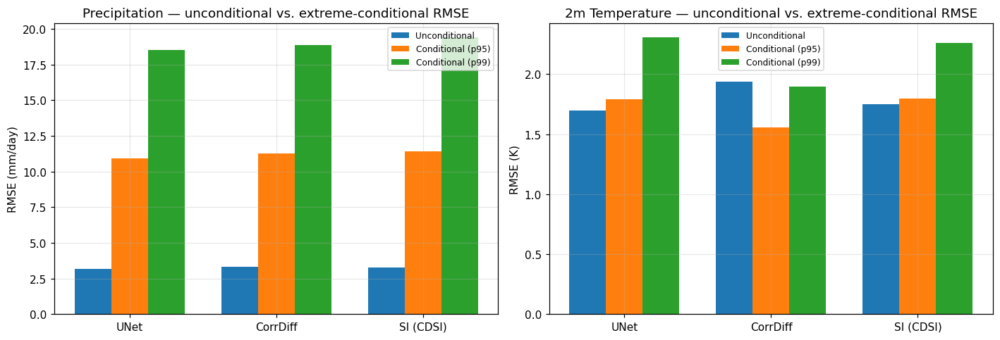

RMSE inflation factor (conditional / unconditional) — values further from 1 mean bigger error growth in the tail:


experiment           CorrDiff  SI (CDSI)      UNet
variable percentile                               
pr       95          3.400349   3.484848  3.432582
         99          5.691502   5.920619  5.818901
tas      95          0.804587   1.026614  1.052940
         99          0.980465   1.291222  1.359046

In [19]:
# Bar chart: unconditional RMSE vs. conditional (p95, p99) RMSE, per variable/model
fig, axes = plt.subplots(1, len(VARIABLES), figsize=(6.5 * len(VARIABLES), 4.5))
for i, var in enumerate(VARIABLES):
    ax = axes[i] if len(VARIABLES) > 1 else axes
    labels = [MODEL_LABELS[exp] for exp in EXPERIMENTS]
    x = np.arange(len(labels))
    width = 0.25
    uncond = [baseline_df.loc[(var, lab), "RMSE"] for lab in labels]
    p95_vals = [cond_df.loc[(var, 95, lab), "cond_RMSE"] for lab in labels]
    p99_vals = [cond_df.loc[(var, 99, lab), "cond_RMSE"] for lab in labels]
    ax.bar(x - width, uncond, width, label="Unconditional")
    ax.bar(x, p95_vals, width, label="Conditional (p95)")
    ax.bar(x + width, p99_vals, width, label="Conditional (p99)")
    ax.set_xticks(x); ax.set_xticklabels(labels)
    ax.set_ylabel(f"RMSE ({VAR_UNITS[var]})")
    ax.set_title(f"{VAR_LONGNAME[var]} — unconditional vs. extreme-conditional RMSE")
    ax.legend(fontsize=8)
plt.tight_layout()
savefig(fig, "rmse_inflation_bar")
plt.show()

print("RMSE inflation factor (conditional / unconditional) — values further from 1 mean bigger error growth in the tail:")
display(cond_df["RMSE_inflation"].unstack("experiment"))


## 10. Bonus diagnostics: reliability diagrams / Brier score, and tail-quantile bias

**Reliability diagram + Brier score (SI/CorrDiff only).** For each (day, gridcell), the ensemble gives a forecast *probability* of exceeding the threshold, $\hat p = \frac{1}{20}\sum_{m} \mathbb{1}[\text{member}_m \geq \text{threshold}]$. Binning $\hat p$ into deciles and plotting the observed exceedance frequency in each bin against the mean forecast probability gives the reliability diagram: points on the diagonal mean the forecast probabilities are trustworthy (a 70%-probability forecast really does verify 70% of the time); systematic deviation above/below the diagonal means over/under-confidence. The **Brier score** ($\text{mean}((\hat p - \text{obs})^2)$) summarizes this into one number (lower is better). This is a different, complementary lens from Section 5's contingency table: it tests the full calibration of the ensemble's probability estimates rather than a single yes/no cutoff, directly asking "when this model says an extreme is 80% likely, can you trust that number."

**Tail-quantile bias table.** For each model/variable, the predicted vs. observed Q95/Q99/Q99.9 (from the pooled ensemble-mean field), reported as absolute bias (and, for `pr` only, relative bias — reporting a relative % bias for `tas` in Kelvin is not physically meaningful since Kelvin has a non-zero-relative origin). This is a simple, easily-cited single-number summary of "how far off is this model's climatological tail," useful for a rebuttal letter's prose alongside the more detailed diagnostics above.

reliability diagrams:   0%|          | 0/4 [00:00<?, ?it/s]

reliability test_CorrDiff_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

reliability test_CorrDiff_small_r1/pr:   0%|          | 3/1824 [00:00<01:22, 22.09day/s]

reliability test_CorrDiff_small_r1/pr:   0%|          | 6/1824 [00:00<01:17, 23.36day/s]

reliability test_CorrDiff_small_r1/pr:   0%|          | 9/1824 [00:00<01:15, 23.98day/s]

reliability test_CorrDiff_small_r1/pr:   1%|          | 12/1824 [00:00<01:37, 18.57day/s]

reliability test_CorrDiff_small_r1/pr:   1%|          | 15/1824 [00:00<01:28, 20.43day/s]

reliability test_CorrDiff_small_r1/pr:   1%|          | 18/1824 [00:00<01:27, 20.65day/s]

reliability test_CorrDiff_small_r1/pr:   1%|          | 21/1824 [00:00<01:23, 21.46day/s]

reliability test_CorrDiff_small_r1/pr:   1%|▏         | 24/1824 [00:01<01:20, 22.45day/s]

reliability test_CorrDiff_small_r1/pr:   1%|▏         | 27/1824 [00:01<01:17, 23.10day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 30/1824 [00:01<01:32, 19.36day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 33/1824 [00:01<01:28, 20.16day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 36/1824 [00:01<01:25, 20.89day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 39/1824 [00:01<01:22, 21.56day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 42/1824 [00:01<01:20, 22.12day/s]

reliability test_CorrDiff_small_r1/pr:   2%|▏         | 45/1824 [00:02<01:19, 22.44day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 48/1824 [00:02<01:18, 22.50day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 51/1824 [00:02<01:17, 22.85day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 54/1824 [00:02<01:15, 23.35day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 57/1824 [00:02<01:14, 23.64day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 60/1824 [00:02<01:13, 23.88day/s]

reliability test_CorrDiff_small_r1/pr:   3%|▎         | 63/1824 [00:02<01:13, 24.07day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▎         | 66/1824 [00:02<01:14, 23.72day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▍         | 69/1824 [00:03<01:30, 19.48day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▍         | 72/1824 [00:03<01:24, 20.62day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▍         | 75/1824 [00:03<01:21, 21.46day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▍         | 78/1824 [00:03<01:18, 22.17day/s]

reliability test_CorrDiff_small_r1/pr:   4%|▍         | 81/1824 [00:03<01:17, 22.63day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▍         | 84/1824 [00:03<01:15, 23.19day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▍         | 87/1824 [00:03<01:14, 23.43day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▍         | 90/1824 [00:04<01:13, 23.45day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▌         | 93/1824 [00:04<01:12, 23.85day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▌         | 96/1824 [00:04<01:11, 24.17day/s]

reliability test_CorrDiff_small_r1/pr:   5%|▌         | 99/1824 [00:04<01:10, 24.36day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▌         | 102/1824 [00:04<01:10, 24.38day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▌         | 105/1824 [00:04<01:38, 17.54day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▌         | 108/1824 [00:04<01:29, 19.25day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▌         | 111/1824 [00:05<01:22, 20.64day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▋         | 114/1824 [00:05<01:18, 21.76day/s]

reliability test_CorrDiff_small_r1/pr:   6%|▋         | 117/1824 [00:05<01:15, 22.61day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 120/1824 [00:05<01:13, 23.28day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 123/1824 [00:05<01:11, 23.74day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 126/1824 [00:05<01:10, 24.13day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 129/1824 [00:05<01:10, 24.01day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 132/1824 [00:05<01:10, 24.03day/s]

reliability test_CorrDiff_small_r1/pr:   7%|▋         | 135/1824 [00:06<01:09, 24.18day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 138/1824 [00:06<01:09, 24.43day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 141/1824 [00:06<01:08, 24.61day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 144/1824 [00:06<01:45, 15.92day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 147/1824 [00:06<01:35, 17.53day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 150/1824 [00:06<01:27, 19.24day/s]

reliability test_CorrDiff_small_r1/pr:   8%|▊         | 153/1824 [00:07<01:20, 20.65day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▊         | 156/1824 [00:07<01:16, 21.77day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▊         | 159/1824 [00:07<01:13, 22.63day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▉         | 162/1824 [00:07<01:12, 23.08day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▉         | 165/1824 [00:07<01:10, 23.56day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▉         | 168/1824 [00:07<01:09, 23.95day/s]

reliability test_CorrDiff_small_r1/pr:   9%|▉         | 171/1824 [00:07<01:08, 24.22day/s]

reliability test_CorrDiff_small_r1/pr:  10%|▉         | 174/1824 [00:07<01:07, 24.43day/s]

reliability test_CorrDiff_small_r1/pr:  10%|▉         | 177/1824 [00:07<01:06, 24.60day/s]

reliability test_CorrDiff_small_r1/pr:  10%|▉         | 180/1824 [00:08<01:06, 24.70day/s]

reliability test_CorrDiff_small_r1/pr:  10%|█         | 183/1824 [00:08<01:41, 16.25day/s]

reliability test_CorrDiff_small_r1/pr:  10%|█         | 186/1824 [00:08<01:30, 18.11day/s]

reliability test_CorrDiff_small_r1/pr:  10%|█         | 189/1824 [00:08<01:22, 19.71day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█         | 192/1824 [00:08<01:18, 20.89day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█         | 195/1824 [00:08<01:14, 21.86day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█         | 198/1824 [00:09<01:11, 22.74day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█         | 201/1824 [00:09<01:09, 23.40day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█         | 204/1824 [00:09<01:07, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  11%|█▏        | 207/1824 [00:09<01:07, 24.12day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 210/1824 [00:09<01:05, 24.48day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 213/1824 [00:09<01:05, 24.72day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 216/1824 [00:09<01:04, 24.86day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 219/1824 [00:09<01:04, 25.04day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 222/1824 [00:10<01:40, 15.95day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▏        | 225/1824 [00:10<01:35, 16.78day/s]

reliability test_CorrDiff_small_r1/pr:  12%|█▎        | 228/1824 [00:10<01:25, 18.65day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 231/1824 [00:10<01:18, 20.23day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 234/1824 [00:10<01:14, 21.41day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 237/1824 [00:10<01:10, 22.41day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 240/1824 [00:10<01:08, 23.14day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 243/1824 [00:11<01:07, 23.50day/s]

reliability test_CorrDiff_small_r1/pr:  13%|█▎        | 246/1824 [00:11<01:06, 23.74day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▎        | 249/1824 [00:11<01:05, 24.20day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▍        | 252/1824 [00:11<01:04, 24.51day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▍        | 255/1824 [00:11<01:05, 24.08day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▍        | 258/1824 [00:11<01:42, 15.29day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▍        | 261/1824 [00:12<01:30, 17.31day/s]

reliability test_CorrDiff_small_r1/pr:  14%|█▍        | 264/1824 [00:12<01:23, 18.69day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▍        | 267/1824 [00:12<01:16, 20.25day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▍        | 270/1824 [00:12<01:12, 21.43day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▍        | 273/1824 [00:12<01:09, 22.36day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▌        | 276/1824 [00:12<01:07, 23.01day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▌        | 279/1824 [00:12<01:05, 23.54day/s]

reliability test_CorrDiff_small_r1/pr:  15%|█▌        | 282/1824 [00:12<01:04, 23.93day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▌        | 285/1824 [00:13<01:03, 24.28day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▌        | 288/1824 [00:13<01:02, 24.51day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▌        | 291/1824 [00:13<01:02, 24.64day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▌        | 294/1824 [00:13<01:01, 24.77day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▋        | 297/1824 [00:13<01:33, 16.39day/s]

reliability test_CorrDiff_small_r1/pr:  16%|█▋        | 300/1824 [00:13<01:23, 18.27day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 303/1824 [00:13<01:16, 19.78day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 306/1824 [00:14<01:12, 21.07day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 309/1824 [00:14<01:08, 22.07day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 312/1824 [00:14<01:06, 22.80day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 315/1824 [00:14<01:04, 23.41day/s]

reliability test_CorrDiff_small_r1/pr:  17%|█▋        | 318/1824 [00:14<01:03, 23.66day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 321/1824 [00:14<01:03, 23.74day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 324/1824 [00:14<01:02, 23.91day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 327/1824 [00:14<01:07, 22.26day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 330/1824 [00:15<01:05, 22.83day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 333/1824 [00:15<01:03, 23.30day/s]

reliability test_CorrDiff_small_r1/pr:  18%|█▊        | 336/1824 [00:15<01:33, 15.87day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▊        | 339/1824 [00:15<01:23, 17.73day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▉        | 342/1824 [00:15<01:16, 19.36day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▉        | 345/1824 [00:15<01:12, 20.49day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▉        | 348/1824 [00:16<01:09, 21.35day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▉        | 351/1824 [00:16<01:12, 20.34day/s]

reliability test_CorrDiff_small_r1/pr:  19%|█▉        | 354/1824 [00:16<01:08, 21.48day/s]

reliability test_CorrDiff_small_r1/pr:  20%|█▉        | 357/1824 [00:16<01:05, 22.36day/s]

reliability test_CorrDiff_small_r1/pr:  20%|█▉        | 360/1824 [00:16<01:05, 22.35day/s]

reliability test_CorrDiff_small_r1/pr:  20%|█▉        | 363/1824 [00:16<01:04, 22.57day/s]

reliability test_CorrDiff_small_r1/pr:  20%|██        | 366/1824 [00:16<01:04, 22.78day/s]

reliability test_CorrDiff_small_r1/pr:  20%|██        | 369/1824 [00:16<01:03, 22.89day/s]

reliability test_CorrDiff_small_r1/pr:  20%|██        | 372/1824 [00:17<01:36, 14.99day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██        | 375/1824 [00:17<01:26, 16.84day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██        | 378/1824 [00:17<01:18, 18.48day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██        | 381/1824 [00:17<01:11, 20.07day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██        | 384/1824 [00:17<01:07, 21.37day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██        | 387/1824 [00:17<01:04, 22.42day/s]

reliability test_CorrDiff_small_r1/pr:  21%|██▏       | 390/1824 [00:18<01:01, 23.23day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 393/1824 [00:18<01:00, 23.81day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 396/1824 [00:18<00:58, 24.28day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 399/1824 [00:18<00:58, 24.55day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 402/1824 [00:18<00:58, 24.14day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 405/1824 [00:18<00:58, 24.07day/s]

reliability test_CorrDiff_small_r1/pr:  22%|██▏       | 408/1824 [00:18<00:58, 24.31day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 411/1824 [00:19<01:27, 16.10day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 414/1824 [00:19<01:18, 17.96day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 417/1824 [00:19<01:11, 19.55day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 420/1824 [00:19<01:07, 20.84day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 423/1824 [00:19<01:03, 21.90day/s]

reliability test_CorrDiff_small_r1/pr:  23%|██▎       | 426/1824 [00:19<01:01, 22.77day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▎       | 429/1824 [00:19<00:59, 23.41day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▎       | 432/1824 [00:19<00:59, 23.58day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▍       | 435/1824 [00:20<00:58, 23.64day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▍       | 438/1824 [00:20<00:57, 23.96day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▍       | 441/1824 [00:20<01:01, 22.38day/s]

reliability test_CorrDiff_small_r1/pr:  24%|██▍       | 444/1824 [00:20<00:59, 23.05day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▍       | 447/1824 [00:20<00:58, 23.44day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▍       | 450/1824 [00:20<01:27, 15.76day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▍       | 453/1824 [00:21<01:17, 17.64day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▌       | 456/1824 [00:21<01:11, 19.25day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▌       | 459/1824 [00:21<01:06, 20.55day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▌       | 462/1824 [00:21<01:02, 21.63day/s]

reliability test_CorrDiff_small_r1/pr:  25%|██▌       | 465/1824 [00:21<01:00, 22.45day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▌       | 468/1824 [00:21<00:59, 22.62day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▌       | 471/1824 [00:21<00:58, 23.25day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▌       | 474/1824 [00:21<00:57, 23.67day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▌       | 477/1824 [00:22<00:56, 23.93day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▋       | 480/1824 [00:22<00:55, 24.19day/s]

reliability test_CorrDiff_small_r1/pr:  26%|██▋       | 483/1824 [00:22<00:54, 24.39day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 486/1824 [00:22<00:54, 24.52day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 489/1824 [00:22<01:25, 15.59day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 492/1824 [00:22<01:15, 17.58day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 495/1824 [00:23<01:08, 19.27day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 498/1824 [00:23<01:04, 20.68day/s]

reliability test_CorrDiff_small_r1/pr:  27%|██▋       | 501/1824 [00:23<01:00, 21.80day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 504/1824 [00:23<00:58, 22.57day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 507/1824 [00:23<00:56, 23.17day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 510/1824 [00:23<00:55, 23.60day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 513/1824 [00:23<00:54, 23.89day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 516/1824 [00:23<00:54, 24.12day/s]

reliability test_CorrDiff_small_r1/pr:  28%|██▊       | 519/1824 [00:24<00:53, 24.28day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▊       | 522/1824 [00:24<00:55, 23.66day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▉       | 525/1824 [00:24<01:24, 15.45day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▉       | 528/1824 [00:24<01:14, 17.42day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▉       | 531/1824 [00:24<01:07, 19.15day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▉       | 534/1824 [00:24<01:02, 20.57day/s]

reliability test_CorrDiff_small_r1/pr:  29%|██▉       | 537/1824 [00:24<00:59, 21.69day/s]

reliability test_CorrDiff_small_r1/pr:  30%|██▉       | 540/1824 [00:25<00:57, 22.21day/s]

reliability test_CorrDiff_small_r1/pr:  30%|██▉       | 543/1824 [00:25<00:55, 22.90day/s]

reliability test_CorrDiff_small_r1/pr:  30%|██▉       | 546/1824 [00:25<00:54, 23.38day/s]

reliability test_CorrDiff_small_r1/pr:  30%|███       | 549/1824 [00:25<00:53, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  30%|███       | 552/1824 [00:25<00:52, 24.05day/s]

reliability test_CorrDiff_small_r1/pr:  30%|███       | 555/1824 [00:25<00:52, 24.20day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███       | 558/1824 [00:25<00:52, 24.33day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███       | 561/1824 [00:25<00:51, 24.45day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███       | 564/1824 [00:26<01:20, 15.71day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███       | 567/1824 [00:26<01:11, 17.64day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███▏      | 570/1824 [00:26<01:05, 19.20day/s]

reliability test_CorrDiff_small_r1/pr:  31%|███▏      | 573/1824 [00:26<01:02, 19.89day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 576/1824 [00:26<00:58, 21.16day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 579/1824 [00:26<00:56, 22.14day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 582/1824 [00:27<00:54, 22.63day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 585/1824 [00:27<00:54, 22.57day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 588/1824 [00:27<00:53, 23.31day/s]

reliability test_CorrDiff_small_r1/pr:  32%|███▏      | 591/1824 [00:27<00:51, 23.83day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 594/1824 [00:27<00:50, 24.20day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 597/1824 [00:27<00:50, 24.46day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 600/1824 [00:27<00:49, 24.62day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 603/1824 [00:28<01:15, 16.08day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 606/1824 [00:28<01:07, 17.93day/s]

reliability test_CorrDiff_small_r1/pr:  33%|███▎      | 609/1824 [00:28<01:02, 19.55day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▎      | 612/1824 [00:28<00:58, 20.84day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▎      | 615/1824 [00:28<00:56, 21.45day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▍      | 618/1824 [00:28<00:54, 22.31day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▍      | 621/1824 [00:28<00:52, 22.98day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▍      | 624/1824 [00:28<00:51, 23.49day/s]

reliability test_CorrDiff_small_r1/pr:  34%|███▍      | 627/1824 [00:29<00:50, 23.77day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▍      | 630/1824 [00:29<00:49, 24.00day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▍      | 633/1824 [00:29<00:49, 24.29day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▍      | 636/1824 [00:29<00:48, 24.41day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▌      | 639/1824 [00:29<01:13, 16.20day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▌      | 642/1824 [00:29<01:05, 18.08day/s]

reliability test_CorrDiff_small_r1/pr:  35%|███▌      | 645/1824 [00:30<00:59, 19.72day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▌      | 648/1824 [00:30<00:57, 20.53day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▌      | 651/1824 [00:30<00:54, 21.65day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▌      | 654/1824 [00:30<00:52, 22.48day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▌      | 657/1824 [00:30<00:50, 23.05day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▌      | 660/1824 [00:30<00:49, 23.54day/s]

reliability test_CorrDiff_small_r1/pr:  36%|███▋      | 663/1824 [00:30<00:51, 22.56day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 666/1824 [00:30<00:50, 23.14day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 669/1824 [00:31<00:48, 23.58day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 672/1824 [00:31<00:48, 23.88day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 675/1824 [00:31<00:47, 24.13day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 678/1824 [00:31<01:12, 15.71day/s]

reliability test_CorrDiff_small_r1/pr:  37%|███▋      | 681/1824 [00:31<01:04, 17.59day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 684/1824 [00:31<00:59, 19.21day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 687/1824 [00:32<00:55, 20.52day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 690/1824 [00:32<00:53, 21.31day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 693/1824 [00:32<00:51, 21.98day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 696/1824 [00:32<00:49, 22.59day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 699/1824 [00:32<00:49, 22.56day/s]

reliability test_CorrDiff_small_r1/pr:  38%|███▊      | 702/1824 [00:32<00:48, 23.01day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▊      | 705/1824 [00:32<00:48, 23.20day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▉      | 708/1824 [00:32<00:47, 23.47day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▉      | 711/1824 [00:33<00:46, 23.77day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▉      | 714/1824 [00:33<00:46, 23.96day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▉      | 717/1824 [00:33<01:09, 15.89day/s]

reliability test_CorrDiff_small_r1/pr:  39%|███▉      | 720/1824 [00:33<01:02, 17.80day/s]

reliability test_CorrDiff_small_r1/pr:  40%|███▉      | 723/1824 [00:33<00:56, 19.44day/s]

reliability test_CorrDiff_small_r1/pr:  40%|███▉      | 726/1824 [00:33<00:52, 20.78day/s]

reliability test_CorrDiff_small_r1/pr:  40%|███▉      | 729/1824 [00:33<00:50, 21.58day/s]

reliability test_CorrDiff_small_r1/pr:  40%|████      | 732/1824 [00:34<00:49, 21.94day/s]

reliability test_CorrDiff_small_r1/pr:  40%|████      | 735/1824 [00:34<00:52, 20.85day/s]

reliability test_CorrDiff_small_r1/pr:  40%|████      | 738/1824 [00:34<00:50, 21.53day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████      | 741/1824 [00:34<00:49, 22.06day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████      | 744/1824 [00:34<00:48, 22.36day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████      | 747/1824 [00:34<00:47, 22.61day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████      | 750/1824 [00:34<00:46, 23.06day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████▏     | 753/1824 [00:35<00:46, 23.06day/s]

reliability test_CorrDiff_small_r1/pr:  41%|████▏     | 756/1824 [00:35<01:06, 16.01day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 759/1824 [00:35<00:59, 17.98day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 762/1824 [00:35<00:53, 19.67day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 765/1824 [00:35<00:50, 21.06day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 768/1824 [00:35<00:47, 22.16day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 771/1824 [00:35<00:45, 23.00day/s]

reliability test_CorrDiff_small_r1/pr:  42%|████▏     | 774/1824 [00:36<00:45, 22.99day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 777/1824 [00:36<00:44, 23.42day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 780/1824 [00:36<00:43, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 783/1824 [00:36<00:43, 24.17day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 786/1824 [00:36<00:42, 24.34day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 789/1824 [00:36<00:42, 24.47day/s]

reliability test_CorrDiff_small_r1/pr:  43%|████▎     | 792/1824 [00:37<01:02, 16.42day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▎     | 795/1824 [00:37<00:56, 18.25day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▍     | 798/1824 [00:37<00:51, 19.79day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▍     | 801/1824 [00:37<00:48, 21.05day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▍     | 804/1824 [00:37<00:46, 22.06day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▍     | 807/1824 [00:37<00:44, 22.82day/s]

reliability test_CorrDiff_small_r1/pr:  44%|████▍     | 810/1824 [00:37<00:43, 23.39day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▍     | 813/1824 [00:37<00:42, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▍     | 816/1824 [00:37<00:43, 23.09day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▍     | 819/1824 [00:38<00:42, 23.60day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▌     | 822/1824 [00:38<00:41, 23.90day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▌     | 825/1824 [00:38<00:41, 24.11day/s]

reliability test_CorrDiff_small_r1/pr:  45%|████▌     | 828/1824 [00:38<00:40, 24.32day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▌     | 831/1824 [00:38<01:01, 16.21day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▌     | 834/1824 [00:38<00:54, 18.15day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▌     | 837/1824 [00:39<00:49, 19.80day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▌     | 840/1824 [00:39<00:46, 21.15day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▌     | 843/1824 [00:39<00:44, 22.21day/s]

reliability test_CorrDiff_small_r1/pr:  46%|████▋     | 846/1824 [00:39<00:42, 23.01day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 849/1824 [00:39<00:41, 23.57day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 852/1824 [00:39<00:40, 23.92day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 855/1824 [00:39<00:40, 24.22day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 858/1824 [00:39<00:39, 24.23day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 861/1824 [00:40<00:39, 24.10day/s]

reliability test_CorrDiff_small_r1/pr:  47%|████▋     | 864/1824 [00:40<00:39, 24.38day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 867/1824 [00:40<00:38, 24.55day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 870/1824 [00:40<00:57, 16.57day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 873/1824 [00:40<00:52, 18.18day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 876/1824 [00:40<00:47, 19.77day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 879/1824 [00:40<00:44, 21.07day/s]

reliability test_CorrDiff_small_r1/pr:  48%|████▊     | 882/1824 [00:41<00:42, 22.09day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▊     | 885/1824 [00:41<00:40, 22.91day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▊     | 888/1824 [00:41<00:39, 23.51day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▉     | 891/1824 [00:41<00:38, 23.92day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▉     | 894/1824 [00:41<00:38, 24.21day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▉     | 897/1824 [00:41<00:37, 24.45day/s]

reliability test_CorrDiff_small_r1/pr:  49%|████▉     | 900/1824 [00:41<00:37, 24.63day/s]

reliability test_CorrDiff_small_r1/pr:  50%|████▉     | 903/1824 [00:41<00:37, 24.68day/s]

reliability test_CorrDiff_small_r1/pr:  50%|████▉     | 906/1824 [00:42<00:56, 16.15day/s]

reliability test_CorrDiff_small_r1/pr:  50%|████▉     | 909/1824 [00:42<00:50, 18.07day/s]

reliability test_CorrDiff_small_r1/pr:  50%|█████     | 912/1824 [00:42<00:46, 19.71day/s]

reliability test_CorrDiff_small_r1/pr:  50%|█████     | 915/1824 [00:42<00:43, 21.01day/s]

reliability test_CorrDiff_small_r1/pr:  50%|█████     | 918/1824 [00:42<00:41, 22.09day/s]

reliability test_CorrDiff_small_r1/pr:  50%|█████     | 921/1824 [00:42<00:39, 22.94day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████     | 924/1824 [00:42<00:39, 22.97day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████     | 927/1824 [00:43<00:38, 23.55day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████     | 930/1824 [00:43<00:37, 23.99day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████     | 933/1824 [00:43<00:36, 24.22day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████▏    | 936/1824 [00:43<00:36, 24.43day/s]

reliability test_CorrDiff_small_r1/pr:  51%|█████▏    | 939/1824 [00:43<00:36, 24.57day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 942/1824 [00:43<00:35, 24.67day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 945/1824 [00:44<00:55, 15.85day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 948/1824 [00:44<00:49, 17.70day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 951/1824 [00:44<00:45, 19.28day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 954/1824 [00:44<00:42, 20.56day/s]

reliability test_CorrDiff_small_r1/pr:  52%|█████▏    | 957/1824 [00:44<00:40, 21.58day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 960/1824 [00:44<00:38, 22.34day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 963/1824 [00:44<00:37, 22.91day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 966/1824 [00:44<00:36, 23.33day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 969/1824 [00:45<00:36, 23.44day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 972/1824 [00:45<00:36, 23.07day/s]

reliability test_CorrDiff_small_r1/pr:  53%|█████▎    | 975/1824 [00:45<00:36, 23.40day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▎    | 978/1824 [00:45<00:35, 23.65day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▍    | 981/1824 [00:45<00:35, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▍    | 984/1824 [00:45<00:52, 16.04day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▍    | 987/1824 [00:45<00:46, 17.95day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▍    | 990/1824 [00:46<00:42, 19.44day/s]

reliability test_CorrDiff_small_r1/pr:  54%|█████▍    | 993/1824 [00:46<00:40, 20.61day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▍    | 996/1824 [00:46<00:39, 20.94day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▍    | 999/1824 [00:46<00:37, 21.94day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▍    | 1002/1824 [00:46<00:36, 22.71day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▌    | 1005/1824 [00:46<00:35, 23.27day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▌    | 1008/1824 [00:46<00:34, 23.71day/s]

reliability test_CorrDiff_small_r1/pr:  55%|█████▌    | 1011/1824 [00:46<00:33, 24.04day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▌    | 1014/1824 [00:47<00:33, 24.23day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▌    | 1017/1824 [00:47<00:33, 23.85day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▌    | 1020/1824 [00:47<00:50, 15.84day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▌    | 1023/1824 [00:47<00:45, 17.69day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▋    | 1026/1824 [00:47<00:41, 19.30day/s]

reliability test_CorrDiff_small_r1/pr:  56%|█████▋    | 1029/1824 [00:47<00:38, 20.58day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1032/1824 [00:48<00:36, 21.65day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1035/1824 [00:48<00:35, 21.93day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1038/1824 [00:48<00:34, 22.74day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1041/1824 [00:48<00:33, 23.25day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1044/1824 [00:48<00:32, 23.72day/s]

reliability test_CorrDiff_small_r1/pr:  57%|█████▋    | 1047/1824 [00:48<00:32, 24.02day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1050/1824 [00:48<00:31, 24.23day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1053/1824 [00:48<00:32, 23.83day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1056/1824 [00:49<00:32, 23.97day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1059/1824 [00:49<00:49, 15.46day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1062/1824 [00:49<00:44, 17.12day/s]

reliability test_CorrDiff_small_r1/pr:  58%|█████▊    | 1065/1824 [00:49<00:40, 18.84day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▊    | 1068/1824 [00:49<00:37, 20.29day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▊    | 1071/1824 [00:49<00:35, 21.42day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▉    | 1074/1824 [00:50<00:33, 22.32day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▉    | 1077/1824 [00:50<00:32, 22.97day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▉    | 1080/1824 [00:50<00:32, 22.99day/s]

reliability test_CorrDiff_small_r1/pr:  59%|█████▉    | 1083/1824 [00:50<00:31, 23.44day/s]

reliability test_CorrDiff_small_r1/pr:  60%|█████▉    | 1086/1824 [00:50<00:31, 23.79day/s]

reliability test_CorrDiff_small_r1/pr:  60%|█████▉    | 1089/1824 [00:50<00:32, 22.67day/s]

reliability test_CorrDiff_small_r1/pr:  60%|█████▉    | 1092/1824 [00:50<00:31, 23.26day/s]

reliability test_CorrDiff_small_r1/pr:  60%|██████    | 1095/1824 [00:50<00:30, 23.65day/s]

reliability test_CorrDiff_small_r1/pr:  60%|██████    | 1098/1824 [00:51<00:47, 15.35day/s]

reliability test_CorrDiff_small_r1/pr:  60%|██████    | 1101/1824 [00:51<00:41, 17.27day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████    | 1104/1824 [00:51<00:38, 18.80day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████    | 1107/1824 [00:51<00:35, 20.10day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████    | 1110/1824 [00:51<00:33, 21.13day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████    | 1113/1824 [00:51<00:32, 21.95day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████    | 1116/1824 [00:52<00:31, 22.36day/s]

reliability test_CorrDiff_small_r1/pr:  61%|██████▏   | 1119/1824 [00:52<00:31, 22.32day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1122/1824 [00:52<00:30, 22.78day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1125/1824 [00:52<00:30, 23.13day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1128/1824 [00:52<00:29, 23.41day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1131/1824 [00:52<00:29, 23.70day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1134/1824 [00:52<00:28, 23.88day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▏   | 1137/1824 [00:53<00:45, 15.08day/s]

reliability test_CorrDiff_small_r1/pr:  62%|██████▎   | 1140/1824 [00:53<00:40, 17.05day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1143/1824 [00:53<00:37, 18.36day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1146/1824 [00:53<00:34, 19.59day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1149/1824 [00:53<00:32, 20.57day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1152/1824 [00:53<00:31, 21.24day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1155/1824 [00:53<00:30, 21.71day/s]

reliability test_CorrDiff_small_r1/pr:  63%|██████▎   | 1158/1824 [00:54<00:30, 22.00day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▎   | 1161/1824 [00:54<00:29, 22.37day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▍   | 1164/1824 [00:54<00:28, 23.00day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▍   | 1167/1824 [00:54<00:28, 23.35day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▍   | 1170/1824 [00:54<00:27, 23.59day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▍   | 1173/1824 [00:54<00:43, 14.93day/s]

reliability test_CorrDiff_small_r1/pr:  64%|██████▍   | 1176/1824 [00:55<00:38, 16.90day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▍   | 1179/1824 [00:55<00:34, 18.63day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▍   | 1182/1824 [00:55<00:32, 19.72day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▍   | 1185/1824 [00:55<00:31, 20.27day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▌   | 1188/1824 [00:55<00:30, 21.17day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▌   | 1191/1824 [00:55<00:28, 21.96day/s]

reliability test_CorrDiff_small_r1/pr:  65%|██████▌   | 1194/1824 [00:55<00:28, 22.45day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▌   | 1197/1824 [00:55<00:28, 21.84day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▌   | 1200/1824 [00:56<00:28, 22.27day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▌   | 1203/1824 [00:56<00:27, 22.68day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▌   | 1206/1824 [00:56<00:26, 23.19day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▋   | 1209/1824 [00:56<00:26, 23.49day/s]

reliability test_CorrDiff_small_r1/pr:  66%|██████▋   | 1212/1824 [00:56<00:39, 15.60day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1215/1824 [00:56<00:34, 17.57day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1218/1824 [00:57<00:31, 19.29day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1221/1824 [00:57<00:29, 20.73day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1224/1824 [00:57<00:27, 21.83day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1227/1824 [00:57<00:26, 22.56day/s]

reliability test_CorrDiff_small_r1/pr:  67%|██████▋   | 1230/1824 [00:57<00:25, 23.16day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1233/1824 [00:57<00:25, 23.62day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1236/1824 [00:57<00:24, 23.70day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1239/1824 [00:57<00:24, 23.73day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1242/1824 [00:58<00:24, 24.01day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1245/1824 [00:58<00:23, 24.21day/s]

reliability test_CorrDiff_small_r1/pr:  68%|██████▊   | 1248/1824 [00:58<00:23, 24.35day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▊   | 1251/1824 [00:58<00:36, 15.57day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▉   | 1254/1824 [00:58<00:32, 17.45day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▉   | 1257/1824 [00:58<00:29, 19.06day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▉   | 1260/1824 [00:58<00:27, 20.37day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▉   | 1263/1824 [00:59<00:26, 21.43day/s]

reliability test_CorrDiff_small_r1/pr:  69%|██████▉   | 1266/1824 [00:59<00:25, 22.21day/s]

reliability test_CorrDiff_small_r1/pr:  70%|██████▉   | 1269/1824 [00:59<00:24, 22.70day/s]

reliability test_CorrDiff_small_r1/pr:  70%|██████▉   | 1272/1824 [00:59<00:24, 22.50day/s]

reliability test_CorrDiff_small_r1/pr:  70%|██████▉   | 1275/1824 [00:59<00:24, 22.51day/s]

reliability test_CorrDiff_small_r1/pr:  70%|███████   | 1278/1824 [00:59<00:23, 23.01day/s]

reliability test_CorrDiff_small_r1/pr:  70%|███████   | 1281/1824 [00:59<00:23, 23.42day/s]

reliability test_CorrDiff_small_r1/pr:  70%|███████   | 1284/1824 [01:00<00:22, 23.69day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████   | 1287/1824 [01:00<00:34, 15.60day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████   | 1290/1824 [01:00<00:30, 17.48day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████   | 1293/1824 [01:00<00:27, 19.13day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████   | 1296/1824 [01:00<00:25, 20.47day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████   | 1299/1824 [01:00<00:24, 21.45day/s]

reliability test_CorrDiff_small_r1/pr:  71%|███████▏  | 1302/1824 [01:00<00:23, 22.32day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1305/1824 [01:01<00:22, 23.00day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1308/1824 [01:01<00:21, 23.53day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1311/1824 [01:01<00:21, 23.76day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1314/1824 [01:01<00:21, 23.97day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1317/1824 [01:01<00:21, 24.08day/s]

reliability test_CorrDiff_small_r1/pr:  72%|███████▏  | 1320/1824 [01:01<00:20, 24.27day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1323/1824 [01:01<00:20, 24.45day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1326/1824 [01:02<00:31, 15.82day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1329/1824 [01:02<00:28, 17.65day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1332/1824 [01:02<00:25, 19.24day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1335/1824 [01:02<00:23, 20.53day/s]

reliability test_CorrDiff_small_r1/pr:  73%|███████▎  | 1338/1824 [01:02<00:22, 21.59day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▎  | 1341/1824 [01:02<00:21, 22.35day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▎  | 1344/1824 [01:02<00:20, 22.94day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▍  | 1347/1824 [01:03<00:20, 23.36day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▍  | 1350/1824 [01:03<00:20, 23.66day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▍  | 1353/1824 [01:03<00:19, 23.79day/s]

reliability test_CorrDiff_small_r1/pr:  74%|███████▍  | 1356/1824 [01:03<00:19, 23.97day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▍  | 1359/1824 [01:03<00:19, 24.08day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▍  | 1362/1824 [01:03<00:19, 24.16day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▍  | 1365/1824 [01:03<00:29, 15.60day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▌  | 1368/1824 [01:04<00:26, 17.29day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▌  | 1371/1824 [01:04<00:24, 18.59day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▌  | 1374/1824 [01:04<00:22, 20.02day/s]

reliability test_CorrDiff_small_r1/pr:  75%|███████▌  | 1377/1824 [01:04<00:21, 20.70day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▌  | 1380/1824 [01:04<00:20, 21.66day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▌  | 1383/1824 [01:04<00:19, 22.39day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▌  | 1386/1824 [01:04<00:19, 22.88day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▌  | 1389/1824 [01:05<00:18, 23.16day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▋  | 1392/1824 [01:05<00:18, 23.48day/s]

reliability test_CorrDiff_small_r1/pr:  76%|███████▋  | 1395/1824 [01:05<00:18, 23.66day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1398/1824 [01:05<00:17, 23.82day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1401/1824 [01:05<00:17, 23.95day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1404/1824 [01:05<00:25, 16.33day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1407/1824 [01:05<00:23, 18.12day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1410/1824 [01:06<00:21, 19.58day/s]

reliability test_CorrDiff_small_r1/pr:  77%|███████▋  | 1413/1824 [01:06<00:19, 20.60day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1416/1824 [01:06<00:18, 21.51day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1419/1824 [01:06<00:18, 21.80day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1422/1824 [01:06<00:17, 22.41day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1425/1824 [01:06<00:17, 22.96day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1428/1824 [01:06<00:16, 23.32day/s]

reliability test_CorrDiff_small_r1/pr:  78%|███████▊  | 1431/1824 [01:06<00:16, 23.64day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▊  | 1434/1824 [01:07<00:16, 23.81day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▉  | 1437/1824 [01:07<00:16, 23.98day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▉  | 1440/1824 [01:07<00:24, 15.40day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▉  | 1443/1824 [01:07<00:21, 17.39day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▉  | 1446/1824 [01:07<00:19, 19.15day/s]

reliability test_CorrDiff_small_r1/pr:  79%|███████▉  | 1449/1824 [01:07<00:18, 20.56day/s]

reliability test_CorrDiff_small_r1/pr:  80%|███████▉  | 1452/1824 [01:08<00:17, 21.69day/s]

reliability test_CorrDiff_small_r1/pr:  80%|███████▉  | 1455/1824 [01:08<00:16, 22.54day/s]

reliability test_CorrDiff_small_r1/pr:  80%|███████▉  | 1458/1824 [01:08<00:15, 23.19day/s]

reliability test_CorrDiff_small_r1/pr:  80%|████████  | 1461/1824 [01:08<00:15, 23.64day/s]

reliability test_CorrDiff_small_r1/pr:  80%|████████  | 1464/1824 [01:08<00:15, 23.93day/s]

reliability test_CorrDiff_small_r1/pr:  80%|████████  | 1467/1824 [01:08<00:15, 23.61day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████  | 1470/1824 [01:08<00:15, 23.53day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████  | 1473/1824 [01:08<00:14, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████  | 1476/1824 [01:09<00:14, 24.03day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████  | 1479/1824 [01:09<00:21, 15.76day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████▏ | 1482/1824 [01:09<00:19, 17.60day/s]

reliability test_CorrDiff_small_r1/pr:  81%|████████▏ | 1485/1824 [01:09<00:17, 19.18day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1488/1824 [01:09<00:16, 20.12day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1491/1824 [01:09<00:15, 21.18day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1494/1824 [01:09<00:14, 22.12day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1497/1824 [01:10<00:14, 22.87day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1500/1824 [01:10<00:13, 23.43day/s]

reliability test_CorrDiff_small_r1/pr:  82%|████████▏ | 1503/1824 [01:10<00:13, 23.83day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1506/1824 [01:10<00:13, 24.01day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1509/1824 [01:10<00:13, 23.84day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1512/1824 [01:10<00:13, 23.92day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1515/1824 [01:10<00:13, 23.40day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1518/1824 [01:11<00:18, 16.49day/s]

reliability test_CorrDiff_small_r1/pr:  83%|████████▎ | 1521/1824 [01:11<00:17, 17.75day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▎ | 1524/1824 [01:11<00:15, 19.06day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▎ | 1527/1824 [01:11<00:14, 20.19day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▍ | 1530/1824 [01:11<00:14, 20.88day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▍ | 1533/1824 [01:11<00:13, 21.46day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▍ | 1536/1824 [01:11<00:12, 22.31day/s]

reliability test_CorrDiff_small_r1/pr:  84%|████████▍ | 1539/1824 [01:12<00:12, 22.90day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▍ | 1542/1824 [01:12<00:12, 23.30day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▍ | 1545/1824 [01:12<00:11, 23.67day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▍ | 1548/1824 [01:12<00:11, 23.93day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▌ | 1551/1824 [01:12<00:11, 24.00day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▌ | 1554/1824 [01:12<00:16, 15.91day/s]

reliability test_CorrDiff_small_r1/pr:  85%|████████▌ | 1557/1824 [01:13<00:15, 17.48day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▌ | 1560/1824 [01:13<00:13, 19.10day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▌ | 1563/1824 [01:13<00:12, 20.42day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▌ | 1566/1824 [01:13<00:12, 21.42day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▌ | 1569/1824 [01:13<00:11, 22.23day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▌ | 1572/1824 [01:13<00:11, 22.39day/s]

reliability test_CorrDiff_small_r1/pr:  86%|████████▋ | 1575/1824 [01:13<00:11, 22.14day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1578/1824 [01:13<00:10, 22.86day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1581/1824 [01:14<00:10, 23.11day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1584/1824 [01:14<00:10, 23.52day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1587/1824 [01:14<00:10, 23.02day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1590/1824 [01:14<00:10, 23.05day/s]

reliability test_CorrDiff_small_r1/pr:  87%|████████▋ | 1593/1824 [01:14<00:14, 15.53day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1596/1824 [01:14<00:13, 17.14day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1599/1824 [01:15<00:12, 18.48day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1602/1824 [01:15<00:11, 19.61day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1605/1824 [01:15<00:10, 20.63day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1608/1824 [01:15<00:10, 21.00day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1611/1824 [01:15<00:09, 21.89day/s]

reliability test_CorrDiff_small_r1/pr:  88%|████████▊ | 1614/1824 [01:15<00:09, 22.61day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▊ | 1617/1824 [01:15<00:08, 23.18day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▉ | 1620/1824 [01:15<00:08, 23.59day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▉ | 1623/1824 [01:16<00:08, 24.04day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▉ | 1626/1824 [01:16<00:08, 24.24day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▉ | 1629/1824 [01:16<00:08, 24.19day/s]

reliability test_CorrDiff_small_r1/pr:  89%|████████▉ | 1632/1824 [01:16<00:12, 15.69day/s]

reliability test_CorrDiff_small_r1/pr:  90%|████████▉ | 1635/1824 [01:16<00:10, 17.58day/s]

reliability test_CorrDiff_small_r1/pr:  90%|████████▉ | 1638/1824 [01:16<00:09, 19.27day/s]

reliability test_CorrDiff_small_r1/pr:  90%|████████▉ | 1641/1824 [01:17<00:08, 20.65day/s]

reliability test_CorrDiff_small_r1/pr:  90%|█████████ | 1644/1824 [01:17<00:08, 21.72day/s]

reliability test_CorrDiff_small_r1/pr:  90%|█████████ | 1647/1824 [01:17<00:07, 22.27day/s]

reliability test_CorrDiff_small_r1/pr:  90%|█████████ | 1650/1824 [01:17<00:07, 22.87day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████ | 1653/1824 [01:17<00:07, 23.22day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████ | 1656/1824 [01:17<00:07, 22.61day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████ | 1659/1824 [01:17<00:07, 22.55day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████ | 1662/1824 [01:17<00:07, 22.51day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████▏| 1665/1824 [01:18<00:07, 22.56day/s]

reliability test_CorrDiff_small_r1/pr:  91%|█████████▏| 1668/1824 [01:18<00:06, 22.37day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1671/1824 [01:18<00:10, 15.09day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1674/1824 [01:18<00:08, 16.80day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1677/1824 [01:18<00:07, 18.41day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1680/1824 [01:18<00:07, 19.81day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1683/1824 [01:19<00:06, 21.04day/s]

reliability test_CorrDiff_small_r1/pr:  92%|█████████▏| 1686/1824 [01:19<00:06, 21.85day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1689/1824 [01:19<00:05, 22.57day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1692/1824 [01:19<00:05, 23.18day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1695/1824 [01:19<00:05, 23.54day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1698/1824 [01:19<00:05, 23.83day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1701/1824 [01:19<00:05, 24.06day/s]

reliability test_CorrDiff_small_r1/pr:  93%|█████████▎| 1704/1824 [01:19<00:04, 24.29day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▎| 1707/1824 [01:20<00:07, 15.81day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▍| 1710/1824 [01:20<00:06, 17.64day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▍| 1713/1824 [01:20<00:05, 19.21day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▍| 1716/1824 [01:20<00:05, 20.48day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▍| 1719/1824 [01:20<00:04, 21.46day/s]

reliability test_CorrDiff_small_r1/pr:  94%|█████████▍| 1722/1824 [01:20<00:04, 22.18day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▍| 1725/1824 [01:20<00:04, 22.70day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▍| 1728/1824 [01:21<00:04, 23.12day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▍| 1731/1824 [01:21<00:03, 23.38day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▌| 1734/1824 [01:21<00:03, 23.03day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▌| 1737/1824 [01:21<00:03, 23.36day/s]

reliability test_CorrDiff_small_r1/pr:  95%|█████████▌| 1740/1824 [01:21<00:03, 23.52day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▌| 1743/1824 [01:21<00:03, 23.70day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▌| 1746/1824 [01:22<00:05, 15.00day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▌| 1749/1824 [01:22<00:04, 16.98day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▌| 1752/1824 [01:22<00:03, 18.67day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▌| 1755/1824 [01:22<00:03, 20.12day/s]

reliability test_CorrDiff_small_r1/pr:  96%|█████████▋| 1758/1824 [01:22<00:03, 20.96day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1761/1824 [01:22<00:02, 21.66day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1764/1824 [01:22<00:02, 22.14day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1767/1824 [01:22<00:02, 22.76day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1770/1824 [01:23<00:02, 23.18day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1773/1824 [01:23<00:02, 23.24day/s]

reliability test_CorrDiff_small_r1/pr:  97%|█████████▋| 1776/1824 [01:23<00:02, 23.51day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1779/1824 [01:23<00:01, 23.68day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1782/1824 [01:23<00:01, 23.67day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1785/1824 [01:23<00:01, 23.00day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1788/1824 [01:23<00:01, 23.27day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1791/1824 [01:24<00:01, 23.18day/s]

reliability test_CorrDiff_small_r1/pr:  98%|█████████▊| 1794/1824 [01:24<00:01, 23.05day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▊| 1797/1824 [01:24<00:01, 23.03day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▊| 1800/1824 [01:24<00:01, 22.54day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▉| 1803/1824 [01:24<00:00, 22.28day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▉| 1806/1824 [01:24<00:00, 22.40day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▉| 1809/1824 [01:24<00:00, 22.49day/s]

reliability test_CorrDiff_small_r1/pr:  99%|█████████▉| 1812/1824 [01:24<00:00, 22.74day/s]

reliability test_CorrDiff_small_r1/pr: 100%|█████████▉| 1815/1824 [01:25<00:00, 22.63day/s]

reliability test_CorrDiff_small_r1/pr: 100%|█████████▉| 1818/1824 [01:25<00:00, 22.92day/s]

reliability test_CorrDiff_small_r1/pr: 100%|█████████▉| 1821/1824 [01:25<00:00, 23.28day/s]

reliability test_CorrDiff_small_r1/pr: 100%|██████████| 1824/1824 [01:25<00:00, 23.45day/s]

reliability diagrams:  25%|██▌       | 1/4 [01:25<04:17, 85.73s/it]

reliability test_SI_small_r1/pr:   0%|          | 0/1824 [00:00<?, ?day/s]

reliability test_SI_small_r1/pr:   0%|          | 3/1824 [00:00<01:14, 24.50day/s]

reliability test_SI_small_r1/pr:   0%|          | 6/1824 [00:00<01:30, 20.00day/s]

reliability test_SI_small_r1/pr:   0%|          | 9/1824 [00:00<01:23, 21.61day/s]

reliability test_SI_small_r1/pr:   1%|          | 12/1824 [00:00<01:20, 22.48day/s]

reliability test_SI_small_r1/pr:   1%|          | 15/1824 [00:00<02:30, 12.05day/s]

reliability test_SI_small_r1/pr:   1%|          | 18/1824 [00:01<02:09, 13.99day/s]

reliability test_SI_small_r1/pr:   1%|          | 20/1824 [00:01<02:00, 15.01day/s]

reliability test_SI_small_r1/pr:   1%|▏         | 23/1824 [00:01<01:44, 17.30day/s]

reliability test_SI_small_r1/pr:   1%|▏         | 26/1824 [00:01<01:34, 19.12day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 29/1824 [00:01<01:27, 20.53day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 32/1824 [00:01<01:23, 21.57day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 35/1824 [00:02<02:05, 14.28day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 38/1824 [00:02<01:49, 16.37day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 41/1824 [00:02<01:38, 18.04day/s]

reliability test_SI_small_r1/pr:   2%|▏         | 44/1824 [00:02<01:30, 19.62day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 47/1824 [00:02<01:25, 20.89day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 50/1824 [00:02<01:21, 21.87day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 53/1824 [00:02<01:18, 22.51day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 56/1824 [00:02<01:16, 23.08day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 59/1824 [00:03<01:14, 23.54day/s]

reliability test_SI_small_r1/pr:   3%|▎         | 62/1824 [00:03<01:14, 23.67day/s]

reliability test_SI_small_r1/pr:   4%|▎         | 65/1824 [00:03<01:14, 23.56day/s]

reliability test_SI_small_r1/pr:   4%|▎         | 68/1824 [00:03<01:13, 23.84day/s]

reliability test_SI_small_r1/pr:   4%|▍         | 71/1824 [00:03<01:12, 24.10day/s]

reliability test_SI_small_r1/pr:   4%|▍         | 74/1824 [00:03<01:51, 15.65day/s]

reliability test_SI_small_r1/pr:   4%|▍         | 77/1824 [00:04<01:39, 17.53day/s]

reliability test_SI_small_r1/pr:   4%|▍         | 80/1824 [00:04<01:31, 19.08day/s]

reliability test_SI_small_r1/pr:   5%|▍         | 83/1824 [00:04<01:25, 20.44day/s]

reliability test_SI_small_r1/pr:   5%|▍         | 86/1824 [00:04<01:21, 21.42day/s]

reliability test_SI_small_r1/pr:   5%|▍         | 89/1824 [00:04<01:18, 22.20day/s]

reliability test_SI_small_r1/pr:   5%|▌         | 92/1824 [00:04<01:15, 22.81day/s]

reliability test_SI_small_r1/pr:   5%|▌         | 95/1824 [00:04<01:14, 23.21day/s]

reliability test_SI_small_r1/pr:   5%|▌         | 98/1824 [00:04<01:13, 23.50day/s]

reliability test_SI_small_r1/pr:   6%|▌         | 101/1824 [00:05<01:12, 23.72day/s]

reliability test_SI_small_r1/pr:   6%|▌         | 104/1824 [00:05<01:12, 23.82day/s]

reliability test_SI_small_r1/pr:   6%|▌         | 107/1824 [00:05<01:11, 23.97day/s]

reliability test_SI_small_r1/pr:   6%|▌         | 110/1824 [00:05<01:11, 24.10day/s]

reliability test_SI_small_r1/pr:   6%|▌         | 113/1824 [00:05<01:47, 15.90day/s]

reliability test_SI_small_r1/pr:   6%|▋         | 116/1824 [00:05<01:36, 17.76day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 119/1824 [00:06<01:27, 19.38day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 122/1824 [00:06<01:22, 20.73day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 125/1824 [00:06<01:18, 21.77day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 128/1824 [00:06<01:15, 22.55day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 131/1824 [00:06<01:13, 23.12day/s]

reliability test_SI_small_r1/pr:   7%|▋         | 134/1824 [00:06<01:12, 23.47day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 137/1824 [00:06<01:10, 23.79day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 140/1824 [00:06<01:10, 24.02day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 143/1824 [00:06<01:09, 24.23day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 146/1824 [00:07<01:08, 24.34day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 149/1824 [00:07<01:44, 16.09day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 152/1824 [00:07<01:32, 18.01day/s]

reliability test_SI_small_r1/pr:   8%|▊         | 155/1824 [00:07<01:25, 19.51day/s]

reliability test_SI_small_r1/pr:   9%|▊         | 158/1824 [00:07<01:19, 20.85day/s]

reliability test_SI_small_r1/pr:   9%|▉         | 161/1824 [00:07<01:16, 21.87day/s]

reliability test_SI_small_r1/pr:   9%|▉         | 164/1824 [00:08<01:13, 22.51day/s]

reliability test_SI_small_r1/pr:   9%|▉         | 167/1824 [00:08<01:11, 23.02day/s]

reliability test_SI_small_r1/pr:   9%|▉         | 170/1824 [00:08<01:10, 23.37day/s]

reliability test_SI_small_r1/pr:   9%|▉         | 173/1824 [00:08<01:09, 23.60day/s]

reliability test_SI_small_r1/pr:  10%|▉         | 176/1824 [00:08<01:09, 23.88day/s]

reliability test_SI_small_r1/pr:  10%|▉         | 179/1824 [00:08<01:08, 24.15day/s]

reliability test_SI_small_r1/pr:  10%|▉         | 182/1824 [00:08<01:07, 24.30day/s]

reliability test_SI_small_r1/pr:  10%|█         | 185/1824 [00:08<01:06, 24.51day/s]

reliability test_SI_small_r1/pr:  10%|█         | 188/1824 [00:09<01:20, 20.35day/s]

reliability test_SI_small_r1/pr:  10%|█         | 191/1824 [00:09<01:15, 21.53day/s]

reliability test_SI_small_r1/pr:  11%|█         | 194/1824 [00:09<01:14, 21.75day/s]

reliability test_SI_small_r1/pr:  11%|█         | 197/1824 [00:09<01:13, 22.27day/s]

reliability test_SI_small_r1/pr:  11%|█         | 200/1824 [00:09<01:12, 22.42day/s]

reliability test_SI_small_r1/pr:  11%|█         | 203/1824 [00:09<01:11, 22.75day/s]

reliability test_SI_small_r1/pr:  11%|█▏        | 206/1824 [00:09<01:10, 22.99day/s]

reliability test_SI_small_r1/pr:  11%|█▏        | 209/1824 [00:10<01:10, 22.99day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 212/1824 [00:10<01:09, 23.32day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 215/1824 [00:10<01:07, 23.76day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 218/1824 [00:10<01:06, 24.10day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 221/1824 [00:10<01:05, 24.36day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 224/1824 [00:10<01:05, 24.49day/s]

reliability test_SI_small_r1/pr:  12%|█▏        | 227/1824 [00:10<01:18, 20.39day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 230/1824 [00:10<01:14, 21.48day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 233/1824 [00:11<01:12, 21.89day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 236/1824 [00:11<01:11, 22.31day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 239/1824 [00:11<01:09, 22.72day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 242/1824 [00:11<01:09, 22.86day/s]

reliability test_SI_small_r1/pr:  13%|█▎        | 245/1824 [00:11<01:08, 22.92day/s]

reliability test_SI_small_r1/pr:  14%|█▎        | 248/1824 [00:11<01:07, 23.36day/s]

reliability test_SI_small_r1/pr:  14%|█▍        | 251/1824 [00:11<01:06, 23.62day/s]

reliability test_SI_small_r1/pr:  14%|█▍        | 254/1824 [00:11<01:05, 23.88day/s]

reliability test_SI_small_r1/pr:  14%|█▍        | 257/1824 [00:12<01:06, 23.71day/s]

reliability test_SI_small_r1/pr:  14%|█▍        | 260/1824 [00:12<01:05, 23.99day/s]

reliability test_SI_small_r1/pr:  14%|█▍        | 263/1824 [00:12<01:17, 20.16day/s]

reliability test_SI_small_r1/pr:  15%|█▍        | 266/1824 [00:12<01:13, 21.34day/s]

reliability test_SI_small_r1/pr:  15%|█▍        | 269/1824 [00:12<01:09, 22.25day/s]

reliability test_SI_small_r1/pr:  15%|█▍        | 272/1824 [00:12<01:07, 22.88day/s]

reliability test_SI_small_r1/pr:  15%|█▌        | 275/1824 [00:12<01:06, 23.18day/s]

reliability test_SI_small_r1/pr:  15%|█▌        | 278/1824 [00:13<01:06, 23.32day/s]

reliability test_SI_small_r1/pr:  15%|█▌        | 281/1824 [00:13<01:04, 23.74day/s]

reliability test_SI_small_r1/pr:  16%|█▌        | 284/1824 [00:13<01:04, 24.03day/s]

reliability test_SI_small_r1/pr:  16%|█▌        | 287/1824 [00:13<01:03, 24.17day/s]

reliability test_SI_small_r1/pr:  16%|█▌        | 290/1824 [00:13<01:03, 24.30day/s]

reliability test_SI_small_r1/pr:  16%|█▌        | 293/1824 [00:13<01:02, 24.37day/s]

reliability test_SI_small_r1/pr:  16%|█▌        | 296/1824 [00:13<01:02, 24.48day/s]

reliability test_SI_small_r1/pr:  16%|█▋        | 299/1824 [00:13<01:02, 24.52day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 302/1824 [00:14<01:13, 20.77day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 305/1824 [00:14<01:09, 21.84day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 308/1824 [00:14<01:06, 22.65day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 311/1824 [00:14<01:06, 22.85day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 314/1824 [00:14<01:04, 23.36day/s]

reliability test_SI_small_r1/pr:  17%|█▋        | 317/1824 [00:14<01:03, 23.76day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 320/1824 [00:14<01:02, 23.97day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 323/1824 [00:14<01:02, 24.19day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 326/1824 [00:15<01:01, 24.31day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 329/1824 [00:15<01:01, 24.41day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 332/1824 [00:15<01:01, 24.38day/s]

reliability test_SI_small_r1/pr:  18%|█▊        | 335/1824 [00:15<01:00, 24.48day/s]

reliability test_SI_small_r1/pr:  19%|█▊        | 338/1824 [00:15<01:00, 24.55day/s]

reliability test_SI_small_r1/pr:  19%|█▊        | 341/1824 [00:15<01:11, 20.62day/s]

reliability test_SI_small_r1/pr:  19%|█▉        | 344/1824 [00:15<01:08, 21.66day/s]

reliability test_SI_small_r1/pr:  19%|█▉        | 347/1824 [00:15<01:05, 22.49day/s]

reliability test_SI_small_r1/pr:  19%|█▉        | 350/1824 [00:16<01:04, 22.99day/s]

reliability test_SI_small_r1/pr:  19%|█▉        | 353/1824 [00:16<01:02, 23.47day/s]

reliability test_SI_small_r1/pr:  20%|█▉        | 356/1824 [00:16<01:01, 23.82day/s]

reliability test_SI_small_r1/pr:  20%|█▉        | 359/1824 [00:16<01:00, 24.08day/s]

reliability test_SI_small_r1/pr:  20%|█▉        | 362/1824 [00:16<01:00, 24.25day/s]

reliability test_SI_small_r1/pr:  20%|██        | 365/1824 [00:16<00:59, 24.38day/s]

reliability test_SI_small_r1/pr:  20%|██        | 368/1824 [00:16<00:59, 24.47day/s]

reliability test_SI_small_r1/pr:  20%|██        | 371/1824 [00:16<00:59, 24.58day/s]

reliability test_SI_small_r1/pr:  21%|██        | 374/1824 [00:17<00:58, 24.58day/s]

reliability test_SI_small_r1/pr:  21%|██        | 377/1824 [00:17<00:58, 24.57day/s]

reliability test_SI_small_r1/pr:  21%|██        | 380/1824 [00:17<01:09, 20.63day/s]

reliability test_SI_small_r1/pr:  21%|██        | 383/1824 [00:17<01:06, 21.73day/s]

reliability test_SI_small_r1/pr:  21%|██        | 386/1824 [00:17<01:03, 22.57day/s]

reliability test_SI_small_r1/pr:  21%|██▏       | 389/1824 [00:17<01:01, 23.15day/s]

reliability test_SI_small_r1/pr:  21%|██▏       | 392/1824 [00:17<01:00, 23.62day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 395/1824 [00:18<00:59, 23.93day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 398/1824 [00:18<00:59, 24.03day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 401/1824 [00:18<00:59, 23.92day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 404/1824 [00:18<00:58, 24.10day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 407/1824 [00:18<00:58, 24.30day/s]

reliability test_SI_small_r1/pr:  22%|██▏       | 410/1824 [00:18<00:57, 24.47day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 413/1824 [00:18<00:57, 24.58day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 416/1824 [00:18<01:07, 20.73day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 419/1824 [00:19<01:04, 21.81day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 422/1824 [00:19<01:01, 22.69day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 425/1824 [00:19<00:59, 23.34day/s]

reliability test_SI_small_r1/pr:  23%|██▎       | 428/1824 [00:19<00:58, 23.80day/s]

reliability test_SI_small_r1/pr:  24%|██▎       | 431/1824 [00:19<00:57, 24.21day/s]

reliability test_SI_small_r1/pr:  24%|██▍       | 434/1824 [00:19<00:56, 24.41day/s]

reliability test_SI_small_r1/pr:  24%|██▍       | 437/1824 [00:19<00:56, 24.57day/s]

reliability test_SI_small_r1/pr:  24%|██▍       | 440/1824 [00:19<00:56, 24.65day/s]

reliability test_SI_small_r1/pr:  24%|██▍       | 443/1824 [00:20<00:55, 24.79day/s]

reliability test_SI_small_r1/pr:  24%|██▍       | 446/1824 [00:20<00:55, 24.88day/s]

reliability test_SI_small_r1/pr:  25%|██▍       | 449/1824 [00:20<00:55, 24.96day/s]

reliability test_SI_small_r1/pr:  25%|██▍       | 452/1824 [00:20<00:55, 24.91day/s]

reliability test_SI_small_r1/pr:  25%|██▍       | 455/1824 [00:20<01:05, 20.98day/s]

reliability test_SI_small_r1/pr:  25%|██▌       | 458/1824 [00:20<01:01, 22.08day/s]

reliability test_SI_small_r1/pr:  25%|██▌       | 461/1824 [00:20<00:59, 22.92day/s]

reliability test_SI_small_r1/pr:  25%|██▌       | 464/1824 [00:20<00:57, 23.57day/s]

reliability test_SI_small_r1/pr:  26%|██▌       | 467/1824 [00:21<00:56, 24.00day/s]

reliability test_SI_small_r1/pr:  26%|██▌       | 470/1824 [00:21<00:55, 24.36day/s]

reliability test_SI_small_r1/pr:  26%|██▌       | 473/1824 [00:21<00:54, 24.60day/s]

reliability test_SI_small_r1/pr:  26%|██▌       | 476/1824 [00:21<00:54, 24.71day/s]

reliability test_SI_small_r1/pr:  26%|██▋       | 479/1824 [00:21<00:54, 24.79day/s]

reliability test_SI_small_r1/pr:  26%|██▋       | 482/1824 [00:21<00:53, 24.86day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 485/1824 [00:21<00:53, 24.87day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 488/1824 [00:21<00:53, 24.87day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 491/1824 [00:22<00:53, 24.86day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 494/1824 [00:22<01:13, 18.05day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 497/1824 [00:22<01:07, 19.74day/s]

reliability test_SI_small_r1/pr:  27%|██▋       | 500/1824 [00:22<01:02, 21.17day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 503/1824 [00:22<00:59, 22.30day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 506/1824 [00:22<00:56, 23.16day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 509/1824 [00:22<00:55, 23.82day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 512/1824 [00:22<00:54, 24.28day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 515/1824 [00:23<00:53, 24.61day/s]

reliability test_SI_small_r1/pr:  28%|██▊       | 518/1824 [00:23<00:52, 24.85day/s]

reliability test_SI_small_r1/pr:  29%|██▊       | 521/1824 [00:23<00:52, 25.03day/s]

reliability test_SI_small_r1/pr:  29%|██▊       | 524/1824 [00:23<00:52, 24.66day/s]

reliability test_SI_small_r1/pr:  29%|██▉       | 527/1824 [00:23<00:52, 24.59day/s]

reliability test_SI_small_r1/pr:  29%|██▉       | 530/1824 [00:23<01:19, 16.18day/s]

reliability test_SI_small_r1/pr:  29%|██▉       | 533/1824 [00:24<01:12, 17.93day/s]

reliability test_SI_small_r1/pr:  29%|██▉       | 536/1824 [00:24<01:06, 19.48day/s]

reliability test_SI_small_r1/pr:  30%|██▉       | 539/1824 [00:24<01:01, 20.75day/s]

reliability test_SI_small_r1/pr:  30%|██▉       | 542/1824 [00:24<00:58, 21.82day/s]

reliability test_SI_small_r1/pr:  30%|██▉       | 545/1824 [00:24<00:56, 22.76day/s]

reliability test_SI_small_r1/pr:  30%|███       | 548/1824 [00:24<00:54, 23.45day/s]

reliability test_SI_small_r1/pr:  30%|███       | 551/1824 [00:24<00:53, 23.93day/s]

reliability test_SI_small_r1/pr:  30%|███       | 554/1824 [00:24<00:53, 23.95day/s]

reliability test_SI_small_r1/pr:  31%|███       | 557/1824 [00:25<00:52, 24.31day/s]

reliability test_SI_small_r1/pr:  31%|███       | 560/1824 [00:25<00:51, 24.54day/s]

reliability test_SI_small_r1/pr:  31%|███       | 563/1824 [00:25<00:51, 24.66day/s]

reliability test_SI_small_r1/pr:  31%|███       | 566/1824 [00:25<00:52, 24.13day/s]

reliability test_SI_small_r1/pr:  31%|███       | 569/1824 [00:25<01:18, 15.89day/s]

reliability test_SI_small_r1/pr:  31%|███▏      | 572/1824 [00:25<01:11, 17.54day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 575/1824 [00:25<01:05, 18.97day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 578/1824 [00:26<01:01, 20.16day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 581/1824 [00:26<00:59, 21.06day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 584/1824 [00:26<00:57, 21.67day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 587/1824 [00:26<00:55, 22.46day/s]

reliability test_SI_small_r1/pr:  32%|███▏      | 590/1824 [00:26<00:53, 23.14day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 593/1824 [00:26<00:52, 23.66day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 596/1824 [00:26<00:51, 24.03day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 599/1824 [00:26<00:50, 24.05day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 602/1824 [00:27<00:52, 23.11day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 605/1824 [00:27<00:52, 23.30day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 608/1824 [00:27<01:21, 14.84day/s]

reliability test_SI_small_r1/pr:  33%|███▎      | 611/1824 [00:27<01:11, 16.85day/s]

reliability test_SI_small_r1/pr:  34%|███▎      | 614/1824 [00:27<01:05, 18.57day/s]

reliability test_SI_small_r1/pr:  34%|███▍      | 617/1824 [00:27<01:00, 20.10day/s]

reliability test_SI_small_r1/pr:  34%|███▍      | 620/1824 [00:28<00:56, 21.25day/s]

reliability test_SI_small_r1/pr:  34%|███▍      | 623/1824 [00:28<00:54, 22.18day/s]

reliability test_SI_small_r1/pr:  34%|███▍      | 626/1824 [00:28<00:52, 22.96day/s]

reliability test_SI_small_r1/pr:  34%|███▍      | 629/1824 [00:28<00:50, 23.46day/s]

reliability test_SI_small_r1/pr:  35%|███▍      | 632/1824 [00:28<00:54, 21.87day/s]

reliability test_SI_small_r1/pr:  35%|███▍      | 635/1824 [00:28<00:52, 22.67day/s]

reliability test_SI_small_r1/pr:  35%|███▍      | 638/1824 [00:28<00:51, 23.25day/s]

reliability test_SI_small_r1/pr:  35%|███▌      | 641/1824 [00:29<00:49, 23.67day/s]

reliability test_SI_small_r1/pr:  35%|███▌      | 644/1824 [00:29<00:49, 23.94day/s]

reliability test_SI_small_r1/pr:  35%|███▌      | 647/1824 [00:29<01:15, 15.64day/s]

reliability test_SI_small_r1/pr:  36%|███▌      | 650/1824 [00:29<01:06, 17.59day/s]

reliability test_SI_small_r1/pr:  36%|███▌      | 653/1824 [00:29<01:05, 17.94day/s]

reliability test_SI_small_r1/pr:  36%|███▌      | 656/1824 [00:29<00:59, 19.47day/s]

reliability test_SI_small_r1/pr:  36%|███▌      | 659/1824 [00:29<00:56, 20.76day/s]

reliability test_SI_small_r1/pr:  36%|███▋      | 662/1824 [00:30<00:53, 21.83day/s]

reliability test_SI_small_r1/pr:  36%|███▋      | 665/1824 [00:30<00:52, 22.15day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 668/1824 [00:30<00:50, 22.95day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 671/1824 [00:30<00:49, 23.52day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 674/1824 [00:30<00:47, 23.99day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 677/1824 [00:30<00:47, 24.29day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 680/1824 [00:30<00:46, 24.47day/s]

reliability test_SI_small_r1/pr:  37%|███▋      | 683/1824 [00:31<01:06, 17.12day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 686/1824 [00:31<01:00, 18.85day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 689/1824 [00:31<00:56, 20.23day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 692/1824 [00:31<00:52, 21.41day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 695/1824 [00:31<00:50, 22.32day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 698/1824 [00:31<00:49, 22.98day/s]

reliability test_SI_small_r1/pr:  38%|███▊      | 701/1824 [00:31<00:47, 23.50day/s]

reliability test_SI_small_r1/pr:  39%|███▊      | 704/1824 [00:31<00:46, 23.83day/s]

reliability test_SI_small_r1/pr:  39%|███▉      | 707/1824 [00:32<00:46, 24.09day/s]

reliability test_SI_small_r1/pr:  39%|███▉      | 710/1824 [00:32<00:45, 24.32day/s]

reliability test_SI_small_r1/pr:  39%|███▉      | 713/1824 [00:32<00:45, 24.42day/s]

reliability test_SI_small_r1/pr:  39%|███▉      | 716/1824 [00:32<00:45, 24.48day/s]

reliability test_SI_small_r1/pr:  39%|███▉      | 719/1824 [00:32<00:45, 24.53day/s]

reliability test_SI_small_r1/pr:  40%|███▉      | 722/1824 [00:32<01:10, 15.60day/s]

reliability test_SI_small_r1/pr:  40%|███▉      | 725/1824 [00:33<01:02, 17.55day/s]

reliability test_SI_small_r1/pr:  40%|███▉      | 728/1824 [00:33<00:56, 19.23day/s]

reliability test_SI_small_r1/pr:  40%|████      | 731/1824 [00:33<00:53, 20.55day/s]

reliability test_SI_small_r1/pr:  40%|████      | 734/1824 [00:33<00:50, 21.53day/s]

reliability test_SI_small_r1/pr:  40%|████      | 737/1824 [00:33<00:48, 22.35day/s]

reliability test_SI_small_r1/pr:  41%|████      | 740/1824 [00:33<00:47, 23.01day/s]

reliability test_SI_small_r1/pr:  41%|████      | 743/1824 [00:33<00:45, 23.51day/s]

reliability test_SI_small_r1/pr:  41%|████      | 746/1824 [00:33<00:45, 23.84day/s]

reliability test_SI_small_r1/pr:  41%|████      | 749/1824 [00:34<00:44, 24.12day/s]

reliability test_SI_small_r1/pr:  41%|████      | 752/1824 [00:34<00:44, 24.32day/s]

reliability test_SI_small_r1/pr:  41%|████▏     | 755/1824 [00:34<00:43, 24.46day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 758/1824 [00:34<00:43, 24.51day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 761/1824 [00:34<01:07, 15.66day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 764/1824 [00:34<01:04, 16.54day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 767/1824 [00:35<00:57, 18.34day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 770/1824 [00:35<00:53, 19.86day/s]

reliability test_SI_small_r1/pr:  42%|████▏     | 773/1824 [00:35<00:50, 20.98day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 776/1824 [00:35<00:49, 21.09day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 779/1824 [00:35<00:47, 22.01day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 782/1824 [00:35<00:45, 22.79day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 785/1824 [00:35<00:44, 23.31day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 788/1824 [00:35<00:43, 23.72day/s]

reliability test_SI_small_r1/pr:  43%|████▎     | 791/1824 [00:36<00:43, 23.72day/s]

reliability test_SI_small_r1/pr:  44%|████▎     | 794/1824 [00:36<00:43, 23.91day/s]

reliability test_SI_small_r1/pr:  44%|████▎     | 797/1824 [00:36<01:04, 16.04day/s]

reliability test_SI_small_r1/pr:  44%|████▍     | 800/1824 [00:36<00:57, 17.88day/s]

reliability test_SI_small_r1/pr:  44%|████▍     | 803/1824 [00:36<00:52, 19.55day/s]

reliability test_SI_small_r1/pr:  44%|████▍     | 806/1824 [00:36<00:48, 20.92day/s]

reliability test_SI_small_r1/pr:  44%|████▍     | 809/1824 [00:36<00:46, 21.96day/s]

reliability test_SI_small_r1/pr:  45%|████▍     | 812/1824 [00:37<00:44, 22.75day/s]

reliability test_SI_small_r1/pr:  45%|████▍     | 815/1824 [00:37<00:43, 23.26day/s]

reliability test_SI_small_r1/pr:  45%|████▍     | 818/1824 [00:37<00:42, 23.62day/s]

reliability test_SI_small_r1/pr:  45%|████▌     | 821/1824 [00:37<00:42, 23.88day/s]

reliability test_SI_small_r1/pr:  45%|████▌     | 824/1824 [00:37<00:41, 24.06day/s]

reliability test_SI_small_r1/pr:  45%|████▌     | 827/1824 [00:37<00:41, 24.14day/s]

reliability test_SI_small_r1/pr:  46%|████▌     | 830/1824 [00:37<00:41, 24.19day/s]

reliability test_SI_small_r1/pr:  46%|████▌     | 833/1824 [00:37<00:40, 24.30day/s]

reliability test_SI_small_r1/pr:  46%|████▌     | 836/1824 [00:38<01:01, 16.19day/s]

reliability test_SI_small_r1/pr:  46%|████▌     | 839/1824 [00:38<00:54, 18.05day/s]

reliability test_SI_small_r1/pr:  46%|████▌     | 842/1824 [00:38<00:50, 19.55day/s]

reliability test_SI_small_r1/pr:  46%|████▋     | 845/1824 [00:38<00:47, 20.82day/s]

reliability test_SI_small_r1/pr:  46%|████▋     | 848/1824 [00:38<00:44, 21.80day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 851/1824 [00:38<00:42, 22.65day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 854/1824 [00:39<00:41, 23.24day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 857/1824 [00:39<00:40, 23.77day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 860/1824 [00:39<00:40, 24.09day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 863/1824 [00:39<00:39, 24.37day/s]

reliability test_SI_small_r1/pr:  47%|████▋     | 866/1824 [00:39<00:39, 24.30day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 869/1824 [00:39<00:39, 24.15day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 872/1824 [00:39<00:39, 24.39day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 875/1824 [00:40<01:03, 15.03day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 878/1824 [00:40<00:55, 17.06day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 881/1824 [00:40<00:50, 18.84day/s]

reliability test_SI_small_r1/pr:  48%|████▊     | 884/1824 [00:40<00:46, 20.34day/s]

reliability test_SI_small_r1/pr:  49%|████▊     | 887/1824 [00:40<00:43, 21.51day/s]

reliability test_SI_small_r1/pr:  49%|████▉     | 890/1824 [00:40<00:41, 22.43day/s]

reliability test_SI_small_r1/pr:  49%|████▉     | 893/1824 [00:40<00:41, 22.64day/s]

reliability test_SI_small_r1/pr:  49%|████▉     | 896/1824 [00:40<00:40, 22.99day/s]

reliability test_SI_small_r1/pr:  49%|████▉     | 899/1824 [00:41<00:39, 23.31day/s]

reliability test_SI_small_r1/pr:  49%|████▉     | 902/1824 [00:41<00:38, 23.65day/s]

reliability test_SI_small_r1/pr:  50%|████▉     | 905/1824 [00:41<00:38, 23.86day/s]

reliability test_SI_small_r1/pr:  50%|████▉     | 908/1824 [00:41<00:38, 24.10day/s]

reliability test_SI_small_r1/pr:  50%|████▉     | 911/1824 [00:41<00:37, 24.25day/s]

reliability test_SI_small_r1/pr:  50%|█████     | 914/1824 [00:41<00:58, 15.51day/s]

reliability test_SI_small_r1/pr:  50%|█████     | 916/1824 [00:42<00:56, 16.14day/s]

reliability test_SI_small_r1/pr:  50%|█████     | 919/1824 [00:42<00:49, 18.14day/s]

reliability test_SI_small_r1/pr:  51%|█████     | 922/1824 [00:42<00:46, 19.41day/s]

reliability test_SI_small_r1/pr:  51%|█████     | 925/1824 [00:42<00:43, 20.83day/s]

reliability test_SI_small_r1/pr:  51%|█████     | 928/1824 [00:42<00:40, 21.87day/s]

reliability test_SI_small_r1/pr:  51%|█████     | 931/1824 [00:42<00:39, 22.69day/s]

reliability test_SI_small_r1/pr:  51%|█████     | 934/1824 [00:42<00:38, 23.11day/s]

reliability test_SI_small_r1/pr:  51%|█████▏    | 937/1824 [00:42<00:38, 22.76day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 940/1824 [00:43<00:38, 22.89day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 943/1824 [00:43<00:38, 22.83day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 946/1824 [00:43<00:38, 22.90day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 949/1824 [00:43<00:41, 21.32day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 952/1824 [00:43<01:02, 13.99day/s]

reliability test_SI_small_r1/pr:  52%|█████▏    | 955/1824 [00:44<00:54, 15.94day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 958/1824 [00:44<00:48, 17.87day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 961/1824 [00:44<00:44, 19.49day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 964/1824 [00:44<00:41, 20.83day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 967/1824 [00:44<00:39, 21.87day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 970/1824 [00:44<00:37, 22.61day/s]

reliability test_SI_small_r1/pr:  53%|█████▎    | 973/1824 [00:44<00:36, 23.16day/s]

reliability test_SI_small_r1/pr:  54%|█████▎    | 976/1824 [00:44<00:35, 23.65day/s]

reliability test_SI_small_r1/pr:  54%|█████▎    | 979/1824 [00:44<00:36, 23.30day/s]

reliability test_SI_small_r1/pr:  54%|█████▍    | 982/1824 [00:45<00:35, 23.53day/s]

reliability test_SI_small_r1/pr:  54%|█████▍    | 985/1824 [00:45<00:35, 23.65day/s]

reliability test_SI_small_r1/pr:  54%|█████▍    | 988/1824 [00:45<00:53, 15.54day/s]

reliability test_SI_small_r1/pr:  54%|█████▍    | 991/1824 [00:45<00:47, 17.42day/s]

reliability test_SI_small_r1/pr:  54%|█████▍    | 994/1824 [00:45<00:43, 19.07day/s]

reliability test_SI_small_r1/pr:  55%|█████▍    | 997/1824 [00:45<00:40, 20.32day/s]

reliability test_SI_small_r1/pr:  55%|█████▍    | 1000/1824 [00:46<00:39, 20.61day/s]

reliability test_SI_small_r1/pr:  55%|█████▍    | 1003/1824 [00:46<00:37, 21.61day/s]

reliability test_SI_small_r1/pr:  55%|█████▌    | 1006/1824 [00:46<00:36, 22.51day/s]

reliability test_SI_small_r1/pr:  55%|█████▌    | 1009/1824 [00:46<00:35, 23.23day/s]

reliability test_SI_small_r1/pr:  55%|█████▌    | 1012/1824 [00:46<00:34, 23.79day/s]

reliability test_SI_small_r1/pr:  56%|█████▌    | 1015/1824 [00:46<00:33, 24.10day/s]

reliability test_SI_small_r1/pr:  56%|█████▌    | 1018/1824 [00:46<00:33, 24.11day/s]

reliability test_SI_small_r1/pr:  56%|█████▌    | 1021/1824 [00:46<00:33, 24.06day/s]

reliability test_SI_small_r1/pr:  56%|█████▌    | 1024/1824 [00:47<00:32, 24.30day/s]

reliability test_SI_small_r1/pr:  56%|█████▋    | 1027/1824 [00:47<00:50, 15.75day/s]

reliability test_SI_small_r1/pr:  56%|█████▋    | 1030/1824 [00:47<00:45, 17.62day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1033/1824 [00:47<00:41, 19.22day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1036/1824 [00:47<00:38, 20.57day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1039/1824 [00:47<00:36, 21.60day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1042/1824 [00:48<00:34, 22.36day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1045/1824 [00:48<00:33, 22.95day/s]

reliability test_SI_small_r1/pr:  57%|█████▋    | 1048/1824 [00:48<00:33, 23.39day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1051/1824 [00:48<00:34, 22.54day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1054/1824 [00:48<00:33, 23.11day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1057/1824 [00:48<00:32, 23.49day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1060/1824 [00:48<00:32, 23.65day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1063/1824 [00:48<00:31, 23.87day/s]

reliability test_SI_small_r1/pr:  58%|█████▊    | 1066/1824 [00:49<00:49, 15.23day/s]

reliability test_SI_small_r1/pr:  59%|█████▊    | 1069/1824 [00:49<00:44, 16.95day/s]

reliability test_SI_small_r1/pr:  59%|█████▉    | 1072/1824 [00:49<00:40, 18.70day/s]

reliability test_SI_small_r1/pr:  59%|█████▉    | 1075/1824 [00:49<00:37, 20.19day/s]

reliability test_SI_small_r1/pr:  59%|█████▉    | 1078/1824 [00:49<00:35, 21.26day/s]

reliability test_SI_small_r1/pr:  59%|█████▉    | 1081/1824 [00:49<00:33, 22.11day/s]

reliability test_SI_small_r1/pr:  59%|█████▉    | 1084/1824 [00:50<00:32, 22.81day/s]

reliability test_SI_small_r1/pr:  60%|█████▉    | 1087/1824 [00:50<00:31, 23.35day/s]

reliability test_SI_small_r1/pr:  60%|█████▉    | 1090/1824 [00:50<00:30, 23.70day/s]

reliability test_SI_small_r1/pr:  60%|█████▉    | 1093/1824 [00:50<00:30, 24.00day/s]

reliability test_SI_small_r1/pr:  60%|██████    | 1096/1824 [00:50<00:30, 24.17day/s]

reliability test_SI_small_r1/pr:  60%|██████    | 1099/1824 [00:50<00:29, 24.34day/s]

reliability test_SI_small_r1/pr:  60%|██████    | 1102/1824 [00:50<00:45, 15.92day/s]

reliability test_SI_small_r1/pr:  61%|██████    | 1105/1824 [00:51<00:40, 17.84day/s]

reliability test_SI_small_r1/pr:  61%|██████    | 1108/1824 [00:51<00:36, 19.52day/s]

reliability test_SI_small_r1/pr:  61%|██████    | 1111/1824 [00:51<00:34, 20.86day/s]

reliability test_SI_small_r1/pr:  61%|██████    | 1114/1824 [00:51<00:32, 21.90day/s]

reliability test_SI_small_r1/pr:  61%|██████    | 1117/1824 [00:51<00:31, 22.71day/s]

reliability test_SI_small_r1/pr:  61%|██████▏   | 1120/1824 [00:51<00:30, 23.33day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1123/1824 [00:51<00:29, 23.75day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1126/1824 [00:51<00:28, 24.09day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1129/1824 [00:52<00:28, 24.31day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1132/1824 [00:52<00:28, 24.50day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1135/1824 [00:52<00:27, 24.64day/s]

reliability test_SI_small_r1/pr:  62%|██████▏   | 1138/1824 [00:52<00:27, 24.74day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1141/1824 [00:52<00:43, 15.84day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1144/1824 [00:52<00:38, 17.72day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1147/1824 [00:53<00:35, 19.31day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1150/1824 [00:53<00:32, 20.66day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1153/1824 [00:53<00:30, 21.77day/s]

reliability test_SI_small_r1/pr:  63%|██████▎   | 1156/1824 [00:53<00:29, 22.61day/s]

reliability test_SI_small_r1/pr:  64%|██████▎   | 1159/1824 [00:53<00:28, 23.19day/s]

reliability test_SI_small_r1/pr:  64%|██████▎   | 1162/1824 [00:53<00:28, 23.58day/s]

reliability test_SI_small_r1/pr:  64%|██████▍   | 1165/1824 [00:53<00:27, 23.85day/s]

reliability test_SI_small_r1/pr:  64%|██████▍   | 1168/1824 [00:53<00:27, 24.07day/s]

reliability test_SI_small_r1/pr:  64%|██████▍   | 1171/1824 [00:53<00:26, 24.29day/s]

reliability test_SI_small_r1/pr:  64%|██████▍   | 1174/1824 [00:54<00:26, 24.46day/s]

reliability test_SI_small_r1/pr:  65%|██████▍   | 1177/1824 [00:54<00:27, 23.85day/s]

reliability test_SI_small_r1/pr:  65%|██████▍   | 1180/1824 [00:54<00:41, 15.62day/s]

reliability test_SI_small_r1/pr:  65%|██████▍   | 1183/1824 [00:54<00:36, 17.53day/s]

reliability test_SI_small_r1/pr:  65%|██████▌   | 1186/1824 [00:54<00:33, 19.17day/s]

reliability test_SI_small_r1/pr:  65%|██████▌   | 1189/1824 [00:54<00:30, 20.53day/s]

reliability test_SI_small_r1/pr:  65%|██████▌   | 1192/1824 [00:55<00:29, 21.55day/s]

reliability test_SI_small_r1/pr:  66%|██████▌   | 1195/1824 [00:55<00:28, 22.36day/s]

reliability test_SI_small_r1/pr:  66%|██████▌   | 1198/1824 [00:55<00:27, 22.88day/s]

reliability test_SI_small_r1/pr:  66%|██████▌   | 1201/1824 [00:55<00:26, 23.35day/s]

reliability test_SI_small_r1/pr:  66%|██████▌   | 1204/1824 [00:55<00:26, 23.63day/s]

reliability test_SI_small_r1/pr:  66%|██████▌   | 1207/1824 [00:55<00:25, 23.90day/s]

reliability test_SI_small_r1/pr:  66%|██████▋   | 1210/1824 [00:55<00:25, 23.98day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1213/1824 [00:55<00:25, 24.14day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1216/1824 [00:56<00:25, 24.01day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1219/1824 [00:56<00:37, 16.24day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1222/1824 [00:56<00:33, 18.11day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1225/1824 [00:56<00:30, 19.72day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1228/1824 [00:56<00:28, 21.04day/s]

reliability test_SI_small_r1/pr:  67%|██████▋   | 1231/1824 [00:56<00:26, 22.09day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1234/1824 [00:56<00:25, 22.88day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1237/1824 [00:57<00:25, 23.43day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1240/1824 [00:57<00:24, 23.85day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1243/1824 [00:57<00:24, 24.20day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1246/1824 [00:57<00:23, 24.42day/s]

reliability test_SI_small_r1/pr:  68%|██████▊   | 1249/1824 [00:57<00:23, 24.58day/s]

reliability test_SI_small_r1/pr:  69%|██████▊   | 1252/1824 [00:57<00:23, 24.68day/s]

reliability test_SI_small_r1/pr:  69%|██████▉   | 1255/1824 [00:58<00:35, 16.19day/s]

reliability test_SI_small_r1/pr:  69%|██████▉   | 1258/1824 [00:58<00:31, 18.01day/s]

reliability test_SI_small_r1/pr:  69%|██████▉   | 1261/1824 [00:58<00:28, 19.55day/s]

reliability test_SI_small_r1/pr:  69%|██████▉   | 1264/1824 [00:58<00:27, 20.70day/s]

reliability test_SI_small_r1/pr:  69%|██████▉   | 1267/1824 [00:58<00:25, 21.43day/s]

reliability test_SI_small_r1/pr:  70%|██████▉   | 1270/1824 [00:58<00:25, 22.13day/s]

reliability test_SI_small_r1/pr:  70%|██████▉   | 1273/1824 [00:58<00:24, 22.61day/s]

reliability test_SI_small_r1/pr:  70%|██████▉   | 1276/1824 [00:58<00:23, 23.05day/s]

reliability test_SI_small_r1/pr:  70%|███████   | 1279/1824 [00:59<00:23, 23.26day/s]

reliability test_SI_small_r1/pr:  70%|███████   | 1282/1824 [00:59<00:23, 23.51day/s]

reliability test_SI_small_r1/pr:  70%|███████   | 1285/1824 [00:59<00:22, 23.69day/s]

reliability test_SI_small_r1/pr:  71%|███████   | 1288/1824 [00:59<00:22, 23.89day/s]

reliability test_SI_small_r1/pr:  71%|███████   | 1291/1824 [00:59<00:22, 23.96day/s]

reliability test_SI_small_r1/pr:  71%|███████   | 1294/1824 [00:59<00:33, 15.69day/s]

reliability test_SI_small_r1/pr:  71%|███████   | 1297/1824 [01:00<00:29, 17.60day/s]

reliability test_SI_small_r1/pr:  71%|███████▏  | 1300/1824 [01:00<00:27, 19.30day/s]

reliability test_SI_small_r1/pr:  71%|███████▏  | 1303/1824 [01:00<00:25, 20.72day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1306/1824 [01:00<00:24, 21.48day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1309/1824 [01:00<00:23, 22.07day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1312/1824 [01:00<00:22, 22.40day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1315/1824 [01:00<00:22, 22.75day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1318/1824 [01:00<00:22, 22.90day/s]

reliability test_SI_small_r1/pr:  72%|███████▏  | 1321/1824 [01:01<00:21, 23.09day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1324/1824 [01:01<00:21, 23.14day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1327/1824 [01:01<00:21, 23.48day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1330/1824 [01:01<00:20, 23.88day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1333/1824 [01:01<00:30, 16.13day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1336/1824 [01:01<00:27, 18.01day/s]

reliability test_SI_small_r1/pr:  73%|███████▎  | 1339/1824 [01:01<00:24, 19.65day/s]

reliability test_SI_small_r1/pr:  74%|███████▎  | 1342/1824 [01:02<00:23, 20.59day/s]

reliability test_SI_small_r1/pr:  74%|███████▎  | 1345/1824 [01:02<00:21, 21.78day/s]

reliability test_SI_small_r1/pr:  74%|███████▍  | 1348/1824 [01:02<00:20, 22.70day/s]

reliability test_SI_small_r1/pr:  74%|███████▍  | 1351/1824 [01:02<00:20, 22.69day/s]

reliability test_SI_small_r1/pr:  74%|███████▍  | 1354/1824 [01:02<00:20, 23.24day/s]

reliability test_SI_small_r1/pr:  74%|███████▍  | 1357/1824 [01:02<00:20, 23.34day/s]

reliability test_SI_small_r1/pr:  75%|███████▍  | 1360/1824 [01:02<00:19, 23.61day/s]

reliability test_SI_small_r1/pr:  75%|███████▍  | 1363/1824 [01:02<00:19, 23.87day/s]

reliability test_SI_small_r1/pr:  75%|███████▍  | 1366/1824 [01:03<00:18, 24.14day/s]

reliability test_SI_small_r1/pr:  75%|███████▌  | 1369/1824 [01:03<00:28, 16.20day/s]

reliability test_SI_small_r1/pr:  75%|███████▌  | 1372/1824 [01:03<00:24, 18.09day/s]

reliability test_SI_small_r1/pr:  75%|███████▌  | 1375/1824 [01:03<00:22, 19.61day/s]

reliability test_SI_small_r1/pr:  76%|███████▌  | 1378/1824 [01:03<00:21, 20.73day/s]

reliability test_SI_small_r1/pr:  76%|███████▌  | 1381/1824 [01:03<00:20, 21.80day/s]

reliability test_SI_small_r1/pr:  76%|███████▌  | 1384/1824 [01:04<00:19, 22.61day/s]

reliability test_SI_small_r1/pr:  76%|███████▌  | 1387/1824 [01:04<00:18, 23.28day/s]

reliability test_SI_small_r1/pr:  76%|███████▌  | 1390/1824 [01:04<00:18, 23.80day/s]

reliability test_SI_small_r1/pr:  76%|███████▋  | 1393/1824 [01:04<00:17, 24.15day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1396/1824 [01:04<00:17, 24.23day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1399/1824 [01:04<00:17, 24.47day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1402/1824 [01:04<00:17, 24.64day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1405/1824 [01:04<00:17, 23.42day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1408/1824 [01:05<00:26, 15.69day/s]

reliability test_SI_small_r1/pr:  77%|███████▋  | 1411/1824 [01:05<00:23, 17.63day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1414/1824 [01:05<00:21, 19.30day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1417/1824 [01:05<00:19, 20.71day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1420/1824 [01:05<00:18, 21.83day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1423/1824 [01:05<00:17, 22.29day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1426/1824 [01:05<00:17, 23.00day/s]

reliability test_SI_small_r1/pr:  78%|███████▊  | 1429/1824 [01:06<00:16, 23.55day/s]

reliability test_SI_small_r1/pr:  79%|███████▊  | 1432/1824 [01:06<00:16, 23.92day/s]

reliability test_SI_small_r1/pr:  79%|███████▊  | 1435/1824 [01:06<00:16, 24.20day/s]

reliability test_SI_small_r1/pr:  79%|███████▉  | 1438/1824 [01:06<00:15, 24.32day/s]

reliability test_SI_small_r1/pr:  79%|███████▉  | 1441/1824 [01:06<00:15, 24.56day/s]

reliability test_SI_small_r1/pr:  79%|███████▉  | 1444/1824 [01:06<00:15, 24.65day/s]

reliability test_SI_small_r1/pr:  79%|███████▉  | 1447/1824 [01:06<00:22, 16.46day/s]

reliability test_SI_small_r1/pr:  79%|███████▉  | 1450/1824 [01:07<00:20, 18.34day/s]

reliability test_SI_small_r1/pr:  80%|███████▉  | 1453/1824 [01:07<00:18, 19.98day/s]

reliability test_SI_small_r1/pr:  80%|███████▉  | 1456/1824 [01:07<00:17, 21.34day/s]

reliability test_SI_small_r1/pr:  80%|███████▉  | 1459/1824 [01:07<00:16, 22.34day/s]

reliability test_SI_small_r1/pr:  80%|████████  | 1462/1824 [01:07<00:16, 22.03day/s]

reliability test_SI_small_r1/pr:  80%|████████  | 1465/1824 [01:07<00:15, 22.88day/s]

reliability test_SI_small_r1/pr:  80%|████████  | 1468/1824 [01:07<00:15, 23.56day/s]

reliability test_SI_small_r1/pr:  81%|████████  | 1471/1824 [01:07<00:14, 24.01day/s]

reliability test_SI_small_r1/pr:  81%|████████  | 1474/1824 [01:08<00:14, 24.32day/s]

reliability test_SI_small_r1/pr:  81%|████████  | 1477/1824 [01:08<00:14, 24.52day/s]

reliability test_SI_small_r1/pr:  81%|████████  | 1480/1824 [01:08<00:13, 24.67day/s]

reliability test_SI_small_r1/pr:  81%|████████▏ | 1483/1824 [01:08<00:14, 24.32day/s]

reliability test_SI_small_r1/pr:  81%|████████▏ | 1486/1824 [01:08<00:20, 16.15day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1489/1824 [01:08<00:18, 18.05day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1492/1824 [01:09<00:17, 18.57day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1495/1824 [01:09<00:16, 20.13day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1498/1824 [01:09<00:15, 21.38day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1501/1824 [01:09<00:14, 22.34day/s]

reliability test_SI_small_r1/pr:  82%|████████▏ | 1504/1824 [01:09<00:13, 23.06day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1507/1824 [01:09<00:13, 23.59day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1510/1824 [01:09<00:13, 23.71day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1513/1824 [01:09<00:13, 23.77day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1516/1824 [01:10<00:12, 24.05day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1519/1824 [01:10<00:12, 24.02day/s]

reliability test_SI_small_r1/pr:  83%|████████▎ | 1522/1824 [01:10<00:19, 15.13day/s]

reliability test_SI_small_r1/pr:  84%|████████▎ | 1525/1824 [01:10<00:17, 17.09day/s]

reliability test_SI_small_r1/pr:  84%|████████▍ | 1528/1824 [01:10<00:15, 18.88day/s]

reliability test_SI_small_r1/pr:  84%|████████▍ | 1531/1824 [01:10<00:14, 20.34day/s]

reliability test_SI_small_r1/pr:  84%|████████▍ | 1534/1824 [01:11<00:13, 21.52day/s]

reliability test_SI_small_r1/pr:  84%|████████▍ | 1537/1824 [01:11<00:12, 22.45day/s]

reliability test_SI_small_r1/pr:  84%|████████▍ | 1540/1824 [01:11<00:12, 23.11day/s]

reliability test_SI_small_r1/pr:  85%|████████▍ | 1543/1824 [01:11<00:11, 23.52day/s]

reliability test_SI_small_r1/pr:  85%|████████▍ | 1546/1824 [01:11<00:11, 23.82day/s]

reliability test_SI_small_r1/pr:  85%|████████▍ | 1549/1824 [01:11<00:11, 24.10day/s]

reliability test_SI_small_r1/pr:  85%|████████▌ | 1552/1824 [01:11<00:11, 24.29day/s]

reliability test_SI_small_r1/pr:  85%|████████▌ | 1555/1824 [01:11<00:11, 24.39day/s]

reliability test_SI_small_r1/pr:  85%|████████▌ | 1558/1824 [01:11<00:10, 24.40day/s]

reliability test_SI_small_r1/pr:  86%|████████▌ | 1561/1824 [01:12<00:17, 15.36day/s]

reliability test_SI_small_r1/pr:  86%|████████▌ | 1564/1824 [01:12<00:14, 17.37day/s]

reliability test_SI_small_r1/pr:  86%|████████▌ | 1567/1824 [01:12<00:13, 19.13day/s]

reliability test_SI_small_r1/pr:  86%|████████▌ | 1570/1824 [01:12<00:12, 20.58day/s]

reliability test_SI_small_r1/pr:  86%|████████▌ | 1573/1824 [01:12<00:11, 21.72day/s]

reliability test_SI_small_r1/pr:  86%|████████▋ | 1576/1824 [01:12<00:10, 22.57day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1579/1824 [01:13<00:10, 23.17day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1582/1824 [01:13<00:10, 23.69day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1585/1824 [01:13<00:09, 24.02day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1588/1824 [01:13<00:09, 24.30day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1591/1824 [01:13<00:09, 24.42day/s]

reliability test_SI_small_r1/pr:  87%|████████▋ | 1594/1824 [01:13<00:09, 24.52day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1597/1824 [01:13<00:09, 24.62day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1600/1824 [01:14<00:13, 16.48day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1603/1824 [01:14<00:12, 18.15day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1606/1824 [01:14<00:11, 19.54day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1609/1824 [01:14<00:10, 20.81day/s]

reliability test_SI_small_r1/pr:  88%|████████▊ | 1612/1824 [01:14<00:09, 21.84day/s]

reliability test_SI_small_r1/pr:  89%|████████▊ | 1615/1824 [01:14<00:09, 22.63day/s]

reliability test_SI_small_r1/pr:  89%|████████▊ | 1618/1824 [01:14<00:08, 23.17day/s]

reliability test_SI_small_r1/pr:  89%|████████▉ | 1621/1824 [01:14<00:08, 23.56day/s]

reliability test_SI_small_r1/pr:  89%|████████▉ | 1624/1824 [01:15<00:08, 23.84day/s]

reliability test_SI_small_r1/pr:  89%|████████▉ | 1627/1824 [01:15<00:08, 23.91day/s]

reliability test_SI_small_r1/pr:  89%|████████▉ | 1630/1824 [01:15<00:08, 24.14day/s]

reliability test_SI_small_r1/pr:  90%|████████▉ | 1633/1824 [01:15<00:07, 24.27day/s]

reliability test_SI_small_r1/pr:  90%|████████▉ | 1636/1824 [01:15<00:12, 15.31day/s]

reliability test_SI_small_r1/pr:  90%|████████▉ | 1639/1824 [01:15<00:10, 17.23day/s]

reliability test_SI_small_r1/pr:  90%|█████████ | 1642/1824 [01:16<00:09, 18.86day/s]

reliability test_SI_small_r1/pr:  90%|█████████ | 1645/1824 [01:16<00:08, 20.28day/s]

reliability test_SI_small_r1/pr:  90%|█████████ | 1648/1824 [01:16<00:08, 21.40day/s]

reliability test_SI_small_r1/pr:  91%|█████████ | 1651/1824 [01:16<00:07, 22.23day/s]

reliability test_SI_small_r1/pr:  91%|█████████ | 1654/1824 [01:16<00:07, 22.38day/s]

reliability test_SI_small_r1/pr:  91%|█████████ | 1657/1824 [01:16<00:07, 23.02day/s]

reliability test_SI_small_r1/pr:  91%|█████████ | 1660/1824 [01:16<00:06, 23.50day/s]

reliability test_SI_small_r1/pr:  91%|█████████ | 1663/1824 [01:16<00:06, 23.80day/s]

reliability test_SI_small_r1/pr:  91%|█████████▏| 1666/1824 [01:17<00:06, 24.00day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1669/1824 [01:17<00:06, 23.18day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1672/1824 [01:17<00:06, 23.63day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1675/1824 [01:17<00:09, 15.69day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1678/1824 [01:17<00:08, 17.65day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1681/1824 [01:17<00:07, 19.11day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1684/1824 [01:18<00:06, 20.46day/s]

reliability test_SI_small_r1/pr:  92%|█████████▏| 1687/1824 [01:18<00:06, 21.52day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1690/1824 [01:18<00:06, 22.30day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1693/1824 [01:18<00:05, 22.90day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1696/1824 [01:18<00:05, 23.36day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1699/1824 [01:18<00:05, 23.78day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1702/1824 [01:18<00:05, 24.11day/s]

reliability test_SI_small_r1/pr:  93%|█████████▎| 1705/1824 [01:18<00:04, 24.34day/s]

reliability test_SI_small_r1/pr:  94%|█████████▎| 1708/1824 [01:19<00:04, 24.49day/s]

reliability test_SI_small_r1/pr:  94%|█████████▍| 1711/1824 [01:19<00:04, 24.61day/s]

reliability test_SI_small_r1/pr:  94%|█████████▍| 1714/1824 [01:19<00:06, 15.96day/s]

reliability test_SI_small_r1/pr:  94%|█████████▍| 1717/1824 [01:19<00:05, 17.88day/s]

reliability test_SI_small_r1/pr:  94%|█████████▍| 1720/1824 [01:19<00:05, 19.54day/s]

reliability test_SI_small_r1/pr:  94%|█████████▍| 1723/1824 [01:19<00:04, 20.23day/s]

reliability test_SI_small_r1/pr:  95%|█████████▍| 1726/1824 [01:19<00:04, 21.01day/s]

reliability test_SI_small_r1/pr:  95%|█████████▍| 1729/1824 [01:20<00:04, 21.66day/s]

reliability test_SI_small_r1/pr:  95%|█████████▍| 1732/1824 [01:20<00:04, 22.21day/s]

reliability test_SI_small_r1/pr:  95%|█████████▌| 1735/1824 [01:20<00:03, 22.51day/s]

reliability test_SI_small_r1/pr:  95%|█████████▌| 1738/1824 [01:20<00:03, 22.67day/s]

reliability test_SI_small_r1/pr:  95%|█████████▌| 1741/1824 [01:20<00:03, 23.06day/s]

reliability test_SI_small_r1/pr:  96%|█████████▌| 1744/1824 [01:20<00:03, 23.49day/s]

reliability test_SI_small_r1/pr:  96%|█████████▌| 1747/1824 [01:20<00:03, 23.84day/s]

reliability test_SI_small_r1/pr:  96%|█████████▌| 1750/1824 [01:21<00:05, 14.46day/s]

reliability test_SI_small_r1/pr:  96%|█████████▌| 1753/1824 [01:21<00:04, 16.43day/s]

reliability test_SI_small_r1/pr:  96%|█████████▋| 1756/1824 [01:21<00:03, 18.16day/s]

reliability test_SI_small_r1/pr:  96%|█████████▋| 1759/1824 [01:21<00:03, 19.64day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1762/1824 [01:21<00:03, 20.66day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1765/1824 [01:21<00:02, 21.15day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1768/1824 [01:22<00:02, 21.93day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1771/1824 [01:22<00:02, 22.37day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1774/1824 [01:22<00:02, 22.75day/s]

reliability test_SI_small_r1/pr:  97%|█████████▋| 1777/1824 [01:22<00:02, 22.82day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1780/1824 [01:22<00:01, 22.89day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1783/1824 [01:22<00:01, 23.27day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1786/1824 [01:22<00:01, 23.53day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1789/1824 [01:22<00:01, 23.73day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1792/1824 [01:23<00:01, 23.88day/s]

reliability test_SI_small_r1/pr:  98%|█████████▊| 1795/1824 [01:23<00:01, 23.92day/s]

reliability test_SI_small_r1/pr:  99%|█████████▊| 1798/1824 [01:23<00:01, 23.99day/s]

reliability test_SI_small_r1/pr:  99%|█████████▊| 1801/1824 [01:23<00:00, 24.00day/s]

reliability test_SI_small_r1/pr:  99%|█████████▉| 1804/1824 [01:23<00:00, 23.98day/s]

reliability test_SI_small_r1/pr:  99%|█████████▉| 1807/1824 [01:23<00:00, 24.03day/s]

reliability test_SI_small_r1/pr:  99%|█████████▉| 1810/1824 [01:23<00:00, 24.00day/s]

reliability test_SI_small_r1/pr:  99%|█████████▉| 1813/1824 [01:23<00:00, 24.09day/s]

reliability test_SI_small_r1/pr: 100%|█████████▉| 1816/1824 [01:24<00:00, 24.10day/s]

reliability test_SI_small_r1/pr: 100%|█████████▉| 1819/1824 [01:24<00:00, 24.07day/s]

reliability test_SI_small_r1/pr: 100%|█████████▉| 1822/1824 [01:24<00:00, 24.08day/s]

reliability diagrams:  50%|█████     | 2/4 [02:50<02:50, 85.05s/it]

reliability test_CorrDiff_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

reliability test_CorrDiff_small_r1/tas:   0%|          | 3/1824 [00:00<01:13, 24.62day/s]

reliability test_CorrDiff_small_r1/tas:   0%|          | 6/1824 [00:00<01:36, 18.93day/s]

reliability test_CorrDiff_small_r1/tas:   0%|          | 9/1824 [00:00<01:25, 21.31day/s]

reliability test_CorrDiff_small_r1/tas:   1%|          | 12/1824 [00:00<01:20, 22.62day/s]

reliability test_CorrDiff_small_r1/tas:   1%|          | 15/1824 [00:01<02:37, 11.48day/s]

reliability test_CorrDiff_small_r1/tas:   1%|          | 17/1824 [00:01<02:20, 12.82day/s]

reliability test_CorrDiff_small_r1/tas:   1%|          | 19/1824 [00:01<02:09, 13.99day/s]

reliability test_CorrDiff_small_r1/tas:   1%|          | 22/1824 [00:01<01:48, 16.56day/s]

reliability test_CorrDiff_small_r1/tas:   1%|▏         | 25/1824 [00:01<01:36, 18.61day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 28/1824 [00:01<01:29, 20.16day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 31/1824 [00:01<01:23, 21.39day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 34/1824 [00:01<01:20, 22.29day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 37/1824 [00:02<02:09, 13.80day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 40/1824 [00:02<01:51, 15.95day/s]

reliability test_CorrDiff_small_r1/tas:   2%|▏         | 43/1824 [00:02<01:41, 17.58day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 46/1824 [00:02<01:32, 19.22day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 49/1824 [00:02<01:26, 20.60day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 52/1824 [00:02<01:21, 21.64day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 55/1824 [00:03<01:18, 22.42day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 58/1824 [00:03<01:16, 22.95day/s]

reliability test_CorrDiff_small_r1/tas:   3%|▎         | 61/1824 [00:03<01:17, 22.88day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▎         | 64/1824 [00:03<01:16, 22.94day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▎         | 67/1824 [00:03<01:15, 23.38day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▍         | 70/1824 [00:03<01:14, 23.62day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▍         | 73/1824 [00:04<01:56, 14.98day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▍         | 76/1824 [00:04<01:43, 16.96day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▍         | 79/1824 [00:04<01:33, 18.71day/s]

reliability test_CorrDiff_small_r1/tas:   4%|▍         | 82/1824 [00:04<01:26, 20.19day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▍         | 85/1824 [00:04<01:21, 21.39day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▍         | 88/1824 [00:04<01:17, 22.26day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▍         | 91/1824 [00:04<01:15, 22.93day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▌         | 94/1824 [00:04<01:13, 23.48day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▌         | 97/1824 [00:04<01:14, 23.10day/s]

reliability test_CorrDiff_small_r1/tas:   5%|▌         | 100/1824 [00:05<01:15, 22.95day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▌         | 103/1824 [00:05<01:14, 22.95day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▌         | 106/1824 [00:05<01:15, 22.77day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▌         | 109/1824 [00:05<01:13, 23.24day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▌         | 112/1824 [00:05<01:52, 15.26day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▋         | 115/1824 [00:05<01:39, 17.20day/s]

reliability test_CorrDiff_small_r1/tas:   6%|▋         | 118/1824 [00:06<01:30, 18.88day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 121/1824 [00:06<01:23, 20.29day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 124/1824 [00:06<01:21, 20.95day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 127/1824 [00:06<01:17, 21.91day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 130/1824 [00:06<01:14, 22.60day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 133/1824 [00:06<01:12, 23.17day/s]

reliability test_CorrDiff_small_r1/tas:   7%|▋         | 136/1824 [00:06<01:11, 23.55day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 139/1824 [00:06<01:10, 23.82day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 142/1824 [00:07<01:10, 24.01day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 145/1824 [00:07<01:09, 24.19day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 148/1824 [00:07<01:09, 24.21day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 151/1824 [00:07<01:47, 15.55day/s]

reliability test_CorrDiff_small_r1/tas:   8%|▊         | 154/1824 [00:07<01:35, 17.46day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▊         | 157/1824 [00:07<01:27, 19.07day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▉         | 160/1824 [00:08<01:21, 20.31day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▉         | 163/1824 [00:08<01:17, 21.34day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▉         | 166/1824 [00:08<01:14, 22.13day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▉         | 169/1824 [00:08<01:12, 22.80day/s]

reliability test_CorrDiff_small_r1/tas:   9%|▉         | 172/1824 [00:08<01:11, 23.21day/s]

reliability test_CorrDiff_small_r1/tas:  10%|▉         | 175/1824 [00:08<01:10, 23.47day/s]

reliability test_CorrDiff_small_r1/tas:  10%|▉         | 178/1824 [00:08<01:09, 23.64day/s]

reliability test_CorrDiff_small_r1/tas:  10%|▉         | 181/1824 [00:08<01:09, 23.77day/s]

reliability test_CorrDiff_small_r1/tas:  10%|█         | 184/1824 [00:09<01:08, 23.88day/s]

reliability test_CorrDiff_small_r1/tas:  10%|█         | 187/1824 [00:09<01:49, 15.00day/s]

reliability test_CorrDiff_small_r1/tas:  10%|█         | 190/1824 [00:09<01:36, 16.91day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█         | 193/1824 [00:09<01:27, 18.55day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█         | 196/1824 [00:09<01:21, 19.97day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█         | 199/1824 [00:09<01:17, 21.01day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█         | 202/1824 [00:10<01:14, 21.84day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█         | 205/1824 [00:10<01:12, 22.45day/s]

reliability test_CorrDiff_small_r1/tas:  11%|█▏        | 208/1824 [00:10<01:10, 22.86day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 211/1824 [00:10<01:10, 22.86day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 214/1824 [00:10<01:09, 23.17day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 217/1824 [00:10<01:08, 23.40day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 220/1824 [00:10<01:08, 23.35day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 223/1824 [00:10<01:08, 23.33day/s]

reliability test_CorrDiff_small_r1/tas:  12%|█▏        | 226/1824 [00:11<01:39, 16.14day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 229/1824 [00:11<01:29, 17.82day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 232/1824 [00:11<01:22, 19.29day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 235/1824 [00:11<01:17, 20.57day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 238/1824 [00:11<01:13, 21.67day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 241/1824 [00:11<01:10, 22.51day/s]

reliability test_CorrDiff_small_r1/tas:  13%|█▎        | 244/1824 [00:12<01:08, 23.11day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▎        | 247/1824 [00:12<01:06, 23.56day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▎        | 250/1824 [00:12<01:05, 23.85day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▍        | 253/1824 [00:12<01:05, 24.11day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▍        | 256/1824 [00:12<01:04, 24.29day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▍        | 259/1824 [00:12<01:04, 24.41day/s]

reliability test_CorrDiff_small_r1/tas:  14%|█▍        | 262/1824 [00:12<01:06, 23.57day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▍        | 265/1824 [00:13<01:39, 15.66day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▍        | 268/1824 [00:13<01:29, 17.42day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▍        | 271/1824 [00:13<01:22, 18.81day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▌        | 274/1824 [00:13<01:18, 19.62day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▌        | 277/1824 [00:13<01:15, 20.58day/s]

reliability test_CorrDiff_small_r1/tas:  15%|█▌        | 280/1824 [00:13<01:12, 21.41day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▌        | 283/1824 [00:13<01:08, 22.46day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▌        | 286/1824 [00:13<01:06, 23.13day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▌        | 289/1824 [00:14<01:04, 23.69day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▌        | 292/1824 [00:14<01:03, 24.06day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▌        | 295/1824 [00:14<01:02, 24.37day/s]

reliability test_CorrDiff_small_r1/tas:  16%|█▋        | 298/1824 [00:14<01:02, 24.57day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 301/1824 [00:14<01:01, 24.72day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 304/1824 [00:14<01:34, 16.13day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 307/1824 [00:15<01:25, 17.64day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 310/1824 [00:15<01:18, 19.19day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 313/1824 [00:15<01:13, 20.52day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 316/1824 [00:15<01:10, 21.35day/s]

reliability test_CorrDiff_small_r1/tas:  17%|█▋        | 319/1824 [00:15<01:08, 22.00day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 322/1824 [00:15<01:06, 22.66day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 325/1824 [00:15<01:05, 23.01day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 328/1824 [00:15<01:04, 23.20day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 331/1824 [00:16<01:03, 23.65day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 334/1824 [00:16<01:02, 23.94day/s]

reliability test_CorrDiff_small_r1/tas:  18%|█▊        | 337/1824 [00:16<01:01, 24.22day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▊        | 340/1824 [00:16<01:25, 17.27day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▉        | 343/1824 [00:16<01:18, 18.93day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▉        | 346/1824 [00:16<01:12, 20.41day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▉        | 349/1824 [00:16<01:08, 21.55day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▉        | 352/1824 [00:17<01:05, 22.44day/s]

reliability test_CorrDiff_small_r1/tas:  19%|█▉        | 355/1824 [00:17<01:05, 22.56day/s]

reliability test_CorrDiff_small_r1/tas:  20%|█▉        | 358/1824 [00:17<01:03, 23.19day/s]

reliability test_CorrDiff_small_r1/tas:  20%|█▉        | 361/1824 [00:17<01:01, 23.66day/s]

reliability test_CorrDiff_small_r1/tas:  20%|█▉        | 364/1824 [00:17<01:00, 23.99day/s]

reliability test_CorrDiff_small_r1/tas:  20%|██        | 367/1824 [00:17<01:00, 24.24day/s]

reliability test_CorrDiff_small_r1/tas:  20%|██        | 370/1824 [00:17<00:59, 24.43day/s]

reliability test_CorrDiff_small_r1/tas:  20%|██        | 373/1824 [00:17<00:59, 24.59day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██        | 376/1824 [00:18<00:58, 24.67day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██        | 379/1824 [00:18<01:30, 15.94day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██        | 382/1824 [00:18<01:21, 17.80day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██        | 385/1824 [00:18<01:14, 19.35day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██▏       | 388/1824 [00:18<01:09, 20.65day/s]

reliability test_CorrDiff_small_r1/tas:  21%|██▏       | 391/1824 [00:18<01:07, 21.25day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 394/1824 [00:19<01:04, 22.08day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 397/1824 [00:19<01:02, 22.75day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 400/1824 [00:19<01:01, 23.27day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 403/1824 [00:19<01:00, 23.66day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 406/1824 [00:19<00:59, 23.88day/s]

reliability test_CorrDiff_small_r1/tas:  22%|██▏       | 409/1824 [00:19<00:58, 24.04day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 412/1824 [00:19<00:58, 24.05day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 415/1824 [00:19<00:58, 24.16day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 418/1824 [00:20<01:26, 16.33day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 421/1824 [00:20<01:17, 18.22day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 424/1824 [00:20<01:10, 19.83day/s]

reliability test_CorrDiff_small_r1/tas:  23%|██▎       | 427/1824 [00:20<01:06, 21.06day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▎       | 430/1824 [00:20<01:03, 21.92day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▎       | 433/1824 [00:20<01:01, 22.55day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▍       | 436/1824 [00:20<00:59, 23.29day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▍       | 439/1824 [00:21<00:58, 23.86day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▍       | 442/1824 [00:21<00:56, 24.25day/s]

reliability test_CorrDiff_small_r1/tas:  24%|██▍       | 445/1824 [00:21<00:56, 24.53day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▍       | 448/1824 [00:21<00:55, 24.76day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▍       | 451/1824 [00:21<00:55, 24.88day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▍       | 454/1824 [00:21<01:26, 15.90day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▌       | 457/1824 [00:21<01:17, 17.75day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▌       | 460/1824 [00:22<01:10, 19.39day/s]

reliability test_CorrDiff_small_r1/tas:  25%|██▌       | 463/1824 [00:22<01:05, 20.77day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▌       | 466/1824 [00:22<01:02, 21.84day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▌       | 469/1824 [00:22<00:59, 22.59day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▌       | 472/1824 [00:22<00:58, 23.25day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▌       | 475/1824 [00:22<00:56, 23.68day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▌       | 478/1824 [00:22<00:57, 23.52day/s]

reliability test_CorrDiff_small_r1/tas:  26%|██▋       | 481/1824 [00:22<00:56, 23.86day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 484/1824 [00:23<00:56, 23.61day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 487/1824 [00:23<00:55, 23.91day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 490/1824 [00:23<00:55, 24.08day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 493/1824 [00:23<01:24, 15.83day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 496/1824 [00:23<01:14, 17.75day/s]

reliability test_CorrDiff_small_r1/tas:  27%|██▋       | 499/1824 [00:23<01:08, 19.38day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 502/1824 [00:24<01:04, 20.38day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 505/1824 [00:24<01:01, 21.55day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 508/1824 [00:24<00:58, 22.46day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 511/1824 [00:24<00:57, 23.02day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 514/1824 [00:24<00:55, 23.50day/s]

reliability test_CorrDiff_small_r1/tas:  28%|██▊       | 517/1824 [00:24<00:54, 23.95day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▊       | 520/1824 [00:24<00:53, 24.25day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▊       | 523/1824 [00:24<00:53, 24.46day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▉       | 526/1824 [00:25<00:52, 24.63day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▉       | 529/1824 [00:25<00:52, 24.63day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▉       | 532/1824 [00:25<01:19, 16.28day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▉       | 535/1824 [00:25<01:11, 17.99day/s]

reliability test_CorrDiff_small_r1/tas:  29%|██▉       | 538/1824 [00:25<01:06, 19.45day/s]

reliability test_CorrDiff_small_r1/tas:  30%|██▉       | 541/1824 [00:25<01:02, 20.57day/s]

reliability test_CorrDiff_small_r1/tas:  30%|██▉       | 544/1824 [00:25<00:59, 21.48day/s]

reliability test_CorrDiff_small_r1/tas:  30%|██▉       | 547/1824 [00:26<00:57, 22.19day/s]

reliability test_CorrDiff_small_r1/tas:  30%|███       | 550/1824 [00:26<00:56, 22.72day/s]

reliability test_CorrDiff_small_r1/tas:  30%|███       | 553/1824 [00:26<00:55, 22.78day/s]

reliability test_CorrDiff_small_r1/tas:  30%|███       | 556/1824 [00:26<00:54, 23.12day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███       | 559/1824 [00:26<00:54, 23.35day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███       | 562/1824 [00:26<00:53, 23.58day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███       | 565/1824 [00:26<00:52, 23.82day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███       | 568/1824 [00:27<01:18, 16.05day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███▏      | 571/1824 [00:27<01:10, 17.77day/s]

reliability test_CorrDiff_small_r1/tas:  31%|███▏      | 574/1824 [00:27<01:06, 18.83day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 577/1824 [00:27<01:01, 20.18day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 580/1824 [00:27<00:58, 21.22day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 583/1824 [00:27<00:56, 22.01day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 586/1824 [00:27<00:54, 22.66day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 589/1824 [00:28<00:53, 23.13day/s]

reliability test_CorrDiff_small_r1/tas:  32%|███▏      | 592/1824 [00:28<00:52, 23.28day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 595/1824 [00:28<00:52, 23.44day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 598/1824 [00:28<00:52, 23.52day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 601/1824 [00:28<00:52, 23.35day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 604/1824 [00:28<00:52, 23.19day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 607/1824 [00:29<01:20, 15.13day/s]

reliability test_CorrDiff_small_r1/tas:  33%|███▎      | 610/1824 [00:29<01:11, 16.94day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▎      | 613/1824 [00:29<01:05, 18.58day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▍      | 616/1824 [00:29<01:00, 19.93day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▍      | 619/1824 [00:29<00:57, 20.97day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▍      | 622/1824 [00:29<00:55, 21.83day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▍      | 625/1824 [00:29<00:53, 22.48day/s]

reliability test_CorrDiff_small_r1/tas:  34%|███▍      | 628/1824 [00:29<00:52, 22.92day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▍      | 631/1824 [00:30<00:51, 23.33day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▍      | 634/1824 [00:30<00:52, 22.66day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▍      | 637/1824 [00:30<00:53, 22.32day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▌      | 640/1824 [00:30<00:52, 22.40day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▌      | 643/1824 [00:30<00:52, 22.52day/s]

reliability test_CorrDiff_small_r1/tas:  35%|███▌      | 646/1824 [00:30<01:19, 14.77day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▌      | 649/1824 [00:31<01:11, 16.44day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▌      | 652/1824 [00:31<01:05, 17.91day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▌      | 655/1824 [00:31<01:00, 19.37day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▌      | 658/1824 [00:31<00:56, 20.60day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▌      | 661/1824 [00:31<00:53, 21.54day/s]

reliability test_CorrDiff_small_r1/tas:  36%|███▋      | 664/1824 [00:31<00:52, 22.30day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 667/1824 [00:31<00:50, 22.81day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 670/1824 [00:31<00:49, 23.15day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 673/1824 [00:32<00:49, 23.43day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 676/1824 [00:32<00:50, 22.90day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 679/1824 [00:32<00:49, 22.92day/s]

reliability test_CorrDiff_small_r1/tas:  37%|███▋      | 682/1824 [00:32<00:49, 23.13day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 685/1824 [00:32<01:13, 15.57day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 688/1824 [00:32<01:05, 17.36day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 691/1824 [00:33<00:59, 18.99day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 694/1824 [00:33<00:55, 20.33day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 697/1824 [00:33<00:52, 21.40day/s]

reliability test_CorrDiff_small_r1/tas:  38%|███▊      | 700/1824 [00:33<00:50, 22.22day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▊      | 703/1824 [00:33<00:49, 22.83day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▊      | 706/1824 [00:33<00:47, 23.30day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▉      | 709/1824 [00:33<00:47, 23.66day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▉      | 712/1824 [00:33<00:46, 23.85day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▉      | 715/1824 [00:34<00:46, 24.08day/s]

reliability test_CorrDiff_small_r1/tas:  39%|███▉      | 718/1824 [00:34<00:45, 24.15day/s]

reliability test_CorrDiff_small_r1/tas:  40%|███▉      | 721/1824 [00:34<01:10, 15.63day/s]

reliability test_CorrDiff_small_r1/tas:  40%|███▉      | 724/1824 [00:34<01:02, 17.51day/s]

reliability test_CorrDiff_small_r1/tas:  40%|███▉      | 727/1824 [00:34<00:57, 19.16day/s]

reliability test_CorrDiff_small_r1/tas:  40%|████      | 730/1824 [00:34<00:53, 20.45day/s]

reliability test_CorrDiff_small_r1/tas:  40%|████      | 733/1824 [00:35<00:50, 21.46day/s]

reliability test_CorrDiff_small_r1/tas:  40%|████      | 736/1824 [00:35<00:48, 22.28day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████      | 739/1824 [00:35<00:47, 22.82day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████      | 742/1824 [00:35<00:46, 23.24day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████      | 745/1824 [00:35<00:45, 23.59day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████      | 748/1824 [00:35<00:45, 23.87day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████      | 751/1824 [00:35<00:44, 24.02day/s]

reliability test_CorrDiff_small_r1/tas:  41%|████▏     | 754/1824 [00:35<00:44, 24.13day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 757/1824 [00:36<00:44, 24.24day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 760/1824 [00:36<01:01, 17.35day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 763/1824 [00:36<00:55, 18.97day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 766/1824 [00:36<00:52, 20.30day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 769/1824 [00:36<00:49, 21.35day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 772/1824 [00:36<00:47, 22.22day/s]

reliability test_CorrDiff_small_r1/tas:  42%|████▏     | 775/1824 [00:36<00:45, 22.84day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 778/1824 [00:37<00:44, 23.34day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 781/1824 [00:37<00:44, 23.66day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 784/1824 [00:37<00:43, 23.84day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 787/1824 [00:37<00:43, 23.97day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 790/1824 [00:37<00:42, 24.07day/s]

reliability test_CorrDiff_small_r1/tas:  43%|████▎     | 793/1824 [00:37<00:42, 24.17day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▎     | 796/1824 [00:37<00:42, 24.31day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▍     | 799/1824 [00:38<00:51, 20.06day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▍     | 802/1824 [00:38<00:48, 21.20day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▍     | 805/1824 [00:38<00:46, 22.13day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▍     | 808/1824 [00:38<00:44, 22.84day/s]

reliability test_CorrDiff_small_r1/tas:  44%|████▍     | 811/1824 [00:38<00:43, 23.40day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▍     | 814/1824 [00:38<00:42, 23.81day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▍     | 817/1824 [00:38<00:41, 24.12day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▍     | 820/1824 [00:38<00:41, 24.29day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▌     | 823/1824 [00:38<00:41, 24.31day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▌     | 826/1824 [00:39<00:40, 24.42day/s]

reliability test_CorrDiff_small_r1/tas:  45%|████▌     | 829/1824 [00:39<00:40, 24.54day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▌     | 832/1824 [00:39<00:40, 24.53day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▌     | 835/1824 [00:39<00:49, 20.12day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▌     | 838/1824 [00:39<00:46, 21.33day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▌     | 841/1824 [00:39<00:44, 22.05day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▋     | 844/1824 [00:39<00:43, 22.68day/s]

reliability test_CorrDiff_small_r1/tas:  46%|████▋     | 847/1824 [00:40<00:42, 23.20day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 850/1824 [00:40<00:41, 23.65day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 853/1824 [00:40<00:40, 23.89day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 856/1824 [00:40<00:40, 24.08day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 859/1824 [00:40<00:39, 24.18day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 862/1824 [00:40<00:39, 24.27day/s]

reliability test_CorrDiff_small_r1/tas:  47%|████▋     | 865/1824 [00:40<00:39, 24.40day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 868/1824 [00:40<00:39, 24.50day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 871/1824 [00:41<00:38, 24.52day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 874/1824 [00:41<00:46, 20.55day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 877/1824 [00:41<00:43, 21.67day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 880/1824 [00:41<00:41, 22.50day/s]

reliability test_CorrDiff_small_r1/tas:  48%|████▊     | 883/1824 [00:41<00:40, 23.16day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▊     | 886/1824 [00:41<00:39, 23.60day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▊     | 889/1824 [00:41<00:39, 23.86day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▉     | 892/1824 [00:41<00:38, 24.12day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▉     | 895/1824 [00:42<00:38, 24.18day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▉     | 898/1824 [00:42<00:38, 24.28day/s]

reliability test_CorrDiff_small_r1/tas:  49%|████▉     | 901/1824 [00:42<00:37, 24.37day/s]

reliability test_CorrDiff_small_r1/tas:  50%|████▉     | 904/1824 [00:42<00:37, 24.45day/s]

reliability test_CorrDiff_small_r1/tas:  50%|████▉     | 907/1824 [00:42<00:37, 24.48day/s]

reliability test_CorrDiff_small_r1/tas:  50%|████▉     | 910/1824 [00:42<00:37, 24.45day/s]

reliability test_CorrDiff_small_r1/tas:  50%|█████     | 913/1824 [00:42<00:44, 20.53day/s]

reliability test_CorrDiff_small_r1/tas:  50%|█████     | 916/1824 [00:43<00:42, 21.59day/s]

reliability test_CorrDiff_small_r1/tas:  50%|█████     | 919/1824 [00:43<00:40, 22.43day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████     | 922/1824 [00:43<00:39, 22.97day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████     | 925/1824 [00:43<00:38, 23.49day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████     | 928/1824 [00:43<00:37, 23.80day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████     | 931/1824 [00:43<00:37, 24.01day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████     | 934/1824 [00:43<00:36, 24.23day/s]

reliability test_CorrDiff_small_r1/tas:  51%|█████▏    | 937/1824 [00:43<00:36, 24.41day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 940/1824 [00:43<00:36, 24.54day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 943/1824 [00:44<00:35, 24.56day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 946/1824 [00:44<00:35, 24.64day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 949/1824 [00:44<00:35, 24.68day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 952/1824 [00:44<00:42, 20.69day/s]

reliability test_CorrDiff_small_r1/tas:  52%|█████▏    | 955/1824 [00:44<00:39, 21.73day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 958/1824 [00:44<00:38, 22.57day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 961/1824 [00:44<00:37, 23.23day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 964/1824 [00:45<00:36, 23.63day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 967/1824 [00:45<00:35, 24.00day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 970/1824 [00:45<00:35, 24.17day/s]

reliability test_CorrDiff_small_r1/tas:  53%|█████▎    | 973/1824 [00:45<00:34, 24.33day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▎    | 976/1824 [00:45<00:34, 24.55day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▎    | 979/1824 [00:45<00:35, 23.90day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▍    | 982/1824 [00:45<00:34, 24.11day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▍    | 985/1824 [00:45<00:34, 24.09day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▍    | 988/1824 [00:46<00:41, 20.38day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▍    | 991/1824 [00:46<00:38, 21.46day/s]

reliability test_CorrDiff_small_r1/tas:  54%|█████▍    | 994/1824 [00:46<00:37, 22.32day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▍    | 997/1824 [00:46<00:36, 22.90day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▍    | 1000/1824 [00:46<00:35, 23.48day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▍    | 1003/1824 [00:46<00:34, 23.95day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▌    | 1006/1824 [00:46<00:33, 24.27day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▌    | 1009/1824 [00:46<00:33, 24.51day/s]

reliability test_CorrDiff_small_r1/tas:  55%|█████▌    | 1012/1824 [00:47<00:32, 24.66day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▌    | 1015/1824 [00:47<00:32, 24.75day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▌    | 1018/1824 [00:47<00:32, 24.81day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▌    | 1021/1824 [00:47<00:32, 24.53day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▌    | 1024/1824 [00:47<00:32, 24.70day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▋    | 1027/1824 [00:47<00:39, 20.24day/s]

reliability test_CorrDiff_small_r1/tas:  56%|█████▋    | 1030/1824 [00:47<00:37, 21.18day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1033/1824 [00:48<00:36, 21.84day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1036/1824 [00:48<00:35, 22.29day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1039/1824 [00:48<00:35, 22.17day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1042/1824 [00:48<00:34, 22.57day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1045/1824 [00:48<00:33, 23.23day/s]

reliability test_CorrDiff_small_r1/tas:  57%|█████▋    | 1048/1824 [00:48<00:32, 23.78day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1051/1824 [00:48<00:31, 24.18day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1054/1824 [00:48<00:31, 24.47day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1057/1824 [00:49<00:31, 24.60day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1060/1824 [00:49<00:30, 24.70day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1063/1824 [00:49<00:30, 24.82day/s]

reliability test_CorrDiff_small_r1/tas:  58%|█████▊    | 1066/1824 [00:49<00:36, 20.85day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▊    | 1069/1824 [00:49<00:34, 21.95day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▉    | 1072/1824 [00:49<00:34, 21.87day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▉    | 1075/1824 [00:49<00:33, 22.69day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▉    | 1078/1824 [00:49<00:32, 23.29day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▉    | 1081/1824 [00:50<00:31, 23.76day/s]

reliability test_CorrDiff_small_r1/tas:  59%|█████▉    | 1084/1824 [00:50<00:31, 23.31day/s]

reliability test_CorrDiff_small_r1/tas:  60%|█████▉    | 1087/1824 [00:50<00:31, 23.69day/s]

reliability test_CorrDiff_small_r1/tas:  60%|█████▉    | 1090/1824 [00:50<00:30, 24.05day/s]

reliability test_CorrDiff_small_r1/tas:  60%|█████▉    | 1093/1824 [00:50<00:30, 24.35day/s]

reliability test_CorrDiff_small_r1/tas:  60%|██████    | 1096/1824 [00:50<00:29, 24.58day/s]

reliability test_CorrDiff_small_r1/tas:  60%|██████    | 1099/1824 [00:50<00:29, 24.67day/s]

reliability test_CorrDiff_small_r1/tas:  60%|██████    | 1102/1824 [00:51<00:44, 16.21day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████    | 1105/1824 [00:51<00:39, 18.17day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████    | 1108/1824 [00:51<00:36, 19.81day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████    | 1111/1824 [00:51<00:33, 21.14day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████    | 1114/1824 [00:51<00:32, 22.12day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████    | 1117/1824 [00:51<00:30, 22.94day/s]

reliability test_CorrDiff_small_r1/tas:  61%|██████▏   | 1120/1824 [00:51<00:29, 23.50day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1123/1824 [00:51<00:29, 23.44day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1126/1824 [00:52<00:29, 23.92day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1129/1824 [00:52<00:28, 24.31day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1132/1824 [00:52<00:28, 24.57day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1135/1824 [00:52<00:27, 24.72day/s]

reliability test_CorrDiff_small_r1/tas:  62%|██████▏   | 1138/1824 [00:52<00:27, 24.86day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1141/1824 [00:52<00:42, 16.14day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1144/1824 [00:53<00:37, 17.93day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1147/1824 [00:53<00:34, 19.41day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1150/1824 [00:53<00:32, 20.45day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1153/1824 [00:53<00:31, 21.64day/s]

reliability test_CorrDiff_small_r1/tas:  63%|██████▎   | 1156/1824 [00:53<00:29, 22.53day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▎   | 1159/1824 [00:53<00:28, 23.24day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▎   | 1162/1824 [00:53<00:27, 23.82day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▍   | 1165/1824 [00:53<00:27, 24.25day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▍   | 1168/1824 [00:54<00:26, 24.48day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▍   | 1171/1824 [00:54<00:27, 24.12day/s]

reliability test_CorrDiff_small_r1/tas:  64%|██████▍   | 1174/1824 [00:54<00:26, 24.44day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▍   | 1177/1824 [00:54<00:26, 24.66day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▍   | 1180/1824 [00:54<00:41, 15.36day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▍   | 1183/1824 [00:54<00:36, 17.36day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▌   | 1186/1824 [00:54<00:33, 19.07day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▌   | 1189/1824 [00:55<00:31, 20.48day/s]

reliability test_CorrDiff_small_r1/tas:  65%|██████▌   | 1192/1824 [00:55<00:29, 21.54day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▌   | 1195/1824 [00:55<00:28, 22.41day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▌   | 1198/1824 [00:55<00:27, 22.99day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▌   | 1201/1824 [00:55<00:26, 23.48day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▌   | 1204/1824 [00:55<00:25, 23.87day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▌   | 1207/1824 [00:55<00:25, 24.15day/s]

reliability test_CorrDiff_small_r1/tas:  66%|██████▋   | 1210/1824 [00:55<00:25, 24.32day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1213/1824 [00:56<00:25, 24.43day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1216/1824 [00:56<00:24, 24.54day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1219/1824 [00:56<00:38, 15.86day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1222/1824 [00:56<00:33, 17.73day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1225/1824 [00:56<00:31, 19.30day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1228/1824 [00:56<00:28, 20.61day/s]

reliability test_CorrDiff_small_r1/tas:  67%|██████▋   | 1231/1824 [00:57<00:27, 21.64day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1234/1824 [00:57<00:26, 22.37day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1237/1824 [00:57<00:26, 22.29day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1240/1824 [00:57<00:25, 22.80day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1243/1824 [00:57<00:25, 23.12day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1246/1824 [00:57<00:24, 23.53day/s]

reliability test_CorrDiff_small_r1/tas:  68%|██████▊   | 1249/1824 [00:57<00:24, 23.83day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▊   | 1252/1824 [00:57<00:23, 24.03day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▉   | 1255/1824 [00:58<00:34, 16.59day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▉   | 1258/1824 [00:58<00:30, 18.40day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▉   | 1261/1824 [00:58<00:28, 19.90day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▉   | 1264/1824 [00:58<00:26, 21.11day/s]

reliability test_CorrDiff_small_r1/tas:  69%|██████▉   | 1267/1824 [00:58<00:25, 22.07day/s]

reliability test_CorrDiff_small_r1/tas:  70%|██████▉   | 1270/1824 [00:58<00:24, 22.77day/s]

reliability test_CorrDiff_small_r1/tas:  70%|██████▉   | 1273/1824 [00:58<00:23, 23.26day/s]

reliability test_CorrDiff_small_r1/tas:  70%|██████▉   | 1276/1824 [00:59<00:23, 23.64day/s]

reliability test_CorrDiff_small_r1/tas:  70%|███████   | 1279/1824 [00:59<00:22, 23.87day/s]

reliability test_CorrDiff_small_r1/tas:  70%|███████   | 1282/1824 [00:59<00:22, 24.02day/s]

reliability test_CorrDiff_small_r1/tas:  70%|███████   | 1285/1824 [00:59<00:22, 23.64day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████   | 1288/1824 [00:59<00:22, 23.93day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████   | 1291/1824 [00:59<00:22, 24.08day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████   | 1294/1824 [01:00<00:33, 15.67day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████   | 1297/1824 [01:00<00:29, 17.59day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████▏  | 1300/1824 [01:00<00:27, 19.21day/s]

reliability test_CorrDiff_small_r1/tas:  71%|███████▏  | 1303/1824 [01:00<00:25, 20.57day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1306/1824 [01:00<00:23, 21.66day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1309/1824 [01:00<00:22, 22.50day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1312/1824 [01:00<00:22, 23.08day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1315/1824 [01:00<00:21, 23.53day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1318/1824 [01:01<00:21, 23.82day/s]

reliability test_CorrDiff_small_r1/tas:  72%|███████▏  | 1321/1824 [01:01<00:20, 24.09day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1324/1824 [01:01<00:20, 24.15day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1327/1824 [01:01<00:20, 24.24day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1330/1824 [01:01<00:20, 24.38day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1333/1824 [01:01<00:31, 15.49day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1336/1824 [01:01<00:28, 17.40day/s]

reliability test_CorrDiff_small_r1/tas:  73%|███████▎  | 1339/1824 [01:02<00:25, 19.03day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▎  | 1342/1824 [01:02<00:23, 20.35day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▎  | 1345/1824 [01:02<00:23, 19.98day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▍  | 1348/1824 [01:02<00:22, 21.16day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▍  | 1351/1824 [01:02<00:21, 22.06day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▍  | 1354/1824 [01:02<00:20, 22.73day/s]

reliability test_CorrDiff_small_r1/tas:  74%|███████▍  | 1357/1824 [01:02<00:20, 23.29day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▍  | 1360/1824 [01:03<00:19, 23.66day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▍  | 1363/1824 [01:03<00:19, 23.72day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▍  | 1366/1824 [01:03<00:19, 23.79day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▌  | 1369/1824 [01:03<00:28, 15.92day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▌  | 1372/1824 [01:03<00:25, 17.75day/s]

reliability test_CorrDiff_small_r1/tas:  75%|███████▌  | 1375/1824 [01:03<00:23, 19.02day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▌  | 1378/1824 [01:03<00:21, 20.31day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▌  | 1381/1824 [01:04<00:20, 21.39day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▌  | 1384/1824 [01:04<00:19, 22.30day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▌  | 1387/1824 [01:04<00:19, 22.97day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▌  | 1390/1824 [01:04<00:18, 23.47day/s]

reliability test_CorrDiff_small_r1/tas:  76%|███████▋  | 1393/1824 [01:04<00:18, 23.58day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1396/1824 [01:04<00:18, 23.65day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1399/1824 [01:04<00:17, 23.74day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1402/1824 [01:04<00:17, 24.06day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1405/1824 [01:05<00:19, 21.76day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1408/1824 [01:05<00:31, 13.01day/s]

reliability test_CorrDiff_small_r1/tas:  77%|███████▋  | 1411/1824 [01:05<00:27, 14.93day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1414/1824 [01:05<00:24, 16.67day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1417/1824 [01:05<00:22, 18.09day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1420/1824 [01:06<00:21, 19.09day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1423/1824 [01:06<00:19, 20.14day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1426/1824 [01:06<00:18, 21.13day/s]

reliability test_CorrDiff_small_r1/tas:  78%|███████▊  | 1429/1824 [01:06<00:17, 22.00day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▊  | 1432/1824 [01:06<00:17, 22.67day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▊  | 1435/1824 [01:06<00:16, 23.20day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▉  | 1438/1824 [01:06<00:16, 23.58day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▉  | 1441/1824 [01:06<00:16, 23.84day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▉  | 1444/1824 [01:07<00:16, 23.34day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▉  | 1447/1824 [01:07<00:24, 15.48day/s]

reliability test_CorrDiff_small_r1/tas:  79%|███████▉  | 1450/1824 [01:07<00:21, 17.30day/s]

reliability test_CorrDiff_small_r1/tas:  80%|███████▉  | 1453/1824 [01:07<00:19, 18.87day/s]

reliability test_CorrDiff_small_r1/tas:  80%|███████▉  | 1456/1824 [01:07<00:18, 20.24day/s]

reliability test_CorrDiff_small_r1/tas:  80%|███████▉  | 1459/1824 [01:07<00:17, 21.27day/s]

reliability test_CorrDiff_small_r1/tas:  80%|████████  | 1462/1824 [01:08<00:16, 22.14day/s]

reliability test_CorrDiff_small_r1/tas:  80%|████████  | 1465/1824 [01:08<00:15, 22.85day/s]

reliability test_CorrDiff_small_r1/tas:  80%|████████  | 1468/1824 [01:08<00:15, 23.35day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████  | 1471/1824 [01:08<00:14, 23.75day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████  | 1474/1824 [01:08<00:14, 23.98day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████  | 1477/1824 [01:08<00:14, 24.20day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████  | 1480/1824 [01:08<00:14, 24.36day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████▏ | 1483/1824 [01:08<00:13, 24.40day/s]

reliability test_CorrDiff_small_r1/tas:  81%|████████▏ | 1486/1824 [01:09<00:20, 16.29day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1489/1824 [01:09<00:18, 18.13day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1492/1824 [01:09<00:16, 19.67day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1495/1824 [01:09<00:15, 20.98day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1498/1824 [01:09<00:14, 22.00day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1501/1824 [01:09<00:14, 22.78day/s]

reliability test_CorrDiff_small_r1/tas:  82%|████████▏ | 1504/1824 [01:09<00:13, 23.29day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1507/1824 [01:10<00:13, 23.71day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1510/1824 [01:10<00:13, 23.93day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1513/1824 [01:10<00:12, 24.06day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1516/1824 [01:10<00:12, 23.80day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1519/1824 [01:10<00:12, 24.11day/s]

reliability test_CorrDiff_small_r1/tas:  83%|████████▎ | 1522/1824 [01:10<00:19, 15.63day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▎ | 1525/1824 [01:11<00:17, 17.53day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▍ | 1528/1824 [01:11<00:15, 19.17day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▍ | 1531/1824 [01:11<00:14, 20.52day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▍ | 1534/1824 [01:11<00:13, 20.98day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▍ | 1537/1824 [01:11<00:13, 21.94day/s]

reliability test_CorrDiff_small_r1/tas:  84%|████████▍ | 1540/1824 [01:11<00:12, 22.72day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▍ | 1543/1824 [01:11<00:12, 23.23day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▍ | 1546/1824 [01:11<00:11, 23.64day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▍ | 1549/1824 [01:12<00:11, 23.96day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▌ | 1552/1824 [01:12<00:11, 24.14day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▌ | 1555/1824 [01:12<00:11, 24.29day/s]

reliability test_CorrDiff_small_r1/tas:  85%|████████▌ | 1558/1824 [01:12<00:10, 24.30day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▌ | 1561/1824 [01:12<00:17, 15.39day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▌ | 1564/1824 [01:12<00:14, 17.36day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▌ | 1567/1824 [01:13<00:13, 19.02day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▌ | 1570/1824 [01:13<00:12, 20.40day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▌ | 1573/1824 [01:13<00:11, 21.55day/s]

reliability test_CorrDiff_small_r1/tas:  86%|████████▋ | 1576/1824 [01:13<00:11, 22.36day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1579/1824 [01:13<00:10, 22.99day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1582/1824 [01:13<00:10, 23.46day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1585/1824 [01:13<00:10, 23.88day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1588/1824 [01:13<00:09, 24.08day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1591/1824 [01:13<00:09, 24.27day/s]

reliability test_CorrDiff_small_r1/tas:  87%|████████▋ | 1594/1824 [01:14<00:09, 24.42day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1597/1824 [01:14<00:09, 24.54day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1600/1824 [01:14<00:13, 16.24day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1603/1824 [01:14<00:12, 18.14day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1606/1824 [01:14<00:11, 18.99day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1609/1824 [01:14<00:10, 20.27day/s]

reliability test_CorrDiff_small_r1/tas:  88%|████████▊ | 1612/1824 [01:15<00:09, 21.36day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▊ | 1615/1824 [01:15<00:09, 22.21day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▊ | 1618/1824 [01:15<00:09, 22.80day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▉ | 1621/1824 [01:15<00:08, 23.21day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▉ | 1624/1824 [01:15<00:08, 23.58day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▉ | 1627/1824 [01:15<00:08, 23.23day/s]

reliability test_CorrDiff_small_r1/tas:  89%|████████▉ | 1630/1824 [01:15<00:08, 23.58day/s]

reliability test_CorrDiff_small_r1/tas:  90%|████████▉ | 1633/1824 [01:15<00:08, 23.85day/s]

reliability test_CorrDiff_small_r1/tas:  90%|████████▉ | 1636/1824 [01:16<00:12, 15.59day/s]

reliability test_CorrDiff_small_r1/tas:  90%|████████▉ | 1639/1824 [01:16<00:10, 17.48day/s]

reliability test_CorrDiff_small_r1/tas:  90%|█████████ | 1642/1824 [01:16<00:09, 19.17day/s]

reliability test_CorrDiff_small_r1/tas:  90%|█████████ | 1645/1824 [01:16<00:08, 20.58day/s]

reliability test_CorrDiff_small_r1/tas:  90%|█████████ | 1648/1824 [01:16<00:08, 21.64day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████ | 1651/1824 [01:16<00:07, 22.39day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████ | 1654/1824 [01:17<00:07, 22.91day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████ | 1657/1824 [01:17<00:07, 23.31day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████ | 1660/1824 [01:17<00:06, 23.53day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████ | 1663/1824 [01:17<00:06, 23.72day/s]

reliability test_CorrDiff_small_r1/tas:  91%|█████████▏| 1666/1824 [01:17<00:06, 23.20day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1669/1824 [01:17<00:06, 23.48day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1672/1824 [01:17<00:06, 23.71day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1675/1824 [01:18<00:09, 15.23day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1678/1824 [01:18<00:08, 17.13day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1681/1824 [01:18<00:07, 18.74day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1684/1824 [01:18<00:06, 20.10day/s]

reliability test_CorrDiff_small_r1/tas:  92%|█████████▏| 1687/1824 [01:18<00:06, 21.17day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1690/1824 [01:18<00:06, 21.92day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1693/1824 [01:18<00:05, 22.53day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1696/1824 [01:19<00:05, 23.05day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1699/1824 [01:19<00:05, 23.38day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1702/1824 [01:19<00:05, 23.56day/s]

reliability test_CorrDiff_small_r1/tas:  93%|█████████▎| 1705/1824 [01:19<00:05, 23.72day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▎| 1708/1824 [01:19<00:04, 23.81day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▍| 1711/1824 [01:19<00:04, 23.61day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▍| 1714/1824 [01:19<00:06, 15.82day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▍| 1717/1824 [01:20<00:06, 17.70day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▍| 1720/1824 [01:20<00:05, 19.34day/s]

reliability test_CorrDiff_small_r1/tas:  94%|█████████▍| 1723/1824 [01:20<00:04, 20.46day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▍| 1726/1824 [01:20<00:04, 20.32day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▍| 1729/1824 [01:20<00:04, 20.94day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▍| 1732/1824 [01:20<00:04, 21.58day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▌| 1735/1824 [01:20<00:04, 22.23day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▌| 1738/1824 [01:21<00:03, 22.64day/s]

reliability test_CorrDiff_small_r1/tas:  95%|█████████▌| 1741/1824 [01:21<00:03, 22.99day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▌| 1744/1824 [01:21<00:03, 23.25day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▌| 1747/1824 [01:21<00:03, 23.09day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▌| 1750/1824 [01:21<00:04, 15.41day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▌| 1753/1824 [01:21<00:04, 17.29day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▋| 1756/1824 [01:21<00:03, 18.92day/s]

reliability test_CorrDiff_small_r1/tas:  96%|█████████▋| 1759/1824 [01:22<00:03, 20.36day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1762/1824 [01:22<00:02, 21.51day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1765/1824 [01:22<00:02, 22.19day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1768/1824 [01:22<00:02, 20.79day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1771/1824 [01:22<00:02, 21.47day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1774/1824 [01:22<00:02, 21.91day/s]

reliability test_CorrDiff_small_r1/tas:  97%|█████████▋| 1777/1824 [01:22<00:02, 22.39day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1780/1824 [01:23<00:01, 22.56day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1783/1824 [01:23<00:01, 22.78day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1786/1824 [01:23<00:01, 22.37day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1789/1824 [01:23<00:01, 23.02day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1792/1824 [01:23<00:01, 22.04day/s]

reliability test_CorrDiff_small_r1/tas:  98%|█████████▊| 1795/1824 [01:23<00:01, 22.77day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▊| 1798/1824 [01:23<00:01, 23.30day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▊| 1801/1824 [01:23<00:00, 23.75day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▉| 1804/1824 [01:24<00:00, 24.03day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▉| 1807/1824 [01:24<00:00, 23.75day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▉| 1810/1824 [01:24<00:00, 24.00day/s]

reliability test_CorrDiff_small_r1/tas:  99%|█████████▉| 1813/1824 [01:24<00:00, 24.26day/s]

reliability test_CorrDiff_small_r1/tas: 100%|█████████▉| 1816/1824 [01:24<00:00, 23.52day/s]

reliability test_CorrDiff_small_r1/tas: 100%|█████████▉| 1819/1824 [01:24<00:00, 23.84day/s]

reliability test_CorrDiff_small_r1/tas: 100%|█████████▉| 1822/1824 [01:24<00:00, 24.00day/s]

reliability diagrams:  75%|███████▌  | 3/4 [04:15<01:25, 85.09s/it]

reliability test_SI_small_r1/tas:   0%|          | 0/1824 [00:00<?, ?day/s]

reliability test_SI_small_r1/tas:   0%|          | 3/1824 [00:00<01:14, 24.57day/s]

reliability test_SI_small_r1/tas:   0%|          | 6/1824 [00:00<01:40, 18.08day/s]

reliability test_SI_small_r1/tas:   0%|          | 9/1824 [00:00<01:30, 20.04day/s]

reliability test_SI_small_r1/tas:   1%|          | 12/1824 [00:00<01:24, 21.54day/s]

reliability test_SI_small_r1/tas:   1%|          | 15/1824 [00:01<02:28, 12.17day/s]

reliability test_SI_small_r1/tas:   1%|          | 17/1824 [00:01<02:24, 12.46day/s]

reliability test_SI_small_r1/tas:   1%|          | 19/1824 [00:01<02:12, 13.63day/s]

reliability test_SI_small_r1/tas:   1%|          | 22/1824 [00:01<01:51, 16.11day/s]

reliability test_SI_small_r1/tas:   1%|▏         | 25/1824 [00:01<01:38, 18.30day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 28/1824 [00:01<01:32, 19.38day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 31/1824 [00:01<01:26, 20.78day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 34/1824 [00:01<01:21, 21.85day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 37/1824 [00:02<01:59, 14.98day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 40/1824 [00:02<01:45, 16.97day/s]

reliability test_SI_small_r1/tas:   2%|▏         | 43/1824 [00:02<01:35, 18.71day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 46/1824 [00:02<01:28, 20.16day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 49/1824 [00:02<01:23, 21.29day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 52/1824 [00:02<01:20, 22.13day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 55/1824 [00:02<01:17, 22.83day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 58/1824 [00:03<01:15, 23.27day/s]

reliability test_SI_small_r1/tas:   3%|▎         | 61/1824 [00:03<01:14, 23.57day/s]

reliability test_SI_small_r1/tas:   4%|▎         | 64/1824 [00:03<01:15, 23.45day/s]

reliability test_SI_small_r1/tas:   4%|▎         | 67/1824 [00:03<01:15, 23.37day/s]

reliability test_SI_small_r1/tas:   4%|▍         | 70/1824 [00:03<01:13, 23.80day/s]

reliability test_SI_small_r1/tas:   4%|▍         | 73/1824 [00:03<01:51, 15.72day/s]

reliability test_SI_small_r1/tas:   4%|▍         | 76/1824 [00:04<01:38, 17.69day/s]

reliability test_SI_small_r1/tas:   4%|▍         | 79/1824 [00:04<01:30, 19.37day/s]

reliability test_SI_small_r1/tas:   4%|▍         | 82/1824 [00:04<01:23, 20.80day/s]

reliability test_SI_small_r1/tas:   5%|▍         | 85/1824 [00:04<01:19, 21.86day/s]

reliability test_SI_small_r1/tas:   5%|▍         | 88/1824 [00:04<01:16, 22.62day/s]

reliability test_SI_small_r1/tas:   5%|▍         | 91/1824 [00:04<01:14, 23.15day/s]

reliability test_SI_small_r1/tas:   5%|▌         | 94/1824 [00:04<01:13, 23.61day/s]

reliability test_SI_small_r1/tas:   5%|▌         | 97/1824 [00:04<01:11, 24.01day/s]

reliability test_SI_small_r1/tas:   5%|▌         | 100/1824 [00:05<01:11, 24.24day/s]

reliability test_SI_small_r1/tas:   6%|▌         | 103/1824 [00:05<01:10, 24.38day/s]

reliability test_SI_small_r1/tas:   6%|▌         | 106/1824 [00:05<01:10, 24.51day/s]

reliability test_SI_small_r1/tas:   6%|▌         | 109/1824 [00:05<01:10, 24.42day/s]

reliability test_SI_small_r1/tas:   6%|▌         | 112/1824 [00:05<01:46, 16.11day/s]

reliability test_SI_small_r1/tas:   6%|▋         | 115/1824 [00:05<01:35, 17.82day/s]

reliability test_SI_small_r1/tas:   6%|▋         | 118/1824 [00:05<01:27, 19.43day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 121/1824 [00:06<01:22, 20.75day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 124/1824 [00:06<01:17, 21.82day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 127/1824 [00:06<01:15, 22.47day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 130/1824 [00:06<01:13, 23.09day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 133/1824 [00:06<01:11, 23.67day/s]

reliability test_SI_small_r1/tas:   7%|▋         | 136/1824 [00:06<01:10, 23.95day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 139/1824 [00:06<01:09, 24.20day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 142/1824 [00:06<01:10, 23.80day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 145/1824 [00:07<01:09, 24.05day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 148/1824 [00:07<01:09, 24.21day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 151/1824 [00:07<01:46, 15.74day/s]

reliability test_SI_small_r1/tas:   8%|▊         | 154/1824 [00:07<01:35, 17.48day/s]

reliability test_SI_small_r1/tas:   9%|▊         | 157/1824 [00:07<01:27, 19.14day/s]

reliability test_SI_small_r1/tas:   9%|▉         | 160/1824 [00:07<01:21, 20.50day/s]

reliability test_SI_small_r1/tas:   9%|▉         | 163/1824 [00:08<01:18, 21.14day/s]

reliability test_SI_small_r1/tas:   9%|▉         | 166/1824 [00:08<01:15, 22.11day/s]

reliability test_SI_small_r1/tas:   9%|▉         | 169/1824 [00:08<01:12, 22.78day/s]

reliability test_SI_small_r1/tas:   9%|▉         | 172/1824 [00:08<01:11, 23.26day/s]

reliability test_SI_small_r1/tas:  10%|▉         | 175/1824 [00:08<01:12, 22.60day/s]

reliability test_SI_small_r1/tas:  10%|▉         | 178/1824 [00:08<01:11, 23.17day/s]

reliability test_SI_small_r1/tas:  10%|▉         | 181/1824 [00:08<01:09, 23.55day/s]

reliability test_SI_small_r1/tas:  10%|█         | 184/1824 [00:08<01:08, 23.82day/s]

reliability test_SI_small_r1/tas:  10%|█         | 187/1824 [00:09<01:42, 16.03day/s]

reliability test_SI_small_r1/tas:  10%|█         | 190/1824 [00:09<01:30, 17.96day/s]

reliability test_SI_small_r1/tas:  11%|█         | 193/1824 [00:09<01:23, 19.59day/s]

reliability test_SI_small_r1/tas:  11%|█         | 196/1824 [00:09<01:17, 20.97day/s]

reliability test_SI_small_r1/tas:  11%|█         | 199/1824 [00:09<01:14, 21.90day/s]

reliability test_SI_small_r1/tas:  11%|█         | 202/1824 [00:09<01:12, 22.44day/s]

reliability test_SI_small_r1/tas:  11%|█         | 205/1824 [00:09<01:10, 22.98day/s]

reliability test_SI_small_r1/tas:  11%|█▏        | 208/1824 [00:10<01:09, 23.34day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 211/1824 [00:10<01:09, 23.31day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 214/1824 [00:10<01:07, 23.73day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 217/1824 [00:10<01:06, 24.01day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 220/1824 [00:10<01:06, 24.24day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 223/1824 [00:10<01:05, 24.41day/s]

reliability test_SI_small_r1/tas:  12%|█▏        | 226/1824 [00:11<01:38, 16.23day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 229/1824 [00:11<01:28, 18.09day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 232/1824 [00:11<01:20, 19.72day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 235/1824 [00:11<01:15, 21.08day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 238/1824 [00:11<01:12, 21.87day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 241/1824 [00:11<01:09, 22.62day/s]

reliability test_SI_small_r1/tas:  13%|█▎        | 244/1824 [00:11<01:08, 23.19day/s]

reliability test_SI_small_r1/tas:  14%|█▎        | 247/1824 [00:11<01:06, 23.57day/s]

reliability test_SI_small_r1/tas:  14%|█▎        | 250/1824 [00:12<01:05, 23.88day/s]

reliability test_SI_small_r1/tas:  14%|█▍        | 253/1824 [00:12<01:05, 24.07day/s]

reliability test_SI_small_r1/tas:  14%|█▍        | 256/1824 [00:12<01:04, 24.24day/s]

reliability test_SI_small_r1/tas:  14%|█▍        | 259/1824 [00:12<01:08, 22.99day/s]

reliability test_SI_small_r1/tas:  14%|█▍        | 262/1824 [00:12<01:06, 23.45day/s]

reliability test_SI_small_r1/tas:  15%|█▍        | 265/1824 [00:12<01:39, 15.63day/s]

reliability test_SI_small_r1/tas:  15%|█▍        | 268/1824 [00:13<01:29, 17.37day/s]

reliability test_SI_small_r1/tas:  15%|█▍        | 271/1824 [00:13<01:23, 18.61day/s]

reliability test_SI_small_r1/tas:  15%|█▌        | 274/1824 [00:13<01:17, 19.93day/s]

reliability test_SI_small_r1/tas:  15%|█▌        | 277/1824 [00:13<01:13, 21.08day/s]

reliability test_SI_small_r1/tas:  15%|█▌        | 280/1824 [00:13<01:10, 21.97day/s]

reliability test_SI_small_r1/tas:  16%|█▌        | 283/1824 [00:13<01:09, 22.22day/s]

reliability test_SI_small_r1/tas:  16%|█▌        | 286/1824 [00:13<01:07, 22.76day/s]

reliability test_SI_small_r1/tas:  16%|█▌        | 289/1824 [00:13<01:08, 22.49day/s]

reliability test_SI_small_r1/tas:  16%|█▌        | 292/1824 [00:14<01:06, 23.17day/s]

reliability test_SI_small_r1/tas:  16%|█▌        | 295/1824 [00:14<01:04, 23.55day/s]

reliability test_SI_small_r1/tas:  16%|█▋        | 298/1824 [00:14<01:03, 24.06day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 301/1824 [00:14<01:02, 24.50day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 304/1824 [00:14<01:37, 15.61day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 307/1824 [00:14<01:26, 17.48day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 310/1824 [00:15<01:21, 18.52day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 313/1824 [00:15<01:17, 19.41day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 316/1824 [00:15<01:14, 20.32day/s]

reliability test_SI_small_r1/tas:  17%|█▋        | 319/1824 [00:15<01:11, 20.95day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 322/1824 [00:15<01:10, 21.27day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 325/1824 [00:15<01:08, 21.80day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 328/1824 [00:15<01:08, 21.82day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 331/1824 [00:15<01:06, 22.55day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 334/1824 [00:16<01:04, 23.07day/s]

reliability test_SI_small_r1/tas:  18%|█▊        | 337/1824 [00:16<01:03, 23.47day/s]

reliability test_SI_small_r1/tas:  19%|█▊        | 340/1824 [00:16<01:31, 16.17day/s]

reliability test_SI_small_r1/tas:  19%|█▉        | 343/1824 [00:16<01:22, 18.01day/s]

reliability test_SI_small_r1/tas:  19%|█▉        | 346/1824 [00:16<01:15, 19.61day/s]

reliability test_SI_small_r1/tas:  19%|█▉        | 349/1824 [00:16<01:10, 20.92day/s]

reliability test_SI_small_r1/tas:  19%|█▉        | 352/1824 [00:16<01:08, 21.46day/s]

reliability test_SI_small_r1/tas:  19%|█▉        | 355/1824 [00:17<01:05, 22.30day/s]

reliability test_SI_small_r1/tas:  20%|█▉        | 358/1824 [00:17<01:03, 22.91day/s]

reliability test_SI_small_r1/tas:  20%|█▉        | 361/1824 [00:17<01:02, 23.35day/s]

reliability test_SI_small_r1/tas:  20%|█▉        | 364/1824 [00:17<01:01, 23.75day/s]

reliability test_SI_small_r1/tas:  20%|██        | 367/1824 [00:17<01:01, 23.63day/s]

reliability test_SI_small_r1/tas:  20%|██        | 370/1824 [00:17<01:01, 23.70day/s]

reliability test_SI_small_r1/tas:  20%|██        | 373/1824 [00:17<01:00, 24.09day/s]

reliability test_SI_small_r1/tas:  21%|██        | 376/1824 [00:17<00:59, 24.33day/s]

reliability test_SI_small_r1/tas:  21%|██        | 379/1824 [00:18<01:32, 15.68day/s]

reliability test_SI_small_r1/tas:  21%|██        | 382/1824 [00:18<01:22, 17.56day/s]

reliability test_SI_small_r1/tas:  21%|██        | 385/1824 [00:18<01:15, 19.16day/s]

reliability test_SI_small_r1/tas:  21%|██▏       | 388/1824 [00:18<01:10, 20.47day/s]

reliability test_SI_small_r1/tas:  21%|██▏       | 391/1824 [00:18<01:06, 21.49day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 394/1824 [00:18<01:04, 22.21day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 397/1824 [00:19<01:02, 22.80day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 400/1824 [00:19<01:01, 23.18day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 403/1824 [00:19<01:00, 23.48day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 406/1824 [00:19<00:59, 23.75day/s]

reliability test_SI_small_r1/tas:  22%|██▏       | 409/1824 [00:19<00:59, 23.97day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 412/1824 [00:19<00:58, 24.09day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 415/1824 [00:19<00:59, 23.82day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 418/1824 [00:20<01:28, 15.81day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 421/1824 [00:20<01:19, 17.71day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 424/1824 [00:20<01:12, 19.23day/s]

reliability test_SI_small_r1/tas:  23%|██▎       | 427/1824 [00:20<01:08, 20.54day/s]

reliability test_SI_small_r1/tas:  24%|██▎       | 430/1824 [00:20<01:04, 21.60day/s]

reliability test_SI_small_r1/tas:  24%|██▎       | 433/1824 [00:20<01:02, 22.38day/s]

reliability test_SI_small_r1/tas:  24%|██▍       | 436/1824 [00:20<01:00, 22.95day/s]

reliability test_SI_small_r1/tas:  24%|██▍       | 439/1824 [00:21<00:59, 23.42day/s]

reliability test_SI_small_r1/tas:  24%|██▍       | 442/1824 [00:21<00:58, 23.80day/s]

reliability test_SI_small_r1/tas:  24%|██▍       | 445/1824 [00:21<00:57, 24.06day/s]

reliability test_SI_small_r1/tas:  25%|██▍       | 448/1824 [00:21<00:56, 24.21day/s]

reliability test_SI_small_r1/tas:  25%|██▍       | 451/1824 [00:21<00:56, 24.35day/s]

reliability test_SI_small_r1/tas:  25%|██▍       | 454/1824 [00:21<01:26, 15.83day/s]

reliability test_SI_small_r1/tas:  25%|██▌       | 457/1824 [00:21<01:17, 17.71day/s]

reliability test_SI_small_r1/tas:  25%|██▌       | 460/1824 [00:22<01:10, 19.27day/s]

reliability test_SI_small_r1/tas:  25%|██▌       | 463/1824 [00:22<01:05, 20.62day/s]

reliability test_SI_small_r1/tas:  26%|██▌       | 466/1824 [00:22<01:02, 21.69day/s]

reliability test_SI_small_r1/tas:  26%|██▌       | 469/1824 [00:22<01:00, 22.48day/s]

reliability test_SI_small_r1/tas:  26%|██▌       | 472/1824 [00:22<00:58, 22.99day/s]

reliability test_SI_small_r1/tas:  26%|██▌       | 475/1824 [00:22<00:57, 23.45day/s]

reliability test_SI_small_r1/tas:  26%|██▌       | 478/1824 [00:22<00:56, 23.73day/s]

reliability test_SI_small_r1/tas:  26%|██▋       | 481/1824 [00:22<00:56, 23.97day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 484/1824 [00:23<00:55, 24.20day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 487/1824 [00:23<00:55, 24.28day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 490/1824 [00:23<00:54, 24.26day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 493/1824 [00:23<01:27, 15.13day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 496/1824 [00:23<01:18, 17.00day/s]

reliability test_SI_small_r1/tas:  27%|██▋       | 499/1824 [00:23<01:10, 18.66day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 502/1824 [00:24<01:05, 20.03day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 505/1824 [00:24<01:02, 21.07day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 508/1824 [00:24<01:00, 21.83day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 511/1824 [00:24<01:00, 21.56day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 514/1824 [00:24<00:58, 22.31day/s]

reliability test_SI_small_r1/tas:  28%|██▊       | 517/1824 [00:24<00:57, 22.74day/s]

reliability test_SI_small_r1/tas:  29%|██▊       | 520/1824 [00:24<00:56, 23.16day/s]

reliability test_SI_small_r1/tas:  29%|██▊       | 523/1824 [00:24<00:55, 23.47day/s]

reliability test_SI_small_r1/tas:  29%|██▉       | 526/1824 [00:25<00:54, 23.72day/s]

reliability test_SI_small_r1/tas:  29%|██▉       | 529/1824 [00:25<00:54, 23.84day/s]

reliability test_SI_small_r1/tas:  29%|██▉       | 532/1824 [00:25<01:23, 15.45day/s]

reliability test_SI_small_r1/tas:  29%|██▉       | 535/1824 [00:25<01:14, 17.29day/s]

reliability test_SI_small_r1/tas:  29%|██▉       | 538/1824 [00:25<01:10, 18.37day/s]

reliability test_SI_small_r1/tas:  30%|██▉       | 541/1824 [00:25<01:04, 19.79day/s]

reliability test_SI_small_r1/tas:  30%|██▉       | 544/1824 [00:26<01:01, 20.87day/s]

reliability test_SI_small_r1/tas:  30%|██▉       | 547/1824 [00:26<00:58, 21.74day/s]

reliability test_SI_small_r1/tas:  30%|███       | 550/1824 [00:26<00:56, 22.44day/s]

reliability test_SI_small_r1/tas:  30%|███       | 553/1824 [00:26<00:55, 22.99day/s]

reliability test_SI_small_r1/tas:  30%|███       | 556/1824 [00:26<00:55, 22.81day/s]

reliability test_SI_small_r1/tas:  31%|███       | 559/1824 [00:26<00:54, 23.20day/s]

reliability test_SI_small_r1/tas:  31%|███       | 562/1824 [00:26<00:53, 23.55day/s]

reliability test_SI_small_r1/tas:  31%|███       | 565/1824 [00:26<00:52, 23.80day/s]

reliability test_SI_small_r1/tas:  31%|███       | 568/1824 [00:27<01:19, 15.82day/s]

reliability test_SI_small_r1/tas:  31%|███▏      | 571/1824 [00:27<01:11, 17.62day/s]

reliability test_SI_small_r1/tas:  31%|███▏      | 574/1824 [00:27<01:05, 19.20day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 577/1824 [00:27<01:00, 20.45day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 580/1824 [00:27<00:58, 21.44day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 583/1824 [00:27<00:55, 22.19day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 586/1824 [00:28<00:54, 22.74day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 589/1824 [00:28<00:53, 23.14day/s]

reliability test_SI_small_r1/tas:  32%|███▏      | 592/1824 [00:28<00:52, 23.42day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 595/1824 [00:28<00:53, 23.04day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 598/1824 [00:28<00:52, 23.34day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 601/1824 [00:28<00:52, 23.45day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 604/1824 [00:28<00:51, 23.59day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 607/1824 [00:29<01:22, 14.70day/s]

reliability test_SI_small_r1/tas:  33%|███▎      | 610/1824 [00:29<01:12, 16.70day/s]

reliability test_SI_small_r1/tas:  34%|███▎      | 613/1824 [00:29<01:05, 18.50day/s]

reliability test_SI_small_r1/tas:  34%|███▍      | 616/1824 [00:29<01:00, 20.00day/s]

reliability test_SI_small_r1/tas:  34%|███▍      | 619/1824 [00:29<00:56, 21.19day/s]

reliability test_SI_small_r1/tas:  34%|███▍      | 622/1824 [00:29<00:54, 21.95day/s]

reliability test_SI_small_r1/tas:  34%|███▍      | 625/1824 [00:29<00:53, 22.56day/s]

reliability test_SI_small_r1/tas:  34%|███▍      | 628/1824 [00:30<00:52, 22.95day/s]

reliability test_SI_small_r1/tas:  35%|███▍      | 631/1824 [00:30<00:51, 23.26day/s]

reliability test_SI_small_r1/tas:  35%|███▍      | 634/1824 [00:30<00:50, 23.49day/s]

reliability test_SI_small_r1/tas:  35%|███▍      | 637/1824 [00:30<00:50, 23.37day/s]

reliability test_SI_small_r1/tas:  35%|███▌      | 640/1824 [00:30<00:50, 23.28day/s]

reliability test_SI_small_r1/tas:  35%|███▌      | 643/1824 [00:30<00:50, 23.41day/s]

reliability test_SI_small_r1/tas:  35%|███▌      | 646/1824 [00:31<01:16, 15.38day/s]

reliability test_SI_small_r1/tas:  36%|███▌      | 649/1824 [00:31<01:08, 17.18day/s]

reliability test_SI_small_r1/tas:  36%|███▌      | 652/1824 [00:31<01:02, 18.75day/s]

reliability test_SI_small_r1/tas:  36%|███▌      | 655/1824 [00:31<00:58, 19.98day/s]

reliability test_SI_small_r1/tas:  36%|███▌      | 658/1824 [00:31<00:56, 20.70day/s]

reliability test_SI_small_r1/tas:  36%|███▌      | 661/1824 [00:31<00:53, 21.62day/s]

reliability test_SI_small_r1/tas:  36%|███▋      | 664/1824 [00:31<00:52, 22.29day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 667/1824 [00:31<00:50, 22.82day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 670/1824 [00:32<00:49, 23.20day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 673/1824 [00:32<00:48, 23.50day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 676/1824 [00:32<00:48, 23.43day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 679/1824 [00:32<00:49, 23.06day/s]

reliability test_SI_small_r1/tas:  37%|███▋      | 682/1824 [00:32<00:49, 22.98day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 685/1824 [00:32<01:16, 14.80day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 688/1824 [00:33<01:08, 16.60day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 691/1824 [00:33<01:02, 18.10day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 694/1824 [00:33<00:58, 19.36day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 697/1824 [00:33<00:54, 20.56day/s]

reliability test_SI_small_r1/tas:  38%|███▊      | 700/1824 [00:33<00:51, 21.67day/s]

reliability test_SI_small_r1/tas:  39%|███▊      | 703/1824 [00:33<00:51, 21.97day/s]

reliability test_SI_small_r1/tas:  39%|███▊      | 706/1824 [00:33<00:49, 22.69day/s]

reliability test_SI_small_r1/tas:  39%|███▉      | 709/1824 [00:33<00:47, 23.26day/s]

reliability test_SI_small_r1/tas:  39%|███▉      | 712/1824 [00:34<00:46, 23.69day/s]

reliability test_SI_small_r1/tas:  39%|███▉      | 715/1824 [00:34<00:46, 23.80day/s]

reliability test_SI_small_r1/tas:  39%|███▉      | 718/1824 [00:34<00:46, 23.96day/s]

reliability test_SI_small_r1/tas:  40%|███▉      | 721/1824 [00:34<01:14, 14.87day/s]

reliability test_SI_small_r1/tas:  40%|███▉      | 724/1824 [00:34<01:05, 16.79day/s]

reliability test_SI_small_r1/tas:  40%|███▉      | 727/1824 [00:34<00:59, 18.49day/s]

reliability test_SI_small_r1/tas:  40%|████      | 730/1824 [00:35<00:54, 19.93day/s]

reliability test_SI_small_r1/tas:  40%|████      | 733/1824 [00:35<00:51, 21.08day/s]

reliability test_SI_small_r1/tas:  40%|████      | 736/1824 [00:35<00:49, 21.94day/s]

reliability test_SI_small_r1/tas:  41%|████      | 739/1824 [00:35<00:48, 22.58day/s]

reliability test_SI_small_r1/tas:  41%|████      | 742/1824 [00:35<00:46, 23.12day/s]

reliability test_SI_small_r1/tas:  41%|████      | 745/1824 [00:35<00:45, 23.48day/s]

reliability test_SI_small_r1/tas:  41%|████      | 748/1824 [00:35<00:45, 23.74day/s]

reliability test_SI_small_r1/tas:  41%|████      | 751/1824 [00:35<00:44, 23.90day/s]

reliability test_SI_small_r1/tas:  41%|████▏     | 754/1824 [00:36<00:44, 24.05day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 757/1824 [00:36<00:44, 24.08day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 760/1824 [00:36<01:09, 15.40day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 763/1824 [00:36<01:01, 17.33day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 766/1824 [00:36<00:55, 18.99day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 769/1824 [00:36<00:51, 20.37day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 772/1824 [00:37<00:50, 20.88day/s]

reliability test_SI_small_r1/tas:  42%|████▏     | 775/1824 [00:37<00:49, 21.39day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 778/1824 [00:37<00:47, 21.87day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 781/1824 [00:37<00:46, 22.58day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 784/1824 [00:37<00:45, 23.07day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 787/1824 [00:37<00:44, 23.51day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 790/1824 [00:37<00:43, 23.72day/s]

reliability test_SI_small_r1/tas:  43%|████▎     | 793/1824 [00:37<00:42, 24.00day/s]

reliability test_SI_small_r1/tas:  44%|████▎     | 796/1824 [00:38<00:42, 24.17day/s]

reliability test_SI_small_r1/tas:  44%|████▍     | 799/1824 [00:38<01:03, 16.17day/s]

reliability test_SI_small_r1/tas:  44%|████▍     | 802/1824 [00:38<00:56, 18.08day/s]

reliability test_SI_small_r1/tas:  44%|████▍     | 805/1824 [00:38<00:51, 19.71day/s]

reliability test_SI_small_r1/tas:  44%|████▍     | 808/1824 [00:38<00:48, 21.01day/s]

reliability test_SI_small_r1/tas:  44%|████▍     | 811/1824 [00:38<00:46, 21.95day/s]

reliability test_SI_small_r1/tas:  45%|████▍     | 814/1824 [00:38<00:44, 22.78day/s]

reliability test_SI_small_r1/tas:  45%|████▍     | 817/1824 [00:39<00:43, 22.90day/s]

reliability test_SI_small_r1/tas:  45%|████▍     | 820/1824 [00:39<00:42, 23.42day/s]

reliability test_SI_small_r1/tas:  45%|████▌     | 823/1824 [00:39<00:42, 23.83day/s]

reliability test_SI_small_r1/tas:  45%|████▌     | 826/1824 [00:39<00:41, 24.12day/s]

reliability test_SI_small_r1/tas:  45%|████▌     | 829/1824 [00:39<00:41, 24.26day/s]

reliability test_SI_small_r1/tas:  46%|████▌     | 832/1824 [00:39<00:40, 24.44day/s]

reliability test_SI_small_r1/tas:  46%|████▌     | 835/1824 [00:40<01:03, 15.69day/s]

reliability test_SI_small_r1/tas:  46%|████▌     | 838/1824 [00:40<00:55, 17.64day/s]

reliability test_SI_small_r1/tas:  46%|████▌     | 841/1824 [00:40<00:51, 19.26day/s]

reliability test_SI_small_r1/tas:  46%|████▋     | 844/1824 [00:40<00:48, 20.13day/s]

reliability test_SI_small_r1/tas:  46%|████▋     | 847/1824 [00:40<00:45, 21.30day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 850/1824 [00:40<00:43, 22.23day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 853/1824 [00:40<00:42, 23.00day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 856/1824 [00:40<00:41, 23.44day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 859/1824 [00:41<00:41, 23.15day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 862/1824 [00:41<00:41, 23.04day/s]

reliability test_SI_small_r1/tas:  47%|████▋     | 865/1824 [00:41<00:40, 23.55day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 868/1824 [00:41<00:40, 23.88day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 871/1824 [00:41<00:39, 24.09day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 874/1824 [00:41<01:00, 15.61day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 877/1824 [00:42<00:54, 17.50day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 880/1824 [00:42<00:49, 18.98day/s]

reliability test_SI_small_r1/tas:  48%|████▊     | 883/1824 [00:42<00:46, 20.29day/s]

reliability test_SI_small_r1/tas:  49%|████▊     | 886/1824 [00:42<00:44, 21.15day/s]

reliability test_SI_small_r1/tas:  49%|████▊     | 889/1824 [00:42<00:43, 21.74day/s]

reliability test_SI_small_r1/tas:  49%|████▉     | 892/1824 [00:42<00:42, 22.19day/s]

reliability test_SI_small_r1/tas:  49%|████▉     | 895/1824 [00:42<00:40, 22.86day/s]

reliability test_SI_small_r1/tas:  49%|████▉     | 898/1824 [00:42<00:39, 23.33day/s]

reliability test_SI_small_r1/tas:  49%|████▉     | 901/1824 [00:43<00:38, 23.70day/s]

reliability test_SI_small_r1/tas:  50%|████▉     | 904/1824 [00:43<00:38, 23.99day/s]

reliability test_SI_small_r1/tas:  50%|████▉     | 907/1824 [00:43<00:37, 24.17day/s]

reliability test_SI_small_r1/tas:  50%|████▉     | 910/1824 [00:43<00:37, 24.29day/s]

reliability test_SI_small_r1/tas:  50%|█████     | 913/1824 [00:43<00:55, 16.43day/s]

reliability test_SI_small_r1/tas:  50%|█████     | 916/1824 [00:43<00:49, 18.25day/s]

reliability test_SI_small_r1/tas:  50%|█████     | 919/1824 [00:43<00:46, 19.41day/s]

reliability test_SI_small_r1/tas:  51%|█████     | 922/1824 [00:44<00:43, 20.70day/s]

reliability test_SI_small_r1/tas:  51%|█████     | 925/1824 [00:44<00:41, 21.75day/s]

reliability test_SI_small_r1/tas:  51%|█████     | 928/1824 [00:44<00:39, 22.48day/s]

reliability test_SI_small_r1/tas:  51%|█████     | 931/1824 [00:44<00:38, 23.08day/s]

reliability test_SI_small_r1/tas:  51%|█████     | 934/1824 [00:44<00:37, 23.51day/s]

reliability test_SI_small_r1/tas:  51%|█████▏    | 937/1824 [00:44<00:37, 23.77day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 940/1824 [00:44<00:36, 24.02day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 943/1824 [00:44<00:36, 24.11day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 946/1824 [00:45<00:37, 23.65day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 949/1824 [00:45<00:36, 23.87day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 952/1824 [00:45<00:53, 16.16day/s]

reliability test_SI_small_r1/tas:  52%|█████▏    | 955/1824 [00:45<00:48, 17.94day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 958/1824 [00:45<00:44, 19.45day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 961/1824 [00:45<00:41, 20.69day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 964/1824 [00:46<00:39, 21.64day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 967/1824 [00:46<00:38, 22.42day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 970/1824 [00:46<00:37, 22.86day/s]

reliability test_SI_small_r1/tas:  53%|█████▎    | 973/1824 [00:46<00:36, 23.19day/s]

reliability test_SI_small_r1/tas:  54%|█████▎    | 976/1824 [00:46<00:36, 23.55day/s]

reliability test_SI_small_r1/tas:  54%|█████▎    | 979/1824 [00:46<00:35, 23.86day/s]

reliability test_SI_small_r1/tas:  54%|█████▍    | 982/1824 [00:46<00:35, 24.01day/s]

reliability test_SI_small_r1/tas:  54%|█████▍    | 985/1824 [00:46<00:34, 24.11day/s]

reliability test_SI_small_r1/tas:  54%|█████▍    | 988/1824 [00:47<00:52, 15.85day/s]

reliability test_SI_small_r1/tas:  54%|█████▍    | 991/1824 [00:47<00:47, 17.49day/s]

reliability test_SI_small_r1/tas:  54%|█████▍    | 994/1824 [00:47<00:43, 19.20day/s]

reliability test_SI_small_r1/tas:  55%|█████▍    | 997/1824 [00:47<00:40, 20.59day/s]

reliability test_SI_small_r1/tas:  55%|█████▍    | 1000/1824 [00:47<00:37, 21.69day/s]

reliability test_SI_small_r1/tas:  55%|█████▍    | 1003/1824 [00:47<00:36, 22.40day/s]

reliability test_SI_small_r1/tas:  55%|█████▌    | 1006/1824 [00:47<00:35, 22.95day/s]

reliability test_SI_small_r1/tas:  55%|█████▌    | 1009/1824 [00:48<00:35, 23.11day/s]

reliability test_SI_small_r1/tas:  55%|█████▌    | 1012/1824 [00:48<00:34, 23.42day/s]

reliability test_SI_small_r1/tas:  56%|█████▌    | 1015/1824 [00:48<00:34, 23.57day/s]

reliability test_SI_small_r1/tas:  56%|█████▌    | 1018/1824 [00:48<00:34, 23.64day/s]

reliability test_SI_small_r1/tas:  56%|█████▌    | 1021/1824 [00:48<00:33, 23.82day/s]

reliability test_SI_small_r1/tas:  56%|█████▌    | 1024/1824 [00:48<00:33, 24.14day/s]

reliability test_SI_small_r1/tas:  56%|█████▋    | 1027/1824 [00:49<00:48, 16.46day/s]

reliability test_SI_small_r1/tas:  56%|█████▋    | 1030/1824 [00:49<00:43, 18.33day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1033/1824 [00:49<00:39, 19.90day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1036/1824 [00:49<00:37, 21.22day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1039/1824 [00:49<00:35, 22.02day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1042/1824 [00:49<00:34, 22.55day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1045/1824 [00:49<00:34, 22.90day/s]

reliability test_SI_small_r1/tas:  57%|█████▋    | 1048/1824 [00:49<00:34, 22.81day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1051/1824 [00:50<00:33, 22.89day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1054/1824 [00:50<00:33, 22.92day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1057/1824 [00:50<00:33, 22.67day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1060/1824 [00:50<00:33, 22.92day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1063/1824 [00:50<00:33, 23.04day/s]

reliability test_SI_small_r1/tas:  58%|█████▊    | 1066/1824 [00:50<00:52, 14.34day/s]

reliability test_SI_small_r1/tas:  59%|█████▊    | 1069/1824 [00:51<00:46, 16.37day/s]

reliability test_SI_small_r1/tas:  59%|█████▉    | 1072/1824 [00:51<00:41, 18.16day/s]

reliability test_SI_small_r1/tas:  59%|█████▉    | 1075/1824 [00:51<00:38, 19.66day/s]

reliability test_SI_small_r1/tas:  59%|█████▉    | 1078/1824 [00:51<00:35, 20.97day/s]

reliability test_SI_small_r1/tas:  59%|█████▉    | 1081/1824 [00:51<00:33, 21.98day/s]

reliability test_SI_small_r1/tas:  59%|█████▉    | 1084/1824 [00:51<00:32, 22.69day/s]

reliability test_SI_small_r1/tas:  60%|█████▉    | 1087/1824 [00:51<00:32, 22.85day/s]

reliability test_SI_small_r1/tas:  60%|█████▉    | 1090/1824 [00:51<00:32, 22.91day/s]

reliability test_SI_small_r1/tas:  60%|█████▉    | 1093/1824 [00:52<00:32, 22.66day/s]

reliability test_SI_small_r1/tas:  60%|██████    | 1096/1824 [00:52<00:31, 23.11day/s]

reliability test_SI_small_r1/tas:  60%|██████    | 1099/1824 [00:52<00:30, 23.45day/s]

reliability test_SI_small_r1/tas:  60%|██████    | 1102/1824 [00:52<00:45, 16.02day/s]

reliability test_SI_small_r1/tas:  61%|██████    | 1105/1824 [00:52<00:40, 17.86day/s]

reliability test_SI_small_r1/tas:  61%|██████    | 1108/1824 [00:52<00:36, 19.38day/s]

reliability test_SI_small_r1/tas:  61%|██████    | 1111/1824 [00:53<00:34, 20.62day/s]

reliability test_SI_small_r1/tas:  61%|██████    | 1114/1824 [00:53<00:32, 21.59day/s]

reliability test_SI_small_r1/tas:  61%|██████    | 1117/1824 [00:53<00:31, 22.32day/s]

reliability test_SI_small_r1/tas:  61%|██████▏   | 1120/1824 [00:53<00:30, 22.85day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1123/1824 [00:53<00:30, 23.31day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1126/1824 [00:53<00:29, 23.71day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1129/1824 [00:53<00:28, 24.00day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1132/1824 [00:53<00:28, 24.05day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1135/1824 [00:53<00:28, 24.15day/s]

reliability test_SI_small_r1/tas:  62%|██████▏   | 1138/1824 [00:54<00:28, 24.24day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1141/1824 [00:54<00:42, 16.10day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1144/1824 [00:54<00:37, 17.92day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1147/1824 [00:54<00:34, 19.43day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1150/1824 [00:54<00:32, 20.67day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1153/1824 [00:54<00:31, 21.61day/s]

reliability test_SI_small_r1/tas:  63%|██████▎   | 1156/1824 [00:55<00:30, 22.26day/s]

reliability test_SI_small_r1/tas:  64%|██████▎   | 1159/1824 [00:55<00:29, 22.84day/s]

reliability test_SI_small_r1/tas:  64%|██████▎   | 1162/1824 [00:55<00:28, 23.21day/s]

reliability test_SI_small_r1/tas:  64%|██████▍   | 1165/1824 [00:55<00:28, 23.47day/s]

reliability test_SI_small_r1/tas:  64%|██████▍   | 1168/1824 [00:55<00:27, 23.69day/s]

reliability test_SI_small_r1/tas:  64%|██████▍   | 1171/1824 [00:55<00:27, 23.83day/s]

reliability test_SI_small_r1/tas:  64%|██████▍   | 1174/1824 [00:55<00:27, 23.89day/s]

reliability test_SI_small_r1/tas:  65%|██████▍   | 1177/1824 [00:55<00:26, 24.03day/s]

reliability test_SI_small_r1/tas:  65%|██████▍   | 1180/1824 [00:56<00:41, 15.65day/s]

reliability test_SI_small_r1/tas:  65%|██████▍   | 1183/1824 [00:56<00:36, 17.53day/s]

reliability test_SI_small_r1/tas:  65%|██████▌   | 1186/1824 [00:56<00:33, 19.16day/s]

reliability test_SI_small_r1/tas:  65%|██████▌   | 1189/1824 [00:56<00:30, 20.50day/s]

reliability test_SI_small_r1/tas:  65%|██████▌   | 1192/1824 [00:56<00:29, 21.55day/s]

reliability test_SI_small_r1/tas:  66%|██████▌   | 1195/1824 [00:56<00:28, 22.33day/s]

reliability test_SI_small_r1/tas:  66%|██████▌   | 1198/1824 [00:57<00:27, 22.87day/s]

reliability test_SI_small_r1/tas:  66%|██████▌   | 1201/1824 [00:57<00:26, 23.31day/s]

reliability test_SI_small_r1/tas:  66%|██████▌   | 1204/1824 [00:57<00:26, 23.61day/s]

reliability test_SI_small_r1/tas:  66%|██████▌   | 1207/1824 [00:57<00:25, 23.82day/s]

reliability test_SI_small_r1/tas:  66%|██████▋   | 1210/1824 [00:57<00:25, 23.93day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1213/1824 [00:57<00:25, 24.10day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1216/1824 [00:57<00:25, 24.09day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1219/1824 [00:58<00:38, 15.73day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1222/1824 [00:58<00:34, 17.63day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1225/1824 [00:58<00:31, 19.24day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1228/1824 [00:58<00:29, 20.55day/s]

reliability test_SI_small_r1/tas:  67%|██████▋   | 1231/1824 [00:58<00:27, 21.56day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1234/1824 [00:58<00:26, 22.36day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1237/1824 [00:58<00:25, 22.61day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1240/1824 [00:58<00:25, 23.07day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1243/1824 [00:59<00:24, 23.37day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1246/1824 [00:59<00:24, 23.66day/s]

reliability test_SI_small_r1/tas:  68%|██████▊   | 1249/1824 [00:59<00:24, 23.86day/s]

reliability test_SI_small_r1/tas:  69%|██████▊   | 1252/1824 [00:59<00:24, 23.54day/s]

reliability test_SI_small_r1/tas:  69%|██████▉   | 1255/1824 [00:59<00:35, 16.00day/s]

reliability test_SI_small_r1/tas:  69%|██████▉   | 1258/1824 [00:59<00:31, 17.86day/s]

reliability test_SI_small_r1/tas:  69%|██████▉   | 1261/1824 [01:00<00:29, 19.01day/s]

reliability test_SI_small_r1/tas:  69%|██████▉   | 1264/1824 [01:00<00:27, 20.33day/s]

reliability test_SI_small_r1/tas:  69%|██████▉   | 1267/1824 [01:00<00:26, 21.42day/s]

reliability test_SI_small_r1/tas:  70%|██████▉   | 1270/1824 [01:00<00:24, 22.27day/s]

reliability test_SI_small_r1/tas:  70%|██████▉   | 1273/1824 [01:00<00:24, 22.92day/s]

reliability test_SI_small_r1/tas:  70%|██████▉   | 1276/1824 [01:00<00:23, 23.46day/s]

reliability test_SI_small_r1/tas:  70%|███████   | 1279/1824 [01:00<00:22, 23.77day/s]

reliability test_SI_small_r1/tas:  70%|███████   | 1282/1824 [01:00<00:22, 24.01day/s]

reliability test_SI_small_r1/tas:  70%|███████   | 1285/1824 [01:01<00:22, 24.14day/s]

reliability test_SI_small_r1/tas:  71%|███████   | 1288/1824 [01:01<00:22, 24.24day/s]

reliability test_SI_small_r1/tas:  71%|███████   | 1291/1824 [01:01<00:21, 24.32day/s]

reliability test_SI_small_r1/tas:  71%|███████   | 1294/1824 [01:01<00:33, 15.71day/s]

reliability test_SI_small_r1/tas:  71%|███████   | 1297/1824 [01:01<00:30, 17.53day/s]

reliability test_SI_small_r1/tas:  71%|███████▏  | 1300/1824 [01:01<00:27, 19.10day/s]

reliability test_SI_small_r1/tas:  71%|███████▏  | 1303/1824 [01:01<00:25, 20.42day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1306/1824 [01:02<00:24, 21.03day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1309/1824 [01:02<00:23, 21.92day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1312/1824 [01:02<00:22, 22.63day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1315/1824 [01:02<00:21, 23.21day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1318/1824 [01:02<00:21, 23.65day/s]

reliability test_SI_small_r1/tas:  72%|███████▏  | 1321/1824 [01:02<00:21, 23.94day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1324/1824 [01:02<00:20, 24.16day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1327/1824 [01:02<00:20, 24.31day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1330/1824 [01:03<00:20, 24.32day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1333/1824 [01:03<00:30, 16.07day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1336/1824 [01:03<00:27, 17.97day/s]

reliability test_SI_small_r1/tas:  73%|███████▎  | 1339/1824 [01:03<00:24, 19.61day/s]

reliability test_SI_small_r1/tas:  74%|███████▎  | 1342/1824 [01:03<00:23, 20.92day/s]

reliability test_SI_small_r1/tas:  74%|███████▎  | 1345/1824 [01:03<00:22, 21.54day/s]

reliability test_SI_small_r1/tas:  74%|███████▍  | 1348/1824 [01:04<00:21, 22.46day/s]

reliability test_SI_small_r1/tas:  74%|███████▍  | 1351/1824 [01:04<00:20, 23.11day/s]

reliability test_SI_small_r1/tas:  74%|███████▍  | 1354/1824 [01:04<00:19, 23.66day/s]

reliability test_SI_small_r1/tas:  74%|███████▍  | 1357/1824 [01:04<00:19, 24.00day/s]

reliability test_SI_small_r1/tas:  75%|███████▍  | 1360/1824 [01:04<00:19, 24.26day/s]

reliability test_SI_small_r1/tas:  75%|███████▍  | 1363/1824 [01:04<00:18, 24.43day/s]

reliability test_SI_small_r1/tas:  75%|███████▍  | 1366/1824 [01:04<00:18, 24.59day/s]

reliability test_SI_small_r1/tas:  75%|███████▌  | 1369/1824 [01:05<00:27, 16.41day/s]

reliability test_SI_small_r1/tas:  75%|███████▌  | 1372/1824 [01:05<00:24, 18.26day/s]

reliability test_SI_small_r1/tas:  75%|███████▌  | 1375/1824 [01:05<00:22, 19.79day/s]

reliability test_SI_small_r1/tas:  76%|███████▌  | 1378/1824 [01:05<00:21, 21.04day/s]

reliability test_SI_small_r1/tas:  76%|███████▌  | 1381/1824 [01:05<00:20, 22.03day/s]

reliability test_SI_small_r1/tas:  76%|███████▌  | 1384/1824 [01:05<00:19, 22.72day/s]

reliability test_SI_small_r1/tas:  76%|███████▌  | 1387/1824 [01:05<00:18, 23.19day/s]

reliability test_SI_small_r1/tas:  76%|███████▌  | 1390/1824 [01:05<00:18, 23.55day/s]

reliability test_SI_small_r1/tas:  76%|███████▋  | 1393/1824 [01:06<00:18, 23.79day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1396/1824 [01:06<00:17, 23.87day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1399/1824 [01:06<00:17, 23.90day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1402/1824 [01:06<00:17, 24.01day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1405/1824 [01:06<00:17, 24.17day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1408/1824 [01:06<00:21, 19.81day/s]

reliability test_SI_small_r1/tas:  77%|███████▋  | 1411/1824 [01:06<00:19, 21.04day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1414/1824 [01:07<00:18, 21.95day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1417/1824 [01:07<00:18, 22.60day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1420/1824 [01:07<00:17, 22.85day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1423/1824 [01:07<00:17, 23.19day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1426/1824 [01:07<00:17, 23.36day/s]

reliability test_SI_small_r1/tas:  78%|███████▊  | 1429/1824 [01:07<00:16, 23.61day/s]

reliability test_SI_small_r1/tas:  79%|███████▊  | 1432/1824 [01:07<00:16, 23.56day/s]

reliability test_SI_small_r1/tas:  79%|███████▊  | 1435/1824 [01:07<00:16, 23.75day/s]

reliability test_SI_small_r1/tas:  79%|███████▉  | 1438/1824 [01:08<00:16, 23.74day/s]

reliability test_SI_small_r1/tas:  79%|███████▉  | 1441/1824 [01:08<00:16, 23.74day/s]

reliability test_SI_small_r1/tas:  79%|███████▉  | 1444/1824 [01:08<00:15, 24.03day/s]

reliability test_SI_small_r1/tas:  79%|███████▉  | 1447/1824 [01:08<00:18, 20.13day/s]

reliability test_SI_small_r1/tas:  79%|███████▉  | 1450/1824 [01:08<00:17, 21.27day/s]

reliability test_SI_small_r1/tas:  80%|███████▉  | 1453/1824 [01:08<00:16, 22.15day/s]

reliability test_SI_small_r1/tas:  80%|███████▉  | 1456/1824 [01:08<00:16, 22.75day/s]

reliability test_SI_small_r1/tas:  80%|███████▉  | 1459/1824 [01:08<00:15, 23.23day/s]

reliability test_SI_small_r1/tas:  80%|████████  | 1462/1824 [01:09<00:15, 23.37day/s]

reliability test_SI_small_r1/tas:  80%|████████  | 1465/1824 [01:09<00:15, 23.06day/s]

reliability test_SI_small_r1/tas:  80%|████████  | 1468/1824 [01:09<00:15, 23.01day/s]

reliability test_SI_small_r1/tas:  81%|████████  | 1471/1824 [01:09<00:15, 22.97day/s]

reliability test_SI_small_r1/tas:  81%|████████  | 1474/1824 [01:09<00:15, 22.90day/s]

reliability test_SI_small_r1/tas:  81%|████████  | 1477/1824 [01:09<00:15, 22.82day/s]

reliability test_SI_small_r1/tas:  81%|████████  | 1480/1824 [01:09<00:14, 22.98day/s]

reliability test_SI_small_r1/tas:  81%|████████▏ | 1483/1824 [01:10<00:14, 23.18day/s]

reliability test_SI_small_r1/tas:  81%|████████▏ | 1486/1824 [01:10<00:16, 19.90day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1489/1824 [01:10<00:15, 21.10day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1492/1824 [01:10<00:15, 22.06day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1495/1824 [01:10<00:14, 22.51day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1498/1824 [01:10<00:14, 23.17day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1501/1824 [01:10<00:13, 23.62day/s]

reliability test_SI_small_r1/tas:  82%|████████▏ | 1504/1824 [01:10<00:13, 23.92day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1507/1824 [01:11<00:13, 24.09day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1510/1824 [01:11<00:13, 23.55day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1513/1824 [01:11<00:13, 23.64day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1516/1824 [01:11<00:12, 23.86day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1519/1824 [01:11<00:12, 23.88day/s]

reliability test_SI_small_r1/tas:  83%|████████▎ | 1522/1824 [01:11<00:15, 20.03day/s]

reliability test_SI_small_r1/tas:  84%|████████▎ | 1525/1824 [01:11<00:14, 21.13day/s]

reliability test_SI_small_r1/tas:  84%|████████▍ | 1528/1824 [01:12<00:13, 22.07day/s]

reliability test_SI_small_r1/tas:  84%|████████▍ | 1531/1824 [01:12<00:12, 22.71day/s]

reliability test_SI_small_r1/tas:  84%|████████▍ | 1534/1824 [01:12<00:12, 23.25day/s]

reliability test_SI_small_r1/tas:  84%|████████▍ | 1537/1824 [01:12<00:12, 23.65day/s]

reliability test_SI_small_r1/tas:  84%|████████▍ | 1540/1824 [01:12<00:11, 23.69day/s]

reliability test_SI_small_r1/tas:  85%|████████▍ | 1543/1824 [01:12<00:11, 23.69day/s]

reliability test_SI_small_r1/tas:  85%|████████▍ | 1546/1824 [01:12<00:11, 23.98day/s]

reliability test_SI_small_r1/tas:  85%|████████▍ | 1549/1824 [01:12<00:11, 24.20day/s]

reliability test_SI_small_r1/tas:  85%|████████▌ | 1552/1824 [01:13<00:11, 24.34day/s]

reliability test_SI_small_r1/tas:  85%|████████▌ | 1555/1824 [01:13<00:11, 24.36day/s]

reliability test_SI_small_r1/tas:  85%|████████▌ | 1558/1824 [01:13<00:10, 24.43day/s]

reliability test_SI_small_r1/tas:  86%|████████▌ | 1561/1824 [01:13<00:12, 20.51day/s]

reliability test_SI_small_r1/tas:  86%|████████▌ | 1564/1824 [01:13<00:12, 21.65day/s]

reliability test_SI_small_r1/tas:  86%|████████▌ | 1567/1824 [01:13<00:11, 22.23day/s]

reliability test_SI_small_r1/tas:  86%|████████▌ | 1570/1824 [01:13<00:11, 22.94day/s]

reliability test_SI_small_r1/tas:  86%|████████▌ | 1573/1824 [01:13<00:10, 23.43day/s]

reliability test_SI_small_r1/tas:  86%|████████▋ | 1576/1824 [01:14<00:10, 23.81day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1579/1824 [01:14<00:10, 24.05day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1582/1824 [01:14<00:09, 24.28day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1585/1824 [01:14<00:09, 24.40day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1588/1824 [01:14<00:09, 24.06day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1591/1824 [01:14<00:09, 23.92day/s]

reliability test_SI_small_r1/tas:  87%|████████▋ | 1594/1824 [01:14<00:09, 24.18day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1597/1824 [01:14<00:09, 24.42day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1600/1824 [01:15<00:10, 20.66day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1603/1824 [01:15<00:10, 21.70day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1606/1824 [01:15<00:09, 22.51day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1609/1824 [01:15<00:09, 23.15day/s]

reliability test_SI_small_r1/tas:  88%|████████▊ | 1612/1824 [01:15<00:08, 23.57day/s]

reliability test_SI_small_r1/tas:  89%|████████▊ | 1615/1824 [01:15<00:08, 23.86day/s]

reliability test_SI_small_r1/tas:  89%|████████▊ | 1618/1824 [01:15<00:08, 24.14day/s]

reliability test_SI_small_r1/tas:  89%|████████▉ | 1621/1824 [01:15<00:08, 24.24day/s]

reliability test_SI_small_r1/tas:  89%|████████▉ | 1624/1824 [01:16<00:08, 24.31day/s]

reliability test_SI_small_r1/tas:  89%|████████▉ | 1627/1824 [01:16<00:08, 24.43day/s]

reliability test_SI_small_r1/tas:  89%|████████▉ | 1630/1824 [01:16<00:08, 24.03day/s]

reliability test_SI_small_r1/tas:  90%|████████▉ | 1633/1824 [01:16<00:07, 24.29day/s]

reliability test_SI_small_r1/tas:  90%|████████▉ | 1636/1824 [01:16<00:09, 20.48day/s]

reliability test_SI_small_r1/tas:  90%|████████▉ | 1639/1824 [01:16<00:08, 21.62day/s]

reliability test_SI_small_r1/tas:  90%|█████████ | 1642/1824 [01:16<00:08, 22.56day/s]

reliability test_SI_small_r1/tas:  90%|█████████ | 1645/1824 [01:17<00:07, 23.10day/s]

reliability test_SI_small_r1/tas:  90%|█████████ | 1648/1824 [01:17<00:07, 23.57day/s]

reliability test_SI_small_r1/tas:  91%|█████████ | 1651/1824 [01:17<00:07, 23.81day/s]

reliability test_SI_small_r1/tas:  91%|█████████ | 1654/1824 [01:17<00:07, 24.02day/s]

reliability test_SI_small_r1/tas:  91%|█████████ | 1657/1824 [01:17<00:06, 24.30day/s]

reliability test_SI_small_r1/tas:  91%|█████████ | 1660/1824 [01:17<00:06, 24.46day/s]

reliability test_SI_small_r1/tas:  91%|█████████ | 1663/1824 [01:17<00:06, 24.55day/s]

reliability test_SI_small_r1/tas:  91%|█████████▏| 1666/1824 [01:17<00:06, 24.63day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1669/1824 [01:18<00:06, 24.68day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1672/1824 [01:18<00:06, 24.43day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1675/1824 [01:18<00:07, 20.62day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1678/1824 [01:18<00:06, 21.70day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1681/1824 [01:18<00:06, 22.57day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1684/1824 [01:18<00:06, 23.20day/s]

reliability test_SI_small_r1/tas:  92%|█████████▏| 1687/1824 [01:18<00:05, 23.61day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1690/1824 [01:18<00:05, 23.88day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1693/1824 [01:19<00:05, 23.99day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1696/1824 [01:19<00:05, 24.16day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1699/1824 [01:19<00:05, 24.33day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1702/1824 [01:19<00:04, 24.45day/s]

reliability test_SI_small_r1/tas:  93%|█████████▎| 1705/1824 [01:19<00:04, 24.56day/s]

reliability test_SI_small_r1/tas:  94%|█████████▎| 1708/1824 [01:19<00:04, 24.12day/s]

reliability test_SI_small_r1/tas:  94%|█████████▍| 1711/1824 [01:19<00:04, 24.27day/s]

reliability test_SI_small_r1/tas:  94%|█████████▍| 1714/1824 [01:20<00:05, 18.34day/s]

reliability test_SI_small_r1/tas:  94%|█████████▍| 1717/1824 [01:20<00:05, 19.86day/s]

reliability test_SI_small_r1/tas:  94%|█████████▍| 1720/1824 [01:20<00:04, 21.10day/s]

reliability test_SI_small_r1/tas:  94%|█████████▍| 1723/1824 [01:20<00:04, 22.13day/s]

reliability test_SI_small_r1/tas:  95%|█████████▍| 1726/1824 [01:20<00:04, 22.89day/s]

reliability test_SI_small_r1/tas:  95%|█████████▍| 1729/1824 [01:20<00:04, 23.48day/s]

reliability test_SI_small_r1/tas:  95%|█████████▍| 1732/1824 [01:20<00:03, 23.91day/s]

reliability test_SI_small_r1/tas:  95%|█████████▌| 1735/1824 [01:20<00:03, 24.13day/s]

reliability test_SI_small_r1/tas:  95%|█████████▌| 1738/1824 [01:21<00:03, 24.38day/s]

reliability test_SI_small_r1/tas:  95%|█████████▌| 1741/1824 [01:21<00:03, 24.00day/s]

reliability test_SI_small_r1/tas:  96%|█████████▌| 1744/1824 [01:21<00:03, 24.25day/s]

reliability test_SI_small_r1/tas:  96%|█████████▌| 1747/1824 [01:21<00:03, 24.45day/s]

reliability test_SI_small_r1/tas:  96%|█████████▌| 1750/1824 [01:21<00:04, 16.22day/s]

reliability test_SI_small_r1/tas:  96%|█████████▌| 1753/1824 [01:21<00:03, 18.13day/s]

reliability test_SI_small_r1/tas:  96%|█████████▋| 1756/1824 [01:21<00:03, 19.73day/s]

reliability test_SI_small_r1/tas:  96%|█████████▋| 1759/1824 [01:22<00:03, 21.03day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1762/1824 [01:22<00:02, 22.08day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1765/1824 [01:22<00:02, 22.87day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1768/1824 [01:22<00:02, 23.49day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1771/1824 [01:22<00:02, 23.95day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1774/1824 [01:22<00:02, 24.25day/s]

reliability test_SI_small_r1/tas:  97%|█████████▋| 1777/1824 [01:22<00:01, 24.42day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1780/1824 [01:22<00:01, 24.58day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1783/1824 [01:23<00:01, 24.68day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1786/1824 [01:23<00:01, 24.79day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1789/1824 [01:23<00:01, 24.53day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1792/1824 [01:23<00:01, 24.32day/s]

reliability test_SI_small_r1/tas:  98%|█████████▊| 1795/1824 [01:23<00:01, 24.44day/s]

reliability test_SI_small_r1/tas:  99%|█████████▊| 1798/1824 [01:23<00:01, 24.54day/s]

reliability test_SI_small_r1/tas:  99%|█████████▊| 1801/1824 [01:23<00:00, 24.60day/s]

reliability test_SI_small_r1/tas:  99%|█████████▉| 1804/1824 [01:23<00:00, 24.64day/s]

reliability test_SI_small_r1/tas:  99%|█████████▉| 1807/1824 [01:24<00:00, 24.66day/s]

reliability test_SI_small_r1/tas:  99%|█████████▉| 1810/1824 [01:24<00:00, 24.67day/s]

reliability test_SI_small_r1/tas:  99%|█████████▉| 1813/1824 [01:24<00:00, 24.70day/s]

reliability test_SI_small_r1/tas: 100%|█████████▉| 1816/1824 [01:24<00:00, 24.70day/s]

reliability test_SI_small_r1/tas: 100%|█████████▉| 1819/1824 [01:24<00:00, 24.18day/s]

reliability test_SI_small_r1/tas: 100%|█████████▉| 1822/1824 [01:24<00:00, 24.10day/s]

reliability diagrams: 100%|██████████| 4/4 [05:40<00:00, 85.06s/it]

reliability diagrams: 100%|██████████| 4/4 [05:40<00:00, 85.11s/it]

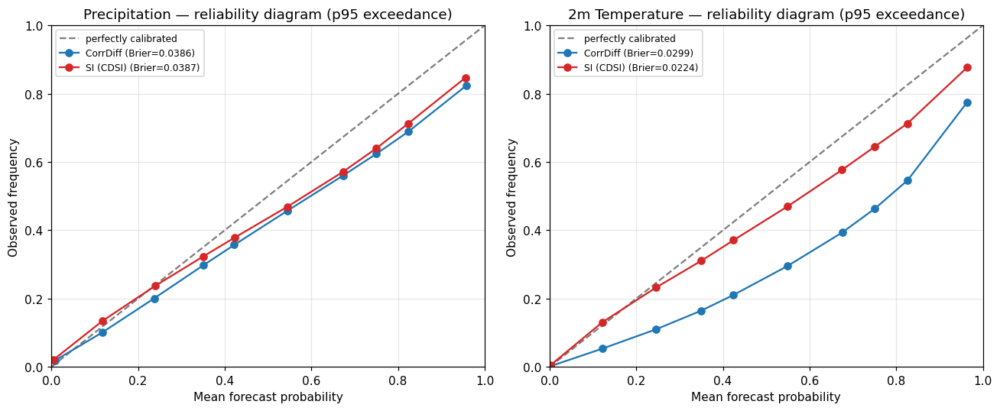

In [20]:
# Reliability diagram / Brier score at the 95th percentile (chosen for reasonable per-bin sample sizes;
# the same accumulator would work identically at p99 if a finer breakdown is wanted later).
REL_RESULTS = {}
combos = [(var, exp) for var in VARIABLES for exp in ENSEMBLE_MODELS]
for var, exp in tqdm(combos, desc="reliability diagrams"):
    thr_flat = THRESH_PERGRID[var][95].reshape(-1)
    REL_RESULTS[(exp, var)] = reliability_accumulate(ROOT, exp, var, thr_flat)

fig, axes = plt.subplots(1, len(VARIABLES), figsize=(6 * len(VARIABLES), 5), squeeze=False)
for i, var in enumerate(VARIABLES):
    ax = axes[0][i]
    ax.plot([0, 1], [0, 1], "k--", alpha=0.5, label="perfectly calibrated")
    for exp in ENSEMBLE_MODELS:
        edges, mean_pred_prob, obs_freq, count, brier = REL_RESULTS[(exp, var)]
        ax.plot(mean_pred_prob, obs_freq, marker="o", color=MODEL_COLORS[exp],
                label=f"{MODEL_LABELS[exp]} (Brier={brier:.4f})")
    ax.set_xlabel("Mean forecast probability"); ax.set_ylabel("Observed frequency")
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_title(f"{VAR_LONGNAME[var]} — reliability diagram (p95 exceedance)")
    ax.legend(fontsize=8)
plt.tight_layout()
savefig(fig, "reliability_diagram")
plt.show()

brier_df = pd.DataFrame([
    {"variable": var, "experiment": MODEL_LABELS[exp], "brier_score": REL_RESULTS[(exp, var)][4]}
    for var in VARIABLES for exp in ENSEMBLE_MODELS
]).set_index(["variable", "experiment"])
BRIER_DIRECTIONS = {"brier_score": "min"}
save_styled_table(brier_df, "brier_score_p95", BRIER_DIRECTIONS,
                   caption="Brier score, ensemble-probability p95-exceedance forecasts (SI/CorrDiff only; UNet has no ensemble probability).",
                   label="tab:brier")
style_best_second(brier_df, BRIER_DIRECTIONS)


In [21]:
# Tail-quantile bias table (reloads target + ensemble means fresh per variable, discarding after — see
# memory note in Section 3; independent of Section 8's now-freed pooled arrays)
QUANTILE_LEVELS = [0.95, 0.99, 0.999]

quant_rows = []
for var in tqdm(VARIABLES, desc="tail-quantile bias: variables"):
    target_da = load_full_array(ROOT, EXPERIMENTS[0], var, "target")
    tgt = target_da.values.ravel()
    del target_da
    tgt_q = {q: float(np.quantile(tgt, q)) for q in QUANTILE_LEVELS}
    for exp in tqdm(EXPERIMENTS, desc=f"  {var}: experiments", leave=False):
        pred_da = load_full_array(ROOT, exp, var, "ensemble_mean")
        pred_arr = pred_da.values.ravel()
        del pred_da
        for q in QUANTILE_LEVELS:
            pq = float(np.quantile(pred_arr, q))
            abs_bias = pq - tgt_q[q]
            rel_bias = (abs_bias / tgt_q[q] * 100.0) if (var == "pr" and tgt_q[q] != 0) else float("nan")
            quant_rows.append({"variable": var, "quantile": q, "experiment": MODEL_LABELS[exp],
                               "target_value": tgt_q[q], "model_value": pq,
                               "abs_bias": abs_bias, "rel_bias_pct": rel_bias})
        del pred_arr
    del tgt
    gc.collect()

quantile_bias_df = pd.DataFrame(quant_rows).set_index(["variable", "quantile", "experiment"])
QUANTILE_BIAS_DIRECTIONS = {"abs_bias": "abs_min", "rel_bias_pct": "abs_min"}
save_styled_table(quantile_bias_df, "tail_quantile_bias", QUANTILE_BIAS_DIRECTIONS,
                   caption="Tail-quantile bias (Q95/Q99/Q99.9), predicted (ensemble mean) vs. observed. rel\\_bias\\_pct only meaningful for pr.",
                   label="tab:quantile_bias")
style_best_second(quantile_bias_df, QUANTILE_BIAS_DIRECTIONS)


tail-quantile bias: variables:   0%|          | 0/2 [00:00<?, ?it/s]

  pr: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  pr: experiments:  33%|███▎      | 1/3 [00:11<00:23, 11.78s/it]

  pr: experiments:  67%|██████▋   | 2/3 [00:22<00:11, 11.10s/it]

  pr: experiments: 100%|██████████| 3/3 [00:34<00:00, 11.76s/it]

tail-quantile bias: variables:  50%|█████     | 1/2 [00:47<00:47, 47.68s/it]

  tas: experiments:   0%|          | 0/3 [00:00<?, ?it/s]

  tas: experiments:  33%|███▎      | 1/3 [00:10<00:21, 10.75s/it]

  tas: experiments:  67%|██████▋   | 2/3 [00:20<00:09,  9.87s/it]

  tas: experiments: 100%|██████████| 3/3 [00:29<00:00,  9.88s/it]

tail-quantile bias: variables: 100%|██████████| 2/2 [01:28<00:00, 43.43s/it]

tail-quantile bias: variables: 100%|██████████| 2/2 [01:28<00:00, 44.07s/it]

## 11. Consolidated rebuttal-ready output

Every table above was already saved as CSV + a standalone LaTeX fragment under `analysis/rebuttal_output/` as it was computed. This section just concatenates all the LaTeX fragments into one file and lists every CSV, so everything needed for the rebuttal letter/appendix can be found in one place without re-running the notebook.

In [22]:
tex_fragments = sorted(glob.glob(os.path.join(OUT_DIR, "*.tex")))
combined_path = os.path.join(OUT_DIR, "rebuttal_tables.tex")
with open(combined_path, "w") as out:
    out.write("% Auto-generated by rebuttal_metrics.ipynb Section 11 — one fragment per table, in filename order.\n\n")
    for tp in tex_fragments:
        if os.path.basename(tp) == "rebuttal_tables.tex":
            continue
        with open(tp) as f:
            out.write(f.read())
        out.write("\n")

csv_files = sorted(glob.glob(os.path.join(OUT_DIR, "*.csv")))
fig_files = sorted(glob.glob(os.path.join(FIG_DIR, "*.pdf")))

print(f"Combined LaTeX tables written to: {combined_path}")
print(f"\n{len(csv_files)} CSV tables in {OUT_DIR}:")
for p in csv_files:
    print(" -", os.path.basename(p))
print(f"\n{len(fig_files)} figures (PDF) in {FIG_DIR}:")
for p in fig_files:
    print(" -", os.path.basename(p))


Combined LaTeX tables written to: analysis/rebuttal_output/rebuttal_tables.tex

10 CSV tables in analysis/rebuttal_output:
 - baseline_metrics.csv
 - brier_score_p95.csv
 - contingency_domain_ensemble_mean.csv
 - contingency_pergrid_ensemble_mean.csv
 - contingency_pergrid_ensemble_probability.csv
 - fss_pergrid.csv
 - gpd_tail_fit.csv
 - percentile_conditional_metrics.csv
 - pr_dry_day_fraction.csv
 - tail_quantile_bias.csv

9 figures (PDF) in analysis/rebuttal_figures:
 - fss_curves.pdf
 - pdf_tail_analysis_pr.pdf
 - pdf_tail_analysis_tas.pdf
 - pod_sedi_map_pr_p95.pdf
 - rank_histogram_pr.pdf
 - rank_histogram_tas.pdf
 - reliability_diagram.pdf
 - rmse_inflation_bar.pdf
 - threshold_maps.pdf


## 12. Limitations and open methodological choices

These are design decisions made explicitly during this analysis; they don't invalidate the results but are worth stating plainly if reviewers ask about methodology:

1. **Ensemble-probability contingency table cutoff.** Section 5's bonus table binarizes SI/CorrDiff using a ≥50%-of-members majority vote. This is one specific design choice among many possible cutoffs; Section 10's reliability diagram is what actually characterizes behavior across the *whole* range of cutoffs, and should be treated as the more rigorous of the two if reviewers push on this point.
2. **Per-gridcell (primary) vs. domain-wide (supplementary) thresholds.** These give different POD/FAR numbers by design (Section 4/5) — this is intentional and documented, not an inconsistency, but should be called out explicitly if both tables are cited in the rebuttal to avoid the two being compared as if they were the same measurement.
3. **GPD fit uses a single domain-wide threshold**, not a per-gridcell one, for computational tractability (a per-gridcell POT fit — 220,000 independent GPD fits — would be a natural but substantially heavier follow-up; the domain-wide fit already gives a statistically robust characterization of the pooled tail).
4. **GPD fitting is done on a random subsample** (up to 200,000 exceedances) of the full exceedance set, since scipy's iterative MLE does not scale to the tens of millions of exceedances the full pooled dataset produces; 200,000 points is far more than typical POT studies use and the fit is essentially unchanged versus using more.
5. **The 20-member ensembles were streamed day-by-day rather than loaded in full** (Sections 2, 7, 9, 10) to keep memory bounded (20 × 1.6GB ≈ 32GB per experiment/variable would otherwise be required); this trades some wall-clock time for memory safety and does not affect the numerical results.
6. **UNet's non-ensemble diagnostics degrade to their deterministic analogue** (CRPS → MAE) rather than being left blank, so every table that can meaningfully include UNet does — but true ensemble-only diagnostics (rank histograms, reliability diagrams, ensemble-probability contingency tables) exclude it with an explicit note rather than a placeholder, since there is no meaningful single-member analogue for those.